In [1]:
!pip install tf-levenberg-marquardt

/tmp/ipykernel_2048/2433752268.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


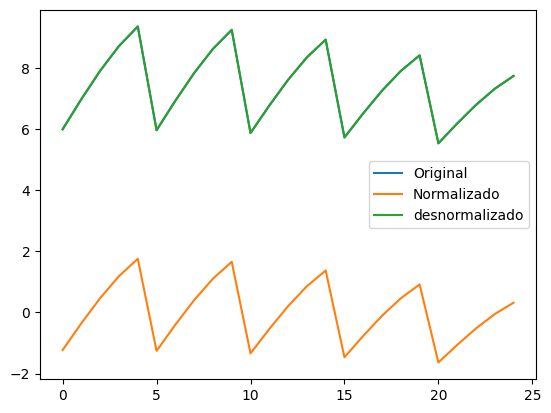

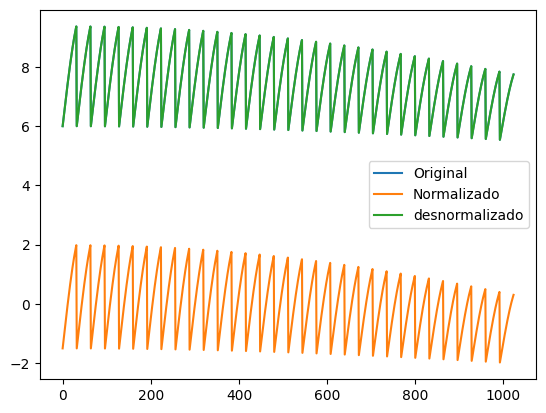

In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
out_scaler = StandardScaler()

def function(grid):
    x = np.linspace(0, 1, grid)
    y = np.linspace(0, 1, grid)
    x, y = np.meshgrid(x, y)
    z = np.sin(x) + np.cos(y) + 3 * np.sin(x) * np.cos(y) + 5
    return x, y, z

def create_dataframe(grid):
   x, y, z = function(grid)
   data = {'X': x.flatten(), 'Y': y.flatten(), 'Z': z.flatten()}
   df = pd.DataFrame(data)
   return df

def show_norm(df, label="function", plot=False):
    df_norm = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
    df_denorm = pd.DataFrame(scaler.inverse_transform(df_norm), columns=df_norm.columns)

    if (plot):
        df.plot(title=f"{label}: Original data")
        df_norm.plot(title=f"{label}: Normalized data")
        df_denorm.plot(title=f"{label}: Denormalized data")
    return (df_norm)


def test_out_scaler(df):
    out = df["Z"].values.reshape(-1, 1)  
    plt.plot(out, label='Original')
    out_scaler.fit(out)
    norm = out_scaler.transform(out)
    plt.plot(norm, label='Normalizado')
    plt.plot(out_scaler.inverse_transform(norm), label='desnormalizado')
    plt.legend()
    plt.show()


df_25 = create_dataframe(grid=5)
df_25_norm = show_norm(df_25)
test_out_scaler(df_25)

df_1000 = create_dataframe(grid=32)
df_1000_norm = show_norm(df_1000)
test_out_scaler(df_1000)



In [3]:
def split_df(df):
    _input = np.vstack([df['X'], df['Y']]).T
    _output = np.array(df['Z'])
    return (_input, _output)

In [4]:
import tensorflow as tf
import numpy as np
from keras import regularizers
from keras import initializers
import tf_levenberg_marquardt as lm


# layers, neurons
class ShuffleArchitecture:
    def __init__(self, input_size, hidden_sizes, output_size, act_h, act_o, param_reg):
        self.input_size = input_size
        self.hidden_sizes = hidden_sizes
        self.output_size = output_size
        self.act_h = act_h
        self.act_o = act_o
        self.regularizer = regularizers.L2(param_reg)
        self.initializer = initializers.RandomUniform(minval=-0.5, maxval=0.5, seed=np.random.randint(1, 10000))

    def compute_k(self):
        total_parameters = 0
        for layer in self.model.layers:
            weights = layer.get_weights()
            if len(weights) > 0:  
                for w in weights:
                    total_parameters += np.prod(w.shape)
        return total_parameters
        
    def set_architecture(self):
        self.model = tf.keras.Sequential()
        self.model.add(tf.keras.layers.Dense(self.hidden_sizes[0],
                        input_shape=(self.input_size,),
                        activation=self.act_h,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,                        
                        ))  # input layer

        for size in self.hidden_sizes[1:]:  # hidden layers
            self.model.add(tf.keras.layers.Dense(size,
                            activation=self.act_h,
                            kernel_regularizer=self.regularizer,
                            kernel_initializer=self.initializer,  
                        ))

        self.model.add(tf.keras.layers.Dense(self.output_size,
                        activation=self.act_o,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,  
                        ))  # output layer

    def create_model(self, _learning_rate):
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
            loss=lm.loss.MeanSquaredError())

        self.lm_model = lm.model.ModelWrapper(
            tf.keras.models.clone_model(self.model))
  

        self.lm_model.compile(
            optimizer=tf.keras.optimizers.SGD(learning_rate=_learning_rate),
            loss=lm.loss.MeanSquaredError())
        return(self.lm_model)


2025-01-06 15:28:45.040622: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-01-06 15:28:46.249278: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-01-06 15:28:46.550829: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1736177327.177082    2048 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1736177327.357104    2048 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-06 15:28:48.838682: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

In [5]:
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_percentage_error 

class TrainWithSmallDataset:
    def __init__(self, batch_size=1000):
        self.batch_size = batch_size
        self.betters = []
        self.k = 0

    def create_dataset(self, input, output):
      input = tf.expand_dims(tf.cast(input, tf.float32), axis=-1)
      output = tf.expand_dims(tf.cast(output, tf.float32), axis=-1)
      dataset = tf.data.Dataset.from_tensor_slices((input, output))
      dataset = dataset.shuffle(len(input))
      dataset = dataset.batch(self.batch_size).cache()
      dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
      return (dataset, input, output)

    def split_dataset(self, input, output, sup_input, sup_output):
      input_train, input_vt, output_train, output_vt = train_test_split(input, output, test_size=0.3, shuffle = True)
      input_val, input_test, output_val, output_test = train_test_split(input_vt, output_vt, test_size=0.5, shuffle = True)

      self.train_dataset, self.train_input, self.train_output = self.create_dataset(input_train, output_train)
      self.val_dataset, self.val_input, self.val_output = self.create_dataset(input_val, output_val)
      self.test_dataset, self.test_input, self.test_output = self.create_dataset(input_test, output_test)
      self.vt_dataset, self.vt_input, self.vt_output = self.create_dataset(input_vt, output_vt)
      self.sup_dataset, self.sup_input, self.sup_output = self.create_dataset(sup_input, sup_output)
      self.dataset, self.input, self.output = self.create_dataset(input, output)

      self._data = (input, output)
      self._train = (input_train, output_train)
      self._vt = (input_vt, output_vt)
      self._val = (input_val, output_val)
      self._test = (input_test, output_test)
      self._sup = (sup_input, sup_output)

    def train_using_lm(self, train_dataset, epochs=1000):
      early_stopping_monitor = EarlyStopping(monitor='val_loss',
                                              patience=6,
                                              restore_best_weights=True)

      self.results = self.lm_model.fit(train_dataset,
                                            epochs=epochs,
                                            validation_data=self.val_dataset,
                                            callbacks=[early_stopping_monitor],
                                            verbose=0)
      print ("Stopped at epoch: ", early_stopping_monitor.stopped_epoch)
    
    def get_new_metrics(self, orig, pred, r2, mse):
      n = len(orig) # N: quantidade de saidas
      k = self.k
      waste = (orig.flatten() - pred.flatten())

      mape = mean_absolute_percentage_error(orig, pred)  
      r2_adj = 1 - (((n - 1)/(n - k - 1)) * (1 - r2))
      rsd = np.sqrt(np.sum(waste ** 2) / (n - 2))
      rmse = root_mean_squared_error(orig, pred)          
      aic = (-2 * np.log(mse)) + (2 * k)
      bic = (-2 * np.log(mse)) + (k * np.log(n))
      return (mape, r2_adj, rsd, rmse, aic, bic)
      

    def get_metrics(self):
          # Calculando a saida com os dados normalizados
          pred = self.lm_model.predict(self.input).flatten()
          test_pred = self.lm_model.predict(self.test_input).flatten()
          val_pred = self.lm_model.predict(self.val_input).flatten()
          vt_pred = self.lm_model.predict(self.vt_input).flatten()
          sup_pred = self.lm_model.predict(self.sup_input).flatten()

          # Calculando as metricas com a saida desnormalizada
          pred_denorm = out_scaler.inverse_transform(pred.reshape(-1, 1))
          test_pred_denorm = out_scaler.inverse_transform(test_pred.reshape(-1, 1))
          val_pred_denorm = out_scaler.inverse_transform(val_pred.reshape(-1, 1))
          vt_pred_denorm = out_scaler.inverse_transform(vt_pred.reshape(-1, 1))
          sup_pred_denorm = out_scaler.inverse_transform(sup_pred.reshape(-1, 1))

          out_denorm = out_scaler.inverse_transform(self._data[1].reshape(-1, 1))
          test_denorm = out_scaler.inverse_transform(self._test[1].reshape(-1, 1))
          val_denorm = out_scaler.inverse_transform(self._val[1].reshape(-1, 1))
          vt_denorm = out_scaler.inverse_transform(self._vt[1].reshape(-1, 1))    
          sup_denorm = out_scaler.inverse_transform(self._sup[1].reshape(-1, 1))

          r2 = r2_score(out_denorm, pred_denorm)
          r2_test = r2_score(test_denorm, test_pred_denorm)
          r2_val = r2_score(val_denorm, val_pred_denorm)
          r2_vt = r2_score(vt_denorm,  vt_pred_denorm)
          r2_sup = r2_score(sup_denorm,  sup_pred_denorm)

          mse = mean_squared_error(out_denorm, pred_denorm)
          mse_test = mean_squared_error(test_denorm, test_pred_denorm)
          mse_val = mean_squared_error(val_denorm, val_pred_denorm)
          mse_vt = mean_squared_error(vt_denorm,  vt_pred_denorm)
          mse_sup = mean_squared_error(sup_denorm,  sup_pred_denorm)
          
          mape, r2_adj, rsd, rmse, aic, bic = self.get_new_metrics(out_denorm, pred_denorm, r2, mse)
          metrics = {
                          'r2': r2,
                          'r2_sup': r2_sup,
                          'r2_test': r2_test,
                          'r2_val': r2_val,
                          'r2_vt': r2_vt,
                          'mse': mse,
                          'mse_sup': mse_sup,
                          'mse_test': mse_test,
                          'mse_val': mse_val,
                          'mse_vt': mse_vt,
                          'mape': mape,
                          'rmse': rmse,
                          'r2_adj': r2_adj,
                          'rsd': rsd,
                          'aic': aic,
                          'bic': bic
                          }

          return metrics

In [15]:
import pickle
from itertools import product

class Tester:
  def __init__(self, run_times=500, dataset_run_times=10):
    self.run_times = run_times
    self.better_metrics = {}
    self.dataset_run_times = dataset_run_times
    self.input_25, self.output_25 = split_df(df_25_norm)
    self.input_1000, self.output_1000 = split_df(df_1000_norm)
  
  def setArchitecure(self, trainer, _hidden_sizes, _pg, _lr):
    shuffler = ShuffleArchitecture(input_size=2,
                                    hidden_sizes=_hidden_sizes,
                                    output_size=1,
                                    act_h='tanh',
                                    act_o='linear',
                                    param_reg=_pg)
    shuffler.set_architecture()    
    trainer.lm_model = shuffler.create_model(_lr)
    trainer.k = shuffler.compute_k()

  def Train(self, trainer, epochs=1000):
    trainer.train_using_lm(trainer.train_dataset, epochs=epochs)
    return(trainer.get_metrics(), trainer.lm_model)

 
  def SaveModelWeights(self, model, fileName):
    if not fileName.endswith(".keras"):
        fileName += ".keras"
    path = f"content/models/{fileName}"
    open(path,'w').close()
    model.save(path)

  def SaveDataset(self, trainer, fileName):
    path = f"content/dataset/{fileName}.pkl" 
    with open(path, 'wb') as f:
      pickle.dump((trainer._data, trainer._train, trainer._vt, trainer._val, trainer._test), f)
      
  def LoopWeights(self, sort_by, boundarie, trainer, idx):
    better_model = 0
    save = False

    for i in range(self.run_times):
      print (f"+++++++++++ [{idx}] | {i + 1} ++++++++++++++++++")
      metrics, model = self.Train(trainer)
      if (metrics[sort_by] <= boundarie): # should be >= to acsending metrics
        fileName = f"model_{idx}_{better_model}"
        self.SaveModelWeights(model, fileName)
        self.better_metrics[fileName] = metrics
        better_model += 1
        save = True
    return(save)

  def Loop(self, sort_by, boundarie, hidden_sizes, regularizers, learning_rate):
    trainer = TrainWithSmallDataset()

    for count, (hidden_size, reg, lr) in enumerate(product(hidden_sizes, regularizers, learning_rate), start=1):
      header =  f"Hidden Size={hidden_size}, regularizer={reg}, learning_rate={lr}"
      print(f"Testando combinacao{count}: {header}")
      self.setArchitecure(trainer, hidden_size, reg, lr)
      for j in range(self.dataset_run_times):
        trainer.split_dataset(self.input_25, self.output_25, self.input_1000, self.output_1000)
        if (self.LoopWeights(sort_by, boundarie, trainer, f"{count}_{j}") == True):
          self.SaveDataset(trainer, f"dataset_{count}_{j}")
          self.DisplayBetterResults('mse_sup', header, f"{count}_{j}")
        self.better_metrics = {}

  def DisplayBetterResults(self, sort_by, header, dataset=0):
    df = pd.DataFrame.from_dict(self.better_metrics, orient='index')
    df = df.sort_values([sort_by])
    display(df)
    path = f'content/results/metrics_{dataset}'
    df.to_excel(f"{path}.xlsx", index=True)
    print(f"DataFrame salvo em {path}")
    with open(f"{path}.txt", 'w') as arquivo:
      arquivo.write(header)

In [16]:
import os
print(os.getcwd())

/workspaces/Ic-Rna-2024/fuction_ensemble_2/redes-ensemble-s/Teste01


# Treinando com 25 dados


In [17]:
tester = Tester(run_times=25, dataset_run_times=10)
tester.Loop(sort_by='mse',
            boundarie = 0.5, 
            hidden_sizes = [[5], [6], [7], [8], [9], [10], [11], [12], [13], [14]],
            regularizers=[0.2, 0.05],
            learning_rate=[0.01, 0.1])

Testando combinacao1: Hidden Size=[5], regularizer=0.2, learning_rate=0.01
+++++++++++ [1_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [1_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_0_24,0.822425,0.824183,0.833022,0.601138,0.781522,0.165758,0.164118,0.230949,0.170067,0.200508,0.047077,0.407134,-0.420597,0.424467,45.594452,71.190844
model_1_0_23,0.818946,0.820736,0.829768,0.593216,0.777229,0.169006,0.167335,0.235450,0.173445,0.204447,0.047535,0.411103,-0.448430,0.428605,45.555645,71.152037
model_1_0_22,0.812132,0.813981,0.823498,0.578054,0.768982,0.175367,0.173640,0.244122,0.179909,0.212016,0.048414,0.418768,-0.502948,0.436596,45.481749,71.078141
model_1_0_21,0.809605,0.811512,0.821229,0.573153,0.766134,0.177726,0.175945,0.247261,0.181999,0.214630,0.048742,0.421575,-0.523163,0.439523,45.455027,71.051420
model_1_0_20,0.805823,0.807759,0.817712,0.564525,0.761480,0.181255,0.179449,0.252125,0.185678,0.218901,0.049227,0.425741,-0.553413,0.443866,45.415697,71.012089
model_1_0_19,0.801956,0.803918,0.814109,0.555634,0.756700,0.184865,0.183034,0.257108,0.189469,0.223288,0.049713,0.429959,-0.584350,0.448264,45.376258,70.972650
model_1_0_18,0.790818,0.792855,0.804023,0.532436,0.743711,0.195262,0.193361,0.271058,0.199360,0.235209,0.051105,0.441885,-0.673458,0.460697,45.266821,70.863213
model_1_0_17,0.780432,0.782574,0.794646,0.512535,0.732022,0.204957,0.202958,0.284028,0.207846,0.245937,0.052395,0.452722,-0.756542,0.471995,45.169912,70.766304
model_1_0_16,0.779276,0.781500,0.793421,0.508246,0.730102,0.206036,0.203960,0.285722,0.209674,0.247698,0.052526,0.453912,-0.765791,0.473236,45.159409,70.755801
model_1_0_15,0.775062,0.777307,0.789369,0.497890,0.724643,0.209970,0.207874,0.291326,0.214090,0.252708,0.053014,0.458225,-0.799505,0.477732,45.121582,70.717975


DataFrame salvo em content/results/metrics_1_0
+++++++++++ [1_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [1_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [1_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_1_24,0.930768,0.931508,0.930239,0.851047,0.919638,0.064625,0.063934,0.073425,0.027374,0.050400,0.030116,0.254215,0.446141,0.265038,47.478295,73.074687
model_1_1_23,0.924541,0.925336,0.925141,0.842004,0.914035,0.070438,0.069696,0.078791,0.029036,0.053913,0.031388,0.265402,0.396324,0.276701,47.306042,72.902434
model_1_1_22,0.920472,0.921308,0.921742,0.836286,0.910345,0.074236,0.073456,0.082368,0.030087,0.056227,0.032184,0.272463,0.363772,0.284063,47.201003,72.797396
model_1_1_21,0.917915,0.918753,0.920505,0.839148,0.909726,0.076622,0.075841,0.083670,0.029561,0.056616,0.032612,0.276807,0.343324,0.288592,47.137734,72.734127
model_1_1_20,0.900073,0.901035,0.904050,0.809697,0.891604,0.093277,0.092380,0.100989,0.034973,0.067981,0.035940,0.305413,0.200586,0.318415,46.744357,72.340750
model_1_1_19,0.898080,0.899058,0.902188,0.806283,0.889541,0.095138,0.094225,0.102949,0.035601,0.069275,0.036294,0.308445,0.184638,0.321576,46.704851,72.301243
model_1_1_18,0.896214,0.897207,0.900534,0.803088,0.887685,0.096879,0.095953,0.104690,0.036188,0.070439,0.036628,0.311255,0.169714,0.324505,46.668577,72.264969
model_1_1_17,0.894169,0.895179,0.898629,0.799766,0.885600,0.098788,0.097846,0.106695,0.036798,0.071747,0.036984,0.314306,0.153353,0.327687,46.629548,72.225941
model_1_1_16,0.892071,0.893100,0.896712,0.796211,0.883471,0.100747,0.099786,0.108712,0.037452,0.073082,0.037345,0.317406,0.136569,0.330919,46.590289,72.186681
model_1_1_15,0.889940,0.890987,0.894772,0.792588,0.881312,0.102736,0.101759,0.110754,0.038117,0.074436,0.037708,0.320525,0.119520,0.334170,46.551182,72.147574


DataFrame salvo em content/results/metrics_1_1
+++++++++++ [1_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_2_24,0.967522,0.967889,0.970216,0.986108,0.973784,0.030316,0.029974,0.057353,0.005263,0.031308,0.020747,0.174116,0.740179,0.181529,48.992132,74.588525
model_1_2_23,0.966998,0.967386,0.969782,0.985889,0.973400,0.030806,0.030443,0.058189,0.005346,0.031768,0.020916,0.175516,0.735983,0.182988,48.960093,74.556485
model_1_2_22,0.966628,0.967045,0.969480,0.985688,0.973125,0.031152,0.030762,0.058770,0.005422,0.032096,0.021041,0.176498,0.733021,0.184012,48.937779,74.534171
model_1_2_21,0.965265,0.965699,0.968169,0.985133,0.971980,0.032424,0.032018,0.061294,0.005633,0.033464,0.021462,0.180067,0.722117,0.187732,48.857713,74.454105
model_1_2_20,0.964595,0.965042,0.967559,0.984842,0.971441,0.033049,0.032631,0.062470,0.005743,0.034107,0.021668,0.181795,0.716757,0.189534,48.819505,74.415897
model_1_2_19,0.964024,0.964490,0.967003,0.984650,0.970963,0.033582,0.033147,0.063539,0.005816,0.034678,0.021838,0.183254,0.712191,0.191056,48.787522,74.383914
model_1_2_18,0.963404,0.963885,0.966443,0.984392,0.970470,0.034161,0.033712,0.064619,0.005913,0.035266,0.022024,0.184826,0.707233,0.192695,48.753360,74.349752
model_1_2_17,0.962711,0.963210,0.965781,0.984109,0.969892,0.034808,0.034342,0.065892,0.006021,0.035957,0.022230,0.186569,0.701684,0.194512,48.715813,74.312205
model_1_2_16,0.961955,0.962466,0.965076,0.983797,0.969274,0.035514,0.035037,0.067251,0.006139,0.036695,0.022453,0.188451,0.695636,0.196474,48.675670,74.272062
model_1_2_15,0.957532,0.957976,0.962514,0.979183,0.966476,0.039642,0.039227,0.072185,0.007887,0.040036,0.023785,0.199104,0.660252,0.207580,48.455709,74.052101


DataFrame salvo em content/results/metrics_1_2
+++++++++++ [1_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_3_24,0.984573,0.984619,0.987322,0.979092,0.985651,0.014400,0.014357,0.015171,0.015198,0.015184,0.014489,0.120001,0.876585,0.125110,50.481004,76.077396
model_1_3_23,0.984261,0.984315,0.987051,0.978696,0.985362,0.014691,0.014641,0.015494,0.015486,0.015490,0.014634,0.121208,0.874090,0.126368,50.440981,76.037373
model_1_3_22,0.983957,0.984024,0.986759,0.978364,0.985083,0.014975,0.014913,0.015844,0.015727,0.015785,0.014769,0.122373,0.871659,0.127582,50.402738,75.999130
model_1_3_21,0.983695,0.983771,0.986509,0.978144,0.984866,0.015220,0.015149,0.016142,0.015887,0.016015,0.014881,0.123369,0.869562,0.128621,50.370314,75.966706
model_1_3_20,0.983393,0.983471,0.986136,0.977771,0.984527,0.015502,0.015429,0.016589,0.016158,0.016374,0.015000,0.124505,0.867147,0.129806,50.333626,75.930018
model_1_3_19,0.983079,0.983170,0.985790,0.977527,0.984248,0.015795,0.015710,0.017003,0.016336,0.016669,0.015132,0.125680,0.864628,0.131030,50.296069,75.892461
model_1_3_18,0.982772,0.982871,0.985481,0.977208,0.983963,0.016081,0.015989,0.017373,0.016567,0.016970,0.015261,0.126812,0.862178,0.132211,50.260192,75.856584
model_1_3_17,0.982419,0.982526,0.985168,0.976750,0.983629,0.016411,0.016311,0.017748,0.016901,0.017324,0.015415,0.128107,0.859349,0.133561,50.219560,75.815952
model_1_3_16,0.982065,0.982183,0.984857,0.976256,0.983284,0.016742,0.016631,0.018119,0.017260,0.017689,0.015568,0.129391,0.856517,0.134899,50.179680,75.776073
model_1_3_15,0.978029,0.978281,0.980686,0.972432,0.979612,0.020509,0.020273,0.023110,0.020039,0.021575,0.017071,0.143210,0.824231,0.149307,49.773770,75.370162


DataFrame salvo em content/results/metrics_1_3
+++++++++++ [1_4] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_4] | 2 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_4_24,0.997072,0.996733,0.997938,0.997414,0.997626,0.002734,0.003050,0.001575,0.002904,0.002239,0.006430,0.052284,0.976572,0.054509,53.804289,79.400682
model_1_4_23,0.996690,0.996385,0.997647,0.997087,0.997314,0.003090,0.003374,0.001797,0.003271,0.002534,0.006835,0.055587,0.973519,0.057953,53.559234,79.155627
model_1_4_22,0.996490,0.996191,0.997477,0.996938,0.997156,0.003277,0.003556,0.001927,0.003439,0.002683,0.007039,0.057243,0.971918,0.059680,53.441829,79.038221
model_1_4_21,0.996342,0.996046,0.997210,0.996829,0.996983,0.003415,0.003691,0.002131,0.003561,0.002846,0.007147,0.058436,0.970734,0.060924,53.359265,78.955657
model_1_4_20,0.996269,0.995976,0.997149,0.996773,0.996925,0.003482,0.003756,0.002178,0.003624,0.002901,0.007217,0.059012,0.970154,0.061524,53.320048,78.916440
model_1_4_19,0.996037,0.995754,0.996944,0.996569,0.996721,0.003699,0.003964,0.002334,0.003853,0.003094,0.007436,0.060822,0.968296,0.063412,53.199201,78.795593
model_1_4_18,0.995737,0.995477,0.996694,0.996301,0.996460,0.003979,0.004222,0.002525,0.004154,0.003339,0.007706,0.063081,0.965897,0.065767,53.053339,78.649731
model_1_4_17,0.995647,0.995391,0.996611,0.996213,0.996374,0.004063,0.004303,0.002589,0.004253,0.003421,0.007787,0.063745,0.965175,0.066459,53.011440,78.607833
model_1_4_16,0.995504,0.995254,0.996481,0.996081,0.996243,0.004197,0.004430,0.002688,0.004400,0.003544,0.007903,0.064781,0.964034,0.067539,52.946948,78.543340
model_1_4_15,0.995414,0.995168,0.996405,0.996011,0.996170,0.004281,0.004511,0.002747,0.004479,0.003613,0.007982,0.065429,0.963311,0.068214,52.907163,78.503555


DataFrame salvo em content/results/metrics_1_4
+++++++++++ [1_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_5_24,0.998748,0.998236,0.998830,0.998716,0.998777,0.001169,0.001647,0.000881,0.002044,0.001462,0.004186,0.034185,0.989985,0.035640,55.503906,81.100299
model_1_5_23,0.998731,0.998228,0.998810,0.998694,0.998756,0.001184,0.001654,0.000895,0.002078,0.001487,0.004213,0.034416,0.989849,0.035881,55.476920,81.073312
model_1_5_22,0.998578,0.998091,0.998623,0.998557,0.998605,0.001328,0.001782,0.001037,0.002297,0.001667,0.004467,0.036436,0.988622,0.037987,55.248756,80.845149
model_1_5_21,0.998549,0.998067,0.998601,0.998521,0.998575,0.001355,0.001804,0.001053,0.002354,0.001703,0.004511,0.036807,0.988390,0.038373,55.208317,80.804709
model_1_5_20,0.998520,0.998044,0.998576,0.998489,0.998546,0.001382,0.001826,0.001072,0.002405,0.001738,0.004556,0.037169,0.988160,0.038752,55.169085,80.765478
model_1_5_19,0.998490,0.998018,0.998550,0.998457,0.998516,0.001410,0.001850,0.001091,0.002455,0.001773,0.004602,0.037545,0.987919,0.039143,55.128909,80.725301
model_1_5_18,0.998459,0.997991,0.998525,0.998424,0.998486,0.001438,0.001875,0.001110,0.002509,0.001810,0.004649,0.037927,0.987672,0.039542,55.088337,80.684729
model_1_5_17,0.998428,0.997964,0.998498,0.998392,0.998456,0.001467,0.001901,0.001130,0.002559,0.001845,0.004696,0.038304,0.987426,0.039934,55.048825,80.645217
model_1_5_16,0.998397,0.997936,0.998471,0.998358,0.998426,0.001497,0.001927,0.001151,0.002613,0.001882,0.004744,0.038687,0.987173,0.040334,55.009005,80.605398
model_1_5_15,0.998365,0.997908,0.998443,0.998326,0.998395,0.001526,0.001953,0.001172,0.002664,0.001918,0.004791,0.039066,0.986920,0.040729,54.969975,80.566367


DataFrame salvo em content/results/metrics_1_5
+++++++++++ [1_6] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_6] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [1_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [1_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_6_24,0.999368,0.998617,0.998887,0.999334,0.999263,0.000590,0.001291,0.000363,0.000879,0.000621,0.002894,0.024280,0.994948,0.025313,56.872453,82.468846
model_1_6_23,0.999364,0.998616,0.998902,0.999328,0.999261,0.000593,0.001292,0.000358,0.000886,0.000622,0.002903,0.024357,0.994915,0.025394,56.859722,82.456114
model_1_6_22,0.999340,0.998603,0.998843,0.999303,0.999230,0.000616,0.001304,0.000377,0.000919,0.000648,0.002966,0.024817,0.994722,0.025874,56.784856,82.381248
model_1_6_21,0.999258,0.998542,0.998703,0.999219,0.999137,0.000693,0.001361,0.000423,0.001030,0.000726,0.003160,0.026324,0.994061,0.027445,56.549109,82.145501
model_1_6_20,0.999247,0.998533,0.998693,0.999211,0.999129,0.000703,0.001369,0.000426,0.001040,0.000733,0.003185,0.026508,0.993978,0.027637,56.521206,82.117598
model_1_6_19,0.999234,0.998524,0.998663,0.999199,0.999114,0.000715,0.001378,0.000436,0.001056,0.000746,0.003216,0.026740,0.993872,0.027878,56.486409,82.082801
model_1_6_18,0.999212,0.998517,0.998579,0.999176,0.999080,0.000736,0.001384,0.000463,0.001086,0.000775,0.003272,0.027129,0.993692,0.028284,56.428631,82.025023
model_1_6_17,0.999201,0.998510,0.998568,0.999161,0.999065,0.000746,0.001391,0.000467,0.001107,0.000787,0.003297,0.027314,0.993606,0.028477,56.401379,81.997772
model_1_6_16,0.999186,0.998499,0.998536,0.999143,0.999046,0.000760,0.001401,0.000477,0.001130,0.000803,0.003328,0.027561,0.993490,0.028735,56.365389,81.961781
model_1_6_15,0.999168,0.998485,0.998491,0.999124,0.999022,0.000776,0.001414,0.000492,0.001155,0.000824,0.003367,0.027862,0.993347,0.029048,56.321931,81.918323


DataFrame salvo em content/results/metrics_1_6
+++++++++++ [1_7] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_7] | 2 ++++++++++++++++++
Stopped at epoch:  24
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_7] | 3 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_7] | 4 ++++++++++++++++++
Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_7_12,0.999875,0.999138,0.999919,0.999714,0.999817,0.000117,0.000805,0.000030,0.000208,0.000119,0.001201,0.010823,0.998996,0.011284,60.104246,85.700639
model_1_7_13,0.999877,0.999137,0.999921,0.999714,0.999818,0.000115,0.000806,0.000029,0.000207,0.000118,0.001191,0.010735,0.999012,0.011192,60.136862,85.733254
model_1_7_14,0.999884,0.999134,0.999929,0.999722,0.999825,0.000108,0.000809,0.000026,0.000202,0.000114,0.001153,0.010398,0.999073,0.010840,60.264701,85.861093
model_1_7_15,0.999888,0.999133,0.999934,0.999729,0.999830,0.000104,0.000809,0.000024,0.000197,0.000111,0.001131,0.010203,0.999108,0.010637,60.340425,85.936817
model_1_7_16,0.999890,0.999133,0.999936,0.999731,0.999832,0.000103,0.000809,0.000024,0.000195,0.000110,0.001123,0.010128,0.999121,0.010559,60.369718,85.966110
model_1_7_17,0.999895,0.999129,0.999940,0.999736,0.999835,0.000098,0.000813,0.000022,0.000192,0.000107,0.001100,0.009913,0.999158,0.010335,60.455510,86.051902
model_1_7_18,0.999897,0.999128,0.999941,0.999738,0.999837,0.000097,0.000814,0.000022,0.000190,0.000106,0.001089,0.009828,0.999172,0.010246,60.490231,86.086623
model_1_7_19,0.999898,0.999126,0.999943,0.999735,0.999836,0.000096,0.000816,0.000021,0.000193,0.000107,0.001083,0.009777,0.999181,0.010194,60.510755,86.107147
model_1_7_21,0.999901,0.999125,0.999945,0.999746,0.999843,0.000092,0.000817,0.000020,0.000185,0.000102,0.001065,0.009601,0.999210,0.010009,60.583736,86.180129
model_1_7_20,0.999899,0.999124,0.999943,0.999739,0.999838,0.000094,0.000818,0.000021,0.000190,0.000105,0.001076,0.009703,0.999193,0.010116,60.541410,86.137802


DataFrame salvo em content/results/metrics_1_7
+++++++++++ [1_8] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_8_9,0.999945,0.999127,0.999936,0.999984,0.999968,0.000052,0.000815,0.000051,0.000009,0.000030,0.000769,0.007176,0.999559,0.007482,61.747788,87.344180
model_1_8_8,0.999944,0.999127,0.999935,0.999984,0.999967,0.000053,0.000815,0.000052,0.000009,0.000030,0.000777,0.007247,0.999550,0.007555,61.708804,87.305196
model_1_8_6,0.999942,0.999127,0.999933,0.999983,0.999966,0.000055,0.000815,0.000053,0.000010,0.000031,0.000793,0.007387,0.999532,0.007702,61.632123,87.228515
model_1_8_7,0.999943,0.999126,0.999934,0.999983,0.999967,0.000054,0.000816,0.000053,0.000010,0.000031,0.000786,0.007324,0.999540,0.007635,61.666630,87.263022
model_1_8_1,0.999928,0.999126,0.999925,0.999978,0.999961,0.000067,0.000816,0.000060,0.000012,0.000036,0.000899,0.008184,0.999426,0.008532,61.222329,86.818722
model_1_8_5,0.999940,0.999126,0.999932,0.999981,0.999965,0.000056,0.000816,0.000054,0.000011,0.000032,0.000805,0.007471,0.999522,0.007789,61.586985,87.183377
model_1_8_2,0.999930,0.999125,0.999926,0.999979,0.999962,0.000066,0.000816,0.000059,0.000012,0.000035,0.000888,0.008108,0.999437,0.008453,61.259597,86.855989
model_1_8_4,0.999932,0.999125,0.999928,0.999981,0.999963,0.000063,0.000817,0.000058,0.000011,0.000034,0.000868,0.007965,0.999456,0.008304,61.330850,86.927243
model_1_8_14,0.999951,0.999125,0.999937,0.999986,0.999969,0.000045,0.000817,0.000050,0.000008,0.000029,0.000732,0.006745,0.999610,0.007032,61.995838,87.592230
model_1_8_3,0.999931,0.999125,0.999926,0.999980,0.999963,0.000065,0.000817,0.000059,0.000011,0.000035,0.000879,0.008047,0.999445,0.008390,61.289620,86.886012


DataFrame salvo em content/results/metrics_1_8
+++++++++++ [1_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_9_8,0.999973,0.999150,0.999983,0.999965,0.999979,0.000026,0.000793,0.000013,0.000028,0.000020,0.000540,0.005062,0.999780,0.005277,63.143977,88.740369
model_1_9_9,0.999973,0.999149,0.999982,0.999964,0.999979,0.000026,0.000795,0.000013,0.000029,0.000021,0.000538,0.005054,0.999781,0.005269,63.150339,88.746731
model_1_9_10,0.999973,0.999145,0.999978,0.999956,0.999974,0.000025,0.000798,0.000016,0.000035,0.000025,0.000529,0.004984,0.999787,0.005197,63.205710,88.802103
model_1_9_11,0.999974,0.999143,0.999978,0.999957,0.999974,0.000025,0.000800,0.000016,0.000035,0.000025,0.000525,0.004951,0.999790,0.005162,63.232300,88.828693
model_1_9_7,0.999973,0.999139,0.999989,0.999973,0.999985,0.000026,0.000803,0.000008,0.000022,0.000015,0.000560,0.005054,0.999781,0.005269,63.150423,88.746816
model_1_9_12,0.999973,0.999137,0.999969,0.999945,0.999966,0.000025,0.000806,0.000023,0.000044,0.000033,0.000523,0.005044,0.999782,0.005258,63.158500,88.754893
model_1_9_13,0.999973,0.999122,0.999956,0.999941,0.999959,0.000025,0.000819,0.000033,0.000047,0.000040,0.000516,0.004987,0.999787,0.005199,63.203826,88.800218
model_1_9_0,0.999960,0.999118,0.999974,0.999945,0.999967,0.000038,0.000823,0.000020,0.000044,0.000032,0.000685,0.006129,0.999678,0.006390,62.379099,87.975491
model_1_9_1,0.999959,0.999117,0.999970,0.999941,0.999964,0.000038,0.000824,0.000022,0.000048,0.000035,0.000692,0.006182,0.999672,0.006445,62.344325,87.940717
model_1_9_2,0.999959,0.999117,0.999970,0.999938,0.999963,0.000038,0.000824,0.000022,0.000050,0.000036,0.000693,0.006187,0.999672,0.006451,62.341114,87.937506


DataFrame salvo em content/results/metrics_1_9
Testando combinacao2: Hidden Size=[5], regularizer=0.2, learning_rate=0.1
+++++++++++ [2_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [2_0] | 3 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [2_0] | 5 +++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_0_11,0.999953,0.999080,0.999962,0.999940,0.999955,0.000044,0.000859,0.000053,0.000055,0.000054,0.000759,0.006601,0.999627,0.006882,62.081926,87.678318
model_2_0_12,0.999982,0.999045,0.999976,0.999972,0.999976,0.000017,0.000892,0.000033,0.000025,0.000029,0.000429,0.004083,0.999857,0.004257,64.003304,89.599696
model_2_0_13,0.999983,0.999041,0.999972,0.999973,0.999974,0.000016,0.000895,0.000039,0.000024,0.000032,0.000405,0.003994,0.999863,0.004164,64.092232,89.688624
model_2_0_14,0.999981,0.999020,0.999944,0.999972,0.999957,0.000018,0.000915,0.000079,0.000025,0.000052,0.000308,0.004236,0.999846,0.004416,63.856670,89.453063
model_2_0_10,0.999840,0.999014,0.999878,0.999822,0.999863,0.000149,0.000920,0.000171,0.000161,0.000166,0.001379,0.012204,0.998723,0.012724,59.623872,85.220264
model_2_0_15,0.999978,0.999010,0.999931,0.999969,0.999948,0.000020,0.000924,0.000098,0.000028,0.000063,0.000270,0.004505,0.999826,0.004697,63.610455,89.206848
model_2_0_16,0.999975,0.999002,0.999919,0.999966,0.999940,0.000023,0.000932,0.000113,0.000031,0.000072,0.000257,0.004804,0.999802,0.005009,63.352921,88.949314
model_2_0_17,0.999974,0.999000,0.999914,0.999964,0.999936,0.000025,0.000933,0.000121,0.000032,0.000077,0.000261,0.004964,0.999789,0.005176,63.221799,88.818191
model_2_0_18,0.999973,0.999000,0.999913,0.999964,0.999936,0.000025,0.000934,0.000122,0.000033,0.000077,0.000262,0.004976,0.999788,0.005188,63.212200,88.808592
model_2_0_19,0.999973,0.998999,0.999911,0.999963,0.999935,0.000025,0.000935,0.000125,0.000034,0.000079,0.000264,0.005033,0.999783,0.005247,63.167023,88.763416


DataFrame salvo em content/results/metrics_2_0
+++++++++++ [2_1] | 1 ++++++++++++++++++
Stopped at epoch:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_1] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_1] | 3 ++++++++++++++++++
Stopped at epoch:  20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_1_0,0.999995,0.999053,0.999991,0.999994,0.999994,0.000005,0.000884,0.000004,0.000010,0.000007,0.000217,0.002167,0.999960,0.002259,66.538400,92.134792
model_2_1_1,0.999995,0.999052,0.999991,0.999994,0.999993,0.000004,0.000885,0.000004,0.000011,0.000008,0.000207,0.002079,0.999963,0.002168,66.702523,92.298916
model_2_1_2,0.999997,0.999027,0.999992,0.999994,0.999994,0.000002,0.000908,0.000004,0.000011,0.000007,0.000125,0.001551,0.999979,0.001617,67.874886,93.471278
model_2_1_3,0.999997,0.999024,0.999992,0.999993,0.999993,0.000002,0.000911,0.000003,0.000012,0.000008,0.000106,0.001573,0.999979,0.001640,67.819378,93.415770
model_2_1_4,0.999997,0.999017,0.999993,0.999992,0.999992,0.000003,0.000918,0.000003,0.000015,0.000009,0.000100,0.001697,0.999975,0.001770,67.514985,93.111378
model_2_1_22,0.999997,0.999017,0.999993,0.999992,0.999992,0.000003,0.000918,0.000003,0.000015,0.000009,0.000100,0.001697,0.999975,0.001769,67.515058,93.111450
model_2_1_21,0.999997,0.999017,0.999993,0.999992,0.999992,0.000003,0.000918,0.000003,0.000015,0.000009,0.000100,0.001697,0.999975,0.001769,67.515058,93.111450
model_2_1_20,0.999997,0.999017,0.999993,0.999992,0.999992,0.000003,0.000918,0.000003,0.000015,0.000009,0.000100,0.001697,0.999975,0.001769,67.515058,93.111450
model_2_1_19,0.999997,0.999017,0.999993,0.999992,0.999992,0.000003,0.000918,0.000003,0.000015,0.000009,0.000100,0.001697,0.999975,0.001769,67.515058,93.111450
model_2_1_18,0.999997,0.999017,0.999993,0.999992,0.999992,0.000003,0.000918,0.000003,0.000015,0.000009,0.000100,0.001697,0.999975,0.001769,67.515058,93.111450


DataFrame salvo em content/results/metrics_2_1
+++++++++++ [2_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_2_0,0.999997,0.999017,0.999997,0.999984,0.999995,0.000003,0.000918,0.000001,0.000003,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_2_22,0.999997,0.999017,0.999997,0.999984,0.999995,0.000003,0.000918,0.000001,0.000003,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_2_21,0.999997,0.999017,0.999997,0.999984,0.999995,0.000003,0.000918,0.000001,0.000003,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_2_20,0.999997,0.999017,0.999997,0.999984,0.999995,0.000003,0.000918,0.000001,0.000003,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_2_19,0.999997,0.999017,0.999997,0.999984,0.999995,0.000003,0.000918,0.000001,0.000003,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_2_18,0.999997,0.999017,0.999997,0.999984,0.999995,0.000003,0.000918,0.000001,0.000003,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_2_17,0.999997,0.999017,0.999997,0.999984,0.999995,0.000003,0.000918,0.000001,0.000003,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_2_16,0.999997,0.999017,0.999997,0.999984,0.999995,0.000003,0.000918,0.000001,0.000003,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_2_15,0.999997,0.999017,0.999997,0.999984,0.999995,0.000003,0.000918,0.000001,0.000003,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_2_14,0.999997,0.999017,0.999997,0.999984,0.999995,0.000003,0.000918,0.000001,0.000003,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145


DataFrame salvo em content/results/metrics_2_2
+++++++++++ [2_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
+++++++++++ [2_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [2_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_3_0,0.999997,0.999017,0.999954,1.0,0.99999,0.000003,0.000918,0.000013,5.003255e-08,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_3_22,0.999997,0.999017,0.999954,1.0,0.99999,0.000003,0.000918,0.000013,5.003255e-08,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_3_21,0.999997,0.999017,0.999954,1.0,0.99999,0.000003,0.000918,0.000013,5.003255e-08,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_3_20,0.999997,0.999017,0.999954,1.0,0.99999,0.000003,0.000918,0.000013,5.003255e-08,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_3_19,0.999997,0.999017,0.999954,1.0,0.99999,0.000003,0.000918,0.000013,5.003255e-08,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_3_18,0.999997,0.999017,0.999954,1.0,0.99999,0.000003,0.000918,0.000013,5.003255e-08,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_3_17,0.999997,0.999017,0.999954,1.0,0.99999,0.000003,0.000918,0.000013,5.003255e-08,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_3_16,0.999997,0.999017,0.999954,1.0,0.99999,0.000003,0.000918,0.000013,5.003255e-08,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_3_15,0.999997,0.999017,0.999954,1.0,0.99999,0.000003,0.000918,0.000013,5.003255e-08,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_3_14,0.999997,0.999017,0.999954,1.0,0.99999,0.000003,0.000918,0.000013,5.003255e-08,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145


DataFrame salvo em content/results/metrics_2_3
+++++++++++ [2_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_4_0,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,3.913182e-09,2.137977e-10,2.063490e-09,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_4_22,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,3.913182e-09,2.137977e-10,2.063490e-09,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_4_21,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,3.913182e-09,2.137977e-10,2.063490e-09,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_4_20,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,3.913182e-09,2.137977e-10,2.063490e-09,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_4_19,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,3.913182e-09,2.137977e-10,2.063490e-09,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_4_18,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,3.913182e-09,2.137977e-10,2.063490e-09,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_4_17,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,3.913182e-09,2.137977e-10,2.063490e-09,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_4_16,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,3.913182e-09,2.137977e-10,2.063490e-09,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_4_15,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,3.913182e-09,2.137977e-10,2.063490e-09,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_4_14,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,3.913182e-09,2.137977e-10,2.063490e-09,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145


DataFrame salvo em content/results/metrics_2_4
+++++++++++ [2_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_5_0,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,5.047782e-10,1.759676e-07,8.823619e-08,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_5_22,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,5.047782e-10,1.759676e-07,8.823619e-08,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_5_21,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,5.047782e-10,1.759676e-07,8.823619e-08,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_5_20,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,5.047782e-10,1.759676e-07,8.823619e-08,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_5_19,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,5.047782e-10,1.759676e-07,8.823619e-08,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_5_18,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,5.047782e-10,1.759676e-07,8.823619e-08,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_5_17,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,5.047782e-10,1.759676e-07,8.823619e-08,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_5_16,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,5.047782e-10,1.759676e-07,8.823619e-08,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_5_15,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,5.047782e-10,1.759676e-07,8.823619e-08,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_5_14,0.999997,0.999017,1.0,1.0,1.0,0.000003,0.000918,5.047782e-10,1.759676e-07,8.823619e-08,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145


DataFrame salvo em content/results/metrics_2_5
+++++++++++ [2_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_6_0,0.999997,0.999017,0.999997,0.99999,0.999993,0.000003,0.000918,0.000002,0.000013,0.000008,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_6_22,0.999997,0.999017,0.999997,0.99999,0.999993,0.000003,0.000918,0.000002,0.000013,0.000008,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_6_21,0.999997,0.999017,0.999997,0.99999,0.999993,0.000003,0.000918,0.000002,0.000013,0.000008,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_6_20,0.999997,0.999017,0.999997,0.99999,0.999993,0.000003,0.000918,0.000002,0.000013,0.000008,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_6_19,0.999997,0.999017,0.999997,0.99999,0.999993,0.000003,0.000918,0.000002,0.000013,0.000008,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_6_18,0.999997,0.999017,0.999997,0.99999,0.999993,0.000003,0.000918,0.000002,0.000013,0.000008,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_6_17,0.999997,0.999017,0.999997,0.99999,0.999993,0.000003,0.000918,0.000002,0.000013,0.000008,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_6_16,0.999997,0.999017,0.999997,0.99999,0.999993,0.000003,0.000918,0.000002,0.000013,0.000008,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_6_15,0.999997,0.999017,0.999997,0.99999,0.999993,0.000003,0.000918,0.000002,0.000013,0.000008,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_6_14,0.999997,0.999017,0.999997,0.99999,0.999993,0.000003,0.000918,0.000002,0.000013,0.000008,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145


DataFrame salvo em content/results/metrics_2_6
+++++++++++ [2_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_7_0,0.999997,0.999017,0.999992,0.999998,0.999994,0.000003,0.000918,0.000013,3.349728e-07,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_7_22,0.999997,0.999017,0.999992,0.999998,0.999994,0.000003,0.000918,0.000013,3.349728e-07,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_7_21,0.999997,0.999017,0.999992,0.999998,0.999994,0.000003,0.000918,0.000013,3.349728e-07,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_7_20,0.999997,0.999017,0.999992,0.999998,0.999994,0.000003,0.000918,0.000013,3.349728e-07,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_7_19,0.999997,0.999017,0.999992,0.999998,0.999994,0.000003,0.000918,0.000013,3.349728e-07,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_7_18,0.999997,0.999017,0.999992,0.999998,0.999994,0.000003,0.000918,0.000013,3.349728e-07,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_7_17,0.999997,0.999017,0.999992,0.999998,0.999994,0.000003,0.000918,0.000013,3.349728e-07,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_7_16,0.999997,0.999017,0.999992,0.999998,0.999994,0.000003,0.000918,0.000013,3.349728e-07,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_7_15,0.999997,0.999017,0.999992,0.999998,0.999994,0.000003,0.000918,0.000013,3.349728e-07,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_7_14,0.999997,0.999017,0.999992,0.999998,0.999994,0.000003,0.000918,0.000013,3.349728e-07,0.000007,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145


DataFrame salvo em content/results/metrics_2_7
+++++++++++ [2_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [2_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_8_0,0.999997,0.999017,1.0,0.999999,0.999999,0.000003,0.000918,3.346039e-07,0.000001,8.396839e-07,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_8_22,0.999997,0.999017,1.0,0.999999,0.999999,0.000003,0.000918,3.346039e-07,0.000001,8.396839e-07,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_8_21,0.999997,0.999017,1.0,0.999999,0.999999,0.000003,0.000918,3.346039e-07,0.000001,8.396839e-07,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_8_20,0.999997,0.999017,1.0,0.999999,0.999999,0.000003,0.000918,3.346039e-07,0.000001,8.396839e-07,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_8_19,0.999997,0.999017,1.0,0.999999,0.999999,0.000003,0.000918,3.346039e-07,0.000001,8.396839e-07,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_8_18,0.999997,0.999017,1.0,0.999999,0.999999,0.000003,0.000918,3.346039e-07,0.000001,8.396839e-07,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_8_17,0.999997,0.999017,1.0,0.999999,0.999999,0.000003,0.000918,3.346039e-07,0.000001,8.396839e-07,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_8_16,0.999997,0.999017,1.0,0.999999,0.999999,0.000003,0.000918,3.346039e-07,0.000001,8.396839e-07,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_8_15,0.999997,0.999017,1.0,0.999999,0.999999,0.000003,0.000918,3.346039e-07,0.000001,8.396839e-07,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_8_14,0.999997,0.999017,1.0,0.999999,0.999999,0.000003,0.000918,3.346039e-07,0.000001,8.396839e-07,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145


DataFrame salvo em content/results/metrics_2_8
+++++++++++ [2_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_9_0,0.999997,0.999017,0.99999,1.0,0.999997,0.000003,0.000918,0.000003,5.281892e-08,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_9_22,0.999997,0.999017,0.99999,1.0,0.999997,0.000003,0.000918,0.000003,5.281892e-08,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_9_21,0.999997,0.999017,0.99999,1.0,0.999997,0.000003,0.000918,0.000003,5.281892e-08,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_9_20,0.999997,0.999017,0.99999,1.0,0.999997,0.000003,0.000918,0.000003,5.281892e-08,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_9_19,0.999997,0.999017,0.99999,1.0,0.999997,0.000003,0.000918,0.000003,5.281892e-08,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_9_18,0.999997,0.999017,0.99999,1.0,0.999997,0.000003,0.000918,0.000003,5.281892e-08,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_9_17,0.999997,0.999017,0.99999,1.0,0.999997,0.000003,0.000918,0.000003,5.281892e-08,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_9_16,0.999997,0.999017,0.99999,1.0,0.999997,0.000003,0.000918,0.000003,5.281892e-08,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_9_15,0.999997,0.999017,0.99999,1.0,0.999997,0.000003,0.000918,0.000003,5.281892e-08,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145
model_2_9_14,0.999997,0.999017,0.99999,1.0,0.999997,0.000003,0.000918,0.000003,5.281892e-08,0.000002,0.0001,0.001697,0.999975,0.001769,67.515058,93.11145


DataFrame salvo em content/results/metrics_2_9
Testando combinacao3: Hidden Size=[5], regularizer=0.05, learning_rate=0.01
+++++++++++ [3_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [3_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_0_24,0.860799,0.862615,0.828660,0.868466,0.855129,0.129938,0.128243,0.213151,0.042202,0.127676,0.041518,0.360469,-0.113604,0.375814,46.081402,71.677794
model_3_0_23,0.858053,0.859900,0.825387,0.865867,0.852346,0.132501,0.130778,0.217223,0.043036,0.130129,0.041921,0.364008,-0.135578,0.379504,46.042323,71.638715
model_3_0_22,0.855264,0.857144,0.822076,0.863189,0.849522,0.135105,0.133350,0.221342,0.043895,0.132618,0.042326,0.367566,-0.157890,0.383214,46.003408,71.599800
model_3_0_21,0.852413,0.854325,0.818688,0.860476,0.846637,0.137766,0.135982,0.225557,0.044765,0.135161,0.042735,0.371169,-0.180699,0.386970,45.964393,71.560785
model_3_0_20,0.849507,0.851451,0.815237,0.857703,0.843697,0.140479,0.138664,0.229849,0.045655,0.137752,0.043149,0.374805,-0.203944,0.390761,45.925401,71.521793
model_3_0_19,0.846546,0.848523,0.811724,0.854858,0.840700,0.143242,0.141397,0.234219,0.046568,0.140394,0.043566,0.378474,-0.227630,0.394586,45.886435,71.482827
model_3_0_18,0.843526,0.845535,0.808140,0.851978,0.837645,0.146062,0.144186,0.238678,0.047492,0.143085,0.043987,0.382180,-0.251794,0.398451,45.847450,71.443842
model_3_0_17,0.840463,0.842507,0.804515,0.848994,0.834544,0.148921,0.147013,0.243188,0.048449,0.145819,0.044408,0.385903,-0.276296,0.402331,45.808681,71.405074
model_3_0_16,0.837343,0.839422,0.800830,0.845940,0.831387,0.151833,0.149893,0.247772,0.049429,0.148600,0.044833,0.389658,-0.301256,0.406246,45.769945,71.366338
model_3_0_15,0.834152,0.836265,0.797040,0.842824,0.828145,0.154812,0.152839,0.252487,0.050429,0.151458,0.045264,0.393462,-0.326786,0.410212,45.731087,71.327479


DataFrame salvo em content/results/metrics_3_0
+++++++++++ [3_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [3_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [3_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_1_24,0.915056,0.916203,0.925634,0.948660,0.937902,0.079292,0.078221,0.070648,0.039007,0.054828,0.032517,0.281588,0.320445,0.293576,47.069241,72.665634
model_3_1_23,0.913362,0.914534,0.924198,0.947725,0.936727,0.080872,0.079779,0.072012,0.039718,0.055865,0.032835,0.284381,0.306900,0.296487,47.029767,72.626160
model_3_1_22,0.911635,0.912832,0.922734,0.946772,0.935529,0.082485,0.081368,0.073403,0.040442,0.056922,0.033157,0.287201,0.293082,0.299428,46.990288,72.586680
model_3_1_21,0.909873,0.911095,0.921240,0.945800,0.934307,0.084129,0.082989,0.074823,0.041180,0.058001,0.033481,0.290051,0.278986,0.302399,46.950800,72.547192
model_3_1_20,0.908076,0.909323,0.919716,0.944812,0.933062,0.085807,0.084643,0.076271,0.041930,0.059101,0.033809,0.292928,0.264609,0.305399,46.911312,72.507705
model_3_1_19,0.906242,0.907514,0.918159,0.943804,0.931791,0.087519,0.086331,0.077749,0.042696,0.060223,0.034141,0.295835,0.249940,0.308430,46.871809,72.468201
model_3_1_18,0.904372,0.905669,0.916572,0.942777,0.930496,0.089265,0.088053,0.079257,0.043476,0.061367,0.034475,0.298772,0.234976,0.311491,46.832303,72.428695
model_3_1_17,0.902464,0.903788,0.914953,0.941732,0.929175,0.091045,0.089810,0.080796,0.044270,0.062533,0.034813,0.301737,0.219714,0.314583,46.792795,72.389188
model_3_1_16,0.900518,0.901868,0.913301,0.940666,0.927827,0.092862,0.091602,0.082365,0.045080,0.063723,0.035155,0.304733,0.204145,0.317706,46.753282,72.349674
model_3_1_15,0.898533,0.899908,0.911615,0.939579,0.926452,0.094715,0.093431,0.083966,0.045906,0.064936,0.035499,0.307759,0.188260,0.320861,46.713757,72.310149


DataFrame salvo em content/results/metrics_3_1
+++++++++++ [3_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_2_24,0.949468,0.950373,0.904468,0.951509,0.938841,0.047169,0.046325,0.043454,0.059265,0.051359,0.025095,0.217184,0.595748,0.226430,48.108037,73.704429
model_3_2_23,0.948471,0.949390,0.902468,0.950635,0.937663,0.048100,0.047242,0.044363,0.060334,0.052349,0.025343,0.219318,0.587765,0.228655,48.068930,73.665323
model_3_2_22,0.947448,0.948383,0.900446,0.949731,0.936458,0.049055,0.048182,0.045283,0.061438,0.053361,0.025595,0.221484,0.579582,0.230913,48.029619,73.626011
model_3_2_21,0.946126,0.947061,0.897148,0.948827,0.934907,0.050289,0.049416,0.046783,0.062543,0.054663,0.025914,0.224252,0.569009,0.233799,47.979940,73.576333
model_3_2_20,0.943927,0.944898,0.892843,0.946879,0.932323,0.052341,0.051435,0.048741,0.064924,0.056833,0.026442,0.228782,0.551419,0.238522,47.899939,73.496332
model_3_2_19,0.942789,0.943773,0.890274,0.945833,0.930866,0.053404,0.052486,0.049910,0.066202,0.058056,0.026709,0.231093,0.542311,0.240931,47.859735,73.456127
model_3_2_18,0.941565,0.942561,0.887246,0.944778,0.929278,0.054546,0.053617,0.051287,0.067492,0.059390,0.026990,0.233551,0.532522,0.243494,47.817412,73.413804
model_3_2_17,0.940249,0.941248,0.884074,0.943658,0.927604,0.055774,0.054842,0.052730,0.068861,0.060795,0.027287,0.236166,0.521996,0.246220,47.772877,73.369269
model_3_2_16,0.939016,0.940024,0.881415,0.942520,0.926056,0.056926,0.055985,0.053939,0.070252,0.062096,0.027568,0.238592,0.512127,0.248749,47.732006,73.328398
model_3_2_15,0.937783,0.938801,0.878807,0.941391,0.924528,0.058077,0.057127,0.055126,0.071632,0.063379,0.027847,0.240992,0.502261,0.251252,47.691966,73.288358


DataFrame salvo em content/results/metrics_3_2
+++++++++++ [3_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_3_24,0.970273,0.970776,0.961392,0.924515,0.939855,0.027749,0.027279,0.007915,0.031447,0.019681,0.019358,0.166580,0.762182,0.173672,49.169107,74.765499
model_3_3_23,0.969637,0.970154,0.960732,0.922473,0.938349,0.028343,0.027860,0.008050,0.032298,0.020174,0.019561,0.168353,0.757093,0.175520,49.126763,74.723155
model_3_3_22,0.968987,0.969519,0.960060,0.920380,0.936806,0.028949,0.028453,0.008188,0.033170,0.020679,0.019765,0.170144,0.751898,0.177387,49.084439,74.680832
model_3_3_21,0.968324,0.968870,0.959372,0.918239,0.935228,0.029568,0.029058,0.008329,0.034062,0.021195,0.019972,0.171953,0.746594,0.179274,49.042128,74.638520
model_3_3_20,0.967645,0.968206,0.958684,0.916010,0.933592,0.030202,0.029678,0.008470,0.034991,0.021730,0.020181,0.173786,0.741164,0.181184,48.999726,74.596118
model_3_3_19,0.966953,0.967528,0.957974,0.913745,0.931929,0.030848,0.030311,0.008616,0.035934,0.022275,0.020393,0.175636,0.735624,0.183113,48.957371,74.553763
model_3_3_18,0.966242,0.966833,0.957275,0.911357,0.930189,0.031511,0.030960,0.008759,0.036929,0.022844,0.020606,0.177514,0.729938,0.185071,48.914816,74.511209
model_3_3_17,0.965518,0.966124,0.956550,0.908939,0.928423,0.032188,0.031622,0.008908,0.037936,0.023422,0.020822,0.179409,0.724143,0.187047,48.872352,74.468745
model_3_3_16,0.964778,0.965399,0.955818,0.906442,0.926604,0.032879,0.032298,0.009058,0.038977,0.024017,0.021040,0.181325,0.718221,0.189044,48.829868,74.426260
model_3_3_15,0.964024,0.964660,0.955051,0.903937,0.924770,0.033582,0.032988,0.009215,0.040020,0.024618,0.021261,0.183255,0.712190,0.191056,48.787515,74.383907


DataFrame salvo em content/results/metrics_3_3
+++++++++++ [3_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_4_24,0.982454,0.982333,0.976640,0.960912,0.970139,0.016379,0.016491,0.008996,0.019769,0.014382,0.014894,0.127980,0.859628,0.133428,50.223525,75.819917
model_3_4_23,0.982105,0.981999,0.976228,0.960174,0.969587,0.016704,0.016803,0.009155,0.020142,0.014648,0.015042,0.129245,0.856840,0.134747,50.184184,75.780576
model_3_4_22,0.981750,0.981659,0.975810,0.959426,0.969027,0.017036,0.017120,0.009316,0.020520,0.014918,0.015190,0.130522,0.853997,0.136078,50.144868,75.741260
model_3_4_21,0.981390,0.981316,0.975394,0.958677,0.968468,0.017371,0.017441,0.009476,0.020899,0.015187,0.015339,0.131801,0.851121,0.137412,50.105855,75.702247
model_3_4_20,0.981023,0.980964,0.974971,0.957908,0.967895,0.017715,0.017770,0.009639,0.021288,0.015463,0.015490,0.133096,0.848180,0.138762,50.066732,75.663124
model_3_4_19,0.980649,0.980607,0.974537,0.957133,0.967315,0.018063,0.018102,0.009806,0.021680,0.015743,0.015642,0.134399,0.845195,0.140120,50.027777,75.624170
model_3_4_18,0.980265,0.980239,0.974082,0.956319,0.966705,0.018422,0.018446,0.009981,0.022091,0.016036,0.015797,0.135726,0.842122,0.141504,49.988468,75.584861
model_3_4_17,0.979873,0.979863,0.973616,0.955488,0.966083,0.018787,0.018797,0.010161,0.022512,0.016336,0.015953,0.137067,0.838988,0.142902,49.949153,75.545545
model_3_4_16,0.979475,0.979481,0.973159,0.954656,0.965463,0.019159,0.019154,0.010337,0.022933,0.016635,0.016110,0.138416,0.835801,0.144309,49.909953,75.506346
model_3_4_15,0.979067,0.979090,0.972677,0.953797,0.964820,0.019540,0.019519,0.010522,0.023367,0.016945,0.016269,0.139785,0.832537,0.145736,49.870595,75.466987


DataFrame salvo em content/results/metrics_3_4
+++++++++++ [3_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_5_24,0.989435,0.989047,0.987857,0.987914,0.988256,0.009862,0.010224,0.008793,0.011061,0.009927,0.011637,0.099306,0.915482,0.103534,51.238195,76.834588
model_3_5_23,0.989219,0.988840,0.987638,0.987633,0.988009,0.010064,0.010417,0.008952,0.011318,0.010135,0.011753,0.100318,0.913750,0.104589,51.197625,76.794018
model_3_5_22,0.988998,0.988629,0.987414,0.987345,0.987758,0.010270,0.010615,0.009114,0.011582,0.010348,0.011869,0.101341,0.911983,0.105655,51.157050,76.753443
model_3_5_21,0.988772,0.988413,0.987185,0.987050,0.987500,0.010480,0.010816,0.009279,0.011851,0.010565,0.011987,0.102374,0.910179,0.106732,51.116485,76.712877
model_3_5_20,0.988542,0.988193,0.986952,0.986750,0.987238,0.010695,0.011021,0.009448,0.012126,0.010787,0.012106,0.103418,0.908338,0.107821,51.075899,76.672291
model_3_5_19,0.988307,0.987968,0.986715,0.986442,0.986970,0.010915,0.011231,0.009620,0.012408,0.011014,0.012226,0.104473,0.906459,0.108920,51.035318,76.631711
model_3_5_18,0.988068,0.987738,0.986473,0.986128,0.986696,0.011138,0.011446,0.009795,0.012696,0.011245,0.012347,0.105538,0.904541,0.110031,50.994732,76.591125
model_3_5_17,0.987823,0.987504,0.986226,0.985806,0.986416,0.011367,0.011665,0.009974,0.012990,0.011482,0.012469,0.106615,0.902584,0.111154,50.954135,76.550527
model_3_5_16,0.987573,0.987264,0.985974,0.985478,0.986130,0.011600,0.011888,0.010156,0.013291,0.011724,0.012593,0.107702,0.900586,0.112287,50.913539,76.509931
model_3_5_15,0.987319,0.987020,0.985717,0.985142,0.985839,0.011838,0.012116,0.010342,0.013598,0.011970,0.012718,0.108801,0.898549,0.113432,50.872956,76.469349


DataFrame salvo em content/results/metrics_3_5
+++++++++++ [3_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_6_24,0.992155,0.991837,0.990126,0.987136,0.990161,0.007323,0.007620,0.010145,0.011696,0.010920,0.009955,0.085572,0.937243,0.089215,51.833591,77.429983
model_3_6_23,0.992072,0.991752,0.990159,0.987095,0.990160,0.007401,0.007699,0.010111,0.011733,0.010922,0.010018,0.086027,0.936574,0.089689,51.812378,77.408770
model_3_6_22,0.991986,0.991664,0.990192,0.987054,0.990158,0.007480,0.007781,0.010078,0.011770,0.010924,0.010081,0.086490,0.935890,0.090172,51.790918,77.387310
model_3_6_21,0.991899,0.991575,0.990224,0.987014,0.990156,0.007562,0.007864,0.010045,0.011807,0.010926,0.010144,0.086959,0.935193,0.090661,51.769286,77.365678
model_3_6_20,0.991810,0.991484,0.990256,0.986974,0.990155,0.007645,0.007949,0.010012,0.011843,0.010927,0.010208,0.087434,0.934483,0.091156,51.747493,77.343885
model_3_6_19,0.991720,0.991392,0.990288,0.986934,0.990153,0.007729,0.008036,0.009979,0.011879,0.010929,0.010272,0.087917,0.933757,0.091660,51.725453,77.321845
model_3_6_18,0.991627,0.991297,0.990318,0.986894,0.990151,0.007816,0.008124,0.009948,0.011916,0.010932,0.010337,0.088408,0.933014,0.092172,51.703157,77.299550
model_3_6_17,0.991532,0.991200,0.990348,0.986854,0.990148,0.007904,0.008215,0.009917,0.011952,0.010935,0.010402,0.088907,0.932257,0.092692,51.680662,77.277054
model_3_6_16,0.991436,0.991101,0.990378,0.986815,0.990146,0.007994,0.008307,0.009887,0.011988,0.010937,0.010467,0.089412,0.931485,0.093218,51.658005,77.254397
model_3_6_15,0.991337,0.991000,0.990406,0.986776,0.990143,0.008087,0.008401,0.009857,0.012023,0.010940,0.010533,0.089925,0.930696,0.093754,51.635107,77.231499


DataFrame salvo em content/results/metrics_3_6
+++++++++++ [3_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [3_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_7_24,0.995503,0.994947,0.995681,0.995919,0.995723,0.004197,0.004717,0.010041,0.001961,0.006001,0.007620,0.064787,0.964027,0.067545,52.946588,78.542980
model_3_7_23,0.995401,0.994853,0.995568,0.995822,0.995613,0.004293,0.004805,0.010304,0.002007,0.006156,0.007703,0.065522,0.963207,0.068311,52.901484,78.497877
model_3_7_22,0.995296,0.994757,0.995452,0.995724,0.995500,0.004391,0.004894,0.010573,0.002055,0.006314,0.007787,0.066264,0.962368,0.069085,52.856431,78.452823
model_3_7_21,0.995189,0.994659,0.995334,0.995623,0.995385,0.004491,0.004986,0.010847,0.002103,0.006475,0.007872,0.067014,0.961512,0.069867,52.811429,78.407821
model_3_7_20,0.995080,0.994559,0.995215,0.995520,0.995268,0.004592,0.005079,0.011125,0.002153,0.006639,0.007956,0.067767,0.960642,0.070652,52.766741,78.363133
model_3_7_19,0.994970,0.994457,0.995093,0.995414,0.995150,0.004696,0.005174,0.011407,0.002204,0.006805,0.008042,0.068524,0.959757,0.071441,52.722269,78.318661
model_3_7_18,0.994856,0.994352,0.994968,0.995306,0.995027,0.004802,0.005272,0.011699,0.002256,0.006977,0.008129,0.069295,0.958847,0.072245,52.677547,78.273939
model_3_7_17,0.994739,0.994245,0.994838,0.995195,0.994900,0.004911,0.005372,0.012002,0.002309,0.007155,0.008217,0.070077,0.957913,0.073061,52.632616,78.229008
model_3_7_16,0.994619,0.994134,0.994704,0.995081,0.994770,0.005023,0.005475,0.012313,0.002364,0.007338,0.008306,0.070871,0.956954,0.073888,52.587586,78.183978
model_3_7_15,0.994498,0.994023,0.994571,0.994964,0.994639,0.005135,0.005580,0.012622,0.002420,0.007521,0.008395,0.071662,0.955988,0.074713,52.543170,78.139563


DataFrame salvo em content/results/metrics_3_7
+++++++++++ [3_8] | 1 ++++++++++++++++++
Stopped at epoch:  60
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [3_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_8] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_8_24,0.998924,0.998316,0.998023,0.994640,0.998073,0.001004,0.001572,0.002325,0.001230,0.001778,0.003712,0.031693,0.991392,0.033042,55.806694,81.403087
model_3_8_23,0.998907,0.998301,0.998000,0.994575,0.998051,0.001020,0.001586,0.002352,0.001245,0.001799,0.003742,0.031936,0.991259,0.033295,55.776114,81.372506
model_3_8_22,0.998890,0.998286,0.997977,0.994505,0.998027,0.001036,0.001600,0.002379,0.001261,0.001820,0.003772,0.032183,0.991123,0.033553,55.745251,81.341643
model_3_8_21,0.998873,0.998270,0.997954,0.994435,0.998004,0.001052,0.001615,0.002406,0.001277,0.001842,0.003803,0.032433,0.990985,0.033814,55.714300,81.310692
model_3_8_20,0.998856,0.998253,0.997930,0.994365,0.997980,0.001068,0.001630,0.002434,0.001294,0.001864,0.003834,0.032685,0.990844,0.034077,55.683321,81.279713
model_3_8_19,0.998838,0.998237,0.997906,0.994293,0.997955,0.001085,0.001646,0.002463,0.001310,0.001887,0.003866,0.032940,0.990701,0.034342,55.652263,81.248656
model_3_8_18,0.998819,0.998220,0.997881,0.994220,0.997930,0.001102,0.001662,0.002492,0.001327,0.001910,0.003897,0.033198,0.990555,0.034611,55.621044,81.217436
model_3_8_17,0.998801,0.998203,0.997855,0.994147,0.997905,0.001119,0.001678,0.002522,0.001344,0.001933,0.003929,0.033458,0.990406,0.034883,55.589804,81.186196
model_3_8_16,0.998782,0.998185,0.997830,0.994073,0.997880,0.001137,0.001694,0.002552,0.001360,0.001956,0.003961,0.033721,0.990255,0.035156,55.558571,81.154963
model_3_8_15,0.998763,0.998167,0.997804,0.993997,0.997853,0.001155,0.001711,0.002583,0.001378,0.001980,0.003994,0.033987,0.990100,0.035434,55.527111,81.123503


DataFrame salvo em content/results/metrics_3_8
+++++++++++ [3_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_9] | 4 ++++++++++++++++++
Stopped at epoch:  95
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_9_3,0.999425,0.998657,0.998603,0.997122,0.997798,0.000536,0.001254,0.000619,0.002172,0.001396,0.002245,0.023161,0.995402,0.024147,57.061084,82.657476
model_3_9_4,0.999425,0.998656,0.998605,0.997103,0.997787,0.000537,0.001255,0.000618,0.002186,0.001402,0.002237,0.023168,0.995400,0.024154,57.059978,82.656370
model_3_9_5,0.999425,0.998655,0.998608,0.997084,0.997777,0.000537,0.001256,0.000616,0.002201,0.001409,0.002229,0.023175,0.995397,0.024162,57.058640,82.655032
model_3_9_6,0.999424,0.998653,0.998611,0.997065,0.997767,0.000538,0.001257,0.000615,0.002215,0.001415,0.002221,0.023184,0.995393,0.024171,57.057127,82.653519
model_3_9_7,0.999424,0.998652,0.998614,0.997045,0.997756,0.000538,0.001258,0.000614,0.002230,0.001422,0.002213,0.023195,0.995389,0.024182,57.055358,82.651751
model_3_9_8,0.999423,0.998651,0.998616,0.997026,0.997746,0.000538,0.001259,0.000613,0.002244,0.001428,0.002205,0.023205,0.995385,0.024193,57.053524,82.649916
model_3_9_9,0.999423,0.998650,0.998619,0.997007,0.997735,0.000539,0.001261,0.000612,0.002259,0.001435,0.002197,0.023216,0.995381,0.024204,57.051655,82.648048
model_3_9_10,0.999422,0.998648,0.998622,0.996988,0.997725,0.000540,0.001262,0.000610,0.002273,0.001442,0.002190,0.023229,0.995376,0.024218,57.049403,82.645795
model_3_9_11,0.999421,0.998647,0.998625,0.996968,0.997714,0.000540,0.001263,0.000609,0.002288,0.001449,0.002182,0.023243,0.995370,0.024232,57.047090,82.643482
model_3_9_12,0.999421,0.998645,0.998628,0.996948,0.997703,0.000541,0.001264,0.000608,0.002303,0.001455,0.002174,0.023256,0.995365,0.024246,57.044740,82.641132


DataFrame salvo em content/results/metrics_3_9
Testando combinacao4: Hidden Size=[5], regularizer=0.05, learning_rate=0.1
+++++++++++ [4_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_0_24,0.999729,0.998985,0.999874,0.999767,0.999830,0.000253,0.000948,0.000123,0.000254,0.000189,0.001783,0.015903,0.997832,0.016580,58.564956,84.161348
model_4_0_23,0.999668,0.998933,0.999854,0.999715,0.999795,0.000310,0.000996,0.000143,0.000312,0.000227,0.001964,0.017616,0.997340,0.018366,58.155827,83.752219
model_4_0_22,0.999591,0.998866,0.999823,0.999649,0.999749,0.000382,0.001058,0.000173,0.000384,0.000279,0.002164,0.019547,0.996725,0.020379,57.739668,83.336060
model_4_0_21,0.999494,0.998780,0.999777,0.999566,0.999688,0.000472,0.001139,0.000218,0.000475,0.000346,0.002428,0.021732,0.995952,0.022657,57.315852,82.912244
model_4_0_20,0.999373,0.998671,0.999711,0.999463,0.999608,0.000585,0.001241,0.000282,0.000587,0.000434,0.002730,0.024184,0.994987,0.025214,56.888195,82.484587
model_4_0_19,0.999224,0.998535,0.999623,0.999338,0.999508,0.000724,0.001367,0.000368,0.000723,0.000546,0.003062,0.026910,0.993794,0.028055,56.461081,82.057473
model_4_0_18,0.999042,0.998370,0.999512,0.999187,0.999384,0.000894,0.001522,0.000477,0.000888,0.000683,0.003421,0.029907,0.992334,0.031180,56.038629,81.635021
model_4_0_17,0.998812,0.998157,0.999358,0.998997,0.999223,0.001109,0.001721,0.000627,0.001096,0.000861,0.003829,0.033304,0.990494,0.034722,55.608299,81.204692
model_4_0_16,0.998526,0.997891,0.999160,0.998764,0.999021,0.001376,0.001969,0.000820,0.001351,0.001086,0.004281,0.037091,0.988209,0.038670,55.177519,80.773911
model_4_0_15,0.998174,0.997559,0.998904,0.998476,0.998766,0.001705,0.002278,0.001071,0.001666,0.001368,0.004781,0.041290,0.985389,0.043048,54.748507,80.344899


DataFrame salvo em content/results/metrics_4_0
+++++++++++ [4_1] | 1 ++++++++++++++++++
Stopped at epoch:  86
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_1] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [4_1] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [4_1] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_1_0,0.999988,0.999076,0.999885,0.999956,0.999955,0.000011,0.000862,0.00006,0.000008,0.000034,0.000181,0.003294,0.999907,0.003434,64.862719,90.459111
model_4_1_22,0.999988,0.999076,0.999885,0.999955,0.999955,0.000011,0.000862,0.00006,0.000008,0.000034,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_1_21,0.999988,0.999076,0.999885,0.999955,0.999955,0.000011,0.000862,0.00006,0.000008,0.000034,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_1_20,0.999988,0.999076,0.999885,0.999955,0.999955,0.000011,0.000862,0.00006,0.000008,0.000034,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_1_19,0.999988,0.999076,0.999885,0.999955,0.999955,0.000011,0.000862,0.00006,0.000008,0.000034,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_1_18,0.999988,0.999076,0.999885,0.999955,0.999955,0.000011,0.000862,0.00006,0.000008,0.000034,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_1_17,0.999988,0.999076,0.999885,0.999955,0.999955,0.000011,0.000862,0.00006,0.000008,0.000034,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_1_16,0.999988,0.999076,0.999885,0.999955,0.999955,0.000011,0.000862,0.00006,0.000008,0.000034,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_1_15,0.999988,0.999076,0.999885,0.999955,0.999955,0.000011,0.000862,0.00006,0.000008,0.000034,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_1_14,0.999988,0.999076,0.999885,0.999955,0.999955,0.000011,0.000862,0.00006,0.000008,0.000034,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524


DataFrame salvo em content/results/metrics_4_1
+++++++++++ [4_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_2_0,0.999988,0.999076,0.999997,0.999997,0.999997,0.000011,0.000862,0.000002,0.000003,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_2_22,0.999988,0.999076,0.999997,0.999997,0.999997,0.000011,0.000862,0.000002,0.000003,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_2_21,0.999988,0.999076,0.999997,0.999997,0.999997,0.000011,0.000862,0.000002,0.000003,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_2_20,0.999988,0.999076,0.999997,0.999997,0.999997,0.000011,0.000862,0.000002,0.000003,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_2_19,0.999988,0.999076,0.999997,0.999997,0.999997,0.000011,0.000862,0.000002,0.000003,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_2_18,0.999988,0.999076,0.999997,0.999997,0.999997,0.000011,0.000862,0.000002,0.000003,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_2_17,0.999988,0.999076,0.999997,0.999997,0.999997,0.000011,0.000862,0.000002,0.000003,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_2_16,0.999988,0.999076,0.999997,0.999997,0.999997,0.000011,0.000862,0.000002,0.000003,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_2_15,0.999988,0.999076,0.999997,0.999997,0.999997,0.000011,0.000862,0.000002,0.000003,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_2_14,0.999988,0.999076,0.999997,0.999997,0.999997,0.000011,0.000862,0.000002,0.000003,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524


DataFrame salvo em content/results/metrics_4_2
+++++++++++ [4_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_3_0,0.999988,0.999076,0.999984,1.0,0.999996,0.000011,0.000862,0.000005,1.689193e-08,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_3_22,0.999988,0.999076,0.999984,1.0,0.999996,0.000011,0.000862,0.000005,1.689193e-08,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_3_21,0.999988,0.999076,0.999984,1.0,0.999996,0.000011,0.000862,0.000005,1.689193e-08,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_3_20,0.999988,0.999076,0.999984,1.0,0.999996,0.000011,0.000862,0.000005,1.689193e-08,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_3_19,0.999988,0.999076,0.999984,1.0,0.999996,0.000011,0.000862,0.000005,1.689193e-08,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_3_18,0.999988,0.999076,0.999984,1.0,0.999996,0.000011,0.000862,0.000005,1.689193e-08,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_3_17,0.999988,0.999076,0.999984,1.0,0.999996,0.000011,0.000862,0.000005,1.689193e-08,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_3_16,0.999988,0.999076,0.999984,1.0,0.999996,0.000011,0.000862,0.000005,1.689193e-08,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_3_15,0.999988,0.999076,0.999984,1.0,0.999996,0.000011,0.000862,0.000005,1.689193e-08,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_3_14,0.999988,0.999076,0.999984,1.0,0.999996,0.000011,0.000862,0.000005,1.689193e-08,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524


DataFrame salvo em content/results/metrics_4_3
+++++++++++ [4_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_4_0,0.999988,0.999076,0.999997,0.999971,0.999977,0.000011,0.000862,0.000001,0.000057,0.000029,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_4_22,0.999988,0.999076,0.999997,0.999971,0.999977,0.000011,0.000862,0.000001,0.000057,0.000029,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_4_21,0.999988,0.999076,0.999997,0.999971,0.999977,0.000011,0.000862,0.000001,0.000057,0.000029,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_4_20,0.999988,0.999076,0.999997,0.999971,0.999977,0.000011,0.000862,0.000001,0.000057,0.000029,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_4_19,0.999988,0.999076,0.999997,0.999971,0.999977,0.000011,0.000862,0.000001,0.000057,0.000029,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_4_18,0.999988,0.999076,0.999997,0.999971,0.999977,0.000011,0.000862,0.000001,0.000057,0.000029,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_4_17,0.999988,0.999076,0.999997,0.999971,0.999977,0.000011,0.000862,0.000001,0.000057,0.000029,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_4_16,0.999988,0.999076,0.999997,0.999971,0.999977,0.000011,0.000862,0.000001,0.000057,0.000029,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_4_15,0.999988,0.999076,0.999997,0.999971,0.999977,0.000011,0.000862,0.000001,0.000057,0.000029,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_4_14,0.999988,0.999076,0.999997,0.999971,0.999977,0.000011,0.000862,0.000001,0.000057,0.000029,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524


DataFrame salvo em content/results/metrics_4_4
+++++++++++ [4_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [4_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [4_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_5_0,0.999988,0.999076,0.999982,1.0,0.999994,0.000011,0.000862,0.000006,8.328314e-14,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_5_22,0.999988,0.999076,0.999982,1.0,0.999994,0.000011,0.000862,0.000006,8.328314e-14,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_5_21,0.999988,0.999076,0.999982,1.0,0.999994,0.000011,0.000862,0.000006,8.328314e-14,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_5_20,0.999988,0.999076,0.999982,1.0,0.999994,0.000011,0.000862,0.000006,8.328314e-14,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_5_19,0.999988,0.999076,0.999982,1.0,0.999994,0.000011,0.000862,0.000006,8.328314e-14,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_5_18,0.999988,0.999076,0.999982,1.0,0.999994,0.000011,0.000862,0.000006,8.328314e-14,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_5_17,0.999988,0.999076,0.999982,1.0,0.999994,0.000011,0.000862,0.000006,8.328314e-14,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_5_16,0.999988,0.999076,0.999982,1.0,0.999994,0.000011,0.000862,0.000006,8.328314e-14,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_5_15,0.999988,0.999076,0.999982,1.0,0.999994,0.000011,0.000862,0.000006,8.328314e-14,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_5_14,0.999988,0.999076,0.999982,1.0,0.999994,0.000011,0.000862,0.000006,8.328314e-14,0.000003,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524


DataFrame salvo em content/results/metrics_4_5
+++++++++++ [4_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [4_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [4_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [4_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_6_0,0.999988,0.999076,1.0,0.999984,0.999993,0.000011,0.000862,2.734613e-08,0.000004,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_6_22,0.999988,0.999076,1.0,0.999984,0.999993,0.000011,0.000862,2.734613e-08,0.000004,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_6_21,0.999988,0.999076,1.0,0.999984,0.999993,0.000011,0.000862,2.734613e-08,0.000004,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_6_20,0.999988,0.999076,1.0,0.999984,0.999993,0.000011,0.000862,2.734613e-08,0.000004,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_6_19,0.999988,0.999076,1.0,0.999984,0.999993,0.000011,0.000862,2.734613e-08,0.000004,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_6_18,0.999988,0.999076,1.0,0.999984,0.999993,0.000011,0.000862,2.734613e-08,0.000004,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_6_17,0.999988,0.999076,1.0,0.999984,0.999993,0.000011,0.000862,2.734613e-08,0.000004,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_6_16,0.999988,0.999076,1.0,0.999984,0.999993,0.000011,0.000862,2.734613e-08,0.000004,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_6_15,0.999988,0.999076,1.0,0.999984,0.999993,0.000011,0.000862,2.734613e-08,0.000004,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_6_14,0.999988,0.999076,1.0,0.999984,0.999993,0.000011,0.000862,2.734613e-08,0.000004,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524


DataFrame salvo em content/results/metrics_4_6
+++++++++++ [4_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_7_0,0.999988,0.999076,0.999996,1.0,0.999998,0.000011,0.000862,0.000003,1.009460e-13,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_7_22,0.999988,0.999076,0.999996,1.0,0.999998,0.000011,0.000862,0.000003,1.009460e-13,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_7_21,0.999988,0.999076,0.999996,1.0,0.999998,0.000011,0.000862,0.000003,1.009460e-13,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_7_20,0.999988,0.999076,0.999996,1.0,0.999998,0.000011,0.000862,0.000003,1.009460e-13,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_7_19,0.999988,0.999076,0.999996,1.0,0.999998,0.000011,0.000862,0.000003,1.009460e-13,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_7_18,0.999988,0.999076,0.999996,1.0,0.999998,0.000011,0.000862,0.000003,1.009460e-13,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_7_17,0.999988,0.999076,0.999996,1.0,0.999998,0.000011,0.000862,0.000003,1.009460e-13,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_7_16,0.999988,0.999076,0.999996,1.0,0.999998,0.000011,0.000862,0.000003,1.009460e-13,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_7_15,0.999988,0.999076,0.999996,1.0,0.999998,0.000011,0.000862,0.000003,1.009460e-13,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_7_14,0.999988,0.999076,0.999996,1.0,0.999998,0.000011,0.000862,0.000003,1.009460e-13,0.000002,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524


DataFrame salvo em content/results/metrics_4_7
+++++++++++ [4_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_8_0,0.999988,0.999076,1.0,0.999999,0.999999,0.000011,0.000862,8.958573e-14,0.000001,5.410109e-07,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_8_22,0.999988,0.999076,1.0,0.999999,0.999999,0.000011,0.000862,8.958573e-14,0.000001,5.410109e-07,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_8_21,0.999988,0.999076,1.0,0.999999,0.999999,0.000011,0.000862,8.958573e-14,0.000001,5.410109e-07,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_8_20,0.999988,0.999076,1.0,0.999999,0.999999,0.000011,0.000862,8.958573e-14,0.000001,5.410109e-07,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_8_19,0.999988,0.999076,1.0,0.999999,0.999999,0.000011,0.000862,8.958573e-14,0.000001,5.410109e-07,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_8_18,0.999988,0.999076,1.0,0.999999,0.999999,0.000011,0.000862,8.958573e-14,0.000001,5.410109e-07,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_8_17,0.999988,0.999076,1.0,0.999999,0.999999,0.000011,0.000862,8.958573e-14,0.000001,5.410109e-07,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_8_16,0.999988,0.999076,1.0,0.999999,0.999999,0.000011,0.000862,8.958573e-14,0.000001,5.410109e-07,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_8_15,0.999988,0.999076,1.0,0.999999,0.999999,0.000011,0.000862,8.958573e-14,0.000001,5.410109e-07,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_8_14,0.999988,0.999076,1.0,0.999999,0.999999,0.000011,0.000862,8.958573e-14,0.000001,5.410109e-07,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524


DataFrame salvo em content/results/metrics_4_8
+++++++++++ [4_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_9_0,0.999988,0.999076,1.0,1.0,1.0,0.000011,0.000862,1.470855e-13,2.734638e-08,1.367326e-08,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_9_22,0.999988,0.999076,1.0,1.0,1.0,0.000011,0.000862,1.470855e-13,2.734638e-08,1.367326e-08,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_9_21,0.999988,0.999076,1.0,1.0,1.0,0.000011,0.000862,1.470855e-13,2.734638e-08,1.367326e-08,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_9_20,0.999988,0.999076,1.0,1.0,1.0,0.000011,0.000862,1.470855e-13,2.734638e-08,1.367326e-08,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_9_19,0.999988,0.999076,1.0,1.0,1.0,0.000011,0.000862,1.470855e-13,2.734638e-08,1.367326e-08,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_9_18,0.999988,0.999076,1.0,1.0,1.0,0.000011,0.000862,1.470855e-13,2.734638e-08,1.367326e-08,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_9_17,0.999988,0.999076,1.0,1.0,1.0,0.000011,0.000862,1.470855e-13,2.734638e-08,1.367326e-08,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_9_16,0.999988,0.999076,1.0,1.0,1.0,0.000011,0.000862,1.470855e-13,2.734638e-08,1.367326e-08,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_9_15,0.999988,0.999076,1.0,1.0,1.0,0.000011,0.000862,1.470855e-13,2.734638e-08,1.367326e-08,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524
model_4_9_14,0.999988,0.999076,1.0,1.0,1.0,0.000011,0.000862,1.470855e-13,2.734638e-08,1.367326e-08,0.000181,0.003294,0.999907,0.003435,64.862132,90.458524


DataFrame salvo em content/results/metrics_4_9
Testando combinacao5: Hidden Size=[6], regularizer=0.2, learning_rate=0.01
+++++++++++ [5_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_0_24,0.770698,0.771904,-0.176201,0.760229,0.736617,0.214043,0.212918,0.345251,0.274745,0.309998,0.053668,0.462648,6.503237,0.482344,53.083157,83.555053
model_5_0_23,0.765951,0.767178,-0.201717,0.755276,0.731024,0.218475,0.217329,0.352740,0.280420,0.316580,0.054216,0.467413,6.617180,0.487311,53.042171,83.514066
model_5_0_22,0.761104,0.762354,-0.227809,0.750222,0.725310,0.222998,0.221832,0.360399,0.286211,0.323305,0.054770,0.472227,6.733493,0.492331,53.001181,83.473076
model_5_0_21,0.756159,0.757431,-0.254463,0.745067,0.719478,0.227615,0.226428,0.368223,0.292118,0.330170,0.055329,0.477090,6.852175,0.497400,52.960204,83.432099
model_5_0_20,0.751113,0.752406,-0.281699,0.739810,0.713523,0.232325,0.231118,0.376218,0.298141,0.337179,0.055893,0.482001,6.973286,0.502521,52.919236,83.391131
model_5_0_19,0.745963,0.747278,-0.309534,0.734448,0.707441,0.237133,0.235905,0.384388,0.304287,0.344337,0.056463,0.486963,7.096892,0.507694,52.878272,83.350168
model_5_0_18,0.740706,0.742043,-0.338003,0.728975,0.701227,0.242040,0.240791,0.392744,0.310557,0.351651,0.057039,0.491976,7.223068,0.512920,52.837304,83.309200
model_5_0_17,0.735340,0.736700,-0.367110,0.723393,0.694881,0.247049,0.245779,0.401288,0.316954,0.359121,0.057620,0.497040,7.351843,0.518200,52.796340,83.268236
model_5_0_16,0.729864,0.731246,-0.396882,0.717700,0.688397,0.252160,0.250870,0.410027,0.323477,0.366752,0.058207,0.502155,7.483262,0.523533,52.755383,83.227278
model_5_0_15,0.724276,0.725680,-0.427314,0.711895,0.681776,0.257376,0.256065,0.418960,0.330129,0.374544,0.058800,0.507323,7.617373,0.528920,52.714433,83.186329


DataFrame salvo em content/results/metrics_5_0
+++++++++++ [5_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_1_24,0.861037,0.861729,0.788089,0.832341,0.867032,0.129716,0.129070,0.092817,0.125545,0.109181,0.041839,0.360161,4.335116,0.375494,54.084815,84.556711
model_5_1_23,0.858227,0.858938,0.783884,0.828959,0.864369,0.132339,0.131676,0.094659,0.128078,0.111368,0.042258,0.363784,4.402551,0.379271,54.044780,84.516675
model_5_1_22,0.855360,0.856089,0.779596,0.825506,0.861651,0.135015,0.134335,0.096537,0.130663,0.113600,0.042680,0.367444,4.471366,0.383087,54.004734,84.476629
model_5_1_21,0.852434,0.853182,0.775224,0.821980,0.858877,0.137746,0.137048,0.098452,0.133304,0.115878,0.043107,0.371142,4.541576,0.386942,53.964687,84.436583
model_5_1_20,0.849449,0.850216,0.770769,0.818378,0.856046,0.140532,0.139817,0.100403,0.136001,0.118202,0.043539,0.374876,4.613213,0.390836,53.924636,84.396531
model_5_1_19,0.846404,0.847189,0.766227,0.814698,0.853157,0.143375,0.142642,0.102393,0.138756,0.120574,0.043974,0.378649,4.686312,0.394769,53.884577,84.356473
model_5_1_18,0.843296,0.844101,0.761599,0.810940,0.850209,0.146276,0.145525,0.104420,0.141571,0.122995,0.044414,0.382460,4.760889,0.398743,53.844520,84.316415
model_5_1_17,0.840126,0.840949,0.756880,0.807100,0.847199,0.149236,0.148467,0.106487,0.144446,0.125466,0.044859,0.386310,4.836986,0.402756,53.804456,84.276352
model_5_1_16,0.836891,0.837734,0.752069,0.803178,0.844128,0.152255,0.151468,0.108594,0.147383,0.127988,0.045308,0.390199,4.914626,0.406811,53.764391,84.236286
model_5_1_15,0.833590,0.834453,0.747164,0.799173,0.840994,0.155337,0.154531,0.110742,0.150382,0.130562,0.045761,0.394128,4.993849,0.410907,53.724319,84.196215


DataFrame salvo em content/results/metrics_5_1
+++++++++++ [5_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_2_24,0.916171,0.916459,0.915263,0.780691,0.911686,0.078250,0.077982,0.093875,0.053024,0.073449,0.032469,0.279733,3.011887,0.291641,55.095685,85.567580
model_5_2_23,0.914451,0.914753,0.913484,0.776041,0.909825,0.079856,0.079574,0.095846,0.054148,0.074997,0.032802,0.282588,3.053176,0.294619,55.055054,85.526950
model_5_2_22,0.912695,0.913013,0.911668,0.771295,0.907926,0.081495,0.081199,0.097857,0.055295,0.076576,0.033138,0.285474,3.095314,0.297627,55.014424,85.486319
model_5_2_21,0.910904,0.911237,0.909816,0.766456,0.905989,0.083167,0.082856,0.099909,0.056466,0.078187,0.033478,0.288387,3.138299,0.300664,54.973809,85.445705
model_5_2_20,0.909077,0.909425,0.907927,0.761520,0.904014,0.084873,0.084547,0.102002,0.057659,0.079830,0.033821,0.291329,3.182150,0.303731,54.933209,85.405105
model_5_2_19,0.907213,0.907577,0.906000,0.756487,0.901999,0.086612,0.086273,0.104136,0.058876,0.081506,0.034167,0.294300,3.226885,0.306829,54.892623,85.364518
model_5_2_18,0.905311,0.905691,0.904034,0.751352,0.899943,0.088388,0.088034,0.106315,0.060117,0.083216,0.034517,0.297301,3.272530,0.309958,54.852043,85.323939
model_5_2_17,0.903372,0.903767,0.902030,0.746121,0.897848,0.090198,0.089829,0.108534,0.061382,0.084958,0.034871,0.300330,3.319076,0.313116,54.811493,85.283389
model_5_2_16,0.901393,0.901804,0.899987,0.740787,0.895712,0.092045,0.091662,0.110798,0.062672,0.086735,0.035227,0.303389,3.366563,0.316305,54.770953,85.242849
model_5_2_15,0.899375,0.899802,0.897903,0.735349,0.893534,0.093929,0.093531,0.113106,0.063987,0.088546,0.035587,0.306479,3.415005,0.319526,54.730428,85.202323


DataFrame salvo em content/results/metrics_5_2
+++++++++++ [5_3] | 1 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_3_24,0.959642,0.959620,0.957991,0.956621,0.962667,0.037673,0.037693,0.015754,0.051224,0.033489,0.022563,0.194094,1.968597,0.202357,56.557644,87.029540
model_5_3_23,0.958838,0.958825,0.957197,0.955791,0.961954,0.038423,0.038435,0.016052,0.052205,0.034128,0.022785,0.196017,1.987884,0.204362,56.518211,86.990107
model_5_3_22,0.958018,0.958013,0.956387,0.954944,0.961227,0.039188,0.039193,0.016355,0.053205,0.034780,0.023010,0.197960,2.007561,0.206387,56.478765,86.950661
model_5_3_21,0.957182,0.957185,0.955562,0.954080,0.960486,0.039969,0.039966,0.016665,0.054225,0.035445,0.023238,0.199922,2.027633,0.208433,56.439314,86.911210
model_5_3_20,0.956329,0.956341,0.954722,0.953200,0.959731,0.040765,0.040754,0.016980,0.055265,0.036122,0.023467,0.201903,2.048101,0.210498,56.399871,86.871767
model_5_3_19,0.955459,0.955479,0.953865,0.952301,0.958961,0.041577,0.041558,0.017301,0.056326,0.036814,0.023699,0.203905,2.068989,0.212586,56.360403,86.832299
model_5_3_18,0.954571,0.954600,0.952992,0.951384,0.958175,0.042406,0.042379,0.017629,0.057408,0.037519,0.023933,0.205927,2.090296,0.214694,56.320931,86.792827
model_5_3_17,0.953665,0.953703,0.952101,0.950449,0.957373,0.043252,0.043217,0.017963,0.058513,0.038238,0.024170,0.207970,2.112036,0.216824,56.281444,86.753340
model_5_3_16,0.952741,0.952787,0.951194,0.949494,0.956555,0.044114,0.044071,0.018303,0.059640,0.038972,0.024408,0.210034,2.134214,0.218975,56.241950,86.713846
model_5_3_15,0.951798,0.951853,0.950268,0.948520,0.955720,0.044994,0.044943,0.018650,0.060791,0.039721,0.024650,0.212119,2.156846,0.221149,56.202436,86.674332


DataFrame salvo em content/results/metrics_5_3
+++++++++++ [5_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [5_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_4_24,0.974854,0.974735,0.943395,0.961680,0.965988,0.023472,0.023584,0.023504,0.038661,0.031082,0.017890,0.153207,1.603494,0.159729,57.503868,87.975764
model_5_4_23,0.974380,0.974265,0.942689,0.960923,0.965410,0.023915,0.024022,0.023797,0.039424,0.031611,0.018055,0.154644,1.614868,0.161227,57.466526,87.938421
model_5_4_22,0.973897,0.973786,0.941970,0.960151,0.964821,0.024366,0.024470,0.024095,0.040203,0.032149,0.018222,0.156096,1.626472,0.162741,57.429134,87.901030
model_5_4_21,0.973403,0.973296,0.941231,0.959362,0.964217,0.024827,0.024927,0.024402,0.041000,0.032701,0.018390,0.157566,1.638322,0.164273,57.391654,87.863550
model_5_4_20,0.972900,0.972796,0.940478,0.958556,0.963601,0.025297,0.025393,0.024715,0.041812,0.033264,0.018561,0.159050,1.650409,0.165821,57.354139,87.826035
model_5_4_19,0.972387,0.972287,0.939724,0.957734,0.962976,0.025776,0.025869,0.025028,0.042642,0.033835,0.018733,0.160548,1.662718,0.167383,57.316641,87.788536
model_5_4_18,0.971862,0.971766,0.938937,0.956892,0.962332,0.026266,0.026355,0.025355,0.043492,0.034423,0.018907,0.162067,1.675314,0.168966,57.278985,87.750880
model_5_4_17,0.971328,0.971236,0.938149,0.956033,0.961679,0.026764,0.026850,0.025682,0.044358,0.035020,0.019082,0.163598,1.688131,0.170562,57.241381,87.713277
model_5_4_16,0.970783,0.970695,0.937348,0.955154,0.961012,0.027273,0.027355,0.026015,0.045245,0.035630,0.019259,0.165146,1.701217,0.172176,57.203707,87.675603
model_5_4_15,0.970225,0.970141,0.936512,0.954258,0.960328,0.027793,0.027872,0.026362,0.046149,0.036255,0.019438,0.166713,1.714592,0.173811,57.165916,87.637812


DataFrame salvo em content/results/metrics_5_4
+++++++++++ [5_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [5_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [5_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [5_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_5_24,0.984589,0.984431,0.985487,0.980644,0.983403,0.014386,0.014533,0.016283,0.020540,0.018412,0.014080,0.119941,1.369871,0.125047,58.483032,88.954928
model_5_5_23,0.984285,0.984129,0.985191,0.980300,0.983089,0.014669,0.014815,0.016615,0.020904,0.018760,0.014215,0.121117,1.377164,0.126274,58.443980,88.915876
model_5_5_22,0.983975,0.983821,0.984890,0.979950,0.982770,0.014959,0.015103,0.016953,0.021275,0.019114,0.014351,0.122306,1.384602,0.127513,58.404923,88.876819
model_5_5_21,0.983659,0.983506,0.984582,0.979594,0.982443,0.015254,0.015396,0.017299,0.021654,0.019476,0.014489,0.123506,1.392188,0.128764,58.365857,88.837753
model_5_5_20,0.983336,0.983185,0.984268,0.979230,0.982111,0.015555,0.015696,0.017651,0.022040,0.019845,0.014628,0.124719,1.399927,0.130028,58.326778,88.798674
model_5_5_19,0.983007,0.982858,0.983948,0.978859,0.981771,0.015862,0.016002,0.018010,0.022433,0.020222,0.014769,0.125944,1.407821,0.131305,58.287685,88.759581
model_5_5_18,0.982672,0.982523,0.983621,0.978481,0.981425,0.016175,0.016314,0.018377,0.022834,0.020605,0.014911,0.127181,1.415876,0.132596,58.248568,88.720464
model_5_5_17,0.982329,0.982183,0.983288,0.978096,0.981072,0.016495,0.016632,0.018751,0.023243,0.020997,0.015054,0.128431,1.424092,0.133899,58.209440,88.681336
model_5_5_16,0.981980,0.981835,0.982947,0.977703,0.980713,0.016821,0.016956,0.019133,0.023660,0.021396,0.015199,0.129694,1.432473,0.135216,58.170302,88.642197
model_5_5_15,0.981624,0.981480,0.982601,0.977303,0.980346,0.017153,0.017287,0.019522,0.024084,0.021803,0.015345,0.130970,1.441020,0.136545,58.131158,88.603054


DataFrame salvo em content/results/metrics_5_5
+++++++++++ [5_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_6_24,0.990608,0.990335,0.989308,0.995132,0.991413,0.008767,0.009022,0.015717,0.002643,0.009180,0.011035,0.093630,1.225397,0.097616,59.473617,89.945513
model_5_6_23,0.990418,0.990148,0.989087,0.995039,0.991238,0.008945,0.009196,0.016042,0.002693,0.009368,0.011144,0.094577,1.229977,0.098603,59.433383,89.905279
model_5_6_22,0.990223,0.989958,0.988861,0.994944,0.991059,0.009126,0.009374,0.016373,0.002745,0.009559,0.011254,0.095532,1.234647,0.099599,59.393176,89.865072
model_5_6_21,0.990025,0.989764,0.988632,0.994848,0.990877,0.009312,0.009555,0.016710,0.002797,0.009753,0.011365,0.096496,1.239408,0.100604,59.353003,89.824899
model_5_6_20,0.989822,0.989566,0.988399,0.994750,0.990692,0.009500,0.009739,0.017053,0.002850,0.009951,0.011477,0.097470,1.244262,0.101619,59.312861,89.784756
model_5_6_19,0.989616,0.989365,0.988162,0.994650,0.990503,0.009693,0.009928,0.017401,0.002904,0.010153,0.011590,0.098451,1.249208,0.102643,59.272767,89.744663
model_5_6_18,0.989406,0.989159,0.987921,0.994548,0.990312,0.009889,0.010119,0.017756,0.002960,0.010358,0.011704,0.099442,1.254248,0.103675,59.232724,89.704619
model_5_6_17,0.989192,0.988950,0.987675,0.994445,0.990116,0.010089,0.010315,0.018117,0.003016,0.010566,0.011819,0.100442,1.259387,0.104718,59.192702,89.664598
model_5_6_16,0.988974,0.988736,0.987425,0.994339,0.989918,0.010292,0.010514,0.018484,0.003073,0.010778,0.011935,0.101451,1.264623,0.105770,59.152731,89.624626
model_5_6_15,0.988752,0.988518,0.987171,0.994232,0.989716,0.010500,0.010718,0.018857,0.003131,0.010994,0.012053,0.102469,1.269961,0.106831,59.112788,89.584684


DataFrame salvo em content/results/metrics_5_6
+++++++++++ [5_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_7_24,0.994421,0.994005,0.990822,0.991359,0.991327,0.005208,0.005596,0.006028,0.004538,0.005283,0.008508,0.072167,1.133905,0.075239,60.515082,90.986977
model_5_7_23,0.994303,0.993893,0.990610,0.991171,0.991131,0.005318,0.005700,0.006168,0.004636,0.005402,0.008597,0.072921,1.136718,0.076026,60.473504,90.945400
model_5_7_22,0.994184,0.993779,0.990393,0.990978,0.990931,0.005429,0.005807,0.006311,0.004738,0.005524,0.008687,0.073684,1.139594,0.076821,60.431868,90.903763
model_5_7_21,0.994061,0.993662,0.990170,0.990782,0.990726,0.005543,0.005917,0.006457,0.004841,0.005649,0.008778,0.074455,1.142528,0.077624,60.390265,90.862161
model_5_7_20,0.993936,0.993542,0.989942,0.990580,0.990516,0.005660,0.006028,0.006607,0.004947,0.005777,0.008870,0.075234,1.145530,0.078437,60.348583,90.820479
model_5_7_19,0.993809,0.993420,0.989709,0.990373,0.990302,0.005779,0.006142,0.006760,0.005055,0.005907,0.008962,0.076022,1.148591,0.079258,60.306941,90.778837
model_5_7_18,0.993678,0.993295,0.989471,0.990162,0.990082,0.005901,0.006259,0.006916,0.005166,0.006041,0.009056,0.076818,1.151719,0.080088,60.265276,90.737172
model_5_7_17,0.993545,0.993167,0.989227,0.989947,0.989857,0.006025,0.006378,0.007076,0.005280,0.006178,0.009151,0.077622,1.154914,0.080927,60.223606,90.695502
model_5_7_16,0.993409,0.993037,0.988977,0.989726,0.989628,0.006152,0.006500,0.007240,0.005395,0.006318,0.009247,0.078435,1.158176,0.081774,60.181929,90.653824
model_5_7_15,0.993271,0.992903,0.988722,0.989500,0.989393,0.006282,0.006624,0.007408,0.005514,0.006461,0.009344,0.079257,1.161506,0.082631,60.140253,90.612149


DataFrame salvo em content/results/metrics_5_7
+++++++++++ [5_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_8_24,0.996567,0.996096,0.994883,0.989305,0.994731,0.003205,0.003644,0.001773,0.004838,0.003306,0.006681,0.056609,1.082392,0.059019,61.486367,91.958263
model_5_8_23,0.996500,0.996031,0.994774,0.989128,0.994637,0.003267,0.003705,0.001811,0.004918,0.003364,0.006746,0.057157,1.083997,0.059591,61.447782,91.919678
model_5_8_22,0.996432,0.995965,0.994662,0.988948,0.994541,0.003331,0.003767,0.001850,0.004999,0.003425,0.006811,0.057712,1.085634,0.060169,61.409169,91.881064
model_5_8_21,0.996362,0.995897,0.994548,0.988765,0.994444,0.003396,0.003830,0.001890,0.005082,0.003486,0.006877,0.058272,1.087305,0.060753,61.370523,91.842418
model_5_8_20,0.996291,0.995828,0.994432,0.988578,0.994344,0.003462,0.003894,0.001930,0.005167,0.003548,0.006944,0.058838,1.089009,0.061343,61.331857,91.803753
model_5_8_19,0.996219,0.995758,0.994313,0.988387,0.994243,0.003530,0.003960,0.001971,0.005253,0.003612,0.007011,0.059410,1.090748,0.061939,61.293171,91.765067
model_5_8_18,0.996145,0.995686,0.994192,0.988193,0.994139,0.003599,0.004027,0.002013,0.005341,0.003677,0.007079,0.059988,1.092521,0.062541,61.254473,91.726368
model_5_8_17,0.996070,0.995612,0.994068,0.987995,0.994034,0.003669,0.004096,0.002056,0.005430,0.003743,0.007147,0.060571,1.094330,0.063150,61.215735,91.687631
model_5_8_16,0.995993,0.995538,0.993942,0.987793,0.993926,0.003741,0.004165,0.002100,0.005521,0.003811,0.007217,0.061161,1.096176,0.063765,61.176983,91.648879
model_5_8_15,0.995914,0.995461,0.993813,0.987587,0.993816,0.003814,0.004237,0.002144,0.005615,0.003880,0.007287,0.061757,1.098059,0.064386,61.138201,91.610096


DataFrame salvo em content/results/metrics_5_8
+++++++++++ [5_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_9_24,0.997925,0.997341,0.998324,0.996600,0.997394,0.001937,0.002482,0.000742,0.002678,0.001710,0.005207,0.044011,1.049802,0.045885,62.493238,92.965133
model_5_9_23,0.997883,0.997303,0.998288,0.996531,0.997340,0.001976,0.002517,0.000758,0.002732,0.001745,0.005259,0.044457,1.050815,0.046349,62.452976,92.924871
model_5_9_22,0.997840,0.997264,0.998250,0.996460,0.997285,0.002017,0.002553,0.000775,0.002788,0.001781,0.005312,0.044906,1.051848,0.046818,62.412723,92.884618
model_5_9_21,0.997796,0.997225,0.998212,0.996387,0.997228,0.002058,0.002590,0.000792,0.002845,0.001818,0.005365,0.045360,1.052902,0.047291,62.372468,92.844364
model_5_9_20,0.997751,0.997184,0.998172,0.996313,0.997170,0.002099,0.002628,0.000809,0.002903,0.001856,0.005419,0.045819,1.053978,0.047770,62.332203,92.804098
model_5_9_19,0.997705,0.997143,0.998132,0.996238,0.997112,0.002142,0.002667,0.000827,0.002963,0.001895,0.005473,0.046283,1.055075,0.048253,62.291941,92.763837
model_5_9_18,0.997659,0.997101,0.998091,0.996161,0.997051,0.002186,0.002706,0.000845,0.003024,0.001934,0.005528,0.046751,1.056195,0.048741,62.251668,92.723563
model_5_9_17,0.997611,0.997057,0.998049,0.996082,0.996990,0.002230,0.002747,0.000864,0.003085,0.001975,0.005584,0.047224,1.057339,0.049235,62.211390,92.683286
model_5_9_16,0.997562,0.997013,0.998006,0.996002,0.996927,0.002275,0.002788,0.000883,0.003149,0.002016,0.005639,0.047702,1.058505,0.049733,62.171124,92.643020
model_5_9_15,0.997513,0.996968,0.997962,0.995920,0.996863,0.002322,0.002830,0.000902,0.003213,0.002058,0.005696,0.048185,1.059695,0.050236,62.130843,92.602738


DataFrame salvo em content/results/metrics_5_9
Testando combinacao6: Hidden Size=[6], regularizer=0.2, learning_rate=0.1
+++++++++++ [6_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_0] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_0] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_0] | 5 +++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_0_24,0.998746,0.997909,0.997516,0.998316,0.997999,0.001170,0.001952,0.001740,0.000822,0.001281,0.004027,0.034208,1.030087,0.035664,63.501166,93.973061
model_6_0_23,0.998457,0.997635,0.996955,0.997946,0.997552,0.001440,0.002208,0.002132,0.001003,0.001567,0.004472,0.037953,1.037034,0.039568,63.085659,93.557554
model_6_0_22,0.998099,0.997294,0.996260,0.997491,0.996998,0.001774,0.002526,0.002619,0.001225,0.001922,0.004967,0.042124,1.045622,0.043917,62.668566,93.140461
model_6_0_21,0.997657,0.996871,0.995397,0.996931,0.996313,0.002187,0.002921,0.003223,0.001498,0.002361,0.005517,0.046768,1.056236,0.048759,62.250222,92.722118
model_6_0_20,0.997110,0.996346,0.994326,0.996241,0.995464,0.002698,0.003411,0.003973,0.001835,0.002904,0.006127,0.051938,1.069356,0.054149,61.830850,92.302745
model_6_0_19,0.996434,0.995694,0.992998,0.995392,0.994414,0.003328,0.004019,0.004903,0.002250,0.003577,0.006807,0.057692,1.085576,0.060148,61.410529,91.882425
model_6_0_18,0.995599,0.994886,0.991352,0.994344,0.993114,0.004108,0.004773,0.006055,0.002761,0.004408,0.007561,0.064093,1.105617,0.066821,60.989695,91.461590
model_6_0_17,0.994567,0.993885,0.989313,0.993052,0.991507,0.005071,0.005708,0.007483,0.003392,0.005438,0.008400,0.071214,1.130390,0.074246,60.568274,91.040170
model_6_0_16,0.993288,0.992640,0.986778,0.991452,0.989511,0.006265,0.006870,0.009258,0.004174,0.006716,0.009335,0.079154,1.161086,0.082523,60.145461,90.617357
model_6_0_15,0.991706,0.991097,0.983637,0.989475,0.987039,0.007742,0.008310,0.011457,0.005139,0.008298,0.010375,0.087990,1.199059,0.091736,59.722134,90.194029


DataFrame salvo em content/results/metrics_6_0
+++++++++++ [6_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_1] | 2 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [6_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_1_24,0.999586,0.998865,0.995335,0.999973,0.998821,0.000386,0.001059,0.002371,0.000038,0.001205,0.001014,0.019651,1.009929,0.020488,65.718434,96.190330
model_6_1_23,0.999585,0.998864,0.995326,0.999973,0.998819,0.000387,0.001060,0.002376,0.000038,0.001207,0.001023,0.019675,1.009953,0.020512,65.713683,96.185579
model_6_1_22,0.999584,0.998863,0.995316,0.999973,0.998816,0.000388,0.001061,0.002381,0.000038,0.001210,0.001034,0.019701,1.009979,0.020540,65.708291,96.180187
model_6_1_21,0.999583,0.998862,0.995306,0.999972,0.998813,0.000389,0.001062,0.002386,0.000039,0.001212,0.001046,0.019731,1.010009,0.020571,65.702351,96.174247
model_6_1_20,0.999582,0.998860,0.995294,0.999972,0.998810,0.000391,0.001064,0.002392,0.000039,0.001216,0.001059,0.019764,1.010043,0.020605,65.695571,96.167466
model_6_1_19,0.999580,0.998859,0.995281,0.999972,0.998807,0.000392,0.001065,0.002399,0.000039,0.001219,0.001074,0.019803,1.010083,0.020646,65.687734,96.159630
model_6_1_18,0.999578,0.998857,0.995266,0.999972,0.998803,0.000394,0.001067,0.002406,0.000040,0.001223,0.001090,0.019846,1.010127,0.020691,65.678950,96.150845
model_6_1_17,0.999576,0.998855,0.995251,0.999971,0.998799,0.000396,0.001069,0.002414,0.000040,0.001227,0.001109,0.019895,1.010176,0.020742,65.669229,96.141125
model_6_1_16,0.999574,0.998852,0.995233,0.999971,0.998794,0.000398,0.001071,0.002423,0.000041,0.001232,0.001129,0.019952,1.010235,0.020801,65.657730,96.129625
model_6_1_15,0.999571,0.998850,0.995213,0.999970,0.998788,0.000401,0.001074,0.002433,0.000042,0.001238,0.001152,0.020018,1.010303,0.020870,65.644473,96.116369


DataFrame salvo em content/results/metrics_6_1
+++++++++++ [6_2] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [6_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [6_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_2_9,0.999936,0.999040,0.999879,0.999959,0.999939,0.000060,0.000896,0.000029,0.000027,0.000028,0.000665,0.007735,1.001538,0.008065,69.447775,99.919671
model_6_2_10,0.999946,0.999040,0.999872,0.999960,0.999937,0.000051,0.000897,0.000031,0.000027,0.000029,0.000620,0.007127,1.001306,0.007431,69.775379,100.247275
model_6_2_8,0.999924,0.999039,0.999884,0.999958,0.999939,0.000071,0.000897,0.000028,0.000028,0.000028,0.000714,0.008417,1.001822,0.008776,69.109824,99.581720
model_6_2_11,0.999953,0.999037,0.999865,0.999960,0.999935,0.000043,0.000899,0.000032,0.000027,0.000030,0.000580,0.006592,1.001117,0.006873,70.087599,100.559495
model_6_2_7,0.999910,0.999036,0.999888,0.999956,0.999939,0.000084,0.000900,0.000027,0.000030,0.000028,0.000767,0.009172,1.002163,0.009562,68.766449,99.238345
model_6_2_12,0.999960,0.999033,0.999856,0.999959,0.999933,0.000038,0.000902,0.000034,0.000028,0.000031,0.000543,0.006127,1.000965,0.006388,70.380200,100.852096
model_6_2_6,0.999893,0.999031,0.999893,0.999953,0.999938,0.000100,0.000905,0.000026,0.000032,0.000029,0.000823,0.009999,1.002570,0.010424,68.421263,98.893159
model_6_2_13,0.999965,0.999028,0.999846,0.999958,0.999929,0.000033,0.000907,0.000037,0.000028,0.000033,0.000513,0.005732,1.000845,0.005976,70.646711,101.118607
model_6_2_14,0.999969,0.999023,0.999836,0.999957,0.999926,0.000029,0.000912,0.000039,0.000029,0.000034,0.000489,0.005399,1.000750,0.005629,70.885820,101.357716
model_6_2_5,0.999873,0.999022,0.999896,0.999948,0.999935,0.000118,0.000913,0.000025,0.000035,0.000030,0.000881,0.010885,1.003046,0.011348,68.081523,98.553418


DataFrame salvo em content/results/metrics_6_2
+++++++++++ [6_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_3_0,0.999963,0.999247,0.999974,0.999259,0.999685,0.000034,0.000703,0.000009,0.000206,0.000107,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_3_22,0.999963,0.999247,0.999974,0.999259,0.999685,0.000034,0.000703,0.000009,0.000206,0.000107,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_3_21,0.999963,0.999247,0.999974,0.999259,0.999685,0.000034,0.000703,0.000009,0.000206,0.000107,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_3_20,0.999963,0.999247,0.999974,0.999259,0.999685,0.000034,0.000703,0.000009,0.000206,0.000107,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_3_19,0.999963,0.999247,0.999974,0.999259,0.999685,0.000034,0.000703,0.000009,0.000206,0.000107,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_3_18,0.999963,0.999247,0.999974,0.999259,0.999685,0.000034,0.000703,0.000009,0.000206,0.000107,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_3_17,0.999963,0.999247,0.999974,0.999259,0.999685,0.000034,0.000703,0.000009,0.000206,0.000107,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_3_16,0.999963,0.999247,0.999974,0.999259,0.999685,0.000034,0.000703,0.000009,0.000206,0.000107,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_3_15,0.999963,0.999247,0.999974,0.999259,0.999685,0.000034,0.000703,0.000009,0.000206,0.000107,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_3_14,0.999963,0.999247,0.999974,0.999259,0.999685,0.000034,0.000703,0.000009,0.000206,0.000107,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878


DataFrame salvo em content/results/metrics_6_3
+++++++++++ [6_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_4_0,0.999963,0.999247,0.999476,0.999979,0.999881,0.000034,0.000703,0.000165,0.000023,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_4_22,0.999963,0.999247,0.999476,0.999979,0.999881,0.000034,0.000703,0.000165,0.000023,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_4_21,0.999963,0.999247,0.999476,0.999979,0.999881,0.000034,0.000703,0.000165,0.000023,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_4_20,0.999963,0.999247,0.999476,0.999979,0.999881,0.000034,0.000703,0.000165,0.000023,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_4_19,0.999963,0.999247,0.999476,0.999979,0.999881,0.000034,0.000703,0.000165,0.000023,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_4_18,0.999963,0.999247,0.999476,0.999979,0.999881,0.000034,0.000703,0.000165,0.000023,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_4_17,0.999963,0.999247,0.999476,0.999979,0.999881,0.000034,0.000703,0.000165,0.000023,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_4_16,0.999963,0.999247,0.999476,0.999979,0.999881,0.000034,0.000703,0.000165,0.000023,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_4_15,0.999963,0.999247,0.999476,0.999979,0.999881,0.000034,0.000703,0.000165,0.000023,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_4_14,0.999963,0.999247,0.999476,0.999979,0.999881,0.000034,0.000703,0.000165,0.000023,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878


DataFrame salvo em content/results/metrics_6_4
+++++++++++ [6_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [6_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_5_0,0.999963,0.999247,0.999495,0.999999,0.999854,0.000034,0.000703,0.000183,9.346685e-07,0.000092,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_5_22,0.999963,0.999247,0.999495,0.999999,0.999854,0.000034,0.000703,0.000183,9.346685e-07,0.000092,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_5_21,0.999963,0.999247,0.999495,0.999999,0.999854,0.000034,0.000703,0.000183,9.346685e-07,0.000092,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_5_20,0.999963,0.999247,0.999495,0.999999,0.999854,0.000034,0.000703,0.000183,9.346685e-07,0.000092,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_5_19,0.999963,0.999247,0.999495,0.999999,0.999854,0.000034,0.000703,0.000183,9.346685e-07,0.000092,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_5_18,0.999963,0.999247,0.999495,0.999999,0.999854,0.000034,0.000703,0.000183,9.346685e-07,0.000092,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_5_17,0.999963,0.999247,0.999495,0.999999,0.999854,0.000034,0.000703,0.000183,9.346685e-07,0.000092,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_5_16,0.999963,0.999247,0.999495,0.999999,0.999854,0.000034,0.000703,0.000183,9.346685e-07,0.000092,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_5_15,0.999963,0.999247,0.999495,0.999999,0.999854,0.000034,0.000703,0.000183,9.346685e-07,0.000092,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_5_14,0.999963,0.999247,0.999495,0.999999,0.999854,0.000034,0.000703,0.000183,9.346685e-07,0.000092,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878


DataFrame salvo em content/results/metrics_6_5
+++++++++++ [6_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_6_0,0.999963,0.999247,0.999964,0.999995,0.999975,0.000034,0.000703,0.000017,3.328706e-07,0.000009,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_6_22,0.999963,0.999247,0.999964,0.999995,0.999975,0.000034,0.000703,0.000017,3.328706e-07,0.000009,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_6_21,0.999963,0.999247,0.999964,0.999995,0.999975,0.000034,0.000703,0.000017,3.328706e-07,0.000009,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_6_20,0.999963,0.999247,0.999964,0.999995,0.999975,0.000034,0.000703,0.000017,3.328706e-07,0.000009,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_6_19,0.999963,0.999247,0.999964,0.999995,0.999975,0.000034,0.000703,0.000017,3.328706e-07,0.000009,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_6_18,0.999963,0.999247,0.999964,0.999995,0.999975,0.000034,0.000703,0.000017,3.328706e-07,0.000009,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_6_17,0.999963,0.999247,0.999964,0.999995,0.999975,0.000034,0.000703,0.000017,3.328706e-07,0.000009,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_6_16,0.999963,0.999247,0.999964,0.999995,0.999975,0.000034,0.000703,0.000017,3.328706e-07,0.000009,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_6_15,0.999963,0.999247,0.999964,0.999995,0.999975,0.000034,0.000703,0.000017,3.328706e-07,0.000009,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_6_14,0.999963,0.999247,0.999964,0.999995,0.999975,0.000034,0.000703,0.000017,3.328706e-07,0.000009,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878


DataFrame salvo em content/results/metrics_6_6
+++++++++++ [6_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [6_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_7_0,0.999963,0.999247,0.999999,1.0,1.0,0.000034,0.000703,9.346685e-07,6.787323e-14,4.673343e-07,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_7_22,0.999963,0.999247,0.999999,1.0,1.0,0.000034,0.000703,9.346685e-07,6.787323e-14,4.673343e-07,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_7_21,0.999963,0.999247,0.999999,1.0,1.0,0.000034,0.000703,9.346685e-07,6.787323e-14,4.673343e-07,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_7_20,0.999963,0.999247,0.999999,1.0,1.0,0.000034,0.000703,9.346685e-07,6.787323e-14,4.673343e-07,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_7_19,0.999963,0.999247,0.999999,1.0,1.0,0.000034,0.000703,9.346685e-07,6.787323e-14,4.673343e-07,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_7_18,0.999963,0.999247,0.999999,1.0,1.0,0.000034,0.000703,9.346685e-07,6.787323e-14,4.673343e-07,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_7_17,0.999963,0.999247,0.999999,1.0,1.0,0.000034,0.000703,9.346685e-07,6.787323e-14,4.673343e-07,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_7_16,0.999963,0.999247,0.999999,1.0,1.0,0.000034,0.000703,9.346685e-07,6.787323e-14,4.673343e-07,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_7_15,0.999963,0.999247,0.999999,1.0,1.0,0.000034,0.000703,9.346685e-07,6.787323e-14,4.673343e-07,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_7_14,0.999963,0.999247,0.999999,1.0,1.0,0.000034,0.000703,9.346685e-07,6.787323e-14,4.673343e-07,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878


DataFrame salvo em content/results/metrics_6_7
+++++++++++ [6_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_8_0,0.999963,0.999247,0.999908,0.99998,0.999959,0.000034,0.000703,0.000023,0.000008,0.000015,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_8_22,0.999963,0.999247,0.999908,0.99998,0.999959,0.000034,0.000703,0.000023,0.000008,0.000015,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_8_21,0.999963,0.999247,0.999908,0.99998,0.999959,0.000034,0.000703,0.000023,0.000008,0.000015,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_8_20,0.999963,0.999247,0.999908,0.99998,0.999959,0.000034,0.000703,0.000023,0.000008,0.000015,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_8_19,0.999963,0.999247,0.999908,0.99998,0.999959,0.000034,0.000703,0.000023,0.000008,0.000015,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_8_18,0.999963,0.999247,0.999908,0.99998,0.999959,0.000034,0.000703,0.000023,0.000008,0.000015,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_8_17,0.999963,0.999247,0.999908,0.99998,0.999959,0.000034,0.000703,0.000023,0.000008,0.000015,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_8_16,0.999963,0.999247,0.999908,0.99998,0.999959,0.000034,0.000703,0.000023,0.000008,0.000015,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_8_15,0.999963,0.999247,0.999908,0.99998,0.999959,0.000034,0.000703,0.000023,0.000008,0.000015,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_8_14,0.999963,0.999247,0.999908,0.99998,0.999959,0.000034,0.000703,0.000023,0.000008,0.000015,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878


DataFrame salvo em content/results/metrics_6_8
+++++++++++ [6_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_9_0,0.999963,0.999247,0.999548,1.0,0.999894,0.000034,0.000703,0.000188,5.784323e-14,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_9_22,0.999963,0.999247,0.999548,1.0,0.999894,0.000034,0.000703,0.000188,5.784323e-14,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_9_21,0.999963,0.999247,0.999548,1.0,0.999894,0.000034,0.000703,0.000188,5.784323e-14,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_9_20,0.999963,0.999247,0.999548,1.0,0.999894,0.000034,0.000703,0.000188,5.784323e-14,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_9_19,0.999963,0.999247,0.999548,1.0,0.999894,0.000034,0.000703,0.000188,5.784323e-14,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_9_18,0.999963,0.999247,0.999548,1.0,0.999894,0.000034,0.000703,0.000188,5.784323e-14,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_9_17,0.999963,0.999247,0.999548,1.0,0.999894,0.000034,0.000703,0.000188,5.784323e-14,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_9_16,0.999963,0.999247,0.999548,1.0,0.999894,0.000034,0.000703,0.000188,5.784323e-14,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_9_15,0.999963,0.999247,0.999548,1.0,0.999894,0.000034,0.000703,0.000188,5.784323e-14,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878
model_6_9_14,0.999963,0.999247,0.999548,1.0,0.999894,0.000034,0.000703,0.000188,5.784323e-14,0.000094,0.000289,0.005861,1.000883,0.00611,70.557982,101.029878


DataFrame salvo em content/results/metrics_6_9
Testando combinacao7: Hidden Size=[6], regularizer=0.05, learning_rate=0.01
+++++++++++ [7_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_0_24,0.994467,0.994374,0.994211,0.993627,0.993843,0.005165,0.005252,0.002753,0.005649,0.004201,0.008169,0.071867,1.132793,0.074926,60.531763,91.003659
model_7_0_23,0.994356,0.994269,0.994108,0.993500,0.993725,0.005268,0.005349,0.002802,0.005762,0.004282,0.008250,0.072583,1.135451,0.075673,60.492115,90.964011
model_7_0_22,0.994243,0.994163,0.994003,0.993370,0.993604,0.005374,0.005449,0.002852,0.005877,0.004365,0.008331,0.073306,1.138164,0.076427,60.452460,90.924356
model_7_0_21,0.994128,0.994054,0.993896,0.993237,0.993480,0.005481,0.005551,0.002903,0.005995,0.004449,0.008413,0.074036,1.140930,0.077188,60.412815,90.884711
model_7_0_20,0.994010,0.993943,0.993787,0.993102,0.993354,0.005591,0.005654,0.002955,0.006114,0.004535,0.008496,0.074774,1.143753,0.077957,60.373144,90.845039
model_7_0_19,0.993890,0.993829,0.993676,0.992964,0.993226,0.005703,0.005760,0.003008,0.006237,0.004622,0.008580,0.075519,1.146633,0.078734,60.333469,90.805364
model_7_0_18,0.993768,0.993713,0.993562,0.992823,0.993095,0.005817,0.005869,0.003062,0.006361,0.004712,0.008665,0.076272,1.149572,0.079519,60.293783,90.765679
model_7_0_17,0.993643,0.993595,0.993446,0.992680,0.992962,0.005934,0.005979,0.003117,0.006489,0.004803,0.008750,0.077033,1.152570,0.080312,60.254088,90.725984
model_7_0_16,0.993515,0.993474,0.993328,0.992533,0.992825,0.006053,0.006092,0.003173,0.006618,0.004896,0.008837,0.077801,1.155629,0.081113,60.214387,90.686282
model_7_0_15,0.993385,0.993351,0.993208,0.992384,0.992686,0.006174,0.006207,0.003230,0.006751,0.004991,0.008924,0.078577,1.158749,0.081922,60.174691,90.646587


DataFrame salvo em content/results/metrics_7_0
+++++++++++ [7_1] | 1 ++++++++++++++++++
Stopped at epoch:  40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [7_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_1_24,0.998323,0.997865,0.998419,0.998048,0.998454,0.001565,0.001993,0.000550,0.001299,0.000925,0.004485,0.039566,1.040249,0.041250,62.919170,93.391066
model_7_1_23,0.998289,0.997835,0.998386,0.998007,0.998422,0.001597,0.002021,0.000562,0.001327,0.000944,0.004531,0.039968,1.041071,0.041669,62.878729,93.350624
model_7_1_22,0.998254,0.997804,0.998353,0.997965,0.998388,0.001630,0.002049,0.000573,0.001355,0.000964,0.004577,0.040374,1.041910,0.042093,62.838273,93.310168
model_7_1_21,0.998218,0.997773,0.998319,0.997922,0.998355,0.001663,0.002079,0.000585,0.001383,0.000984,0.004624,0.040784,1.042766,0.042520,62.797843,93.269739
model_7_1_20,0.998182,0.997741,0.998285,0.997878,0.998320,0.001697,0.002108,0.000597,0.001413,0.001005,0.004671,0.041199,1.043640,0.042953,62.757397,93.229293
model_7_1_19,0.998145,0.997709,0.998249,0.997832,0.998285,0.001732,0.002139,0.000609,0.001443,0.001026,0.004719,0.041617,1.044532,0.043389,62.716940,93.188836
model_7_1_18,0.998107,0.997675,0.998213,0.997787,0.998249,0.001767,0.002170,0.000622,0.001473,0.001048,0.004767,0.042040,1.045442,0.043830,62.676488,93.148384
model_7_1_17,0.998068,0.997641,0.998176,0.997740,0.998212,0.001803,0.002202,0.000635,0.001504,0.001069,0.004816,0.042468,1.046369,0.044275,62.636063,93.107959
model_7_1_16,0.998028,0.997607,0.998139,0.997692,0.998174,0.001840,0.002234,0.000648,0.001536,0.001092,0.004865,0.042899,1.047317,0.044726,62.595594,93.067490
model_7_1_15,0.997988,0.997571,0.998101,0.997643,0.998136,0.001878,0.002267,0.000661,0.001569,0.001115,0.004914,0.043335,1.048284,0.045180,62.555139,93.027035


DataFrame salvo em content/results/metrics_7_1
+++++++++++ [7_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [7_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [7_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_2_24,0.998980,0.998409,0.998939,0.998765,0.998876,0.000952,0.001485,0.000366,0.001817,0.001092,0.003508,0.030854,1.024476,0.032167,63.913985,94.385880
model_7_2_23,0.998960,0.998392,0.998918,0.998741,0.998854,0.000971,0.001501,0.000374,0.001853,0.001113,0.003543,0.031161,1.024966,0.032488,63.874302,94.346198
model_7_2_22,0.998939,0.998376,0.998896,0.998717,0.998832,0.000990,0.001516,0.000381,0.001888,0.001135,0.003577,0.031471,1.025464,0.032810,63.834806,94.306702
model_7_2_21,0.998918,0.998359,0.998873,0.998692,0.998809,0.001010,0.001532,0.000389,0.001925,0.001157,0.003613,0.031785,1.025975,0.033138,63.795057,94.266952
model_7_2_20,0.998896,0.998341,0.998850,0.998667,0.998786,0.001030,0.001549,0.000397,0.001962,0.001180,0.003648,0.032101,1.026495,0.033468,63.755445,94.227341
model_7_2_19,0.998874,0.998323,0.998826,0.998641,0.998762,0.001051,0.001565,0.000405,0.002000,0.001203,0.003684,0.032422,1.027026,0.033802,63.715725,94.187620
model_7_2_18,0.998851,0.998305,0.998802,0.998615,0.998738,0.001072,0.001583,0.000414,0.002039,0.001227,0.003721,0.032746,1.027569,0.034140,63.675939,94.147835
model_7_2_17,0.998828,0.998286,0.998778,0.998588,0.998713,0.001094,0.001600,0.000422,0.002079,0.001251,0.003758,0.033073,1.028123,0.034481,63.636147,94.108043
model_7_2_16,0.998805,0.998267,0.998754,0.998561,0.998688,0.001116,0.001618,0.000431,0.002118,0.001274,0.003794,0.033399,1.028681,0.034821,63.596898,94.068793
model_7_2_15,0.998781,0.998247,0.998729,0.998533,0.998663,0.001138,0.001636,0.000439,0.002159,0.001299,0.003831,0.033731,1.029254,0.035167,63.557319,94.029215


DataFrame salvo em content/results/metrics_7_2
+++++++++++ [7_3] | 1 ++++++++++++++++++
Stopped at epoch:  24
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_3_24,0.999545,0.998818,0.999578,0.997276,0.999035,0.000425,0.001103,0.000112,0.000789,0.000451,0.002314,0.020620,1.010932,0.021498,65.526003,95.997899
model_7_3_23,0.999536,0.998813,0.999574,0.997233,0.999020,0.000433,0.001108,0.000113,0.000802,0.000457,0.002336,0.020811,1.011135,0.021697,65.489144,95.961040
model_7_3_22,0.999527,0.998807,0.999569,0.997189,0.999005,0.000441,0.001114,0.000114,0.000815,0.000464,0.002359,0.021003,1.011342,0.021897,65.452329,95.924225
model_7_3_21,0.999519,0.998801,0.999564,0.997144,0.998990,0.000449,0.001119,0.000116,0.000827,0.000472,0.002381,0.021198,1.011553,0.022100,65.415387,95.887283
model_7_3_20,0.999510,0.998795,0.999560,0.997099,0.998974,0.000458,0.001125,0.000117,0.000841,0.000479,0.002404,0.021395,1.011769,0.022306,65.378416,95.850312
model_7_3_19,0.999500,0.998789,0.999555,0.997052,0.998958,0.000466,0.001130,0.000118,0.000854,0.000486,0.002427,0.021594,1.011989,0.022513,65.341406,95.813302
model_7_3_18,0.999491,0.998783,0.999550,0.997005,0.998942,0.000475,0.001136,0.000120,0.000868,0.000494,0.002451,0.021794,1.012212,0.022722,65.304449,95.776344
model_7_3_17,0.999482,0.998776,0.999544,0.996958,0.998926,0.000484,0.001142,0.000121,0.000882,0.000501,0.002474,0.021996,1.012440,0.022933,65.267501,95.739397
model_7_3_16,0.999472,0.998770,0.999539,0.996909,0.998909,0.000493,0.001148,0.000122,0.000896,0.000509,0.002498,0.022201,1.012673,0.023146,65.230469,95.702365
model_7_3_15,0.999462,0.998763,0.999534,0.996859,0.998892,0.000502,0.001155,0.000124,0.000910,0.000517,0.002522,0.022408,1.012910,0.023362,65.193314,95.665210


DataFrame salvo em content/results/metrics_7_3
+++++++++++ [7_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_4_24,0.999724,0.998927,0.999759,0.997823,0.999672,0.000258,0.001002,0.000329,0.000380,0.000354,0.001784,0.016062,1.006633,0.016746,66.525226,96.997122
model_7_4_23,0.999718,0.998923,0.999753,0.997790,0.999665,0.000263,0.001005,0.000337,0.000386,0.000361,0.001802,0.016224,1.006767,0.016914,66.485174,96.957070
model_7_4_22,0.999712,0.998919,0.999747,0.997756,0.999658,0.000269,0.001009,0.000346,0.000392,0.000369,0.001821,0.016387,1.006905,0.017085,66.444988,96.916883
model_7_4_21,0.999706,0.998914,0.999740,0.997721,0.999652,0.000274,0.001014,0.000355,0.000398,0.000376,0.001839,0.016553,1.007045,0.017257,66.404817,96.876712
model_7_4_15,0.999671,0.998913,0.999682,0.997671,0.999610,0.000308,0.001015,0.000435,0.000406,0.000421,0.001969,0.017537,1.007907,0.018284,66.173728,96.645624
model_7_4_20,0.999701,0.998910,0.999734,0.997686,0.999644,0.000280,0.001018,0.000364,0.000404,0.000384,0.001858,0.016720,1.007187,0.017432,66.364657,96.836553
model_7_4_14,0.999664,0.998908,0.999673,0.997636,0.999602,0.000314,0.001020,0.000446,0.000412,0.000429,0.001989,0.017715,1.008068,0.018469,66.133437,96.605332
model_7_4_19,0.999694,0.998905,0.999727,0.997650,0.999637,0.000285,0.001022,0.000373,0.000410,0.000392,0.001877,0.016889,1.007333,0.017608,66.324471,96.796366
model_7_4_13,0.999657,0.998903,0.999665,0.997600,0.999594,0.000320,0.001024,0.000458,0.000419,0.000438,0.002009,0.017894,1.008233,0.018656,66.093127,96.565023
model_7_4_18,0.999688,0.998900,0.999720,0.997614,0.999630,0.000291,0.001026,0.000383,0.000416,0.000400,0.001896,0.017059,1.007482,0.017785,66.284267,96.756162


DataFrame salvo em content/results/metrics_7_4
+++++++++++ [7_5] | 1 ++++++++++++++++++
Stopped at epoch:  84
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_5_24,0.999960,0.999115,0.999898,0.999962,0.999929,0.000038,0.000826,0.000081,0.000026,0.000053,0.000660,0.006130,1.000966,0.006391,70.378458,100.850353
model_7_5_23,0.999955,0.999110,0.999895,0.999955,0.999924,0.000042,0.000830,0.000083,0.000031,0.000057,0.000702,0.006450,1.001070,0.006724,70.174863,100.646759
model_7_5_22,0.999955,0.999110,0.999894,0.999954,0.999923,0.000042,0.000831,0.000084,0.000032,0.000058,0.000708,0.006502,1.001087,0.006779,70.142640,100.614536
model_7_5_20,0.999953,0.999109,0.999892,0.999952,0.999921,0.000044,0.000831,0.000085,0.000033,0.000059,0.000720,0.006608,1.001123,0.006889,70.077932,100.549827
model_7_5_21,0.999954,0.999109,0.999893,0.999953,0.999922,0.000043,0.000831,0.000084,0.000033,0.000058,0.000715,0.006554,1.001104,0.006833,70.110667,100.582562
model_7_5_19,0.999952,0.999109,0.999891,0.999951,0.999920,0.000044,0.000832,0.000086,0.000034,0.000060,0.000727,0.006662,1.001141,0.006945,70.045527,100.517422
model_7_5_18,0.999952,0.999109,0.999891,0.999950,0.999920,0.000045,0.000832,0.000086,0.000035,0.000061,0.000733,0.006716,1.001160,0.007002,70.013025,100.484921
model_7_5_15,0.999949,0.999108,0.999888,0.999947,0.999917,0.000047,0.000832,0.000089,0.000037,0.000063,0.000751,0.006884,1.001218,0.007177,69.914408,100.386304
model_7_5_17,0.999951,0.999108,0.999890,0.999949,0.999919,0.000046,0.000833,0.000087,0.000036,0.000061,0.000740,0.006772,1.001179,0.007060,69.979984,100.451880
model_7_5_14,0.999948,0.999108,0.999887,0.999946,0.999916,0.000048,0.000833,0.000089,0.000038,0.000064,0.000758,0.006941,1.001239,0.007236,69.881439,100.353335


DataFrame salvo em content/results/metrics_7_5
+++++++++++ [7_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [7_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_6_6,0.999965,0.999115,0.999886,0.999978,0.999960,0.000032,0.000826,0.000038,0.000027,0.000033,0.000606,0.005691,1.000833,0.005933,70.675410,101.147306
model_7_6_5,0.999965,0.999115,0.999885,0.999977,0.999959,0.000033,0.000826,0.000039,0.000028,0.000033,0.000614,0.005749,1.000850,0.005994,70.634933,101.106829
model_7_6_4,0.999964,0.999115,0.999883,0.999977,0.999958,0.000034,0.000826,0.000040,0.000029,0.000034,0.000621,0.005808,1.000867,0.006055,70.593953,101.065849
model_7_6_3,0.999963,0.999115,0.999881,0.999976,0.999957,0.000034,0.000826,0.000040,0.000030,0.000035,0.000629,0.005869,1.000886,0.006119,70.551985,101.023881
model_7_6_0,0.999961,0.999115,0.999874,0.999973,0.999954,0.000037,0.000826,0.000043,0.000033,0.000038,0.000652,0.006062,1.000945,0.006320,70.422718,100.894614
model_7_6_2,0.999962,0.999115,0.999879,0.999975,0.999956,0.000035,0.000826,0.000041,0.000031,0.000036,0.000636,0.005931,1.000904,0.006183,70.510266,100.982162
model_7_6_1,0.999962,0.999115,0.999877,0.999974,0.999955,0.000036,0.000826,0.000042,0.000032,0.000037,0.000644,0.005994,1.000924,0.006250,70.467713,100.939609
model_7_6_9,0.999968,0.999115,0.999894,0.999980,0.999963,0.000030,0.000826,0.000036,0.000024,0.000030,0.000583,0.005503,1.000779,0.005737,70.809862,101.281758
model_7_6_8,0.999967,0.999115,0.999892,0.999980,0.999962,0.000031,0.000826,0.000036,0.000025,0.000031,0.000590,0.005561,1.000795,0.005798,70.768057,101.239953
model_7_6_10,0.999968,0.999115,0.999896,0.999981,0.999964,0.000030,0.000826,0.000035,0.000024,0.000029,0.000576,0.005446,1.000762,0.005678,70.851710,101.323606


DataFrame salvo em content/results/metrics_7_6
+++++++++++ [7_7] | 1 ++++++++++++++++++
Stopped at epoch:  31
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [7_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [7_7] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_7] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_7_24,0.999972,0.999164,0.999429,0.999988,0.999946,0.000026,0.000781,0.000118,0.000018,0.000068,0.000427,0.005114,1.000672,0.005332,71.103112,101.575008
model_7_7_23,0.999972,0.999163,0.999443,0.999988,0.999947,0.000026,0.000781,0.000116,0.000018,0.000067,0.000427,0.005083,1.000664,0.005299,71.127479,101.599375
model_7_7_22,0.999973,0.999163,0.999456,0.999988,0.999948,0.000026,0.000782,0.000113,0.000019,0.000066,0.000426,0.005052,1.000656,0.005267,71.151898,101.623793
model_7_7_21,0.999973,0.999162,0.999468,0.999987,0.999949,0.000025,0.000782,0.000110,0.000019,0.000065,0.000426,0.005023,1.000649,0.005237,71.175077,101.646973
model_7_7_20,0.999973,0.999162,0.999481,0.999987,0.999950,0.000025,0.000782,0.000108,0.000019,0.000063,0.000426,0.004993,1.000641,0.005205,71.199024,101.670920
model_7_7_19,0.999974,0.999161,0.999495,0.999987,0.999951,0.000025,0.000783,0.000105,0.000019,0.000062,0.000426,0.004961,1.000633,0.005173,71.224260,101.696156
model_7_7_18,0.999974,0.999161,0.999507,0.999987,0.999952,0.000024,0.000783,0.000102,0.000020,0.000061,0.000425,0.004933,1.000626,0.005143,71.247568,101.719464
model_7_7_17,0.999974,0.999160,0.999520,0.999987,0.999953,0.000024,0.000784,0.000100,0.000020,0.000060,0.000425,0.004904,1.000618,0.005112,71.271067,101.742962
model_7_7_16,0.999975,0.999160,0.999532,0.999987,0.999954,0.000024,0.000784,0.000097,0.000020,0.000059,0.000425,0.004876,1.000611,0.005084,71.293705,101.765600
model_7_7_15,0.999975,0.999159,0.999545,0.999986,0.999955,0.000024,0.000785,0.000095,0.000020,0.000057,0.000425,0.004848,1.000604,0.005055,71.316455,101.788351


DataFrame salvo em content/results/metrics_7_7
+++++++++++ [7_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_8_0,0.999972,0.999162,0.999986,0.999993,0.999990,0.000026,0.000782,0.000010,0.000005,0.000007,0.000425,0.005077,1.000663,0.005293,71.131896,101.603792
model_7_8_1,0.999973,0.999160,0.999986,0.999993,0.999990,0.000025,0.000784,0.000011,0.000005,0.000008,0.000423,0.005042,1.000654,0.005256,71.160134,101.632029
model_7_8_2,0.999973,0.999158,0.999986,0.999992,0.999989,0.000025,0.000786,0.000011,0.000005,0.000008,0.000421,0.005007,1.000645,0.005220,71.187893,101.659789
model_7_8_3,0.999974,0.999157,0.999985,0.999992,0.999989,0.000025,0.000787,0.000011,0.000006,0.000008,0.000419,0.004968,1.000635,0.005180,71.218625,101.690520
model_7_8_4,0.999974,0.999155,0.999985,0.999992,0.999989,0.000024,0.000789,0.000011,0.000006,0.000008,0.000417,0.004934,1.000626,0.005144,71.246282,101.718177
model_7_8_5,0.999974,0.999153,0.999985,0.999991,0.999988,0.000024,0.000791,0.000011,0.000006,0.000009,0.000416,0.004902,1.000618,0.005111,71.272108,101.744004
model_7_8_6,0.999975,0.999151,0.999984,0.999991,0.999988,0.000024,0.000792,0.000012,0.000007,0.000009,0.000413,0.004868,1.000609,0.005075,71.300629,101.772525
model_7_8_7,0.999975,0.999150,0.999984,0.999990,0.999987,0.000023,0.000794,0.000012,0.000007,0.000009,0.000412,0.004836,1.000601,0.005041,71.327024,101.798919
model_7_8_8,0.999975,0.999148,0.999984,0.999990,0.999987,0.000023,0.000795,0.000012,0.000007,0.000010,0.000410,0.004802,1.000593,0.005007,71.354765,101.826661
model_7_8_9,0.999976,0.999146,0.999984,0.999989,0.999987,0.000023,0.000797,0.000012,0.000008,0.000010,0.000408,0.004771,1.000585,0.004974,71.380841,101.852737


DataFrame salvo em content/results/metrics_7_8
+++++++++++ [7_9] | 1 ++++++++++++++++++
Stopped at epoch:  313
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [7_9] | 2 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [7_9] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_9] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_9_0,0.999994,0.999052,0.999979,0.999964,0.999971,0.000006,0.000885,0.000010,0.000025,0.000017,0.000151,0.002367,1.000144,0.002468,74.184108,104.656004
model_7_9_1,0.999994,0.999051,0.999979,0.999964,0.999971,0.000006,0.000885,0.000010,0.000025,0.000018,0.000150,0.002376,1.000145,0.002478,74.168676,104.640572
model_7_9_2,0.999994,0.999051,0.999979,0.999964,0.999971,0.000006,0.000886,0.000010,0.000025,0.000018,0.000150,0.002378,1.000145,0.002479,74.165674,104.637570
model_7_9_3,0.999994,0.999051,0.999979,0.999964,0.999971,0.000006,0.000886,0.000010,0.000025,0.000018,0.000150,0.002380,1.000146,0.002481,74.162796,104.634692
model_7_9_4,0.999994,0.999051,0.999978,0.999964,0.999971,0.000006,0.000886,0.000010,0.000025,0.000018,0.000149,0.002388,1.000147,0.002490,74.149083,104.620979
model_7_9_5,0.999994,0.999051,0.999978,0.999964,0.999971,0.000006,0.000886,0.000011,0.000025,0.000018,0.000149,0.002389,1.000147,0.002491,74.147787,104.619682
model_7_9_6,0.999994,0.999051,0.999978,0.999964,0.999971,0.000006,0.000886,0.000011,0.000025,0.000018,0.000149,0.002391,1.000147,0.002493,74.143863,104.615759
model_7_9_7,0.999994,0.999051,0.999978,0.999963,0.999971,0.000006,0.000886,0.000011,0.000025,0.000018,0.000149,0.002393,1.000147,0.002495,74.141325,104.613221
model_7_9_8,0.999994,0.999051,0.999978,0.999963,0.999971,0.000006,0.000886,0.000011,0.000025,0.000018,0.000149,0.002394,1.000147,0.002495,74.139988,104.611883
model_7_9_9,0.999994,0.999051,0.999978,0.999963,0.999971,0.000006,0.000886,0.000011,0.000025,0.000018,0.000149,0.002394,1.000147,0.002496,74.138720,104.610615


DataFrame salvo em content/results/metrics_7_9
Testando combinacao8: Hidden Size=[6], regularizer=0.05, learning_rate=0.1
+++++++++++ [8_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_0] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [8_0] | 5 +++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_0_24,0.999001,0.998273,0.999532,0.999467,0.999591,0.000933,0.001612,0.000189,0.000357,0.000273,0.003225,0.030539,1.023979,0.031839,63.955006,94.426901
model_8_0_23,0.998768,0.998065,0.999437,0.999343,0.999501,0.001150,0.001806,0.000227,0.000440,0.000333,0.003578,0.033913,1.029569,0.035356,63.535858,94.007754
model_8_0_22,0.998480,0.997806,0.999322,0.999191,0.999390,0.001418,0.002048,0.000274,0.000541,0.000408,0.003969,0.037662,1.036469,0.039265,63.116426,93.588321
model_8_0_21,0.998126,0.997482,0.999181,0.999003,0.999253,0.001750,0.002350,0.000331,0.000667,0.000499,0.004405,0.041828,1.044983,0.043609,62.696774,93.168669
model_8_0_20,0.997688,0.997079,0.999009,0.998771,0.999085,0.002158,0.002727,0.000400,0.000823,0.000612,0.004888,0.046455,1.055485,0.048432,62.277124,92.749020
model_8_0_19,0.997148,0.996577,0.998799,0.998484,0.998877,0.002662,0.003195,0.000486,0.001015,0.000750,0.005424,0.051594,1.068441,0.053790,61.857397,92.329293
model_8_0_18,0.996482,0.995953,0.998541,0.998130,0.998622,0.003284,0.003778,0.000590,0.001251,0.000921,0.006020,0.057302,1.084422,0.059741,61.437679,91.909575
model_8_0_17,0.995661,0.995178,0.998225,0.997694,0.998308,0.004050,0.004501,0.000717,0.001544,0.001130,0.006682,0.063641,1.104134,0.066351,61.017978,91.489874
model_8_0_16,0.994649,0.994216,0.997838,0.997155,0.997921,0.004995,0.005399,0.000874,0.001904,0.001389,0.007417,0.070677,1.128432,0.073686,60.598547,91.070443
model_8_0_15,0.993401,0.993023,0.997363,0.996492,0.997445,0.006160,0.006513,0.001066,0.002348,0.001707,0.008233,0.078487,1.158383,0.081828,60.179314,90.651210


DataFrame salvo em content/results/metrics_8_0
+++++++++++ [8_1] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_1_15,0.999978,0.999031,0.999973,0.999976,0.999976,0.000021,0.000904,0.000026,0.000023,0.000025,0.000487,0.004562,1.000535,0.004756,71.559843,102.031738
model_8_1_14,0.999973,0.999031,0.999970,0.999970,0.999972,0.000025,0.000905,0.000029,0.000028,0.000029,0.000536,0.005003,1.000644,0.005216,71.190602,101.662498
model_8_1_16,0.999981,0.999031,0.999975,0.999980,0.999979,0.000017,0.000905,0.000024,0.000020,0.000022,0.000444,0.004171,1.000447,0.004349,71.918336,102.390231
model_8_1_13,0.999968,0.999030,0.999967,0.999964,0.999967,0.000030,0.000905,0.000033,0.000034,0.000033,0.000590,0.005500,1.000778,0.005734,70.812096,101.283992
model_8_1_17,0.999984,0.999030,0.999977,0.999983,0.999981,0.000015,0.000905,0.000022,0.000016,0.000019,0.000404,0.003826,1.000376,0.003988,72.264160,102.736056
model_8_1_18,0.999987,0.999029,0.999979,0.999985,0.999983,0.000012,0.000906,0.000021,0.000014,0.000017,0.000369,0.003522,1.000319,0.003672,72.595152,103.067047
model_8_1_12,0.999961,0.999029,0.999962,0.999956,0.999962,0.000037,0.000907,0.000037,0.000042,0.000039,0.000649,0.006058,1.000943,0.006315,70.425817,100.897713
model_8_1_19,0.999989,0.999028,0.999980,0.999988,0.999985,0.000011,0.000907,0.000020,0.000012,0.000016,0.000337,0.003257,1.000273,0.003395,72.908387,103.380283
model_8_1_20,0.999990,0.999027,0.999981,0.999989,0.999986,0.000009,0.000908,0.000019,0.000010,0.000015,0.000313,0.003025,1.000235,0.003154,73.203208,103.675104
model_8_1_11,0.999952,0.999026,0.999957,0.999947,0.999955,0.000045,0.000909,0.000042,0.000051,0.000047,0.000716,0.006682,1.001148,0.006966,70.033397,100.505292


DataFrame salvo em content/results/metrics_8_1
+++++++++++ [8_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_2_0,0.999999,0.999024,0.999968,0.999999,0.999996,9.615491e-07,0.000911,0.000005,5.642147e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709440,108.181336
model_8_2_22,0.999999,0.999024,0.999968,0.999999,0.999996,9.615908e-07,0.000911,0.000005,5.644751e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_2_21,0.999999,0.999024,0.999968,0.999999,0.999996,9.615908e-07,0.000911,0.000005,5.644751e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_2_20,0.999999,0.999024,0.999968,0.999999,0.999996,9.615908e-07,0.000911,0.000005,5.644751e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_2_19,0.999999,0.999024,0.999968,0.999999,0.999996,9.615908e-07,0.000911,0.000005,5.644751e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_2_18,0.999999,0.999024,0.999968,0.999999,0.999996,9.615908e-07,0.000911,0.000005,5.644751e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_2_17,0.999999,0.999024,0.999968,0.999999,0.999996,9.615908e-07,0.000911,0.000005,5.644751e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_2_16,0.999999,0.999024,0.999968,0.999999,0.999996,9.615908e-07,0.000911,0.000005,5.644751e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_2_15,0.999999,0.999024,0.999968,0.999999,0.999996,9.615908e-07,0.000911,0.000005,5.644751e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_2_14,0.999999,0.999024,0.999968,0.999999,0.999996,9.615908e-07,0.000911,0.000005,5.644751e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249


DataFrame salvo em content/results/metrics_8_2
+++++++++++ [8_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [8_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_3_0,0.999999,0.999024,0.999993,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.575326e-08,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_3_22,0.999999,0.999024,0.999993,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.575326e-08,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_3_21,0.999999,0.999024,0.999993,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.575326e-08,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_3_20,0.999999,0.999024,0.999993,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.575326e-08,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_3_19,0.999999,0.999024,0.999993,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.575326e-08,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_3_18,0.999999,0.999024,0.999993,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.575326e-08,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_3_17,0.999999,0.999024,0.999993,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.575326e-08,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_3_16,0.999999,0.999024,0.999993,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.575326e-08,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_3_15,0.999999,0.999024,0.999993,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.575326e-08,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_3_14,0.999999,0.999024,0.999993,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.575326e-08,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249


DataFrame salvo em content/results/metrics_8_3
+++++++++++ [8_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [8_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [8_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_4_0,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,3.575333e-08,7.683430e-07,4.020482e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_4_22,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,3.575333e-08,7.683430e-07,4.020482e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_4_21,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,3.575333e-08,7.683430e-07,4.020482e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_4_20,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,3.575333e-08,7.683430e-07,4.020482e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_4_19,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,3.575333e-08,7.683430e-07,4.020482e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_4_18,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,3.575333e-08,7.683430e-07,4.020482e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_4_17,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,3.575333e-08,7.683430e-07,4.020482e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_4_16,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,3.575333e-08,7.683430e-07,4.020482e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_4_15,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,3.575333e-08,7.683430e-07,4.020482e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_4_14,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,3.575333e-08,7.683430e-07,4.020482e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249


DataFrame salvo em content/results/metrics_8_4
+++++++++++ [8_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_5_0,0.999999,0.999024,0.999966,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.341622e-07,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_5_22,0.999999,0.999024,0.999966,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.341622e-07,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_5_21,0.999999,0.999024,0.999966,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.341622e-07,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_5_20,0.999999,0.999024,0.999966,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.341622e-07,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_5_19,0.999999,0.999024,0.999966,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.341622e-07,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_5_18,0.999999,0.999024,0.999966,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.341622e-07,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_5_17,0.999999,0.999024,0.999966,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.341622e-07,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_5_16,0.999999,0.999024,0.999966,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.341622e-07,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_5_15,0.999999,0.999024,0.999966,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.341622e-07,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_5_14,0.999999,0.999024,0.999966,1.0,0.999997,9.615908e-07,0.000911,0.000004,3.341622e-07,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249


DataFrame salvo em content/results/metrics_8_5
+++++++++++ [8_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [8_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_6_0,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,6.311213e-08,0.000001,5.649320e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_6_22,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,6.311213e-08,0.000001,5.649320e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_6_21,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,6.311213e-08,0.000001,5.649320e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_6_20,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,6.311213e-08,0.000001,5.649320e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_6_19,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,6.311213e-08,0.000001,5.649320e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_6_18,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,6.311213e-08,0.000001,5.649320e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_6_17,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,6.311213e-08,0.000001,5.649320e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_6_16,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,6.311213e-08,0.000001,5.649320e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_6_15,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,6.311213e-08,0.000001,5.649320e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_6_14,0.999999,0.999024,1.0,0.999999,1.0,9.615908e-07,0.000911,6.311213e-08,0.000001,5.649320e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249


DataFrame salvo em content/results/metrics_8_6
+++++++++++ [8_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [8_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_7_0,0.999999,0.999024,0.999999,1.0,1.0,9.615908e-07,0.000911,0.000001,2.489309e-13,5.333760e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_7_22,0.999999,0.999024,0.999999,1.0,1.0,9.615908e-07,0.000911,0.000001,2.489309e-13,5.333760e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_7_21,0.999999,0.999024,0.999999,1.0,1.0,9.615908e-07,0.000911,0.000001,2.489309e-13,5.333760e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_7_20,0.999999,0.999024,0.999999,1.0,1.0,9.615908e-07,0.000911,0.000001,2.489309e-13,5.333760e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_7_19,0.999999,0.999024,0.999999,1.0,1.0,9.615908e-07,0.000911,0.000001,2.489309e-13,5.333760e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_7_18,0.999999,0.999024,0.999999,1.0,1.0,9.615908e-07,0.000911,0.000001,2.489309e-13,5.333760e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_7_17,0.999999,0.999024,0.999999,1.0,1.0,9.615908e-07,0.000911,0.000001,2.489309e-13,5.333760e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_7_16,0.999999,0.999024,0.999999,1.0,1.0,9.615908e-07,0.000911,0.000001,2.489309e-13,5.333760e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_7_15,0.999999,0.999024,0.999999,1.0,1.0,9.615908e-07,0.000911,0.000001,2.489309e-13,5.333760e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_7_14,0.999999,0.999024,0.999999,1.0,1.0,9.615908e-07,0.000911,0.000001,2.489309e-13,5.333760e-07,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249


DataFrame salvo em content/results/metrics_8_7
+++++++++++ [8_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [8_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_8_0,0.999999,0.999024,0.999995,0.999999,0.999997,9.615908e-07,0.000911,0.000005,5.116619e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_8_22,0.999999,0.999024,0.999995,0.999999,0.999997,9.615908e-07,0.000911,0.000005,5.116619e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_8_21,0.999999,0.999024,0.999995,0.999999,0.999997,9.615908e-07,0.000911,0.000005,5.116619e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_8_20,0.999999,0.999024,0.999995,0.999999,0.999997,9.615908e-07,0.000911,0.000005,5.116619e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_8_19,0.999999,0.999024,0.999995,0.999999,0.999997,9.615908e-07,0.000911,0.000005,5.116619e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_8_18,0.999999,0.999024,0.999995,0.999999,0.999997,9.615908e-07,0.000911,0.000005,5.116619e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_8_17,0.999999,0.999024,0.999995,0.999999,0.999997,9.615908e-07,0.000911,0.000005,5.116619e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_8_16,0.999999,0.999024,0.999995,0.999999,0.999997,9.615908e-07,0.000911,0.000005,5.116619e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_8_15,0.999999,0.999024,0.999995,0.999999,0.999997,9.615908e-07,0.000911,0.000005,5.116619e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_8_14,0.999999,0.999024,0.999995,0.999999,0.999997,9.615908e-07,0.000911,0.000005,5.116619e-07,0.000003,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249


DataFrame salvo em content/results/metrics_8_8
+++++++++++ [8_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_9_0,0.999999,0.999024,0.999994,0.999994,0.999995,9.615908e-07,0.000911,2.763649e-07,0.000004,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_9_22,0.999999,0.999024,0.999994,0.999994,0.999995,9.615908e-07,0.000911,2.763649e-07,0.000004,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_9_21,0.999999,0.999024,0.999994,0.999994,0.999995,9.615908e-07,0.000911,2.763649e-07,0.000004,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_9_20,0.999999,0.999024,0.999994,0.999994,0.999995,9.615908e-07,0.000911,2.763649e-07,0.000004,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_9_19,0.999999,0.999024,0.999994,0.999994,0.999995,9.615908e-07,0.000911,2.763649e-07,0.000004,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_9_18,0.999999,0.999024,0.999994,0.999994,0.999995,9.615908e-07,0.000911,2.763649e-07,0.000004,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_9_17,0.999999,0.999024,0.999994,0.999994,0.999995,9.615908e-07,0.000911,2.763649e-07,0.000004,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_9_16,0.999999,0.999024,0.999994,0.999994,0.999995,9.615908e-07,0.000911,2.763649e-07,0.000004,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_9_15,0.999999,0.999024,0.999994,0.999994,0.999995,9.615908e-07,0.000911,2.763649e-07,0.000004,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249
model_8_9_14,0.999999,0.999024,0.999994,0.999994,0.999995,9.615908e-07,0.000911,2.763649e-07,0.000004,0.000002,0.000051,0.000981,1.000025,0.001022,77.709354,108.181249


DataFrame salvo em content/results/metrics_8_9
Testando combinacao9: Hidden Size=[7], regularizer=0.2, learning_rate=0.01
+++++++++++ [9_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_0] | 3 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_0] | 5 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_0_24,0.770735,0.771136,0.730836,0.774488,0.767056,0.214009,0.213634,0.128636,0.315424,0.222030,0.054754,0.462611,2.100473,0.482305,61.083473,96.430872
model_9_0_23,0.766054,0.766473,0.725538,0.769755,0.762255,0.218379,0.217987,0.131168,0.322045,0.226606,0.055309,0.467310,2.122943,0.487204,61.043049,96.390448
model_9_0_22,0.761278,0.761716,0.720136,0.764927,0.757358,0.222836,0.222428,0.133750,0.328797,0.231274,0.055870,0.472055,2.145865,0.492152,61.002635,96.350034
model_9_0_21,0.756407,0.756863,0.714632,0.760003,0.752365,0.227383,0.226958,0.136380,0.335685,0.236032,0.056436,0.476847,2.169245,0.497147,60.962238,96.309637
model_9_0_20,0.751439,0.751913,0.709025,0.754978,0.747273,0.232021,0.231578,0.139060,0.342713,0.240887,0.057008,0.481685,2.193093,0.502192,60.921857,96.269256
model_9_0_19,0.746370,0.746862,0.703306,0.749851,0.742077,0.236753,0.236293,0.141793,0.349885,0.245839,0.057586,0.486573,2.217426,0.507287,60.881477,96.228876
model_9_0_18,0.741198,0.741709,0.697474,0.744619,0.736776,0.241580,0.241103,0.144580,0.357202,0.250891,0.058169,0.491508,2.242249,0.512433,60.841108,96.188507
model_9_0_17,0.735924,0.736453,0.691535,0.739283,0.731372,0.246503,0.246009,0.147419,0.364665,0.256042,0.058758,0.496491,2.267564,0.517628,60.800760,96.148159
model_9_0_16,0.730541,0.731089,0.685472,0.733838,0.725857,0.251528,0.251016,0.150316,0.372281,0.261299,0.059353,0.501526,2.293402,0.522876,60.760403,96.107802
model_9_0_15,0.725052,0.725618,0.679292,0.728286,0.720234,0.256652,0.256124,0.153269,0.380048,0.266659,0.059954,0.506609,2.319753,0.528176,60.720066,96.067465


DataFrame salvo em content/results/metrics_9_0
+++++++++++ [9_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_1_24,0.860513,0.860689,0.534013,0.730993,0.676547,0.130205,0.130041,0.105209,0.158919,0.132064,0.042740,0.360839,1.669536,0.376200,62.077296,97.424695
model_9_1_23,0.857826,0.858004,0.525926,0.725675,0.670464,0.132714,0.132547,0.107035,0.162061,0.134548,0.043144,0.364299,1.682437,0.379808,62.039124,97.386523
model_9_1_22,0.855015,0.855206,0.517234,0.720144,0.664059,0.135337,0.135158,0.108998,0.165328,0.137163,0.043569,0.367882,1.695930,0.383544,61.999968,97.347367
model_9_1_21,0.852198,0.852399,0.508800,0.714641,0.657746,0.137967,0.137780,0.110902,0.168579,0.139740,0.043987,0.371439,1.709450,0.387252,61.961484,97.308883
model_9_1_20,0.849324,0.849532,0.500278,0.709087,0.651372,0.140649,0.140456,0.112826,0.171860,0.142343,0.044408,0.375032,1.723244,0.390998,61.922972,97.270371
model_9_1_19,0.846313,0.846533,0.490805,0.703161,0.644466,0.143460,0.143255,0.114964,0.175361,0.145163,0.044849,0.378761,1.737697,0.394886,61.883398,97.230797
model_9_1_18,0.843246,0.843478,0.481260,0.697172,0.637494,0.146323,0.146106,0.117119,0.178899,0.148009,0.045293,0.382522,1.752420,0.398807,61.843876,97.191275
model_9_1_17,0.840110,0.840353,0.471424,0.691037,0.630336,0.149250,0.149024,0.119340,0.182524,0.150932,0.045743,0.386330,1.767473,0.402776,61.804258,97.151657
model_9_1_16,0.836905,0.837161,0.461326,0.684736,0.622986,0.152242,0.152003,0.121620,0.186246,0.153933,0.046200,0.390182,1.782857,0.406793,61.764566,97.111965
model_9_1_15,0.833640,0.833912,0.450953,0.678285,0.615450,0.155290,0.155036,0.123962,0.190057,0.157010,0.046661,0.394068,1.798527,0.410844,61.724928,97.072327


DataFrame salvo em content/results/metrics_9_1
+++++++++++ [9_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_2_24,0.923642,0.923557,0.893023,0.894799,0.894460,0.071277,0.071356,0.104513,0.037191,0.070852,0.031687,0.266977,1.366517,0.278342,63.282376,98.629775
model_9_2_23,0.913700,0.913734,0.879957,0.878116,0.880560,0.080557,0.080525,0.117278,0.043089,0.080184,0.033732,0.283826,1.414241,0.295909,63.037571,98.384969
model_9_2_22,0.911972,0.912008,0.877614,0.875735,0.878228,0.082171,0.082137,0.119567,0.043931,0.081749,0.034060,0.286654,1.422536,0.298858,62.997913,98.345312
model_9_2_21,0.910209,0.910249,0.875244,0.873305,0.875864,0.083816,0.083779,0.121883,0.044790,0.083336,0.034391,0.289511,1.430999,0.301836,62.958254,98.305653
model_9_2_20,0.908410,0.908455,0.872832,0.870830,0.873458,0.085495,0.085453,0.124239,0.045665,0.084952,0.034725,0.292395,1.439630,0.304843,62.918599,98.265998
model_9_2_19,0.906553,0.906597,0.870207,0.868140,0.870839,0.087229,0.087188,0.126804,0.046616,0.086710,0.035069,0.295345,1.448547,0.307919,62.878439,98.225838
model_9_2_18,0.904670,0.904716,0.867626,0.865495,0.868265,0.088987,0.088943,0.129324,0.047551,0.088438,0.035414,0.298307,1.457586,0.311006,62.838534,98.185933
model_9_2_17,0.902744,0.902794,0.864988,0.862808,0.865638,0.090785,0.090738,0.131902,0.048501,0.090202,0.035763,0.301305,1.466831,0.314132,62.798532,98.145931
model_9_2_16,0.900788,0.900843,0.862348,0.860093,0.863002,0.092610,0.092559,0.134481,0.049461,0.091971,0.036113,0.304319,1.476219,0.317275,62.758711,98.106110
model_9_2_15,0.898789,0.898849,0.859646,0.857301,0.860301,0.094476,0.094420,0.137121,0.050448,0.093784,0.036468,0.307370,1.485814,0.320455,62.718815,98.066214


DataFrame salvo em content/results/metrics_9_2
+++++++++++ [9_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_3_24,0.953633,0.953476,0.924461,0.952929,0.948337,0.043282,0.043428,0.040495,0.072341,0.056418,0.024704,0.208043,1.222563,0.216900,64.280043,99.627442
model_9_3_23,0.952694,0.952541,0.922940,0.952002,0.947311,0.044158,0.044301,0.041310,0.073765,0.057538,0.024952,0.210138,1.227067,0.219084,64.239972,99.587371
model_9_3_22,0.951737,0.951588,0.921392,0.951057,0.946266,0.045051,0.045191,0.042140,0.075217,0.058679,0.025202,0.212253,1.231662,0.221289,64.199910,99.547309
model_9_3_21,0.950763,0.950617,0.919814,0.950096,0.945202,0.045961,0.046097,0.042986,0.076695,0.059841,0.025455,0.214384,1.236338,0.223511,64.159943,99.507342
model_9_3_20,0.949770,0.949628,0.918206,0.949117,0.944119,0.046887,0.047020,0.043848,0.078199,0.061024,0.025710,0.216535,1.241104,0.225753,64.120012,99.467411
model_9_3_19,0.948757,0.948619,0.916570,0.948118,0.943015,0.047833,0.047962,0.044725,0.079734,0.062229,0.025967,0.218708,1.245966,0.228018,64.080080,99.427479
model_9_3_18,0.947719,0.947584,0.914888,0.947093,0.941881,0.048802,0.048928,0.045627,0.081309,0.063468,0.026228,0.220912,1.250948,0.230316,64.039970,99.387369
model_9_3_17,0.946662,0.946530,0.913184,0.946049,0.940728,0.049789,0.049912,0.046540,0.082914,0.064727,0.026491,0.223134,1.256023,0.232633,63.999928,99.347327
model_9_3_16,0.945578,0.945450,0.911432,0.944976,0.939542,0.050800,0.050920,0.047479,0.084564,0.066022,0.026759,0.225390,1.261225,0.234985,63.959699,99.307098
model_9_3_15,0.944476,0.944351,0.909655,0.943886,0.938340,0.051830,0.051946,0.048432,0.086238,0.067335,0.027028,0.227661,1.266517,0.237353,63.919588,99.266987


DataFrame salvo em content/results/metrics_9_3
+++++++++++ [9_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_4_24,0.971899,0.971632,0.965352,0.861434,0.953817,0.026231,0.026480,0.030884,0.021959,0.026421,0.019213,0.161961,1.134887,0.168856,65.281591,100.628990
model_9_4_23,0.971329,0.971067,0.964683,0.858444,0.952882,0.026763,0.027007,0.031480,0.022432,0.026956,0.019408,0.163594,1.137620,0.170558,65.241478,100.588877
model_9_4_22,0.970748,0.970491,0.964001,0.855386,0.951927,0.027305,0.027546,0.032088,0.022917,0.027502,0.019604,0.165243,1.140409,0.172278,65.201344,100.548743
model_9_4_21,0.970155,0.969903,0.963305,0.852271,0.950954,0.027859,0.028095,0.032708,0.023411,0.028059,0.019802,0.166909,1.143254,0.174014,65.161231,100.508629
model_9_4_20,0.969551,0.969303,0.962596,0.849088,0.949961,0.028423,0.028655,0.033340,0.023915,0.028627,0.020003,0.168590,1.146155,0.175768,65.121136,100.468535
model_9_4_19,0.968935,0.968691,0.961873,0.845848,0.948948,0.028998,0.029226,0.033985,0.024428,0.029207,0.020205,0.170289,1.149114,0.177538,65.081042,100.428441
model_9_4_18,0.968306,0.968066,0.961136,0.842536,0.947915,0.029585,0.029809,0.034642,0.024953,0.029798,0.020409,0.172004,1.152134,0.179327,65.040947,100.388346
model_9_4_17,0.967663,0.967428,0.960384,0.839150,0.946861,0.030185,0.030404,0.035311,0.025490,0.030401,0.020616,0.173738,1.155216,0.181134,65.000834,100.348233
model_9_4_16,0.967009,0.966779,0.959617,0.835706,0.945787,0.030796,0.031011,0.035995,0.026036,0.031015,0.020824,0.175487,1.158356,0.182958,64.960768,100.308167
model_9_4_15,0.966341,0.966115,0.958837,0.832186,0.944691,0.031419,0.031630,0.036691,0.026593,0.031642,0.021035,0.177254,1.161562,0.184800,64.920687,100.268086


DataFrame salvo em content/results/metrics_9_4
+++++++++++ [9_5] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_5] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_5_24,0.984057,0.983647,0.980392,0.982795,0.984249,0.014882,0.015265,0.018007,0.016969,0.017488,0.014465,0.121991,1.076525,0.127184,66.415238,101.762636
model_9_5_23,0.983731,0.983325,0.980002,0.982420,0.983921,0.015187,0.015566,0.018365,0.017339,0.017852,0.014613,0.123234,1.078093,0.128481,66.374674,101.722073
model_9_5_22,0.983397,0.982996,0.979604,0.982037,0.983586,0.015498,0.015872,0.018731,0.017717,0.018224,0.014762,0.124490,1.079692,0.129790,66.334122,101.681521
model_9_5_21,0.983057,0.982661,0.979199,0.981646,0.983245,0.015815,0.016185,0.019103,0.018103,0.018603,0.014913,0.125758,1.081324,0.131112,66.293581,101.640980
model_9_5_20,0.982711,0.982319,0.978785,0.981247,0.982896,0.016139,0.016505,0.019483,0.018496,0.018989,0.015065,0.127038,1.082988,0.132447,66.253065,101.600464
model_9_5_19,0.982357,0.981970,0.978364,0.980839,0.982541,0.016469,0.016830,0.019870,0.018898,0.019384,0.015219,0.128332,1.084687,0.133795,66.212551,101.559950
model_9_5_18,0.981996,0.981614,0.977934,0.980423,0.982178,0.016806,0.017163,0.020265,0.019309,0.019787,0.015374,0.129637,1.086419,0.135156,66.172057,101.519456
model_9_5_17,0.981628,0.981251,0.977494,0.979999,0.981808,0.017149,0.017502,0.020668,0.019727,0.020198,0.015530,0.130956,1.088186,0.136531,66.131575,101.478974
model_9_5_16,0.981252,0.980880,0.977047,0.979566,0.981431,0.017500,0.017848,0.021080,0.020155,0.020617,0.015689,0.132288,1.089989,0.137920,66.091087,101.438486
model_9_5_15,0.980869,0.980501,0.976590,0.979122,0.981045,0.017858,0.018201,0.021499,0.020592,0.021045,0.015849,0.133635,1.091831,0.139324,66.050573,101.397972


DataFrame salvo em content/results/metrics_9_5
+++++++++++ [9_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_6_24,0.990356,0.989863,0.990650,0.933941,0.986247,0.009002,0.009463,0.004787,0.015180,0.009983,0.011241,0.094881,1.046292,0.098921,67.420513,102.767911
model_9_6_23,0.990159,0.989669,0.990457,0.932544,0.985958,0.009186,0.009644,0.004886,0.015501,0.010193,0.011356,0.095846,1.047238,0.099926,67.380058,102.727457
model_9_6_22,0.989958,0.989471,0.990259,0.931112,0.985662,0.009374,0.009828,0.004987,0.015830,0.010408,0.011471,0.096819,1.048202,0.100941,67.339650,102.687049
model_9_6_21,0.989753,0.989269,0.990059,0.929659,0.985361,0.009565,0.010017,0.005090,0.016164,0.010627,0.011588,0.097802,1.049186,0.101966,67.299244,102.646643
model_9_6_20,0.989544,0.989064,0.989855,0.928180,0.985055,0.009760,0.010209,0.005194,0.016503,0.010849,0.011706,0.098793,1.050188,0.102999,67.258902,102.606301
model_9_6_19,0.989331,0.988854,0.989646,0.926672,0.984743,0.009959,0.010405,0.005301,0.016850,0.011075,0.011825,0.099793,1.051209,0.104041,67.218637,102.566036
model_9_6_18,0.989114,0.988639,0.989432,0.925128,0.984423,0.010162,0.010605,0.005410,0.017205,0.011308,0.011945,0.100806,1.052254,0.105098,67.178217,102.525616
model_9_6_17,0.988892,0.988420,0.989216,0.923548,0.984097,0.010369,0.010809,0.005521,0.017568,0.011544,0.012067,0.101828,1.053319,0.106163,67.137868,102.485267
model_9_6_16,0.988666,0.988198,0.988996,0.921957,0.983767,0.010580,0.011017,0.005633,0.017933,0.011783,0.012189,0.102857,1.054402,0.107236,67.097661,102.445060
model_9_6_15,0.988436,0.987970,0.988771,0.920341,0.983432,0.010795,0.011229,0.005749,0.018305,0.012027,0.012313,0.103897,1.055508,0.108320,67.057427,102.404826


DataFrame salvo em content/results/metrics_9_6
+++++++++++ [9_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_7_24,0.994118,0.993539,0.992525,0.985308,0.993109,0.005491,0.006031,0.005880,0.006490,0.006185,0.008773,0.074100,1.028235,0.077255,68.409354,103.756753
model_9_7_23,0.994001,0.993425,0.992394,0.985001,0.992976,0.005600,0.006138,0.005983,0.006626,0.006304,0.008861,0.074834,1.028797,0.078019,68.369950,103.717349
model_9_7_22,0.993881,0.993308,0.992262,0.984690,0.992842,0.005711,0.006246,0.006087,0.006763,0.006425,0.008949,0.075574,1.029369,0.078791,68.330574,103.677973
model_9_7_21,0.993760,0.993190,0.992127,0.984372,0.992704,0.005825,0.006357,0.006193,0.006904,0.006548,0.009037,0.076322,1.029953,0.079571,68.291194,103.638593
model_9_7_20,0.993635,0.993068,0.991989,0.984046,0.992563,0.005941,0.006470,0.006302,0.007048,0.006675,0.009128,0.077079,1.030551,0.080361,68.251678,103.599077
model_9_7_19,0.993508,0.992945,0.991847,0.983714,0.992419,0.006060,0.006586,0.006413,0.007195,0.006804,0.009218,0.077845,1.031161,0.081159,68.212155,103.559554
model_9_7_18,0.993379,0.992819,0.991704,0.983375,0.992274,0.006180,0.006704,0.006526,0.007344,0.006935,0.009310,0.078616,1.031781,0.081963,68.172721,103.520120
model_9_7_17,0.993247,0.992690,0.991558,0.983030,0.992125,0.006304,0.006824,0.006641,0.007497,0.007069,0.009403,0.079396,1.032415,0.082776,68.133241,103.480640
model_9_7_16,0.993112,0.992558,0.991408,0.982677,0.991972,0.006429,0.006946,0.006758,0.007652,0.007205,0.009496,0.080184,1.033061,0.083597,68.093730,103.441129
model_9_7_15,0.992975,0.992424,0.991255,0.982317,0.991817,0.006558,0.007072,0.006879,0.007812,0.007345,0.009591,0.080981,1.033722,0.084428,68.054178,103.401577


DataFrame salvo em content/results/metrics_9_7
+++++++++++ [9_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [9_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [9_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_8_24,0.996346,0.995668,0.995565,0.995642,0.995663,0.003411,0.004044,0.002275,0.006033,0.004154,0.006906,0.058401,1.017538,0.060887,69.361722,104.709121
model_9_8_23,0.996276,0.995601,0.995492,0.995564,0.995587,0.003476,0.004106,0.002313,0.006141,0.004227,0.006973,0.058959,1.017875,0.061469,69.323660,104.671059
model_9_8_22,0.996205,0.995533,0.995418,0.995485,0.995510,0.003543,0.004170,0.002351,0.006251,0.004301,0.007040,0.059523,1.018218,0.062057,69.285602,104.633001
model_9_8_21,0.996132,0.995463,0.995342,0.995404,0.995431,0.003611,0.004235,0.002390,0.006363,0.004377,0.007107,0.060092,1.018569,0.062650,69.247528,104.594927
model_9_8_20,0.996057,0.995393,0.995265,0.995322,0.995351,0.003680,0.004301,0.002430,0.006477,0.004453,0.007176,0.060667,1.018926,0.063249,69.209444,104.556843
model_9_8_19,0.995981,0.995320,0.995186,0.995238,0.995270,0.003751,0.004368,0.002470,0.006594,0.004532,0.007245,0.061247,1.019289,0.063855,69.171354,104.518753
model_9_8_18,0.995904,0.995247,0.995107,0.995153,0.995187,0.003823,0.004437,0.002511,0.006712,0.004611,0.007315,0.061833,1.019660,0.064466,69.133259,104.480657
model_9_8_17,0.995825,0.995172,0.995025,0.995066,0.995102,0.003897,0.004507,0.002553,0.006832,0.004692,0.007385,0.062425,1.020038,0.065082,69.095175,104.442574
model_9_8_16,0.995745,0.995095,0.994943,0.994978,0.995016,0.003972,0.004579,0.002595,0.006954,0.004774,0.007456,0.063022,1.020424,0.065705,69.057088,104.404487
model_9_8_15,0.995663,0.995017,0.994858,0.994888,0.994929,0.004048,0.004651,0.002638,0.007078,0.004858,0.007528,0.063626,1.020817,0.066334,69.018964,104.366362


DataFrame salvo em content/results/metrics_9_8
+++++++++++ [9_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [9_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_9_24,0.997710,0.997011,0.997535,0.996193,0.996532,0.002137,0.002790,0.000191,0.001509,0.000850,0.005450,0.046231,1.010991,0.048199,70.296390,105.643789
model_9_9_23,0.997667,0.996969,0.997485,0.996150,0.996488,0.002178,0.002829,0.000195,0.001526,0.000860,0.005501,0.046665,1.011198,0.048651,70.259084,105.606483
model_9_9_22,0.997623,0.996926,0.997434,0.996105,0.996444,0.002219,0.002870,0.000199,0.001544,0.000871,0.005553,0.047102,1.011409,0.049108,70.221719,105.569118
model_9_9_21,0.997579,0.996882,0.997382,0.996061,0.996401,0.002259,0.002910,0.000203,0.001561,0.000882,0.005604,0.047534,1.011619,0.049558,70.185232,105.532631
model_9_9_20,0.997534,0.996837,0.997329,0.996016,0.996356,0.002302,0.002952,0.000207,0.001579,0.000893,0.005656,0.047978,1.011837,0.050021,70.148045,105.495444
model_9_9_19,0.997488,0.996792,0.997278,0.995966,0.996307,0.002345,0.002994,0.000211,0.001599,0.000905,0.005708,0.048421,1.012057,0.050483,70.111246,105.458645
model_9_9_18,0.997442,0.996746,0.997223,0.995917,0.996259,0.002388,0.003038,0.000215,0.001618,0.000917,0.005762,0.048869,1.012281,0.050950,70.074437,105.421835
model_9_9_17,0.997394,0.996699,0.997167,0.995870,0.996212,0.002432,0.003081,0.000219,0.001637,0.000928,0.005815,0.049317,1.012506,0.051416,70.037981,105.385380
model_9_9_16,0.997347,0.996652,0.997107,0.995822,0.996164,0.002477,0.003126,0.000224,0.001656,0.000940,0.005869,0.049768,1.012737,0.051887,70.001510,105.348909
model_9_9_15,0.997299,0.996604,0.997045,0.995772,0.996113,0.002522,0.003170,0.000229,0.001676,0.000952,0.005923,0.050216,1.012967,0.052354,69.965670,105.313069


DataFrame salvo em content/results/metrics_9_9
Testando combinacao10: Hidden Size=[7], regularizer=0.2, learning_rate=0.1
+++++++++++ [10_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_0_24,0.998598,0.997789,0.998344,0.992717,0.997089,0.001309,0.002064,0.000399,0.002260,0.001329,0.003996,0.036176,1.006730,0.037716,71.277444,106.624843
model_10_0_23,0.998296,0.997519,0.998272,0.991254,0.996573,0.001591,0.002316,0.000416,0.002713,0.001565,0.004399,0.039888,1.008181,0.041586,70.886755,106.234154
model_10_0_22,0.997921,0.997181,0.998161,0.989450,0.995931,0.001940,0.002631,0.000443,0.003273,0.001858,0.004857,0.044049,1.009977,0.045924,70.489847,105.837246
model_10_0_21,0.997459,0.996759,0.997995,0.987227,0.995132,0.002372,0.003025,0.000483,0.003963,0.002223,0.005376,0.048706,1.012198,0.050779,70.087844,105.435243
model_10_0_20,0.996887,0.996232,0.997761,0.984487,0.994139,0.002906,0.003517,0.000540,0.004813,0.002676,0.005951,0.053910,1.014945,0.056205,69.681742,105.029141
model_10_0_19,0.996179,0.995576,0.997440,0.981109,0.992907,0.003566,0.004130,0.000617,0.005861,0.003239,0.006591,0.059720,1.018339,0.062262,69.272364,104.619763
model_10_0_18,0.995305,0.994758,0.997007,0.976944,0.991378,0.004382,0.004893,0.000722,0.007153,0.003937,0.007300,0.066198,1.022534,0.069016,68.860404,104.207803
model_10_0_17,0.994226,0.993741,0.996431,0.971810,0.989482,0.005390,0.005842,0.000860,0.008746,0.004803,0.008089,0.073418,1.027717,0.076543,68.446365,103.793764
model_10_0_16,0.992892,0.992478,0.995675,0.965481,0.987132,0.006635,0.007021,0.001043,0.010709,0.005876,0.008964,0.081456,1.034118,0.084923,68.030786,103.378185
model_10_0_15,0.991245,0.990910,0.994690,0.957678,0.984221,0.008173,0.008486,0.001280,0.013130,0.007205,0.009936,0.090402,1.042025,0.094251,67.613947,102.961346


DataFrame salvo em content/results/metrics_10_0
+++++++++++ [10_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_1_8,0.999860,0.999204,0.999819,0.999922,0.999883,0.000131,0.000743,0.000140,0.000101,0.000121,0.001293,0.011450,1.000674,0.011937,75.879118,111.226517
model_10_1_9,0.999875,0.999204,0.999795,0.999949,0.999892,0.000116,0.000743,0.000158,0.000066,0.000112,0.001215,0.010782,1.000598,0.011241,76.119647,111.467046
model_10_1_7,0.999838,0.999197,0.999835,0.999884,0.999866,0.000151,0.000750,0.000128,0.000151,0.000139,0.001365,0.012301,1.000778,0.012825,75.592150,110.939549
model_10_1_10,0.999887,0.999192,0.999791,0.999962,0.999898,0.000106,0.000754,0.000162,0.000049,0.000105,0.001156,0.010291,1.000545,0.010729,76.305949,111.653348
model_10_1_11,0.999895,0.999189,0.999754,0.999976,0.999893,0.000098,0.000757,0.000190,0.000031,0.000111,0.001075,0.009889,1.000503,0.010310,76.465386,111.812785
model_10_1_12,0.999901,0.999182,0.999718,0.999982,0.999883,0.000093,0.000763,0.000218,0.000023,0.000121,0.001017,0.009622,1.000476,0.010031,76.574981,111.922380
model_10_1_13,0.999905,0.999173,0.999688,0.999983,0.999873,0.000089,0.000772,0.000242,0.000022,0.000132,0.000967,0.009415,1.000456,0.009815,76.661985,112.009384
model_10_1_6,0.999808,0.999172,0.999839,0.999829,0.999833,0.000179,0.000773,0.000124,0.000221,0.000173,0.001456,0.013380,1.000921,0.013950,75.255889,110.603288
model_10_1_14,0.999909,0.999165,0.999660,0.999981,0.999861,0.000085,0.000780,0.000263,0.000025,0.000144,0.000910,0.009218,1.000437,0.009611,76.746279,112.093678
model_10_1_15,0.999911,0.999151,0.999628,0.999976,0.999846,0.000083,0.000792,0.000288,0.000031,0.000160,0.000859,0.009132,1.000429,0.009520,76.784066,112.131465


DataFrame salvo em content/results/metrics_10_1
+++++++++++ [10_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_2_2,0.999942,0.999074,0.999971,0.999965,0.999969,0.000054,0.000865,0.000006,0.000022,0.000014,0.000539,0.007377,1.000280,0.007691,77.637365,112.984764
model_10_2_1,0.999930,0.999073,0.999975,0.999974,0.999975,0.000065,0.000865,0.000005,0.000017,0.000011,0.000549,0.008072,1.000335,0.008415,77.277647,112.625046
model_10_2_3,0.999951,0.999072,0.999967,0.999956,0.999961,0.000046,0.000866,0.000007,0.000028,0.000018,0.000525,0.006791,1.000237,0.007081,77.968386,113.315785
model_10_2_4,0.999958,0.999069,0.999962,0.999947,0.999953,0.000040,0.000869,0.000008,0.000034,0.000021,0.000509,0.006298,1.000204,0.006566,78.270218,113.617616
model_10_2_0,0.999915,0.999069,0.999976,0.999980,0.999981,0.000079,0.000869,0.000005,0.000013,0.000009,0.000559,0.008897,1.000407,0.009276,76.888105,112.235504
model_10_2_5,0.999963,0.999065,0.999957,0.999938,0.999946,0.000035,0.000873,0.000009,0.000040,0.000024,0.000493,0.005883,1.000178,0.006134,78.542639,113.890038
model_10_2_6,0.999967,0.999060,0.999953,0.999929,0.999939,0.000031,0.000878,0.000010,0.000046,0.000028,0.000476,0.005539,1.000158,0.005775,78.783501,114.130900
model_10_2_7,0.999970,0.999054,0.999948,0.999921,0.999932,0.000028,0.000883,0.000011,0.000051,0.000031,0.000460,0.005258,1.000142,0.005481,78.992352,114.339751
model_10_2_8,0.999973,0.999049,0.999943,0.999913,0.999925,0.000025,0.000888,0.000012,0.000056,0.000034,0.000445,0.005030,1.000130,0.005244,79.169440,114.516839
model_10_2_9,0.999975,0.999043,0.999938,0.999906,0.999919,0.000023,0.000893,0.000013,0.000060,0.000037,0.000430,0.004848,1.000121,0.005054,79.317135,114.664534


DataFrame salvo em content/results/metrics_10_2
+++++++++++ [10_3] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_3_6,0.999984,0.999032,0.999923,0.999942,0.999929,0.000015,0.000904,0.000064,0.000013,0.000039,0.000298,0.003876,1.000077,0.004041,80.211569,115.558968
model_10_3_5,0.999985,0.999032,0.999929,0.999952,0.999936,0.000014,0.000904,0.000059,0.000011,0.000035,0.000297,0.003797,1.000074,0.003959,80.294308,115.641707
model_10_3_4,0.999985,0.999031,0.999934,0.999960,0.999941,0.000014,0.000904,0.000054,0.000009,0.000032,0.000298,0.003751,1.000072,0.003911,80.342828,115.690226
model_10_3_7,0.999984,0.999031,0.999921,0.999932,0.999925,0.000015,0.000904,0.000066,0.000016,0.000041,0.000294,0.003900,1.000078,0.004066,80.186940,115.534339
model_10_3_8,0.999983,0.999030,0.999919,0.999922,0.999922,0.000015,0.000905,0.000067,0.000018,0.000043,0.000290,0.003928,1.000079,0.004095,80.158842,115.506241
model_10_3_3,0.999985,0.999030,0.999941,0.999968,0.999948,0.000014,0.000906,0.000049,0.000007,0.000028,0.000299,0.003702,1.000070,0.003860,80.395337,115.742736
model_10_3_9,0.999983,0.999029,0.999917,0.999911,0.999918,0.000016,0.000907,0.000069,0.000021,0.000045,0.000287,0.003970,1.000081,0.004139,80.116077,115.463476
model_10_3_2,0.999986,0.999028,0.999949,0.999974,0.999956,0.000013,0.000908,0.000042,0.000006,0.000024,0.000300,0.003659,1.000069,0.003815,80.441764,115.789163
model_10_3_10,0.999983,0.999027,0.999917,0.999901,0.999915,0.000016,0.000908,0.000069,0.000023,0.000046,0.000281,0.003988,1.000082,0.004158,80.097397,115.444796
model_10_3_11,0.999983,0.999026,0.999917,0.999891,0.999913,0.000016,0.000909,0.000069,0.000025,0.000047,0.000276,0.004004,1.000082,0.004174,80.082018,115.429417


DataFrame salvo em content/results/metrics_10_3
+++++++++++ [10_4] | 1 ++++++++++++++++++
Stopped at epoch:  89
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [10_4] | 2 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_4_0,0.999934,0.999127,0.999823,0.999687,0.99984,0.000062,0.000815,0.000322,0.000064,0.000193,0.000489,0.007857,1.000317,0.008192,77.385344,112.732743
model_10_4_1,0.999934,0.999127,0.999823,0.999687,0.99984,0.000062,0.000815,0.000322,0.000064,0.000193,0.000489,0.007857,1.000317,0.008192,77.385286,112.732685
model_10_4_2,0.999934,0.999127,0.999823,0.999687,0.99984,0.000062,0.000815,0.000322,0.000064,0.000193,0.000489,0.007857,1.000317,0.008192,77.385251,112.732650
model_10_4_22,0.999934,0.999127,0.999823,0.999687,0.99984,0.000062,0.000815,0.000322,0.000064,0.000193,0.000489,0.007857,1.000317,0.008192,77.385251,112.732650
model_10_4_21,0.999934,0.999127,0.999823,0.999687,0.99984,0.000062,0.000815,0.000322,0.000064,0.000193,0.000489,0.007857,1.000317,0.008192,77.385251,112.732650
model_10_4_20,0.999934,0.999127,0.999823,0.999687,0.99984,0.000062,0.000815,0.000322,0.000064,0.000193,0.000489,0.007857,1.000317,0.008192,77.385251,112.732650
model_10_4_19,0.999934,0.999127,0.999823,0.999687,0.99984,0.000062,0.000815,0.000322,0.000064,0.000193,0.000489,0.007857,1.000317,0.008192,77.385251,112.732650
model_10_4_18,0.999934,0.999127,0.999823,0.999687,0.99984,0.000062,0.000815,0.000322,0.000064,0.000193,0.000489,0.007857,1.000317,0.008192,77.385251,112.732650
model_10_4_17,0.999934,0.999127,0.999823,0.999687,0.99984,0.000062,0.000815,0.000322,0.000064,0.000193,0.000489,0.007857,1.000317,0.008192,77.385251,112.732650
model_10_4_16,0.999934,0.999127,0.999823,0.999687,0.99984,0.000062,0.000815,0.000322,0.000064,0.000193,0.000489,0.007857,1.000317,0.008192,77.385251,112.732650


DataFrame salvo em content/results/metrics_10_4
+++++++++++ [10_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [10_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_5_0,0.999934,0.999127,1.0,1.0,1.0,0.000062,0.000815,4.173359e-14,2.291201e-14,3.232280e-14,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_5_22,0.999934,0.999127,1.0,1.0,1.0,0.000062,0.000815,4.173359e-14,2.291201e-14,3.232280e-14,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_5_21,0.999934,0.999127,1.0,1.0,1.0,0.000062,0.000815,4.173359e-14,2.291201e-14,3.232280e-14,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_5_20,0.999934,0.999127,1.0,1.0,1.0,0.000062,0.000815,4.173359e-14,2.291201e-14,3.232280e-14,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_5_19,0.999934,0.999127,1.0,1.0,1.0,0.000062,0.000815,4.173359e-14,2.291201e-14,3.232280e-14,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_5_18,0.999934,0.999127,1.0,1.0,1.0,0.000062,0.000815,4.173359e-14,2.291201e-14,3.232280e-14,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_5_17,0.999934,0.999127,1.0,1.0,1.0,0.000062,0.000815,4.173359e-14,2.291201e-14,3.232280e-14,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_5_16,0.999934,0.999127,1.0,1.0,1.0,0.000062,0.000815,4.173359e-14,2.291201e-14,3.232280e-14,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_5_15,0.999934,0.999127,1.0,1.0,1.0,0.000062,0.000815,4.173359e-14,2.291201e-14,3.232280e-14,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_5_14,0.999934,0.999127,1.0,1.0,1.0,0.000062,0.000815,4.173359e-14,2.291201e-14,3.232280e-14,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265


DataFrame salvo em content/results/metrics_10_5
+++++++++++ [10_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [10_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [10_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_6_0,0.999934,0.999127,1.0,0.999994,0.999995,0.000062,0.000815,3.602592e-14,0.000005,0.000002,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_6_22,0.999934,0.999127,1.0,0.999994,0.999995,0.000062,0.000815,3.602592e-14,0.000005,0.000002,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_6_21,0.999934,0.999127,1.0,0.999994,0.999995,0.000062,0.000815,3.602592e-14,0.000005,0.000002,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_6_20,0.999934,0.999127,1.0,0.999994,0.999995,0.000062,0.000815,3.602592e-14,0.000005,0.000002,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_6_19,0.999934,0.999127,1.0,0.999994,0.999995,0.000062,0.000815,3.602592e-14,0.000005,0.000002,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_6_18,0.999934,0.999127,1.0,0.999994,0.999995,0.000062,0.000815,3.602592e-14,0.000005,0.000002,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_6_17,0.999934,0.999127,1.0,0.999994,0.999995,0.000062,0.000815,3.602592e-14,0.000005,0.000002,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_6_16,0.999934,0.999127,1.0,0.999994,0.999995,0.000062,0.000815,3.602592e-14,0.000005,0.000002,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_6_15,0.999934,0.999127,1.0,0.999994,0.999995,0.000062,0.000815,3.602592e-14,0.000005,0.000002,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_6_14,0.999934,0.999127,1.0,0.999994,0.999995,0.000062,0.000815,3.602592e-14,0.000005,0.000002,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265


DataFrame salvo em content/results/metrics_10_6
+++++++++++ [10_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [10_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [10_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_7_0,0.999934,0.999127,0.999967,0.999958,0.999975,0.000062,0.000815,0.000007,0.000043,0.000025,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_7_22,0.999934,0.999127,0.999967,0.999958,0.999975,0.000062,0.000815,0.000007,0.000043,0.000025,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_7_21,0.999934,0.999127,0.999967,0.999958,0.999975,0.000062,0.000815,0.000007,0.000043,0.000025,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_7_20,0.999934,0.999127,0.999967,0.999958,0.999975,0.000062,0.000815,0.000007,0.000043,0.000025,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_7_19,0.999934,0.999127,0.999967,0.999958,0.999975,0.000062,0.000815,0.000007,0.000043,0.000025,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_7_18,0.999934,0.999127,0.999967,0.999958,0.999975,0.000062,0.000815,0.000007,0.000043,0.000025,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_7_17,0.999934,0.999127,0.999967,0.999958,0.999975,0.000062,0.000815,0.000007,0.000043,0.000025,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_7_16,0.999934,0.999127,0.999967,0.999958,0.999975,0.000062,0.000815,0.000007,0.000043,0.000025,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_7_15,0.999934,0.999127,0.999967,0.999958,0.999975,0.000062,0.000815,0.000007,0.000043,0.000025,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_7_14,0.999934,0.999127,0.999967,0.999958,0.999975,0.000062,0.000815,0.000007,0.000043,0.000025,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265


DataFrame salvo em content/results/metrics_10_7
+++++++++++ [10_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_8_0,0.999934,0.999127,0.999958,0.999999,0.999987,0.000062,0.000815,0.000029,0.000001,0.000015,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_8_22,0.999934,0.999127,0.999958,0.999999,0.999987,0.000062,0.000815,0.000029,0.000001,0.000015,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_8_21,0.999934,0.999127,0.999958,0.999999,0.999987,0.000062,0.000815,0.000029,0.000001,0.000015,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_8_20,0.999934,0.999127,0.999958,0.999999,0.999987,0.000062,0.000815,0.000029,0.000001,0.000015,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_8_19,0.999934,0.999127,0.999958,0.999999,0.999987,0.000062,0.000815,0.000029,0.000001,0.000015,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_8_18,0.999934,0.999127,0.999958,0.999999,0.999987,0.000062,0.000815,0.000029,0.000001,0.000015,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_8_17,0.999934,0.999127,0.999958,0.999999,0.999987,0.000062,0.000815,0.000029,0.000001,0.000015,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_8_16,0.999934,0.999127,0.999958,0.999999,0.999987,0.000062,0.000815,0.000029,0.000001,0.000015,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_8_15,0.999934,0.999127,0.999958,0.999999,0.999987,0.000062,0.000815,0.000029,0.000001,0.000015,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_8_14,0.999934,0.999127,0.999958,0.999999,0.999987,0.000062,0.000815,0.000029,0.000001,0.000015,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265


DataFrame salvo em content/results/metrics_10_8
+++++++++++ [10_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [10_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_9_0,0.999934,0.999127,0.999975,0.99997,0.999972,0.000062,0.000815,0.000026,0.000034,0.00003,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_9_22,0.999934,0.999127,0.999975,0.99997,0.999972,0.000062,0.000815,0.000026,0.000034,0.00003,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_9_21,0.999934,0.999127,0.999975,0.99997,0.999972,0.000062,0.000815,0.000026,0.000034,0.00003,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_9_20,0.999934,0.999127,0.999975,0.99997,0.999972,0.000062,0.000815,0.000026,0.000034,0.00003,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_9_19,0.999934,0.999127,0.999975,0.99997,0.999972,0.000062,0.000815,0.000026,0.000034,0.00003,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_9_18,0.999934,0.999127,0.999975,0.99997,0.999972,0.000062,0.000815,0.000026,0.000034,0.00003,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_9_17,0.999934,0.999127,0.999975,0.99997,0.999972,0.000062,0.000815,0.000026,0.000034,0.00003,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_9_16,0.999934,0.999127,0.999975,0.99997,0.999972,0.000062,0.000815,0.000026,0.000034,0.00003,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_9_15,0.999934,0.999127,0.999975,0.99997,0.999972,0.000062,0.000815,0.000026,0.000034,0.00003,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265
model_10_9_14,0.999934,0.999127,0.999975,0.99997,0.999972,0.000062,0.000815,0.000026,0.000034,0.00003,0.000489,0.007857,1.000317,0.008192,77.385251,112.73265


DataFrame salvo em content/results/metrics_10_9
Testando combinacao11: Hidden Size=[7], regularizer=0.05, learning_rate=0.01
+++++++++++ [11_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  24
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [11_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_0_24,0.920403,0.922042,0.920382,0.921128,0.931616,0.074300,0.072770,0.061044,0.066437,0.063740,0.032162,0.272580,1.382064,0.284185,63.199288,98.546687
model_11_0_23,0.918805,0.920464,0.918802,0.919564,0.930260,0.075792,0.074243,0.062255,0.067754,0.065005,0.032483,0.275304,1.389736,0.287024,63.159524,98.506923
model_11_0_22,0.917176,0.918856,0.917196,0.917969,0.928878,0.077312,0.075744,0.063487,0.069098,0.066292,0.032808,0.278051,1.397555,0.289888,63.119800,98.467199
model_11_0_21,0.915516,0.917216,0.915562,0.916342,0.927471,0.078863,0.077275,0.064739,0.070468,0.067604,0.033135,0.280825,1.405526,0.292780,63.080097,98.427496
model_11_0_20,0.913823,0.915544,0.913904,0.914682,0.926039,0.080442,0.078836,0.066011,0.071866,0.068939,0.033464,0.283623,1.413648,0.295698,63.040432,98.387831
model_11_0_19,0.912100,0.913842,0.912225,0.912986,0.924583,0.082051,0.080425,0.067298,0.073294,0.070296,0.033797,0.286446,1.421921,0.298640,63.000828,98.348226
model_11_0_18,0.910342,0.912105,0.910512,0.911258,0.923097,0.083692,0.082046,0.068611,0.074750,0.071681,0.034132,0.289295,1.430357,0.301611,62.961235,98.308634
model_11_0_17,0.908551,0.910335,0.908776,0.909491,0.921585,0.085364,0.083698,0.069942,0.076239,0.073091,0.034471,0.292171,1.438956,0.304609,62.921666,98.269065
model_11_0_16,0.906729,0.908534,0.907020,0.907689,0.920048,0.087065,0.085379,0.071289,0.077757,0.074523,0.034812,0.295067,1.447702,0.307629,62.882208,98.229606
model_11_0_15,0.904869,0.906696,0.905226,0.905849,0.918479,0.088801,0.087095,0.072664,0.079306,0.075985,0.035156,0.297995,1.456630,0.310681,62.842719,98.190118


DataFrame salvo em content/results/metrics_11_0
+++++++++++ [11_1] | 1 ++++++++++++++++++
Stopped at epoch:  37
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_1_24,0.973491,0.974268,0.969296,0.921825,0.973658,0.024745,0.024020,0.025342,0.040203,0.032773,0.018599,0.157306,1.127245,0.164003,65.398239,100.745638
model_11_1_23,0.972974,0.973765,0.968640,0.920524,0.973171,0.025228,0.024490,0.025884,0.040872,0.033378,0.018779,0.158832,1.129725,0.165594,65.359635,100.707033
model_11_1_22,0.972447,0.973251,0.967968,0.919198,0.972674,0.025720,0.024969,0.026438,0.041554,0.033996,0.018961,0.160374,1.132256,0.167201,65.320988,100.668387
model_11_1_21,0.971909,0.972727,0.967281,0.917847,0.972167,0.026222,0.025458,0.027005,0.042248,0.034627,0.019145,0.161932,1.134838,0.168826,65.282316,100.629715
model_11_1_20,0.971360,0.972192,0.966580,0.916471,0.971650,0.026734,0.025958,0.027584,0.042956,0.035270,0.019331,0.163506,1.137472,0.170466,65.243630,100.591029
model_11_1_19,0.970801,0.971647,0.965869,0.915070,0.971124,0.027256,0.026466,0.028172,0.043677,0.035924,0.019518,0.165093,1.140155,0.172122,65.204974,100.552373
model_11_1_18,0.970231,0.971090,0.965139,0.913641,0.970587,0.027789,0.026986,0.028774,0.044411,0.036593,0.019707,0.166699,1.142894,0.173796,65.166265,100.513664
model_11_1_17,0.969648,0.970522,0.964390,0.912183,0.970037,0.028332,0.027517,0.029392,0.045161,0.037276,0.019899,0.168322,1.145690,0.175488,65.127498,100.474897
model_11_1_16,0.969053,0.969941,0.963623,0.910698,0.969476,0.028888,0.028059,0.030025,0.045925,0.037975,0.020093,0.169964,1.148546,0.177199,65.088681,100.436080
model_11_1_15,0.968447,0.969349,0.962843,0.909184,0.968904,0.029454,0.028612,0.030669,0.046703,0.038686,0.020288,0.171621,1.151456,0.178927,65.049877,100.397276


DataFrame salvo em content/results/metrics_11_1
+++++++++++ [11_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_2_24,0.983135,0.983416,0.789045,0.972905,0.954355,0.015743,0.015481,0.031775,0.008673,0.020224,0.014793,0.125471,1.080954,0.130813,66.302708,101.650107
model_11_2_23,0.982822,0.983120,0.785722,0.972429,0.953619,0.016035,0.015757,0.032275,0.008826,0.020550,0.014931,0.126628,1.082453,0.132019,66.266002,101.613401
model_11_2_22,0.982505,0.982819,0.782374,0.971952,0.952877,0.016331,0.016038,0.032780,0.008979,0.020879,0.015070,0.127792,1.083976,0.133232,66.229402,101.576801
model_11_2_21,0.982182,0.982513,0.778991,0.971471,0.952128,0.016632,0.016323,0.033289,0.009132,0.021211,0.015210,0.128965,1.085524,0.134455,66.192869,101.540268
model_11_2_20,0.981855,0.982203,0.775571,0.970988,0.951373,0.016938,0.016613,0.033804,0.009287,0.021546,0.015351,0.130146,1.087098,0.135686,66.156405,101.503804
model_11_2_19,0.981521,0.981886,0.772099,0.970497,0.950605,0.017249,0.016908,0.034327,0.009444,0.021886,0.015494,0.131337,1.088700,0.136928,66.119949,101.467348
model_11_2_18,0.981182,0.981565,0.768596,0.970005,0.949832,0.017566,0.017208,0.034855,0.009602,0.022228,0.015637,0.132537,1.090327,0.138179,66.083586,101.430985
model_11_2_17,0.980837,0.981238,0.765053,0.969509,0.949051,0.017888,0.017513,0.035389,0.009760,0.022574,0.015782,0.133745,1.091982,0.139439,66.047275,101.394673
model_11_2_16,0.980486,0.980905,0.761457,0.969007,0.948258,0.018216,0.017824,0.035930,0.009921,0.022926,0.015928,0.134965,1.093668,0.140711,66.010959,101.358358
model_11_2_15,0.980129,0.980567,0.757820,0.968502,0.947458,0.018549,0.018140,0.036478,0.010083,0.023280,0.016075,0.136194,1.095382,0.141992,65.974695,101.322094


DataFrame salvo em content/results/metrics_11_2
+++++++++++ [11_3] | 1 ++++++++++++++++++
Stopped at epoch:  39
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_3_24,0.994827,0.994735,0.988454,0.992613,0.994859,0.004829,0.004914,0.006388,0.003889,0.005139,0.008276,0.069488,1.024830,0.072447,68.666387,104.013786
model_11_3_23,0.994722,0.994634,0.988223,0.992455,0.994753,0.004927,0.005009,0.006516,0.003973,0.005244,0.008358,0.070193,1.025335,0.073181,68.626053,103.973452
model_11_3_22,0.994614,0.994531,0.987987,0.992293,0.994645,0.005027,0.005105,0.006647,0.004058,0.005352,0.008441,0.070904,1.025852,0.073923,68.585699,103.933098
model_11_3_21,0.994504,0.994425,0.987746,0.992128,0.994535,0.005130,0.005204,0.006780,0.004145,0.005463,0.008525,0.071624,1.026379,0.074673,68.545304,103.892703
model_11_3_20,0.994392,0.994318,0.987499,0.991959,0.994422,0.005235,0.005304,0.006917,0.004234,0.005575,0.008610,0.072351,1.026918,0.075431,68.504886,103.852285
model_11_3_19,0.994278,0.994208,0.987246,0.991786,0.994307,0.005342,0.005407,0.007057,0.004325,0.005691,0.008696,0.073086,1.027468,0.076198,68.464449,103.811847
model_11_3_18,0.994161,0.994095,0.986988,0.991609,0.994189,0.005451,0.005512,0.007200,0.004418,0.005809,0.008783,0.073829,1.028029,0.076972,68.424002,103.771401
model_11_3_17,0.994041,0.993980,0.986724,0.991428,0.994068,0.005562,0.005619,0.007346,0.004513,0.005929,0.008870,0.074581,1.028602,0.077756,68.383497,103.730896
model_11_3_16,0.993919,0.993863,0.986454,0.991244,0.993945,0.005676,0.005729,0.007495,0.004610,0.006053,0.008959,0.075340,1.029187,0.078547,68.342984,103.690383
model_11_3_15,0.993795,0.993743,0.986178,0.991055,0.993818,0.005792,0.005840,0.007648,0.004710,0.006179,0.009048,0.076108,1.029785,0.079348,68.302431,103.649830


DataFrame salvo em content/results/metrics_11_3
+++++++++++ [11_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_4_24,0.996752,0.996663,0.977611,0.998161,0.992866,0.003032,0.003115,0.004844,0.000483,0.002664,0.006554,0.055063,1.015591,0.057407,69.597101,104.944500
model_11_4_23,0.996692,0.996603,0.977324,0.998123,0.992770,0.003087,0.003171,0.004906,0.000493,0.002700,0.006614,0.055565,1.015876,0.057930,69.560840,104.908239
model_11_4_22,0.996632,0.996542,0.977030,0.998085,0.992671,0.003144,0.003228,0.004969,0.000503,0.002736,0.006676,0.056072,1.016167,0.058459,69.524462,104.871861
model_11_4_21,0.996570,0.996480,0.976729,0.998046,0.992570,0.003202,0.003286,0.005035,0.000514,0.002774,0.006737,0.056586,1.016465,0.058995,69.488002,104.835401
model_11_4_20,0.996507,0.996416,0.976420,0.998005,0.992466,0.003261,0.003345,0.005101,0.000524,0.002813,0.006800,0.057105,1.016769,0.059536,69.451442,104.798841
model_11_4_19,0.996442,0.996351,0.976104,0.997964,0.992360,0.003321,0.003406,0.005170,0.000535,0.002853,0.006863,0.057631,1.017079,0.060084,69.414780,104.762179
model_11_4_18,0.996376,0.996285,0.975781,0.997922,0.992252,0.003383,0.003468,0.005240,0.000546,0.002893,0.006927,0.058163,1.017396,0.060639,69.378035,104.725433
model_11_4_17,0.996309,0.996218,0.975450,0.997878,0.992141,0.003446,0.003531,0.005311,0.000558,0.002935,0.006991,0.058701,1.017719,0.061200,69.341216,104.688615
model_11_4_16,0.996240,0.996149,0.975113,0.997834,0.992027,0.003510,0.003595,0.005384,0.000569,0.002977,0.007056,0.059245,1.018049,0.061767,69.304318,104.651717
model_11_4_15,0.996170,0.996078,0.974766,0.997788,0.991911,0.003575,0.003661,0.005459,0.000581,0.003020,0.007122,0.059795,1.018386,0.062341,69.267310,104.614709


DataFrame salvo em content/results/metrics_11_4
+++++++++++ [11_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_5_24,0.998015,0.997716,0.998273,0.998314,0.998298,0.001853,0.002132,0.002417,0.002013,0.002215,0.005132,0.043044,1.009527,0.044877,70.582103,105.929502
model_11_5_23,0.997976,0.997685,0.998251,0.998270,0.998266,0.001889,0.002161,0.002448,0.002064,0.002256,0.005183,0.043466,1.009715,0.045316,70.543130,105.890529
model_11_5_22,0.997936,0.997653,0.998228,0.998226,0.998233,0.001926,0.002191,0.002480,0.002117,0.002299,0.005233,0.043892,1.009906,0.045760,70.504127,105.851526
model_11_5_21,0.997895,0.997620,0.998204,0.998181,0.998200,0.001964,0.002222,0.002513,0.002171,0.002342,0.005284,0.044323,1.010102,0.046209,70.465050,105.812449
model_11_5_20,0.997854,0.997586,0.998180,0.998135,0.998166,0.002003,0.002253,0.002547,0.002226,0.002387,0.005336,0.044758,1.010301,0.046663,70.425952,105.773351
model_11_5_19,0.997812,0.997551,0.998156,0.998088,0.998131,0.002043,0.002286,0.002581,0.002282,0.002432,0.005388,0.045198,1.010505,0.047122,70.386812,105.734211
model_11_5_18,0.997768,0.997516,0.998131,0.998039,0.998095,0.002083,0.002319,0.002616,0.002340,0.002478,0.005441,0.045643,1.010713,0.047586,70.347641,105.695039
model_11_5_17,0.997724,0.997480,0.998105,0.997990,0.998059,0.002124,0.002352,0.002652,0.002399,0.002525,0.005494,0.046092,1.010924,0.048054,70.308450,105.655849
model_11_5_16,0.997679,0.997443,0.998079,0.997940,0.998022,0.002167,0.002387,0.002689,0.002459,0.002574,0.005548,0.046547,1.011141,0.048528,70.269186,105.616585
model_11_5_15,0.997633,0.997405,0.998053,0.997888,0.997984,0.002210,0.002422,0.002726,0.002521,0.002623,0.005603,0.047006,1.011362,0.049008,70.229890,105.577289


DataFrame salvo em content/results/metrics_11_5
+++++++++++ [11_6] | 1 ++++++++++++++++++
Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_6_24,0.998977,0.998561,0.998119,0.997439,0.998045,0.000955,0.001343,0.002064,0.000426,0.001245,0.003600,0.030899,1.004910,0.032215,71.908075,107.255474
model_11_6_23,0.998962,0.998548,0.998107,0.997405,0.998030,0.000969,0.001355,0.002077,0.000432,0.001255,0.003631,0.031129,1.004983,0.032454,71.878430,107.225829
model_11_6_22,0.998946,0.998535,0.998095,0.997370,0.998016,0.000984,0.001367,0.002090,0.000438,0.001264,0.003662,0.031362,1.005058,0.032697,71.848634,107.196033
model_11_6_21,0.998930,0.998522,0.998083,0.997334,0.998000,0.000998,0.001380,0.002103,0.000444,0.001274,0.003693,0.031598,1.005134,0.032943,71.818691,107.166090
model_11_6_20,0.998914,0.998508,0.998071,0.997298,0.997985,0.001014,0.001392,0.002117,0.000450,0.001284,0.003724,0.031836,1.005212,0.033192,71.788594,107.135993
model_11_6_19,0.998898,0.998494,0.998058,0.997261,0.997969,0.001029,0.001405,0.002131,0.000456,0.001294,0.003755,0.032078,1.005291,0.033443,71.758373,107.105772
model_11_6_18,0.998881,0.998480,0.998045,0.997223,0.997953,0.001045,0.001419,0.002145,0.000463,0.001304,0.003787,0.032322,1.005372,0.033698,71.727981,107.075380
model_11_6_17,0.998864,0.998466,0.998032,0.997185,0.997937,0.001061,0.001432,0.002160,0.000469,0.001314,0.003820,0.032570,1.005455,0.033957,71.697427,107.044825
model_11_6_16,0.998846,0.998451,0.998018,0.997146,0.997920,0.001077,0.001446,0.002175,0.000475,0.001325,0.003852,0.032821,1.005539,0.034218,71.666763,107.014162
model_11_6_15,0.998828,0.998435,0.998004,0.997107,0.997903,0.001094,0.001461,0.002190,0.000482,0.001336,0.003885,0.033075,1.005625,0.034483,71.635922,106.983321


DataFrame salvo em content/results/metrics_11_6
+++++++++++ [11_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_7_24,0.999387,0.998852,0.999029,0.999581,0.999505,0.000572,0.001072,0.000621,0.000452,0.000536,0.002768,0.023926,1.002944,0.024944,72.931205,108.278604
model_11_7_23,0.999374,0.998844,0.999010,0.999570,0.999494,0.000584,0.001079,0.000633,0.000463,0.000548,0.002798,0.024171,1.003004,0.025200,72.890381,108.237780
model_11_7_22,0.999361,0.998836,0.998990,0.999559,0.999483,0.000596,0.001087,0.000645,0.000475,0.000560,0.002828,0.024419,1.003066,0.025458,72.849632,108.197031
model_11_7_21,0.999348,0.998827,0.998970,0.999547,0.999471,0.000609,0.001095,0.000658,0.000488,0.000573,0.002858,0.024669,1.003129,0.025719,72.808842,108.156241
model_11_7_20,0.999335,0.998819,0.998950,0.999536,0.999459,0.000621,0.001103,0.000671,0.000500,0.000585,0.002889,0.024922,1.003194,0.025983,72.768013,108.115412
model_11_7_19,0.999321,0.998810,0.998929,0.999524,0.999447,0.000634,0.001111,0.000684,0.000513,0.000599,0.002920,0.025178,1.003260,0.026250,72.727160,108.074559
model_11_7_18,0.999307,0.998800,0.998908,0.999512,0.999435,0.000647,0.001120,0.000698,0.000526,0.000612,0.002951,0.025436,1.003327,0.026519,72.686292,108.033691
model_11_7_17,0.999293,0.998791,0.998886,0.999499,0.999422,0.000660,0.001129,0.000712,0.000539,0.000626,0.002983,0.025698,1.003396,0.026792,72.645387,107.992786
model_11_7_16,0.999278,0.998781,0.998863,0.999486,0.999410,0.000674,0.001138,0.000726,0.000553,0.000640,0.003014,0.025962,1.003466,0.027067,72.604520,107.951919
model_11_7_15,0.999263,0.998771,0.998841,0.999473,0.999396,0.000688,0.001147,0.000741,0.000567,0.000654,0.003046,0.026228,1.003537,0.027345,72.563666,107.911065


DataFrame salvo em content/results/metrics_11_7
+++++++++++ [11_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_8_24,0.999660,0.999030,0.999791,0.999576,0.999703,0.000317,0.000905,0.000149,0.000369,0.000259,0.002028,0.017811,1.001631,0.018569,74.111852,109.459251
model_11_8_23,0.999652,0.999026,0.999783,0.999563,0.999694,0.000325,0.000909,0.000154,0.000380,0.000267,0.002053,0.018016,1.001669,0.018783,74.065952,109.413351
model_11_8_22,0.999644,0.999022,0.999776,0.999550,0.999684,0.000332,0.000913,0.000160,0.000392,0.000276,0.002079,0.018224,1.001708,0.019000,74.019968,109.367367
model_11_8_21,0.999636,0.999018,0.999768,0.999536,0.999674,0.000340,0.000917,0.000165,0.000403,0.000284,0.002105,0.018436,1.001748,0.019221,73.973818,109.321217
model_11_8_20,0.999627,0.999014,0.999760,0.999522,0.999664,0.000348,0.000921,0.000171,0.000416,0.000293,0.002131,0.018651,1.001789,0.019445,73.927517,109.274916
model_11_8_19,0.999619,0.999009,0.999752,0.999507,0.999653,0.000356,0.000925,0.000177,0.000429,0.000303,0.002158,0.018868,1.001831,0.019671,73.881151,109.228550
model_11_8_18,0.999610,0.999004,0.999743,0.999492,0.999642,0.000364,0.000930,0.000183,0.000442,0.000312,0.002185,0.019089,1.001874,0.019901,73.834638,109.182037
model_11_8_17,0.999600,0.998999,0.999735,0.999476,0.999630,0.000373,0.000935,0.000189,0.000456,0.000322,0.002213,0.019313,1.001918,0.020135,73.787993,109.135392
model_11_8_16,0.999591,0.998993,0.999726,0.999459,0.999618,0.000382,0.000940,0.000195,0.000471,0.000333,0.002241,0.019540,1.001963,0.020372,73.741186,109.088585
model_11_8_15,0.999581,0.998988,0.999717,0.999442,0.999606,0.000391,0.000945,0.000201,0.000486,0.000344,0.002269,0.019770,1.002010,0.020612,73.694364,109.041763


DataFrame salvo em content/results/metrics_11_8
+++++++++++ [11_9] | 1 ++++++++++++++++++


2025-01-06 16:43:20.413485: W tensorflow/core/data/root_dataset.cc:362] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [11_9] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_9_24,0.999851,0.999087,0.999850,0.999804,0.999833,0.000139,0.000852,0.000088,0.000224,0.000156,0.001323,0.011788,1.000715,0.012290,75.762601,111.110000
model_11_9_23,0.999849,0.999087,0.999850,0.999802,0.999832,0.000141,0.000852,0.000087,0.000226,0.000157,0.001334,0.011877,1.000725,0.012383,75.732623,111.080022
model_11_9_22,0.999847,0.999087,0.999851,0.999801,0.999831,0.000143,0.000852,0.000087,0.000228,0.000158,0.001345,0.011967,1.000736,0.012476,75.702472,111.049871
model_11_9_21,0.999844,0.999087,0.999851,0.999799,0.999830,0.000145,0.000852,0.000087,0.000230,0.000159,0.001357,0.012058,1.000748,0.012571,75.672119,111.019518
model_11_9_20,0.999842,0.999087,0.999851,0.999797,0.999829,0.000148,0.000852,0.000087,0.000232,0.000160,0.001368,0.012150,1.000759,0.012668,75.641609,110.989008
model_11_9_19,0.999839,0.999087,0.999851,0.999796,0.999828,0.000150,0.000852,0.000087,0.000234,0.000161,0.001380,0.012244,1.000771,0.012765,75.610973,110.958372
model_11_9_18,0.999837,0.999087,0.999850,0.999794,0.999826,0.000152,0.000853,0.000087,0.000236,0.000162,0.001392,0.012339,1.000783,0.012864,75.580118,110.927517
model_11_9_17,0.999834,0.999086,0.999850,0.999792,0.999825,0.000155,0.000853,0.000088,0.000238,0.000163,0.001403,0.012435,1.000795,0.012964,75.549071,110.896470
model_11_9_16,0.999832,0.999086,0.999850,0.999790,0.999824,0.000157,0.000853,0.000088,0.000240,0.000164,0.001415,0.012532,1.000808,0.013066,75.517868,110.865267
model_11_9_15,0.999829,0.999086,0.999850,0.999788,0.999823,0.000160,0.000853,0.000088,0.000243,0.000165,0.001427,0.012631,1.000820,0.013168,75.486513,110.833912


DataFrame salvo em content/results/metrics_11_9
Testando combinacao12: Hidden Size=[7], regularizer=0.05, learning_rate=0.1
+++++++++++ [12_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_0] | 2 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_0_24,0.994961,0.995035,0.847286,0.997722,0.975624,0.004703,0.004634,0.025515,0.002181,0.013848,0.004788,0.068581,1.024185,0.071500,68.718983,104.066382
model_12_0_23,0.994862,0.994942,0.846915,0.997596,0.975463,0.004796,0.004721,0.025577,0.002302,0.013940,0.005013,0.069256,1.024664,0.072205,68.679772,104.027170
model_12_0_22,0.994741,0.994829,0.846493,0.997446,0.975275,0.004909,0.004827,0.025647,0.002446,0.014046,0.005264,0.070067,1.025245,0.073050,68.633197,103.980596
model_12_0_21,0.994594,0.994690,0.846018,0.997268,0.975055,0.005047,0.004956,0.025726,0.002616,0.014171,0.005543,0.071039,1.025951,0.074064,68.578080,103.925479
model_12_0_20,0.994415,0.994521,0.845472,0.997057,0.974797,0.005214,0.005115,0.025818,0.002818,0.014318,0.005853,0.072206,1.026810,0.075280,68.512933,103.860331
model_12_0_19,0.994197,0.994314,0.844853,0.996805,0.974494,0.005417,0.005308,0.025921,0.003059,0.014490,0.006197,0.073601,1.027856,0.076735,68.436370,103.783769
model_12_0_18,0.993931,0.994060,0.844147,0.996504,0.974136,0.005665,0.005545,0.026039,0.003348,0.014693,0.006580,0.075268,1.029132,0.078472,68.346796,103.694195
model_12_0_17,0.993606,0.993749,0.843339,0.996143,0.973713,0.005968,0.005835,0.026174,0.003693,0.014934,0.007006,0.077255,1.030690,0.080544,68.242587,103.589986
model_12_0_16,0.993209,0.993367,0.842410,0.995710,0.973211,0.006339,0.006191,0.026329,0.004108,0.015219,0.007479,0.079616,1.032595,0.083006,68.122147,103.469546
model_12_0_15,0.992724,0.992899,0.841347,0.995188,0.972615,0.006792,0.006628,0.026507,0.004608,0.015557,0.008005,0.082413,1.034925,0.085921,67.984063,103.331461


DataFrame salvo em content/results/metrics_12_0
+++++++++++ [12_1] | 1 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_1_24,0.996073,0.996002,0.980437,0.997539,0.987632,0.003666,0.003732,0.021028,0.001883,0.011456,0.002710,0.060546,1.018850,0.063123,69.217425,104.564824
model_12_1_23,0.996073,0.996002,0.980437,0.997538,0.987632,0.003666,0.003732,0.021028,0.001883,0.011456,0.002710,0.060546,1.018851,0.063124,69.217383,104.564782
model_12_1_22,0.996066,0.995998,0.980414,0.997523,0.987612,0.003672,0.003736,0.021054,0.001895,0.011474,0.002740,0.060596,1.018881,0.063175,69.214121,104.561520
model_12_1_21,0.996064,0.995995,0.980403,0.997517,0.987603,0.003675,0.003738,0.021065,0.001900,0.011482,0.002753,0.060618,1.018895,0.063198,69.212675,104.560074
model_12_1_20,0.996062,0.995994,0.980399,0.997514,0.987600,0.003676,0.003739,0.021069,0.001902,0.011486,0.002758,0.060627,1.018901,0.063208,69.212066,104.559464
model_12_1_19,0.996061,0.995993,0.980394,0.997511,0.987596,0.003677,0.003740,0.021074,0.001904,0.011489,0.002764,0.060637,1.018907,0.063218,69.211406,104.558804
model_12_1_18,0.996060,0.995992,0.980389,0.997508,0.987591,0.003678,0.003741,0.021080,0.001907,0.011493,0.002770,0.060648,1.018914,0.063230,69.210644,104.558043
model_12_1_17,0.996058,0.995991,0.980383,0.997504,0.987586,0.003680,0.003742,0.021086,0.001910,0.011498,0.002777,0.060661,1.018922,0.063244,69.209785,104.557184
model_12_1_16,0.996056,0.995989,0.980376,0.997500,0.987581,0.003682,0.003744,0.021094,0.001913,0.011503,0.002785,0.060676,1.018932,0.063259,69.208809,104.556208
model_12_1_15,0.996054,0.995988,0.980369,0.997495,0.987574,0.003684,0.003745,0.021102,0.001916,0.011509,0.002794,0.060693,1.018942,0.063277,69.207710,104.555108


DataFrame salvo em content/results/metrics_12_1
+++++++++++ [12_2] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_2_24,0.999692,0.999020,0.998255,0.999855,0.998879,0.000287,0.000915,0.001720,0.000070,0.000895,0.000816,0.016946,1.001477,0.017668,74.310778,109.658177
model_12_2_23,0.999684,0.999016,0.998207,0.999857,0.998850,0.000295,0.000919,0.001768,0.000069,0.000919,0.000827,0.017170,1.001516,0.017901,74.258276,109.605675
model_12_2_22,0.999675,0.999011,0.998152,0.999858,0.998817,0.000303,0.000923,0.001821,0.000069,0.000945,0.000840,0.017420,1.001560,0.018162,74.200549,109.547948
model_12_2_21,0.999664,0.999005,0.998091,0.999860,0.998780,0.000313,0.000929,0.001881,0.000068,0.000975,0.000855,0.017698,1.001611,0.018452,74.137181,109.484580
model_12_2_20,0.999653,0.998999,0.998022,0.999862,0.998738,0.000324,0.000935,0.001950,0.000067,0.001008,0.000871,0.018008,1.001668,0.018775,74.067673,109.415072
model_12_2_19,0.999639,0.998991,0.997943,0.999865,0.998690,0.000337,0.000942,0.002027,0.000066,0.001046,0.000889,0.018354,1.001732,0.019135,73.991614,109.339013
model_12_2_18,0.999624,0.998982,0.997854,0.999867,0.998636,0.000351,0.000950,0.002115,0.000064,0.001090,0.000908,0.018740,1.001806,0.019538,73.908320,109.255719
model_12_2_17,0.999606,0.998972,0.997753,0.999870,0.998574,0.000368,0.000960,0.002214,0.000063,0.001139,0.000930,0.019171,1.001890,0.019987,73.817480,109.164879
model_12_2_16,0.999586,0.998959,0.997638,0.999873,0.998504,0.000386,0.000971,0.002328,0.000061,0.001195,0.000955,0.019651,1.001986,0.020488,73.718507,109.065906
model_12_2_15,0.999563,0.998945,0.997507,0.999876,0.998424,0.000407,0.000985,0.002457,0.000060,0.001258,0.000982,0.020186,1.002095,0.021045,73.611043,108.958442


DataFrame salvo em content/results/metrics_12_2
+++++++++++ [12_3] | 1 ++++++++++++++++++
Stopped at epoch:  100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_3_12,0.999438,0.998858,0.996505,0.999914,0.99846,0.000524,0.001066,0.003193,0.000083,0.001638,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_3_22,0.999438,0.998858,0.996505,0.999914,0.99846,0.000524,0.001066,0.003193,0.000083,0.001638,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_3_21,0.999438,0.998858,0.996505,0.999914,0.99846,0.000524,0.001066,0.003193,0.000083,0.001638,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_3_20,0.999438,0.998858,0.996505,0.999914,0.99846,0.000524,0.001066,0.003193,0.000083,0.001638,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_3_19,0.999438,0.998858,0.996505,0.999914,0.99846,0.000524,0.001066,0.003193,0.000083,0.001638,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_3_18,0.999438,0.998858,0.996505,0.999914,0.99846,0.000524,0.001066,0.003193,0.000083,0.001638,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_3_17,0.999438,0.998858,0.996505,0.999914,0.99846,0.000524,0.001066,0.003193,0.000083,0.001638,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_3_16,0.999438,0.998858,0.996505,0.999914,0.99846,0.000524,0.001066,0.003193,0.000083,0.001638,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_3_15,0.999438,0.998858,0.996505,0.999914,0.99846,0.000524,0.001066,0.003193,0.000083,0.001638,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_3_14,0.999438,0.998858,0.996505,0.999914,0.99846,0.000524,0.001066,0.003193,0.000083,0.001638,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816


DataFrame salvo em content/results/metrics_12_3
+++++++++++ [12_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_4_0,0.999438,0.998858,1.0,0.999999,0.999999,0.000524,0.001066,3.878799e-08,0.000001,5.646376e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_4_22,0.999438,0.998858,1.0,0.999999,0.999999,0.000524,0.001066,3.878799e-08,0.000001,5.646376e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_4_21,0.999438,0.998858,1.0,0.999999,0.999999,0.000524,0.001066,3.878799e-08,0.000001,5.646376e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_4_20,0.999438,0.998858,1.0,0.999999,0.999999,0.000524,0.001066,3.878799e-08,0.000001,5.646376e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_4_19,0.999438,0.998858,1.0,0.999999,0.999999,0.000524,0.001066,3.878799e-08,0.000001,5.646376e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_4_18,0.999438,0.998858,1.0,0.999999,0.999999,0.000524,0.001066,3.878799e-08,0.000001,5.646376e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_4_17,0.999438,0.998858,1.0,0.999999,0.999999,0.000524,0.001066,3.878799e-08,0.000001,5.646376e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_4_16,0.999438,0.998858,1.0,0.999999,0.999999,0.000524,0.001066,3.878799e-08,0.000001,5.646376e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_4_15,0.999438,0.998858,1.0,0.999999,0.999999,0.000524,0.001066,3.878799e-08,0.000001,5.646376e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_4_14,0.999438,0.998858,1.0,0.999999,0.999999,0.000524,0.001066,3.878799e-08,0.000001,5.646376e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816


DataFrame salvo em content/results/metrics_12_4
+++++++++++ [12_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_5_0,0.999438,0.998858,1.0,0.999999,1.0,0.000524,0.001066,5.095798e-14,4.509330e-07,2.254665e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_5_22,0.999438,0.998858,1.0,0.999999,1.0,0.000524,0.001066,5.095798e-14,4.509330e-07,2.254665e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_5_21,0.999438,0.998858,1.0,0.999999,1.0,0.000524,0.001066,5.095798e-14,4.509330e-07,2.254665e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_5_20,0.999438,0.998858,1.0,0.999999,1.0,0.000524,0.001066,5.095798e-14,4.509330e-07,2.254665e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_5_19,0.999438,0.998858,1.0,0.999999,1.0,0.000524,0.001066,5.095798e-14,4.509330e-07,2.254665e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_5_18,0.999438,0.998858,1.0,0.999999,1.0,0.000524,0.001066,5.095798e-14,4.509330e-07,2.254665e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_5_17,0.999438,0.998858,1.0,0.999999,1.0,0.000524,0.001066,5.095798e-14,4.509330e-07,2.254665e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_5_16,0.999438,0.998858,1.0,0.999999,1.0,0.000524,0.001066,5.095798e-14,4.509330e-07,2.254665e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_5_15,0.999438,0.998858,1.0,0.999999,1.0,0.000524,0.001066,5.095798e-14,4.509330e-07,2.254665e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_5_14,0.999438,0.998858,1.0,0.999999,1.0,0.000524,0.001066,5.095798e-14,4.509330e-07,2.254665e-07,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816


DataFrame salvo em content/results/metrics_12_5
+++++++++++ [12_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_6_0,0.999438,0.998858,0.9999,1.0,0.999966,0.000524,0.001066,0.000041,3.878815e-08,0.00002,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_6_22,0.999438,0.998858,0.9999,1.0,0.999966,0.000524,0.001066,0.000041,3.878815e-08,0.00002,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_6_21,0.999438,0.998858,0.9999,1.0,0.999966,0.000524,0.001066,0.000041,3.878815e-08,0.00002,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_6_20,0.999438,0.998858,0.9999,1.0,0.999966,0.000524,0.001066,0.000041,3.878815e-08,0.00002,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_6_19,0.999438,0.998858,0.9999,1.0,0.999966,0.000524,0.001066,0.000041,3.878815e-08,0.00002,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_6_18,0.999438,0.998858,0.9999,1.0,0.999966,0.000524,0.001066,0.000041,3.878815e-08,0.00002,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_6_17,0.999438,0.998858,0.9999,1.0,0.999966,0.000524,0.001066,0.000041,3.878815e-08,0.00002,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_6_16,0.999438,0.998858,0.9999,1.0,0.999966,0.000524,0.001066,0.000041,3.878815e-08,0.00002,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_6_15,0.999438,0.998858,0.9999,1.0,0.999966,0.000524,0.001066,0.000041,3.878815e-08,0.00002,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_6_14,0.999438,0.998858,0.9999,1.0,0.999966,0.000524,0.001066,0.000041,3.878815e-08,0.00002,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816


DataFrame salvo em content/results/metrics_12_6
+++++++++++ [12_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_7_0,0.999438,0.998858,1.0,0.999971,0.999986,0.000524,0.001066,5.506824e-14,0.000023,0.000011,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_7_22,0.999438,0.998858,1.0,0.999971,0.999986,0.000524,0.001066,5.506824e-14,0.000023,0.000011,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_7_21,0.999438,0.998858,1.0,0.999971,0.999986,0.000524,0.001066,5.506824e-14,0.000023,0.000011,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_7_20,0.999438,0.998858,1.0,0.999971,0.999986,0.000524,0.001066,5.506824e-14,0.000023,0.000011,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_7_19,0.999438,0.998858,1.0,0.999971,0.999986,0.000524,0.001066,5.506824e-14,0.000023,0.000011,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_7_18,0.999438,0.998858,1.0,0.999971,0.999986,0.000524,0.001066,5.506824e-14,0.000023,0.000011,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_7_17,0.999438,0.998858,1.0,0.999971,0.999986,0.000524,0.001066,5.506824e-14,0.000023,0.000011,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_7_16,0.999438,0.998858,1.0,0.999971,0.999986,0.000524,0.001066,5.506824e-14,0.000023,0.000011,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_7_15,0.999438,0.998858,1.0,0.999971,0.999986,0.000524,0.001066,5.506824e-14,0.000023,0.000011,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_7_14,0.999438,0.998858,1.0,0.999971,0.999986,0.000524,0.001066,5.506824e-14,0.000023,0.000011,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816


DataFrame salvo em content/results/metrics_12_7
+++++++++++ [12_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_8_0,0.999438,0.998858,0.994499,1.0,0.997028,0.000524,0.001066,0.003157,1.464177e-14,0.001579,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_8_22,0.999438,0.998858,0.994499,1.0,0.997028,0.000524,0.001066,0.003157,1.464177e-14,0.001579,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_8_21,0.999438,0.998858,0.994499,1.0,0.997028,0.000524,0.001066,0.003157,1.464177e-14,0.001579,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_8_20,0.999438,0.998858,0.994499,1.0,0.997028,0.000524,0.001066,0.003157,1.464177e-14,0.001579,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_8_19,0.999438,0.998858,0.994499,1.0,0.997028,0.000524,0.001066,0.003157,1.464177e-14,0.001579,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_8_18,0.999438,0.998858,0.994499,1.0,0.997028,0.000524,0.001066,0.003157,1.464177e-14,0.001579,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_8_17,0.999438,0.998858,0.994499,1.0,0.997028,0.000524,0.001066,0.003157,1.464177e-14,0.001579,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_8_16,0.999438,0.998858,0.994499,1.0,0.997028,0.000524,0.001066,0.003157,1.464177e-14,0.001579,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_8_15,0.999438,0.998858,0.994499,1.0,0.997028,0.000524,0.001066,0.003157,1.464177e-14,0.001579,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_8_14,0.999438,0.998858,0.994499,1.0,0.997028,0.000524,0.001066,0.003157,1.464177e-14,0.001579,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816


DataFrame salvo em content/results/metrics_12_8
+++++++++++ [12_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [12_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_9_0,0.999438,0.998858,0.99998,0.99984,0.999973,0.000524,0.001066,0.000019,0.000036,0.000027,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_9_22,0.999438,0.998858,0.99998,0.99984,0.999973,0.000524,0.001066,0.000019,0.000036,0.000027,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_9_21,0.999438,0.998858,0.99998,0.99984,0.999973,0.000524,0.001066,0.000019,0.000036,0.000027,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_9_20,0.999438,0.998858,0.99998,0.99984,0.999973,0.000524,0.001066,0.000019,0.000036,0.000027,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_9_19,0.999438,0.998858,0.99998,0.99984,0.999973,0.000524,0.001066,0.000019,0.000036,0.000027,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_9_18,0.999438,0.998858,0.99998,0.99984,0.999973,0.000524,0.001066,0.000019,0.000036,0.000027,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_9_17,0.999438,0.998858,0.99998,0.99984,0.999973,0.000524,0.001066,0.000019,0.000036,0.000027,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_9_16,0.999438,0.998858,0.99998,0.99984,0.999973,0.000524,0.001066,0.000019,0.000036,0.000027,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_9_15,0.999438,0.998858,0.99998,0.99984,0.999973,0.000524,0.001066,0.000019,0.000036,0.000027,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816
model_12_9_14,0.999438,0.998858,0.99998,0.99984,0.999973,0.000524,0.001066,0.000019,0.000036,0.000027,0.000969,0.022895,1.002695,0.023869,73.107417,108.454816


DataFrame salvo em content/results/metrics_12_9
Testando combinacao13: Hidden Size=[8], regularizer=0.2, learning_rate=0.01
+++++++++++ [13_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  27
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
+++++++++++ [13_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_0_24,0.696596,0.699793,0.217522,0.894785,0.702865,0.283214,0.280230,0.382139,0.119384,0.250762,0.061628,0.532179,1.809077,0.554835,68.523105,108.746007
model_13_0_23,0.690440,0.693679,0.201931,0.892665,0.696929,0.288961,0.285937,0.389753,0.121789,0.255771,0.062250,0.537551,1.825493,0.560435,68.482930,108.705832
model_13_0_22,0.684157,0.687438,0.186025,0.890502,0.690872,0.294825,0.291763,0.397521,0.124244,0.260882,0.062879,0.542978,1.842247,0.566094,68.442744,108.665646
model_13_0_21,0.677745,0.681068,0.169792,0.888295,0.684691,0.300811,0.297709,0.405449,0.126748,0.266099,0.063514,0.548462,1.859347,0.571812,68.402546,108.625448
model_13_0_20,0.671201,0.674567,0.153232,0.886041,0.678385,0.306919,0.303777,0.413536,0.129305,0.271421,0.064156,0.554003,1.876797,0.577588,68.362340,108.585242
model_13_0_19,0.664523,0.667932,0.136337,0.883742,0.671951,0.313153,0.309971,0.421788,0.131914,0.276851,0.064805,0.559601,1.894606,0.583424,68.322124,108.545027
model_13_0_18,0.657706,0.661160,0.119093,0.881396,0.665385,0.319516,0.316292,0.430209,0.134576,0.282392,0.065460,0.565258,1.912784,0.589322,68.281894,108.504796
model_13_0_17,0.650750,0.654248,0.101505,0.879001,0.658685,0.326009,0.322744,0.438798,0.137293,0.288046,0.066122,0.570972,1.931332,0.595280,68.241659,108.464562
model_13_0_16,0.643651,0.647194,0.083559,0.876557,0.651850,0.332636,0.329329,0.447563,0.140066,0.293814,0.066791,0.576746,1.950263,0.601299,68.201415,108.424317
model_13_0_15,0.636407,0.639995,0.065256,0.874062,0.644876,0.339398,0.336049,0.456501,0.142898,0.299700,0.067467,0.582579,1.969582,0.607381,68.161161,108.384063


DataFrame salvo em content/results/metrics_13_0
+++++++++++ [13_1] | 1 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_1_24,0.848611,0.850541,0.946021,0.919608,0.934098,0.141315,0.139514,0.057925,0.128452,0.093189,0.043493,0.375919,1.403703,0.391922,69.913531,110.136434
model_13_1_23,0.845485,0.847445,0.944802,0.917886,0.932662,0.144233,0.142404,0.059232,0.131204,0.095218,0.043941,0.379780,1.412039,0.395948,69.872654,110.095556
model_13_1_22,0.842294,0.844285,0.943557,0.916127,0.931196,0.147211,0.145354,0.060568,0.134015,0.097292,0.044394,0.383681,1.420548,0.400015,69.831773,110.054676
model_13_1_21,0.839038,0.841059,0.942284,0.914330,0.929698,0.150251,0.148365,0.061934,0.136886,0.099410,0.044851,0.387623,1.429233,0.404125,69.790891,110.013793
model_13_1_20,0.835713,0.837765,0.940982,0.912494,0.928166,0.153355,0.151439,0.063332,0.139820,0.101576,0.045313,0.391606,1.438099,0.408277,69.750000,109.972903
model_13_1_19,0.832320,0.834404,0.939652,0.910619,0.926603,0.156522,0.154577,0.064759,0.142815,0.103787,0.045780,0.395629,1.447148,0.412472,69.709114,109.932016
model_13_1_18,0.828856,0.830972,0.938293,0.908704,0.925005,0.159755,0.157780,0.066217,0.145875,0.106046,0.046252,0.399694,1.456383,0.416710,69.668227,109.891129
model_13_1_17,0.825321,0.827470,0.936904,0.906748,0.923373,0.163055,0.161050,0.067707,0.149001,0.108354,0.046728,0.403800,1.465810,0.420991,69.627338,109.850240
model_13_1_16,0.821713,0.823894,0.935484,0.904750,0.921705,0.166423,0.164387,0.069231,0.152193,0.110712,0.047210,0.407950,1.475432,0.425317,69.586444,109.809347
model_13_1_15,0.818030,0.820244,0.934032,0.902709,0.920001,0.169861,0.167794,0.070790,0.155454,0.113122,0.047696,0.412142,1.485254,0.429688,69.545547,109.768450


DataFrame salvo em content/results/metrics_13_1
+++++++++++ [13_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_2_24,0.907916,0.909271,0.900208,0.881425,0.891282,0.085957,0.084691,0.076231,0.087309,0.081770,0.033898,0.293184,1.245558,0.305665,70.907826,111.130728
model_13_2_23,0.906069,0.907445,0.898198,0.879199,0.889172,0.087680,0.086396,0.077767,0.088948,0.083357,0.034237,0.296108,1.250482,0.308714,70.868121,111.091023
model_13_2_22,0.904186,0.905582,0.896147,0.876931,0.887021,0.089438,0.088135,0.079333,0.090618,0.084976,0.034580,0.299063,1.255505,0.311794,70.828411,111.051313
model_13_2_21,0.902264,0.903682,0.894054,0.874619,0.884826,0.091232,0.089909,0.080932,0.092320,0.086626,0.034926,0.302046,1.260629,0.314905,70.788698,111.011601
model_13_2_20,0.900304,0.901742,0.891919,0.872263,0.882588,0.093062,0.091719,0.082563,0.094055,0.088309,0.035275,0.305061,1.265857,0.318048,70.748978,110.971880
model_13_2_19,0.898304,0.899763,0.889739,0.869861,0.880306,0.094929,0.093567,0.084228,0.095823,0.090026,0.035628,0.308105,1.271190,0.321222,70.709254,110.932156
model_13_2_18,0.896263,0.897744,0.887515,0.867413,0.877978,0.096834,0.095451,0.085927,0.097626,0.091777,0.035985,0.311181,1.276631,0.324429,70.669522,110.892424
model_13_2_17,0.894182,0.895684,0.885246,0.864918,0.875604,0.098777,0.097374,0.087661,0.099463,0.093562,0.036345,0.314288,1.282182,0.327668,70.629785,110.852687
model_13_2_16,0.892058,0.893582,0.882929,0.862374,0.873183,0.100759,0.099336,0.089430,0.101336,0.095383,0.036709,0.317426,1.287846,0.330939,70.590043,110.812945
model_13_2_15,0.889891,0.891438,0.880566,0.859781,0.870714,0.102782,0.101338,0.091236,0.103245,0.097241,0.037077,0.320596,1.293623,0.334244,70.550297,110.773199


DataFrame salvo em content/results/metrics_13_2
+++++++++++ [13_3] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_3_24,0.948572,0.949441,0.931281,0.964542,0.955346,0.048006,0.047195,0.058359,0.074279,0.066319,0.025345,0.219103,1.137142,0.228431,72.072855,112.295758
model_13_3_23,0.947478,0.948362,0.929766,0.963735,0.954343,0.049027,0.048202,0.059646,0.075970,0.067808,0.025613,0.221420,1.140058,0.230846,72.030778,112.253680
model_13_3_22,0.946363,0.947261,0.928221,0.962912,0.953320,0.050068,0.049229,0.060958,0.077695,0.069327,0.025883,0.223759,1.143033,0.233285,71.988741,112.211643
model_13_3_21,0.945224,0.946138,0.926644,0.962071,0.952277,0.051131,0.050278,0.062297,0.079456,0.070876,0.026155,0.226121,1.146068,0.235747,71.946744,112.169646
model_13_3_20,0.944063,0.944992,0.925036,0.961213,0.951212,0.052215,0.051348,0.063663,0.081254,0.072458,0.026430,0.228506,1.149166,0.238234,71.904772,112.127674
model_13_3_19,0.942877,0.943821,0.923394,0.960336,0.950124,0.053322,0.052440,0.065057,0.083090,0.074074,0.026708,0.230915,1.152328,0.240746,71.862818,112.085720
model_13_3_18,0.941667,0.942627,0.921720,0.959442,0.949015,0.054451,0.053555,0.066479,0.084964,0.075721,0.026989,0.233348,1.155554,0.243282,71.820904,112.043806
model_13_3_17,0.940433,0.941408,0.920013,0.958529,0.947883,0.055603,0.054693,0.067929,0.086876,0.077402,0.027273,0.235803,1.158846,0.245842,71.779028,112.001930
model_13_3_16,0.939173,0.940165,0.918270,0.957597,0.946728,0.056779,0.055853,0.069408,0.088828,0.079118,0.027559,0.238283,1.162204,0.248428,71.737180,111.960082
model_13_3_15,0.937889,0.938896,0.916494,0.956647,0.945549,0.057978,0.057038,0.070917,0.090820,0.080868,0.027848,0.240787,1.165631,0.251038,71.695373,111.918275


DataFrame salvo em content/results/metrics_13_3
+++++++++++ [13_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_4_24,0.968075,0.968466,0.907540,0.905844,0.915682,0.029800,0.029435,0.037761,0.049983,0.043872,0.019911,0.172628,1.085133,0.179977,73.026461,113.249363
model_13_4_23,0.967462,0.967870,0.905934,0.904103,0.914163,0.030373,0.029992,0.038417,0.050907,0.044662,0.020103,0.174277,1.086767,0.181697,72.988430,113.211333
model_13_4_22,0.966838,0.967262,0.904300,0.902331,0.912618,0.030956,0.030559,0.039084,0.051848,0.045466,0.020298,0.175942,1.088433,0.183432,72.950402,113.173304
model_13_4_21,0.966201,0.966642,0.902638,0.900524,0.911044,0.031550,0.031138,0.039763,0.052807,0.046285,0.020494,0.177623,1.090131,0.185185,72.912363,113.135266
model_13_4_20,0.965552,0.966011,0.900945,0.898683,0.909440,0.032156,0.031728,0.040454,0.053785,0.047119,0.020693,0.179321,1.091862,0.186955,72.874315,113.097217
model_13_4_19,0.964890,0.965366,0.899222,0.896805,0.907806,0.032774,0.032329,0.041158,0.054781,0.047970,0.020893,0.181035,1.093627,0.188743,72.836249,113.059151
model_13_4_18,0.964215,0.964709,0.897469,0.894893,0.906143,0.033404,0.032943,0.041874,0.055796,0.048835,0.021095,0.182766,1.095426,0.190547,72.798184,113.021087
model_13_4_17,0.963527,0.964039,0.895683,0.892944,0.904448,0.034046,0.033568,0.042604,0.056831,0.049717,0.021300,0.184515,1.097261,0.192370,72.760099,112.983002
model_13_4_16,0.962826,0.963356,0.893867,0.890959,0.902722,0.034700,0.034206,0.043345,0.057884,0.050615,0.021506,0.186280,1.099130,0.194210,72.722021,112.944923
model_13_4_15,0.962111,0.962659,0.892017,0.888937,0.900964,0.035367,0.034856,0.044101,0.058958,0.051529,0.021714,0.188062,1.101037,0.196069,72.683928,112.906830


DataFrame salvo em content/results/metrics_13_4
+++++++++++ [13_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [13_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [13_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_5_24,0.980768,0.980945,0.954851,0.866447,0.986910,0.017952,0.017787,0.012978,0.013059,0.013019,0.015497,0.133985,1.051284,0.139689,74.040123,114.263025
model_13_5_23,0.980374,0.980559,0.953870,0.863661,0.986631,0.018320,0.018148,0.013260,0.013331,0.013296,0.015653,0.135352,1.052336,0.141114,73.999512,114.222414
model_13_5_22,0.979971,0.980164,0.952868,0.860815,0.986347,0.018696,0.018516,0.013548,0.013610,0.013579,0.015811,0.136733,1.053410,0.142554,73.958903,114.181805
model_13_5_21,0.979561,0.979761,0.951846,0.857912,0.986056,0.019079,0.018892,0.013842,0.013894,0.013868,0.015971,0.138128,1.054505,0.144008,73.918296,114.141198
model_13_5_20,0.979141,0.979350,0.950801,0.854949,0.985759,0.019471,0.019276,0.014142,0.014183,0.014163,0.016132,0.139537,1.055623,0.145478,73.877691,114.100594
model_13_5_19,0.978713,0.978930,0.949734,0.851923,0.985456,0.019870,0.019668,0.014449,0.014479,0.014464,0.016295,0.140961,1.056764,0.146962,73.837079,114.059981
model_13_5_18,0.978277,0.978502,0.948644,0.848836,0.985147,0.020277,0.020067,0.014763,0.014781,0.014772,0.016459,0.142399,1.057928,0.148461,73.796489,114.019391
model_13_5_17,0.977832,0.978065,0.947531,0.845686,0.984832,0.020693,0.020475,0.015082,0.015089,0.015086,0.016625,0.143851,1.059115,0.149975,73.755913,113.978815
model_13_5_16,0.977377,0.977619,0.946396,0.842469,0.984509,0.021117,0.020892,0.015409,0.015404,0.015406,0.016793,0.145318,1.060327,0.151504,73.715325,113.938227
model_13_5_15,0.976914,0.977164,0.945236,0.839187,0.984180,0.021550,0.021317,0.015742,0.015725,0.015733,0.016962,0.146799,1.061564,0.153049,73.674753,113.897655


DataFrame salvo em content/results/metrics_13_5
+++++++++++ [13_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_6_24,0.988392,0.988303,0.958576,0.994734,0.982114,0.010836,0.010919,0.016954,0.003417,0.010186,0.012022,0.104095,1.030955,0.108527,75.049804,115.272707
model_13_6_23,0.988155,0.988075,0.957746,0.994605,0.981743,0.011057,0.011131,0.017294,0.003501,0.010397,0.012145,0.105152,1.031587,0.109629,75.009394,115.232296
model_13_6_22,0.987913,0.987843,0.956898,0.994474,0.981364,0.011283,0.011348,0.017640,0.003586,0.010613,0.012269,0.106220,1.032232,0.110742,74.968984,115.191886
model_13_6_21,0.987666,0.987606,0.956034,0.994340,0.980977,0.011513,0.011569,0.017994,0.003673,0.010833,0.012395,0.107298,1.032890,0.111866,74.928574,115.151477
model_13_6_20,0.987415,0.987364,0.955153,0.994203,0.980582,0.011748,0.011795,0.018355,0.003762,0.011058,0.012521,0.108387,1.033561,0.113002,74.888171,115.111073
model_13_6_19,0.987158,0.987117,0.954253,0.994063,0.980179,0.011988,0.012026,0.018723,0.003853,0.011288,0.012649,0.109488,1.034246,0.114149,74.847764,115.070666
model_13_6_18,0.986896,0.986865,0.953335,0.993919,0.979767,0.012232,0.012261,0.019099,0.003946,0.011522,0.012779,0.110600,1.034945,0.115308,74.807355,115.030257
model_13_6_17,0.986628,0.986607,0.952398,0.993773,0.979347,0.012482,0.012501,0.019482,0.004041,0.011762,0.012909,0.111722,1.035658,0.116479,74.766954,114.989856
model_13_6_16,0.986355,0.986345,0.951442,0.993623,0.978918,0.012737,0.012747,0.019873,0.004138,0.012006,0.013041,0.112856,1.036385,0.117661,74.726553,114.949456
model_13_6_15,0.986077,0.986076,0.950467,0.993470,0.978480,0.012996,0.012997,0.020273,0.004238,0.012255,0.013175,0.114002,1.037128,0.118855,74.686154,114.909056


DataFrame salvo em content/results/metrics_13_6
+++++++++++ [13_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_7_24,0.993012,0.992801,0.993289,0.996655,0.995158,0.006523,0.006720,0.005516,0.003373,0.004445,0.009303,0.080762,1.018633,0.084201,76.064977,116.287879
model_13_7_23,0.992869,0.992662,0.993150,0.996576,0.995052,0.006657,0.006850,0.005631,0.003453,0.004542,0.009399,0.081589,1.019017,0.085062,76.024243,116.247145
model_13_7_22,0.992722,0.992520,0.993008,0.996494,0.994943,0.006794,0.006983,0.005747,0.003535,0.004641,0.009497,0.082424,1.019408,0.085933,75.983494,116.206397
model_13_7_21,0.992572,0.992375,0.992863,0.996411,0.994833,0.006934,0.007118,0.005866,0.003619,0.004743,0.009595,0.083268,1.019807,0.086813,75.942772,116.165674
model_13_7_20,0.992419,0.992227,0.992716,0.996326,0.994720,0.007076,0.007256,0.005987,0.003705,0.004846,0.009694,0.084119,1.020215,0.087701,75.902070,116.124972
model_13_7_19,0.992264,0.992076,0.992565,0.996239,0.994605,0.007222,0.007397,0.006111,0.003793,0.004952,0.009795,0.084980,1.020630,0.088598,75.861361,116.084263
model_13_7_18,0.992105,0.991921,0.992412,0.996150,0.994488,0.007370,0.007541,0.006237,0.003882,0.005060,0.009896,0.085849,1.021054,0.089503,75.820676,116.043578
model_13_7_17,0.991942,0.991764,0.992255,0.996060,0.994368,0.007521,0.007688,0.006366,0.003974,0.005170,0.009998,0.086726,1.021487,0.090418,75.780000,116.002902
model_13_7_16,0.991777,0.991603,0.992095,0.995967,0.994245,0.007676,0.007838,0.006497,0.004067,0.005282,0.010101,0.087612,1.021928,0.091342,75.739333,115.962235
model_13_7_15,0.991608,0.991439,0.991932,0.995873,0.994120,0.007834,0.007991,0.006631,0.004162,0.005397,0.010206,0.088507,1.022379,0.092275,75.698679,115.921581


DataFrame salvo em content/results/metrics_13_7
+++++++++++ [13_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_8_24,0.995656,0.995368,0.980233,0.995898,0.989607,0.004055,0.004324,0.006438,0.001348,0.003893,0.007306,0.063680,1.011585,0.066391,77.015529,117.238431
model_13_8_23,0.995573,0.995288,0.979938,0.995813,0.989441,0.004132,0.004398,0.006534,0.001376,0.003955,0.007376,0.064280,1.011804,0.067017,76.978014,117.200916
model_13_8_22,0.995490,0.995207,0.979636,0.995727,0.989272,0.004210,0.004474,0.006633,0.001404,0.004018,0.007447,0.064887,1.012028,0.067649,76.940437,117.163339
model_13_8_21,0.995404,0.995124,0.979328,0.995638,0.989100,0.004290,0.004552,0.006733,0.001433,0.004083,0.007519,0.065500,1.012256,0.068289,76.902813,117.125715
model_13_8_20,0.995317,0.995039,0.979015,0.995548,0.988924,0.004372,0.004631,0.006835,0.001463,0.004149,0.007592,0.066120,1.012489,0.068935,76.865154,117.088056
model_13_8_19,0.995227,0.994953,0.978695,0.995456,0.988744,0.004455,0.004711,0.006939,0.001493,0.004216,0.007665,0.066746,1.012727,0.069587,76.827457,117.050359
model_13_8_18,0.995136,0.994864,0.978369,0.995362,0.988561,0.004540,0.004794,0.007045,0.001524,0.004285,0.007740,0.067379,1.012969,0.070247,76.789695,117.012597
model_13_8_17,0.995044,0.994774,0.978036,0.995265,0.988374,0.004627,0.004878,0.007154,0.001556,0.004355,0.007815,0.068019,1.013217,0.070914,76.751898,116.974800
model_13_8_16,0.994949,0.994683,0.977696,0.995167,0.988184,0.004715,0.004964,0.007264,0.001588,0.004426,0.007890,0.068665,1.013469,0.071588,76.714054,116.936956
model_13_8_15,0.994852,0.994589,0.977350,0.995067,0.987989,0.004805,0.005051,0.007377,0.001621,0.004499,0.007967,0.069318,1.013727,0.072269,76.676179,116.899081


DataFrame salvo em content/results/metrics_13_8
+++++++++++ [13_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_9_24,0.997435,0.997055,0.995999,0.998837,0.998240,0.002394,0.002749,0.002809,0.002119,0.002464,0.005597,0.048928,1.006839,0.051011,78.069625,118.292527
model_13_9_23,0.997381,0.997003,0.995911,0.998808,0.998199,0.002445,0.002797,0.002871,0.002172,0.002522,0.005658,0.049447,1.006985,0.051552,78.027385,118.250288
model_13_9_22,0.997325,0.996951,0.995820,0.998778,0.998156,0.002497,0.002846,0.002934,0.002227,0.002581,0.005719,0.049972,1.007134,0.052099,77.985173,118.208075
model_13_9_21,0.997268,0.996897,0.995728,0.998747,0.998113,0.002550,0.002896,0.002999,0.002283,0.002641,0.005780,0.050502,1.007286,0.052652,77.942950,118.165852
model_13_9_20,0.997209,0.996842,0.995634,0.998715,0.998069,0.002605,0.002947,0.003065,0.002341,0.002703,0.005842,0.051038,1.007442,0.053211,77.900736,118.123639
model_13_9_19,0.997150,0.996786,0.995537,0.998683,0.998024,0.002660,0.003000,0.003133,0.002400,0.002766,0.005905,0.051580,1.007600,0.053776,77.858509,118.081411
model_13_9_18,0.997089,0.996729,0.995439,0.998650,0.997977,0.002717,0.003053,0.003202,0.002460,0.002831,0.005969,0.052127,1.007762,0.054346,77.816290,118.039192
model_13_9_17,0.997027,0.996671,0.995338,0.998616,0.997930,0.002775,0.003108,0.003273,0.002522,0.002898,0.006033,0.052680,1.007928,0.054923,77.774067,117.996970
model_13_9_16,0.996964,0.996611,0.995236,0.998581,0.997881,0.002834,0.003164,0.003345,0.002586,0.002965,0.006098,0.053239,1.008097,0.055506,77.731839,117.954742
model_13_9_15,0.996899,0.996550,0.995131,0.998545,0.997832,0.002895,0.003221,0.003419,0.002651,0.003035,0.006163,0.053804,1.008270,0.056095,77.689631,117.912534


DataFrame salvo em content/results/metrics_13_9
Testando combinacao14: Hidden Size=[8], regularizer=0.2, learning_rate=0.1
+++++++++++ [14_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_0_24,0.998768,0.997984,0.997893,0.999186,0.998772,0.001150,0.001882,0.001800,0.000537,0.001168,0.004039,0.033912,1.003285,0.035356,79.535936,119.758838
model_14_0_23,0.998492,0.997703,0.997485,0.999000,0.998525,0.001407,0.002144,0.002149,0.000660,0.001404,0.004478,0.037516,1.004021,0.039114,79.131904,119.354806
model_14_0_22,0.998152,0.997357,0.996986,0.998770,0.998221,0.001725,0.002467,0.002575,0.000812,0.001694,0.004966,0.041530,1.004927,0.043298,78.725401,118.948303
model_14_0_21,0.997734,0.996931,0.996375,0.998484,0.997848,0.002116,0.002865,0.003097,0.001000,0.002049,0.005508,0.045996,1.006044,0.047954,78.316822,118.539724
model_14_0_20,0.997217,0.996407,0.995628,0.998131,0.997390,0.002597,0.003354,0.003735,0.001233,0.002484,0.006110,0.050964,1.007420,0.053134,77.906514,118.129416
model_14_0_19,0.996581,0.995763,0.994712,0.997695,0.996827,0.003191,0.003955,0.004518,0.001521,0.003020,0.006779,0.056490,1.009116,0.058895,77.494759,117.717661
model_14_0_18,0.995797,0.994969,0.993589,0.997155,0.996136,0.003923,0.004697,0.005477,0.001878,0.003678,0.007522,0.062635,1.011207,0.065301,77.081735,117.304638
model_14_0_17,0.994831,0.993991,0.992211,0.996487,0.995286,0.004825,0.005609,0.006654,0.002319,0.004486,0.008348,0.069466,1.013785,0.072423,76.667695,116.890597
model_14_0_16,0.993639,0.992787,0.990521,0.995662,0.994241,0.005938,0.006733,0.008098,0.002863,0.005481,0.009265,0.077057,1.016963,0.080338,76.252822,116.475724
model_14_0_15,0.992170,0.991303,0.988445,0.994642,0.992956,0.007309,0.008118,0.009872,0.003536,0.006704,0.010284,0.085494,1.020881,0.089134,75.837218,116.060121


DataFrame salvo em content/results/metrics_14_0
+++++++++++ [14_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [14_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_1_24,0.999466,0.999379,0.999209,0.997431,0.998093,0.000499,0.000580,0.000419,0.002670,0.001544,0.001133,0.022330,1.001424,0.023281,81.207302,121.430205
model_14_1_23,0.999469,0.999377,0.999212,0.997453,0.998108,0.000496,0.000582,0.000417,0.002647,0.001532,0.001159,0.022266,1.001416,0.023214,81.218745,121.441647
model_14_1_22,0.999472,0.999374,0.999215,0.997477,0.998124,0.000493,0.000584,0.000416,0.002623,0.001519,0.001187,0.022201,1.001408,0.023146,81.230452,121.453355
model_14_1_21,0.999475,0.999370,0.999218,0.997503,0.998142,0.000490,0.000588,0.000414,0.002595,0.001505,0.001219,0.022131,1.001399,0.023074,81.243014,121.465916
model_14_1_20,0.999479,0.999367,0.999222,0.997534,0.998163,0.000486,0.000591,0.000412,0.002563,0.001488,0.001253,0.022053,1.001389,0.022992,81.257242,121.480144
model_14_1_19,0.999483,0.999362,0.999227,0.997568,0.998186,0.000483,0.000596,0.000410,0.002528,0.001469,0.001292,0.021970,1.001379,0.022905,81.272281,121.495183
model_14_1_18,0.999486,0.999356,0.999231,0.997603,0.998211,0.000479,0.000601,0.000407,0.002491,0.001449,0.001335,0.021895,1.001369,0.022827,81.286024,121.508927
model_14_1_17,0.999490,0.999349,0.999236,0.997644,0.998238,0.000476,0.000607,0.000405,0.002449,0.001427,0.001382,0.021814,1.001359,0.022743,81.300725,121.523627
model_14_1_16,0.999494,0.999341,0.999242,0.997687,0.998268,0.000473,0.000615,0.000402,0.002404,0.001403,0.001435,0.021740,1.001350,0.022666,81.314354,121.537256
model_14_1_15,0.999497,0.999331,0.999249,0.997737,0.998302,0.000469,0.000624,0.000398,0.002352,0.001375,0.001493,0.021666,1.001341,0.022588,81.328112,121.551014


DataFrame salvo em content/results/metrics_14_1
+++++++++++ [14_2] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_2_0,0.999810,0.999382,0.999382,0.999997,0.999824,0.000177,0.000577,0.000185,0.000002,0.000093,0.000754,0.013310,1.000506,0.013877,83.276933,123.499835
model_14_2_1,0.999840,0.999368,0.999446,0.999997,0.999842,0.000149,0.000590,0.000166,0.000002,0.000084,0.000705,0.012218,1.000426,0.012738,83.619494,123.842397
model_14_2_2,0.999866,0.999352,0.999504,0.999998,0.999859,0.000126,0.000605,0.000148,0.000002,0.000075,0.000657,0.011204,1.000359,0.011681,83.966069,124.188971
model_14_2_3,0.999887,0.999335,0.999556,0.999998,0.999873,0.000105,0.000620,0.000133,0.000002,0.000067,0.000611,0.010265,1.000301,0.010702,84.316060,124.538962
model_14_2_4,0.999905,0.999318,0.999602,0.999998,0.999886,0.000088,0.000637,0.000119,0.000002,0.000060,0.000567,0.009401,1.000252,0.009801,84.667903,124.890806
model_14_2_5,0.999921,0.999300,0.999641,0.999998,0.999898,0.000074,0.000653,0.000107,0.000002,0.000054,0.000526,0.008611,1.000212,0.008977,85.019052,125.241954
model_14_2_6,0.999933,0.999283,0.999675,0.999998,0.999907,0.000062,0.000670,0.000097,0.000002,0.000049,0.000487,0.007892,1.000178,0.008228,85.367520,125.590422
model_14_2_7,0.999944,0.999265,0.999704,0.999998,0.999915,0.000052,0.000686,0.000089,0.000002,0.000045,0.000451,0.007242,1.000150,0.007550,85.711472,125.934374
model_14_2_8,0.999953,0.999249,0.999727,0.999998,0.999922,0.000044,0.000701,0.000081,0.000002,0.000042,0.000417,0.006658,1.000127,0.006942,86.047489,126.270392
model_14_2_9,0.999960,0.999233,0.999747,0.999998,0.999927,0.000038,0.000716,0.000076,0.000002,0.000039,0.000387,0.006137,1.000108,0.006399,86.373409,126.596311


DataFrame salvo em content/results/metrics_14_2
+++++++++++ [14_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_3_6,0.999992,0.999113,0.999973,0.999964,0.999986,0.000007,0.000828,7.464824e-06,0.000018,0.000013,0.000251,0.002731,1.000021,0.002847,89.612807,129.835709
model_14_3_5,0.999992,0.999112,0.999977,0.999968,0.999988,0.000008,0.000829,6.273042e-06,0.000016,0.000011,0.000248,0.002743,1.000021,0.002860,89.594317,129.817220
model_14_3_7,0.999992,0.999112,0.999969,0.999961,0.999985,0.000007,0.000829,8.613252e-06,0.000019,0.000014,0.000252,0.002721,1.000021,0.002836,89.627595,129.850498
model_14_3_4,0.999992,0.999112,0.999982,0.999972,0.999990,0.000008,0.000829,5.059618e-06,0.000014,0.000010,0.000245,0.002762,1.000022,0.002880,89.566632,129.789534
model_14_3_8,0.999992,0.999110,0.999966,0.999959,0.999984,0.000007,0.000830,9.480656e-06,0.000020,0.000015,0.000250,0.002695,1.000021,0.002810,89.665560,129.888462
model_14_3_9,0.999992,0.999109,0.999962,0.999957,0.999983,0.000007,0.000831,1.050646e-05,0.000022,0.000016,0.000250,0.002695,1.000021,0.002810,89.664774,129.887676
model_14_3_3,0.999992,0.999109,0.999987,0.999977,0.999992,0.000008,0.000832,3.643587e-06,0.000012,0.000008,0.000236,0.002757,1.000022,0.002875,89.573786,129.796688
model_14_3_10,0.999992,0.999108,0.999959,0.999956,0.999982,0.000007,0.000833,1.137492e-05,0.000022,0.000017,0.000247,0.002686,1.000021,0.002800,89.679393,129.902295
model_14_3_11,0.999992,0.999106,0.999956,0.999955,0.999981,0.000007,0.000834,1.208429e-05,0.000023,0.000017,0.000241,0.002666,1.000020,0.002779,89.708751,129.931654
model_14_3_2,0.999992,0.999106,0.999992,0.999982,0.999994,0.000008,0.000835,2.323972e-06,0.000009,0.000006,0.000226,0.002786,1.000022,0.002905,89.532208,129.755110


DataFrame salvo em content/results/metrics_14_3
+++++++++++ [14_4] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_4] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_4_0,0.999993,0.999046,0.999996,0.999963,0.999977,0.000007,0.000891,0.000003,0.000037,0.000020,0.000196,0.002575,1.000019,0.002684,89.848380,130.071282
model_14_4_1,0.999993,0.999038,0.999995,0.999960,0.999976,0.000007,0.000898,0.000003,0.000039,0.000021,0.000197,0.002638,1.000020,0.002750,89.750716,129.973618
model_14_4_2,0.999992,0.999034,0.999995,0.999959,0.999975,0.000007,0.000902,0.000003,0.000040,0.000022,0.000198,0.002673,1.000020,0.002787,89.698573,129.921476
model_14_4_3,0.999992,0.999031,0.999995,0.999958,0.999974,0.000007,0.000905,0.000004,0.000041,0.000022,0.000198,0.002707,1.000021,0.002822,89.647446,129.870348
model_14_4_4,0.999992,0.999028,0.999994,0.999957,0.999973,0.000008,0.000907,0.000004,0.000042,0.000023,0.000199,0.002741,1.000021,0.002857,89.598298,129.821200
model_14_4_5,0.999992,0.999026,0.999994,0.999956,0.999973,0.000008,0.000910,0.000004,0.000043,0.000024,0.000199,0.002773,1.000022,0.002891,89.551888,129.774790
model_14_4_6,0.999992,0.999023,0.999994,0.999955,0.999972,0.000008,0.000912,0.000004,0.000044,0.000024,0.000200,0.002803,1.000022,0.002923,89.507969,129.730871
model_14_4_7,0.999991,0.999021,0.999994,0.999954,0.999971,0.000008,0.000914,0.000004,0.000045,0.000025,0.000200,0.002832,1.000023,0.002952,89.467462,129.690364
model_14_4_8,0.999991,0.999019,0.999993,0.999953,0.999971,0.000008,0.000916,0.000005,0.000046,0.000025,0.000201,0.002858,1.000023,0.002980,89.430144,129.653046
model_14_4_9,0.999991,0.999017,0.999993,0.999952,0.999970,0.000008,0.000917,0.000005,0.000047,0.000026,0.000201,0.002883,1.000024,0.003006,89.395096,129.617999


DataFrame salvo em content/results/metrics_14_4
+++++++++++ [14_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_5_24,0.999983,0.999202,0.999882,0.999935,0.999945,0.000016,0.000745,0.000007,0.000091,0.000049,0.000184,0.003975,1.000045,0.004145,88.110587,128.333489
model_14_5_23,0.999983,0.999202,0.999882,0.999935,0.999945,0.000016,0.000745,0.000007,0.000091,0.000049,0.000184,0.003972,1.000045,0.004141,88.113637,128.336539
model_14_5_22,0.999983,0.999201,0.999882,0.999935,0.999946,0.000016,0.000746,0.000007,0.000091,0.000049,0.000184,0.003969,1.000045,0.004138,88.116852,128.339754
model_14_5_21,0.999983,0.999201,0.999882,0.999935,0.999946,0.000016,0.000746,0.000007,0.000091,0.000049,0.000184,0.003966,1.000045,0.004134,88.120473,128.343375
model_14_5_20,0.999983,0.999201,0.999882,0.999936,0.999946,0.000016,0.000746,0.000007,0.000091,0.000049,0.000184,0.003962,1.000045,0.004130,88.124473,128.347375
model_14_5_19,0.999983,0.999200,0.999883,0.999936,0.999946,0.000016,0.000747,0.000007,0.000090,0.000049,0.000184,0.003957,1.000045,0.004126,88.128919,128.351821
model_14_5_18,0.999983,0.999200,0.999883,0.999936,0.999946,0.000016,0.000747,0.000007,0.000090,0.000049,0.000184,0.003953,1.000045,0.004121,88.133427,128.356329
model_14_5_17,0.999983,0.999199,0.999883,0.999936,0.999946,0.000016,0.000747,0.000007,0.000090,0.000049,0.000183,0.003947,1.000045,0.004116,88.138711,128.361614
model_14_5_16,0.999983,0.999199,0.999882,0.999936,0.999946,0.000016,0.000748,0.000007,0.000090,0.000048,0.000183,0.003942,1.000044,0.004110,88.144169,128.367072
model_14_5_15,0.999983,0.999198,0.999882,0.999937,0.999946,0.000015,0.000748,0.000007,0.000089,0.000048,0.000183,0.003936,1.000044,0.004104,88.149994,128.372896


DataFrame salvo em content/results/metrics_14_5
+++++++++++ [14_6] | 1 ++++++++++++++++++
Stopped at epoch:  84
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_6_0,0.999997,0.99904,0.999995,0.99999,0.999991,0.000003,0.000896,0.000003,0.000015,0.000009,0.0001,0.001666,1.000008,0.001737,91.589439,131.812341
model_14_6_1,0.999997,0.99904,0.999995,0.99999,0.999991,0.000003,0.000896,0.000003,0.000015,0.000009,0.0001,0.001666,1.000008,0.001737,91.589010,131.811913
model_14_6_22,0.999997,0.99904,0.999995,0.99999,0.999991,0.000003,0.000896,0.000003,0.000015,0.000009,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_6_21,0.999997,0.99904,0.999995,0.99999,0.999991,0.000003,0.000896,0.000003,0.000015,0.000009,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_6_20,0.999997,0.99904,0.999995,0.99999,0.999991,0.000003,0.000896,0.000003,0.000015,0.000009,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_6_19,0.999997,0.99904,0.999995,0.99999,0.999991,0.000003,0.000896,0.000003,0.000015,0.000009,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_6_18,0.999997,0.99904,0.999995,0.99999,0.999991,0.000003,0.000896,0.000003,0.000015,0.000009,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_6_17,0.999997,0.99904,0.999995,0.99999,0.999991,0.000003,0.000896,0.000003,0.000015,0.000009,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_6_16,0.999997,0.99904,0.999995,0.99999,0.999991,0.000003,0.000896,0.000003,0.000015,0.000009,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_6_15,0.999997,0.99904,0.999995,0.99999,0.999991,0.000003,0.000896,0.000003,0.000015,0.000009,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684


DataFrame salvo em content/results/metrics_14_6
+++++++++++ [14_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_7_0,0.999997,0.99904,1.0,0.999995,0.999999,0.000003,0.000896,2.521337e-14,0.000002,9.554200e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_7_22,0.999997,0.99904,1.0,0.999995,0.999999,0.000003,0.000896,2.521337e-14,0.000002,9.554200e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_7_21,0.999997,0.99904,1.0,0.999995,0.999999,0.000003,0.000896,2.521337e-14,0.000002,9.554200e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_7_20,0.999997,0.99904,1.0,0.999995,0.999999,0.000003,0.000896,2.521337e-14,0.000002,9.554200e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_7_19,0.999997,0.99904,1.0,0.999995,0.999999,0.000003,0.000896,2.521337e-14,0.000002,9.554200e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_7_18,0.999997,0.99904,1.0,0.999995,0.999999,0.000003,0.000896,2.521337e-14,0.000002,9.554200e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_7_17,0.999997,0.99904,1.0,0.999995,0.999999,0.000003,0.000896,2.521337e-14,0.000002,9.554200e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_7_16,0.999997,0.99904,1.0,0.999995,0.999999,0.000003,0.000896,2.521337e-14,0.000002,9.554200e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_7_15,0.999997,0.99904,1.0,0.999995,0.999999,0.000003,0.000896,2.521337e-14,0.000002,9.554200e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_7_14,0.999997,0.99904,1.0,0.999995,0.999999,0.000003,0.000896,2.521337e-14,0.000002,9.554200e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684


DataFrame salvo em content/results/metrics_14_7
+++++++++++ [14_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [14_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_8_0,0.999997,0.99904,1.0,1.0,1.0,0.000003,0.000896,1.044290e-13,2.548653e-07,1.274327e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_8_22,0.999997,0.99904,1.0,1.0,1.0,0.000003,0.000896,1.044290e-13,2.548653e-07,1.274327e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_8_21,0.999997,0.99904,1.0,1.0,1.0,0.000003,0.000896,1.044290e-13,2.548653e-07,1.274327e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_8_20,0.999997,0.99904,1.0,1.0,1.0,0.000003,0.000896,1.044290e-13,2.548653e-07,1.274327e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_8_19,0.999997,0.99904,1.0,1.0,1.0,0.000003,0.000896,1.044290e-13,2.548653e-07,1.274327e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_8_18,0.999997,0.99904,1.0,1.0,1.0,0.000003,0.000896,1.044290e-13,2.548653e-07,1.274327e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_8_17,0.999997,0.99904,1.0,1.0,1.0,0.000003,0.000896,1.044290e-13,2.548653e-07,1.274327e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_8_16,0.999997,0.99904,1.0,1.0,1.0,0.000003,0.000896,1.044290e-13,2.548653e-07,1.274327e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_8_15,0.999997,0.99904,1.0,1.0,1.0,0.000003,0.000896,1.044290e-13,2.548653e-07,1.274327e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_8_14,0.999997,0.99904,1.0,1.0,1.0,0.000003,0.000896,1.044290e-13,2.548653e-07,1.274327e-07,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684


DataFrame salvo em content/results/metrics_14_8
+++++++++++ [14_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [14_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_9_0,0.999997,0.99904,0.999995,0.999988,0.999994,0.000003,0.000896,9.619536e-07,0.000007,0.000004,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_9_22,0.999997,0.99904,0.999995,0.999988,0.999994,0.000003,0.000896,9.619536e-07,0.000007,0.000004,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_9_21,0.999997,0.99904,0.999995,0.999988,0.999994,0.000003,0.000896,9.619536e-07,0.000007,0.000004,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_9_20,0.999997,0.99904,0.999995,0.999988,0.999994,0.000003,0.000896,9.619536e-07,0.000007,0.000004,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_9_19,0.999997,0.99904,0.999995,0.999988,0.999994,0.000003,0.000896,9.619536e-07,0.000007,0.000004,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_9_18,0.999997,0.99904,0.999995,0.999988,0.999994,0.000003,0.000896,9.619536e-07,0.000007,0.000004,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_9_17,0.999997,0.99904,0.999995,0.999988,0.999994,0.000003,0.000896,9.619536e-07,0.000007,0.000004,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_9_16,0.999997,0.99904,0.999995,0.999988,0.999994,0.000003,0.000896,9.619536e-07,0.000007,0.000004,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_9_15,0.999997,0.99904,0.999995,0.999988,0.999994,0.000003,0.000896,9.619536e-07,0.000007,0.000004,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684
model_14_9_14,0.999997,0.99904,0.999995,0.999988,0.999994,0.000003,0.000896,9.619536e-07,0.000007,0.000004,0.0001,0.001666,1.000008,0.001737,91.588781,131.811684


DataFrame salvo em content/results/metrics_14_9
Testando combinacao15: Hidden Size=[8], regularizer=0.05, learning_rate=0.01
+++++++++++ [15_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [15_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_0] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [15_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_0_24,0.927879,0.930211,0.905888,0.934720,0.915881,0.067322,0.065145,0.150375,0.052500,0.101437,0.029730,0.259465,1.192323,0.270511,71.396535,111.619438
model_15_0_23,0.926410,0.928766,0.903968,0.933335,0.914147,0.068693,0.066494,0.153443,0.053613,0.103528,0.030032,0.262094,1.196240,0.273252,71.356210,111.579112
model_15_0_22,0.924917,0.927297,0.902017,0.931927,0.912385,0.070087,0.067865,0.156560,0.054746,0.105653,0.030335,0.264739,1.200222,0.276010,71.316038,111.538941
model_15_0_21,0.923386,0.925790,0.900012,0.930479,0.910573,0.071516,0.069271,0.159764,0.055911,0.107838,0.030643,0.267424,1.204304,0.278809,71.275677,111.498579
model_15_0_20,0.921830,0.924259,0.897974,0.929006,0.908732,0.072968,0.070701,0.163020,0.057095,0.110058,0.030952,0.270126,1.208452,0.281625,71.235472,111.458375
model_15_0_19,0.920232,0.922685,0.895878,0.927484,0.906836,0.074460,0.072171,0.166368,0.058319,0.112344,0.031267,0.272873,1.212714,0.284490,71.194995,111.417898
model_15_0_18,0.918602,0.921079,0.893739,0.925931,0.904901,0.075981,0.073669,0.169788,0.059568,0.114678,0.031585,0.275647,1.217060,0.287381,71.154543,111.377446
model_15_0_17,0.916966,0.919465,0.891586,0.924387,0.902960,0.077509,0.075176,0.173227,0.060810,0.117019,0.031900,0.278404,1.221424,0.290256,71.114729,111.337632
model_15_0_16,0.915276,0.917799,0.889364,0.922778,0.900951,0.079086,0.076731,0.176778,0.062104,0.119441,0.032222,0.281222,1.225930,0.293194,71.074444,111.297346
model_15_0_15,0.913543,0.916090,0.887086,0.921124,0.898890,0.080703,0.078326,0.180418,0.063434,0.121926,0.032549,0.284083,1.230551,0.296177,71.033949,111.256851


DataFrame salvo em content/results/metrics_15_0
+++++++++++ [15_1] | 1 ++++++++++++++++++
Stopped at epoch:  66
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_1_24,0.986203,0.986708,0.879568,0.977033,0.976951,0.012879,0.012407,0.002920,0.029731,0.016325,0.012611,0.113485,1.036792,0.118316,74.704349,114.927251
model_15_1_23,0.985940,0.986458,0.876343,0.976656,0.976551,0.013125,0.012641,0.002998,0.030220,0.016609,0.012740,0.114563,1.037494,0.119441,74.666509,114.889411
model_15_1_22,0.985671,0.986203,0.873042,0.976272,0.976143,0.013376,0.012879,0.003078,0.030717,0.016897,0.012870,0.115653,1.038211,0.120577,74.628643,114.851545
model_15_1_21,0.985397,0.985943,0.869662,0.975880,0.975728,0.013632,0.013122,0.003160,0.031224,0.017192,0.013001,0.116754,1.038942,0.121725,74.590741,114.813644
model_15_1_20,0.985117,0.985678,0.866201,0.975481,0.975304,0.013893,0.013369,0.003244,0.031741,0.017492,0.013133,0.117867,1.039688,0.122885,74.552802,114.775704
model_15_1_19,0.984832,0.985407,0.862659,0.975074,0.974871,0.014159,0.013622,0.003330,0.032267,0.017798,0.013267,0.118991,1.040449,0.124057,74.514829,114.737731
model_15_1_18,0.984541,0.985130,0.859028,0.974660,0.974431,0.014431,0.013880,0.003418,0.032804,0.018111,0.013402,0.120127,1.041225,0.125241,74.476821,114.699724
model_15_1_17,0.984244,0.984848,0.855318,0.974238,0.973981,0.014708,0.014144,0.003508,0.033350,0.018429,0.013538,0.121275,1.042016,0.126438,74.438784,114.661687
model_15_1_16,0.983941,0.984560,0.851520,0.973807,0.973523,0.014990,0.014413,0.003600,0.033907,0.018754,0.013676,0.122434,1.042823,0.127646,74.400726,114.623628
model_15_1_15,0.983632,0.984266,0.847632,0.973369,0.973056,0.015278,0.014687,0.003694,0.034475,0.019084,0.013815,0.123606,1.043647,0.128868,74.362628,114.585530


DataFrame salvo em content/results/metrics_15_1
+++++++++++ [15_2] | 1 ++++++++++++++++++
Stopped at epoch:  77
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_2_24,0.997911,0.997624,0.998387,0.994670,0.996765,0.001950,0.002218,0.001348,0.004872,0.003110,0.004845,0.044162,1.005571,0.046042,78.479581,118.702483
model_15_2_23,0.997870,0.997588,0.998342,0.994582,0.996704,0.001988,0.002251,0.001386,0.004953,0.003169,0.004894,0.044591,1.005680,0.046489,78.440900,118.663802
model_15_2_22,0.997828,0.997553,0.998296,0.994492,0.996641,0.002027,0.002285,0.001424,0.005035,0.003230,0.004943,0.045024,1.005791,0.046941,78.402234,118.625137
model_15_2_21,0.997786,0.997516,0.998248,0.994402,0.996577,0.002067,0.002319,0.001464,0.005118,0.003291,0.004992,0.045461,1.005904,0.047396,78.363602,118.586504
model_15_2_20,0.997743,0.997478,0.998200,0.994309,0.996512,0.002107,0.002354,0.001504,0.005202,0.003353,0.005042,0.045903,1.006019,0.047857,78.324910,118.547812
model_15_2_19,0.997699,0.997440,0.998151,0.994215,0.996446,0.002148,0.002390,0.001545,0.005288,0.003417,0.005093,0.046348,1.006137,0.048322,78.286268,118.509170
model_15_2_18,0.997654,0.997401,0.998100,0.994120,0.996379,0.002190,0.002426,0.001588,0.005376,0.003482,0.005144,0.046799,1.006257,0.048791,78.247605,118.470507
model_15_2_17,0.997608,0.997361,0.998048,0.994022,0.996310,0.002233,0.002463,0.001631,0.005464,0.003548,0.005195,0.047253,1.006379,0.049265,78.208942,118.431844
model_15_2_16,0.997561,0.997320,0.997995,0.993924,0.996240,0.002276,0.002501,0.001675,0.005555,0.003615,0.005247,0.047712,1.006503,0.049743,78.170292,118.393195
model_15_2_15,0.997514,0.997279,0.997941,0.993823,0.996169,0.002321,0.002540,0.001720,0.005647,0.003684,0.005300,0.048176,1.006630,0.050227,78.131592,118.354494


DataFrame salvo em content/results/metrics_15_2
+++++++++++ [15_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_3_24,0.998692,0.998267,0.998651,0.998980,0.998766,0.001221,0.001618,0.001465,0.000535,0.001000,0.003836,0.034937,1.003487,0.036425,79.416794,119.639696
model_15_3_23,0.998668,0.998247,0.998635,0.998956,0.998748,0.001244,0.001636,0.001482,0.000548,0.001015,0.003872,0.035264,1.003553,0.036765,79.379585,119.602488
model_15_3_22,0.998643,0.998227,0.998620,0.998931,0.998729,0.001267,0.001655,0.001499,0.000561,0.001030,0.003908,0.035593,1.003619,0.037109,79.342371,119.565273
model_15_3_21,0.998617,0.998206,0.998604,0.998906,0.998710,0.001291,0.001674,0.001517,0.000574,0.001045,0.003945,0.035927,1.003687,0.037456,79.305101,119.528003
model_15_3_20,0.998591,0.998185,0.998587,0.998880,0.998691,0.001315,0.001694,0.001534,0.000588,0.001061,0.003982,0.036264,1.003757,0.037808,79.267743,119.490645
model_15_3_19,0.998565,0.998164,0.998571,0.998853,0.998671,0.001340,0.001714,0.001552,0.000602,0.001077,0.004019,0.036605,1.003828,0.038163,79.230310,119.453212
model_15_3_18,0.998537,0.998142,0.998554,0.998825,0.998651,0.001365,0.001735,0.001571,0.000616,0.001094,0.004057,0.036949,1.003900,0.038522,79.192829,119.415731
model_15_3_17,0.998510,0.998119,0.998537,0.998797,0.998630,0.001391,0.001756,0.001589,0.000631,0.001110,0.004095,0.037297,1.003974,0.038885,79.155326,119.378228
model_15_3_16,0.998482,0.998096,0.998520,0.998768,0.998610,0.001417,0.001777,0.001608,0.000646,0.001127,0.004133,0.037648,1.004049,0.039251,79.117873,119.340775
model_15_3_15,0.998453,0.998073,0.998503,0.998738,0.998588,0.001444,0.001799,0.001626,0.000662,0.001144,0.004172,0.038003,1.004126,0.039621,79.080328,119.303231


DataFrame salvo em content/results/metrics_15_3
+++++++++++ [15_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_4_24,0.999119,0.998649,0.999496,0.997126,0.998781,0.000822,0.001261,0.000881,0.002206,0.001543,0.003078,0.028679,1.002350,0.029900,80.206357,120.429259
model_15_4_23,0.999106,0.998637,0.999485,0.997104,0.998767,0.000835,0.001272,0.000900,0.002223,0.001561,0.003104,0.028895,1.002385,0.030125,80.176378,120.399280
model_15_4_22,0.999092,0.998625,0.999474,0.997081,0.998753,0.000848,0.001283,0.000919,0.002240,0.001580,0.003131,0.029113,1.002421,0.030353,80.146241,120.369143
model_15_4_21,0.999078,0.998613,0.999462,0.997058,0.998738,0.000861,0.001295,0.000939,0.002257,0.001598,0.003158,0.029334,1.002458,0.030583,80.115985,120.338887
model_15_4_20,0.999064,0.998600,0.999451,0.997035,0.998723,0.000874,0.001307,0.000959,0.002275,0.001617,0.003186,0.029558,1.002496,0.030817,80.085576,120.308478
model_15_4_19,0.999050,0.998587,0.999439,0.997011,0.998707,0.000887,0.001319,0.000980,0.002294,0.001637,0.003214,0.029785,1.002534,0.031053,80.055048,120.277950
model_15_4_18,0.999035,0.998574,0.999427,0.996987,0.998692,0.000901,0.001331,0.001001,0.002312,0.001657,0.003242,0.030014,1.002573,0.031292,80.024366,120.247268
model_15_4_17,0.999020,0.998561,0.999414,0.996963,0.998676,0.000915,0.001343,0.001023,0.002331,0.001677,0.003270,0.030246,1.002613,0.031534,79.993566,120.216468
model_15_4_16,0.999005,0.998547,0.999402,0.996938,0.998660,0.000929,0.001356,0.001045,0.002350,0.001698,0.003299,0.030481,1.002654,0.031778,79.962641,120.185543
model_15_4_15,0.998989,0.998533,0.999389,0.996912,0.998643,0.000944,0.001369,0.001068,0.002370,0.001719,0.003328,0.030719,1.002696,0.032026,79.931541,120.154443


DataFrame salvo em content/results/metrics_15_4
+++++++++++ [15_5] | 1 ++++++++++++++++++
Stopped at epoch:  886
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_5] | 2 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_5_0,0.999938,0.998977,0.999706,0.999826,0.999827,0.000057,0.000955,0.000168,0.000191,0.00018,0.000524,0.007582,1.000164,0.007905,85.527755,125.750657
model_15_5_1,0.999938,0.998977,0.999706,0.999826,0.999827,0.000057,0.000955,0.000168,0.000191,0.00018,0.000524,0.007582,1.000164,0.007905,85.527675,125.750577
model_15_5_2,0.999938,0.998977,0.999706,0.999826,0.999827,0.000057,0.000955,0.000168,0.000191,0.00018,0.000524,0.007582,1.000164,0.007905,85.527666,125.750568
model_15_5_3,0.999938,0.998977,0.999706,0.999826,0.999827,0.000057,0.000955,0.000168,0.000191,0.00018,0.000524,0.007583,1.000164,0.007905,85.527610,125.750512
model_15_5_4,0.999938,0.998977,0.999706,0.999826,0.999827,0.000057,0.000955,0.000168,0.000191,0.00018,0.000524,0.007583,1.000164,0.007906,85.527535,125.750437
model_15_5_5,0.999938,0.998977,0.999706,0.999826,0.999827,0.000057,0.000955,0.000168,0.000191,0.00018,0.000524,0.007583,1.000164,0.007906,85.527537,125.750439
model_15_5_6,0.999938,0.998977,0.999706,0.999826,0.999827,0.000057,0.000955,0.000168,0.000191,0.00018,0.000524,0.007583,1.000164,0.007905,85.527558,125.750460
model_15_5_22,0.999938,0.998977,0.999706,0.999826,0.999827,0.000057,0.000955,0.000168,0.000191,0.00018,0.000524,0.007583,1.000164,0.007905,85.527558,125.750460
model_15_5_21,0.999938,0.998977,0.999706,0.999826,0.999827,0.000057,0.000955,0.000168,0.000191,0.00018,0.000524,0.007583,1.000164,0.007905,85.527558,125.750460
model_15_5_20,0.999938,0.998977,0.999706,0.999826,0.999827,0.000057,0.000955,0.000168,0.000191,0.00018,0.000524,0.007583,1.000164,0.007905,85.527558,125.750460


DataFrame salvo em content/results/metrics_15_5
+++++++++++ [15_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [15_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_6_0,0.999938,0.998977,0.999956,0.999926,0.999944,0.000057,0.000955,0.000046,0.000051,0.000049,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_6_22,0.999938,0.998977,0.999956,0.999926,0.999944,0.000057,0.000955,0.000046,0.000051,0.000049,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_6_21,0.999938,0.998977,0.999956,0.999926,0.999944,0.000057,0.000955,0.000046,0.000051,0.000049,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_6_20,0.999938,0.998977,0.999956,0.999926,0.999944,0.000057,0.000955,0.000046,0.000051,0.000049,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_6_19,0.999938,0.998977,0.999956,0.999926,0.999944,0.000057,0.000955,0.000046,0.000051,0.000049,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_6_18,0.999938,0.998977,0.999956,0.999926,0.999944,0.000057,0.000955,0.000046,0.000051,0.000049,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_6_17,0.999938,0.998977,0.999956,0.999926,0.999944,0.000057,0.000955,0.000046,0.000051,0.000049,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_6_16,0.999938,0.998977,0.999956,0.999926,0.999944,0.000057,0.000955,0.000046,0.000051,0.000049,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_6_15,0.999938,0.998977,0.999956,0.999926,0.999944,0.000057,0.000955,0.000046,0.000051,0.000049,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_6_14,0.999938,0.998977,0.999956,0.999926,0.999944,0.000057,0.000955,0.000046,0.000051,0.000049,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046


DataFrame salvo em content/results/metrics_15_6
+++++++++++ [15_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [15_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_7_0,0.999938,0.998977,1.0,0.999715,0.999926,0.000057,0.000955,3.766054e-12,0.000103,0.000051,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_7_22,0.999938,0.998977,1.0,0.999715,0.999926,0.000057,0.000955,3.766054e-12,0.000103,0.000051,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_7_21,0.999938,0.998977,1.0,0.999715,0.999926,0.000057,0.000955,3.766054e-12,0.000103,0.000051,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_7_20,0.999938,0.998977,1.0,0.999715,0.999926,0.000057,0.000955,3.766054e-12,0.000103,0.000051,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_7_19,0.999938,0.998977,1.0,0.999715,0.999926,0.000057,0.000955,3.766054e-12,0.000103,0.000051,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_7_18,0.999938,0.998977,1.0,0.999715,0.999926,0.000057,0.000955,3.766054e-12,0.000103,0.000051,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_7_17,0.999938,0.998977,1.0,0.999715,0.999926,0.000057,0.000955,3.766054e-12,0.000103,0.000051,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_7_16,0.999938,0.998977,1.0,0.999715,0.999926,0.000057,0.000955,3.766054e-12,0.000103,0.000051,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_7_15,0.999938,0.998977,1.0,0.999715,0.999926,0.000057,0.000955,3.766054e-12,0.000103,0.000051,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_7_14,0.999938,0.998977,1.0,0.999715,0.999926,0.000057,0.000955,3.766054e-12,0.000103,0.000051,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046


DataFrame salvo em content/results/metrics_15_7
+++++++++++ [15_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [15_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_8_0,0.999938,0.998977,0.999826,0.999895,0.999868,0.000057,0.000955,0.00011,0.000103,0.000106,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_8_22,0.999938,0.998977,0.999826,0.999895,0.999868,0.000057,0.000955,0.00011,0.000103,0.000106,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_8_21,0.999938,0.998977,0.999826,0.999895,0.999868,0.000057,0.000955,0.00011,0.000103,0.000106,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_8_20,0.999938,0.998977,0.999826,0.999895,0.999868,0.000057,0.000955,0.00011,0.000103,0.000106,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_8_19,0.999938,0.998977,0.999826,0.999895,0.999868,0.000057,0.000955,0.00011,0.000103,0.000106,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_8_18,0.999938,0.998977,0.999826,0.999895,0.999868,0.000057,0.000955,0.00011,0.000103,0.000106,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_8_17,0.999938,0.998977,0.999826,0.999895,0.999868,0.000057,0.000955,0.00011,0.000103,0.000106,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_8_16,0.999938,0.998977,0.999826,0.999895,0.999868,0.000057,0.000955,0.00011,0.000103,0.000106,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_8_15,0.999938,0.998977,0.999826,0.999895,0.999868,0.000057,0.000955,0.00011,0.000103,0.000106,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_8_14,0.999938,0.998977,0.999826,0.999895,0.999868,0.000057,0.000955,0.00011,0.000103,0.000106,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046


DataFrame salvo em content/results/metrics_15_8
+++++++++++ [15_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_9_0,0.999938,0.998977,0.999969,0.999751,0.999923,0.000057,0.000955,0.00006,0.000149,0.000105,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_9_22,0.999938,0.998977,0.999969,0.999751,0.999923,0.000057,0.000955,0.00006,0.000149,0.000105,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_9_21,0.999938,0.998977,0.999969,0.999751,0.999923,0.000057,0.000955,0.00006,0.000149,0.000105,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_9_20,0.999938,0.998977,0.999969,0.999751,0.999923,0.000057,0.000955,0.00006,0.000149,0.000105,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_9_19,0.999938,0.998977,0.999969,0.999751,0.999923,0.000057,0.000955,0.00006,0.000149,0.000105,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_9_18,0.999938,0.998977,0.999969,0.999751,0.999923,0.000057,0.000955,0.00006,0.000149,0.000105,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_9_17,0.999938,0.998977,0.999969,0.999751,0.999923,0.000057,0.000955,0.00006,0.000149,0.000105,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_9_16,0.999938,0.998977,0.999969,0.999751,0.999923,0.000057,0.000955,0.00006,0.000149,0.000105,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_9_15,0.999938,0.998977,0.999969,0.999751,0.999923,0.000057,0.000955,0.00006,0.000149,0.000105,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046
model_15_9_14,0.999938,0.998977,0.999969,0.999751,0.999923,0.000057,0.000955,0.00006,0.000149,0.000105,0.000524,0.007583,1.000164,0.007905,85.527558,125.75046


DataFrame salvo em content/results/metrics_15_9
Testando combinacao16: Hidden Size=[8], regularizer=0.05, learning_rate=0.1
+++++++++++ [16_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [16_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [16_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [16_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [16_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_0_24,0.999655,0.998722,0.996622,0.999771,0.999414,0.000322,0.001193,0.000579,0.000180,0.000379,0.002190,0.017938,1.000919,0.018701,82.083429,122.306331
model_16_0_23,0.999586,0.998658,0.996181,0.999724,0.999327,0.000387,0.001253,0.000655,0.000217,0.000436,0.002407,0.019668,1.001105,0.020505,81.715085,121.937987
model_16_0_22,0.999499,0.998577,0.995643,0.999663,0.999218,0.000467,0.001328,0.000747,0.000265,0.000506,0.002648,0.021618,1.001335,0.022538,81.336960,121.559862
model_16_0_21,0.999393,0.998477,0.994987,0.999584,0.999083,0.000567,0.001422,0.000859,0.000327,0.000593,0.002916,0.023810,1.001620,0.024823,80.950638,121.173540
model_16_0_20,0.999261,0.998352,0.994186,0.999483,0.998916,0.000690,0.001538,0.000996,0.000407,0.000701,0.003214,0.026269,1.001971,0.027387,80.557448,120.780350
model_16_0_19,0.999098,0.998197,0.993209,0.999355,0.998708,0.000842,0.001683,0.001164,0.000508,0.000836,0.003546,0.029023,1.002406,0.030259,80.158613,120.381515
model_16_0_18,0.998896,0.998003,0.992013,0.999191,0.998450,0.001031,0.001864,0.001369,0.000637,0.001003,0.003914,0.032104,1.002944,0.033471,79.755116,119.978018
model_16_0_17,0.998647,0.997764,0.990551,0.998984,0.998131,0.001263,0.002087,0.001619,0.000800,0.001210,0.004323,0.035545,1.003609,0.037058,79.347857,119.570759
model_16_0_16,0.998338,0.997466,0.988759,0.998723,0.997735,0.001551,0.002365,0.001927,0.001005,0.001466,0.004777,0.039385,1.004431,0.041061,78.937501,119.160403
model_16_0_15,0.997957,0.997097,0.986563,0.998394,0.997244,0.001907,0.002709,0.002303,0.001264,0.001784,0.005282,0.043667,1.005447,0.045526,78.524670,118.747573


DataFrame salvo em content/results/metrics_16_0
+++++++++++ [16_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_1_8,0.999893,0.998985,0.999545,0.999589,0.999569,0.000100,0.000947,0.000324,0.000077,0.000201,0.001168,0.010009,1.000286,0.010435,84.417163,124.640065
model_16_1_9,0.999895,0.998985,0.999541,0.999496,0.999547,0.000098,0.000947,0.000327,0.000094,0.000211,0.001138,0.009888,1.000279,0.010309,84.465653,124.688556
model_16_1_10,0.999897,0.998983,0.999534,0.999403,0.999523,0.000096,0.000949,0.000332,0.000111,0.000222,0.001110,0.009819,1.000275,0.010237,84.493867,124.716769
model_16_1_7,0.999889,0.998982,0.999544,0.999668,0.999584,0.000104,0.000950,0.000325,0.000062,0.000193,0.001200,0.010194,1.000297,0.010628,84.343813,124.566715
model_16_1_11,0.999896,0.998978,0.999519,0.999303,0.999491,0.000097,0.000954,0.000343,0.000130,0.000237,0.001089,0.009849,1.000277,0.010268,84.481681,124.704584
model_16_1_6,0.999882,0.998975,0.999533,0.999736,0.999589,0.000110,0.000957,0.000333,0.000049,0.000191,0.001240,0.010497,1.000315,0.010944,84.226738,124.449641
model_16_1_12,0.999895,0.998971,0.999501,0.999203,0.999457,0.000098,0.000961,0.000356,0.000149,0.000252,0.001070,0.009918,1.000281,0.010341,84.453487,124.676389
model_16_1_13,0.999893,0.998965,0.999487,0.999107,0.999427,0.000100,0.000966,0.000366,0.000167,0.000266,0.001049,0.009985,1.000285,0.010411,84.426497,124.649399
model_16_1_5,0.999872,0.998963,0.999511,0.999799,0.999585,0.000119,0.000968,0.000349,0.000037,0.000193,0.001287,0.010920,1.000341,0.011385,84.068576,124.291478
model_16_1_14,0.999891,0.998959,0.999473,0.999015,0.999398,0.000101,0.000972,0.000376,0.000184,0.000280,0.001031,0.010072,1.000290,0.010501,84.392062,124.614964


DataFrame salvo em content/results/metrics_16_1
+++++++++++ [16_2] | 1 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [16_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_2_18,0.999958,0.999121,0.999959,0.999837,0.999906,0.000039,0.000821,0.000059,0.000184,0.000122,0.000395,0.006248,1.000112,0.006514,86.301796,126.524698
model_16_2_17,0.999959,0.999120,0.999961,0.999840,0.999908,0.000038,0.000821,0.000057,0.000181,0.000119,0.000394,0.006184,1.000109,0.006448,86.342842,126.565744
model_16_2_19,0.999957,0.999120,0.999958,0.999835,0.999904,0.000040,0.000821,0.000061,0.000187,0.000124,0.000395,0.006307,1.000114,0.006575,86.264564,126.487466
model_16_2_16,0.999960,0.999120,0.999962,0.999843,0.999910,0.000037,0.000821,0.000054,0.000178,0.000116,0.000393,0.006115,1.000107,0.006375,86.387979,126.610881
model_16_2_20,0.999957,0.999120,0.999956,0.999833,0.999903,0.000040,0.000821,0.000063,0.000189,0.000126,0.000395,0.006360,1.000116,0.006631,86.230883,126.453785
model_16_2_21,0.999956,0.999120,0.999955,0.999831,0.999901,0.000041,0.000821,0.000065,0.000191,0.000128,0.000396,0.006409,1.000117,0.006682,86.200313,126.423215
model_16_2_15,0.999961,0.999120,0.999964,0.999846,0.999913,0.000036,0.000821,0.000052,0.000174,0.000113,0.000393,0.006040,1.000104,0.006297,86.437400,126.660302
model_16_2_22,0.999955,0.999120,0.999954,0.999829,0.999900,0.000042,0.000821,0.000066,0.000194,0.000130,0.000396,0.006453,1.000119,0.006728,86.172782,126.395684
model_16_2_23,0.999955,0.999120,0.999953,0.999827,0.999898,0.000042,0.000821,0.000068,0.000195,0.000132,0.000397,0.006493,1.000120,0.006770,86.147846,126.370749
model_16_2_24,0.999954,0.999120,0.999952,0.999826,0.999897,0.000043,0.000821,0.000069,0.000197,0.000133,0.000397,0.006530,1.000122,0.006808,86.125318,126.348220


DataFrame salvo em content/results/metrics_16_2
+++++++++++ [16_3] | 1 ++++++++++++++++++
Stopped at epoch:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [16_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_3_0,0.999991,0.999105,0.999963,0.999997,0.999980,0.000008,0.000835,0.000038,0.000003,0.000021,0.000226,0.002875,1.000024,0.002997,89.407366,129.630268
model_16_3_1,0.999992,0.999104,0.999966,0.999997,0.999982,0.000007,0.000837,0.000035,0.000003,0.000019,0.000217,0.002732,1.000021,0.002848,89.610900,129.833802
model_16_3_2,0.999993,0.999102,0.999969,0.999996,0.999983,0.000007,0.000838,0.000032,0.000004,0.000018,0.000208,0.002611,1.000019,0.002722,89.792794,130.015697
model_16_3_3,0.999993,0.999101,0.999971,0.999996,0.999984,0.000006,0.000839,0.000030,0.000004,0.000017,0.000200,0.002507,1.000018,0.002614,89.954505,130.177407
model_16_3_4,0.999994,0.999100,0.999973,0.999996,0.999985,0.000006,0.000840,0.000028,0.000004,0.000016,0.000192,0.002419,1.000017,0.002522,90.098061,130.320963
model_16_3_5,0.999994,0.999099,0.999974,0.999996,0.999985,0.000005,0.000841,0.000027,0.000004,0.000015,0.000185,0.002345,1.000016,0.002444,90.222573,130.445476
model_16_3_6,0.999994,0.999098,0.999975,0.999996,0.999986,0.000005,0.000842,0.000025,0.000004,0.000015,0.000179,0.002282,1.000015,0.002379,90.330736,130.553638
model_16_3_7,0.999995,0.999097,0.999976,0.999996,0.999986,0.000005,0.000843,0.000024,0.000004,0.000014,0.000174,0.002230,1.000014,0.002325,90.422859,130.645762
model_16_3_8,0.999995,0.999096,0.999977,0.999996,0.999987,0.000005,0.000844,0.000023,0.000004,0.000014,0.000169,0.002186,1.000014,0.002279,90.502197,130.725099
model_16_3_9,0.999995,0.999096,0.999978,0.999995,0.999987,0.000005,0.000844,0.000023,0.000005,0.000014,0.000164,0.002150,1.000013,0.002242,90.568942,130.791844


DataFrame salvo em content/results/metrics_16_3
+++++++++++ [16_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [16_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [16_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_4_0,0.999996,0.999089,0.999996,0.999983,0.999995,0.000004,0.000850,0.000008,0.000007,0.000007,0.000126,0.001878,1.000010,0.001958,91.110073,131.332975
model_16_4_1,0.999996,0.999088,0.999995,0.999987,0.999995,0.000003,0.000851,0.000010,0.000005,0.000007,0.000122,0.001825,1.000010,0.001903,91.223989,131.446891
model_16_4_2,0.999996,0.999087,0.999994,0.999990,0.999994,0.000003,0.000852,0.000012,0.000004,0.000008,0.000120,0.001829,1.000010,0.001907,91.215726,131.438629
model_16_4_3,0.999996,0.999085,0.999993,0.999991,0.999994,0.000003,0.000854,0.000014,0.000004,0.000009,0.000119,0.001868,1.000010,0.001948,91.131200,131.354102
model_16_4_4,0.999996,0.999084,0.999992,0.999991,0.999993,0.000004,0.000855,0.000017,0.000004,0.000010,0.000122,0.001945,1.000011,0.002028,90.968990,131.191892
model_16_4_5,0.999996,0.999082,0.999991,0.999990,0.999992,0.000004,0.000857,0.000019,0.000004,0.000012,0.000124,0.002043,1.000012,0.002130,90.773924,130.996827
model_16_4_6,0.999995,0.999081,0.999989,0.999989,0.999990,0.000005,0.000858,0.000022,0.000005,0.000013,0.000126,0.002157,1.000013,0.002249,90.556387,130.779289
model_16_4_7,0.999994,0.999079,0.999988,0.999987,0.999989,0.000005,0.000860,0.000025,0.000005,0.000015,0.000128,0.002266,1.000015,0.002362,90.359100,130.582002
model_16_4_8,0.999994,0.999077,0.999987,0.999984,0.999988,0.000006,0.000861,0.000027,0.000006,0.000017,0.000134,0.002382,1.000016,0.002483,90.159577,130.382479
model_16_4_9,0.999993,0.999076,0.999986,0.999982,0.999986,0.000006,0.000863,0.000030,0.000007,0.000019,0.000140,0.002498,1.000018,0.002605,89.968384,130.191286


DataFrame salvo em content/results/metrics_16_4
+++++++++++ [16_5] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_5_24,0.999996,0.999106,0.999957,0.999967,0.999985,0.000004,0.000834,0.000007,0.000015,0.000011,0.000136,0.001905,1.000010,0.001987,91.052141,131.275043
model_16_5_23,0.999996,0.999106,0.999957,0.999968,0.999985,0.000004,0.000834,0.000007,0.000015,0.000011,0.000137,0.001897,1.000010,0.001977,91.070790,131.293693
model_16_5_22,0.999996,0.999106,0.999958,0.999968,0.999985,0.000004,0.000834,0.000007,0.000015,0.000011,0.000137,0.001887,1.000010,0.001967,91.091169,131.314071
model_16_5_21,0.999996,0.999106,0.999958,0.999969,0.999985,0.000004,0.000835,0.000007,0.000015,0.000011,0.000137,0.001876,1.000010,0.001956,91.113565,131.336467
model_16_5_20,0.999996,0.999106,0.999959,0.999969,0.999986,0.000003,0.000835,0.000007,0.000014,0.000011,0.000138,0.001865,1.000010,0.001945,91.137704,131.360607
model_16_5_19,0.999996,0.999106,0.999959,0.999970,0.999986,0.000003,0.000835,0.000007,0.000014,0.000011,0.000139,0.001853,1.000010,0.001932,91.164105,131.387007
model_16_5_18,0.999996,0.999106,0.999960,0.999970,0.999986,0.000003,0.000835,0.000007,0.000014,0.000010,0.000139,0.001840,1.000010,0.001918,91.192561,131.415463
model_16_5_17,0.999996,0.999105,0.999961,0.999971,0.999986,0.000003,0.000835,0.000007,0.000013,0.000010,0.000140,0.001826,1.000010,0.001903,91.223415,131.446317
model_16_5_16,0.999996,0.999105,0.999961,0.999972,0.999987,0.000003,0.000835,0.000007,0.000013,0.000010,0.000141,0.001811,1.000009,0.001888,91.256340,131.479242
model_16_5_15,0.999997,0.999105,0.999962,0.999972,0.999987,0.000003,0.000836,0.000007,0.000013,0.000010,0.000142,0.001795,1.000009,0.001871,91.291255,131.514157


DataFrame salvo em content/results/metrics_16_5
+++++++++++ [16_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_6_0,0.999996,0.999105,0.999987,0.999907,0.999984,0.000004,0.000835,0.000005,0.000013,0.000009,0.000141,0.001876,1.000010,0.001956,91.113655,131.336558
model_16_6_1,0.999996,0.999104,0.999989,0.999896,0.999983,0.000004,0.000836,0.000004,0.000015,0.000010,0.000148,0.001891,1.000010,0.001972,91.082378,131.305280
model_16_6_2,0.999996,0.999103,0.999990,0.999882,0.999982,0.000004,0.000837,0.000004,0.000017,0.000010,0.000155,0.001941,1.000011,0.002023,90.978651,131.201553
model_16_6_3,0.999996,0.999103,0.999990,0.999866,0.999980,0.000004,0.000838,0.000004,0.000019,0.000012,0.000160,0.002011,1.000012,0.002096,90.837057,131.059959
model_16_6_4,0.999995,0.999102,0.999990,0.999848,0.999978,0.000004,0.000838,0.000004,0.000022,0.000013,0.000166,0.002094,1.000013,0.002183,90.674737,130.897639
model_16_6_5,0.999995,0.999102,0.999990,0.999830,0.999975,0.000005,0.000838,0.000004,0.000025,0.000014,0.000171,0.002182,1.000014,0.002275,90.509253,130.732155
model_16_6_6,0.999994,0.999101,0.999990,0.999812,0.999973,0.000005,0.000839,0.000004,0.000027,0.000016,0.000175,0.002272,1.000015,0.002369,90.347991,130.570894
model_16_6_7,0.999994,0.999101,0.999990,0.999793,0.999970,0.000006,0.000839,0.000004,0.000030,0.000017,0.000179,0.002361,1.000016,0.002462,90.194193,130.417095
model_16_6_8,0.999994,0.999101,0.999989,0.999775,0.999968,0.000006,0.000839,0.000004,0.000032,0.000018,0.000182,0.002446,1.000017,0.002550,90.053652,130.276554
model_16_6_9,0.999993,0.999101,0.999989,0.999758,0.999966,0.000006,0.000840,0.000004,0.000035,0.000020,0.000184,0.002524,1.000018,0.002631,89.928264,130.151166


DataFrame salvo em content/results/metrics_16_6
+++++++++++ [16_7] | 1 ++++++++++++++++++
Stopped at epoch:  79
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_7] | 2 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_7_0,0.999999,0.999063,0.999999,0.999969,0.999998,6.483094e-07,0.000874,1.165918e-07,0.000004,0.000002,0.000045,0.000805,1.000002,0.000839,94.497795,134.720698
model_16_7_1,0.999999,0.999063,0.999999,0.999969,0.999998,6.483714e-07,0.000874,1.165637e-07,0.000004,0.000002,0.000045,0.000805,1.000002,0.000839,94.497604,134.720507
model_16_7_2,0.999999,0.999063,0.999999,0.999969,0.999998,6.483712e-07,0.000874,1.165479e-07,0.000004,0.000002,0.000045,0.000805,1.000002,0.000839,94.497605,134.720507
model_16_7_3,0.999999,0.999063,0.999999,0.999969,0.999998,6.482496e-07,0.000874,1.165479e-07,0.000004,0.000002,0.000045,0.000805,1.000002,0.000839,94.497980,134.720882
model_16_7_4,0.999999,0.999063,0.999999,0.999969,0.999998,6.482666e-07,0.000874,1.164553e-07,0.000004,0.000002,0.000045,0.000805,1.000002,0.000839,94.497928,134.720830
model_16_7_22,0.999999,0.999063,0.999999,0.999969,0.999998,6.485068e-07,0.000874,1.164553e-07,0.000004,0.000002,0.000045,0.000805,1.000002,0.000840,94.497187,134.720089
model_16_7_21,0.999999,0.999063,0.999999,0.999969,0.999998,6.485068e-07,0.000874,1.164553e-07,0.000004,0.000002,0.000045,0.000805,1.000002,0.000840,94.497187,134.720089
model_16_7_20,0.999999,0.999063,0.999999,0.999969,0.999998,6.485068e-07,0.000874,1.164553e-07,0.000004,0.000002,0.000045,0.000805,1.000002,0.000840,94.497187,134.720089
model_16_7_19,0.999999,0.999063,0.999999,0.999969,0.999998,6.485068e-07,0.000874,1.164553e-07,0.000004,0.000002,0.000045,0.000805,1.000002,0.000840,94.497187,134.720089
model_16_7_18,0.999999,0.999063,0.999999,0.999969,0.999998,6.485068e-07,0.000874,1.164553e-07,0.000004,0.000002,0.000045,0.000805,1.000002,0.000840,94.497187,134.720089


DataFrame salvo em content/results/metrics_16_7
+++++++++++ [16_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [16_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_8_0,0.999999,0.999063,1.0,1.0,1.0,6.485068e-07,0.000874,6.222161e-14,3.772312e-08,1.886159e-08,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_8_22,0.999999,0.999063,1.0,1.0,1.0,6.485068e-07,0.000874,6.222161e-14,3.772312e-08,1.886159e-08,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_8_21,0.999999,0.999063,1.0,1.0,1.0,6.485068e-07,0.000874,6.222161e-14,3.772312e-08,1.886159e-08,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_8_20,0.999999,0.999063,1.0,1.0,1.0,6.485068e-07,0.000874,6.222161e-14,3.772312e-08,1.886159e-08,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_8_19,0.999999,0.999063,1.0,1.0,1.0,6.485068e-07,0.000874,6.222161e-14,3.772312e-08,1.886159e-08,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_8_18,0.999999,0.999063,1.0,1.0,1.0,6.485068e-07,0.000874,6.222161e-14,3.772312e-08,1.886159e-08,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_8_17,0.999999,0.999063,1.0,1.0,1.0,6.485068e-07,0.000874,6.222161e-14,3.772312e-08,1.886159e-08,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_8_16,0.999999,0.999063,1.0,1.0,1.0,6.485068e-07,0.000874,6.222161e-14,3.772312e-08,1.886159e-08,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_8_15,0.999999,0.999063,1.0,1.0,1.0,6.485068e-07,0.000874,6.222161e-14,3.772312e-08,1.886159e-08,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_8_14,0.999999,0.999063,1.0,1.0,1.0,6.485068e-07,0.000874,6.222161e-14,3.772312e-08,1.886159e-08,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089


DataFrame salvo em content/results/metrics_16_8
+++++++++++ [16_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [16_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_9_0,0.999999,0.999063,0.999999,1.0,0.999999,6.485068e-07,0.000874,0.000001,4.713938e-14,6.855074e-07,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_9_22,0.999999,0.999063,0.999999,1.0,0.999999,6.485068e-07,0.000874,0.000001,4.713938e-14,6.855074e-07,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_9_21,0.999999,0.999063,0.999999,1.0,0.999999,6.485068e-07,0.000874,0.000001,4.713938e-14,6.855074e-07,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_9_20,0.999999,0.999063,0.999999,1.0,0.999999,6.485068e-07,0.000874,0.000001,4.713938e-14,6.855074e-07,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_9_19,0.999999,0.999063,0.999999,1.0,0.999999,6.485068e-07,0.000874,0.000001,4.713938e-14,6.855074e-07,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_9_18,0.999999,0.999063,0.999999,1.0,0.999999,6.485068e-07,0.000874,0.000001,4.713938e-14,6.855074e-07,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_9_17,0.999999,0.999063,0.999999,1.0,0.999999,6.485068e-07,0.000874,0.000001,4.713938e-14,6.855074e-07,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_9_16,0.999999,0.999063,0.999999,1.0,0.999999,6.485068e-07,0.000874,0.000001,4.713938e-14,6.855074e-07,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_9_15,0.999999,0.999063,0.999999,1.0,0.999999,6.485068e-07,0.000874,0.000001,4.713938e-14,6.855074e-07,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089
model_16_9_14,0.999999,0.999063,0.999999,1.0,0.999999,6.485068e-07,0.000874,0.000001,4.713938e-14,6.855074e-07,0.000045,0.000805,1.000002,0.00084,94.497187,134.720089


DataFrame salvo em content/results/metrics_16_9
Testando combinacao17: Hidden Size=[9], regularizer=0.2, learning_rate=0.01
+++++++++++ [17_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [17_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_0_24,0.870339,0.873201,0.803733,0.875218,0.858894,0.121033,0.118361,0.091849,0.163437,0.127643,0.040685,0.347897,1.239374,0.362708,78.223390,123.321795
model_17_0_23,0.867776,0.870661,0.799927,0.872680,0.856073,0.123426,0.120732,0.093630,0.166760,0.130195,0.041086,0.351320,1.244106,0.366276,78.184234,123.282640
model_17_0_22,0.865178,0.868085,0.796174,0.870111,0.853242,0.125850,0.123137,0.095386,0.170125,0.132755,0.041488,0.354754,1.248902,0.369857,78.145322,123.243727
model_17_0_21,0.862521,0.865449,0.792240,0.867456,0.850302,0.128330,0.125598,0.097227,0.173603,0.135415,0.041897,0.358232,1.253807,0.373483,78.106295,123.204700
model_17_0_20,0.859798,0.862747,0.788231,0.864744,0.847302,0.130873,0.128120,0.099103,0.177155,0.138129,0.042311,0.361764,1.258835,0.377165,78.067058,123.165464
model_17_0_19,0.857183,0.860146,0.784386,0.862067,0.844369,0.133313,0.130548,0.100903,0.180661,0.140782,0.042707,0.365121,1.263662,0.380665,78.030107,123.128513
model_17_0_18,0.854383,0.857368,0.780298,0.859277,0.841292,0.135927,0.133141,0.102816,0.184316,0.143566,0.043125,0.368683,1.268831,0.384378,77.991276,123.089681
model_17_0_17,0.851599,0.854604,0.776298,0.856468,0.838224,0.138526,0.135720,0.104688,0.187995,0.146341,0.043536,0.372190,1.273971,0.388035,77.953398,123.051803
model_17_0_16,0.848597,0.851628,0.771945,0.853533,0.834973,0.141328,0.138499,0.106725,0.191839,0.149282,0.043975,0.375936,1.279512,0.391940,77.913349,123.011754
model_17_0_15,0.845779,0.848832,0.767800,0.850708,0.831855,0.143959,0.141108,0.108665,0.195539,0.152102,0.044382,0.379419,1.284716,0.395572,77.876455,122.974860


DataFrame salvo em content/results/metrics_17_0
+++++++++++ [17_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [17_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_1_24,0.921455,0.923649,0.892013,0.939216,0.916413,0.073318,0.071271,0.125291,0.045723,0.085507,0.031684,0.270773,1.145005,0.282300,79.225901,124.324307
model_17_1_23,0.919864,0.922082,0.889821,0.938001,0.914723,0.074803,0.072733,0.127834,0.046637,0.087236,0.032002,0.273502,1.147943,0.285145,79.185792,124.284198
model_17_1_22,0.918241,0.920484,0.887584,0.936761,0.912998,0.076318,0.074224,0.130430,0.047570,0.089000,0.032323,0.276258,1.150939,0.288019,79.145685,124.244091
model_17_1_21,0.916585,0.918853,0.885302,0.935496,0.911239,0.077864,0.075747,0.133077,0.048521,0.090799,0.032648,0.279042,1.153997,0.290921,79.105573,124.203979
model_17_1_20,0.914895,0.917188,0.882974,0.934207,0.909445,0.079442,0.077301,0.135779,0.049491,0.092635,0.032975,0.281854,1.157117,0.293853,79.065465,124.163871
model_17_1_19,0.913171,0.915490,0.880598,0.932892,0.907614,0.081051,0.078887,0.138535,0.050480,0.094508,0.033306,0.284694,1.160299,0.296814,79.025362,124.123767
model_17_1_18,0.911412,0.913756,0.878172,0.931549,0.905745,0.082693,0.080505,0.141350,0.051490,0.096420,0.033641,0.287563,1.163547,0.299806,78.985247,124.083653
model_17_1_17,0.909617,0.911986,0.875692,0.930179,0.903834,0.084369,0.082157,0.144228,0.052521,0.098374,0.033979,0.290463,1.166861,0.302828,78.945121,124.043526
model_17_1_16,0.907787,0.910182,0.873172,0.928784,0.901892,0.086076,0.083841,0.147151,0.053570,0.100361,0.034319,0.293388,1.170239,0.305878,78.905041,124.003446
model_17_1_15,0.905919,0.908340,0.870589,0.927359,0.899904,0.087820,0.085561,0.150148,0.054642,0.102395,0.034664,0.296345,1.173687,0.308961,78.864927,123.963333


DataFrame salvo em content/results/metrics_17_1
+++++++++++ [17_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_2_24,0.952043,0.953660,0.948850,0.964700,0.958378,0.044766,0.043256,0.041969,0.037301,0.039635,0.024788,0.211580,1.088537,0.220588,80.212605,125.311011
model_17_2_23,0.951086,0.952727,0.947878,0.964014,0.957578,0.045659,0.044128,0.042766,0.038026,0.040396,0.025032,0.213681,1.090303,0.222777,80.173093,125.271498
model_17_2_22,0.950111,0.951775,0.946890,0.963315,0.956765,0.046569,0.045016,0.043577,0.038765,0.041171,0.025279,0.215799,1.092103,0.224986,80.133623,125.232029
model_17_2_21,0.949116,0.950803,0.945880,0.962601,0.955934,0.047498,0.045923,0.044405,0.039519,0.041962,0.025528,0.217941,1.093940,0.227219,80.094127,125.192532
model_17_2_20,0.948100,0.949811,0.944847,0.961871,0.955084,0.048447,0.046849,0.045253,0.040290,0.042772,0.025781,0.220106,1.095816,0.229476,80.054587,125.152992
model_17_2_19,0.947065,0.948799,0.943798,0.961127,0.954218,0.049413,0.047794,0.046114,0.041077,0.043596,0.026035,0.222290,1.097727,0.231753,80.015091,125.113496
model_17_2_18,0.946010,0.947768,0.942730,0.960368,0.953338,0.050397,0.048756,0.046990,0.041878,0.044434,0.026291,0.224493,1.099674,0.234050,79.975639,125.074045
model_17_2_17,0.944933,0.946715,0.941635,0.959593,0.952436,0.051403,0.049740,0.047888,0.042698,0.045293,0.026551,0.226722,1.101662,0.236374,79.936126,125.034531
model_17_2_16,0.943834,0.945639,0.940518,0.958801,0.951515,0.052428,0.050743,0.048805,0.043534,0.046170,0.026813,0.228972,1.103691,0.238720,79.896615,124.995020
model_17_2_15,0.942713,0.944542,0.939377,0.957992,0.950575,0.053475,0.051768,0.049742,0.044389,0.047065,0.027078,0.231246,1.105760,0.241091,79.857092,124.955497


DataFrame salvo em content/results/metrics_17_2
+++++++++++ [17_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [17_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_3_24,0.970914,0.971963,0.957890,0.934004,0.951721,0.027150,0.026171,0.022982,0.018797,0.020890,0.019339,0.164774,1.053697,0.171788,81.212729,126.311134
model_17_3_23,0.970329,0.971399,0.957158,0.932521,0.950772,0.027697,0.026698,0.023381,0.019220,0.021300,0.019530,0.166424,1.054778,0.173509,81.172867,126.271272
model_17_3_22,0.969731,0.970823,0.956411,0.931007,0.949802,0.028255,0.027236,0.023789,0.019651,0.021720,0.019724,0.168091,1.055881,0.175247,81.132993,126.231398
model_17_3_21,0.969121,0.970234,0.955650,0.929456,0.948811,0.028824,0.027785,0.024204,0.020093,0.022149,0.019920,0.169776,1.057007,0.177004,81.093091,126.191496
model_17_3_20,0.968499,0.969634,0.954871,0.927880,0.947802,0.029405,0.028346,0.024629,0.020542,0.022585,0.020118,0.171478,1.058155,0.178778,81.053205,126.151611
model_17_3_19,0.967864,0.969021,0.954076,0.926275,0.946772,0.029997,0.028918,0.025063,0.020999,0.023031,0.020318,0.173197,1.059327,0.180570,81.013306,126.111712
model_17_3_18,0.967217,0.968395,0.953264,0.924636,0.945721,0.030602,0.029502,0.025506,0.021466,0.023486,0.020520,0.174934,1.060523,0.182381,80.973395,126.071800
model_17_3_17,0.966555,0.967755,0.952436,0.922952,0.944644,0.031219,0.030099,0.025958,0.021945,0.023952,0.020724,0.176689,1.061744,0.184211,80.933453,126.031858
model_17_3_16,0.965881,0.967103,0.951590,0.921244,0.943548,0.031849,0.030708,0.026420,0.022432,0.024426,0.020930,0.178462,1.062989,0.186059,80.893529,125.991935
model_17_3_15,0.965193,0.966437,0.950728,0.919490,0.942427,0.032491,0.031330,0.026890,0.022931,0.024911,0.021139,0.180253,1.064260,0.187927,80.853575,125.951980


DataFrame salvo em content/results/metrics_17_3
+++++++++++ [17_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_4_24,0.982357,0.982973,0.984013,0.973313,0.980149,0.016469,0.015894,0.007173,0.021503,0.014338,0.015070,0.128330,1.032571,0.133793,82.212599,127.311004
model_17_4_23,0.982001,0.982632,0.983688,0.972785,0.979753,0.016801,0.016212,0.007319,0.021929,0.014624,0.015221,0.129620,1.033229,0.135138,82.172592,127.270998
model_17_4_22,0.981637,0.982284,0.983356,0.972246,0.979349,0.017141,0.016537,0.007468,0.022363,0.014915,0.015374,0.130923,1.033900,0.136497,82.132587,127.230993
model_17_4_21,0.981266,0.981929,0.983018,0.971696,0.978938,0.017487,0.016869,0.007620,0.022806,0.015213,0.015528,0.132239,1.034585,0.137868,82.092583,127.190989
model_17_4_20,0.980888,0.981566,0.982673,0.971135,0.978518,0.017840,0.017207,0.007775,0.023258,0.015516,0.015684,0.133568,1.035284,0.139254,82.052578,127.150983
model_17_4_19,0.980502,0.981196,0.982321,0.970563,0.978089,0.018201,0.017553,0.007933,0.023718,0.015825,0.015841,0.134911,1.035997,0.140654,82.012573,127.110979
model_17_4_18,0.980108,0.980818,0.981962,0.969980,0.977653,0.018569,0.017905,0.008094,0.024188,0.016141,0.016000,0.136267,1.036724,0.142068,81.972570,127.070976
model_17_4_17,0.979706,0.980433,0.981596,0.969386,0.977207,0.018944,0.018265,0.008258,0.024667,0.016463,0.016160,0.137636,1.037466,0.143495,81.932572,127.030977
model_17_4_16,0.979296,0.980039,0.981222,0.968780,0.976753,0.019326,0.018633,0.008426,0.025155,0.016791,0.016322,0.139019,1.038223,0.144938,81.892570,126.990975
model_17_4_15,0.978878,0.979638,0.980840,0.968162,0.976290,0.019717,0.019007,0.008597,0.025654,0.017125,0.016486,0.140416,1.038995,0.146394,81.852569,126.950975


DataFrame salvo em content/results/metrics_17_4
+++++++++++ [17_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [17_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [17_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_5_24,0.989224,0.989576,0.984719,0.986046,0.991534,0.010059,0.009730,0.007420,0.004393,0.005906,0.011781,0.100292,1.019893,0.104562,83.198661,128.297067
model_17_5_23,0.989011,0.989372,0.984466,0.985771,0.991384,0.010258,0.009921,0.007543,0.004480,0.006011,0.011897,0.101281,1.020288,0.105593,83.159415,128.257821
model_17_5_22,0.988793,0.989163,0.984207,0.985490,0.991231,0.010461,0.010115,0.007668,0.004568,0.006118,0.012014,0.102281,1.020690,0.106635,83.120142,128.218548
model_17_5_21,0.988571,0.988951,0.983943,0.985204,0.991075,0.010669,0.010314,0.007796,0.004658,0.006227,0.012133,0.103290,1.021100,0.107687,83.080855,128.179260
model_17_5_20,0.988344,0.988734,0.983674,0.984913,0.990915,0.010881,0.010517,0.007927,0.004750,0.006338,0.012253,0.104310,1.021519,0.108751,83.041544,128.139950
model_17_5_19,0.988112,0.988512,0.983400,0.984615,0.990753,0.011097,0.010723,0.008060,0.004844,0.006452,0.012374,0.105341,1.021946,0.109825,83.002227,128.100633
model_17_5_18,0.987876,0.988286,0.983120,0.984311,0.990587,0.011317,0.010935,0.008196,0.004939,0.006568,0.012496,0.106382,1.022382,0.110910,82.962891,128.061297
model_17_5_17,0.987635,0.988055,0.982834,0.984001,0.990417,0.011542,0.011150,0.008335,0.005037,0.006686,0.012620,0.107434,1.022827,0.112007,82.923531,128.021937
model_17_5_16,0.987389,0.987819,0.982542,0.983685,0.990244,0.011771,0.011370,0.008476,0.005136,0.006806,0.012745,0.108496,1.023281,0.113115,82.884158,127.982564
model_17_5_15,0.987139,0.987579,0.982245,0.983362,0.990068,0.012006,0.011595,0.008621,0.005238,0.006930,0.012871,0.109570,1.023744,0.114235,82.844763,127.943169


DataFrame salvo em content/results/metrics_17_5
+++++++++++ [17_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [17_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_6_24,0.993521,0.993587,0.991546,0.996621,0.993327,0.006048,0.005986,0.007597,0.001610,0.004604,0.009161,0.077770,1.011962,0.081081,84.215987,129.314392
model_17_6_23,0.993387,0.993464,0.991364,0.996546,0.993183,0.006173,0.006101,0.007761,0.001646,0.004703,0.009254,0.078568,1.012209,0.081913,84.175176,129.273581
model_17_6_22,0.993251,0.993338,0.991178,0.996470,0.993035,0.006300,0.006219,0.007928,0.001683,0.004805,0.009348,0.079373,1.012460,0.082753,84.134367,129.232772
model_17_6_21,0.993112,0.993210,0.990988,0.996391,0.992884,0.006430,0.006339,0.008098,0.001720,0.004909,0.009443,0.080187,1.012717,0.083601,84.093577,129.191982
model_17_6_20,0.992970,0.993078,0.990795,0.996311,0.992731,0.006562,0.006461,0.008272,0.001758,0.005015,0.009538,0.081009,1.012979,0.084458,84.052779,129.151184
model_17_6_19,0.992825,0.992944,0.990597,0.996229,0.992574,0.006698,0.006586,0.008450,0.001797,0.005124,0.009635,0.081839,1.013246,0.085323,84.012010,129.110416
model_17_6_18,0.992677,0.992807,0.990395,0.996146,0.992413,0.006836,0.006714,0.008631,0.001837,0.005234,0.009732,0.082677,1.013519,0.086197,83.971245,129.069651
model_17_6_17,0.992526,0.992667,0.990189,0.996061,0.992250,0.006976,0.006845,0.008816,0.001878,0.005347,0.009831,0.083524,1.013797,0.087080,83.930492,129.028898
model_17_6_16,0.992373,0.992524,0.989979,0.995973,0.992083,0.007120,0.006978,0.009005,0.001919,0.005462,0.009930,0.084379,1.014081,0.087971,83.889736,128.988142
model_17_6_15,0.992216,0.992379,0.989764,0.995884,0.991912,0.007266,0.007114,0.009198,0.001962,0.005580,0.010031,0.085243,1.014371,0.088872,83.848997,128.947402


DataFrame salvo em content/results/metrics_17_6
+++++++++++ [17_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [17_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_7_24,0.995802,0.995754,0.395190,0.989534,0.994086,0.003919,0.003963,0.005698,0.003315,0.004506,0.007400,0.062602,1.007751,0.065267,85.083850,130.182256
model_17_7_23,0.995731,0.995688,0.391164,0.989338,0.994020,0.003985,0.004025,0.005736,0.003377,0.004556,0.007462,0.063129,1.007882,0.065816,85.050325,130.148731
model_17_7_22,0.995658,0.995619,0.387023,0.989137,0.993953,0.004053,0.004089,0.005775,0.003441,0.004608,0.007526,0.063662,1.008016,0.066372,85.016665,130.115071
model_17_7_21,0.995584,0.995550,0.382810,0.988933,0.993884,0.004122,0.004154,0.005814,0.003505,0.004660,0.007590,0.064201,1.008152,0.066935,84.982916,130.081321
model_17_7_20,0.995509,0.995478,0.378499,0.988725,0.993815,0.004192,0.004221,0.005855,0.003571,0.004713,0.007654,0.064747,1.008291,0.067504,84.949059,130.047464
model_17_7_19,0.995432,0.995406,0.374073,0.988513,0.993743,0.004264,0.004288,0.005897,0.003638,0.004768,0.007719,0.065299,1.008433,0.068079,84.915089,130.013495
model_17_7_18,0.995354,0.995332,0.369566,0.988297,0.993671,0.004337,0.004358,0.005939,0.003707,0.004823,0.007785,0.065858,1.008578,0.068662,84.881027,129.979432
model_17_7_17,0.995273,0.995256,0.364911,0.988077,0.993596,0.004412,0.004428,0.005983,0.003776,0.004880,0.007851,0.066423,1.008726,0.069251,84.846819,129.945224
model_17_7_16,0.995192,0.995179,0.360160,0.987853,0.993520,0.004488,0.004501,0.006028,0.003847,0.004938,0.007918,0.066996,1.008877,0.069848,84.812518,129.910924
model_17_7_15,0.995108,0.995100,0.355365,0.987626,0.993443,0.004566,0.004574,0.006073,0.003919,0.004996,0.007986,0.067573,1.009031,0.070450,84.778178,129.876584


DataFrame salvo em content/results/metrics_17_7
+++++++++++ [17_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_8_24,0.997442,0.997243,0.992472,0.997726,0.996611,0.002388,0.002573,0.003097,0.002262,0.002679,0.005773,0.048867,1.004723,0.050947,86.074619,131.173024
model_17_8_23,0.997391,0.997198,0.992353,0.997672,0.996546,0.002436,0.002616,0.003146,0.002316,0.002731,0.005831,0.049351,1.004817,0.051452,86.035194,131.133600
model_17_8_22,0.997339,0.997151,0.992232,0.997617,0.996479,0.002484,0.002659,0.003196,0.002371,0.002783,0.005889,0.049840,1.004913,0.051962,85.995762,131.094167
model_17_8_21,0.997286,0.997104,0.992108,0.997560,0.996411,0.002534,0.002704,0.003247,0.002427,0.002837,0.005947,0.050334,1.005011,0.052477,85.956298,131.054704
model_17_8_20,0.997232,0.997055,0.991981,0.997503,0.996342,0.002584,0.002749,0.003299,0.002485,0.002892,0.006007,0.050833,1.005111,0.052997,85.916822,131.015227
model_17_8_19,0.997177,0.997006,0.991853,0.997443,0.996272,0.002636,0.002795,0.003351,0.002544,0.002948,0.006067,0.051338,1.005212,0.053523,85.877323,130.975729
model_17_8_18,0.997120,0.996955,0.991722,0.997383,0.996199,0.002688,0.002842,0.003405,0.002604,0.003005,0.006127,0.051847,1.005316,0.054054,85.837815,130.936221
model_17_8_17,0.997063,0.996903,0.991588,0.997321,0.996126,0.002742,0.002891,0.003460,0.002665,0.003063,0.006188,0.052362,1.005423,0.054591,85.798274,130.896679
model_17_8_16,0.997004,0.996850,0.991452,0.997258,0.996051,0.002797,0.002940,0.003516,0.002728,0.003122,0.006250,0.052883,1.005531,0.055134,85.758722,130.857127
model_17_8_15,0.996944,0.996796,0.991314,0.997193,0.995974,0.002852,0.002991,0.003573,0.002792,0.003183,0.006312,0.053408,1.005641,0.055682,85.719153,130.817559


DataFrame salvo em content/results/metrics_17_8
+++++++++++ [17_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_9_24,0.998422,0.998062,0.996989,0.998398,0.998138,0.001473,0.001809,0.000891,0.002064,0.001478,0.004550,0.038378,1.002913,0.040012,87.041057,132.139462
model_17_9_23,0.998392,0.998037,0.996940,0.998369,0.998106,0.001501,0.001832,0.000906,0.002101,0.001504,0.004594,0.038748,1.002969,0.040398,87.002708,132.101113
model_17_9_22,0.998360,0.998012,0.996890,0.998340,0.998073,0.001530,0.001856,0.000921,0.002139,0.001530,0.004637,0.039121,1.003027,0.040787,86.964342,132.062747
model_17_9_21,0.998329,0.997986,0.996839,0.998310,0.998039,0.001560,0.001880,0.000936,0.002177,0.001557,0.004681,0.039499,1.003086,0.041180,86.925945,132.024350
model_17_9_20,0.998296,0.997960,0.996786,0.998280,0.998005,0.001590,0.001905,0.000952,0.002216,0.001584,0.004725,0.039880,1.003145,0.041578,86.887523,131.985928
model_17_9_19,0.998263,0.997932,0.996732,0.998249,0.997970,0.001621,0.001930,0.000967,0.002256,0.001612,0.004770,0.040265,1.003207,0.041979,86.849069,131.947474
model_17_9_18,0.998229,0.997905,0.996678,0.998217,0.997934,0.001653,0.001956,0.000984,0.002297,0.001640,0.004816,0.040654,1.003269,0.042385,86.810589,131.908995
model_17_9_17,0.998195,0.997877,0.996622,0.998185,0.997897,0.001685,0.001982,0.001000,0.002338,0.001669,0.004861,0.041048,1.003332,0.042795,86.772092,131.870497
model_17_9_16,0.998160,0.997848,0.996565,0.998152,0.997860,0.001718,0.002009,0.001017,0.002380,0.001699,0.004908,0.041445,1.003397,0.043209,86.733553,131.831959
model_17_9_15,0.998124,0.997818,0.996507,0.998119,0.997822,0.001751,0.002037,0.001034,0.002424,0.001729,0.004955,0.041846,1.003463,0.043628,86.694995,131.793401


DataFrame salvo em content/results/metrics_17_9
Testando combinacao18: Hidden Size=[9], regularizer=0.2, learning_rate=0.1
+++++++++++ [18_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_0_24,0.999489,0.999438,0.995785,0.999637,0.998549,0.000477,0.000525,0.001924,0.000323,0.001124,0.002011,0.021834,1.000943,0.022763,89.297174,134.395579
model_18_0_23,0.999421,0.999431,0.995381,0.999591,0.998403,0.000540,0.000531,0.002109,0.000364,0.001237,0.002170,0.023239,1.001068,0.024228,89.047699,134.146104
model_18_0_22,0.999340,0.999417,0.994906,0.999536,0.998231,0.000616,0.000544,0.002326,0.000413,0.001370,0.002346,0.024823,1.001219,0.025880,88.783874,133.882280
model_18_0_21,0.999242,0.999394,0.994348,0.999468,0.998028,0.000708,0.000566,0.002581,0.000473,0.001527,0.002542,0.026606,1.001400,0.027739,88.506405,133.604811
model_18_0_20,0.999123,0.999359,0.993691,0.999387,0.997787,0.000818,0.000598,0.002881,0.000546,0.001713,0.002760,0.028608,1.001619,0.029826,88.216313,133.314718
model_18_0_19,0.998980,0.999308,0.992915,0.999288,0.997502,0.000952,0.000646,0.003235,0.000634,0.001934,0.003018,0.030851,1.001882,0.032164,87.914384,133.012790
model_18_0_18,0.998808,0.999237,0.991995,0.999168,0.997162,0.001113,0.000712,0.003655,0.000741,0.002198,0.003305,0.033364,1.002202,0.034784,87.601161,132.699567
model_18_0_17,0.998598,0.999141,0.990902,0.999021,0.996755,0.001309,0.000802,0.004154,0.000871,0.002513,0.003623,0.036176,1.002588,0.037716,87.277455,132.375860
model_18_0_16,0.998344,0.999013,0.989600,0.998843,0.996269,0.001546,0.000922,0.004748,0.001029,0.002889,0.003974,0.039314,1.003057,0.040988,86.944691,132.043097
model_18_0_15,0.998035,0.998842,0.988034,0.998627,0.995683,0.001834,0.001080,0.005463,0.001222,0.003343,0.004364,0.042830,1.003628,0.044653,86.602096,131.700501


DataFrame salvo em content/results/metrics_18_0
+++++++++++ [18_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_1_0,0.999543,0.999402,0.999880,0.999779,0.999821,0.000427,0.000558,0.000109,0.000294,0.000202,0.002021,0.020664,1.000845,0.021544,89.517408,134.615814
model_18_1_1,0.999569,0.999327,0.999874,0.999726,0.999787,0.000402,0.000628,0.000114,0.000364,0.000239,0.002021,0.020058,1.000796,0.020912,89.636502,134.734907
model_18_1_2,0.999608,0.999281,0.999885,0.999687,0.999769,0.000365,0.000671,0.000105,0.000416,0.000260,0.001944,0.019117,1.000723,0.019931,89.828687,134.927092
model_18_1_3,0.999646,0.999241,0.999899,0.999651,0.999753,0.000330,0.000708,0.000091,0.000464,0.000278,0.001856,0.018172,1.000653,0.018946,90.031503,135.129909
model_18_1_4,0.999680,0.999203,0.999913,0.999617,0.999738,0.000299,0.000744,0.000079,0.000510,0.000294,0.001774,0.017277,1.000590,0.018013,90.233413,135.331818
model_18_1_5,0.999711,0.999166,0.999923,0.999588,0.999725,0.000270,0.000779,0.000070,0.000549,0.000309,0.001687,0.016439,1.000534,0.017139,90.432450,135.530855
model_18_1_6,0.999737,0.999130,0.999931,0.999562,0.999713,0.000246,0.000813,0.000062,0.000583,0.000323,0.001599,0.015673,1.000486,0.016341,90.623165,135.721571
model_18_1_7,0.999759,0.999095,0.999937,0.999540,0.999703,0.000225,0.000845,0.000057,0.000612,0.000335,0.001515,0.014993,1.000445,0.015631,90.800771,135.899176
model_18_1_8,0.999778,0.999062,0.999941,0.999522,0.999693,0.000207,0.000876,0.000054,0.000636,0.000345,0.001435,0.014394,1.000410,0.015007,90.963646,136.062052
model_18_1_9,0.999794,0.999030,0.999943,0.999507,0.999686,0.000193,0.000905,0.000052,0.000656,0.000354,0.001360,0.013877,1.000381,0.014468,91.110163,136.208568


DataFrame salvo em content/results/metrics_18_1
+++++++++++ [18_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_2_12,0.999967,0.99894,0.999671,0.999877,0.999874,0.00003,0.000989,0.000145,0.000045,0.000095,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_2_22,0.999967,0.99894,0.999671,0.999877,0.999874,0.00003,0.000989,0.000145,0.000045,0.000095,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_2_21,0.999967,0.99894,0.999671,0.999877,0.999874,0.00003,0.000989,0.000145,0.000045,0.000095,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_2_20,0.999967,0.99894,0.999671,0.999877,0.999874,0.00003,0.000989,0.000145,0.000045,0.000095,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_2_19,0.999967,0.99894,0.999671,0.999877,0.999874,0.00003,0.000989,0.000145,0.000045,0.000095,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_2_18,0.999967,0.99894,0.999671,0.999877,0.999874,0.00003,0.000989,0.000145,0.000045,0.000095,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_2_17,0.999967,0.99894,0.999671,0.999877,0.999874,0.00003,0.000989,0.000145,0.000045,0.000095,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_2_16,0.999967,0.99894,0.999671,0.999877,0.999874,0.00003,0.000989,0.000145,0.000045,0.000095,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_2_15,0.999967,0.99894,0.999671,0.999877,0.999874,0.00003,0.000989,0.000145,0.000045,0.000095,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_2_14,0.999967,0.99894,0.999671,0.999877,0.999874,0.00003,0.000989,0.000145,0.000045,0.000095,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641


DataFrame salvo em content/results/metrics_18_2
+++++++++++ [18_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [18_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_3_0,0.999967,0.99894,0.999972,0.999919,0.999948,0.00003,0.000989,0.000038,0.000088,0.000063,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_3_22,0.999967,0.99894,0.999972,0.999919,0.999948,0.00003,0.000989,0.000038,0.000088,0.000063,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_3_21,0.999967,0.99894,0.999972,0.999919,0.999948,0.00003,0.000989,0.000038,0.000088,0.000063,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_3_20,0.999967,0.99894,0.999972,0.999919,0.999948,0.00003,0.000989,0.000038,0.000088,0.000063,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_3_19,0.999967,0.99894,0.999972,0.999919,0.999948,0.00003,0.000989,0.000038,0.000088,0.000063,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_3_18,0.999967,0.99894,0.999972,0.999919,0.999948,0.00003,0.000989,0.000038,0.000088,0.000063,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_3_17,0.999967,0.99894,0.999972,0.999919,0.999948,0.00003,0.000989,0.000038,0.000088,0.000063,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_3_16,0.999967,0.99894,0.999972,0.999919,0.999948,0.00003,0.000989,0.000038,0.000088,0.000063,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_3_15,0.999967,0.99894,0.999972,0.999919,0.999948,0.00003,0.000989,0.000038,0.000088,0.000063,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_3_14,0.999967,0.99894,0.999972,0.999919,0.999948,0.00003,0.000989,0.000038,0.000088,0.000063,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641


DataFrame salvo em content/results/metrics_18_3
+++++++++++ [18_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [18_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_4_0,0.999967,0.99894,1.0,0.999979,0.999995,0.00003,0.000989,1.617303e-08,0.000005,0.000003,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_4_22,0.999967,0.99894,1.0,0.999979,0.999995,0.00003,0.000989,1.617303e-08,0.000005,0.000003,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_4_21,0.999967,0.99894,1.0,0.999979,0.999995,0.00003,0.000989,1.617303e-08,0.000005,0.000003,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_4_20,0.999967,0.99894,1.0,0.999979,0.999995,0.00003,0.000989,1.617303e-08,0.000005,0.000003,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_4_19,0.999967,0.99894,1.0,0.999979,0.999995,0.00003,0.000989,1.617303e-08,0.000005,0.000003,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_4_18,0.999967,0.99894,1.0,0.999979,0.999995,0.00003,0.000989,1.617303e-08,0.000005,0.000003,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_4_17,0.999967,0.99894,1.0,0.999979,0.999995,0.00003,0.000989,1.617303e-08,0.000005,0.000003,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_4_16,0.999967,0.99894,1.0,0.999979,0.999995,0.00003,0.000989,1.617303e-08,0.000005,0.000003,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_4_15,0.999967,0.99894,1.0,0.999979,0.999995,0.00003,0.000989,1.617303e-08,0.000005,0.000003,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_4_14,0.999967,0.99894,1.0,0.999979,0.999995,0.00003,0.000989,1.617303e-08,0.000005,0.000003,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641


DataFrame salvo em content/results/metrics_18_4
+++++++++++ [18_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_5_0,0.999967,0.99894,0.999781,1.0,0.999981,0.00003,0.000989,0.000054,8.301797e-15,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_5_22,0.999967,0.99894,0.999781,1.0,0.999981,0.00003,0.000989,0.000054,8.301797e-15,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_5_21,0.999967,0.99894,0.999781,1.0,0.999981,0.00003,0.000989,0.000054,8.301797e-15,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_5_20,0.999967,0.99894,0.999781,1.0,0.999981,0.00003,0.000989,0.000054,8.301797e-15,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_5_19,0.999967,0.99894,0.999781,1.0,0.999981,0.00003,0.000989,0.000054,8.301797e-15,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_5_18,0.999967,0.99894,0.999781,1.0,0.999981,0.00003,0.000989,0.000054,8.301797e-15,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_5_17,0.999967,0.99894,0.999781,1.0,0.999981,0.00003,0.000989,0.000054,8.301797e-15,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_5_16,0.999967,0.99894,0.999781,1.0,0.999981,0.00003,0.000989,0.000054,8.301797e-15,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_5_15,0.999967,0.99894,0.999781,1.0,0.999981,0.00003,0.000989,0.000054,8.301797e-15,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_5_14,0.999967,0.99894,0.999781,1.0,0.999981,0.00003,0.000989,0.000054,8.301797e-15,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641


DataFrame salvo em content/results/metrics_18_5
+++++++++++ [18_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_6_0,0.999967,0.99894,0.999955,0.999996,0.999977,0.00003,0.000989,0.000044,0.000004,0.000024,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_6_22,0.999967,0.99894,0.999955,0.999996,0.999977,0.00003,0.000989,0.000044,0.000004,0.000024,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_6_21,0.999967,0.99894,0.999955,0.999996,0.999977,0.00003,0.000989,0.000044,0.000004,0.000024,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_6_20,0.999967,0.99894,0.999955,0.999996,0.999977,0.00003,0.000989,0.000044,0.000004,0.000024,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_6_19,0.999967,0.99894,0.999955,0.999996,0.999977,0.00003,0.000989,0.000044,0.000004,0.000024,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_6_18,0.999967,0.99894,0.999955,0.999996,0.999977,0.00003,0.000989,0.000044,0.000004,0.000024,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_6_17,0.999967,0.99894,0.999955,0.999996,0.999977,0.00003,0.000989,0.000044,0.000004,0.000024,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_6_16,0.999967,0.99894,0.999955,0.999996,0.999977,0.00003,0.000989,0.000044,0.000004,0.000024,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_6_15,0.999967,0.99894,0.999955,0.999996,0.999977,0.00003,0.000989,0.000044,0.000004,0.000024,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_6_14,0.999967,0.99894,0.999955,0.999996,0.999977,0.00003,0.000989,0.000044,0.000004,0.000024,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641


DataFrame salvo em content/results/metrics_18_6
+++++++++++ [18_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_7_0,0.999967,0.99894,0.999946,0.999976,0.99996,0.00003,0.000989,0.000038,0.000017,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_7_22,0.999967,0.99894,0.999946,0.999976,0.99996,0.00003,0.000989,0.000038,0.000017,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_7_21,0.999967,0.99894,0.999946,0.999976,0.99996,0.00003,0.000989,0.000038,0.000017,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_7_20,0.999967,0.99894,0.999946,0.999976,0.99996,0.00003,0.000989,0.000038,0.000017,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_7_19,0.999967,0.99894,0.999946,0.999976,0.99996,0.00003,0.000989,0.000038,0.000017,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_7_18,0.999967,0.99894,0.999946,0.999976,0.99996,0.00003,0.000989,0.000038,0.000017,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_7_17,0.999967,0.99894,0.999946,0.999976,0.99996,0.00003,0.000989,0.000038,0.000017,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_7_16,0.999967,0.99894,0.999946,0.999976,0.99996,0.00003,0.000989,0.000038,0.000017,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_7_15,0.999967,0.99894,0.999946,0.999976,0.99996,0.00003,0.000989,0.000038,0.000017,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_7_14,0.999967,0.99894,0.999946,0.999976,0.99996,0.00003,0.000989,0.000038,0.000017,0.000027,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641


DataFrame salvo em content/results/metrics_18_7
+++++++++++ [18_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_8_0,0.999967,0.99894,0.99996,0.999971,0.999965,0.00003,0.000989,0.000038,0.000021,0.000029,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_8_22,0.999967,0.99894,0.99996,0.999971,0.999965,0.00003,0.000989,0.000038,0.000021,0.000029,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_8_21,0.999967,0.99894,0.99996,0.999971,0.999965,0.00003,0.000989,0.000038,0.000021,0.000029,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_8_20,0.999967,0.99894,0.99996,0.999971,0.999965,0.00003,0.000989,0.000038,0.000021,0.000029,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_8_19,0.999967,0.99894,0.99996,0.999971,0.999965,0.00003,0.000989,0.000038,0.000021,0.000029,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_8_18,0.999967,0.99894,0.99996,0.999971,0.999965,0.00003,0.000989,0.000038,0.000021,0.000029,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_8_17,0.999967,0.99894,0.99996,0.999971,0.999965,0.00003,0.000989,0.000038,0.000021,0.000029,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_8_16,0.999967,0.99894,0.99996,0.999971,0.999965,0.00003,0.000989,0.000038,0.000021,0.000029,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_8_15,0.999967,0.99894,0.99996,0.999971,0.999965,0.00003,0.000989,0.000038,0.000021,0.000029,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_8_14,0.999967,0.99894,0.99996,0.999971,0.999965,0.00003,0.000989,0.000038,0.000021,0.000029,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641


DataFrame salvo em content/results/metrics_18_8
+++++++++++ [18_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [18_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_9_0,0.999967,0.99894,0.999962,0.999946,0.999956,0.00003,0.000989,0.000038,0.000055,0.000046,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_9_22,0.999967,0.99894,0.999962,0.999946,0.999956,0.00003,0.000989,0.000038,0.000055,0.000046,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_9_21,0.999967,0.99894,0.999962,0.999946,0.999956,0.00003,0.000989,0.000038,0.000055,0.000046,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_9_20,0.999967,0.99894,0.999962,0.999946,0.999956,0.00003,0.000989,0.000038,0.000055,0.000046,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_9_19,0.999967,0.99894,0.999962,0.999946,0.999956,0.00003,0.000989,0.000038,0.000055,0.000046,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_9_18,0.999967,0.99894,0.999962,0.999946,0.999956,0.00003,0.000989,0.000038,0.000055,0.000046,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_9_17,0.999967,0.99894,0.999962,0.999946,0.999956,0.00003,0.000989,0.000038,0.000055,0.000046,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_9_16,0.999967,0.99894,0.999962,0.999946,0.999956,0.00003,0.000989,0.000038,0.000055,0.000046,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_9_15,0.999967,0.99894,0.999962,0.999946,0.999956,0.00003,0.000989,0.000038,0.000055,0.000046,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641
model_18_9_14,0.999967,0.99894,0.999962,0.999946,0.999956,0.00003,0.000989,0.000038,0.000055,0.000046,0.000349,0.005513,1.00006,0.005748,94.802235,139.900641


DataFrame salvo em content/results/metrics_18_9
Testando combinacao19: Hidden Size=[9], regularizer=0.05, learning_rate=0.01
+++++++++++ [19_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  65
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [19_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [19_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_0_24,0.937994,0.940040,0.663228,0.966187,0.930193,0.057880,0.055970,0.058800,0.043680,0.051240,0.027507,0.240582,1.114472,0.250824,79.698773,124.797179
model_19_0_23,0.936755,0.938826,0.656508,0.965578,0.928857,0.059037,0.057103,0.059974,0.044468,0.052221,0.027776,0.242975,1.116761,0.253319,79.659192,124.757598
model_19_0_22,0.935491,0.937588,0.649661,0.964955,0.927496,0.060217,0.058259,0.061169,0.045271,0.053220,0.028048,0.245391,1.119094,0.255838,79.619610,124.718015
model_19_0_21,0.934201,0.936325,0.642667,0.964322,0.926106,0.061421,0.059438,0.062390,0.046090,0.054240,0.028323,0.247832,1.121476,0.258383,79.580010,124.678416
model_19_0_20,0.932885,0.935035,0.635531,0.963676,0.924689,0.062649,0.060642,0.063636,0.046924,0.055280,0.028600,0.250298,1.123905,0.260954,79.540404,124.638810
model_19_0_19,0.931542,0.933720,0.628263,0.963017,0.923245,0.063902,0.061870,0.064905,0.047776,0.056341,0.028881,0.252789,1.126384,0.263551,79.500794,124.599199
model_19_0_18,0.930172,0.932377,0.620847,0.962344,0.921771,0.065181,0.063123,0.066200,0.048645,0.057422,0.029164,0.255306,1.128913,0.266175,79.461167,124.559573
model_19_0_17,0.928775,0.931007,0.613292,0.961658,0.920269,0.066486,0.064402,0.067519,0.049531,0.058525,0.029450,0.257848,1.131493,0.268825,79.421542,124.519948
model_19_0_16,0.927350,0.929609,0.605594,0.960958,0.918737,0.067816,0.065706,0.068863,0.050435,0.059649,0.029739,0.260415,1.134124,0.271501,79.381914,124.480320
model_19_0_15,0.925895,0.928183,0.597717,0.960246,0.917173,0.069174,0.067038,0.070239,0.051356,0.060797,0.030031,0.263009,1.136809,0.274206,79.342265,124.440671


DataFrame salvo em content/results/metrics_19_0
+++++++++++ [19_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_1_24,0.962030,0.963483,0.839671,0.986532,0.958712,0.035444,0.034087,0.050745,0.017475,0.034110,0.021526,0.188265,1.070099,0.196280,80.679614,125.778020
model_19_1_23,0.961285,0.962760,0.836777,0.986278,0.957958,0.036138,0.034762,0.051661,0.017805,0.034733,0.021736,0.190101,1.071473,0.198194,80.640797,125.739203
model_19_1_22,0.960525,0.962020,0.833816,0.986018,0.957187,0.036848,0.035452,0.052598,0.018142,0.035370,0.021949,0.191958,1.072876,0.200130,80.601918,125.700324
model_19_1_21,0.959750,0.961266,0.830796,0.985753,0.956400,0.037571,0.036156,0.053554,0.018486,0.036020,0.022164,0.193833,1.074307,0.202085,80.563032,125.661438
model_19_1_20,0.958960,0.960497,0.827716,0.985483,0.955598,0.038309,0.036874,0.054529,0.018836,0.036682,0.022381,0.195728,1.075767,0.204060,80.524125,125.622530
model_19_1_19,0.958153,0.959712,0.824571,0.985207,0.954779,0.039062,0.037607,0.055524,0.019194,0.037359,0.022600,0.197642,1.077256,0.206056,80.485192,125.583598
model_19_1_18,0.957330,0.958910,0.821360,0.984926,0.953944,0.039830,0.038355,0.056540,0.019558,0.038049,0.022821,0.199576,1.078775,0.208072,80.446247,125.544652
model_19_1_17,0.956490,0.958092,0.818081,0.984639,0.953090,0.040615,0.039119,0.057578,0.019931,0.038754,0.023045,0.201531,1.080326,0.210110,80.407250,125.505656
model_19_1_16,0.955632,0.957257,0.814730,0.984346,0.952218,0.041415,0.039899,0.058639,0.020311,0.039475,0.023271,0.203507,1.081909,0.212171,80.368217,125.466622
model_19_1_15,0.954758,0.956404,0.811310,0.984047,0.951328,0.042232,0.040695,0.059721,0.020699,0.040210,0.023499,0.205503,1.083524,0.214252,80.329173,125.427579


DataFrame salvo em content/results/metrics_19_1
+++++++++++ [19_2] | 1 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_2_24,0.981967,0.982697,0.956065,0.917647,0.966659,0.016833,0.016152,0.022745,0.020970,0.021858,0.014820,0.129741,1.033291,0.135264,82.168857,127.267262
model_19_2_23,0.981599,0.982345,0.955096,0.916056,0.965967,0.017177,0.016480,0.023247,0.021375,0.022311,0.014972,0.131061,1.033972,0.136640,82.128374,127.226779
model_19_2_22,0.981222,0.981986,0.954108,0.914433,0.965262,0.017528,0.016815,0.023759,0.021788,0.022773,0.015125,0.132394,1.034666,0.138030,82.087903,127.186309
model_19_2_21,0.980839,0.981620,0.953098,0.912778,0.964542,0.017886,0.017157,0.024281,0.022210,0.023245,0.015279,0.133740,1.035375,0.139433,82.047444,127.145849
model_19_2_20,0.980447,0.981246,0.952069,0.911091,0.963808,0.018252,0.017506,0.024814,0.022639,0.023727,0.015436,0.135099,1.036098,0.140850,82.006993,127.105398
model_19_2_19,0.980048,0.980864,0.951020,0.909370,0.963059,0.018624,0.017863,0.025357,0.023077,0.024217,0.015593,0.136471,1.036835,0.142281,81.966569,127.064975
model_19_2_18,0.979641,0.980474,0.949947,0.907616,0.962295,0.019005,0.018227,0.025913,0.023524,0.024718,0.015752,0.137857,1.037587,0.143726,81.926143,127.024549
model_19_2_17,0.979225,0.980076,0.948852,0.905829,0.961516,0.019392,0.018598,0.026479,0.023979,0.025229,0.015913,0.139257,1.038354,0.145185,81.885739,126.984145
model_19_2_16,0.978801,0.979670,0.947736,0.904005,0.960721,0.019788,0.018977,0.027057,0.024444,0.025750,0.016075,0.140670,1.039136,0.146659,81.845340,126.943746
model_19_2_15,0.978369,0.979256,0.946597,0.902144,0.959910,0.020192,0.019364,0.027647,0.024917,0.026282,0.016239,0.142098,1.039935,0.148148,81.804949,126.903355


DataFrame salvo em content/results/metrics_19_2
+++++++++++ [19_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_3_24,0.989261,0.989637,0.983299,0.990075,0.986916,0.010024,0.009674,0.016255,0.010235,0.013245,0.011484,0.100120,1.019825,0.104382,83.205553,128.303959
model_19_3_23,0.989033,0.989420,0.982915,0.989855,0.986619,0.010237,0.009876,0.016629,0.010461,0.013545,0.011604,0.101181,1.020247,0.105488,83.163396,128.261802
model_19_3_22,0.988799,0.989199,0.982525,0.989632,0.986318,0.010455,0.010083,0.017009,0.010692,0.013850,0.011724,0.102251,1.020678,0.106604,83.121315,128.219720
model_19_3_21,0.988562,0.988973,0.982126,0.989405,0.986010,0.010677,0.010293,0.017397,0.010926,0.014161,0.011845,0.103330,1.021117,0.107729,83.079294,128.177699
model_19_3_20,0.988319,0.988743,0.981720,0.989174,0.985697,0.010903,0.010508,0.017793,0.011164,0.014478,0.011968,0.104419,1.021564,0.108865,83.037357,128.135763
model_19_3_19,0.988072,0.988508,0.981304,0.988937,0.985377,0.011135,0.010727,0.018197,0.011408,0.014803,0.012092,0.105521,1.022022,0.110013,82.995387,128.093792
model_19_3_18,0.987819,0.988269,0.980882,0.988698,0.985052,0.011370,0.010950,0.018607,0.011655,0.015131,0.012216,0.106630,1.022487,0.111170,82.953560,128.051965
model_19_3_17,0.987562,0.988025,0.980453,0.988454,0.984722,0.011610,0.011178,0.019025,0.011906,0.015466,0.012342,0.107749,1.022962,0.112336,82.911795,128.010201
model_19_3_16,0.987300,0.987776,0.980015,0.988205,0.984384,0.011855,0.011411,0.019452,0.012163,0.015807,0.012469,0.108880,1.023446,0.113515,82.870052,127.968457
model_19_3_15,0.987033,0.987522,0.979567,0.987952,0.984040,0.012105,0.011648,0.019887,0.012424,0.016156,0.012598,0.110021,1.023940,0.114705,82.828346,127.926751


DataFrame salvo em content/results/metrics_19_3
+++++++++++ [19_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_4_24,0.993470,0.993588,0.993891,0.994313,0.994952,0.006095,0.005986,0.006721,0.007874,0.007297,0.009010,0.078073,1.012055,0.081397,84.200435,129.298841
model_19_4_23,0.993339,0.993466,0.993776,0.994196,0.994852,0.006218,0.006100,0.006848,0.008036,0.007442,0.009098,0.078853,1.012297,0.082210,84.160670,129.259076
model_19_4_22,0.993205,0.993341,0.993659,0.994077,0.994750,0.006343,0.006216,0.006976,0.008201,0.007588,0.009186,0.079640,1.012544,0.083030,84.120953,129.219358
model_19_4_21,0.993069,0.993214,0.993540,0.993955,0.994646,0.006470,0.006334,0.007107,0.008369,0.007738,0.009275,0.080435,1.012796,0.083859,84.081217,129.179622
model_19_4_20,0.992930,0.993085,0.993418,0.993831,0.994541,0.006600,0.006455,0.007241,0.008542,0.007891,0.009366,0.081239,1.013053,0.084697,84.041464,129.139869
model_19_4_19,0.992788,0.992952,0.993295,0.993704,0.994433,0.006732,0.006579,0.007377,0.008717,0.008047,0.009457,0.082050,1.013315,0.085543,84.001716,129.100122
model_19_4_18,0.992643,0.992817,0.993168,0.993574,0.994323,0.006867,0.006705,0.007516,0.008896,0.008206,0.009549,0.082870,1.013582,0.086398,83.961947,129.060353
model_19_4_17,0.992495,0.992679,0.993039,0.993443,0.994211,0.007005,0.006833,0.007658,0.009079,0.008368,0.009642,0.083697,1.013854,0.087260,83.922222,129.020628
model_19_4_16,0.992345,0.992538,0.992907,0.993308,0.994096,0.007146,0.006965,0.007803,0.009266,0.008534,0.009736,0.084534,1.014133,0.088133,83.882397,128.980803
model_19_4_15,0.992191,0.992395,0.992773,0.993171,0.993979,0.007289,0.007099,0.007951,0.009456,0.008703,0.009831,0.085378,1.014417,0.089013,83.842664,128.941069


DataFrame salvo em content/results/metrics_19_4
+++++++++++ [19_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [19_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_5_24,0.996009,0.995956,0.997226,0.991433,0.996056,0.003726,0.003774,0.005466,0.004874,0.005170,0.007096,0.061039,1.007369,0.063638,85.184957,130.283362
model_19_5_23,0.995930,0.995883,0.997165,0.991301,0.995981,0.003799,0.003843,0.005587,0.004950,0.005268,0.007164,0.061638,1.007514,0.064262,85.145931,130.244336
model_19_5_22,0.995850,0.995809,0.997102,0.991166,0.995904,0.003874,0.003912,0.005711,0.005026,0.005368,0.007232,0.062243,1.007662,0.064892,85.106867,130.205272
model_19_5_21,0.995768,0.995733,0.997038,0.991029,0.995826,0.003951,0.003983,0.005837,0.005104,0.005471,0.007301,0.062854,1.007813,0.065530,85.067779,130.166184
model_19_5_20,0.995684,0.995655,0.996972,0.990889,0.995747,0.004029,0.004056,0.005966,0.005184,0.005575,0.007371,0.063471,1.007968,0.066174,85.028658,130.127063
model_19_5_19,0.995599,0.995576,0.996906,0.990746,0.995665,0.004108,0.004130,0.006098,0.005265,0.005682,0.007441,0.064096,1.008125,0.066825,84.989499,130.087905
model_19_5_18,0.995512,0.995495,0.996837,0.990600,0.995582,0.004190,0.004205,0.006233,0.005348,0.005791,0.007512,0.064727,1.008286,0.067482,84.950323,130.048729
model_19_5_17,0.995423,0.995412,0.996767,0.990451,0.995497,0.004273,0.004283,0.006371,0.005433,0.005902,0.007584,0.065365,1.008450,0.068147,84.911100,130.009506
model_19_5_16,0.995332,0.995328,0.996696,0.990299,0.995411,0.004357,0.004361,0.006511,0.005520,0.006015,0.007657,0.066009,1.008618,0.068819,84.871848,129.970254
model_19_5_15,0.995240,0.995241,0.996623,0.990144,0.995322,0.004444,0.004442,0.006655,0.005608,0.006131,0.007730,0.066660,1.008788,0.069498,84.832576,129.930981


DataFrame salvo em content/results/metrics_19_5
+++++++++++ [19_6] | 1 ++++++++++++++++++
Stopped at epoch:  19
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [19_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_6_24,0.998096,0.997718,0.996861,0.991190,0.996887,0.001777,0.002131,0.001907,0.001262,0.001584,0.004916,0.042153,1.003514,0.043947,86.665822,131.764227
model_19_6_23,0.998059,0.997687,0.996813,0.990998,0.996831,0.001812,0.002159,0.001936,0.001289,0.001612,0.004963,0.042562,1.003583,0.044374,86.627160,131.725565
model_19_6_22,0.998021,0.997656,0.996764,0.990802,0.996775,0.001847,0.002188,0.001965,0.001317,0.001641,0.005011,0.042975,1.003653,0.044804,86.588553,131.686958
model_19_6_21,0.997983,0.997624,0.996715,0.990600,0.996717,0.001883,0.002218,0.001995,0.001346,0.001671,0.005059,0.043393,1.003724,0.045240,86.549847,131.648252
model_19_6_20,0.997943,0.997591,0.996664,0.990393,0.996657,0.001920,0.002248,0.002026,0.001376,0.001701,0.005108,0.043816,1.003797,0.045681,86.511056,131.609462
model_19_6_19,0.997903,0.997558,0.996613,0.990179,0.996597,0.001957,0.002280,0.002057,0.001406,0.001732,0.005158,0.044243,1.003871,0.046126,86.472264,131.570669
model_19_6_18,0.997862,0.997524,0.996561,0.989962,0.996535,0.001996,0.002311,0.002089,0.001437,0.001763,0.005207,0.044673,1.003947,0.046575,86.433530,131.531935
model_19_6_17,0.997820,0.997489,0.996507,0.989738,0.996472,0.002035,0.002344,0.002121,0.001469,0.001795,0.005258,0.045109,1.004024,0.047029,86.394704,131.493110
model_19_6_16,0.997777,0.997453,0.996453,0.989509,0.996407,0.002075,0.002377,0.002154,0.001502,0.001828,0.005309,0.045549,1.004103,0.047488,86.355850,131.454256
model_19_6_15,0.997734,0.997417,0.996398,0.989274,0.996341,0.002115,0.002411,0.002187,0.001536,0.001862,0.005360,0.045995,1.004184,0.047953,86.316930,131.415335


DataFrame salvo em content/results/metrics_19_6
+++++++++++ [19_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [19_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [19_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_7_24,0.998850,0.998364,0.999324,0.986180,0.998075,0.001073,0.001527,0.000640,0.001378,0.001009,0.003813,0.032764,1.002123,0.034159,87.673703,132.772108
model_19_7_23,0.998826,0.998344,0.999309,0.985898,0.998035,0.001095,0.001546,0.000655,0.001406,0.001030,0.003853,0.033097,1.002167,0.034506,87.633215,132.731621
model_19_7_22,0.998802,0.998324,0.999294,0.985611,0.997993,0.001118,0.001564,0.000669,0.001434,0.001052,0.003892,0.033434,1.002211,0.034857,87.592759,132.691164
model_19_7_21,0.998778,0.998304,0.999278,0.985319,0.997951,0.001141,0.001583,0.000684,0.001463,0.001074,0.003932,0.033773,1.002256,0.035211,87.552332,132.650738
model_19_7_20,0.998753,0.998283,0.999262,0.985020,0.997908,0.001164,0.001603,0.000700,0.001493,0.001096,0.003972,0.034117,1.002302,0.035569,87.511893,132.610298
model_19_7_19,0.998728,0.998261,0.999245,0.984715,0.997865,0.001188,0.001623,0.000715,0.001524,0.001119,0.004013,0.034463,1.002349,0.035930,87.471475,132.569881
model_19_7_18,0.998702,0.998239,0.999228,0.984405,0.997820,0.001212,0.001643,0.000731,0.001555,0.001143,0.004054,0.034813,1.002397,0.036295,87.431069,132.529475
model_19_7_17,0.998675,0.998217,0.999211,0.984088,0.997774,0.001237,0.001664,0.000748,0.001586,0.001167,0.004096,0.035166,1.002446,0.036664,87.390657,132.489063
model_19_7_16,0.998648,0.998194,0.999193,0.983765,0.997727,0.001262,0.001686,0.000764,0.001618,0.001191,0.004138,0.035523,1.002496,0.037036,87.350276,132.448681
model_19_7_15,0.998621,0.998171,0.999175,0.983436,0.997680,0.001288,0.001707,0.000781,0.001651,0.001216,0.004180,0.035884,1.002547,0.037411,87.309893,132.408298


DataFrame salvo em content/results/metrics_19_7
+++++++++++ [19_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_8_24,0.999298,0.998717,0.999054,0.999336,0.999237,0.000656,0.001198,0.000823,0.000941,0.000882,0.002974,0.025604,1.001297,0.026694,88.660007,133.758413
model_19_8_23,0.999284,0.998706,0.999034,0.999323,0.999222,0.000669,0.001208,0.000840,0.000960,0.000900,0.003004,0.025861,1.001323,0.026962,88.620067,133.718472
model_19_8_22,0.999269,0.998695,0.999014,0.999309,0.999206,0.000682,0.001218,0.000857,0.000980,0.000918,0.003034,0.026120,1.001349,0.027232,88.580164,133.678569
model_19_8_21,0.999254,0.998683,0.998994,0.999295,0.999190,0.000696,0.001229,0.000875,0.000999,0.000937,0.003064,0.026382,1.001377,0.027505,88.540321,133.638727
model_19_8_20,0.999239,0.998672,0.998973,0.999281,0.999173,0.000710,0.001240,0.000893,0.001019,0.000956,0.003095,0.026646,1.001404,0.027780,88.500510,133.598916
model_19_8_19,0.999224,0.998660,0.998951,0.999267,0.999157,0.000724,0.001251,0.000912,0.001039,0.000975,0.003126,0.026912,1.001432,0.028058,88.460757,133.559163
model_19_8_18,0.999209,0.998648,0.998930,0.999253,0.999140,0.000739,0.001262,0.000931,0.001059,0.000995,0.003158,0.027180,1.001461,0.028337,88.421067,133.519472
model_19_8_17,0.999193,0.998635,0.998907,0.999238,0.999122,0.000754,0.001274,0.000950,0.001080,0.001015,0.003189,0.027451,1.001490,0.028619,88.381455,133.479861
model_19_8_16,0.999177,0.998623,0.998885,0.999224,0.999105,0.000769,0.001286,0.000970,0.001101,0.001035,0.003221,0.027724,1.001520,0.028904,88.341889,133.440295
model_19_8_15,0.999160,0.998610,0.998861,0.999209,0.999087,0.000784,0.001298,0.000990,0.001122,0.001056,0.003254,0.027999,1.001550,0.029191,88.302342,133.400748


DataFrame salvo em content/results/metrics_19_8
+++++++++++ [19_9] | 1 ++++++++++++++++++
Stopped at epoch:  47
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_9_24,0.999719,0.999188,0.999968,0.996326,0.998374,0.000263,0.000758,0.000009,0.000778,0.000393,0.001638,0.016208,1.000520,0.016898,90.488981,135.587387
model_19_9_23,0.999715,0.999185,0.999968,0.996321,0.998372,0.000266,0.000761,0.000009,0.000779,0.000394,0.001650,0.016298,1.000525,0.016992,90.466905,135.565310
model_19_9_22,0.999712,0.999181,0.999968,0.996317,0.998370,0.000269,0.000764,0.000009,0.000780,0.000394,0.001663,0.016389,1.000531,0.017086,90.444680,135.543085
model_19_9_21,0.999709,0.999178,0.999968,0.996311,0.998368,0.000272,0.000768,0.000009,0.000782,0.000395,0.001677,0.016481,1.000537,0.017183,90.422129,135.520534
model_19_9_20,0.999706,0.999174,0.999968,0.996307,0.998365,0.000275,0.000771,0.000009,0.000783,0.000396,0.001692,0.016575,1.000543,0.017281,90.399433,135.497838
model_19_9_19,0.999702,0.999171,0.999968,0.996301,0.998363,0.000278,0.000774,0.000009,0.000784,0.000396,0.001706,0.016670,1.000550,0.017380,90.376472,135.474877
model_19_9_18,0.999699,0.999167,0.999967,0.996296,0.998361,0.000281,0.000778,0.000009,0.000785,0.000397,0.001721,0.016767,1.000556,0.017481,90.353290,135.451696
model_19_9_17,0.999695,0.999163,0.999967,0.996291,0.998358,0.000284,0.000781,0.000009,0.000786,0.000397,0.001736,0.016865,1.000563,0.017583,90.330023,135.428429
model_19_9_16,0.999692,0.999159,0.999967,0.996286,0.998356,0.000288,0.000785,0.000009,0.000787,0.000398,0.001751,0.016964,1.000569,0.017686,90.306672,135.405077
model_19_9_15,0.999688,0.999155,0.999966,0.996282,0.998354,0.000291,0.000789,0.000009,0.000788,0.000398,0.001766,0.017064,1.000576,0.017790,90.283160,135.381566


DataFrame salvo em content/results/metrics_19_9
Testando combinacao20: Hidden Size=[9], regularizer=0.05, learning_rate=0.1
+++++++++++ [20_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_0] | 2 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_0_24,0.999638,0.999196,0.996522,0.999655,0.998824,0.000338,0.000750,0.001091,0.000241,0.000666,0.002046,0.018390,1.000669,0.019172,89.983882,135.082287
model_20_0_23,0.999594,0.999158,0.996403,0.999607,0.998761,0.000379,0.000786,0.001129,0.000274,0.000702,0.002200,0.019465,1.000749,0.020293,89.756615,134.855020
model_20_0_22,0.999541,0.999110,0.996261,0.999548,0.998685,0.000429,0.000831,0.001173,0.000316,0.000745,0.002371,0.020709,1.000848,0.021591,89.508674,134.607079
model_20_0_21,0.999475,0.999050,0.996092,0.999474,0.998592,0.000490,0.000887,0.001226,0.000368,0.000797,0.002561,0.022144,1.000970,0.023086,89.240840,134.339246
model_20_0_20,0.999394,0.998976,0.995889,0.999383,0.998480,0.000566,0.000956,0.001290,0.000431,0.000861,0.002772,0.023789,1.001119,0.024802,88.954135,134.052540
model_20_0_19,0.999294,0.998884,0.995647,0.999270,0.998343,0.000659,0.001041,0.001366,0.000511,0.000938,0.003006,0.025669,1.001303,0.026762,88.649926,133.748331
model_20_0_18,0.999172,0.998771,0.995355,0.999130,0.998176,0.000773,0.001148,0.001457,0.000608,0.001033,0.003267,0.027808,1.001529,0.028992,88.329689,133.428095
model_20_0_17,0.999021,0.998630,0.995005,0.998956,0.997971,0.000914,0.001279,0.001567,0.000729,0.001148,0.003556,0.030235,1.001808,0.031522,87.995041,133.093447
model_20_0_16,0.998835,0.998455,0.994582,0.998742,0.997722,0.001088,0.001442,0.001700,0.000879,0.001290,0.003878,0.032979,1.002151,0.034383,87.647573,132.745978
model_20_0_15,0.998606,0.998238,0.994070,0.998477,0.997416,0.001301,0.001645,0.001861,0.001065,0.001463,0.004235,0.036073,1.002574,0.037608,87.288872,132.387278


DataFrame salvo em content/results/metrics_20_0
+++++++++++ [20_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_1_3,0.999768,0.999326,0.999191,0.999916,0.999598,0.000217,0.000629,0.000848,0.000112,0.000480,0.001569,0.014728,1.000429,0.015355,90.871950,135.970356
model_20_1_4,0.999773,0.999325,0.999168,0.999921,0.999591,0.000212,0.000631,0.000872,0.000106,0.000489,0.001520,0.014547,1.000419,0.015167,90.921406,136.019812
model_20_1_2,0.999757,0.999320,0.999197,0.999905,0.999595,0.000227,0.000635,0.000841,0.000127,0.000484,0.001628,0.015075,1.000449,0.015717,90.778836,135.877241
model_20_1_5,0.999776,0.999319,0.999138,0.999922,0.999578,0.000209,0.000636,0.000903,0.000105,0.000504,0.001471,0.014451,1.000413,0.015067,90.947839,136.046244
model_20_1_6,0.999778,0.999311,0.999104,0.999922,0.999563,0.000208,0.000643,0.000939,0.000105,0.000522,0.001422,0.014409,1.000411,0.015022,90.959619,136.058025
model_20_1_7,0.999778,0.999302,0.999069,0.999921,0.999547,0.000207,0.000652,0.000975,0.000106,0.000541,0.001381,0.014399,1.000410,0.015012,90.962294,136.060700
model_20_1_1,0.999736,0.999301,0.999173,0.999882,0.999571,0.000247,0.000653,0.000867,0.000157,0.000512,0.001699,0.015708,1.000488,0.016376,90.614434,135.712840
model_20_1_8,0.999778,0.999292,0.999036,0.999920,0.999532,0.000208,0.000660,0.001010,0.000107,0.000558,0.001341,0.014408,1.000411,0.015021,90.959919,136.058325
model_20_1_9,0.999777,0.999283,0.999003,0.999919,0.999517,0.000209,0.000669,0.001045,0.000108,0.000576,0.001301,0.014442,1.000413,0.015057,90.950421,136.048826
model_20_1_10,0.999775,0.999274,0.998971,0.999918,0.999503,0.000210,0.000678,0.001079,0.000109,0.000594,0.001261,0.014493,1.000415,0.015110,90.936228,136.034634


DataFrame salvo em content/results/metrics_20_1
+++++++++++ [20_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [20_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [20_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_2_4,0.999896,0.999327,0.999726,0.999941,0.999888,0.000097,0.000628,0.000091,0.000056,0.000074,0.000767,0.009863,1.000192,0.010283,92.475885,137.574291
model_20_2_5,0.999908,0.999326,0.999730,0.999921,0.999874,0.000085,0.000629,0.000090,0.000075,0.000083,0.000753,0.009243,1.000169,0.009637,92.735451,137.833856
model_20_2_3,0.999878,0.999323,0.999717,0.999957,0.999897,0.000114,0.000632,0.000094,0.000041,0.000068,0.000783,0.010670,1.000225,0.011124,92.161457,137.259862
model_20_2_6,0.999917,0.999322,0.999730,0.999898,0.999858,0.000077,0.000633,0.000090,0.000097,0.000093,0.000739,0.008791,1.000153,0.009165,92.936143,138.034548
model_20_2_7,0.999923,0.999316,0.999725,0.999874,0.999839,0.000072,0.000639,0.000092,0.000120,0.000106,0.000725,0.008480,1.000142,0.008841,93.080321,138.178726
model_20_2_2,0.999854,0.999311,0.999702,0.999966,0.999900,0.000137,0.000643,0.000099,0.000032,0.000066,0.000800,0.011688,1.000270,0.012185,91.796880,136.895285
model_20_2_8,0.999926,0.999308,0.999717,0.999849,0.999819,0.000069,0.000646,0.000094,0.000144,0.000119,0.000713,0.008287,1.000136,0.008640,93.172246,138.270651
model_20_2_9,0.999928,0.999300,0.999707,0.999824,0.999798,0.000067,0.000654,0.000098,0.000168,0.000133,0.000708,0.008190,1.000133,0.008538,93.219583,138.317989
model_20_2_10,0.999929,0.999291,0.999696,0.999799,0.999777,0.000067,0.000662,0.000101,0.000191,0.000146,0.000704,0.008165,1.000132,0.008512,93.231670,138.330076
model_20_2_1,0.999821,0.999288,0.999685,0.999967,0.999896,0.000167,0.000664,0.000105,0.000031,0.000068,0.000821,0.012926,1.000330,0.013477,91.393935,136.492340


DataFrame salvo em content/results/metrics_20_2
+++++++++++ [20_3] | 1 ++++++++++++++++++
Stopped at epoch:  91
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_3_0,0.999981,0.999118,0.999912,0.999811,0.999946,0.000018,0.000823,0.000052,0.000062,0.000057,0.000273,0.004263,1.000036,0.004445,95.830859,140.929264
model_20_3_1,0.999981,0.999118,0.999912,0.999811,0.999946,0.000018,0.000823,0.000052,0.000062,0.000057,0.000273,0.004263,1.000036,0.004445,95.831003,140.929409
model_20_3_22,0.999981,0.999118,0.999912,0.999811,0.999946,0.000018,0.000823,0.000052,0.000062,0.000057,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_3_21,0.999981,0.999118,0.999912,0.999811,0.999946,0.000018,0.000823,0.000052,0.000062,0.000057,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_3_20,0.999981,0.999118,0.999912,0.999811,0.999946,0.000018,0.000823,0.000052,0.000062,0.000057,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_3_19,0.999981,0.999118,0.999912,0.999811,0.999946,0.000018,0.000823,0.000052,0.000062,0.000057,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_3_18,0.999981,0.999118,0.999912,0.999811,0.999946,0.000018,0.000823,0.000052,0.000062,0.000057,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_3_17,0.999981,0.999118,0.999912,0.999811,0.999946,0.000018,0.000823,0.000052,0.000062,0.000057,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_3_16,0.999981,0.999118,0.999912,0.999811,0.999946,0.000018,0.000823,0.000052,0.000062,0.000057,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_3_15,0.999981,0.999118,0.999912,0.999811,0.999946,0.000018,0.000823,0.000052,0.000062,0.000057,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401


DataFrame salvo em content/results/metrics_20_3
+++++++++++ [20_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [20_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [20_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_4_0,0.999981,0.999118,1.0,0.999991,0.999993,0.000018,0.000823,8.756011e-14,0.000014,0.000007,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_4_22,0.999981,0.999118,1.0,0.999991,0.999993,0.000018,0.000823,8.756011e-14,0.000014,0.000007,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_4_21,0.999981,0.999118,1.0,0.999991,0.999993,0.000018,0.000823,8.756011e-14,0.000014,0.000007,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_4_20,0.999981,0.999118,1.0,0.999991,0.999993,0.000018,0.000823,8.756011e-14,0.000014,0.000007,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_4_19,0.999981,0.999118,1.0,0.999991,0.999993,0.000018,0.000823,8.756011e-14,0.000014,0.000007,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_4_18,0.999981,0.999118,1.0,0.999991,0.999993,0.000018,0.000823,8.756011e-14,0.000014,0.000007,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_4_17,0.999981,0.999118,1.0,0.999991,0.999993,0.000018,0.000823,8.756011e-14,0.000014,0.000007,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_4_16,0.999981,0.999118,1.0,0.999991,0.999993,0.000018,0.000823,8.756011e-14,0.000014,0.000007,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_4_15,0.999981,0.999118,1.0,0.999991,0.999993,0.000018,0.000823,8.756011e-14,0.000014,0.000007,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_4_14,0.999981,0.999118,1.0,0.999991,0.999993,0.000018,0.000823,8.756011e-14,0.000014,0.000007,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401


DataFrame salvo em content/results/metrics_20_4
+++++++++++ [20_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [20_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [20_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_5_0,0.999981,0.999118,1.0,0.999997,1.0,0.000018,0.000823,3.311478e-14,3.066770e-07,1.533385e-07,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_5_22,0.999981,0.999118,1.0,0.999997,1.0,0.000018,0.000823,3.311478e-14,3.066770e-07,1.533385e-07,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_5_21,0.999981,0.999118,1.0,0.999997,1.0,0.000018,0.000823,3.311478e-14,3.066770e-07,1.533385e-07,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_5_20,0.999981,0.999118,1.0,0.999997,1.0,0.000018,0.000823,3.311478e-14,3.066770e-07,1.533385e-07,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_5_19,0.999981,0.999118,1.0,0.999997,1.0,0.000018,0.000823,3.311478e-14,3.066770e-07,1.533385e-07,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_5_18,0.999981,0.999118,1.0,0.999997,1.0,0.000018,0.000823,3.311478e-14,3.066770e-07,1.533385e-07,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_5_17,0.999981,0.999118,1.0,0.999997,1.0,0.000018,0.000823,3.311478e-14,3.066770e-07,1.533385e-07,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_5_16,0.999981,0.999118,1.0,0.999997,1.0,0.000018,0.000823,3.311478e-14,3.066770e-07,1.533385e-07,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_5_15,0.999981,0.999118,1.0,0.999997,1.0,0.000018,0.000823,3.311478e-14,3.066770e-07,1.533385e-07,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_5_14,0.999981,0.999118,1.0,0.999997,1.0,0.000018,0.000823,3.311478e-14,3.066770e-07,1.533385e-07,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401


DataFrame salvo em content/results/metrics_20_5
+++++++++++ [20_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_6_0,0.999981,0.999118,0.999968,0.999921,0.999958,0.000018,0.000823,0.000014,0.000048,0.000031,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_6_22,0.999981,0.999118,0.999968,0.999921,0.999958,0.000018,0.000823,0.000014,0.000048,0.000031,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_6_21,0.999981,0.999118,0.999968,0.999921,0.999958,0.000018,0.000823,0.000014,0.000048,0.000031,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_6_20,0.999981,0.999118,0.999968,0.999921,0.999958,0.000018,0.000823,0.000014,0.000048,0.000031,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_6_19,0.999981,0.999118,0.999968,0.999921,0.999958,0.000018,0.000823,0.000014,0.000048,0.000031,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_6_18,0.999981,0.999118,0.999968,0.999921,0.999958,0.000018,0.000823,0.000014,0.000048,0.000031,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_6_17,0.999981,0.999118,0.999968,0.999921,0.999958,0.000018,0.000823,0.000014,0.000048,0.000031,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_6_16,0.999981,0.999118,0.999968,0.999921,0.999958,0.000018,0.000823,0.000014,0.000048,0.000031,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_6_15,0.999981,0.999118,0.999968,0.999921,0.999958,0.000018,0.000823,0.000014,0.000048,0.000031,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_6_14,0.999981,0.999118,0.999968,0.999921,0.999958,0.000018,0.000823,0.000014,0.000048,0.000031,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401


DataFrame salvo em content/results/metrics_20_6
+++++++++++ [20_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_7_0,0.999981,0.999118,1.0,0.999969,0.999991,0.000018,0.000823,6.471593e-14,0.000024,0.000012,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_7_22,0.999981,0.999118,1.0,0.999969,0.999991,0.000018,0.000823,6.471593e-14,0.000024,0.000012,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_7_21,0.999981,0.999118,1.0,0.999969,0.999991,0.000018,0.000823,6.471593e-14,0.000024,0.000012,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_7_20,0.999981,0.999118,1.0,0.999969,0.999991,0.000018,0.000823,6.471593e-14,0.000024,0.000012,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_7_19,0.999981,0.999118,1.0,0.999969,0.999991,0.000018,0.000823,6.471593e-14,0.000024,0.000012,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_7_18,0.999981,0.999118,1.0,0.999969,0.999991,0.000018,0.000823,6.471593e-14,0.000024,0.000012,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_7_17,0.999981,0.999118,1.0,0.999969,0.999991,0.000018,0.000823,6.471593e-14,0.000024,0.000012,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_7_16,0.999981,0.999118,1.0,0.999969,0.999991,0.000018,0.000823,6.471593e-14,0.000024,0.000012,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_7_15,0.999981,0.999118,1.0,0.999969,0.999991,0.000018,0.000823,6.471593e-14,0.000024,0.000012,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_7_14,0.999981,0.999118,1.0,0.999969,0.999991,0.000018,0.000823,6.471593e-14,0.000024,0.000012,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401


DataFrame salvo em content/results/metrics_20_7
+++++++++++ [20_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [20_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_8_0,0.999981,0.999118,0.999973,0.999988,0.999979,0.000018,0.000823,0.000045,0.000002,0.000023,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_8_22,0.999981,0.999118,0.999973,0.999988,0.999979,0.000018,0.000823,0.000045,0.000002,0.000023,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_8_21,0.999981,0.999118,0.999973,0.999988,0.999979,0.000018,0.000823,0.000045,0.000002,0.000023,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_8_20,0.999981,0.999118,0.999973,0.999988,0.999979,0.000018,0.000823,0.000045,0.000002,0.000023,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_8_19,0.999981,0.999118,0.999973,0.999988,0.999979,0.000018,0.000823,0.000045,0.000002,0.000023,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_8_18,0.999981,0.999118,0.999973,0.999988,0.999979,0.000018,0.000823,0.000045,0.000002,0.000023,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_8_17,0.999981,0.999118,0.999973,0.999988,0.999979,0.000018,0.000823,0.000045,0.000002,0.000023,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_8_16,0.999981,0.999118,0.999973,0.999988,0.999979,0.000018,0.000823,0.000045,0.000002,0.000023,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_8_15,0.999981,0.999118,0.999973,0.999988,0.999979,0.000018,0.000823,0.000045,0.000002,0.000023,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_8_14,0.999981,0.999118,0.999973,0.999988,0.999979,0.000018,0.000823,0.000045,0.000002,0.000023,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401


DataFrame salvo em content/results/metrics_20_8
+++++++++++ [20_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_9_0,0.999981,0.999118,0.999926,1.0,0.999992,0.000018,0.000823,0.000019,3.212045e-14,0.000009,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_9_22,0.999981,0.999118,0.999926,1.0,0.999992,0.000018,0.000823,0.000019,3.212045e-14,0.000009,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_9_21,0.999981,0.999118,0.999926,1.0,0.999992,0.000018,0.000823,0.000019,3.212045e-14,0.000009,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_9_20,0.999981,0.999118,0.999926,1.0,0.999992,0.000018,0.000823,0.000019,3.212045e-14,0.000009,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_9_19,0.999981,0.999118,0.999926,1.0,0.999992,0.000018,0.000823,0.000019,3.212045e-14,0.000009,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_9_18,0.999981,0.999118,0.999926,1.0,0.999992,0.000018,0.000823,0.000019,3.212045e-14,0.000009,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_9_17,0.999981,0.999118,0.999926,1.0,0.999992,0.000018,0.000823,0.000019,3.212045e-14,0.000009,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_9_16,0.999981,0.999118,0.999926,1.0,0.999992,0.000018,0.000823,0.000019,3.212045e-14,0.000009,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_9_15,0.999981,0.999118,0.999926,1.0,0.999992,0.000018,0.000823,0.000019,3.212045e-14,0.000009,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401
model_20_9_14,0.999981,0.999118,0.999926,1.0,0.999992,0.000018,0.000823,0.000019,3.212045e-14,0.000009,0.000273,0.004263,1.000036,0.004445,95.830995,140.929401


DataFrame salvo em content/results/metrics_20_9
Testando combinacao21: Hidden Size=[10], regularizer=0.2, learning_rate=0.01
+++++++++++ [21_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [21_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_0_24,0.765828,0.767656,0.510295,0.096703,0.696945,0.218589,0.216883,0.089015,0.332394,0.210704,0.054561,0.467535,1.330596,0.487439,85.041123,135.015032
model_21_0_23,0.761024,0.762869,0.500416,0.077478,0.690566,0.223074,0.221351,0.090811,0.339469,0.215140,0.055118,0.472307,1.337378,0.492414,85.000505,134.974414
model_21_0_22,0.756127,0.757990,0.490326,0.057944,0.684077,0.227644,0.225906,0.092645,0.346657,0.219651,0.055680,0.477121,1.344291,0.497433,84.959941,134.933849
model_21_0_21,0.751137,0.753018,0.480043,0.038098,0.677481,0.232303,0.230547,0.094514,0.353960,0.224237,0.056247,0.481978,1.351336,0.502497,84.919429,134.893338
model_21_0_20,0.746046,0.747944,0.469516,0.017851,0.670747,0.237054,0.235283,0.096427,0.361410,0.228919,0.056820,0.486882,1.358523,0.507610,84.878931,134.852840
model_21_0_19,0.740855,0.742770,0.458744,-0.002778,0.663880,0.241901,0.240113,0.098385,0.369001,0.233693,0.057398,0.491834,1.365852,0.512773,84.838454,134.812363
model_21_0_18,0.735561,0.737494,0.447767,-0.023804,0.656881,0.246842,0.245038,0.100381,0.376738,0.238559,0.057982,0.496832,1.373326,0.517983,84.798012,134.771920
model_21_0_17,0.730170,0.732121,0.436518,-0.045034,0.649792,0.251875,0.250053,0.102425,0.384550,0.243488,0.058569,0.501871,1.380937,0.523237,84.757648,134.731556
model_21_0_16,0.724679,0.726649,0.425012,-0.066561,0.642592,0.257000,0.255161,0.104517,0.392472,0.248494,0.059162,0.506952,1.388689,0.528534,84.717357,134.691266
model_21_0_15,0.719082,0.721072,0.413251,-0.088463,0.635258,0.262225,0.260367,0.106655,0.400531,0.253593,0.059759,0.512079,1.396590,0.533879,84.677108,134.651017


DataFrame salvo em content/results/metrics_21_0
+++++++++++ [21_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_1_24,0.857779,0.859117,0.813610,0.841109,0.875205,0.132757,0.131508,0.091394,0.131186,0.111290,0.042655,0.364358,1.200782,0.379869,86.038476,136.012384
model_21_1_23,0.854922,0.856277,0.810035,0.837994,0.872781,0.135424,0.134159,0.093146,0.133758,0.113452,0.043076,0.368000,1.204816,0.383667,85.998686,135.972594
model_21_1_22,0.852005,0.853378,0.806390,0.834813,0.870307,0.138147,0.136865,0.094934,0.136384,0.115659,0.043501,0.371681,1.208934,0.387504,85.958880,135.932789
model_21_1_21,0.849030,0.850422,0.802677,0.831570,0.867784,0.140924,0.139625,0.096755,0.139062,0.117908,0.043930,0.375398,1.213134,0.391379,85.919075,135.892984
model_21_1_20,0.845994,0.847404,0.798891,0.828255,0.865209,0.143758,0.142442,0.098611,0.141799,0.120205,0.044364,0.379154,1.217420,0.395295,85.879255,135.853163
model_21_1_19,0.842896,0.844324,0.795033,0.824868,0.862580,0.146649,0.145317,0.100503,0.144595,0.122549,0.044802,0.382948,1.221794,0.399251,85.839421,135.813329
model_21_1_18,0.839736,0.841182,0.791099,0.821415,0.859900,0.149600,0.148250,0.102431,0.147446,0.124939,0.045245,0.386781,1.226255,0.403247,85.799585,135.773494
model_21_1_17,0.836510,0.837975,0.787090,0.817886,0.857165,0.152610,0.151243,0.104397,0.150360,0.127378,0.045692,0.390654,1.230809,0.407285,85.759735,135.733643
model_21_1_16,0.833219,0.834703,0.783007,0.814283,0.854374,0.155682,0.154298,0.106399,0.153335,0.129867,0.046143,0.394566,1.235455,0.411364,85.719874,135.693783
model_21_1_15,0.829862,0.831364,0.778844,0.810604,0.851527,0.158817,0.157414,0.108441,0.156372,0.132406,0.046600,0.398518,1.240195,0.415484,85.680009,135.653917


DataFrame salvo em content/results/metrics_21_1
+++++++++++ [21_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_2_24,0.913768,0.914692,0.905661,0.962915,0.932823,0.080494,0.079632,0.121407,0.039549,0.080478,0.033263,0.283714,1.121739,0.295793,87.039149,137.013057
model_21_2_23,0.912024,0.912963,0.903747,0.962207,0.931479,0.082122,0.081245,0.123870,0.040305,0.082087,0.033596,0.286569,1.124201,0.298769,86.999106,136.973015
model_21_2_22,0.910245,0.911199,0.901794,0.961485,0.930109,0.083783,0.082892,0.126383,0.041075,0.083729,0.033932,0.289452,1.126713,0.301775,86.959057,136.932966
model_21_2_21,0.908429,0.909400,0.899802,0.960750,0.928712,0.085477,0.084572,0.128947,0.041858,0.085403,0.034272,0.292365,1.129276,0.304812,86.919008,136.892917
model_21_2_20,0.906577,0.907563,0.897769,0.960001,0.927287,0.087206,0.086285,0.131562,0.042657,0.087110,0.034615,0.295307,1.131891,0.307878,86.878965,136.852874
model_21_2_19,0.904688,0.905690,0.895696,0.959239,0.925834,0.088970,0.088034,0.134231,0.043470,0.088851,0.034961,0.298278,1.134558,0.310976,86.838921,136.812830
model_21_2_18,0.902760,0.903778,0.893580,0.958461,0.924351,0.090769,0.089819,0.136954,0.044300,0.090627,0.035311,0.301279,1.137280,0.314105,86.798871,136.772780
model_21_2_17,0.900793,0.901828,0.891422,0.957669,0.922840,0.092605,0.091640,0.139730,0.045144,0.092437,0.035664,0.304311,1.140056,0.317266,86.758826,136.732735
model_21_2_16,0.898787,0.899837,0.889221,0.956862,0.921298,0.094478,0.093497,0.142564,0.046005,0.094284,0.036021,0.307372,1.142889,0.320458,86.718783,136.692692
model_21_2_15,0.896740,0.897807,0.886975,0.956040,0.919726,0.096388,0.095393,0.145454,0.046881,0.096168,0.036381,0.310465,1.145778,0.323682,86.678740,136.652649


DataFrame salvo em content/results/metrics_21_2
+++++++++++ [21_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [21_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_3_24,0.947850,0.948399,0.944838,0.963543,0.960193,0.048680,0.048167,0.025230,0.047648,0.036439,0.025842,0.220635,1.073624,0.230028,88.044982,138.018891
model_21_3_23,0.946793,0.947355,0.943731,0.962803,0.959388,0.049666,0.049141,0.025737,0.048614,0.037176,0.026103,0.222859,1.075116,0.232347,88.004859,137.978768
model_21_3_22,0.945715,0.946291,0.942600,0.962049,0.958567,0.050673,0.050135,0.026254,0.049600,0.037927,0.026368,0.225106,1.076638,0.234689,87.964731,137.938640
model_21_3_21,0.944614,0.945204,0.941443,0.961279,0.957728,0.051700,0.051150,0.026783,0.050607,0.038695,0.026635,0.227377,1.078192,0.237057,87.924587,137.898496
model_21_3_20,0.943491,0.944094,0.940258,0.960491,0.956870,0.052749,0.052186,0.027325,0.051636,0.039481,0.026905,0.229672,1.079778,0.239449,87.884421,137.858329
model_21_3_19,0.942344,0.942961,0.939046,0.959688,0.955994,0.053819,0.053244,0.027879,0.052687,0.040283,0.027178,0.231990,1.081397,0.241867,87.844239,137.818148
model_21_3_18,0.941174,0.941805,0.937807,0.958867,0.955098,0.054912,0.054323,0.028446,0.053759,0.041103,0.027454,0.234333,1.083049,0.244309,87.804049,137.777958
model_21_3_17,0.939979,0.940624,0.936541,0.958029,0.954184,0.056027,0.055425,0.029025,0.054854,0.041940,0.027732,0.236700,1.084735,0.246777,87.763851,137.737759
model_21_3_16,0.938760,0.939419,0.935246,0.957174,0.953250,0.057165,0.056549,0.029618,0.055972,0.042795,0.028014,0.239091,1.086456,0.249270,87.723637,137.697546
model_21_3_15,0.937516,0.938189,0.933921,0.956301,0.952295,0.058326,0.057697,0.030224,0.057113,0.043668,0.028298,0.241508,1.088213,0.251790,87.683407,137.657316


DataFrame salvo em content/results/metrics_21_3
+++++++++++ [21_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_4_24,0.968373,0.968644,0.975771,0.953148,0.968255,0.029522,0.029269,0.030132,0.034842,0.032487,0.020190,0.171820,1.044649,0.179134,89.045238,139.019147
model_21_4_23,0.967735,0.968015,0.975286,0.952217,0.967622,0.030118,0.029856,0.030735,0.035535,0.033135,0.020390,0.173544,1.045550,0.180933,89.005287,138.979196
model_21_4_22,0.967084,0.967374,0.974791,0.951267,0.966975,0.030725,0.030455,0.031351,0.036241,0.033796,0.020591,0.175287,1.046469,0.182749,88.965329,138.939238
model_21_4_21,0.966420,0.966720,0.974285,0.950298,0.966316,0.031346,0.031066,0.031979,0.036962,0.034471,0.020795,0.177047,1.047407,0.184584,88.925366,138.899274
model_21_4_20,0.965742,0.966052,0.973770,0.949310,0.965644,0.031978,0.031689,0.032621,0.037697,0.035159,0.021001,0.178825,1.048364,0.186438,88.885400,138.859309
model_21_4_19,0.965051,0.965370,0.973243,0.948301,0.964957,0.032624,0.032325,0.033276,0.038446,0.035861,0.021209,0.180620,1.049340,0.188310,88.845429,138.819337
model_21_4_18,0.964345,0.964675,0.972706,0.947273,0.964257,0.033282,0.032975,0.033943,0.039212,0.036578,0.021419,0.182435,1.050336,0.190201,88.805456,138.779365
model_21_4_17,0.963625,0.963965,0.972158,0.946223,0.963543,0.033954,0.033637,0.034625,0.039992,0.037309,0.021631,0.184267,1.051353,0.192112,88.765471,138.739380
model_21_4_16,0.962890,0.963241,0.971598,0.945152,0.962814,0.034640,0.034313,0.035322,0.040789,0.038055,0.021845,0.186119,1.052390,0.194042,88.725476,138.699385
model_21_4_15,0.962141,0.962502,0.971027,0.944059,0.962069,0.035340,0.035003,0.036032,0.041601,0.038817,0.022062,0.187990,1.053449,0.195993,88.685474,138.659383


DataFrame salvo em content/results/metrics_21_4
+++++++++++ [21_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [21_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [21_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [21_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_5_24,0.980832,0.980934,0.985116,0.976835,0.980779,0.017893,0.017797,0.004713,0.034714,0.019714,0.015704,0.133764,1.027061,0.139459,90.046701,140.020610
model_21_5_23,0.980445,0.980553,0.984772,0.976384,0.980396,0.018254,0.018153,0.004822,0.035391,0.020106,0.015863,0.135106,1.027607,0.140858,90.006786,139.980694
model_21_5_22,0.980051,0.980164,0.984421,0.975923,0.980005,0.018622,0.018516,0.004934,0.036081,0.020508,0.016023,0.136461,1.028164,0.142271,89.966851,139.940760
model_21_5_21,0.979648,0.979768,0.984062,0.975452,0.979606,0.018997,0.018886,0.005047,0.036787,0.020917,0.016184,0.137831,1.028732,0.143699,89.926897,139.900805
model_21_5_20,0.979238,0.979363,0.983696,0.974972,0.979198,0.019381,0.019264,0.005163,0.037507,0.021335,0.016348,0.139215,1.029312,0.145142,89.886941,139.860850
model_21_5_19,0.978819,0.978950,0.983322,0.974481,0.978782,0.019772,0.019650,0.005282,0.038241,0.021761,0.016513,0.140613,1.029903,0.146599,89.846982,139.820890
model_21_5_18,0.978391,0.978528,0.982941,0.973981,0.978358,0.020171,0.020043,0.005402,0.038991,0.022197,0.016679,0.142025,1.030507,0.148072,89.807002,139.780911
model_21_5_17,0.977954,0.978098,0.982551,0.973470,0.977924,0.020579,0.020445,0.005526,0.039757,0.022641,0.016848,0.143452,1.031123,0.149560,89.767006,139.740915
model_21_5_16,0.977509,0.977658,0.982153,0.972948,0.977482,0.020994,0.020855,0.005652,0.040539,0.023095,0.017018,0.144895,1.031752,0.151063,89.726992,139.700901
model_21_5_15,0.977054,0.977210,0.981747,0.972415,0.977030,0.021419,0.021273,0.005780,0.041337,0.023559,0.017189,0.146351,1.032394,0.152582,89.686980,139.660889


DataFrame salvo em content/results/metrics_21_5
+++++++++++ [21_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [21_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_6_24,0.988612,0.988562,0.973475,0.989337,0.987258,0.010631,0.010677,0.014877,0.021013,0.017945,0.012162,0.103104,1.016078,0.107494,91.088050,141.061959
model_21_6_23,0.988371,0.988326,0.972952,0.989086,0.986978,0.010856,0.010897,0.015170,0.021508,0.018339,0.012288,0.104190,1.016418,0.108626,91.046144,141.020053
model_21_6_22,0.988124,0.988086,0.972419,0.988830,0.986692,0.011085,0.011122,0.015469,0.022013,0.018741,0.012414,0.105287,1.016766,0.109769,91.004256,140.978165
model_21_6_21,0.987873,0.987840,0.971875,0.988568,0.986401,0.011320,0.011351,0.015774,0.022529,0.019152,0.012542,0.106395,1.017120,0.110924,90.962396,140.936305
model_21_6_20,0.987617,0.987589,0.971319,0.988300,0.986103,0.011559,0.011585,0.016086,0.023056,0.019571,0.012672,0.107514,1.017482,0.112091,90.920536,140.894445
model_21_6_19,0.987355,0.987333,0.970753,0.988027,0.985799,0.011803,0.011824,0.016404,0.023594,0.019999,0.012802,0.108644,1.017852,0.113269,90.878722,140.852631
model_21_6_18,0.987088,0.987072,0.970175,0.987748,0.985489,0.012053,0.012068,0.016728,0.024145,0.020436,0.012934,0.109786,1.018229,0.114459,90.836902,140.810811
model_21_6_17,0.986815,0.986805,0.969585,0.987463,0.985172,0.012307,0.012317,0.017059,0.024706,0.020882,0.013067,0.110939,1.018614,0.115662,90.795110,140.769019
model_21_6_16,0.986537,0.986532,0.968983,0.987172,0.984848,0.012567,0.012572,0.017396,0.025280,0.021338,0.013202,0.112103,1.019007,0.116876,90.753340,140.727249
model_21_6_15,0.986253,0.986254,0.968368,0.986875,0.984518,0.012832,0.012831,0.017741,0.025866,0.021803,0.013338,0.113280,1.019408,0.118102,90.711578,140.685487


DataFrame salvo em content/results/metrics_21_6
+++++++++++ [21_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_7_24,0.992974,0.992783,0.987410,0.979707,0.988135,0.006558,0.006736,0.005923,0.005771,0.005847,0.009590,0.080984,1.009919,0.084431,92.054038,142.027946
model_21_7_23,0.992838,0.992652,0.987181,0.979390,0.987935,0.006685,0.006859,0.006031,0.005861,0.005946,0.009681,0.081763,1.010111,0.085244,92.015732,141.989641
model_21_7_22,0.992700,0.992519,0.986948,0.979066,0.987730,0.006815,0.006984,0.006140,0.005953,0.006047,0.009773,0.082550,1.010306,0.086065,91.977387,141.951296
model_21_7_21,0.992558,0.992382,0.986711,0.978736,0.987521,0.006947,0.007111,0.006252,0.006047,0.006149,0.009865,0.083346,1.010506,0.086894,91.939014,141.912923
model_21_7_20,0.992414,0.992243,0.986468,0.978400,0.987309,0.007081,0.007241,0.006366,0.006143,0.006254,0.009959,0.084150,1.010710,0.087733,91.900604,141.874512
model_21_7_19,0.992267,0.992101,0.986221,0.978057,0.987092,0.007219,0.007374,0.006482,0.006240,0.006361,0.010054,0.084963,1.010918,0.088580,91.862178,141.836087
model_21_7_18,0.992117,0.991956,0.985969,0.977707,0.986871,0.007359,0.007509,0.006601,0.006339,0.006470,0.010149,0.085783,1.011129,0.089435,91.823720,141.797628
model_21_7_17,0.991963,0.991808,0.985712,0.977350,0.986645,0.007502,0.007647,0.006722,0.006441,0.006581,0.010246,0.086613,1.011346,0.090300,91.785233,141.759142
model_21_7_16,0.991807,0.991657,0.985450,0.976986,0.986415,0.007648,0.007788,0.006845,0.006544,0.006695,0.010343,0.087451,1.011566,0.091174,91.746709,141.720618
model_21_7_15,0.991648,0.991503,0.985183,0.976616,0.986180,0.007797,0.007932,0.006971,0.006650,0.006810,0.010442,0.088298,1.011791,0.092057,91.708159,141.682068


DataFrame salvo em content/results/metrics_21_7
+++++++++++ [21_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [21_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [21_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_8_24,0.995749,0.995433,0.993724,0.993750,0.993822,0.003968,0.004263,0.004554,0.007620,0.006087,0.007457,0.062991,1.006001,0.065673,93.059035,143.032943
model_21_8_23,0.995663,0.995351,0.993614,0.993613,0.993697,0.004048,0.004340,0.004634,0.007787,0.006210,0.007532,0.063626,1.006123,0.066335,93.018909,142.992818
model_21_8_22,0.995575,0.995267,0.993502,0.993474,0.993570,0.004130,0.004418,0.004715,0.007957,0.006336,0.007608,0.064268,1.006247,0.067004,92.978757,142.952666
model_21_8_21,0.995485,0.995182,0.993387,0.993331,0.993439,0.004214,0.004497,0.004798,0.008131,0.006465,0.007685,0.064916,1.006374,0.067680,92.938616,142.912525
model_21_8_20,0.995394,0.995095,0.993271,0.993185,0.993306,0.004300,0.004578,0.004883,0.008308,0.006596,0.007763,0.065571,1.006503,0.068363,92.898457,142.872366
model_21_8_19,0.995300,0.995006,0.993152,0.993036,0.993171,0.004387,0.004661,0.004969,0.008490,0.006730,0.007842,0.066233,1.006635,0.069053,92.858291,142.832200
model_21_8_18,0.995205,0.994916,0.993031,0.992884,0.993032,0.004476,0.004746,0.005057,0.008675,0.006866,0.007921,0.066902,1.006769,0.069750,92.818116,142.792025
model_21_8_17,0.995108,0.994823,0.992908,0.992729,0.992891,0.004567,0.004832,0.005146,0.008864,0.007005,0.008001,0.067577,1.006907,0.070454,92.777953,142.751862
model_21_8_16,0.995009,0.994729,0.992782,0.992571,0.992746,0.004659,0.004920,0.005238,0.009058,0.007148,0.008082,0.068259,1.007047,0.071165,92.737775,142.711684
model_21_8_15,0.994907,0.994632,0.992654,0.992409,0.992599,0.004754,0.005011,0.005331,0.009255,0.007293,0.008164,0.068949,1.007190,0.071884,92.697581,142.671490


DataFrame salvo em content/results/metrics_21_8
+++++++++++ [21_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [21_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_9_24,0.997428,0.996959,0.995201,0.997932,0.997214,0.002401,0.002838,0.001141,0.001359,0.001250,0.005819,0.048995,1.003631,0.051081,94.064116,144.038025
model_21_9_23,0.997376,0.996913,0.995098,0.997893,0.997158,0.002449,0.002882,0.001165,0.001385,0.001275,0.005877,0.049489,1.003704,0.051596,94.023993,143.997902
model_21_9_22,0.997323,0.996865,0.994992,0.997853,0.997101,0.002499,0.002926,0.001190,0.001411,0.001301,0.005936,0.049988,1.003779,0.052116,93.983860,143.957769
model_21_9_21,0.997269,0.996816,0.994885,0.997812,0.997042,0.002549,0.002972,0.001216,0.001438,0.001327,0.005995,0.050492,1.003856,0.052642,93.943726,143.917635
model_21_9_20,0.997213,0.996766,0.994775,0.997770,0.996983,0.002601,0.003018,0.001242,0.001466,0.001354,0.006054,0.051002,1.003934,0.053173,93.903580,143.877488
model_21_9_19,0.997157,0.996716,0.994663,0.997728,0.996922,0.002654,0.003066,0.001269,0.001494,0.001381,0.006114,0.051516,1.004014,0.053709,93.863432,143.837341
model_21_9_18,0.997099,0.996664,0.994548,0.997684,0.996859,0.002708,0.003114,0.001296,0.001523,0.001409,0.006175,0.052036,1.004095,0.054251,93.823270,143.797179
model_21_9_17,0.997040,0.996611,0.994431,0.997639,0.996796,0.002763,0.003164,0.001324,0.001552,0.001438,0.006237,0.052561,1.004178,0.054799,93.783096,143.757005
model_21_9_16,0.996980,0.996556,0.994312,0.997594,0.996731,0.002819,0.003214,0.001352,0.001582,0.001467,0.006299,0.053092,1.004263,0.055352,93.742928,143.716836
model_21_9_15,0.996919,0.996501,0.994190,0.997547,0.996664,0.002876,0.003266,0.001381,0.001612,0.001497,0.006362,0.053628,1.004350,0.055911,93.702744,143.676653


DataFrame salvo em content/results/metrics_21_9
Testando combinacao22: Hidden Size=[10], regularizer=0.2, learning_rate=0.1
+++++++++++ [22_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [22_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_0] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_0_24,0.998889,0.998388,0.998863,0.996823,0.998294,0.001038,0.001504,0.000596,0.002716,0.001656,0.003589,0.032211,1.001569,0.033582,95.741827,145.715736
model_22_0_23,0.998651,0.998186,0.998573,0.996250,0.997963,0.001259,0.001693,0.000748,0.003206,0.001977,0.003983,0.035484,1.001904,0.036994,95.354725,145.328634
model_22_0_22,0.998359,0.997933,0.998211,0.995550,0.997557,0.001532,0.001929,0.000937,0.003805,0.002371,0.004421,0.039139,1.002317,0.040805,94.962594,144.936503
model_22_0_21,0.997999,0.997617,0.997759,0.994694,0.997057,0.001868,0.002224,0.001174,0.004537,0.002855,0.004908,0.043217,1.002825,0.045057,94.566068,144.539977
model_22_0_20,0.997556,0.997223,0.997196,0.993646,0.996444,0.002282,0.002593,0.001470,0.005433,0.003451,0.005449,0.047766,1.003451,0.049799,94.165786,144.139694
model_22_0_19,0.997010,0.996731,0.996494,0.992362,0.995688,0.002791,0.003052,0.001837,0.006530,0.004184,0.006050,0.052833,1.004222,0.055082,93.762481,143.736390
model_22_0_18,0.996337,0.996119,0.995621,0.990786,0.994759,0.003420,0.003623,0.002295,0.007877,0.005086,0.006717,0.058477,1.005172,0.060967,93.356456,143.330364
model_22_0_17,0.995507,0.995357,0.994537,0.988850,0.993613,0.004194,0.004334,0.002863,0.009533,0.006198,0.007458,0.064762,1.006343,0.067520,92.948114,142.922023
model_22_0_16,0.994484,0.994409,0.993192,0.986468,0.992200,0.005149,0.005219,0.003568,0.011570,0.007569,0.008282,0.071757,1.007788,0.074812,92.537853,142.511762
model_22_0_15,0.993222,0.993232,0.991526,0.983532,0.990457,0.006327,0.006318,0.004441,0.014080,0.009261,0.009197,0.079543,1.009569,0.082929,92.125831,142.099739


DataFrame salvo em content/results/metrics_22_0
+++++++++++ [22_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_1_16,0.999948,0.999183,0.999667,0.999905,0.999921,0.000048,0.000762,0.000086,0.000075,0.000081,0.000753,0.006950,1.000073,0.007246,101.875783,151.849692
model_22_1_17,0.999954,0.999183,0.999679,0.999907,0.999924,0.000043,0.000762,0.000083,0.000074,0.000079,0.000707,0.006580,1.000065,0.006860,102.094835,152.068744
model_22_1_18,0.999958,0.999183,0.999689,0.999908,0.999925,0.000039,0.000763,0.000081,0.000073,0.000077,0.000666,0.006270,1.000059,0.006537,102.287935,152.261844
model_22_1_15,0.999942,0.999183,0.999651,0.999902,0.999918,0.000055,0.000763,0.000090,0.000078,0.000084,0.000804,0.007389,1.000083,0.007704,101.631027,151.604936
model_22_1_19,0.999961,0.999181,0.999696,0.999908,0.999926,0.000036,0.000764,0.000079,0.000073,0.000076,0.000628,0.006013,1.000055,0.006269,102.455304,152.429212
model_22_1_14,0.999933,0.999181,0.999630,0.999898,0.999914,0.000062,0.000765,0.000096,0.000081,0.000088,0.000863,0.007905,1.000094,0.008241,101.361290,151.335199
model_22_1_20,0.999964,0.999180,0.999701,0.999908,0.999927,0.000034,0.000765,0.000077,0.000073,0.000075,0.000595,0.005802,1.000051,0.006049,102.598021,152.571930
model_22_1_21,0.999966,0.999179,0.999705,0.999908,0.999927,0.000032,0.000767,0.000077,0.000073,0.000075,0.000565,0.005631,1.000048,0.005870,102.718150,152.692059
model_22_1_13,0.999922,0.999178,0.999602,0.999892,0.999908,0.000072,0.000767,0.000103,0.000086,0.000094,0.000934,0.008506,1.000109,0.008868,101.068034,151.041943
model_22_1_22,0.999968,0.999177,0.999707,0.999908,0.999928,0.000030,0.000768,0.000076,0.000073,0.000074,0.000538,0.005492,1.000046,0.005726,102.817669,152.791578


DataFrame salvo em content/results/metrics_22_1
+++++++++++ [22_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_2_1,0.999974,0.999178,0.999940,0.999932,0.999948,0.000024,0.000768,0.000060,0.000029,0.000044,0.000430,0.004936,1.000037,0.005146,103.244635,153.218544
model_22_2_0,0.999973,0.999172,0.999943,0.999923,0.999948,0.000025,0.000773,0.000057,0.000033,0.000045,0.000451,0.005023,1.000038,0.005236,103.175176,153.149085
model_22_2_2,0.999946,0.999126,0.999878,0.999674,0.999849,0.000051,0.000816,0.000122,0.000138,0.000130,0.000700,0.007112,1.000077,0.007415,101.783797,151.757706
model_22_2_3,0.999945,0.999065,0.999881,0.999602,0.999833,0.000051,0.000873,0.000119,0.000168,0.000144,0.000643,0.007142,1.000077,0.007446,101.767179,151.741087
model_22_2_4,0.999940,0.999004,0.999854,0.999570,0.999810,0.000056,0.000930,0.000145,0.000182,0.000164,0.000627,0.007489,1.000085,0.007808,101.577435,151.551344
model_22_2_5,0.999940,0.998998,0.999851,0.999572,0.999808,0.000056,0.000936,0.000149,0.000181,0.000165,0.000615,0.007485,1.000085,0.007804,101.579466,151.553375
model_22_2_6,0.999940,0.998992,0.999847,0.999575,0.999807,0.000056,0.000941,0.000152,0.000180,0.000166,0.000602,0.007475,1.000085,0.007794,101.584549,151.558457
model_22_2_7,0.999940,0.998987,0.999844,0.999578,0.999805,0.000056,0.000945,0.000156,0.000178,0.000167,0.000589,0.007472,1.000084,0.007791,101.586136,151.560045
model_22_2_8,0.999940,0.998983,0.999840,0.999582,0.999804,0.000056,0.000950,0.000159,0.000177,0.000168,0.000577,0.007469,1.000084,0.007787,101.588133,151.562042
model_22_2_9,0.999940,0.998979,0.999837,0.999585,0.999803,0.000056,0.000954,0.000162,0.000175,0.000169,0.000565,0.007464,1.000084,0.007782,101.590443,151.564352


DataFrame salvo em content/results/metrics_22_2
+++++++++++ [22_3] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [22_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_3_24,0.999973,0.999057,0.999894,0.999979,0.999918,0.000026,0.000880,0.000147,0.000012,0.000079,0.000319,0.005058,1.000039,0.005274,103.146995,153.120904
model_22_3_23,0.999973,0.999056,0.999896,0.999979,0.999919,0.000025,0.000881,0.000145,0.000012,0.000078,0.000321,0.005031,1.000038,0.005245,103.168609,153.142518
model_22_3_22,0.999973,0.999055,0.999898,0.999979,0.999920,0.000025,0.000882,0.000143,0.000012,0.000077,0.000324,0.005001,1.000038,0.005214,103.192360,153.166269
model_22_3_21,0.999974,0.999054,0.999899,0.999979,0.999922,0.000025,0.000883,0.000141,0.000012,0.000076,0.000328,0.004969,1.000037,0.005180,103.218272,153.192180
model_22_3_20,0.999974,0.999053,0.999901,0.999979,0.999923,0.000024,0.000884,0.000138,0.000012,0.000075,0.000332,0.004934,1.000037,0.005144,103.246670,153.220579
model_22_3_19,0.999974,0.999051,0.999903,0.999979,0.999925,0.000024,0.000886,0.000135,0.000012,0.000073,0.000336,0.004897,1.000036,0.005105,103.276927,153.250835
model_22_3_18,0.999975,0.999050,0.999906,0.999978,0.999926,0.000024,0.000887,0.000132,0.000012,0.000072,0.000340,0.004857,1.000036,0.005064,103.309078,153.282987
model_22_3_17,0.999975,0.999048,0.999908,0.999978,0.999928,0.000023,0.000889,0.000128,0.000012,0.000070,0.000345,0.004815,1.000035,0.005020,103.343747,153.317656
model_22_3_16,0.999976,0.999046,0.999911,0.999978,0.999930,0.000023,0.000891,0.000124,0.000012,0.000068,0.000351,0.004772,1.000034,0.004975,103.379820,153.353729
model_22_3_15,0.999976,0.999043,0.999914,0.999978,0.999932,0.000022,0.000893,0.000120,0.000012,0.000066,0.000357,0.004727,1.000034,0.004929,103.417586,153.391495


DataFrame salvo em content/results/metrics_22_3
+++++++++++ [22_4] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [22_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_4_20,0.999986,0.999106,0.999839,0.999963,0.999923,0.000013,0.000834,0.000054,2.508726e-05,0.000039,0.000243,0.003583,1.000019,0.003735,104.526706,154.500615
model_22_4_21,0.999986,0.999106,0.999834,0.999962,0.999921,0.000013,0.000834,0.000055,2.584724e-05,0.000041,0.000244,0.003628,1.000020,0.003783,104.475975,154.449884
model_22_4_22,0.999986,0.999106,0.999830,0.999961,0.999919,0.000013,0.000834,0.000057,2.654385e-05,0.000042,0.000245,0.003670,1.000020,0.003827,104.429834,154.403743
model_22_4_23,0.999985,0.999106,0.999826,0.999960,0.999917,0.000014,0.000834,0.000058,2.717350e-05,0.000043,0.000246,0.003708,1.000021,0.003866,104.388542,154.362451
model_22_4_19,0.999987,0.999106,0.999844,0.999964,0.999925,0.000012,0.000834,0.000052,2.424694e-05,0.000038,0.000242,0.003532,1.000019,0.003682,104.583689,154.557598
model_22_4_24,0.999985,0.999106,0.999822,0.999959,0.999915,0.000014,0.000835,0.000059,2.775263e-05,0.000044,0.000246,0.003744,1.000021,0.003903,104.350813,154.324722
model_22_4_18,0.999987,0.999106,0.999849,0.999965,0.999928,0.000012,0.000835,0.000050,2.334279e-05,0.000037,0.000241,0.003478,1.000018,0.003626,104.644993,154.618902
model_22_4_17,0.999987,0.999106,0.999855,0.999967,0.999931,0.000012,0.000835,0.000048,2.235604e-05,0.000035,0.000240,0.003420,1.000018,0.003566,104.712546,154.686454
model_22_4_16,0.999988,0.999106,0.999862,0.999968,0.999934,0.000011,0.000835,0.000046,2.128971e-05,0.000034,0.000238,0.003358,1.000017,0.003501,104.785568,154.759477
model_22_4_15,0.999988,0.999106,0.999869,0.999970,0.999938,0.000011,0.000835,0.000044,2.012979e-05,0.000032,0.000237,0.003292,1.000016,0.003432,104.865608,154.839517


DataFrame salvo em content/results/metrics_22_4
+++++++++++ [22_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_5_0,0.999987,0.999103,0.999999,0.999995,0.999997,0.000012,0.000837,4.514791e-07,0.000003,0.000002,0.000252,0.003469,1.000018,0.003616,104.655937,154.629846
model_22_5_1,0.999988,0.999100,0.999997,0.999989,0.999993,0.000011,0.000840,1.640159e-06,0.000007,0.000004,0.000258,0.003292,1.000016,0.003432,104.865168,154.839077
model_22_5_2,0.999989,0.999096,0.999993,0.999981,0.999988,0.000010,0.000844,3.311010e-06,0.000012,0.000008,0.000264,0.003203,1.000016,0.003339,104.974638,154.948547
model_22_5_3,0.999989,0.999092,0.999989,0.999971,0.999981,0.000010,0.000848,5.228248e-06,0.000018,0.000012,0.000269,0.003187,1.000015,0.003322,104.995140,154.969049
model_22_5_4,0.999989,0.999088,0.999985,0.999960,0.999974,0.000010,0.000852,7.128315e-06,0.000025,0.000016,0.000274,0.003225,1.000016,0.003362,104.947515,154.921424
model_22_5_5,0.999988,0.999084,0.999982,0.999948,0.999966,0.000011,0.000855,8.946351e-06,0.000032,0.000020,0.000278,0.003305,1.000017,0.003445,104.849792,154.823701
model_22_5_6,0.999988,0.999080,0.999979,0.999935,0.999959,0.000012,0.000858,1.050036e-05,0.000040,0.000025,0.000281,0.003409,1.000018,0.003554,104.725165,154.699074
model_22_5_7,0.999987,0.999078,0.999976,0.999922,0.999951,0.000012,0.000861,1.177634e-05,0.000048,0.000030,0.000284,0.003533,1.000019,0.003683,104.582712,154.556621
model_22_5_8,0.999986,0.999075,0.999974,0.999908,0.999943,0.000013,0.000863,1.269380e-05,0.000056,0.000034,0.000287,0.003664,1.000020,0.003820,104.437207,154.411116
model_22_5_9,0.999985,0.999073,0.999973,0.999894,0.999936,0.000014,0.000865,1.331573e-05,0.000064,0.000039,0.000288,0.003798,1.000022,0.003960,104.292734,154.266643


DataFrame salvo em content/results/metrics_22_5
+++++++++++ [22_6] | 1 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_6_0,0.999985,0.999058,0.999973,0.999986,0.999981,0.000014,0.000880,0.000037,0.000016,0.000027,0.000275,0.003694,1.000021,0.003851,104.404634,154.378543
model_22_6_1,0.999985,0.999055,0.999970,0.999984,0.999978,0.000014,0.000882,0.000042,0.000019,0.000030,0.000277,0.003721,1.000021,0.003879,104.375286,154.349195
model_22_6_2,0.999985,0.999052,0.999967,0.999981,0.999976,0.000014,0.000885,0.000046,0.000021,0.000034,0.000279,0.003764,1.000021,0.003924,104.329054,154.302963
model_22_6_3,0.999984,0.999049,0.999963,0.999979,0.999973,0.000015,0.000887,0.000051,0.000024,0.000037,0.000282,0.003831,1.000022,0.003994,104.258911,154.232820
model_22_6_4,0.999984,0.999046,0.999960,0.999977,0.999971,0.000015,0.000890,0.000055,0.000026,0.000041,0.000284,0.003907,1.000023,0.004073,104.179825,154.153734
model_22_6_5,0.999983,0.999044,0.999957,0.999975,0.999969,0.000016,0.000893,0.000059,0.000028,0.000044,0.000287,0.003986,1.000024,0.004156,104.099614,154.073523
model_22_6_6,0.999982,0.999041,0.999954,0.999973,0.999966,0.000017,0.000895,0.000064,0.000031,0.000047,0.000289,0.004070,1.000025,0.004243,104.016860,153.990769
model_22_6_7,0.999982,0.999038,0.999951,0.999971,0.999964,0.000017,0.000898,0.000068,0.000033,0.000050,0.000292,0.004152,1.000026,0.004329,103.936782,153.910691
model_22_6_8,0.999981,0.999036,0.999948,0.999970,0.999962,0.000018,0.000900,0.000071,0.000035,0.000053,0.000294,0.004234,1.000027,0.004414,103.858646,153.832555
model_22_6_9,0.999980,0.999033,0.999946,0.999968,0.999960,0.000019,0.000902,0.000075,0.000036,0.000056,0.000296,0.004315,1.000028,0.004498,103.782946,153.756855


DataFrame salvo em content/results/metrics_22_6
+++++++++++ [22_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_7_0,0.999974,0.999000,0.999967,0.999906,0.999917,0.000024,0.000933,0.000007,0.000104,0.000056,0.000312,0.004885,1.000036,0.005092,103.286749,153.260658
model_22_7_1,0.999975,0.998989,0.999959,0.999906,0.999916,0.000023,0.000944,0.000009,0.000104,0.000056,0.000309,0.004784,1.000035,0.004987,103.370216,153.344125
model_22_7_2,0.999976,0.998978,0.999951,0.999907,0.999915,0.000022,0.000954,0.000011,0.000103,0.000057,0.000307,0.004702,1.000033,0.004902,103.439096,153.413005
model_22_7_3,0.999977,0.998969,0.999943,0.999908,0.999914,0.000021,0.000962,0.000012,0.000102,0.000057,0.000304,0.004636,1.000033,0.004833,103.495796,153.469705
model_22_7_4,0.999977,0.998961,0.999935,0.999909,0.999914,0.000021,0.000970,0.000014,0.000101,0.000058,0.000302,0.004584,1.000032,0.004779,103.540573,153.514482
model_22_7_5,0.999978,0.998954,0.999928,0.999909,0.999913,0.000021,0.000977,0.000016,0.000100,0.000058,0.000300,0.004541,1.000031,0.004735,103.578169,153.552078
model_22_7_6,0.999978,0.998947,0.999922,0.999910,0.999913,0.000020,0.000983,0.000017,0.000099,0.000058,0.000297,0.004506,1.000031,0.004698,103.609432,153.583341
model_22_7_7,0.999979,0.998942,0.999916,0.999911,0.999913,0.000020,0.000988,0.000018,0.000098,0.000058,0.000295,0.004476,1.000030,0.004666,103.636347,153.610255
model_22_7_8,0.999979,0.998936,0.999910,0.999912,0.999912,0.000020,0.000993,0.000020,0.000097,0.000059,0.000293,0.004451,1.000030,0.004641,103.658365,153.632274
model_22_7_9,0.999979,0.998932,0.999905,0.999913,0.999912,0.000020,0.000997,0.000021,0.000097,0.000059,0.000291,0.004432,1.000030,0.004620,103.675888,153.649797


DataFrame salvo em content/results/metrics_22_7
+++++++++++ [22_8] | 1 ++++++++++++++++++
Stopped at epoch:  82
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [22_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_8_12,0.999997,0.999049,0.999962,0.999973,0.999971,0.000003,0.000887,0.00001,0.000009,0.000009,0.000119,0.001725,1.000005,0.001799,107.448990,157.422899
model_22_8_22,0.999997,0.999049,0.999962,0.999973,0.999971,0.000003,0.000887,0.00001,0.000009,0.000009,0.000119,0.001725,1.000005,0.001799,107.448990,157.422899
model_22_8_21,0.999997,0.999049,0.999962,0.999973,0.999971,0.000003,0.000887,0.00001,0.000009,0.000009,0.000119,0.001725,1.000005,0.001799,107.448990,157.422899
model_22_8_20,0.999997,0.999049,0.999962,0.999973,0.999971,0.000003,0.000887,0.00001,0.000009,0.000009,0.000119,0.001725,1.000005,0.001799,107.448990,157.422899
model_22_8_19,0.999997,0.999049,0.999962,0.999973,0.999971,0.000003,0.000887,0.00001,0.000009,0.000009,0.000119,0.001725,1.000005,0.001799,107.448990,157.422899
model_22_8_18,0.999997,0.999049,0.999962,0.999973,0.999971,0.000003,0.000887,0.00001,0.000009,0.000009,0.000119,0.001725,1.000005,0.001799,107.448990,157.422899
model_22_8_17,0.999997,0.999049,0.999962,0.999973,0.999971,0.000003,0.000887,0.00001,0.000009,0.000009,0.000119,0.001725,1.000005,0.001799,107.448990,157.422899
model_22_8_16,0.999997,0.999049,0.999962,0.999973,0.999971,0.000003,0.000887,0.00001,0.000009,0.000009,0.000119,0.001725,1.000005,0.001799,107.448990,157.422899
model_22_8_15,0.999997,0.999049,0.999962,0.999973,0.999971,0.000003,0.000887,0.00001,0.000009,0.000009,0.000119,0.001725,1.000005,0.001799,107.448990,157.422899
model_22_8_14,0.999997,0.999049,0.999962,0.999973,0.999971,0.000003,0.000887,0.00001,0.000009,0.000009,0.000119,0.001725,1.000005,0.001799,107.448990,157.422899


DataFrame salvo em content/results/metrics_22_8
+++++++++++ [22_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_9_0,0.999997,0.999049,1.0,0.99998,0.999996,0.000003,0.000887,2.938460e-08,0.000007,0.000004,0.000119,0.001725,1.000005,0.001799,107.44899,157.422899
model_22_9_22,0.999997,0.999049,1.0,0.99998,0.999996,0.000003,0.000887,2.938460e-08,0.000007,0.000004,0.000119,0.001725,1.000005,0.001799,107.44899,157.422899
model_22_9_21,0.999997,0.999049,1.0,0.99998,0.999996,0.000003,0.000887,2.938460e-08,0.000007,0.000004,0.000119,0.001725,1.000005,0.001799,107.44899,157.422899
model_22_9_20,0.999997,0.999049,1.0,0.99998,0.999996,0.000003,0.000887,2.938460e-08,0.000007,0.000004,0.000119,0.001725,1.000005,0.001799,107.44899,157.422899
model_22_9_19,0.999997,0.999049,1.0,0.99998,0.999996,0.000003,0.000887,2.938460e-08,0.000007,0.000004,0.000119,0.001725,1.000005,0.001799,107.44899,157.422899
model_22_9_18,0.999997,0.999049,1.0,0.99998,0.999996,0.000003,0.000887,2.938460e-08,0.000007,0.000004,0.000119,0.001725,1.000005,0.001799,107.44899,157.422899
model_22_9_17,0.999997,0.999049,1.0,0.99998,0.999996,0.000003,0.000887,2.938460e-08,0.000007,0.000004,0.000119,0.001725,1.000005,0.001799,107.44899,157.422899
model_22_9_16,0.999997,0.999049,1.0,0.99998,0.999996,0.000003,0.000887,2.938460e-08,0.000007,0.000004,0.000119,0.001725,1.000005,0.001799,107.44899,157.422899
model_22_9_15,0.999997,0.999049,1.0,0.99998,0.999996,0.000003,0.000887,2.938460e-08,0.000007,0.000004,0.000119,0.001725,1.000005,0.001799,107.44899,157.422899
model_22_9_14,0.999997,0.999049,1.0,0.99998,0.999996,0.000003,0.000887,2.938460e-08,0.000007,0.000004,0.000119,0.001725,1.000005,0.001799,107.44899,157.422899


DataFrame salvo em content/results/metrics_22_9
Testando combinacao23: Hidden Size=[10], regularizer=0.05, learning_rate=0.01
+++++++++++ [23_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  192
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
+++++++++++ [23_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [23_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_0] | 5 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_0_24,0.989369,0.988158,0.978050,0.985528,0.988041,0.009924,0.011054,0.009076,0.017359,0.013217,0.011210,0.099619,1.015009,0.103860,91.225606,141.199515
model_23_0_23,0.989162,0.987953,0.977641,0.985268,0.987823,0.010117,0.011245,0.009245,0.017671,0.013458,0.011322,0.100582,1.015300,0.104864,91.187146,141.161054
model_23_0_22,0.988952,0.987745,0.977225,0.985002,0.987601,0.010313,0.011440,0.009417,0.017990,0.013704,0.011436,0.101554,1.015598,0.105877,91.148661,141.122569
model_23_0_21,0.988737,0.987532,0.976800,0.984731,0.987374,0.010514,0.011638,0.009593,0.018315,0.013954,0.011550,0.102537,1.015901,0.106902,91.110145,141.084054
model_23_0_20,0.988518,0.987315,0.976367,0.984454,0.987143,0.010718,0.011841,0.009772,0.018647,0.014210,0.011666,0.103529,1.016210,0.107937,91.071603,141.045511
model_23_0_19,0.988294,0.987093,0.975925,0.984172,0.986907,0.010927,0.012048,0.009954,0.018986,0.014470,0.011783,0.104532,1.016526,0.108982,91.033036,141.006944
model_23_0_18,0.988066,0.986867,0.975475,0.983884,0.986667,0.011140,0.012259,0.010141,0.019331,0.014736,0.011901,0.105546,1.016848,0.110039,90.994441,140.968350
model_23_0_17,0.987833,0.986637,0.975016,0.983591,0.986422,0.011357,0.012474,0.010331,0.019683,0.015007,0.012020,0.106570,1.017177,0.111107,90.955822,140.929731
model_23_0_16,0.987596,0.986401,0.974547,0.983291,0.986172,0.011579,0.012694,0.010524,0.020042,0.015283,0.012141,0.107604,1.017512,0.112185,90.917179,140.891088
model_23_0_15,0.987354,0.986161,0.974070,0.982986,0.985916,0.011805,0.012918,0.010722,0.020409,0.015565,0.012263,0.108649,1.017854,0.113275,90.878513,140.852422


DataFrame salvo em content/results/metrics_23_0
+++++++++++ [23_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_1_24,0.993389,0.992325,0.939419,0.993928,0.989321,0.006171,0.007165,0.003971,0.004177,0.004074,0.008924,0.078554,1.009333,0.081898,92.175877,142.149786
model_23_1_23,0.993265,0.992195,0.938292,0.993876,0.989178,0.006287,0.007286,0.004044,0.004213,0.004129,0.009005,0.079291,1.009509,0.082666,92.138530,142.112438
model_23_1_22,0.993138,0.992062,0.937142,0.993823,0.989031,0.006406,0.007410,0.004120,0.004249,0.004185,0.009086,0.080036,1.009688,0.083443,92.101119,142.075028
model_23_1_21,0.993008,0.991927,0.935970,0.993769,0.988882,0.006527,0.007536,0.004197,0.004287,0.004242,0.009168,0.080789,1.009871,0.084229,92.063650,142.037559
model_23_1_20,0.992875,0.991789,0.934775,0.993713,0.988729,0.006651,0.007664,0.004275,0.004325,0.004300,0.009251,0.081551,1.010058,0.085023,92.026115,142.000024
model_23_1_19,0.992740,0.991649,0.933555,0.993656,0.988572,0.006777,0.007796,0.004355,0.004365,0.004360,0.009335,0.082321,1.010249,0.085825,91.988522,141.962431
model_23_1_18,0.992602,0.991505,0.932312,0.993597,0.988412,0.006906,0.007929,0.004436,0.004405,0.004421,0.009420,0.083099,1.010444,0.086637,91.950874,141.924783
model_23_1_17,0.992461,0.991359,0.931043,0.993536,0.988249,0.007037,0.008066,0.004520,0.004447,0.004483,0.009506,0.083886,1.010643,0.087458,91.913166,141.887075
model_23_1_16,0.992318,0.991210,0.929749,0.993474,0.988082,0.007171,0.008205,0.004604,0.004489,0.004547,0.009592,0.084682,1.010846,0.088287,91.875394,141.849303
model_23_1_15,0.992171,0.991057,0.928430,0.993411,0.987911,0.007308,0.008348,0.004691,0.004533,0.004612,0.009680,0.085487,1.011053,0.089126,91.837568,141.811477


DataFrame salvo em content/results/metrics_23_1
+++++++++++ [23_2] | 1 ++++++++++++++++++
Stopped at epoch:  92
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_2_24,0.999238,0.998222,0.999067,0.999359,0.999258,0.000711,0.001659,0.000789,0.001017,0.000903,0.003030,0.026663,1.001075,0.027798,96.497950,146.471859
model_23_2_23,0.999224,0.998208,0.999057,0.999346,0.999246,0.000724,0.001673,0.000798,0.001038,0.000918,0.003059,0.026910,1.001095,0.028056,96.461026,146.434935
model_23_2_22,0.999210,0.998194,0.999046,0.999333,0.999234,0.000738,0.001686,0.000806,0.001059,0.000933,0.003088,0.027160,1.001116,0.028316,96.424055,146.397964
model_23_2_21,0.999195,0.998179,0.999036,0.999319,0.999221,0.000751,0.001700,0.000815,0.001081,0.000948,0.003117,0.027413,1.001136,0.028580,96.387021,146.360930
model_23_2_20,0.999180,0.998164,0.999025,0.999305,0.999208,0.000766,0.001714,0.000825,0.001102,0.000964,0.003147,0.027668,1.001158,0.028846,96.349926,146.323835
model_23_2_19,0.999165,0.998149,0.999014,0.999291,0.999195,0.000780,0.001728,0.000834,0.001125,0.000979,0.003177,0.027926,1.001179,0.029115,96.312767,146.286676
model_23_2_18,0.999149,0.998133,0.999002,0.999277,0.999182,0.000795,0.001743,0.000844,0.001148,0.000996,0.003208,0.028187,1.001202,0.029387,96.275555,146.249464
model_23_2_17,0.999133,0.998117,0.998991,0.999262,0.999168,0.000809,0.001758,0.000853,0.001171,0.001012,0.003239,0.028451,1.001224,0.029662,96.238291,146.212200
model_23_2_16,0.999117,0.998101,0.998979,0.999247,0.999155,0.000825,0.001773,0.000863,0.001195,0.001029,0.003270,0.028718,1.001247,0.029940,96.200977,146.174885
model_23_2_15,0.999100,0.998084,0.998967,0.999232,0.999140,0.000840,0.001789,0.000873,0.001219,0.001046,0.003301,0.028987,1.001271,0.030222,96.163564,146.137473


DataFrame salvo em content/results/metrics_23_2
+++++++++++ [23_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_3_24,0.999543,0.998547,0.999148,0.999480,0.999479,0.000426,0.001356,0.000328,0.000732,0.000530,0.002360,0.020645,1.000645,0.021524,97.521141,147.495049
model_23_3_23,0.999534,0.998537,0.999135,0.999467,0.999468,0.000435,0.001365,0.000333,0.000749,0.000541,0.002383,0.020857,1.000658,0.021745,97.480289,147.454197
model_23_3_22,0.999524,0.998527,0.999121,0.999455,0.999456,0.000444,0.001375,0.000339,0.000767,0.000553,0.002406,0.021071,1.000671,0.021968,97.439436,147.413345
model_23_3_21,0.999515,0.998517,0.999106,0.999442,0.999445,0.000453,0.001385,0.000344,0.000784,0.000564,0.002429,0.021287,1.000685,0.022194,97.398570,147.372479
model_23_3_20,0.999505,0.998506,0.999092,0.999429,0.999433,0.000463,0.001395,0.000350,0.000803,0.000576,0.002453,0.021506,1.000700,0.022422,97.357692,147.331600
model_23_3_19,0.999494,0.998495,0.999077,0.999416,0.999421,0.000472,0.001405,0.000355,0.000821,0.000588,0.002477,0.021727,1.000714,0.022652,97.316802,147.290711
model_23_3_18,0.999484,0.998484,0.999062,0.999402,0.999409,0.000482,0.001415,0.000361,0.000841,0.000601,0.002501,0.021950,1.000729,0.022885,97.275908,147.249817
model_23_3_17,0.999473,0.998473,0.999046,0.999389,0.999396,0.000492,0.001426,0.000367,0.000860,0.000614,0.002525,0.022176,1.000744,0.023120,97.235026,147.208934
model_23_3_16,0.999462,0.998461,0.999031,0.999374,0.999384,0.000502,0.001437,0.000373,0.000880,0.000627,0.002550,0.022404,1.000759,0.023358,97.194100,147.168009
model_23_3_15,0.999451,0.998449,0.999015,0.999360,0.999371,0.000512,0.001448,0.000379,0.000900,0.000640,0.002575,0.022634,1.000775,0.023598,97.153199,147.127108


DataFrame salvo em content/results/metrics_23_3
+++++++++++ [23_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_4_24,0.999722,0.998737,0.999504,0.999582,0.999546,0.000260,0.001179,0.000378,0.000064,0.000221,0.001829,0.016116,1.000393,0.016802,98.511738,148.485647
model_23_4_23,0.999716,0.998731,0.999495,0.999568,0.999537,0.000265,0.001185,0.000385,0.000067,0.000226,0.001848,0.016278,1.000401,0.016971,98.471767,148.445676
model_23_4_22,0.999710,0.998725,0.999486,0.999553,0.999528,0.000270,0.001190,0.000391,0.000069,0.000230,0.001867,0.016441,1.000409,0.017141,98.431796,148.405705
model_23_4_21,0.999705,0.998719,0.999477,0.999538,0.999518,0.000276,0.001196,0.000398,0.000071,0.000235,0.001887,0.016606,1.000417,0.017313,98.391863,148.365771
model_23_4_20,0.999699,0.998713,0.999468,0.999522,0.999509,0.000281,0.001202,0.000405,0.000074,0.000239,0.001906,0.016773,1.000425,0.017487,98.351914,148.325823
model_23_4_19,0.999693,0.998706,0.999459,0.999506,0.999499,0.000287,0.001208,0.000412,0.000076,0.000244,0.001926,0.016941,1.000434,0.017662,98.312036,148.285945
model_23_4_18,0.999686,0.998700,0.999450,0.999489,0.999489,0.000293,0.001214,0.000419,0.000079,0.000249,0.001946,0.017111,1.000443,0.017839,98.272164,148.246073
model_23_4_17,0.999680,0.998693,0.999440,0.999472,0.999479,0.000299,0.001220,0.000426,0.000081,0.000254,0.001966,0.017282,1.000452,0.018018,98.232314,148.206223
model_23_4_16,0.999674,0.998686,0.999431,0.999455,0.999469,0.000305,0.001226,0.000433,0.000084,0.000259,0.001987,0.017455,1.000461,0.018198,98.192520,148.166429
model_23_4_15,0.999667,0.998679,0.999421,0.999437,0.999458,0.000311,0.001233,0.000441,0.000087,0.000264,0.002007,0.017630,1.000470,0.018380,98.152699,148.126608


DataFrame salvo em content/results/metrics_23_4
+++++++++++ [23_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_5_24,0.999826,0.998870,0.999168,0.999935,0.999868,0.000162,0.001055,0.000127,0.000064,0.000096,0.001440,0.012728,1.000245,0.013270,99.455773,149.429682
model_23_5_23,0.999823,0.998865,0.999166,0.999933,0.999867,0.000165,0.001059,0.000127,0.000066,0.000097,0.001454,0.012846,1.000250,0.013393,99.418870,149.392779
model_23_5_22,0.999820,0.998861,0.999164,0.999931,0.999865,0.000168,0.001063,0.000128,0.000068,0.000098,0.001468,0.012966,1.000254,0.013518,99.381841,149.355749
model_23_5_21,0.999817,0.998857,0.999162,0.999929,0.999864,0.000171,0.001067,0.000128,0.000070,0.000099,0.001482,0.013086,1.000259,0.013643,99.344748,149.318657
model_23_5_20,0.999813,0.998852,0.999160,0.999927,0.999862,0.000174,0.001071,0.000128,0.000072,0.000100,0.001496,0.013209,1.000264,0.013771,99.307571,149.281479
model_23_5_19,0.999810,0.998848,0.999158,0.999925,0.999860,0.000178,0.001075,0.000129,0.000074,0.000101,0.001511,0.013332,1.000269,0.013899,99.270382,149.244291
model_23_5_18,0.999806,0.998843,0.999155,0.999923,0.999859,0.000181,0.001080,0.000129,0.000076,0.000103,0.001525,0.013457,1.000274,0.014030,99.233077,149.206986
model_23_5_17,0.999802,0.998839,0.999153,0.999921,0.999857,0.000185,0.001084,0.000129,0.000079,0.000104,0.001540,0.013583,1.000279,0.014161,99.195700,149.169609
model_23_5_16,0.999799,0.998834,0.999151,0.999918,0.999855,0.000188,0.001089,0.000130,0.000081,0.000105,0.001555,0.013711,1.000284,0.014295,99.158244,149.132153
model_23_5_15,0.999795,0.998829,0.999148,0.999916,0.999853,0.000192,0.001093,0.000130,0.000083,0.000107,0.001570,0.013840,1.000290,0.014429,99.120716,149.094625


DataFrame salvo em content/results/metrics_23_5
+++++++++++ [23_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [23_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_6_24,0.999893,0.999002,0.999896,0.999702,0.999894,0.000100,0.000932,0.000059,0.000075,0.000067,0.001157,0.010016,1.000152,0.010442,100.414465,150.388374
model_23_6_23,0.999891,0.998997,0.999894,0.999701,0.999893,0.000102,0.000936,0.000061,0.000076,0.000068,0.001167,0.010106,1.000154,0.010537,100.378357,150.352265
model_23_6_22,0.999889,0.998993,0.999892,0.999700,0.999892,0.000104,0.000940,0.000062,0.000076,0.000069,0.001177,0.010199,1.000157,0.010633,100.342032,150.315941
model_23_6_21,0.999887,0.998989,0.999889,0.999698,0.999891,0.000106,0.000944,0.000063,0.000076,0.000070,0.001188,0.010292,1.000160,0.010730,100.305498,150.279407
model_23_6_20,0.999884,0.998984,0.999887,0.999696,0.999890,0.000108,0.000948,0.000064,0.000077,0.000071,0.001198,0.010387,1.000163,0.010829,100.268726,150.242635
model_23_6_19,0.999882,0.998980,0.999885,0.999695,0.999888,0.000110,0.000952,0.000066,0.000077,0.000071,0.001208,0.010484,1.000166,0.010930,100.231790,150.205699
model_23_6_18,0.999880,0.998975,0.999883,0.999693,0.999887,0.000112,0.000957,0.000067,0.000078,0.000072,0.001219,0.010581,1.000169,0.011032,100.194633,150.168541
model_23_6_17,0.999878,0.998970,0.999880,0.999690,0.999885,0.000114,0.000961,0.000068,0.000078,0.000073,0.001230,0.010681,1.000173,0.011136,100.157210,150.131119
model_23_6_16,0.999875,0.998965,0.999878,0.999688,0.999884,0.000116,0.000966,0.000070,0.000079,0.000074,0.001240,0.010782,1.000176,0.011241,100.119646,150.093554
model_23_6_15,0.999873,0.998961,0.999875,0.999685,0.999882,0.000118,0.000970,0.000071,0.000080,0.000075,0.001251,0.010884,1.000179,0.011347,100.081949,150.055858


DataFrame salvo em content/results/metrics_23_6
+++++++++++ [23_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_7_24,0.999934,0.999043,0.999486,0.999910,0.999795,0.000062,0.000893,0.000063,0.000029,0.000046,0.000925,0.007847,1.000093,0.008181,101.390301,151.364210
model_23_7_23,0.999933,0.999042,0.999485,0.999906,0.999792,0.000063,0.000894,0.000063,0.000030,0.000046,0.000934,0.007921,1.000095,0.008258,101.353072,151.326981
model_23_7_22,0.999932,0.999041,0.999485,0.999902,0.999789,0.000064,0.000896,0.000063,0.000031,0.000047,0.000942,0.007995,1.000097,0.008336,101.315647,151.289556
model_23_7_21,0.999930,0.999039,0.999484,0.999898,0.999786,0.000065,0.000897,0.000063,0.000033,0.000048,0.000950,0.008071,1.000099,0.008414,101.278090,151.251999
model_23_7_20,0.999929,0.999038,0.999483,0.999894,0.999783,0.000066,0.000898,0.000063,0.000034,0.000048,0.000959,0.008147,1.000100,0.008494,101.240317,151.214226
model_23_7_19,0.999928,0.999037,0.999483,0.999889,0.999779,0.000068,0.000899,0.000063,0.000035,0.000049,0.000967,0.008225,1.000102,0.008575,101.202397,151.176306
model_23_7_18,0.999926,0.999035,0.999482,0.999885,0.999776,0.000069,0.000901,0.000063,0.000037,0.000050,0.000976,0.008304,1.000104,0.008657,101.164306,151.138214
model_23_7_17,0.999925,0.999034,0.999482,0.999880,0.999772,0.000070,0.000902,0.000063,0.000038,0.000051,0.000985,0.008383,1.000106,0.008740,101.126016,151.099925
model_23_7_16,0.999923,0.999032,0.999481,0.999875,0.999769,0.000072,0.000903,0.000063,0.000040,0.000052,0.000993,0.008464,1.000108,0.008825,101.087582,151.061491
model_23_7_15,0.999922,0.999031,0.999480,0.999870,0.999765,0.000073,0.000905,0.000063,0.000042,0.000052,0.001002,0.008546,1.000110,0.008910,101.049019,151.022927


DataFrame salvo em content/results/metrics_23_7
+++++++++++ [23_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_8_24,0.999953,0.999076,0.999960,0.999538,0.999909,0.000043,0.000862,0.000024,0.000091,0.000058,0.000765,0.006593,1.000066,0.006873,102.087118,152.061027
model_23_8_23,0.999953,0.999075,0.999960,0.999538,0.999909,0.000044,0.000863,0.000025,0.000091,0.000058,0.000770,0.006634,1.000067,0.006916,102.062239,152.036148
model_23_8_22,0.999952,0.999074,0.999959,0.999538,0.999909,0.000045,0.000864,0.000025,0.000091,0.000058,0.000776,0.006676,1.000067,0.006960,102.037196,152.011105
model_23_8_21,0.999952,0.999073,0.999959,0.999538,0.999909,0.000045,0.000865,0.000025,0.000091,0.000058,0.000782,0.006718,1.000068,0.007004,102.011893,151.985802
model_23_8_20,0.999951,0.999072,0.999959,0.999538,0.999909,0.000046,0.000867,0.000025,0.000091,0.000058,0.000788,0.006761,1.000069,0.007049,101.986269,151.960178
model_23_8_19,0.999950,0.999071,0.999958,0.999537,0.999909,0.000046,0.000868,0.000025,0.000091,0.000058,0.000794,0.006805,1.000070,0.007095,101.960388,151.934297
model_23_8_18,0.999950,0.999069,0.999958,0.999537,0.999908,0.000047,0.000869,0.000026,0.000091,0.000058,0.000800,0.006850,1.000071,0.007141,101.934277,151.908186
model_23_8_17,0.999949,0.999068,0.999957,0.999537,0.999908,0.000048,0.000870,0.000026,0.000091,0.000058,0.000806,0.006895,1.000072,0.007188,101.907930,151.881839
model_23_8_16,0.999948,0.999067,0.999957,0.999536,0.999908,0.000048,0.000871,0.000026,0.000091,0.000059,0.000812,0.006941,1.000073,0.007236,101.881282,151.855190
model_23_8_15,0.999948,0.999066,0.999957,0.999536,0.999907,0.000049,0.000872,0.000026,0.000091,0.000059,0.000818,0.006988,1.000074,0.007285,101.854353,151.828262


DataFrame salvo em content/results/metrics_23_8
+++++++++++ [23_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [23_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [23_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_9_0,0.999954,0.999075,0.999701,0.999958,0.999899,0.000043,0.000863,0.000053,0.000025,0.000039,0.000757,0.006532,1.000065,0.006810,102.123950,152.097859
model_23_9_1,0.999955,0.999075,0.999707,0.999958,0.999900,0.000042,0.000864,0.000052,0.000025,0.000038,0.000751,0.006472,1.000063,0.006748,102.160905,152.134813
model_23_9_2,0.999956,0.999074,0.999712,0.999958,0.999902,0.000041,0.000864,0.000051,0.000025,0.000038,0.000746,0.006413,1.000062,0.006686,102.197629,152.171537
model_23_9_3,0.999957,0.999074,0.999718,0.999958,0.999903,0.000040,0.000865,0.000050,0.000025,0.000037,0.000740,0.006355,1.000061,0.006625,102.234275,152.208184
model_23_9_4,0.999958,0.999073,0.999724,0.999958,0.999905,0.000040,0.000865,0.000049,0.000025,0.000037,0.000734,0.006297,1.000060,0.006565,102.270746,152.244655
model_23_9_5,0.999958,0.999072,0.999729,0.999959,0.999906,0.000039,0.000866,0.000048,0.000025,0.000036,0.000728,0.006240,1.000059,0.006506,102.307134,152.281043
model_23_9_6,0.999959,0.999072,0.999735,0.999959,0.999907,0.000038,0.000867,0.000047,0.000024,0.000036,0.000722,0.006184,1.000058,0.006447,102.343428,152.317337
model_23_9_7,0.999960,0.999071,0.999740,0.999959,0.999908,0.000038,0.000867,0.000046,0.000024,0.000035,0.000717,0.006128,1.000057,0.006389,102.379558,152.353466
model_23_9_8,0.999960,0.999070,0.999745,0.999959,0.999910,0.000037,0.000868,0.000045,0.000024,0.000035,0.000711,0.006073,1.000056,0.006332,102.415481,152.389390
model_23_9_9,0.999961,0.999070,0.999750,0.999959,0.999911,0.000036,0.000869,0.000045,0.000024,0.000035,0.000706,0.006019,1.000055,0.006275,102.451464,152.425373


DataFrame salvo em content/results/metrics_23_9
Testando combinacao24: Hidden Size=[10], regularizer=0.05, learning_rate=0.1
+++++++++++ [24_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_0_24,0.997436,0.996531,0.996174,0.998409,0.996578,0.002393,0.003238,0.005986,0.000518,0.003252,0.005390,0.048923,1.003620,0.051006,94.070019,144.043928
model_24_0_23,0.996897,0.996021,0.995471,0.998231,0.995969,0.002897,0.003714,0.007086,0.000576,0.003831,0.005967,0.053819,1.004381,0.056111,93.688491,143.662400
model_24_0_22,0.996235,0.995392,0.994618,0.997996,0.995227,0.003515,0.004302,0.008420,0.000653,0.004536,0.006609,0.059286,1.005316,0.061810,93.301545,143.275454
model_24_0_21,0.995420,0.994614,0.993582,0.997688,0.994321,0.004275,0.005027,0.010042,0.000753,0.005398,0.007322,0.065384,1.006466,0.068168,92.909883,142.883792
model_24_0_20,0.994418,0.993654,0.992320,0.997289,0.993214,0.005211,0.005924,0.012017,0.000883,0.006450,0.008115,0.072184,1.007881,0.075257,92.514127,142.488036
model_24_0_19,0.993184,0.992467,0.990781,0.996777,0.991859,0.006362,0.007031,0.014425,0.001050,0.007737,0.008996,0.079763,1.009622,0.083159,92.114784,142.088693
model_24_0_18,0.991665,0.991001,0.988901,0.996121,0.990200,0.007780,0.008400,0.017366,0.001263,0.009314,0.009976,0.088206,1.011767,0.091962,91.712301,141.686210
model_24_0_17,0.989793,0.989189,0.986602,0.995288,0.988164,0.009528,0.010091,0.020963,0.001534,0.011249,0.011066,0.097610,1.014410,0.101766,91.307081,141.280990
model_24_0_16,0.987486,0.986950,0.983787,0.994234,0.985666,0.011682,0.012182,0.025369,0.001877,0.013623,0.012277,0.108081,1.017667,0.112683,90.899486,140.873395
model_24_0_15,0.984641,0.984182,0.980334,0.992905,0.982596,0.014337,0.014766,0.030771,0.002310,0.016541,0.013624,0.119737,1.021683,0.124835,90.489819,140.463728


DataFrame salvo em content/results/metrics_24_0
+++++++++++ [24_1] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_1_24,0.999869,0.999088,0.999866,0.999514,0.999658,0.000123,0.000852,0.000103,0.000636,0.000369,0.000838,0.011070,1.000185,0.011542,100.013966,149.987875
model_24_1_23,0.999868,0.999087,0.999861,0.999520,0.999660,0.000123,0.000853,0.000107,0.000628,0.000367,0.000862,0.011085,1.000186,0.011557,100.008565,149.982474
model_24_1_22,0.999868,0.999085,0.999856,0.999526,0.999661,0.000123,0.000854,0.000111,0.000619,0.000365,0.000887,0.011111,1.000187,0.011584,99.999301,149.973210
model_24_1_21,0.999867,0.999084,0.999849,0.999533,0.999663,0.000124,0.000855,0.000116,0.000611,0.000363,0.000915,0.011152,1.000188,0.011627,99.984431,149.958340
model_24_1_20,0.999865,0.999081,0.999842,0.999540,0.999665,0.000126,0.000858,0.000121,0.000602,0.000362,0.000947,0.011212,1.000190,0.011689,99.963225,149.937134
model_24_1_19,0.999863,0.999078,0.999834,0.999547,0.999666,0.000128,0.000860,0.000128,0.000592,0.000360,0.000982,0.011294,1.000193,0.011775,99.934015,149.907924
model_24_1_18,0.999861,0.999074,0.999825,0.999554,0.999667,0.000130,0.000864,0.000135,0.000583,0.000359,0.001020,0.011405,1.000197,0.011891,99.894686,149.868595
model_24_1_17,0.999857,0.999069,0.999814,0.999561,0.999668,0.000133,0.000869,0.000143,0.000574,0.000359,0.001063,0.011553,1.000202,0.012045,99.843120,149.817028
model_24_1_16,0.999852,0.999063,0.999801,0.999567,0.999667,0.000138,0.000875,0.000153,0.000566,0.000359,0.001111,0.011747,1.000209,0.012247,99.776608,149.750517
model_24_1_15,0.999846,0.999055,0.999787,0.999573,0.999665,0.000144,0.000882,0.000164,0.000558,0.000361,0.001171,0.011995,1.000218,0.012506,99.692920,149.666828


DataFrame salvo em content/results/metrics_24_1
+++++++++++ [24_2] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_2_0,0.999930,0.999086,0.999991,0.999886,0.999945,0.000065,0.000854,0.000006,0.000058,0.000032,0.000710,0.008057,1.000098,0.008400,101.284930,151.258839
model_24_2_1,0.999940,0.999082,0.999983,0.999890,0.999942,0.000056,0.000856,0.000011,0.000056,0.000033,0.000675,0.007494,1.000085,0.007813,101.574558,151.548467
model_24_2_2,0.999947,0.999078,0.999973,0.999893,0.999938,0.000049,0.000861,0.000017,0.000054,0.000036,0.000640,0.007011,1.000074,0.007309,101.841153,151.815061
model_24_2_3,0.999953,0.999073,0.999960,0.999897,0.999932,0.000044,0.000866,0.000025,0.000053,0.000039,0.000607,0.006609,1.000066,0.006890,102.077531,152.051440
model_24_2_4,0.999958,0.999066,0.999945,0.999900,0.999925,0.000040,0.000872,0.000035,0.000051,0.000043,0.000575,0.006286,1.000060,0.006553,102.277923,152.251832
model_24_2_5,0.999961,0.999059,0.999929,0.999902,0.999917,0.000036,0.000878,0.000045,0.000050,0.000048,0.000551,0.006038,1.000055,0.006295,102.438998,152.412906
model_24_2_6,0.999963,0.999052,0.999912,0.999903,0.999908,0.000034,0.000885,0.000056,0.000049,0.000053,0.000533,0.005858,1.000052,0.006107,102.559775,152.533684
model_24_2_7,0.999965,0.999044,0.999894,0.999904,0.999899,0.000033,0.000892,0.000067,0.000049,0.000058,0.000517,0.005738,1.000050,0.005983,102.642318,152.616226
model_24_2_8,0.999966,0.999037,0.999876,0.999904,0.999889,0.000032,0.000899,0.000079,0.000049,0.000064,0.000501,0.005670,1.000049,0.005911,102.690532,152.664441
model_24_2_9,0.999966,0.999029,0.999858,0.999904,0.999879,0.000032,0.000906,0.000090,0.000049,0.000069,0.000488,0.005642,1.000048,0.005882,102.710007,152.683916


DataFrame salvo em content/results/metrics_24_2
+++++++++++ [24_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_3_6,0.999964,0.998996,0.999849,0.999879,0.999883,0.000034,0.000937,0.000061,0.000104,0.000082,0.000393,0.005795,1.000051,0.006042,102.602767,152.576676
model_24_3_7,0.999961,0.998996,0.999809,0.999868,0.999865,0.000036,0.000937,0.000077,0.000113,0.000095,0.000399,0.006021,1.000055,0.006277,102.450247,152.424156
model_24_3_8,0.999958,0.998996,0.999768,0.999857,0.999847,0.000039,0.000937,0.000093,0.000122,0.000107,0.000405,0.006255,1.000059,0.006521,102.297636,152.271545
model_24_3_5,0.999966,0.998996,0.999887,0.999890,0.999901,0.000031,0.000937,0.000045,0.000094,0.000070,0.000385,0.005595,1.000047,0.005833,102.743840,152.717749
model_24_3_9,0.999955,0.998995,0.999728,0.999848,0.999830,0.000042,0.000938,0.000109,0.000130,0.000119,0.000410,0.006488,1.000064,0.006764,102.151401,152.125310
model_24_3_4,0.999968,0.998994,0.999923,0.999902,0.999918,0.000030,0.000939,0.000031,0.000084,0.000058,0.000377,0.005440,1.000045,0.005671,102.856036,152.829945
model_24_3_10,0.999952,0.998994,0.999689,0.999839,0.999814,0.000045,0.000939,0.000124,0.000138,0.000131,0.000414,0.006713,1.000068,0.006999,102.014559,151.988468
model_24_3_11,0.999949,0.998993,0.999652,0.999830,0.999798,0.000048,0.000940,0.000139,0.000145,0.000142,0.000418,0.006928,1.000073,0.007223,101.888769,151.862678
model_24_3_12,0.999946,0.998991,0.999617,0.999823,0.999783,0.000051,0.000942,0.000153,0.000152,0.000152,0.000422,0.007129,1.000077,0.007433,101.774194,151.748103
model_24_3_3,0.999969,0.998991,0.999953,0.999913,0.999934,0.000029,0.000942,0.000019,0.000074,0.000047,0.000368,0.005361,1.000043,0.005589,102.914635,152.888544


DataFrame salvo em content/results/metrics_24_3
+++++++++++ [24_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_4_15,0.999670,0.999441,0.997866,0.999054,0.998947,0.000308,0.000521,0.000507,0.001380,0.000944,0.000987,0.017540,1.000465,0.018287,98.173100,148.147008
model_24_4_14,0.999707,0.999440,0.998052,0.999172,0.999067,0.000274,0.000523,0.000463,0.001208,0.000835,0.000960,0.016544,1.000414,0.017248,98.406962,148.380870
model_24_4_16,0.999630,0.999440,0.997669,0.998923,0.998814,0.000345,0.000523,0.000554,0.001571,0.001062,0.001021,0.018573,1.000522,0.019364,97.944140,147.918049
model_24_4_13,0.999737,0.999437,0.998216,0.999270,0.999169,0.000246,0.000525,0.000424,0.001065,0.000744,0.000941,0.015670,1.000371,0.016338,98.623919,148.597828
model_24_4_17,0.999589,0.999435,0.997462,0.998788,0.998677,0.000384,0.000528,0.000603,0.001768,0.001185,0.001053,0.019590,1.000580,0.020424,97.730881,147.704790
model_24_4_12,0.999769,0.999429,0.998393,0.999374,0.999277,0.000215,0.000533,0.000382,0.000913,0.000647,0.000910,0.014674,1.000326,0.015298,98.886768,148.860677
model_24_4_18,0.999551,0.999427,0.997271,0.998663,0.998550,0.000419,0.000535,0.000648,0.001950,0.001299,0.001076,0.020481,1.000634,0.021352,97.553125,147.527034
model_24_4_11,0.999797,0.999419,0.998561,0.999463,0.999372,0.000189,0.000543,0.000342,0.000783,0.000562,0.000881,0.013752,1.000286,0.014337,99.146289,149.120197
model_24_4_19,0.999515,0.999417,0.997090,0.998548,0.998432,0.000453,0.000544,0.000691,0.002118,0.001404,0.001095,0.021274,1.000684,0.022179,97.401139,147.375048
model_24_4_10,0.999821,0.999407,0.998718,0.999539,0.999454,0.000167,0.000553,0.000304,0.000673,0.000489,0.000856,0.012914,1.000252,0.013463,99.397881,149.371790


DataFrame salvo em content/results/metrics_24_4
+++++++++++ [24_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [24_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [24_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_5_1,0.999561,0.999392,0.998371,0.999971,0.999619,0.000410,0.000567,0.000601,0.000033,0.000317,0.001047,0.020251,1.000620,0.021113,97.598297,147.572206
model_24_5_2,0.999631,0.999387,0.998562,0.999961,0.999654,0.000344,0.000572,0.000531,0.000045,0.000288,0.000990,0.018547,1.000520,0.019336,97.949858,147.923767
model_24_5_0,0.999470,0.999385,0.998114,0.999981,0.999569,0.000495,0.000574,0.000696,0.000022,0.000359,0.001107,0.022246,1.000748,0.023193,97.222348,147.196257
model_24_5_3,0.999688,0.999373,0.998704,0.999950,0.999678,0.000291,0.000585,0.000478,0.000058,0.000268,0.000939,0.017071,1.000441,0.017797,98.281562,148.255471
model_24_5_4,0.999732,0.999353,0.998805,0.999938,0.999692,0.000250,0.000604,0.000441,0.000072,0.000257,0.000894,0.015803,1.000378,0.016476,98.590198,148.564107
model_24_5_5,0.999768,0.999328,0.998872,0.999925,0.999698,0.000217,0.000627,0.000416,0.000086,0.000251,0.000859,0.014726,1.000328,0.015353,98.872529,148.846438
model_24_5_6,0.999795,0.999300,0.998915,0.999914,0.999700,0.000191,0.000653,0.000401,0.000100,0.000250,0.000828,0.013825,1.000289,0.014414,99.125044,149.098953
model_24_5_7,0.999817,0.999271,0.998936,0.999902,0.999696,0.000171,0.000681,0.000393,0.000113,0.000253,0.000799,0.013086,1.000259,0.013643,99.344988,149.318897
model_24_5_8,0.999833,0.999241,0.998941,0.999891,0.999690,0.000156,0.000708,0.000391,0.000126,0.000258,0.000774,0.012489,1.000236,0.013021,99.531667,149.505575
model_24_5_9,0.999845,0.999211,0.998934,0.999881,0.999681,0.000144,0.000736,0.000393,0.000138,0.000265,0.000750,0.012019,1.000218,0.012531,99.685021,149.658930


DataFrame salvo em content/results/metrics_24_5
+++++++++++ [24_6] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_6_11,0.999977,0.999013,0.999928,0.999898,0.999919,0.000022,0.000922,0.000033,0.000083,0.000058,0.000333,0.004647,1.000033,0.004845,103.485879,153.459788
model_24_6_12,0.999978,0.999013,0.999923,0.999905,0.999922,0.000020,0.000922,0.000035,0.000077,0.000056,0.000327,0.004517,1.000031,0.004709,103.599623,153.573532
model_24_6_10,0.999975,0.999013,0.999933,0.999889,0.999916,0.000023,0.000922,0.000031,0.000090,0.000061,0.000339,0.004801,1.000035,0.005006,103.355314,153.329223
model_24_6_13,0.999979,0.999012,0.999919,0.999912,0.999924,0.000019,0.000922,0.000038,0.000072,0.000055,0.000321,0.004409,1.000029,0.004597,103.696448,153.670357
model_24_6_9,0.999973,0.999012,0.999939,0.999879,0.999912,0.000025,0.000922,0.000028,0.000099,0.000063,0.000346,0.004985,1.000038,0.005197,103.205395,153.179304
model_24_6_14,0.999980,0.999012,0.999915,0.999917,0.999926,0.000019,0.000922,0.000039,0.000067,0.000053,0.000316,0.004318,1.000028,0.004502,103.780135,153.754044
model_24_6_15,0.999981,0.999012,0.999911,0.999922,0.999927,0.000018,0.000923,0.000041,0.000063,0.000052,0.000312,0.004242,1.000027,0.004423,103.850605,153.824514
model_24_6_8,0.999971,0.999011,0.999944,0.999867,0.999907,0.000027,0.000923,0.000026,0.000108,0.000067,0.000355,0.005201,1.000041,0.005422,103.035568,153.009476
model_24_6_16,0.999981,0.999011,0.999908,0.999926,0.999929,0.000017,0.000923,0.000043,0.000060,0.000051,0.000308,0.004180,1.000026,0.004358,103.909758,153.883667
model_24_6_17,0.999982,0.999011,0.999905,0.999930,0.999930,0.000017,0.000924,0.000044,0.000057,0.000051,0.000304,0.004128,1.000026,0.004304,103.959595,153.933504


DataFrame salvo em content/results/metrics_24_6
+++++++++++ [24_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_7_24,0.999997,0.999080,0.999995,0.999988,0.999993,0.000003,0.000858,0.000006,0.000011,0.000008,0.000123,0.001622,1.000004,0.001691,107.695389,157.669298
model_24_7_23,0.999997,0.999080,0.999995,0.999988,0.999993,0.000003,0.000859,0.000005,0.000011,0.000008,0.000123,0.001615,1.000004,0.001684,107.714104,157.688013
model_24_7_22,0.999997,0.999079,0.999996,0.999988,0.999993,0.000003,0.000860,0.000005,0.000011,0.000008,0.000123,0.001608,1.000004,0.001676,107.732150,157.706059
model_24_7_21,0.999997,0.999078,0.999996,0.999987,0.999993,0.000003,0.000860,0.000005,0.000011,0.000008,0.000124,0.001601,1.000004,0.001669,107.748353,157.722262
model_24_7_20,0.999997,0.999077,0.999996,0.999987,0.999993,0.000003,0.000861,0.000004,0.000011,0.000008,0.000124,0.001595,1.000004,0.001663,107.762373,157.736281
model_24_7_19,0.999997,0.999076,0.999996,0.999987,0.999993,0.000003,0.000862,0.000004,0.000011,0.000008,0.000124,0.001590,1.000004,0.001658,107.775228,157.749137
model_24_7_18,0.999997,0.999075,0.999997,0.999987,0.999993,0.000003,0.000863,0.000004,0.000011,0.000008,0.000124,0.001588,1.000004,0.001656,107.781222,157.755131
model_24_7_17,0.999997,0.999074,0.999997,0.999987,0.999993,0.000003,0.000864,0.000003,0.000012,0.000008,0.000124,0.001588,1.000004,0.001656,107.780563,157.754472
model_24_7_16,0.999997,0.999073,0.999997,0.999986,0.999993,0.000003,0.000866,0.000003,0.000012,0.000008,0.000125,0.001592,1.000004,0.001659,107.771749,157.745658
model_24_7_15,0.999997,0.999071,0.999998,0.999986,0.999993,0.000003,0.000867,0.000003,0.000012,0.000008,0.000126,0.001600,1.000004,0.001668,107.750614,157.724523


DataFrame salvo em content/results/metrics_24_7
+++++++++++ [24_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
+++++++++++ [24_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_8_24,0.999994,0.999173,0.999989,0.999979,0.999984,0.000005,0.000772,9.814104e-06,0.000023,0.000017,0.000148,0.002301,1.000008,0.002399,106.296903,156.270812
model_24_8_23,0.999994,0.999172,0.999989,0.999979,0.999984,0.000005,0.000773,9.621204e-06,0.000023,0.000016,0.000148,0.002280,1.000008,0.002377,106.334319,156.308228
model_24_8_22,0.999995,0.999171,0.999989,0.999980,0.999984,0.000005,0.000774,9.426888e-06,0.000022,0.000016,0.000147,0.002257,1.000008,0.002353,106.375523,156.349431
model_24_8_21,0.999995,0.999170,0.999989,0.999980,0.999985,0.000005,0.000774,9.202949e-06,0.000022,0.000015,0.000147,0.002230,1.000008,0.002325,106.422301,156.396210
model_24_8_20,0.999995,0.999169,0.999990,0.999981,0.999985,0.000005,0.000775,8.960877e-06,0.000021,0.000015,0.000147,0.002201,1.000007,0.002295,106.474590,156.448499
model_24_8_19,0.999995,0.999168,0.999990,0.999981,0.999986,0.000005,0.000777,8.697943e-06,0.000020,0.000015,0.000146,0.002170,1.000007,0.002262,106.532797,156.506705
model_24_8_18,0.999995,0.999167,0.999990,0.999982,0.999986,0.000005,0.000778,8.407133e-06,0.000020,0.000014,0.000145,0.002136,1.000007,0.002227,106.595572,156.569481
model_24_8_17,0.999995,0.999165,0.999991,0.999983,0.999987,0.000004,0.000779,8.090106e-06,0.000019,0.000014,0.000145,0.002099,1.000007,0.002189,106.664818,156.638726
model_24_8_16,0.999995,0.999164,0.999991,0.999983,0.999987,0.000004,0.000781,7.740875e-06,0.000018,0.000013,0.000144,0.002058,1.000006,0.002145,106.744463,156.718371
model_24_8_15,0.999996,0.999162,0.999991,0.999984,0.999988,0.000004,0.000782,7.372588e-06,0.000017,0.000012,0.000143,0.002014,1.000006,0.002099,106.831199,156.805108


DataFrame salvo em content/results/metrics_24_8
+++++++++++ [24_9] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [24_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_9_0,0.999996,0.999156,0.999973,0.999981,0.999990,0.000004,0.000788,0.000006,0.000009,0.000008,0.000138,0.002004,1.000006,0.002089,106.850982,156.824891
model_24_9_1,0.999996,0.999153,0.999963,0.999980,0.999988,0.000004,0.000791,0.000008,0.000010,0.000009,0.000140,0.002032,1.000006,0.002119,106.794083,156.767992
model_24_9_2,0.999995,0.999150,0.999951,0.999979,0.999986,0.000004,0.000794,0.000011,0.000010,0.000010,0.000142,0.002083,1.000007,0.002171,106.696275,156.670183
model_24_9_3,0.999995,0.999147,0.999940,0.999978,0.999984,0.000005,0.000796,0.000013,0.000010,0.000012,0.000143,0.002144,1.000007,0.002236,106.579588,156.553497
model_24_9_4,0.999995,0.999145,0.999929,0.999977,0.999982,0.000005,0.000798,0.000015,0.000011,0.000013,0.000145,0.002213,1.000007,0.002307,106.453996,156.427905
model_24_9_5,0.999994,0.999143,0.999918,0.999976,0.999980,0.000005,0.000800,0.000018,0.000011,0.000015,0.000146,0.002283,1.000008,0.002380,106.328649,156.302558
model_24_9_6,0.999994,0.999141,0.999908,0.999975,0.999978,0.000006,0.000802,0.000020,0.000012,0.000016,0.000147,0.002355,1.000008,0.002455,106.205415,156.179324
model_24_9_7,0.999994,0.999139,0.999898,0.999974,0.999976,0.000006,0.000804,0.000022,0.000012,0.000017,0.000148,0.002423,1.000009,0.002526,106.090622,156.064531
model_24_9_8,0.999993,0.999138,0.999888,0.999973,0.999975,0.000006,0.000805,0.000024,0.000013,0.000018,0.000149,0.002489,1.000009,0.002595,105.984171,155.958080
model_24_9_9,0.999993,0.999136,0.999879,0.999973,0.999973,0.000007,0.000806,0.000026,0.000013,0.000020,0.000150,0.002550,1.000010,0.002659,105.885951,155.859860


DataFrame salvo em content/results/metrics_24_9
Testando combinacao25: Hidden Size=[11], regularizer=0.2, learning_rate=0.01
+++++++++++ [25_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  19
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [25_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [25_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [25_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_0_24,0.891850,0.896753,0.785863,0.783830,0.899820,0.100953,0.096377,0.051080,0.100021,0.075551,0.035055,0.317731,1.123599,0.331257,94.586203,149.435615
model_25_0_23,0.889632,0.894592,0.781642,0.779376,0.897787,0.103024,0.098394,0.052087,0.102082,0.077085,0.035412,0.320973,1.126135,0.334638,94.545592,149.395005
model_25_0_22,0.887368,0.892385,0.777329,0.774827,0.895709,0.105137,0.100453,0.053116,0.104187,0.078652,0.035774,0.324249,1.128723,0.338053,94.504976,149.354388
model_25_0_21,0.885057,0.890134,0.772938,0.770185,0.893590,0.107294,0.102555,0.054164,0.106335,0.080249,0.036139,0.327558,1.131363,0.341503,94.464364,149.313776
model_25_0_20,0.882699,0.887835,0.768492,0.765456,0.891436,0.109495,0.104701,0.055224,0.108523,0.081874,0.036507,0.330901,1.134058,0.344988,94.423749,149.273161
model_25_0_19,0.880293,0.885489,0.763940,0.760622,0.889234,0.111741,0.106891,0.056310,0.110759,0.083535,0.036880,0.334277,1.136808,0.348508,94.383135,149.232547
model_25_0_18,0.877837,0.883094,0.759333,0.755704,0.886996,0.114034,0.109127,0.057409,0.113035,0.085222,0.037256,0.337689,1.139615,0.352065,94.342520,149.191933
model_25_0_17,0.875333,0.880650,0.754618,0.750670,0.884706,0.116372,0.111408,0.058534,0.115364,0.086949,0.037636,0.341133,1.142477,0.355656,94.301933,149.151345
model_25_0_16,0.872776,0.878156,0.749839,0.745540,0.882377,0.118758,0.113736,0.059674,0.117738,0.088706,0.038020,0.344612,1.145398,0.359283,94.261341,149.110753
model_25_0_15,0.870170,0.875613,0.745005,0.740310,0.880008,0.121191,0.116110,0.060827,0.120158,0.090492,0.038407,0.348124,1.148377,0.362945,94.220783,149.070195


DataFrame salvo em content/results/metrics_25_0
+++++++++++ [25_1] | 1 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [25_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_1_24,0.943157,0.946439,0.753221,0.873168,0.840209,0.053061,0.049997,0.080384,0.047977,0.064181,0.025441,0.230349,1.064964,0.240155,95.872642,150.722055
model_25_1_23,0.942004,0.945328,0.748311,0.870550,0.836985,0.054137,0.051033,0.081984,0.048967,0.065475,0.025698,0.232674,1.066282,0.242579,95.832473,150.681885
model_25_1_22,0.940827,0.944195,0.743299,0.867878,0.833695,0.055236,0.052092,0.083616,0.049978,0.066797,0.025956,0.235023,1.067627,0.245028,95.792289,150.641701
model_25_1_21,0.939626,0.943037,0.738188,0.865151,0.830338,0.056357,0.053172,0.085281,0.051009,0.068145,0.026218,0.237396,1.068999,0.247502,95.752103,150.601515
model_25_1_20,0.938400,0.941856,0.732980,0.862366,0.826915,0.057501,0.054275,0.086977,0.052063,0.069520,0.026482,0.239793,1.070400,0.250001,95.711922,150.561334
model_25_1_19,0.937151,0.940651,0.727680,0.859520,0.823425,0.058667,0.055400,0.088704,0.053139,0.070922,0.026748,0.242213,1.071828,0.252524,95.671755,150.521167
model_25_1_18,0.935876,0.939421,0.722268,0.856622,0.819867,0.059857,0.056548,0.090467,0.054236,0.072351,0.027017,0.244657,1.073285,0.255073,95.631585,150.480997
model_25_1_17,0.934575,0.938165,0.716753,0.853662,0.816236,0.061072,0.057720,0.092263,0.055355,0.073809,0.027289,0.247127,1.074772,0.257648,95.591413,150.440825
model_25_1_16,0.933247,0.936884,0.711138,0.850638,0.812535,0.062311,0.058916,0.094092,0.056499,0.075296,0.027564,0.249621,1.076289,0.260248,95.551247,150.400659
model_25_1_15,0.931893,0.935576,0.705416,0.847550,0.808761,0.063575,0.060137,0.095956,0.057667,0.076812,0.027841,0.252140,1.077836,0.262874,95.511083,150.360495


DataFrame salvo em content/results/metrics_25_1
+++++++++++ [25_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_2_24,0.965432,0.967833,0.949253,0.953792,0.953438,0.032267,0.030026,0.014586,0.024917,0.019751,0.019839,0.179631,1.039506,0.187278,96.867401,151.716813
model_25_2_23,0.964738,0.967171,0.948363,0.952873,0.952552,0.032915,0.030645,0.014842,0.025412,0.020127,0.020037,0.181426,1.040299,0.189150,96.827623,151.677035
model_25_2_22,0.964030,0.966494,0.947456,0.951938,0.951651,0.033577,0.031276,0.015103,0.025917,0.020510,0.020237,0.183239,1.041109,0.191040,96.787848,151.637260
model_25_2_21,0.963307,0.965804,0.946530,0.950984,0.950731,0.034251,0.031920,0.015369,0.026431,0.020900,0.020440,0.185071,1.041935,0.192950,96.748068,151.597480
model_25_2_20,0.962570,0.965100,0.945590,0.950012,0.949794,0.034939,0.032578,0.015639,0.026955,0.021297,0.020644,0.186920,1.042777,0.194878,96.708295,151.557707
model_25_2_19,0.961818,0.964381,0.944633,0.949022,0.948841,0.035641,0.033249,0.015914,0.027489,0.021702,0.020851,0.188788,1.043636,0.196825,96.668528,151.517940
model_25_2_18,0.961052,0.963647,0.943657,0.948014,0.947870,0.036357,0.033934,0.016194,0.028033,0.022114,0.021059,0.190674,1.044513,0.198792,96.628755,151.478167
model_25_2_17,0.960271,0.962900,0.942676,0.946995,0.946890,0.037085,0.034632,0.016477,0.028582,0.022529,0.021269,0.192575,1.045405,0.200774,96.589070,151.438482
model_25_2_16,0.959474,0.962136,0.941671,0.945949,0.945885,0.037829,0.035344,0.016765,0.029146,0.022956,0.021481,0.194498,1.046316,0.202778,96.549336,151.398748
model_25_2_15,0.958660,0.961356,0.940638,0.944881,0.944856,0.038589,0.036072,0.017062,0.029722,0.023392,0.021696,0.196442,1.047246,0.204804,96.509561,151.358973


DataFrame salvo em content/results/metrics_25_2
+++++++++++ [25_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_3_24,0.979334,0.981026,0.963410,0.963592,0.963675,0.019290,0.017711,0.025250,0.021987,0.023618,0.015345,0.138890,1.023618,0.144803,97.896300,152.745712
model_25_3_23,0.978908,0.980625,0.962642,0.962808,0.962903,0.019689,0.018086,0.025780,0.022460,0.024120,0.015503,0.140316,1.024105,0.146289,97.855441,152.704853
model_25_3_22,0.978473,0.980216,0.961858,0.962008,0.962116,0.020095,0.018467,0.026321,0.022943,0.024632,0.015662,0.141756,1.024603,0.147791,97.814594,152.664006
model_25_3_21,0.978029,0.979798,0.961057,0.961192,0.961312,0.020509,0.018857,0.026873,0.023436,0.025155,0.015822,0.143210,1.025110,0.149306,97.773780,152.623192
model_25_3_20,0.977575,0.979371,0.960236,0.960355,0.960487,0.020933,0.019257,0.027440,0.023941,0.025691,0.015985,0.144683,1.025629,0.150842,97.732850,152.582262
model_25_3_19,0.977112,0.978934,0.959398,0.959503,0.959648,0.021365,0.019664,0.028018,0.024455,0.026237,0.016149,0.146168,1.026158,0.152391,97.691998,152.541410
model_25_3_18,0.976639,0.978488,0.958541,0.958632,0.958788,0.021807,0.020080,0.028610,0.024981,0.026796,0.016315,0.147670,1.026698,0.153957,97.651090,152.500502
model_25_3_17,0.976156,0.978032,0.957664,0.957742,0.957909,0.022257,0.020506,0.029215,0.025519,0.027367,0.016482,0.149189,1.027250,0.155540,97.610165,152.459577
model_25_3_16,0.975662,0.977566,0.956764,0.956830,0.957008,0.022718,0.020941,0.029836,0.026069,0.027953,0.016652,0.150726,1.027815,0.157142,97.569173,152.418585
model_25_3_15,0.975159,0.977090,0.955845,0.955900,0.956088,0.023188,0.021386,0.030471,0.026632,0.028551,0.016823,0.152277,1.028390,0.158760,97.528205,152.377617


DataFrame salvo em content/results/metrics_25_3
+++++++++++ [25_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_4_24,0.987650,0.988833,0.842207,0.996753,0.989527,0.011529,0.010424,0.014422,0.003764,0.009093,0.011866,0.107371,1.014115,0.111942,98.925848,153.775260
model_25_4_23,0.987399,0.988602,0.838973,0.996690,0.989315,0.011763,0.010640,0.014718,0.003837,0.009277,0.011987,0.108457,1.014402,0.113074,98.885602,153.735014
model_25_4_22,0.987141,0.988363,0.835598,0.996627,0.989095,0.012004,0.010862,0.015026,0.003910,0.009468,0.012110,0.109561,1.014696,0.114226,98.845086,153.694498
model_25_4_21,0.986878,0.988120,0.832185,0.996562,0.988872,0.012249,0.011089,0.015338,0.003986,0.009662,0.012234,0.110673,1.014996,0.115385,98.804687,153.654099
model_25_4_20,0.986610,0.987872,0.828689,0.996495,0.988644,0.012499,0.011321,0.015658,0.004063,0.009860,0.012360,0.111797,1.015302,0.116557,98.764267,153.613679
model_25_4_19,0.986337,0.987619,0.825143,0.996427,0.988412,0.012754,0.011557,0.015982,0.004142,0.010062,0.012486,0.112932,1.015615,0.117739,98.723894,153.573307
model_25_4_18,0.986057,0.987358,0.821421,0.996358,0.988170,0.013016,0.011801,0.016322,0.004222,0.010272,0.012615,0.114086,1.015935,0.118943,98.683208,153.532620
model_25_4_17,0.985773,0.987095,0.817763,0.996288,0.987931,0.013280,0.012046,0.016656,0.004303,0.010480,0.012744,0.115239,1.016259,0.120145,98.642983,153.492395
model_25_4_16,0.985483,0.986824,0.813959,0.996217,0.987683,0.013551,0.012299,0.017004,0.004386,0.010695,0.012874,0.116411,1.016591,0.121366,98.602525,153.451937
model_25_4_15,0.985111,0.986478,0.809097,0.996269,0.987462,0.013898,0.012622,0.017448,0.004325,0.010887,0.013021,0.117891,1.017016,0.122910,98.551986,153.401398


DataFrame salvo em content/results/metrics_25_4
+++++++++++ [25_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_5_24,0.992612,0.993369,0.996584,0.982921,0.994368,0.006897,0.006190,0.004995,0.007070,0.006033,0.009147,0.083046,1.008444,0.086581,99.953452,154.802864
model_25_5_23,0.992458,0.993231,0.996508,0.982544,0.994243,0.007040,0.006319,0.005106,0.007226,0.006166,0.009243,0.083906,1.008619,0.087478,99.912244,154.761657
model_25_5_22,0.992301,0.993089,0.996431,0.982159,0.994116,0.007187,0.006451,0.005220,0.007386,0.006303,0.009340,0.084774,1.008799,0.088383,99.871057,154.720469
model_25_5_21,0.992141,0.992944,0.996352,0.981766,0.993986,0.007336,0.006586,0.005335,0.007548,0.006442,0.009438,0.085652,1.008982,0.089298,99.829863,154.679276
model_25_5_20,0.991977,0.992796,0.996271,0.981364,0.993853,0.007489,0.006724,0.005453,0.007715,0.006584,0.009537,0.086538,1.009169,0.090222,99.788678,154.638090
model_25_5_19,0.991810,0.992645,0.996188,0.980954,0.993718,0.007645,0.006865,0.005574,0.007885,0.006729,0.009637,0.087434,1.009360,0.091156,99.747496,154.596908
model_25_5_18,0.991640,0.992491,0.996104,0.980535,0.993579,0.007804,0.007009,0.005697,0.008058,0.006878,0.009738,0.088338,1.009554,0.092099,99.706327,154.555739
model_25_5_17,0.991466,0.992333,0.996018,0.980107,0.993438,0.007966,0.007157,0.005823,0.008235,0.007029,0.009841,0.089252,1.009753,0.093052,99.665168,154.514580
model_25_5_16,0.991289,0.992172,0.995930,0.979670,0.993293,0.008132,0.007307,0.005952,0.008416,0.007184,0.009944,0.090175,1.009956,0.094014,99.624012,154.473424
model_25_5_15,0.991108,0.992007,0.995840,0.979224,0.993146,0.008301,0.007461,0.006084,0.008601,0.007342,0.010048,0.091107,1.010163,0.094986,99.582873,154.432285


DataFrame salvo em content/results/metrics_25_5
+++++++++++ [25_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_6_24,0.995518,0.995926,0.997856,0.993984,0.996748,0.004184,0.003803,0.000752,0.002487,0.001620,0.007124,0.064683,1.005122,0.067437,100.953016,155.802428
model_25_6_23,0.995427,0.995847,0.997792,0.993889,0.996686,0.004268,0.003876,0.000774,0.002527,0.001650,0.007195,0.065332,1.005226,0.068113,100.913109,155.762521
model_25_6_22,0.995335,0.995767,0.997727,0.993793,0.996624,0.004354,0.003951,0.000797,0.002566,0.001682,0.007268,0.065987,1.005331,0.068796,100.873203,155.722615
model_25_6_21,0.995241,0.995686,0.997659,0.993696,0.996559,0.004442,0.004027,0.000821,0.002607,0.001714,0.007341,0.066649,1.005439,0.069486,100.833283,155.682695
model_25_6_20,0.995145,0.995602,0.997590,0.993596,0.996494,0.004532,0.004105,0.000845,0.002648,0.001746,0.007414,0.067317,1.005548,0.070183,100.793367,155.642779
model_25_6_19,0.995047,0.995517,0.997519,0.993495,0.996427,0.004623,0.004185,0.000870,0.002690,0.001780,0.007489,0.067992,1.005660,0.070887,100.753437,155.602849
model_25_6_18,0.994948,0.995430,0.997446,0.993393,0.996358,0.004716,0.004266,0.000896,0.002732,0.001814,0.007564,0.068675,1.005774,0.071598,100.713493,155.562906
model_25_6_17,0.994846,0.995341,0.997371,0.993288,0.996288,0.004811,0.004349,0.000922,0.002775,0.001849,0.007640,0.069364,1.005891,0.072317,100.673545,155.522957
model_25_6_16,0.994742,0.995250,0.997293,0.993182,0.996217,0.004908,0.004434,0.000949,0.002819,0.001884,0.007717,0.070060,1.006010,0.073043,100.633590,155.483002
model_25_6_15,0.994636,0.995157,0.997214,0.993074,0.996144,0.005008,0.004520,0.000977,0.002864,0.001920,0.007795,0.070764,1.006131,0.073776,100.593630,155.443042


DataFrame salvo em content/results/metrics_25_6
+++++++++++ [25_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [25_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [25_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_7_24,0.997247,0.997388,0.993816,0.998957,0.996246,0.002569,0.002438,0.004728,0.000703,0.002715,0.005556,0.050690,1.003146,0.052848,101.928110,156.777522
model_25_7_23,0.997193,0.997343,0.993704,0.998937,0.996177,0.002620,0.002480,0.004813,0.000717,0.002765,0.005611,0.051185,1.003208,0.053364,101.889218,156.738630
model_25_7_22,0.997138,0.997298,0.993590,0.998916,0.996107,0.002671,0.002522,0.004900,0.000731,0.002816,0.005667,0.051685,1.003271,0.053886,101.850338,156.699750
model_25_7_21,0.997082,0.997251,0.993474,0.998894,0.996035,0.002724,0.002566,0.004989,0.000746,0.002868,0.005724,0.052190,1.003335,0.054412,101.811456,156.660868
model_25_7_20,0.997025,0.997203,0.993355,0.998872,0.995962,0.002777,0.002610,0.005080,0.000761,0.002920,0.005781,0.052700,1.003400,0.054944,101.772559,156.621971
model_25_7_19,0.996966,0.997155,0.993235,0.998850,0.995888,0.002832,0.002656,0.005172,0.000776,0.002974,0.005839,0.053215,1.003467,0.055481,101.733656,156.583068
model_25_7_18,0.996907,0.997105,0.993112,0.998827,0.995813,0.002888,0.002702,0.005266,0.000791,0.003029,0.005898,0.053735,1.003535,0.056023,101.694726,156.544139
model_25_7_17,0.996846,0.997054,0.992987,0.998803,0.995736,0.002944,0.002750,0.005361,0.000807,0.003084,0.005957,0.054261,1.003605,0.056571,101.655792,156.505204
model_25_7_16,0.996784,0.997002,0.992859,0.998779,0.995657,0.003002,0.002798,0.005459,0.000823,0.003141,0.006016,0.054792,1.003676,0.057124,101.616855,156.466267
model_25_7_15,0.996721,0.996949,0.992730,0.998755,0.995577,0.003061,0.002848,0.005558,0.000840,0.003199,0.006076,0.055328,1.003748,0.057684,101.577899,156.427311


DataFrame salvo em content/results/metrics_25_7
+++++++++++ [25_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [25_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_8_24,0.998307,0.998209,0.999394,0.999201,0.999297,0.001580,0.001672,0.000763,0.001356,0.001060,0.004379,0.039755,1.001935,0.041447,102.900095,157.749507
model_25_8_23,0.998274,0.998184,0.999386,0.999187,0.999285,0.001611,0.001695,0.000774,0.001380,0.001077,0.004420,0.040140,1.001973,0.041848,102.861561,157.710974
model_25_8_22,0.998240,0.998159,0.999377,0.999173,0.999273,0.001643,0.001718,0.000786,0.001404,0.001095,0.004462,0.040529,1.002011,0.042255,102.822923,157.672335
model_25_8_21,0.998206,0.998134,0.999367,0.999159,0.999261,0.001675,0.001742,0.000797,0.001428,0.001113,0.004504,0.040922,1.002050,0.042664,102.784320,157.633732
model_25_8_20,0.998171,0.998107,0.999358,0.999144,0.999249,0.001707,0.001767,0.000809,0.001453,0.001131,0.004546,0.041320,1.002090,0.043079,102.745639,157.595051
model_25_8_19,0.998135,0.998081,0.999348,0.999129,0.999237,0.001741,0.001792,0.000821,0.001479,0.001150,0.004590,0.041722,1.002131,0.043498,102.706949,157.556361
model_25_8_18,0.998099,0.998053,0.999338,0.999113,0.999224,0.001775,0.001817,0.000834,0.001505,0.001169,0.004633,0.042127,1.002173,0.043921,102.668223,157.517635
model_25_8_17,0.998062,0.998025,0.999328,0.999098,0.999211,0.001809,0.001844,0.000846,0.001531,0.001189,0.004677,0.042537,1.002215,0.044348,102.629479,157.478892
model_25_8_16,0.998024,0.997996,0.999318,0.999082,0.999198,0.001845,0.001870,0.000859,0.001558,0.001209,0.004722,0.042951,1.002259,0.044780,102.590738,157.440150
model_25_8_15,0.997985,0.997967,0.999308,0.999066,0.999184,0.001881,0.001898,0.000872,0.001585,0.001229,0.004767,0.043370,1.002303,0.045216,102.551986,157.401398


DataFrame salvo em content/results/metrics_25_8
+++++++++++ [25_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [25_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_9_24,0.998987,0.998705,0.999443,0.994650,0.998291,0.000946,0.001209,0.000528,0.001705,0.001117,0.003389,0.030753,1.001158,0.032062,103.927072,158.776484
model_25_9_23,0.998966,0.998690,0.999429,0.994538,0.998254,0.000965,0.001223,0.000541,0.001741,0.001141,0.003424,0.031071,1.001182,0.032394,103.885882,158.735294
model_25_9_22,0.998944,0.998675,0.999416,0.994423,0.998216,0.000986,0.001237,0.000553,0.001778,0.001165,0.003459,0.031393,1.001207,0.032729,103.844703,158.694115
model_25_9_21,0.998922,0.998660,0.999402,0.994306,0.998178,0.001006,0.001251,0.000566,0.001815,0.001191,0.003495,0.031717,1.001232,0.033068,103.803552,158.652964
model_25_9_20,0.998900,0.998644,0.999388,0.994186,0.998138,0.001027,0.001266,0.000580,0.001853,0.001216,0.003531,0.032045,1.001257,0.033410,103.762399,158.611811
model_25_9_19,0.998877,0.998628,0.999374,0.994064,0.998098,0.001048,0.001281,0.000593,0.001892,0.001243,0.003567,0.032377,1.001283,0.033755,103.721249,158.570661
model_25_9_18,0.998854,0.998612,0.999359,0.993940,0.998057,0.001070,0.001296,0.000607,0.001931,0.001269,0.003604,0.032711,1.001310,0.034104,103.680121,158.529533
model_25_9_17,0.998830,0.998595,0.999344,0.993813,0.998015,0.001092,0.001312,0.000621,0.001972,0.001297,0.003641,0.033049,1.001337,0.034456,103.639005,158.488417
model_25_9_16,0.998806,0.998577,0.999329,0.993683,0.997973,0.001115,0.001328,0.000636,0.002013,0.001325,0.003679,0.033391,1.001365,0.034813,103.597871,158.447283
model_25_9_15,0.998781,0.998560,0.999313,0.993551,0.997929,0.001138,0.001345,0.000651,0.002055,0.001353,0.003717,0.033736,1.001393,0.035172,103.556768,158.406180


DataFrame salvo em content/results/metrics_25_9
Testando combinacao26: Hidden Size=[11], regularizer=0.2, learning_rate=0.1
+++++++++++ [26_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_0_24,0.999156,0.998791,0.999001,0.998871,0.999066,0.000788,0.001128,0.000510,0.001445,0.000977,0.003190,0.028075,1.000965,0.029270,104.291552,159.140965
model_26_0_23,0.998972,0.998644,0.998774,0.998670,0.998888,0.000960,0.001266,0.000626,0.001702,0.001164,0.003539,0.030978,1.001175,0.032297,103.897880,158.747293
model_26_0_22,0.998744,0.998456,0.998488,0.998417,0.998664,0.001173,0.001441,0.000772,0.002025,0.001398,0.003926,0.034243,1.001436,0.035701,103.497097,158.346509
model_26_0_21,0.998461,0.998218,0.998128,0.998102,0.998384,0.001437,0.001664,0.000955,0.002429,0.001692,0.004356,0.037906,1.001759,0.039519,103.090622,157.940034
model_26_0_20,0.998110,0.997916,0.997678,0.997708,0.998033,0.001765,0.001945,0.001185,0.002932,0.002059,0.004834,0.042008,1.002161,0.043796,102.679601,157.529013
model_26_0_19,0.997674,0.997536,0.997113,0.997217,0.997595,0.002171,0.002300,0.001473,0.003561,0.002517,0.005385,0.046595,1.002658,0.048579,102.265008,157.114420
model_26_0_18,0.997134,0.997058,0.996408,0.996606,0.997049,0.002675,0.002746,0.001833,0.004343,0.003088,0.006001,0.051720,1.003275,0.053922,101.847647,156.697059
model_26_0_17,0.996466,0.996457,0.995527,0.995844,0.996369,0.003299,0.003307,0.002283,0.005318,0.003801,0.006685,0.057439,1.004039,0.059884,101.428114,156.277526
model_26_0_16,0.995637,0.995704,0.994428,0.994897,0.995522,0.004073,0.004010,0.002844,0.006531,0.004687,0.007446,0.063817,1.004986,0.066534,101.006948,155.856361
model_26_0_15,0.994611,0.994762,0.993058,0.993719,0.994468,0.005030,0.004890,0.003543,0.008037,0.005790,0.008292,0.070923,1.006158,0.073943,100.584632,155.434044


DataFrame salvo em content/results/metrics_26_0
+++++++++++ [26_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_1_5,0.999850,0.999149,0.999958,0.999148,0.999902,0.000140,0.000794,0.000058,0.000107,0.000083,0.001312,0.011836,1.000172,0.012340,107.746461,162.595873
model_26_1_6,0.999880,0.999148,0.999969,0.999368,0.999928,0.000112,0.000795,0.000043,0.000080,0.000061,0.001144,0.010567,1.000137,0.011017,108.200143,163.049555
model_26_1_4,0.999809,0.999143,0.999937,0.998813,0.999861,0.000178,0.000800,0.000087,0.000149,0.000118,0.001502,0.013337,1.000218,0.013905,107.268799,162.118212
model_26_1_7,0.999903,0.999143,0.999973,0.999502,0.999941,0.000091,0.000800,0.000037,0.000063,0.000050,0.001034,0.009517,1.000111,0.009923,108.618563,163.467975
model_26_1_8,0.999919,0.999134,0.999972,0.999573,0.999945,0.000075,0.000808,0.000039,0.000054,0.000046,0.000955,0.008676,1.000092,0.009045,108.988847,163.838259
model_26_1_3,0.999756,0.999129,0.999905,0.998326,0.999798,0.000228,0.000813,0.000131,0.000210,0.000171,0.001715,0.015085,1.000279,0.015727,106.776160,161.625573
model_26_1_9,0.999931,0.999123,0.999967,0.999597,0.999943,0.000064,0.000819,0.000046,0.000051,0.000048,0.000893,0.008028,1.000079,0.008370,109.299094,164.148506
model_26_1_10,0.999939,0.999110,0.999959,0.999586,0.999936,0.000057,0.000831,0.000057,0.000052,0.000054,0.000847,0.007558,1.000070,0.007880,109.540675,164.390087
model_26_1_2,0.999687,0.999102,0.999858,0.997635,0.999708,0.000292,0.000838,0.000196,0.000297,0.000247,0.001952,0.017097,1.000358,0.017824,106.275514,161.124926
model_26_1_11,0.999944,0.999097,0.999949,0.999551,0.999925,0.000052,0.000843,0.000070,0.000056,0.000063,0.000806,0.007244,1.000064,0.007552,109.710586,164.559998


DataFrame salvo em content/results/metrics_26_1
+++++++++++ [26_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_2_5,0.999979,0.998975,0.999978,0.999934,0.999975,0.000020,0.000957,0.000022,0.000008,0.000015,0.000411,0.004455,1.000024,0.004644,111.655180,166.504592
model_26_2_6,0.999981,0.998975,0.999975,0.999916,0.999971,0.000018,0.000957,0.000025,0.000010,0.000017,0.000402,0.004204,1.000022,0.004382,111.887322,166.736734
model_26_2_4,0.999975,0.998974,0.999981,0.999944,0.999979,0.000023,0.000957,0.000019,0.000006,0.000013,0.000428,0.004786,1.000028,0.004989,111.368638,166.218050
model_26_2_7,0.999983,0.998974,0.999973,0.999892,0.999966,0.000016,0.000958,0.000028,0.000012,0.000020,0.000394,0.004020,1.000020,0.004191,112.066190,166.915602
model_26_2_8,0.999984,0.998973,0.999970,0.999865,0.999962,0.000015,0.000958,0.000030,0.000015,0.000023,0.000386,0.003892,1.000019,0.004058,112.195021,167.044433
model_26_2_3,0.999971,0.998973,0.999985,0.999942,0.999981,0.000027,0.000958,0.000015,0.000007,0.000011,0.000456,0.005210,1.000033,0.005432,111.028837,165.878249
model_26_2_9,0.999984,0.998972,0.999968,0.999836,0.999957,0.000015,0.000959,0.000033,0.000019,0.000026,0.000379,0.003811,1.000018,0.003973,112.279607,167.129020
model_26_2_2,0.999965,0.998971,0.999988,0.999922,0.999982,0.000033,0.000960,0.000012,0.000009,0.000010,0.000492,0.005745,1.000040,0.005990,110.637718,165.487131
model_26_2_10,0.999985,0.998971,0.999966,0.999807,0.999952,0.000014,0.000960,0.000035,0.000022,0.000028,0.000372,0.003766,1.000017,0.003926,112.327207,167.176619
model_26_2_11,0.999985,0.998970,0.999964,0.999777,0.999948,0.000014,0.000962,0.000037,0.000025,0.000031,0.000366,0.003749,1.000017,0.003909,112.344880,167.194292


DataFrame salvo em content/results/metrics_26_2
+++++++++++ [26_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [26_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [26_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_3_0,0.999985,0.998959,0.999977,0.999998,0.999992,0.000014,0.000972,0.000011,0.000003,0.000007,0.000335,0.003783,1.000018,0.003944,112.309218,167.158630
model_26_3_1,0.999985,0.998954,0.999969,0.999988,0.999983,0.000014,0.000976,0.000014,0.000015,0.000014,0.000367,0.003751,1.000017,0.003910,112.343348,167.192760
model_26_3_2,0.999982,0.998943,0.999955,0.999971,0.999967,0.000017,0.000987,0.000021,0.000036,0.000028,0.000398,0.004073,1.000020,0.004247,112.013340,166.862752
model_26_3_3,0.999977,0.998927,0.999939,0.999946,0.999945,0.000021,0.001002,0.000028,0.000067,0.000048,0.000426,0.004608,1.000026,0.004804,111.520027,166.369439
model_26_3_4,0.999971,0.998908,0.999920,0.999917,0.999918,0.000027,0.001019,0.000037,0.000104,0.000070,0.000451,0.005229,1.000033,0.005451,111.014352,165.863764
model_26_3_5,0.999964,0.998889,0.999903,0.999886,0.999891,0.000034,0.001037,0.000045,0.000142,0.000093,0.000468,0.005816,1.000041,0.006064,110.588468,165.437880
model_26_3_6,0.999957,0.998870,0.999889,0.999857,0.999867,0.000040,0.001055,0.000051,0.000177,0.000114,0.000477,0.006313,1.000049,0.006582,110.260278,165.109690
model_26_3_7,0.999952,0.998853,0.999877,0.999832,0.999845,0.000045,0.001070,0.000057,0.000209,0.000133,0.000481,0.006722,1.000055,0.007008,110.009336,164.858748
model_26_3_8,0.999947,0.998838,0.999868,0.999810,0.999827,0.000050,0.001084,0.000061,0.000236,0.000149,0.000482,0.007055,1.000061,0.007356,109.815904,164.665317
model_26_3_9,0.999943,0.998826,0.999861,0.999792,0.999811,0.000054,0.001096,0.000064,0.000259,0.000162,0.000479,0.007323,1.000066,0.007635,109.666877,164.516289


DataFrame salvo em content/results/metrics_26_3
+++++++++++ [26_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [26_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_4_24,0.999977,0.999055,0.999894,0.999850,0.999936,0.000021,0.000882,0.000025,0.000108,0.000067,0.000229,0.004625,1.000026,0.004821,111.505450,166.354862
model_26_4_23,0.999977,0.999054,0.999895,0.999852,0.999937,0.000021,0.000883,0.000025,0.000106,0.000066,0.000227,0.004593,1.000026,0.004788,111.533105,166.382518
model_26_4_22,0.999978,0.999052,0.999897,0.999855,0.999938,0.000021,0.000884,0.000025,0.000105,0.000065,0.000225,0.004558,1.000025,0.004752,111.563131,166.412543
model_26_4_21,0.999978,0.999051,0.999898,0.999858,0.999939,0.000020,0.000886,0.000024,0.000103,0.000064,0.000222,0.004522,1.000025,0.004714,111.595453,166.444865
model_26_4_20,0.999978,0.999049,0.999899,0.999860,0.999940,0.000020,0.000888,0.000024,0.000101,0.000062,0.000219,0.004483,1.000025,0.004674,111.630070,166.479482
model_26_4_19,0.999979,0.999046,0.999900,0.999864,0.999941,0.000020,0.000890,0.000024,0.000098,0.000061,0.000218,0.004442,1.000024,0.004631,111.666868,166.516281
model_26_4_18,0.999979,0.999044,0.999900,0.999867,0.999942,0.000019,0.000892,0.000024,0.000096,0.000060,0.000219,0.004399,1.000024,0.004586,111.705589,166.555001
model_26_4_17,0.999980,0.999041,0.999900,0.999871,0.999944,0.000019,0.000895,0.000024,0.000093,0.000058,0.000223,0.004355,1.000023,0.004541,111.745528,166.594940
model_26_4_16,0.999980,0.999038,0.999900,0.999875,0.999945,0.000019,0.000898,0.000024,0.000090,0.000057,0.000227,0.004311,1.000023,0.004495,111.786130,166.635542
model_26_4_15,0.999980,0.999034,0.999898,0.999879,0.999946,0.000018,0.000902,0.000024,0.000087,0.000056,0.000232,0.004268,1.000022,0.004450,111.826112,166.675524


DataFrame salvo em content/results/metrics_26_4
+++++++++++ [26_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_5_0,0.999981,0.999045,0.999999,0.999999,0.999999,0.000017,0.000892,2.069599e-07,7.387519e-07,4.728559e-07,0.000223,0.004176,1.000021,0.004354,111.913137,166.762549
model_26_5_1,0.999984,0.999035,0.999997,0.999995,0.999996,0.000014,0.000901,6.946821e-07,2.275338e-06,1.485125e-06,0.000220,0.003804,1.000018,0.003966,112.286663,167.136075
model_26_5_2,0.999987,0.999025,0.999995,0.999991,0.999993,0.000012,0.000910,1.378110e-06,4.467600e-06,2.923451e-06,0.000218,0.003503,1.000015,0.003652,112.616744,167.466156
model_26_5_3,0.999989,0.999016,0.999992,0.999986,0.999988,0.000011,0.000918,2.179387e-06,7.070520e-06,4.625538e-06,0.000216,0.003264,1.000013,0.003403,112.898841,167.748254
model_26_5_4,0.999990,0.999008,0.999989,0.999980,0.999984,0.000009,0.000926,3.050818e-06,9.893627e-06,6.471493e-06,0.000214,0.003082,1.000012,0.003213,113.128670,167.978082
model_26_5_5,0.999991,0.999001,0.999985,0.999974,0.999979,0.000009,0.000933,3.935489e-06,1.283532e-05,8.385620e-06,0.000212,0.002949,1.000011,0.003075,113.304936,168.154348
model_26_5_6,0.999991,0.998994,0.999982,0.999968,0.999974,0.000008,0.000939,4.818369e-06,1.578562e-05,1.030171e-05,0.000211,0.002858,1.000010,0.002979,113.431025,168.280437
model_26_5_7,0.999992,0.998987,0.999979,0.999962,0.999969,0.000008,0.000945,5.686068e-06,1.865671e-05,1.217139e-05,0.000209,0.002800,1.000010,0.002919,113.513036,168.362448
model_26_5_8,0.999992,0.998981,0.999976,0.999957,0.999965,0.000008,0.000951,6.498546e-06,2.146142e-05,1.397992e-05,0.000208,0.002769,1.000009,0.002887,113.557150,168.406562
model_26_5_9,0.999992,0.998976,0.999973,0.999951,0.999961,0.000008,0.000956,7.284499e-06,2.411456e-05,1.569953e-05,0.000208,0.002759,1.000009,0.002876,113.571963,168.421375


DataFrame salvo em content/results/metrics_26_5
+++++++++++ [26_6] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_6_24,0.999988,0.999101,0.999775,0.999937,0.999940,0.000011,0.000839,0.000051,0.000019,0.000035,0.000176,0.003349,1.000014,0.003492,112.796366,167.645779
model_26_6_23,0.999988,0.999101,0.999777,0.999938,0.999940,0.000011,0.000839,0.000051,0.000019,0.000035,0.000176,0.003336,1.000014,0.003478,112.812114,167.661526
model_26_6_22,0.999988,0.999100,0.999778,0.999939,0.999941,0.000011,0.000840,0.000050,0.000019,0.000034,0.000176,0.003321,1.000014,0.003463,112.829477,167.678889
model_26_6_21,0.999988,0.999099,0.999780,0.999940,0.999941,0.000011,0.000841,0.000050,0.000018,0.000034,0.000176,0.003305,1.000013,0.003446,112.848844,167.698256
model_26_6_20,0.999988,0.999098,0.999782,0.999941,0.999942,0.000011,0.000842,0.000049,0.000018,0.000034,0.000176,0.003288,1.000013,0.003428,112.870301,167.719713
model_26_6_19,0.999989,0.999097,0.999784,0.999942,0.999943,0.000011,0.000843,0.000049,0.000018,0.000033,0.000176,0.003268,1.000013,0.003407,112.894049,167.743461
model_26_6_18,0.999989,0.999096,0.999787,0.999943,0.999944,0.000011,0.000844,0.000048,0.000017,0.000033,0.000176,0.003247,1.000013,0.003385,112.920319,167.769731
model_26_6_17,0.999989,0.999095,0.999790,0.999945,0.999944,0.000010,0.000845,0.000048,0.000017,0.000032,0.000176,0.003223,1.000013,0.003360,112.949757,167.799169
model_26_6_16,0.999989,0.999094,0.999793,0.999946,0.999945,0.000010,0.000846,0.000047,0.000016,0.000032,0.000176,0.003197,1.000013,0.003333,112.981915,167.831327
model_26_6_15,0.999989,0.999092,0.999796,0.999948,0.999947,0.000010,0.000848,0.000046,0.000016,0.000031,0.000176,0.003169,1.000012,0.003304,113.017735,167.867147


DataFrame salvo em content/results/metrics_26_6
+++++++++++ [26_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_7_0,0.999989,0.999095,0.999864,0.999962,0.999958,0.000010,0.000845,0.000045,0.000011,0.000028,0.000172,0.003177,1.000012,0.003312,113.006981,167.856393
model_26_7_1,0.999990,0.999089,0.999877,0.999961,0.999961,0.000009,0.000850,0.000041,0.000011,0.000026,0.000169,0.003028,1.000011,0.003157,113.199267,168.048679
model_26_7_2,0.999991,0.999084,0.999889,0.999961,0.999964,0.000008,0.000855,0.000037,0.000011,0.000024,0.000166,0.002899,1.000010,0.003022,113.373617,168.223029
model_26_7_3,0.999992,0.999079,0.999899,0.999960,0.999966,0.000008,0.000860,0.000034,0.000011,0.000022,0.000163,0.002788,1.000010,0.002906,113.530220,168.379632
model_26_7_4,0.999992,0.999074,0.999907,0.999959,0.999968,0.000007,0.000864,0.000031,0.000011,0.000021,0.000161,0.002692,1.000009,0.002807,113.669721,168.519133
model_26_7_5,0.999993,0.999070,0.999914,0.999958,0.999970,0.000007,0.000868,0.000028,0.000012,0.000020,0.000159,0.002610,1.000008,0.002722,113.792966,168.642378
model_26_7_6,0.999993,0.999066,0.999920,0.999957,0.999971,0.000006,0.000872,0.000026,0.000012,0.000019,0.000157,0.002541,1.000008,0.002649,113.901257,168.750669
model_26_7_7,0.999993,0.999063,0.999926,0.999956,0.999972,0.000006,0.000875,0.000025,0.000012,0.000018,0.000155,0.002481,1.000008,0.002587,113.995658,168.845070
model_26_7_8,0.999994,0.999059,0.999930,0.999955,0.999973,0.000006,0.000878,0.000023,0.000012,0.000018,0.000154,0.002431,1.000007,0.002535,114.077342,168.926755
model_26_7_9,0.999994,0.999057,0.999934,0.999955,0.999974,0.000006,0.000881,0.000022,0.000013,0.000017,0.000152,0.002389,1.000007,0.002490,114.148136,168.997549


DataFrame salvo em content/results/metrics_26_7
+++++++++++ [26_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [26_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_8_0,0.999996,0.999032,0.999999,0.999998,0.999999,0.000004,0.000903,4.594484e-07,1.927992e-06,0.000001,0.000138,0.001939,1.000005,0.002022,114.982010,169.831423
model_26_8_1,0.999997,0.999030,0.999997,0.999999,0.999998,0.000003,0.000905,1.967646e-06,1.094597e-06,0.000002,0.000139,0.001793,1.000004,0.001869,115.295420,170.144832
model_26_8_2,0.999997,0.999028,0.999994,0.999999,0.999997,0.000003,0.000908,4.252755e-06,6.883759e-07,0.000002,0.000140,0.001729,1.000004,0.001802,115.441196,170.290608
model_26_8_3,0.999997,0.999025,0.999990,0.999999,0.999996,0.000003,0.000910,7.074083e-06,6.188338e-07,0.000004,0.000144,0.001733,1.000004,0.001807,115.430623,170.280035
model_26_8_4,0.999997,0.999022,0.999986,0.999999,0.999994,0.000003,0.000912,1.022460e-05,8.084541e-07,0.000006,0.000152,0.001788,1.000004,0.001864,115.306434,170.155846
model_26_8_5,0.999996,0.999020,0.999981,0.999999,0.999992,0.000004,0.000915,1.357393e-05,1.195585e-06,0.000007,0.000159,0.001876,1.000004,0.001956,115.114305,169.963717
model_26_8_6,0.999996,0.999017,0.999977,0.999998,0.999990,0.000004,0.000917,1.699999e-05,1.727123e-06,0.000009,0.000165,0.001982,1.000005,0.002067,114.893611,169.743023
model_26_8_7,0.999995,0.999015,0.999972,0.999998,0.999987,0.000004,0.000919,2.041983e-05,2.362723e-06,0.000011,0.000170,0.002098,1.000005,0.002187,114.667978,169.517390
model_26_8_8,0.999995,0.999013,0.999967,0.999997,0.999985,0.000005,0.000922,2.377608e-05,3.066729e-06,0.000013,0.000175,0.002215,1.000006,0.002309,114.450697,169.300110
model_26_8_9,0.999994,0.999011,0.999963,0.999996,0.999983,0.000005,0.000924,2.701133e-05,3.809525e-06,0.000015,0.000180,0.002329,1.000007,0.002428,114.249362,169.098774


DataFrame salvo em content/results/metrics_26_8
+++++++++++ [26_9] | 1 ++++++++++++++++++
Stopped at epoch:  75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [26_9] | 3 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_9] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_9_0,0.999986,0.999003,0.999956,0.999826,0.999947,0.000013,0.00093,0.000054,0.000028,0.000041,0.000242,0.003628,1.000016,0.003783,112.476219,167.325631
model_26_9_1,0.999986,0.999003,0.999956,0.999826,0.999947,0.000013,0.00093,0.000055,0.000028,0.000041,0.000242,0.003628,1.000016,0.003783,112.475827,167.325239
model_26_9_2,0.999986,0.999003,0.999956,0.999826,0.999947,0.000013,0.00093,0.000055,0.000028,0.000041,0.000242,0.003630,1.000016,0.003784,112.474416,167.323828
model_26_9_3,0.999986,0.999003,0.999956,0.999826,0.999947,0.000013,0.00093,0.000055,0.000028,0.000041,0.000242,0.003630,1.000016,0.003784,112.474382,167.323794
model_26_9_4,0.999986,0.999003,0.999956,0.999826,0.999947,0.000013,0.00093,0.000055,0.000028,0.000041,0.000242,0.003630,1.000016,0.003785,112.473899,167.323311
model_26_9_5,0.999986,0.999003,0.999956,0.999826,0.999947,0.000013,0.00093,0.000055,0.000028,0.000041,0.000242,0.003630,1.000016,0.003785,112.473899,167.323311
model_26_9_7,0.999986,0.999003,0.999956,0.999826,0.999947,0.000013,0.00093,0.000055,0.000028,0.000041,0.000242,0.003630,1.000016,0.003785,112.473693,167.323105
model_26_9_22,0.999986,0.999003,0.999956,0.999826,0.999947,0.000013,0.00093,0.000055,0.000028,0.000041,0.000242,0.003630,1.000016,0.003785,112.473563,167.322976
model_26_9_21,0.999986,0.999003,0.999956,0.999826,0.999947,0.000013,0.00093,0.000055,0.000028,0.000041,0.000242,0.003630,1.000016,0.003785,112.473563,167.322976
model_26_9_20,0.999986,0.999003,0.999956,0.999826,0.999947,0.000013,0.00093,0.000055,0.000028,0.000041,0.000242,0.003630,1.000016,0.003785,112.473563,167.322976


DataFrame salvo em content/results/metrics_26_9
Testando combinacao27: Hidden Size=[11], regularizer=0.05, learning_rate=0.01
+++++++++++ [27_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  28
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [27_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_0_24,0.970802,0.976382,0.932179,0.956710,0.942704,0.027255,0.022046,0.076019,0.029760,0.052890,0.016892,0.165091,1.033369,0.172119,97.205039,152.054451
model_27_0_23,0.970221,0.975860,0.930860,0.955867,0.941589,0.027797,0.022534,0.077497,0.030339,0.053918,0.017058,0.166725,1.034033,0.173823,97.165645,152.015057
model_27_0_22,0.969629,0.975327,0.929517,0.955008,0.940454,0.028350,0.023032,0.079003,0.030930,0.054966,0.017227,0.168374,1.034710,0.175542,97.126265,151.975677
model_27_0_21,0.969025,0.974782,0.928148,0.954132,0.939296,0.028914,0.023540,0.080538,0.031532,0.056035,0.017398,0.170042,1.035400,0.177281,97.086850,151.936262
model_27_0_20,0.968407,0.974224,0.926747,0.953236,0.938112,0.029491,0.024060,0.082107,0.032149,0.057128,0.017570,0.171729,1.036106,0.179040,97.047355,151.896767
model_27_0_19,0.967778,0.973656,0.925327,0.952325,0.936911,0.030077,0.024591,0.083699,0.032775,0.058237,0.017745,0.173428,1.036825,0.180812,97.007961,151.857373
model_27_0_18,0.967134,0.973073,0.923868,0.951389,0.935677,0.030679,0.025135,0.085335,0.033418,0.059376,0.017922,0.175154,1.037561,0.182611,96.968349,151.817762
model_27_0_17,0.966472,0.972474,0.922366,0.950424,0.934405,0.031297,0.025694,0.087019,0.034082,0.060550,0.018101,0.176909,1.038318,0.184441,96.928473,151.777886
model_27_0_16,0.965797,0.971862,0.920836,0.949440,0.933110,0.031927,0.026266,0.088733,0.034758,0.061746,0.018283,0.178682,1.039089,0.186289,96.888596,151.738008
model_27_0_15,0.965115,0.971243,0.919302,0.948453,0.931811,0.032563,0.026843,0.090453,0.035436,0.062945,0.018466,0.180453,1.039868,0.188135,96.849146,151.698558


DataFrame salvo em content/results/metrics_27_0
+++++++++++ [27_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_1_24,0.982483,0.986682,0.974445,0.997898,0.990062,0.016352,0.012432,0.014244,0.002241,0.008243,0.013071,0.127874,1.020020,0.133318,98.226838,153.076250
model_27_1_23,0.982125,0.986373,0.973898,0.997865,0.989856,0.016686,0.012720,0.014549,0.002277,0.008413,0.013204,0.129173,1.020429,0.134672,98.186405,153.035817
model_27_1_22,0.981760,0.986058,0.973339,0.997830,0.989646,0.017027,0.013014,0.014860,0.002314,0.008587,0.013338,0.130486,1.020846,0.136041,98.145964,152.995376
model_27_1_21,0.981387,0.985736,0.972768,0.997795,0.989432,0.017374,0.013315,0.015179,0.002351,0.008765,0.013474,0.131812,1.021272,0.137424,98.105514,152.954926
model_27_1_20,0.981007,0.985406,0.972184,0.997759,0.989212,0.017729,0.013623,0.015505,0.002390,0.008947,0.013611,0.133152,1.021707,0.138820,98.065058,152.914470
model_27_1_19,0.980618,0.985069,0.971587,0.997723,0.988988,0.018092,0.013937,0.015837,0.002429,0.009133,0.013749,0.134506,1.022150,0.140232,98.024590,152.874002
model_27_1_18,0.980222,0.984724,0.970974,0.997685,0.988758,0.018462,0.014259,0.016179,0.002469,0.009324,0.013889,0.135876,1.022604,0.141660,97.984057,152.833470
model_27_1_17,0.979817,0.984371,0.970350,0.997646,0.988524,0.018840,0.014589,0.016527,0.002510,0.009518,0.014031,0.137259,1.023066,0.143102,97.943544,152.792956
model_27_1_16,0.979403,0.984011,0.969709,0.997606,0.988283,0.019226,0.014925,0.016884,0.002553,0.009718,0.014174,0.138659,1.023539,0.144562,97.902962,152.752374
model_27_1_15,0.978980,0.983641,0.969051,0.997566,0.988035,0.019621,0.015270,0.017251,0.002596,0.009923,0.014319,0.140074,1.024022,0.146038,97.862329,152.711741


DataFrame salvo em content/results/metrics_27_1
+++++++++++ [27_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_2_24,0.989271,0.992385,0.949177,0.985201,0.965585,0.010015,0.007108,0.027616,0.005823,0.016720,0.010164,0.100077,1.012262,0.104337,99.207262,154.056674
model_27_2_23,0.989059,0.992212,0.948236,0.984872,0.964925,0.010213,0.007270,0.028128,0.005952,0.017040,0.010267,0.101059,1.012504,0.105361,99.168202,154.017614
model_27_2_22,0.988843,0.992035,0.947276,0.984536,0.964253,0.010414,0.007435,0.028649,0.006084,0.017367,0.010371,0.102051,1.012751,0.106395,99.129134,153.978546
model_27_2_21,0.988623,0.991854,0.946297,0.984194,0.963566,0.010620,0.007604,0.029181,0.006219,0.017700,0.010476,0.103053,1.013002,0.107440,99.090037,153.939449
model_27_2_20,0.988398,0.991669,0.945299,0.983844,0.962866,0.010830,0.007777,0.029724,0.006357,0.018040,0.010582,0.104066,1.013259,0.108496,99.050938,153.900350
model_27_2_19,0.988169,0.991480,0.944281,0.983488,0.962153,0.011044,0.007953,0.030277,0.006497,0.018387,0.010689,0.105088,1.013521,0.109562,99.011825,153.861238
model_27_2_18,0.987935,0.991287,0.943244,0.983124,0.961425,0.011262,0.008134,0.030841,0.006640,0.018740,0.010797,0.106121,1.013788,0.110639,98.972693,153.822105
model_27_2_17,0.987697,0.991089,0.942185,0.982753,0.960683,0.011484,0.008318,0.031416,0.006786,0.019101,0.010906,0.107165,1.014061,0.111727,98.933552,153.782964
model_27_2_16,0.987454,0.990887,0.941106,0.982374,0.959926,0.011711,0.008507,0.032002,0.006935,0.019469,0.011017,0.108219,1.014339,0.112826,98.894388,153.743800
model_27_2_15,0.987206,0.990680,0.940005,0.981987,0.959154,0.011943,0.008699,0.032600,0.007087,0.019844,0.011128,0.109284,1.014622,0.113936,98.855222,153.704634


DataFrame salvo em content/results/metrics_27_2
+++++++++++ [27_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_3_24,0.993448,0.995720,0.993439,0.989616,0.993451,0.006116,0.003995,0.004423,0.005033,0.004728,0.008006,0.078205,1.007488,0.081535,100.193674,155.043086
model_27_3_23,0.993318,0.995620,0.993324,0.989421,0.993331,0.006237,0.004088,0.004501,0.005128,0.004814,0.008083,0.078975,1.007636,0.082337,100.154485,155.003897
model_27_3_22,0.993186,0.995518,0.993206,0.989221,0.993210,0.006361,0.004184,0.004580,0.005225,0.004902,0.008160,0.079753,1.007787,0.083148,100.115273,154.964685
model_27_3_21,0.993051,0.995413,0.993086,0.989017,0.993085,0.006487,0.004282,0.004661,0.005324,0.004992,0.008237,0.080539,1.007942,0.083968,100.076031,154.925444
model_27_3_20,0.992913,0.995306,0.992964,0.988810,0.992958,0.006615,0.004382,0.004743,0.005424,0.005084,0.008316,0.081334,1.008099,0.084796,100.036787,154.886199
model_27_3_19,0.992773,0.995197,0.992838,0.988598,0.992829,0.006746,0.004484,0.004828,0.005527,0.005177,0.008395,0.082136,1.008260,0.085633,99.997495,154.846907
model_27_3_18,0.992629,0.995085,0.992711,0.988383,0.992697,0.006880,0.004588,0.004914,0.005631,0.005273,0.008475,0.082947,1.008424,0.086478,99.958206,154.807618
model_27_3_17,0.992483,0.994970,0.992580,0.988162,0.992562,0.007017,0.004695,0.005002,0.005738,0.005370,0.008556,0.083766,1.008591,0.087333,99.918891,154.768303
model_27_3_16,0.992334,0.994852,0.992447,0.987938,0.992424,0.007156,0.004805,0.005092,0.005847,0.005469,0.008638,0.084594,1.008762,0.088196,99.879560,154.728972
model_27_3_15,0.992181,0.994732,0.992311,0.987709,0.992284,0.007298,0.004917,0.005184,0.005958,0.005571,0.008721,0.085431,1.008936,0.089068,99.840199,154.689611


DataFrame salvo em content/results/metrics_27_3
+++++++++++ [27_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_4_24,0.996012,0.997666,0.998841,0.993308,0.997954,0.003722,0.002178,0.001218,0.002004,0.001611,0.006321,0.061012,1.004557,0.063609,101.186757,156.036169
model_27_4_23,0.995933,0.997609,0.998816,0.993202,0.997917,0.003797,0.002232,0.001244,0.002036,0.001640,0.006382,0.061617,1.004648,0.064241,101.147242,155.996654
model_27_4_22,0.995851,0.997550,0.998792,0.993094,0.997880,0.003872,0.002287,0.001270,0.002069,0.001669,0.006443,0.062229,1.004741,0.064879,101.107714,155.957126
model_27_4_21,0.995769,0.997490,0.998766,0.992982,0.997842,0.003950,0.002343,0.001296,0.002102,0.001699,0.006504,0.062848,1.004836,0.065523,101.068155,155.917567
model_27_4_20,0.995684,0.997429,0.998741,0.992867,0.997803,0.004029,0.002400,0.001323,0.002136,0.001730,0.006566,0.063472,1.004932,0.066174,101.028616,155.878028
model_27_4_19,0.995598,0.997366,0.998715,0.992748,0.997763,0.004109,0.002459,0.001350,0.002172,0.001761,0.006628,0.064104,1.005031,0.066833,100.989008,155.838420
model_27_4_18,0.995510,0.997301,0.998689,0.992627,0.997723,0.004191,0.002520,0.001377,0.002208,0.001793,0.006691,0.064742,1.005132,0.067498,100.949401,155.798813
model_27_4_17,0.995420,0.997234,0.998663,0.992503,0.997682,0.004275,0.002582,0.001405,0.002246,0.001825,0.006755,0.065385,1.005234,0.068169,100.909833,155.759246
model_27_4_16,0.995328,0.997166,0.998636,0.992374,0.997640,0.004361,0.002645,0.001433,0.002284,0.001859,0.006819,0.066037,1.005339,0.068848,100.870183,155.719595
model_27_4_15,0.995235,0.997097,0.998609,0.992241,0.997596,0.004448,0.002710,0.001462,0.002324,0.001893,0.006884,0.066695,1.005446,0.069534,100.830500,155.679912


DataFrame salvo em content/results/metrics_27_4
+++++++++++ [27_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_5_24,0.997575,0.998699,0.998510,0.995560,0.997871,0.002264,0.001215,0.001376,0.001846,0.001611,0.004946,0.047578,1.002771,0.049603,102.181552,157.030965
model_27_5_23,0.997527,0.998670,0.998474,0.995504,0.997833,0.002308,0.001242,0.001410,0.001869,0.001640,0.004995,0.048045,1.002826,0.050090,102.142489,156.991902
model_27_5_22,0.997478,0.998640,0.998436,0.995447,0.997795,0.002354,0.001270,0.001445,0.001893,0.001669,0.005043,0.048517,1.002882,0.050583,102.103359,156.952772
model_27_5_21,0.997428,0.998609,0.998398,0.995387,0.997755,0.002401,0.001298,0.001480,0.001918,0.001699,0.005093,0.048995,1.002939,0.051081,102.064144,156.913556
model_27_5_20,0.997377,0.998578,0.998359,0.995326,0.997714,0.002448,0.001328,0.001517,0.001943,0.001730,0.005143,0.049479,1.002997,0.051585,102.024866,156.874278
model_27_5_19,0.997325,0.998545,0.998319,0.995263,0.997672,0.002497,0.001358,0.001554,0.001969,0.001761,0.005193,0.049968,1.003057,0.052095,101.985517,156.834930
model_27_5_18,0.997272,0.998512,0.998278,0.995198,0.997629,0.002546,0.001389,0.001592,0.001996,0.001794,0.005244,0.050463,1.003118,0.052611,101.946088,156.795500
model_27_5_17,0.997218,0.998477,0.998236,0.995131,0.997585,0.002597,0.001421,0.001630,0.002024,0.001827,0.005296,0.050963,1.003180,0.053133,101.906603,156.756015
model_27_5_16,0.997162,0.998442,0.998193,0.995062,0.997540,0.002649,0.001454,0.001670,0.002053,0.001862,0.005348,0.051469,1.003243,0.053661,101.867066,156.716478
model_27_5_15,0.997105,0.998406,0.998149,0.994990,0.997494,0.002702,0.001488,0.001711,0.002083,0.001897,0.005400,0.051982,1.003308,0.054195,101.827444,156.676856


DataFrame salvo em content/results/metrics_27_5
+++++++++++ [27_6] | 1 ++++++++++++++++++
Stopped at epoch:  30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_6_24,0.998910,0.999410,0.998997,0.994545,0.997761,0.001017,0.000551,0.001124,0.003025,0.002074,0.003179,0.031891,1.001245,0.033249,103.781732,158.631144
model_27_6_23,0.998895,0.999403,0.998989,0.994479,0.997737,0.001031,0.000557,0.001133,0.003061,0.002097,0.003206,0.032116,1.001263,0.033483,103.753577,158.602989
model_27_6_22,0.998879,0.999397,0.998981,0.994413,0.997712,0.001046,0.000563,0.001143,0.003098,0.002120,0.003234,0.032345,1.001281,0.033722,103.725226,158.574638
model_27_6_21,0.998863,0.999390,0.998972,0.994344,0.997687,0.001061,0.000569,0.001152,0.003136,0.002144,0.003261,0.032576,1.001299,0.033963,103.696683,158.546096
model_27_6_20,0.998847,0.999383,0.998963,0.994275,0.997660,0.001077,0.000576,0.001162,0.003174,0.002168,0.003289,0.032811,1.001318,0.034208,103.667946,158.517358
model_27_6_19,0.998830,0.999376,0.998955,0.994203,0.997634,0.001092,0.000582,0.001172,0.003214,0.002193,0.003317,0.033050,1.001337,0.034457,103.638951,158.488363
model_27_6_18,0.998813,0.999369,0.998946,0.994130,0.997606,0.001108,0.000589,0.001182,0.003254,0.002218,0.003346,0.033291,1.001357,0.034709,103.609835,158.459247
model_27_6_17,0.998795,0.999361,0.998936,0.994056,0.997579,0.001125,0.000597,0.001192,0.003296,0.002244,0.003375,0.033537,1.001377,0.034964,103.580470,158.429882
model_27_6_16,0.998777,0.999353,0.998927,0.993979,0.997550,0.001141,0.000604,0.001203,0.003338,0.002270,0.003404,0.033785,1.001398,0.035224,103.550916,158.400328
model_27_6_15,0.998759,0.999345,0.998917,0.993901,0.997521,0.001159,0.000612,0.001213,0.003382,0.002298,0.003433,0.034038,1.001418,0.035487,103.521148,158.370560


DataFrame salvo em content/results/metrics_27_6
+++++++++++ [27_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [27_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_7_24,0.999339,0.999559,0.977422,0.999872,0.997717,0.000617,0.000411,0.002337,0.000074,0.001206,0.002487,0.024835,1.000755,0.025892,104.782047,159.631459
model_27_7_23,0.999326,0.999556,0.976955,0.999872,0.997672,0.000629,0.000415,0.002386,0.000074,0.001230,0.002511,0.025083,1.000770,0.026151,104.742214,159.591626
model_27_7_22,0.999312,0.999552,0.976479,0.999872,0.997625,0.000642,0.000418,0.002435,0.000074,0.001254,0.002536,0.025334,1.000786,0.026413,104.702392,159.551804
model_27_7_21,0.999299,0.999549,0.975994,0.999873,0.997578,0.000655,0.000421,0.002485,0.000073,0.001279,0.002560,0.025588,1.000802,0.026677,104.662550,159.511962
model_27_7_20,0.999284,0.999545,0.975499,0.999873,0.997529,0.000668,0.000425,0.002537,0.000073,0.001305,0.002586,0.025844,1.000818,0.026945,104.622667,159.472079
model_27_7_19,0.999270,0.999541,0.974993,0.999873,0.997480,0.000681,0.000429,0.002589,0.000073,0.001331,0.002611,0.026103,1.000834,0.027215,104.582748,159.432160
model_27_7_18,0.999255,0.999536,0.974477,0.999873,0.997429,0.000695,0.000433,0.002642,0.000073,0.001358,0.002637,0.026365,1.000851,0.027488,104.542850,159.392262
model_27_7_17,0.999240,0.999532,0.973951,0.999873,0.997378,0.000709,0.000437,0.002697,0.000073,0.001385,0.002663,0.026630,1.000868,0.027764,104.502883,159.352295
model_27_7_16,0.999225,0.999527,0.973414,0.999873,0.997325,0.000723,0.000441,0.002752,0.000073,0.001413,0.002689,0.026897,1.000886,0.028042,104.462934,159.312346
model_27_7_15,0.999209,0.999522,0.972865,0.999873,0.997271,0.000738,0.000446,0.002809,0.000073,0.001441,0.002716,0.027167,1.000904,0.028324,104.422952,159.272364


DataFrame salvo em content/results/metrics_27_7
+++++++++++ [27_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [27_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_8_24,0.999584,0.999594,0.999641,0.999762,0.999724,0.000388,0.000379,0.000200,0.000267,0.000234,0.002004,0.019709,1.000476,0.020548,105.706684,160.556096
model_27_8_23,0.999576,0.999594,0.999634,0.999762,0.999721,0.000395,0.000379,0.000204,0.000267,0.000236,0.002021,0.019886,1.000484,0.020733,105.670905,160.520317
model_27_8_22,0.999569,0.999594,0.999627,0.999761,0.999719,0.000403,0.000379,0.000208,0.000267,0.000238,0.002038,0.020065,1.000493,0.020920,105.635028,160.484440
model_27_8_21,0.999561,0.999594,0.999620,0.999761,0.999716,0.000410,0.000379,0.000212,0.000268,0.000240,0.002056,0.020247,1.000502,0.021109,105.599037,160.448449
model_27_8_20,0.999553,0.999593,0.999612,0.999761,0.999714,0.000417,0.000380,0.000216,0.000268,0.000242,0.002073,0.020430,1.000511,0.021300,105.562937,160.412349
model_27_8_19,0.999545,0.999593,0.999605,0.999761,0.999711,0.000425,0.000380,0.000220,0.000268,0.000244,0.002091,0.020616,1.000520,0.021494,105.526734,160.376146
model_27_8_18,0.999536,0.999592,0.999597,0.999760,0.999708,0.000433,0.000381,0.000225,0.000268,0.000247,0.002109,0.020804,1.000530,0.021690,105.490440,160.339852
model_27_8_17,0.999528,0.999592,0.999589,0.999760,0.999705,0.000441,0.000381,0.000229,0.000269,0.000249,0.002127,0.020994,1.000540,0.021888,105.454018,160.303430
model_27_8_16,0.999519,0.999591,0.999581,0.999760,0.999703,0.000449,0.000382,0.000234,0.000269,0.000251,0.002145,0.021187,1.000550,0.022089,105.417502,160.266914
model_27_8_15,0.999510,0.999590,0.999572,0.999759,0.999699,0.000457,0.000383,0.000238,0.000270,0.000254,0.002163,0.021382,1.000560,0.022292,105.380901,160.230313


DataFrame salvo em content/results/metrics_27_8
+++++++++++ [27_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_9_0,0.999591,0.999594,0.997620,0.999804,0.999734,0.000382,0.000379,0.000129,0.000290,0.000209,0.001988,0.019533,1.000467,0.020365,105.742515,160.591927
model_27_9_1,0.999598,0.999593,0.997657,0.999805,0.999736,0.000375,0.000380,0.000127,0.000289,0.000208,0.001971,0.019359,1.000459,0.020184,105.778321,160.627733
model_27_9_2,0.999606,0.999593,0.997692,0.999805,0.999737,0.000368,0.000380,0.000125,0.000288,0.000206,0.001954,0.019187,1.000451,0.020004,105.814069,160.663481
model_27_9_3,0.999613,0.999592,0.997727,0.999806,0.999739,0.000362,0.000381,0.000123,0.000287,0.000205,0.001938,0.019017,1.000443,0.019826,105.849773,160.699185
model_27_9_4,0.999619,0.999591,0.997760,0.999807,0.999741,0.000355,0.000381,0.000121,0.000286,0.000203,0.001922,0.018848,1.000435,0.019650,105.885458,160.734870
model_27_9_5,0.999626,0.999590,0.997793,0.999808,0.999743,0.000349,0.000382,0.000119,0.000284,0.000202,0.001906,0.018680,1.000427,0.019476,105.921103,160.770515
model_27_9_6,0.999633,0.999590,0.997824,0.999809,0.999745,0.000343,0.000383,0.000118,0.000283,0.000200,0.001890,0.018515,1.000420,0.019303,105.956663,160.806075
model_27_9_7,0.999639,0.999589,0.997855,0.999810,0.999747,0.000337,0.000384,0.000116,0.000282,0.000199,0.001874,0.018351,1.000412,0.019133,105.992217,160.841629
model_27_9_8,0.999646,0.999587,0.997885,0.999810,0.999749,0.000331,0.000385,0.000114,0.000280,0.000197,0.001858,0.018189,1.000405,0.018963,106.027732,160.877144
model_27_9_9,0.999652,0.999586,0.997914,0.999811,0.999751,0.000325,0.000386,0.000113,0.000279,0.000196,0.001842,0.018029,1.000398,0.018796,106.063149,160.912561


DataFrame salvo em content/results/metrics_27_9
Testando combinacao28: Hidden Size=[11], regularizer=0.05, learning_rate=0.1
+++++++++++ [28_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [28_0] | 2 ++++++++++++++++++
Stopped at epoch:  37
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_0_24,0.998378,0.998801,0.997986,0.976073,0.989261,0.001514,0.001119,0.001025,0.008438,0.004732,0.001809,0.038913,1.001854,0.040570,102.985676,157.835088
model_28_0_23,0.998375,0.998798,0.997983,0.976038,0.989245,0.001516,0.001122,0.001027,0.008450,0.004738,0.001814,0.038941,1.001857,0.040599,102.982796,157.832208
model_28_0_22,0.998373,0.998796,0.997980,0.976000,0.989229,0.001519,0.001124,0.001028,0.008463,0.004746,0.001820,0.038973,1.001860,0.040632,102.979595,157.829007
model_28_0_21,0.998370,0.998792,0.997977,0.975958,0.989210,0.001522,0.001127,0.001030,0.008478,0.004754,0.001826,0.039007,1.001863,0.040668,102.976024,157.825436
model_28_0_20,0.998367,0.998789,0.997973,0.975911,0.989189,0.001525,0.001130,0.001032,0.008495,0.004763,0.001832,0.039046,1.001867,0.040709,102.972034,157.821446
model_28_0_19,0.998363,0.998785,0.997969,0.975858,0.989165,0.001528,0.001134,0.001034,0.008513,0.004774,0.001840,0.039090,1.001871,0.040754,102.967592,157.817005
model_28_0_18,0.998359,0.998781,0.997964,0.975799,0.989139,0.001532,0.001138,0.001036,0.008534,0.004785,0.001848,0.039138,1.001875,0.040805,102.962610,157.812023
model_28_0_17,0.998354,0.998776,0.997959,0.975734,0.989110,0.001536,0.001143,0.001039,0.008557,0.004798,0.001857,0.039193,1.001881,0.040861,102.957064,157.806476
model_28_0_16,0.998349,0.998770,0.997953,0.975661,0.989077,0.001541,0.001148,0.001042,0.008583,0.004812,0.001867,0.039254,1.001886,0.040925,102.950858,157.800270
model_28_0_15,0.998344,0.998764,0.997946,0.975579,0.989041,0.001546,0.001154,0.001045,0.008612,0.004828,0.001879,0.039322,1.001893,0.040996,102.943909,157.793321


DataFrame salvo em content/results/metrics_28_0
+++++++++++ [28_1] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [28_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_1_10,0.999852,0.999338,0.999972,0.999983,0.999978,0.000138,0.000618,0.000019,0.000007,0.000013,0.000824,0.011763,1.000169,0.012264,107.771164,162.620576
model_28_1_9,0.999818,0.999338,0.999967,0.999981,0.999974,0.000170,0.000618,0.000022,0.000008,0.000015,0.000907,0.013031,1.000208,0.013585,107.361795,162.211207
model_28_1_11,0.999879,0.999336,0.999976,0.999983,0.999980,0.000113,0.000620,0.000016,0.000007,0.000012,0.000753,0.010613,1.000138,0.011064,108.182838,163.032250
model_28_1_8,0.999778,0.999335,0.999962,0.999976,0.999970,0.000207,0.000620,0.000025,0.000010,0.000018,0.000989,0.014403,1.000254,0.015016,106.961234,161.810646
model_28_1_12,0.999902,0.999332,0.999979,0.999981,0.999981,0.000092,0.000623,0.000014,0.000008,0.000011,0.000695,0.009578,1.000112,0.009986,108.593114,163.442527
model_28_1_7,0.999730,0.999332,0.999958,0.999971,0.999965,0.000252,0.000623,0.000028,0.000012,0.000020,0.001068,0.015873,1.000308,0.016549,106.572476,161.421888
model_28_1_6,0.999675,0.999327,0.999955,0.999965,0.999962,0.000304,0.000628,0.000030,0.000015,0.000023,0.001143,0.017429,1.000372,0.018171,106.198515,161.047927
model_28_1_13,0.999920,0.999326,0.999982,0.999979,0.999982,0.000075,0.000629,0.000012,0.000009,0.000011,0.000639,0.008654,1.000092,0.009023,108.998708,163.848120
model_28_1_5,0.999611,0.999322,0.999954,0.999962,0.999960,0.000363,0.000633,0.000031,0.000016,0.000024,0.001213,0.019062,1.000445,0.019873,105.840313,160.689725
model_28_1_14,0.999934,0.999319,0.999983,0.999975,0.999981,0.000061,0.000635,0.000011,0.000011,0.000011,0.000588,0.007835,1.000075,0.008169,109.396586,164.245998


DataFrame salvo em content/results/metrics_28_1
+++++++++++ [28_2] | 1 ++++++++++++++++++
Stopped at epoch:  88
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_2] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_2_0,0.999955,0.999064,0.999961,0.999764,0.999854,0.000042,0.000874,0.000031,0.000232,0.000131,0.000424,0.006485,1.000051,0.006761,110.153114,165.002527
model_28_2_1,0.999955,0.999064,0.999961,0.999764,0.999854,0.000042,0.000874,0.000031,0.000232,0.000131,0.000424,0.006485,1.000051,0.006761,110.152896,165.002308
model_28_2_22,0.999955,0.999064,0.999961,0.999763,0.999854,0.000042,0.000874,0.000031,0.000232,0.000131,0.000424,0.006485,1.000051,0.006762,110.152800,165.002212
model_28_2_21,0.999955,0.999064,0.999961,0.999763,0.999854,0.000042,0.000874,0.000031,0.000232,0.000131,0.000424,0.006485,1.000051,0.006762,110.152800,165.002212
model_28_2_20,0.999955,0.999064,0.999961,0.999763,0.999854,0.000042,0.000874,0.000031,0.000232,0.000131,0.000424,0.006485,1.000051,0.006762,110.152800,165.002212
model_28_2_19,0.999955,0.999064,0.999961,0.999763,0.999854,0.000042,0.000874,0.000031,0.000232,0.000131,0.000424,0.006485,1.000051,0.006762,110.152800,165.002212
model_28_2_18,0.999955,0.999064,0.999961,0.999763,0.999854,0.000042,0.000874,0.000031,0.000232,0.000131,0.000424,0.006485,1.000051,0.006762,110.152800,165.002212
model_28_2_17,0.999955,0.999064,0.999961,0.999763,0.999854,0.000042,0.000874,0.000031,0.000232,0.000131,0.000424,0.006485,1.000051,0.006762,110.152800,165.002212
model_28_2_16,0.999955,0.999064,0.999961,0.999763,0.999854,0.000042,0.000874,0.000031,0.000232,0.000131,0.000424,0.006485,1.000051,0.006762,110.152800,165.002212
model_28_2_15,0.999955,0.999064,0.999961,0.999763,0.999854,0.000042,0.000874,0.000031,0.000232,0.000131,0.000424,0.006485,1.000051,0.006762,110.152800,165.002212


DataFrame salvo em content/results/metrics_28_2
+++++++++++ [28_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_3_0,0.999955,0.999064,0.999988,1.0,0.999992,0.000042,0.000874,0.00001,1.813270e-13,0.000005,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_3_22,0.999955,0.999064,0.999988,1.0,0.999992,0.000042,0.000874,0.00001,1.813270e-13,0.000005,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_3_21,0.999955,0.999064,0.999988,1.0,0.999992,0.000042,0.000874,0.00001,1.813270e-13,0.000005,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_3_20,0.999955,0.999064,0.999988,1.0,0.999992,0.000042,0.000874,0.00001,1.813270e-13,0.000005,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_3_19,0.999955,0.999064,0.999988,1.0,0.999992,0.000042,0.000874,0.00001,1.813270e-13,0.000005,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_3_18,0.999955,0.999064,0.999988,1.0,0.999992,0.000042,0.000874,0.00001,1.813270e-13,0.000005,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_3_17,0.999955,0.999064,0.999988,1.0,0.999992,0.000042,0.000874,0.00001,1.813270e-13,0.000005,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_3_16,0.999955,0.999064,0.999988,1.0,0.999992,0.000042,0.000874,0.00001,1.813270e-13,0.000005,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_3_15,0.999955,0.999064,0.999988,1.0,0.999992,0.000042,0.000874,0.00001,1.813270e-13,0.000005,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_3_14,0.999955,0.999064,0.999988,1.0,0.999992,0.000042,0.000874,0.00001,1.813270e-13,0.000005,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212


DataFrame salvo em content/results/metrics_28_3
+++++++++++ [28_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [28_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_4_0,0.999955,0.999064,0.999983,1.0,0.999994,0.000042,0.000874,0.000008,1.173710e-13,0.000004,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_4_22,0.999955,0.999064,0.999983,1.0,0.999994,0.000042,0.000874,0.000008,1.173710e-13,0.000004,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_4_21,0.999955,0.999064,0.999983,1.0,0.999994,0.000042,0.000874,0.000008,1.173710e-13,0.000004,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_4_20,0.999955,0.999064,0.999983,1.0,0.999994,0.000042,0.000874,0.000008,1.173710e-13,0.000004,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_4_19,0.999955,0.999064,0.999983,1.0,0.999994,0.000042,0.000874,0.000008,1.173710e-13,0.000004,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_4_18,0.999955,0.999064,0.999983,1.0,0.999994,0.000042,0.000874,0.000008,1.173710e-13,0.000004,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_4_17,0.999955,0.999064,0.999983,1.0,0.999994,0.000042,0.000874,0.000008,1.173710e-13,0.000004,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_4_16,0.999955,0.999064,0.999983,1.0,0.999994,0.000042,0.000874,0.000008,1.173710e-13,0.000004,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_4_15,0.999955,0.999064,0.999983,1.0,0.999994,0.000042,0.000874,0.000008,1.173710e-13,0.000004,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_4_14,0.999955,0.999064,0.999983,1.0,0.999994,0.000042,0.000874,0.000008,1.173710e-13,0.000004,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212


DataFrame salvo em content/results/metrics_28_4
+++++++++++ [28_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [28_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_5_0,0.999955,0.999064,0.999947,0.99986,0.99992,0.000042,0.000874,0.000078,0.000095,0.000086,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_5_22,0.999955,0.999064,0.999947,0.99986,0.99992,0.000042,0.000874,0.000078,0.000095,0.000086,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_5_21,0.999955,0.999064,0.999947,0.99986,0.99992,0.000042,0.000874,0.000078,0.000095,0.000086,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_5_20,0.999955,0.999064,0.999947,0.99986,0.99992,0.000042,0.000874,0.000078,0.000095,0.000086,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_5_19,0.999955,0.999064,0.999947,0.99986,0.99992,0.000042,0.000874,0.000078,0.000095,0.000086,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_5_18,0.999955,0.999064,0.999947,0.99986,0.99992,0.000042,0.000874,0.000078,0.000095,0.000086,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_5_17,0.999955,0.999064,0.999947,0.99986,0.99992,0.000042,0.000874,0.000078,0.000095,0.000086,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_5_16,0.999955,0.999064,0.999947,0.99986,0.99992,0.000042,0.000874,0.000078,0.000095,0.000086,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_5_15,0.999955,0.999064,0.999947,0.99986,0.99992,0.000042,0.000874,0.000078,0.000095,0.000086,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_5_14,0.999955,0.999064,0.999947,0.99986,0.99992,0.000042,0.000874,0.000078,0.000095,0.000086,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212


DataFrame salvo em content/results/metrics_28_5
+++++++++++ [28_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
+++++++++++ [28_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [28_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [28_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_6_0,0.999955,0.999064,0.999958,0.999946,0.99995,0.000042,0.000874,0.00003,0.000079,0.000055,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_6_22,0.999955,0.999064,0.999958,0.999946,0.99995,0.000042,0.000874,0.00003,0.000079,0.000055,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_6_21,0.999955,0.999064,0.999958,0.999946,0.99995,0.000042,0.000874,0.00003,0.000079,0.000055,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_6_20,0.999955,0.999064,0.999958,0.999946,0.99995,0.000042,0.000874,0.00003,0.000079,0.000055,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_6_19,0.999955,0.999064,0.999958,0.999946,0.99995,0.000042,0.000874,0.00003,0.000079,0.000055,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_6_18,0.999955,0.999064,0.999958,0.999946,0.99995,0.000042,0.000874,0.00003,0.000079,0.000055,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_6_17,0.999955,0.999064,0.999958,0.999946,0.99995,0.000042,0.000874,0.00003,0.000079,0.000055,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_6_16,0.999955,0.999064,0.999958,0.999946,0.99995,0.000042,0.000874,0.00003,0.000079,0.000055,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_6_15,0.999955,0.999064,0.999958,0.999946,0.99995,0.000042,0.000874,0.00003,0.000079,0.000055,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_6_14,0.999955,0.999064,0.999958,0.999946,0.99995,0.000042,0.000874,0.00003,0.000079,0.000055,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212


DataFrame salvo em content/results/metrics_28_6
+++++++++++ [28_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_7_0,0.999955,0.999064,0.999944,0.999535,0.999933,0.000042,0.000874,0.000076,0.000061,0.000069,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_7_22,0.999955,0.999064,0.999944,0.999535,0.999933,0.000042,0.000874,0.000076,0.000061,0.000069,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_7_21,0.999955,0.999064,0.999944,0.999535,0.999933,0.000042,0.000874,0.000076,0.000061,0.000069,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_7_20,0.999955,0.999064,0.999944,0.999535,0.999933,0.000042,0.000874,0.000076,0.000061,0.000069,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_7_19,0.999955,0.999064,0.999944,0.999535,0.999933,0.000042,0.000874,0.000076,0.000061,0.000069,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_7_18,0.999955,0.999064,0.999944,0.999535,0.999933,0.000042,0.000874,0.000076,0.000061,0.000069,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_7_17,0.999955,0.999064,0.999944,0.999535,0.999933,0.000042,0.000874,0.000076,0.000061,0.000069,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_7_16,0.999955,0.999064,0.999944,0.999535,0.999933,0.000042,0.000874,0.000076,0.000061,0.000069,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_7_15,0.999955,0.999064,0.999944,0.999535,0.999933,0.000042,0.000874,0.000076,0.000061,0.000069,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_7_14,0.999955,0.999064,0.999944,0.999535,0.999933,0.000042,0.000874,0.000076,0.000061,0.000069,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212


DataFrame salvo em content/results/metrics_28_7
+++++++++++ [28_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_8_0,0.999955,0.999064,1.0,0.99979,0.99993,0.000042,0.000874,2.314896e-07,0.000092,0.000046,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_8_22,0.999955,0.999064,1.0,0.99979,0.99993,0.000042,0.000874,2.314896e-07,0.000092,0.000046,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_8_21,0.999955,0.999064,1.0,0.99979,0.99993,0.000042,0.000874,2.314896e-07,0.000092,0.000046,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_8_20,0.999955,0.999064,1.0,0.99979,0.99993,0.000042,0.000874,2.314896e-07,0.000092,0.000046,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_8_19,0.999955,0.999064,1.0,0.99979,0.99993,0.000042,0.000874,2.314896e-07,0.000092,0.000046,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_8_18,0.999955,0.999064,1.0,0.99979,0.99993,0.000042,0.000874,2.314896e-07,0.000092,0.000046,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_8_17,0.999955,0.999064,1.0,0.99979,0.99993,0.000042,0.000874,2.314896e-07,0.000092,0.000046,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_8_16,0.999955,0.999064,1.0,0.99979,0.99993,0.000042,0.000874,2.314896e-07,0.000092,0.000046,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_8_15,0.999955,0.999064,1.0,0.99979,0.99993,0.000042,0.000874,2.314896e-07,0.000092,0.000046,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_8_14,0.999955,0.999064,1.0,0.99979,0.99993,0.000042,0.000874,2.314896e-07,0.000092,0.000046,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212


DataFrame salvo em content/results/metrics_28_8
+++++++++++ [28_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_9_0,0.999955,0.999064,0.99995,1.0,0.999959,0.000042,0.000874,0.000076,1.464512e-13,0.000038,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_9_22,0.999955,0.999064,0.99995,1.0,0.999959,0.000042,0.000874,0.000076,1.464512e-13,0.000038,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_9_21,0.999955,0.999064,0.99995,1.0,0.999959,0.000042,0.000874,0.000076,1.464512e-13,0.000038,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_9_20,0.999955,0.999064,0.99995,1.0,0.999959,0.000042,0.000874,0.000076,1.464512e-13,0.000038,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_9_19,0.999955,0.999064,0.99995,1.0,0.999959,0.000042,0.000874,0.000076,1.464512e-13,0.000038,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_9_18,0.999955,0.999064,0.99995,1.0,0.999959,0.000042,0.000874,0.000076,1.464512e-13,0.000038,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_9_17,0.999955,0.999064,0.99995,1.0,0.999959,0.000042,0.000874,0.000076,1.464512e-13,0.000038,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_9_16,0.999955,0.999064,0.99995,1.0,0.999959,0.000042,0.000874,0.000076,1.464512e-13,0.000038,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_9_15,0.999955,0.999064,0.99995,1.0,0.999959,0.000042,0.000874,0.000076,1.464512e-13,0.000038,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212
model_28_9_14,0.999955,0.999064,0.99995,1.0,0.999959,0.000042,0.000874,0.000076,1.464512e-13,0.000038,0.000424,0.006485,1.000051,0.006762,110.1528,165.002212


DataFrame salvo em content/results/metrics_28_9
Testando combinacao29: Hidden Size=[12], regularizer=0.2, learning_rate=0.01
+++++++++++ [29_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  33
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [29_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_0_24,0.911837,0.915702,0.927644,0.868789,0.908689,0.082296,0.078688,0.051777,0.139050,0.095413,0.031952,0.286873,1.084637,0.299086,102.994857,162.719773
model_29_0_23,0.910070,0.913980,0.926156,0.866280,0.906907,0.083946,0.080296,0.052841,0.141709,0.097275,0.032278,0.289734,1.086333,0.302069,102.955167,162.680082
model_29_0_22,0.908267,0.912222,0.924637,0.863720,0.905089,0.085629,0.081937,0.053929,0.144421,0.099175,0.032607,0.292624,1.088064,0.305082,102.915463,162.640379
model_29_0_21,0.906426,0.910428,0.923086,0.861107,0.903232,0.087347,0.083612,0.055038,0.147191,0.101115,0.032939,0.295545,1.089831,0.308127,102.875737,162.600652
model_29_0_20,0.904548,0.908596,0.921503,0.858440,0.901338,0.089100,0.085321,0.056171,0.150017,0.103094,0.033275,0.298496,1.091633,0.311204,102.835996,162.560911
model_29_0_19,0.902632,0.906727,0.919886,0.855718,0.899404,0.090889,0.087067,0.057328,0.152902,0.105115,0.033614,0.301478,1.093473,0.314312,102.796236,162.521152
model_29_0_18,0.900676,0.904818,0.918236,0.852940,0.897431,0.092715,0.088848,0.058509,0.155845,0.107177,0.033956,0.304491,1.095351,0.317454,102.756457,162.481373
model_29_0_17,0.898679,0.902870,0.916550,0.850105,0.895415,0.094578,0.090667,0.059716,0.158850,0.109283,0.034303,0.307536,1.097268,0.320628,102.716654,162.441569
model_29_0_16,0.896642,0.900881,0.914829,0.847212,0.893359,0.096480,0.092524,0.060947,0.161916,0.111432,0.034652,0.310613,1.099224,0.323836,102.676836,162.401751
model_29_0_15,0.894563,0.898850,0.913071,0.844259,0.891260,0.098421,0.094419,0.062205,0.165045,0.113625,0.035005,0.313721,1.101220,0.327077,102.637001,162.361916


DataFrame salvo em content/results/metrics_29_0
+++++++++++ [29_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [29_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_1_24,0.946486,0.949267,0.966829,0.914271,0.948857,0.049953,0.047357,0.048319,0.074394,0.061356,0.024856,0.223501,1.051373,0.233016,103.993362,163.718278
model_29_1_23,0.945406,0.948225,0.966154,0.912591,0.947840,0.050961,0.048329,0.049302,0.075852,0.062577,0.025106,0.225746,1.052411,0.235357,103.953375,163.678290
model_29_1_22,0.944303,0.947162,0.965466,0.910879,0.946803,0.051990,0.049322,0.050305,0.077337,0.063821,0.025360,0.228014,1.053469,0.237721,103.913396,163.638311
model_29_1_21,0.943179,0.946077,0.964764,0.909134,0.945746,0.053040,0.050335,0.051327,0.078851,0.065089,0.025615,0.230304,1.054548,0.240109,103.873419,163.598335
model_29_1_20,0.942032,0.944969,0.964049,0.907356,0.944669,0.054111,0.051369,0.052369,0.080394,0.066382,0.025874,0.232617,1.055649,0.242520,103.833448,163.558364
model_29_1_19,0.940862,0.943839,0.963320,0.905544,0.943570,0.055203,0.052424,0.053431,0.081967,0.067699,0.026135,0.234953,1.056773,0.244955,103.793483,163.518398
model_29_1_18,0.939668,0.942686,0.962576,0.903696,0.942451,0.056317,0.053500,0.054514,0.083570,0.069042,0.026399,0.237312,1.057919,0.247415,103.753512,163.478427
model_29_1_17,0.938450,0.941509,0.961818,0.901813,0.941310,0.057454,0.054599,0.055618,0.085204,0.070411,0.026665,0.239695,1.059088,0.249900,103.713547,163.438462
model_29_1_16,0.937208,0.940308,0.961045,0.899895,0.940147,0.058613,0.055720,0.056744,0.086869,0.071806,0.026934,0.242102,1.060280,0.252409,103.673588,163.398504
model_29_1_15,0.935941,0.939082,0.960258,0.897940,0.938962,0.059796,0.056864,0.057891,0.088565,0.073228,0.027206,0.244532,1.061496,0.254942,103.633636,163.358552


DataFrame salvo em content/results/metrics_29_1
+++++++++++ [29_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [29_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_2_24,0.967628,0.969540,0.952586,0.942301,0.956321,0.030218,0.028433,0.014027,0.045286,0.029657,0.019429,0.173834,1.031078,0.181234,104.998620,164.723536
model_29_2_23,0.966971,0.968915,0.951651,0.941129,0.955440,0.030831,0.029017,0.014303,0.046206,0.030255,0.019619,0.175587,1.031708,0.183062,104.958480,164.683396
model_29_2_22,0.966302,0.968277,0.950695,0.939934,0.954541,0.031456,0.029612,0.014586,0.047144,0.030865,0.019812,0.177358,1.032350,0.184908,104.918343,164.643258
model_29_2_21,0.965618,0.967625,0.949716,0.938715,0.953623,0.032094,0.030221,0.014876,0.048101,0.031489,0.020006,0.179147,1.033006,0.186774,104.878191,164.603106
model_29_2_20,0.964921,0.966959,0.948715,0.937471,0.952686,0.032744,0.030842,0.015172,0.049077,0.032125,0.020203,0.180954,1.033676,0.188658,104.838042,164.562958
model_29_2_19,0.964210,0.966280,0.947690,0.936202,0.951729,0.033409,0.031476,0.015475,0.050073,0.032774,0.020402,0.182780,1.034359,0.190562,104.797884,164.522800
model_29_2_18,0.963484,0.965586,0.946640,0.934909,0.950753,0.034086,0.032124,0.015786,0.051088,0.033437,0.020603,0.184625,1.035056,0.192485,104.757717,164.482632
model_29_2_17,0.962743,0.964878,0.945565,0.933589,0.949756,0.034778,0.032784,0.016104,0.052124,0.034114,0.020806,0.186488,1.035767,0.194427,104.717554,164.442469
model_29_2_16,0.961987,0.964155,0.944466,0.932243,0.948738,0.035483,0.033459,0.016429,0.053181,0.034805,0.021011,0.188370,1.036492,0.196390,104.677383,164.402298
model_29_2_15,0.961216,0.963417,0.943340,0.930869,0.947699,0.036203,0.034148,0.016762,0.054259,0.035511,0.021219,0.190272,1.037233,0.198372,104.637204,164.362119


DataFrame salvo em content/results/metrics_29_2
+++++++++++ [29_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [29_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_3_24,0.980263,0.981494,0.980139,0.853394,0.974413,0.018423,0.017274,0.019840,0.007574,0.013707,0.015165,0.135733,1.018947,0.141511,105.988267,165.713182
model_29_3_23,0.979871,0.981126,0.979791,0.850368,0.973943,0.018790,0.017618,0.020188,0.007730,0.013959,0.015315,0.137075,1.019324,0.142911,105.948904,165.673820
model_29_3_22,0.979471,0.980750,0.979435,0.847277,0.973462,0.019163,0.017969,0.020543,0.007890,0.014216,0.015467,0.138432,1.019708,0.144325,105.909518,165.634434
model_29_3_21,0.979062,0.980367,0.979074,0.844115,0.972972,0.019545,0.018327,0.020904,0.008053,0.014479,0.015620,0.139802,1.020100,0.145753,105.870118,165.595033
model_29_3_20,0.978645,0.979975,0.978705,0.840882,0.972473,0.019934,0.018693,0.021273,0.008220,0.014746,0.015775,0.141186,1.020500,0.147197,105.830700,165.555615
model_29_3_19,0.978220,0.979575,0.978329,0.837571,0.971963,0.020331,0.019066,0.021648,0.008391,0.015020,0.015931,0.142586,1.020909,0.148656,105.791254,165.516169
model_29_3_18,0.977786,0.979166,0.977946,0.834183,0.971443,0.020736,0.019448,0.022030,0.008567,0.015298,0.016089,0.143999,1.021325,0.150129,105.751791,165.476707
model_29_3_17,0.977343,0.978749,0.977556,0.830722,0.970912,0.021149,0.019837,0.022420,0.008745,0.015583,0.016249,0.145427,1.021751,0.151619,105.712313,165.437228
model_29_3_16,0.976891,0.978323,0.977159,0.827175,0.970371,0.021571,0.020235,0.022817,0.008929,0.015873,0.016410,0.146871,1.022184,0.153123,105.672816,165.397731
model_29_3_15,0.976430,0.977888,0.976755,0.823540,0.969819,0.022001,0.020641,0.023220,0.009116,0.016168,0.016573,0.148329,1.022627,0.154644,105.633294,165.358209


DataFrame salvo em content/results/metrics_29_3
+++++++++++ [29_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [29_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_4_24,0.988173,0.988953,0.910591,0.972394,0.989966,0.011040,0.010312,0.014068,0.011553,0.012811,0.011726,0.105070,1.011354,0.109543,107.012503,166.737418
model_29_4_23,0.987927,0.988723,0.908638,0.971802,0.989748,0.011270,0.010527,0.014376,0.011801,0.013088,0.011848,0.106158,1.011590,0.110677,106.971309,166.696224
model_29_4_22,0.987676,0.988487,0.906647,0.971198,0.989527,0.011504,0.010747,0.014689,0.012053,0.013371,0.011971,0.107257,1.011831,0.111823,106.930121,166.655036
model_29_4_21,0.987420,0.988247,0.904619,0.970581,0.989301,0.011743,0.010971,0.015008,0.012312,0.013660,0.012096,0.108366,1.012077,0.112979,106.888973,166.613889
model_29_4_20,0.987158,0.988002,0.902553,0.969951,0.989070,0.011987,0.011200,0.015333,0.012575,0.013954,0.012222,0.109486,1.012328,0.114147,106.847847,166.572763
model_29_4_19,0.986892,0.987752,0.900444,0.969308,0.988835,0.012236,0.011433,0.015665,0.012845,0.014255,0.012349,0.110617,1.012584,0.115326,106.806716,166.531631
model_29_4_18,0.986619,0.987496,0.898299,0.968650,0.988595,0.012490,0.011672,0.016003,0.013120,0.014561,0.012477,0.111759,1.012845,0.116517,106.765625,166.490540
model_29_4_17,0.986342,0.987235,0.896111,0.967978,0.988350,0.012749,0.011915,0.016347,0.013401,0.014874,0.012607,0.112913,1.013112,0.117720,106.724546,166.449461
model_29_4_16,0.986058,0.986969,0.893876,0.967292,0.988099,0.013014,0.012164,0.016698,0.013688,0.015193,0.012738,0.114078,1.013384,0.118935,106.683474,166.408390
model_29_4_15,0.985769,0.986697,0.891603,0.966591,0.987845,0.013284,0.012418,0.017056,0.013981,0.015519,0.012870,0.115255,1.013661,0.120162,106.642431,166.367347


DataFrame salvo em content/results/metrics_29_4
+++++++++++ [29_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [29_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [29_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_5_24,0.992853,0.993333,0.961000,0.983602,0.977952,0.006671,0.006223,0.008766,0.009092,0.008929,0.009120,0.081677,1.006861,0.085154,108.019941,167.744857
model_29_5_23,0.992710,0.993201,0.960078,0.983341,0.977518,0.006805,0.006346,0.008974,0.009236,0.009105,0.009210,0.082492,1.006998,0.086004,107.980218,167.705134
model_29_5_22,0.992564,0.993066,0.959136,0.983075,0.977074,0.006941,0.006472,0.009186,0.009384,0.009285,0.009300,0.083315,1.007139,0.086862,107.940492,167.665408
model_29_5_21,0.992414,0.992928,0.958170,0.982804,0.976620,0.007081,0.006601,0.009403,0.009534,0.009468,0.009392,0.084149,1.007282,0.087731,107.900686,167.625601
model_29_5_20,0.992261,0.992787,0.957178,0.982526,0.976155,0.007224,0.006733,0.009626,0.009688,0.009657,0.009485,0.084992,1.007429,0.088610,107.860791,167.585707
model_29_5_19,0.992105,0.992642,0.956166,0.982242,0.975680,0.007369,0.006868,0.009853,0.009845,0.009849,0.009579,0.085844,1.007579,0.089499,107.820887,167.545802
model_29_5_18,0.991946,0.992494,0.955133,0.981952,0.975195,0.007518,0.007006,0.010085,0.010006,0.010046,0.009674,0.086705,1.007732,0.090397,107.780954,167.505869
model_29_5_17,0.991783,0.992343,0.954070,0.981656,0.974697,0.007670,0.007147,0.010324,0.010171,0.010247,0.009770,0.087578,1.007888,0.091306,107.740899,167.465814
model_29_5_16,0.991617,0.992189,0.952983,0.981353,0.974188,0.007825,0.007292,0.010569,0.010339,0.010454,0.009867,0.088460,1.008048,0.092226,107.700829,167.425745
model_29_5_15,0.991447,0.992030,0.951870,0.981044,0.973667,0.007984,0.007439,0.010819,0.010510,0.010664,0.009965,0.089352,1.008211,0.093156,107.660691,167.385607


DataFrame salvo em content/results/metrics_29_5
+++++++++++ [29_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_6_24,0.995583,0.995715,0.998106,0.997234,0.997672,0.004123,0.004000,0.002206,0.003212,0.002709,0.007265,0.064213,1.004240,0.066946,108.982228,168.707143
model_29_6_23,0.995497,0.995642,0.998080,0.997186,0.997635,0.004203,0.004068,0.002236,0.003267,0.002752,0.007331,0.064832,1.004323,0.067592,108.943849,168.668764
model_29_6_22,0.995410,0.995567,0.998053,0.997137,0.997597,0.004285,0.004138,0.002268,0.003323,0.002796,0.007397,0.065457,1.004406,0.068244,108.905453,168.630369
model_29_6_21,0.995321,0.995490,0.998026,0.997088,0.997559,0.004368,0.004210,0.002299,0.003381,0.002840,0.007464,0.066088,1.004492,0.068902,108.867048,168.591963
model_29_6_20,0.995230,0.995412,0.997998,0.997038,0.997520,0.004452,0.004283,0.002331,0.003439,0.002885,0.007532,0.066727,1.004579,0.069567,108.828606,168.553522
model_29_6_19,0.995138,0.995332,0.997970,0.996986,0.997480,0.004539,0.004358,0.002364,0.003499,0.002931,0.007600,0.067371,1.004668,0.070239,108.790185,168.515100
model_29_6_18,0.995043,0.995250,0.997941,0.996934,0.997440,0.004627,0.004434,0.002397,0.003559,0.002978,0.007669,0.068021,1.004758,0.070917,108.751753,168.476668
model_29_6_17,0.994947,0.995167,0.997913,0.996881,0.997399,0.004717,0.004511,0.002431,0.003621,0.003026,0.007738,0.068678,1.004851,0.071602,108.713285,168.438200
model_29_6_16,0.994849,0.995082,0.997883,0.996827,0.997357,0.004808,0.004591,0.002465,0.003683,0.003074,0.007809,0.069342,1.004945,0.072294,108.674814,168.399729
model_29_6_15,0.994749,0.994995,0.997853,0.996772,0.997315,0.004902,0.004672,0.002500,0.003747,0.003124,0.007880,0.070012,1.005041,0.072993,108.636335,168.361251


DataFrame salvo em content/results/metrics_29_6
+++++++++++ [29_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [29_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_7_24,0.997211,0.997165,0.993313,0.996982,0.995581,0.002604,0.002646,0.005088,0.003655,0.004372,0.005757,0.051025,1.002678,0.053197,109.901761,169.626676
model_29_7_23,0.997160,0.997120,0.993209,0.996928,0.995509,0.002651,0.002688,0.005168,0.003720,0.004444,0.005810,0.051488,1.002726,0.053680,109.865641,169.590556
model_29_7_22,0.997108,0.997075,0.993103,0.996874,0.995435,0.002699,0.002731,0.005249,0.003786,0.004517,0.005864,0.051955,1.002776,0.054167,109.829471,169.554387
model_29_7_21,0.997055,0.997028,0.992995,0.996819,0.995359,0.002749,0.002774,0.005331,0.003853,0.004592,0.005919,0.052428,1.002827,0.054660,109.793258,169.518174
model_29_7_20,0.997001,0.996980,0.992885,0.996762,0.995282,0.002799,0.002819,0.005415,0.003921,0.004668,0.005973,0.052906,1.002879,0.055158,109.756980,169.481896
model_29_7_19,0.996946,0.996932,0.992772,0.996705,0.995204,0.002850,0.002864,0.005500,0.003991,0.004746,0.006029,0.053388,1.002931,0.055661,109.720646,169.445562
model_29_7_18,0.996890,0.996882,0.992657,0.996646,0.995124,0.002903,0.002910,0.005588,0.004062,0.004825,0.006085,0.053877,1.002985,0.056170,109.684231,169.409146
model_29_7_17,0.996833,0.996831,0.992540,0.996586,0.995042,0.002956,0.002958,0.005677,0.004134,0.004906,0.006142,0.054370,1.003040,0.056685,109.647757,169.372672
model_29_7_16,0.996775,0.996780,0.992420,0.996525,0.994959,0.003011,0.003006,0.005768,0.004208,0.004988,0.006199,0.054869,1.003096,0.057205,109.611231,169.336146
model_29_7_15,0.996715,0.996727,0.992299,0.996463,0.994874,0.003066,0.003055,0.005861,0.004283,0.005072,0.006257,0.055373,1.003153,0.057730,109.574671,169.299586


DataFrame salvo em content/results/metrics_29_7
+++++++++++ [29_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [29_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_8_24,0.998265,0.998055,0.997767,0.998938,0.998597,0.001620,0.001816,0.001172,0.001326,0.001249,0.004559,0.040245,1.001666,0.041959,110.851052,170.575967
model_29_8_23,0.998232,0.998028,0.997720,0.998928,0.998576,0.001650,0.001841,0.001197,0.001338,0.001267,0.004601,0.040624,1.001697,0.042354,110.813536,170.538451
model_29_8_22,0.998198,0.998000,0.997673,0.998918,0.998555,0.001682,0.001867,0.001222,0.001351,0.001286,0.004644,0.041008,1.001729,0.042754,110.775957,170.500872
model_29_8_21,0.998164,0.997972,0.997624,0.998907,0.998533,0.001714,0.001893,0.001247,0.001364,0.001306,0.004687,0.041396,1.001762,0.043158,110.738330,170.463245
model_29_8_20,0.998129,0.997943,0.997575,0.998897,0.998511,0.001746,0.001920,0.001273,0.001377,0.001325,0.004731,0.041787,1.001796,0.043566,110.700676,170.425592
model_29_8_19,0.998094,0.997914,0.997524,0.998886,0.998488,0.001779,0.001947,0.001300,0.001390,0.001345,0.004775,0.042183,1.001830,0.043979,110.662978,170.387894
model_29_8_18,0.998057,0.997884,0.997472,0.998875,0.998466,0.001813,0.001975,0.001327,0.001404,0.001366,0.004820,0.042583,1.001865,0.044395,110.625238,170.350154
model_29_8_17,0.998020,0.997853,0.997419,0.998864,0.998442,0.001848,0.002004,0.001355,0.001418,0.001386,0.004865,0.042987,1.001900,0.044817,110.587465,170.312381
model_29_8_16,0.997983,0.997822,0.997365,0.998853,0.998418,0.001883,0.002034,0.001383,0.001432,0.001407,0.004910,0.043395,1.001937,0.045242,110.549666,170.274581
model_29_8_15,0.997944,0.997789,0.997310,0.998841,0.998394,0.001919,0.002064,0.001412,0.001446,0.001429,0.004956,0.043807,1.001974,0.045672,110.511831,170.236746


DataFrame salvo em content/results/metrics_29_8
+++++++++++ [29_9] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_9_24,0.999017,0.998739,0.999440,0.997500,0.999024,0.000917,0.001177,0.000500,0.000984,0.000742,0.003451,0.030288,1.000943,0.031577,111.988050,171.712966
model_29_9_23,0.998999,0.998723,0.999437,0.997463,0.999012,0.000934,0.001192,0.000503,0.000998,0.000751,0.003481,0.030562,1.000961,0.031863,111.951952,171.676867
model_29_9_22,0.998981,0.998707,0.999432,0.997425,0.998999,0.000951,0.001207,0.000507,0.001013,0.000760,0.003512,0.030841,1.000978,0.032154,111.915632,171.640547
model_29_9_21,0.998962,0.998691,0.999427,0.997387,0.998986,0.000969,0.001222,0.000512,0.001029,0.000770,0.003543,0.031125,1.000996,0.032450,111.879037,171.603952
model_29_9_20,0.998943,0.998674,0.999421,0.997346,0.998972,0.000987,0.001238,0.000517,0.001044,0.000781,0.003574,0.031413,1.001015,0.032750,111.842172,171.567088
model_29_9_19,0.998923,0.998656,0.999414,0.997305,0.998958,0.001005,0.001254,0.000523,0.001061,0.000792,0.003605,0.031706,1.001034,0.033056,111.805005,171.529921
model_29_9_18,0.998903,0.998638,0.999407,0.997263,0.998943,0.001024,0.001271,0.000530,0.001077,0.000804,0.003637,0.032004,1.001053,0.033366,111.767635,171.492550
model_29_9_17,0.998882,0.998620,0.999399,0.997220,0.998927,0.001044,0.001288,0.000537,0.001094,0.000816,0.003670,0.032306,1.001073,0.033682,111.729958,171.454874
model_29_9_16,0.998860,0.998601,0.999390,0.997175,0.998910,0.001064,0.001306,0.000545,0.001112,0.000828,0.003702,0.032614,1.001094,0.034003,111.692014,171.416930
model_29_9_15,0.998839,0.998581,0.999380,0.997130,0.998892,0.001084,0.001325,0.000554,0.001130,0.000842,0.003735,0.032927,1.001115,0.034328,111.653889,171.378804


DataFrame salvo em content/results/metrics_29_9
Testando combinacao30: Hidden Size=[12], regularizer=0.2, learning_rate=0.1
+++++++++++ [30_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [30_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_0_24,0.999331,0.999076,0.998710,0.999731,0.999378,0.000625,0.000862,0.001444,0.000517,0.000981,0.002516,0.024994,1.000642,0.026058,112.756516,172.481431
model_30_0_23,0.999218,0.999035,0.998566,0.999709,0.999314,0.000730,0.000901,0.001604,0.000558,0.001081,0.002747,0.027011,1.000750,0.028161,112.446064,172.170980
model_30_0_22,0.999080,0.998975,0.998391,0.999683,0.999236,0.000859,0.000957,0.001800,0.000609,0.001205,0.003004,0.029303,1.000883,0.030550,112.120302,171.845218
model_30_0_21,0.998910,0.998892,0.998177,0.999650,0.999140,0.001017,0.001034,0.002040,0.000672,0.001356,0.003289,0.031897,1.001046,0.033255,111.781010,171.505925
model_30_0_20,0.998701,0.998779,0.997915,0.999610,0.999022,0.001213,0.001139,0.002334,0.000750,0.001542,0.003606,0.034825,1.001247,0.036308,111.429670,171.154585
model_30_0_19,0.998444,0.998630,0.997595,0.999560,0.998878,0.001453,0.001279,0.002692,0.000845,0.001768,0.003957,0.038115,1.001494,0.039738,111.068601,170.793516
model_30_0_18,0.998127,0.998433,0.997202,0.999499,0.998702,0.001748,0.001463,0.003131,0.000962,0.002047,0.004348,0.041812,1.001798,0.043592,110.698318,170.423234
model_30_0_17,0.997738,0.998176,0.996722,0.999425,0.998486,0.002111,0.001702,0.003668,0.001106,0.002387,0.004782,0.045948,1.002171,0.047904,110.321010,170.045925
model_30_0_16,0.997260,0.997845,0.996133,0.999333,0.998221,0.002558,0.002012,0.004327,0.001282,0.002805,0.005263,0.050574,1.002630,0.052727,109.937270,169.662185
model_30_0_15,0.996672,0.997419,0.995414,0.999221,0.997898,0.003106,0.002409,0.005132,0.001497,0.003315,0.005798,0.055733,1.003195,0.058106,109.548709,169.273624


DataFrame salvo em content/results/metrics_30_0
+++++++++++ [30_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_1_5,0.999797,0.999283,0.999724,0.999951,0.999865,0.000189,0.000669,0.000228,0.000060,0.000144,0.001450,0.013765,1.000195,0.014351,115.142448,174.867364
model_30_1_6,0.999829,0.999280,0.999745,0.999947,0.999871,0.000160,0.000672,0.000211,0.000064,0.000138,0.001352,0.012641,1.000164,0.013180,115.483130,175.208045
model_30_1_4,0.999757,0.999280,0.999699,0.999955,0.999858,0.000227,0.000672,0.000249,0.000055,0.000152,0.001565,0.015068,1.000234,0.015710,114.780655,174.505571
model_30_1_7,0.999854,0.999274,0.999762,0.999942,0.999875,0.000136,0.000677,0.000197,0.000070,0.000133,0.001264,0.011668,1.000140,0.012165,115.803593,175.528508
model_30_1_3,0.999706,0.999269,0.999665,0.999959,0.999847,0.000275,0.000682,0.000277,0.000050,0.000163,0.001711,0.016570,1.000282,0.017276,114.400622,174.125538
model_30_1_8,0.999874,0.999266,0.999778,0.999937,0.999878,0.000117,0.000685,0.000184,0.000076,0.000130,0.001185,0.010827,1.000121,0.011287,116.103020,175.827935
model_30_1_9,0.999891,0.999257,0.999791,0.999932,0.999881,0.000102,0.000693,0.000173,0.000082,0.000127,0.001115,0.010101,1.000105,0.010531,116.380489,176.105405
model_30_1_10,0.999904,0.999248,0.999802,0.999927,0.999882,0.000090,0.000702,0.000164,0.000088,0.000126,0.001051,0.009479,1.000092,0.009882,116.634817,176.359732
model_30_1_2,0.999642,0.999247,0.999622,0.999964,0.999833,0.000334,0.000703,0.000312,0.000044,0.000178,0.001869,0.018276,1.000344,0.019054,114.008674,173.733589
model_30_1_11,0.999914,0.999237,0.999812,0.999922,0.999883,0.000080,0.000712,0.000155,0.000094,0.000125,0.000993,0.008948,1.000082,0.009329,116.865184,176.590099


DataFrame salvo em content/results/metrics_30_1
+++++++++++ [30_2] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_2_24,0.999886,0.999216,0.999349,0.999829,0.999643,0.000107,0.000732,0.000485,0.000180,0.000333,0.000628,0.010325,1.000110,0.010764,116.292878,176.017794
model_30_2_23,0.999888,0.999216,0.999358,0.999832,0.999649,0.000105,0.000732,0.000478,0.000177,0.000327,0.000627,0.010247,1.000108,0.010683,116.323271,176.048187
model_30_2_22,0.999889,0.999215,0.999369,0.999836,0.999655,0.000103,0.000732,0.000470,0.000174,0.000322,0.000625,0.010160,1.000106,0.010592,116.357329,176.082244
model_30_2_21,0.999892,0.999215,0.999381,0.999839,0.999662,0.000101,0.000733,0.000461,0.000170,0.000315,0.000624,0.010063,1.000104,0.010491,116.395751,176.120666
model_30_2_20,0.999894,0.999215,0.999393,0.999843,0.999669,0.000099,0.000733,0.000452,0.000165,0.000309,0.000622,0.009959,1.000102,0.010383,116.437247,176.162162
model_30_2_19,0.999896,0.999215,0.999406,0.999848,0.999677,0.000097,0.000733,0.000442,0.000161,0.000301,0.000620,0.009845,1.000100,0.010264,116.483156,176.208071
model_30_2_18,0.999899,0.999215,0.999421,0.999853,0.999685,0.000094,0.000733,0.000431,0.000156,0.000293,0.000618,0.009719,1.000097,0.010133,116.534659,176.259574
model_30_2_17,0.999902,0.999214,0.999437,0.999858,0.999695,0.000092,0.000734,0.000419,0.000150,0.000285,0.000616,0.009584,1.000094,0.009992,116.590655,176.315571
model_30_2_16,0.999905,0.999214,0.999455,0.999864,0.999705,0.000089,0.000734,0.000406,0.000144,0.000275,0.000613,0.009431,1.000091,0.009832,116.655074,176.379989
model_30_2_15,0.999908,0.999213,0.999474,0.999870,0.999716,0.000086,0.000735,0.000392,0.000138,0.000265,0.000611,0.009266,1.000088,0.009661,116.725585,176.450500


DataFrame salvo em content/results/metrics_30_2
+++++++++++ [30_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_3_0,0.999896,0.999196,0.999997,0.997707,0.999397,0.000097,0.000750,9.448083e-07,0.000472,0.000237,0.000622,0.009846,1.000100,0.010265,116.482681,176.207596
model_30_3_1,0.999903,0.999174,0.999985,0.997824,0.999423,0.000090,0.000771,4.590717e-06,0.000448,0.000226,0.000634,0.009503,1.000093,0.009907,116.624770,176.349685
model_30_3_2,0.999908,0.999151,0.999966,0.997916,0.999439,0.000086,0.000792,1.067253e-05,0.000429,0.000220,0.000649,0.009248,1.000088,0.009642,116.733304,176.458220
model_30_3_3,0.999912,0.999130,0.999943,0.998002,0.999453,0.000082,0.000812,1.811611e-05,0.000412,0.000215,0.000662,0.009052,1.000084,0.009438,116.818897,176.543812
model_30_3_4,0.999915,0.999110,0.999918,0.998095,0.999467,0.000079,0.000830,2.583096e-05,0.000392,0.000209,0.000673,0.008886,1.000081,0.009264,116.893251,176.618166
model_30_3_5,0.999918,0.999094,0.999897,0.998192,0.999484,0.000076,0.000845,3.256252e-05,0.000372,0.000202,0.000681,0.008731,1.000078,0.009102,116.963614,176.688529
model_30_3_6,0.999921,0.999083,0.999882,0.998284,0.999502,0.000073,0.000856,3.739658e-05,0.000353,0.000195,0.000680,0.008571,1.000076,0.008936,117.037647,176.762562
model_30_3_7,0.999924,0.999075,0.999872,0.998363,0.999519,0.000071,0.000864,4.048189e-05,0.000337,0.000189,0.000670,0.008401,1.000073,0.008759,117.117600,176.842516
model_30_3_8,0.999927,0.999068,0.999866,0.998425,0.999533,0.000068,0.000870,4.238026e-05,0.000324,0.000183,0.000657,0.008232,1.000070,0.008583,117.198730,176.923646
model_30_3_9,0.999930,0.999063,0.999862,0.998475,0.999544,0.000065,0.000874,4.363744e-05,0.000314,0.000179,0.000640,0.008075,1.000067,0.008418,117.276090,177.001005


DataFrame salvo em content/results/metrics_30_3
+++++++++++ [30_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_4_12,0.999982,0.999007,0.999789,0.999992,0.999956,0.000016,0.000927,0.000086,0.000016,0.000051,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_4_22,0.999982,0.999007,0.999789,0.999992,0.999956,0.000016,0.000927,0.000086,0.000016,0.000051,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_4_21,0.999982,0.999007,0.999789,0.999992,0.999956,0.000016,0.000927,0.000086,0.000016,0.000051,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_4_20,0.999982,0.999007,0.999789,0.999992,0.999956,0.000016,0.000927,0.000086,0.000016,0.000051,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_4_19,0.999982,0.999007,0.999789,0.999992,0.999956,0.000016,0.000927,0.000086,0.000016,0.000051,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_4_18,0.999982,0.999007,0.999789,0.999992,0.999956,0.000016,0.000927,0.000086,0.000016,0.000051,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_4_17,0.999982,0.999007,0.999789,0.999992,0.999956,0.000016,0.000927,0.000086,0.000016,0.000051,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_4_16,0.999982,0.999007,0.999789,0.999992,0.999956,0.000016,0.000927,0.000086,0.000016,0.000051,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_4_15,0.999982,0.999007,0.999789,0.999992,0.999956,0.000016,0.000927,0.000086,0.000016,0.000051,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_4_14,0.999982,0.999007,0.999789,0.999992,0.999956,0.000016,0.000927,0.000086,0.000016,0.000051,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509


DataFrame salvo em content/results/metrics_30_4
+++++++++++ [30_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_5_0,0.999982,0.999007,1.0,0.999977,0.99999,0.000016,0.000927,8.853006e-15,0.000021,0.00001,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_5_22,0.999982,0.999007,1.0,0.999977,0.99999,0.000016,0.000927,8.853006e-15,0.000021,0.00001,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_5_21,0.999982,0.999007,1.0,0.999977,0.99999,0.000016,0.000927,8.853006e-15,0.000021,0.00001,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_5_20,0.999982,0.999007,1.0,0.999977,0.99999,0.000016,0.000927,8.853006e-15,0.000021,0.00001,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_5_19,0.999982,0.999007,1.0,0.999977,0.99999,0.000016,0.000927,8.853006e-15,0.000021,0.00001,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_5_18,0.999982,0.999007,1.0,0.999977,0.99999,0.000016,0.000927,8.853006e-15,0.000021,0.00001,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_5_17,0.999982,0.999007,1.0,0.999977,0.99999,0.000016,0.000927,8.853006e-15,0.000021,0.00001,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_5_16,0.999982,0.999007,1.0,0.999977,0.99999,0.000016,0.000927,8.853006e-15,0.000021,0.00001,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_5_15,0.999982,0.999007,1.0,0.999977,0.99999,0.000016,0.000927,8.853006e-15,0.000021,0.00001,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_5_14,0.999982,0.999007,1.0,0.999977,0.99999,0.000016,0.000927,8.853006e-15,0.000021,0.00001,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509


DataFrame salvo em content/results/metrics_30_5
+++++++++++ [30_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_6_0,0.999982,0.999007,1.0,1.0,1.0,0.000016,0.000927,2.773393e-14,7.975920e-08,3.987962e-08,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_6_22,0.999982,0.999007,1.0,1.0,1.0,0.000016,0.000927,2.773393e-14,7.975920e-08,3.987962e-08,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_6_21,0.999982,0.999007,1.0,1.0,1.0,0.000016,0.000927,2.773393e-14,7.975920e-08,3.987962e-08,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_6_20,0.999982,0.999007,1.0,1.0,1.0,0.000016,0.000927,2.773393e-14,7.975920e-08,3.987962e-08,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_6_19,0.999982,0.999007,1.0,1.0,1.0,0.000016,0.000927,2.773393e-14,7.975920e-08,3.987962e-08,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_6_18,0.999982,0.999007,1.0,1.0,1.0,0.000016,0.000927,2.773393e-14,7.975920e-08,3.987962e-08,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_6_17,0.999982,0.999007,1.0,1.0,1.0,0.000016,0.000927,2.773393e-14,7.975920e-08,3.987962e-08,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_6_16,0.999982,0.999007,1.0,1.0,1.0,0.000016,0.000927,2.773393e-14,7.975920e-08,3.987962e-08,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_6_15,0.999982,0.999007,1.0,1.0,1.0,0.000016,0.000927,2.773393e-14,7.975920e-08,3.987962e-08,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_6_14,0.999982,0.999007,1.0,1.0,1.0,0.000016,0.000927,2.773393e-14,7.975920e-08,3.987962e-08,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509


DataFrame salvo em content/results/metrics_30_6
+++++++++++ [30_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [30_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_7_0,0.999982,0.999007,0.99971,0.999945,0.999949,0.000016,0.000927,0.000074,0.000014,0.000044,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_7_22,0.999982,0.999007,0.99971,0.999945,0.999949,0.000016,0.000927,0.000074,0.000014,0.000044,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_7_21,0.999982,0.999007,0.99971,0.999945,0.999949,0.000016,0.000927,0.000074,0.000014,0.000044,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_7_20,0.999982,0.999007,0.99971,0.999945,0.999949,0.000016,0.000927,0.000074,0.000014,0.000044,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_7_19,0.999982,0.999007,0.99971,0.999945,0.999949,0.000016,0.000927,0.000074,0.000014,0.000044,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_7_18,0.999982,0.999007,0.99971,0.999945,0.999949,0.000016,0.000927,0.000074,0.000014,0.000044,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_7_17,0.999982,0.999007,0.99971,0.999945,0.999949,0.000016,0.000927,0.000074,0.000014,0.000044,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_7_16,0.999982,0.999007,0.99971,0.999945,0.999949,0.000016,0.000927,0.000074,0.000014,0.000044,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_7_15,0.999982,0.999007,0.99971,0.999945,0.999949,0.000016,0.000927,0.000074,0.000014,0.000044,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_7_14,0.999982,0.999007,0.99971,0.999945,0.999949,0.000016,0.000927,0.000074,0.000014,0.000044,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509


DataFrame salvo em content/results/metrics_30_7
+++++++++++ [30_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_8_0,0.999982,0.999007,0.99997,1.0,0.999992,0.000016,0.000927,0.000016,7.975901e-08,0.000008,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_8_22,0.999982,0.999007,0.99997,1.0,0.999992,0.000016,0.000927,0.000016,7.975901e-08,0.000008,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_8_21,0.999982,0.999007,0.99997,1.0,0.999992,0.000016,0.000927,0.000016,7.975901e-08,0.000008,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_8_20,0.999982,0.999007,0.99997,1.0,0.999992,0.000016,0.000927,0.000016,7.975901e-08,0.000008,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_8_19,0.999982,0.999007,0.99997,1.0,0.999992,0.000016,0.000927,0.000016,7.975901e-08,0.000008,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_8_18,0.999982,0.999007,0.99997,1.0,0.999992,0.000016,0.000927,0.000016,7.975901e-08,0.000008,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_8_17,0.999982,0.999007,0.99997,1.0,0.999992,0.000016,0.000927,0.000016,7.975901e-08,0.000008,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_8_16,0.999982,0.999007,0.99997,1.0,0.999992,0.000016,0.000927,0.000016,7.975901e-08,0.000008,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_8_15,0.999982,0.999007,0.99997,1.0,0.999992,0.000016,0.000927,0.000016,7.975901e-08,0.000008,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_8_14,0.999982,0.999007,0.99997,1.0,0.999992,0.000016,0.000927,0.000016,7.975901e-08,0.000008,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509


DataFrame salvo em content/results/metrics_30_8
+++++++++++ [30_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_9_0,0.999982,0.999007,0.999988,1.0,0.999992,0.000016,0.000927,0.000014,7.975905e-08,0.000007,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_9_22,0.999982,0.999007,0.999988,1.0,0.999992,0.000016,0.000927,0.000014,7.975905e-08,0.000007,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_9_21,0.999982,0.999007,0.999988,1.0,0.999992,0.000016,0.000927,0.000014,7.975905e-08,0.000007,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_9_20,0.999982,0.999007,0.999988,1.0,0.999992,0.000016,0.000927,0.000014,7.975905e-08,0.000007,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_9_19,0.999982,0.999007,0.999988,1.0,0.999992,0.000016,0.000927,0.000014,7.975905e-08,0.000007,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_9_18,0.999982,0.999007,0.999988,1.0,0.999992,0.000016,0.000927,0.000014,7.975905e-08,0.000007,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_9_17,0.999982,0.999007,0.999988,1.0,0.999992,0.000016,0.000927,0.000014,7.975905e-08,0.000007,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_9_16,0.999982,0.999007,0.999988,1.0,0.999992,0.000016,0.000927,0.000014,7.975905e-08,0.000007,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_9_15,0.999982,0.999007,0.999988,1.0,0.999992,0.000016,0.000927,0.000014,7.975905e-08,0.000007,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509
model_30_9_14,0.999982,0.999007,0.999988,1.0,0.999992,0.000016,0.000927,0.000014,7.975905e-08,0.000007,0.000255,0.004043,1.000017,0.004216,120.042594,179.767509


DataFrame salvo em content/results/metrics_30_9
Testando combinacao31: Hidden Size=[12], regularizer=0.05, learning_rate=0.01
+++++++++++ [31_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [31_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_0_24,0.976608,0.981538,0.988263,0.978441,0.984476,0.021835,0.017234,0.015966,0.022510,0.019238,0.016438,0.147768,1.022456,0.154059,105.648446,165.373362
model_31_0_23,0.976131,0.981116,0.988045,0.977975,0.984160,0.022281,0.017628,0.016263,0.022996,0.019630,0.016603,0.149267,1.022914,0.155622,105.608071,165.332987
model_31_0_22,0.975644,0.980684,0.987821,0.977499,0.983837,0.022735,0.018030,0.016567,0.023494,0.020031,0.016769,0.150783,1.023382,0.157202,105.567667,165.292583
model_31_0_21,0.975148,0.980244,0.987595,0.977015,0.983509,0.023199,0.018442,0.016875,0.023999,0.020437,0.016937,0.152311,1.023858,0.158795,105.527324,165.252239
model_31_0_20,0.974642,0.979795,0.987367,0.976524,0.983177,0.023670,0.018861,0.017185,0.024511,0.020848,0.017105,0.153851,1.024343,0.160401,105.487078,165.211994
model_31_0_19,0.974128,0.979337,0.987136,0.976026,0.982840,0.024151,0.019288,0.017499,0.025031,0.021265,0.017275,0.155405,1.024838,0.162021,105.446878,165.171794
model_31_0_18,0.973602,0.978868,0.986899,0.975516,0.982495,0.024642,0.019726,0.017822,0.025564,0.021693,0.017447,0.156977,1.025342,0.163659,105.406635,165.131551
model_31_0_17,0.973067,0.978392,0.986662,0.975002,0.982149,0.025141,0.020171,0.018144,0.026101,0.022122,0.017619,0.158558,1.025855,0.165308,105.366545,165.091460
model_31_0_16,0.972521,0.977904,0.986420,0.974475,0.981794,0.025650,0.020626,0.018474,0.026650,0.022562,0.017793,0.160157,1.026380,0.166975,105.326413,165.051328
model_31_0_15,0.971966,0.977407,0.986177,0.973945,0.981437,0.026168,0.021089,0.018804,0.027204,0.023004,0.017967,0.161765,1.026912,0.168652,105.286431,165.011347


DataFrame salvo em content/results/metrics_31_0
+++++++++++ [31_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_1_24,0.985801,0.989629,0.984031,0.990296,0.987531,0.013254,0.009681,0.020051,0.010505,0.015278,0.012859,0.115126,1.013631,0.120027,106.646918,166.371833
model_31_1_23,0.985505,0.989373,0.983688,0.990082,0.987261,0.013531,0.009919,0.020483,0.010736,0.015609,0.012992,0.116322,1.013916,0.121274,106.605578,166.330494
model_31_1_22,0.985202,0.989111,0.983336,0.989864,0.986985,0.013813,0.010164,0.020924,0.010972,0.015948,0.013126,0.117530,1.014206,0.122534,106.564234,166.289150
model_31_1_21,0.984893,0.988844,0.982979,0.989642,0.986703,0.014102,0.010414,0.021373,0.011213,0.016293,0.013261,0.118751,1.014503,0.123806,106.522920,166.247835
model_31_1_20,0.984578,0.988570,0.982613,0.989414,0.986415,0.014396,0.010670,0.021831,0.011460,0.016646,0.013398,0.119983,1.014805,0.125091,106.481629,166.206544
model_31_1_19,0.984257,0.988290,0.982242,0.989183,0.986123,0.014696,0.010931,0.022298,0.011710,0.017004,0.013536,0.121225,1.015113,0.126386,106.440413,166.165328
model_31_1_18,0.983929,0.988004,0.981860,0.988947,0.985823,0.015002,0.011198,0.022777,0.011966,0.017371,0.013675,0.122481,1.015428,0.127695,106.399195,166.124110
model_31_1_17,0.983594,0.987711,0.981471,0.988706,0.985517,0.015314,0.011471,0.023266,0.012227,0.017747,0.013815,0.123750,1.015749,0.129018,106.357976,166.082891
model_31_1_16,0.983254,0.987413,0.981075,0.988460,0.985206,0.015632,0.011750,0.023764,0.012492,0.018128,0.013956,0.125028,1.016076,0.130350,106.316884,166.041800
model_31_1_15,0.982907,0.987109,0.980674,0.988211,0.984890,0.015956,0.012034,0.024267,0.012763,0.018515,0.014098,0.126315,1.016409,0.131693,106.275899,166.000814


DataFrame salvo em content/results/metrics_31_1
+++++++++++ [31_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_2_24,0.991308,0.994173,0.988015,0.996442,0.993642,0.008113,0.005440,0.006953,0.003204,0.005079,0.010069,0.090074,1.008344,0.093908,107.628508,167.353424
model_31_2_23,0.991137,0.994037,0.987794,0.996390,0.993532,0.008273,0.005566,0.007081,0.003251,0.005166,0.010168,0.090957,1.008508,0.094829,107.589494,167.314409
model_31_2_22,0.990962,0.993898,0.987569,0.996337,0.993421,0.008436,0.005696,0.007212,0.003298,0.005255,0.010268,0.091849,1.008676,0.095759,107.550442,167.275357
model_31_2_21,0.990784,0.993756,0.987339,0.996283,0.993307,0.008603,0.005829,0.007345,0.003347,0.005346,0.010369,0.092750,1.008847,0.096699,107.511370,167.236285
model_31_2_20,0.990602,0.993610,0.987105,0.996227,0.993190,0.008773,0.005965,0.007481,0.003397,0.005439,0.010471,0.093662,1.009022,0.097649,107.472266,167.197182
model_31_2_19,0.990417,0.993461,0.986867,0.996172,0.993073,0.008945,0.006103,0.007619,0.003447,0.005533,0.010574,0.094581,1.009200,0.098607,107.433214,167.158130
model_31_2_18,0.990228,0.993309,0.986625,0.996114,0.992952,0.009122,0.006246,0.007760,0.003499,0.005629,0.010677,0.095509,1.009381,0.099575,107.394147,167.119062
model_31_2_17,0.990035,0.993153,0.986377,0.996056,0.992829,0.009302,0.006391,0.007903,0.003552,0.005727,0.010782,0.096448,1.009567,0.100554,107.355001,167.079917
model_31_2_16,0.989838,0.992994,0.986125,0.995996,0.992704,0.009486,0.006540,0.008049,0.003606,0.005827,0.010888,0.097396,1.009756,0.101542,107.315889,167.040805
model_31_2_15,0.989637,0.992830,0.985868,0.995934,0.992576,0.009674,0.006693,0.008199,0.003661,0.005930,0.010995,0.098354,1.009949,0.102542,107.276711,167.001626


DataFrame salvo em content/results/metrics_31_2
+++++++++++ [31_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [31_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_3_24,0.994481,0.996666,0.987797,0.995386,0.990610,0.005152,0.003112,0.010760,0.002350,0.006555,0.007949,0.071775,1.005298,0.074831,108.536853,168.261768
model_31_3_23,0.994382,0.996592,0.987623,0.995321,0.990476,0.005244,0.003181,0.010914,0.002384,0.006649,0.008024,0.072414,1.005393,0.075496,108.501445,168.226361
model_31_3_22,0.994282,0.996516,0.987446,0.995254,0.990340,0.005337,0.003252,0.011070,0.002418,0.006744,0.008099,0.073058,1.005489,0.076168,108.466020,168.190935
model_31_3_21,0.994179,0.996438,0.987264,0.995186,0.990200,0.005433,0.003325,0.011231,0.002453,0.006842,0.008176,0.073711,1.005588,0.076849,108.430417,168.155332
model_31_3_20,0.994075,0.996358,0.987079,0.995116,0.990058,0.005531,0.003400,0.011394,0.002488,0.006941,0.008253,0.074371,1.005688,0.077537,108.394767,168.119682
model_31_3_19,0.993968,0.996276,0.986890,0.995045,0.989912,0.005631,0.003476,0.011560,0.002524,0.007042,0.008331,0.075038,1.005791,0.078233,108.359027,168.083942
model_31_3_18,0.993859,0.996192,0.986699,0.994973,0.989765,0.005732,0.003554,0.011729,0.002561,0.007145,0.008409,0.075712,1.005895,0.078936,108.323257,168.048172
model_31_3_17,0.993748,0.996106,0.986503,0.994899,0.989614,0.005836,0.003634,0.011902,0.002599,0.007250,0.008489,0.076394,1.006002,0.079647,108.287382,168.012297
model_31_3_16,0.993634,0.996019,0.986303,0.994824,0.989461,0.005942,0.003716,0.012078,0.002637,0.007358,0.008569,0.077084,1.006111,0.080366,108.251442,167.976357
model_31_3_15,0.993519,0.995929,0.986099,0.994747,0.989304,0.006050,0.003800,0.012258,0.002676,0.007467,0.008650,0.077781,1.006222,0.081093,108.215413,167.940329


DataFrame salvo em content/results/metrics_31_3
+++++++++++ [31_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [31_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_4_24,0.996400,0.998054,0.991655,0.992015,0.991892,0.003361,0.001816,0.004809,0.008162,0.006486,0.006320,0.057973,1.003456,0.060441,109.391122,169.116037
model_31_4_23,0.996338,0.998012,0.991514,0.991906,0.991771,0.003418,0.001856,0.004891,0.008274,0.006582,0.006379,0.058463,1.003515,0.060952,109.357416,169.082331
model_31_4_22,0.996276,0.997969,0.991370,0.991795,0.991649,0.003476,0.001896,0.004974,0.008388,0.006681,0.006437,0.058958,1.003575,0.061468,109.323729,169.048645
model_31_4_21,0.996213,0.997925,0.991224,0.991682,0.991524,0.003535,0.001937,0.005058,0.008503,0.006780,0.006497,0.059457,1.003636,0.061988,109.290035,169.014950
model_31_4_20,0.996148,0.997880,0.991077,0.991567,0.991397,0.003595,0.001979,0.005142,0.008621,0.006882,0.006557,0.059960,1.003697,0.062513,109.256285,168.981200
model_31_4_19,0.996083,0.997835,0.990928,0.991450,0.991269,0.003656,0.002021,0.005229,0.008740,0.006984,0.006617,0.060468,1.003760,0.063042,109.222566,168.947482
model_31_4_18,0.996016,0.997788,0.990777,0.991330,0.991138,0.003719,0.002065,0.005316,0.008862,0.007089,0.006678,0.060982,1.003825,0.063578,109.188718,168.913633
model_31_4_17,0.995948,0.997740,0.990624,0.991208,0.991005,0.003782,0.002110,0.005404,0.008987,0.007196,0.006739,0.061501,1.003890,0.064119,109.154818,168.879733
model_31_4_16,0.995879,0.997690,0.990469,0.991084,0.990870,0.003847,0.002156,0.005493,0.009115,0.007304,0.006801,0.062025,1.003956,0.064665,109.120900,168.845815
model_31_4_15,0.995808,0.997640,0.990311,0.990957,0.990732,0.003913,0.002203,0.005584,0.009244,0.007414,0.006864,0.062553,1.004024,0.065216,109.086941,168.811857


DataFrame salvo em content/results/metrics_31_4
+++++++++++ [31_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [31_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_5_24,0.997725,0.998845,0.995319,0.999058,0.998241,0.002124,0.001078,0.002375,0.001277,0.001826,0.005070,0.046082,1.002184,0.048043,110.309369,170.034285
model_31_5_23,0.997684,0.998824,0.995268,0.999045,0.998219,0.002162,0.001098,0.002401,0.001295,0.001848,0.005113,0.046495,1.002223,0.048475,110.273604,169.998520
model_31_5_22,0.997642,0.998801,0.995210,0.999031,0.998196,0.002201,0.001120,0.002431,0.001314,0.001872,0.005158,0.046920,1.002264,0.048917,110.237276,169.962192
model_31_5_21,0.997599,0.998777,0.995152,0.999017,0.998173,0.002242,0.001141,0.002460,0.001334,0.001897,0.005203,0.047347,1.002305,0.049362,110.201047,169.925962
model_31_5_20,0.997554,0.998753,0.995093,0.999002,0.998149,0.002283,0.001164,0.002490,0.001353,0.001922,0.005248,0.047779,1.002348,0.049813,110.164707,169.889623
model_31_5_19,0.997510,0.998728,0.995033,0.998987,0.998124,0.002325,0.001187,0.002520,0.001373,0.001947,0.005294,0.048216,1.002391,0.050268,110.128277,169.853192
model_31_5_18,0.997464,0.998702,0.994972,0.998972,0.998100,0.002367,0.001211,0.002551,0.001394,0.001972,0.005341,0.048657,1.002435,0.050728,110.091866,169.816781
model_31_5_17,0.997417,0.998676,0.994907,0.998957,0.998074,0.002411,0.001236,0.002584,0.001414,0.001999,0.005388,0.049103,1.002480,0.051194,110.055302,169.780217
model_31_5_16,0.997369,0.998649,0.994842,0.998941,0.998048,0.002456,0.001261,0.002617,0.001435,0.002026,0.005436,0.049555,1.002525,0.051664,110.018728,169.743643
model_31_5_15,0.997321,0.998621,0.994776,0.998925,0.998021,0.002501,0.001287,0.002651,0.001457,0.002054,0.005484,0.050011,1.002572,0.052140,109.982067,169.706982


DataFrame salvo em content/results/metrics_31_5
+++++++++++ [31_6] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_6_24,0.998650,0.999339,0.999484,0.986260,0.997492,0.001260,0.000617,0.000637,0.003197,0.001917,0.003855,0.035503,1.001296,0.037014,111.352582,171.077497
model_31_6_23,0.998624,0.999327,0.999470,0.986031,0.997446,0.001285,0.000628,0.000653,0.003250,0.001952,0.003894,0.035843,1.001321,0.037369,111.314415,171.039330
model_31_6_22,0.998597,0.999314,0.999457,0.985797,0.997399,0.001310,0.000640,0.000670,0.003304,0.001987,0.003934,0.036187,1.001347,0.037728,111.276204,171.001120
model_31_6_21,0.998570,0.999301,0.999443,0.985559,0.997352,0.001335,0.000652,0.000687,0.003360,0.002023,0.003974,0.036535,1.001373,0.038090,111.237955,170.962870
model_31_6_20,0.998542,0.999288,0.999429,0.985316,0.997303,0.001361,0.000664,0.000704,0.003417,0.002061,0.004015,0.036886,1.001399,0.038457,111.199656,170.924571
model_31_6_19,0.998514,0.999275,0.999414,0.985067,0.997254,0.001387,0.000677,0.000722,0.003474,0.002098,0.004056,0.037242,1.001426,0.038827,111.161319,170.886234
model_31_6_18,0.998485,0.999261,0.999399,0.984814,0.997203,0.001414,0.000690,0.000741,0.003533,0.002137,0.004097,0.037601,1.001454,0.039201,111.122950,170.847865
model_31_6_17,0.998456,0.999246,0.999384,0.984556,0.997152,0.001441,0.000704,0.000759,0.003593,0.002176,0.004139,0.037963,1.001482,0.039580,111.084539,170.809454
model_31_6_16,0.998426,0.999231,0.999369,0.984293,0.997099,0.001469,0.000718,0.000779,0.003655,0.002217,0.004181,0.038330,1.001511,0.039962,111.046067,170.770982
model_31_6_15,0.998395,0.999216,0.999353,0.984025,0.997046,0.001498,0.000732,0.000798,0.003717,0.002257,0.004224,0.038701,1.001540,0.040348,111.007607,170.732522


DataFrame salvo em content/results/metrics_31_6
+++++++++++ [31_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_7_24,0.999185,0.999541,0.999661,0.999249,0.999588,0.000761,0.000429,0.000428,0.000426,0.000427,0.002985,0.027590,1.000783,0.028765,112.361204,172.086120
model_31_7_23,0.999168,0.999536,0.999654,0.999230,0.999578,0.000777,0.000433,0.000437,0.000437,0.000437,0.003016,0.027874,1.000799,0.029061,112.320175,172.045091
model_31_7_22,0.999150,0.999531,0.999647,0.999210,0.999568,0.000793,0.000438,0.000446,0.000448,0.000447,0.003047,0.028161,1.000816,0.029360,112.279304,172.004219
model_31_7_21,0.999133,0.999525,0.999640,0.999190,0.999558,0.000809,0.000443,0.000455,0.000460,0.000457,0.003079,0.028450,1.000832,0.029662,112.238365,171.963280
model_31_7_20,0.999115,0.999520,0.999633,0.999169,0.999548,0.000826,0.000448,0.000464,0.000471,0.000468,0.003111,0.028743,1.000850,0.029967,112.197404,171.922320
model_31_7_19,0.999097,0.999514,0.999625,0.999148,0.999538,0.000843,0.000454,0.000474,0.000483,0.000478,0.003143,0.029038,1.000867,0.030275,112.156546,171.881461
model_31_7_18,0.999078,0.999507,0.999618,0.999127,0.999527,0.000861,0.000460,0.000483,0.000496,0.000489,0.003176,0.029337,1.000885,0.030586,112.115631,171.840546
model_31_7_17,0.999059,0.999501,0.999610,0.999105,0.999516,0.000878,0.000466,0.000493,0.000508,0.000501,0.003209,0.029638,1.000903,0.030900,112.074751,171.799666
model_31_7_16,0.999040,0.999494,0.999602,0.999082,0.999505,0.000897,0.000472,0.000503,0.000521,0.000512,0.003242,0.029942,1.000922,0.031217,112.033933,171.758848
model_31_7_15,0.999020,0.999487,0.999594,0.999059,0.999494,0.000915,0.000479,0.000513,0.000534,0.000524,0.003275,0.030249,1.000941,0.031537,111.993132,171.718048


DataFrame salvo em content/results/metrics_31_7
+++++++++++ [31_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_8_24,0.999533,0.999625,0.999815,0.999850,0.999848,0.000436,0.000350,0.000287,0.000085,0.000186,0.002222,0.020888,1.000449,0.021777,113.474366,173.199282
model_31_8_23,0.999522,0.999624,0.999809,0.999843,0.999843,0.000446,0.000351,0.000296,0.000089,0.000192,0.002249,0.021119,1.000459,0.022018,113.430287,173.155202
model_31_8_22,0.999512,0.999623,0.999803,0.999835,0.999837,0.000456,0.000352,0.000305,0.000093,0.000199,0.002275,0.021353,1.000469,0.022262,113.386194,173.111109
model_31_8_21,0.999501,0.999622,0.999797,0.999828,0.999832,0.000466,0.000353,0.000314,0.000098,0.000206,0.002302,0.021590,1.000479,0.022509,113.342080,173.066996
model_31_8_20,0.999490,0.999621,0.999791,0.999820,0.999826,0.000477,0.000354,0.000324,0.000102,0.000213,0.002330,0.021829,1.000490,0.022759,113.297981,173.022897
model_31_8_19,0.999478,0.999619,0.999784,0.999811,0.999820,0.000487,0.000356,0.000334,0.000107,0.000220,0.002357,0.022072,1.000501,0.023012,113.253731,172.978646
model_31_8_18,0.999466,0.999617,0.999777,0.999802,0.999814,0.000498,0.000357,0.000344,0.000112,0.000228,0.002385,0.022318,1.000512,0.023268,113.209394,172.934309
model_31_8_17,0.999454,0.999615,0.999771,0.999793,0.999807,0.000509,0.000359,0.000355,0.000117,0.000236,0.002414,0.022567,1.000524,0.023528,113.165091,172.890006
model_31_8_16,0.999442,0.999613,0.999764,0.999784,0.999800,0.000521,0.000361,0.000366,0.000122,0.000244,0.002442,0.022818,1.000535,0.023790,113.120789,172.845705
model_31_8_15,0.999430,0.999611,0.999756,0.999774,0.999794,0.000532,0.000363,0.000377,0.000128,0.000253,0.002472,0.023073,1.000547,0.024055,113.076398,172.801313


DataFrame salvo em content/results/metrics_31_8
+++++++++++ [31_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [31_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_9_1,0.999552,0.999625,0.999805,0.999788,0.999799,0.000418,0.000350,0.000143,0.000174,0.000158,0.002171,0.020447,1.000430,0.021318,113.559628,173.284543
model_31_9_0,0.999542,0.999625,0.999798,0.999782,0.999793,0.000427,0.000350,0.000148,0.000178,0.000163,0.002196,0.020667,1.000439,0.021546,113.516956,173.241872
model_31_9_2,0.999562,0.999625,0.999812,0.999793,0.999805,0.000409,0.000350,0.000138,0.000169,0.000154,0.002146,0.020230,1.000421,0.021092,113.602294,173.327210
model_31_9_3,0.999571,0.999625,0.999819,0.999798,0.999811,0.000401,0.000350,0.000133,0.000165,0.000149,0.002121,0.020016,1.000412,0.020868,113.644959,173.369874
model_31_9_4,0.999580,0.999625,0.999825,0.999803,0.999817,0.000392,0.000351,0.000128,0.000161,0.000144,0.002096,0.019803,1.000403,0.020646,113.687625,173.412541
model_31_9_5,0.999589,0.999624,0.999832,0.999808,0.999822,0.000384,0.000351,0.000123,0.000157,0.000140,0.002071,0.019593,1.000395,0.020427,113.730265,173.455181
model_31_9_6,0.999597,0.999624,0.999838,0.999813,0.999828,0.000376,0.000351,0.000118,0.000153,0.000136,0.002047,0.019385,1.000386,0.020211,113.772965,173.497881
model_31_9_7,0.999606,0.999623,0.999844,0.999818,0.999833,0.000368,0.000352,0.000114,0.000149,0.000132,0.002023,0.019179,1.000378,0.019996,113.815669,173.540584
model_31_9_8,0.999614,0.999622,0.999850,0.999823,0.999838,0.000360,0.000353,0.000110,0.000145,0.000128,0.001999,0.018976,1.000370,0.019784,113.858352,173.583267
model_31_9_9,0.999622,0.999621,0.999856,0.999827,0.999843,0.000352,0.000354,0.000106,0.000142,0.000124,0.001975,0.018774,1.000362,0.019573,113.901104,173.626019


DataFrame salvo em content/results/metrics_31_9
Testando combinacao32: Hidden Size=[12], regularizer=0.05, learning_rate=0.1
+++++++++++ [32_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [32_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_0_24,0.999554,0.998792,0.999425,0.999098,0.999366,0.000416,0.001127,0.000530,0.000405,0.000467,0.002284,0.020406,1.000428,0.021275,113.567625,173.292541
model_32_0_23,0.999453,0.998710,0.999301,0.998915,0.999233,0.000511,0.001204,0.000644,0.000487,0.000565,0.002536,0.022595,1.000525,0.023557,113.160162,172.885078
model_32_0_22,0.999328,0.998606,0.999144,0.998690,0.999066,0.000627,0.001301,0.000789,0.000587,0.000688,0.002815,0.025043,1.000645,0.026109,112.748695,172.473610
model_32_0_21,0.999173,0.998475,0.998946,0.998414,0.998858,0.000772,0.001423,0.000971,0.000712,0.000841,0.003125,0.027778,1.000794,0.028961,112.334020,172.058936
model_32_0_20,0.998982,0.998310,0.998698,0.998073,0.998600,0.000951,0.001578,0.001199,0.000864,0.001032,0.003470,0.030832,1.000978,0.032144,111.916862,171.641778
model_32_0_19,0.998744,0.998102,0.998387,0.997653,0.998277,0.001172,0.001772,0.001485,0.001053,0.001269,0.003853,0.034237,1.001205,0.035694,111.497811,171.222726
model_32_0_18,0.998450,0.997841,0.997998,0.997136,0.997877,0.001446,0.002016,0.001844,0.001285,0.001564,0.004279,0.038032,1.001488,0.039651,111.077296,170.802212
model_32_0_17,0.998087,0.997514,0.997512,0.996498,0.997379,0.001786,0.002321,0.002291,0.001571,0.001931,0.004752,0.042260,1.001837,0.044059,110.655642,170.380557
model_32_0_16,0.997637,0.997105,0.996906,0.995712,0.996761,0.002206,0.002702,0.002850,0.001923,0.002386,0.005285,0.046968,1.002269,0.048967,110.233195,169.958111
model_32_0_15,0.997080,0.996595,0.996150,0.994743,0.995993,0.002726,0.003179,0.003546,0.002358,0.002952,0.005882,0.052207,1.002803,0.054430,109.810156,169.535071


DataFrame salvo em content/results/metrics_32_0
+++++++++++ [32_1] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [32_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_1_8,0.999953,0.999041,0.999852,0.999963,0.999942,0.000044,0.000895,0.000056,0.000054,0.000055,0.000784,0.006617,1.000045,0.006899,118.072381,177.797296
model_32_1_7,0.999947,0.999040,0.999842,0.999966,0.999943,0.000050,0.000896,0.000060,0.000050,0.000055,0.000834,0.007038,1.000051,0.007338,117.825528,177.550443
model_32_1_9,0.999958,0.999040,0.999858,0.999960,0.999941,0.000039,0.000896,0.000054,0.000059,0.000056,0.000739,0.006275,1.000040,0.006542,118.284854,178.009769
model_32_1_10,0.999961,0.999039,0.999862,0.999956,0.999939,0.000036,0.000897,0.000053,0.000064,0.000058,0.000699,0.006004,1.000037,0.006260,118.461260,178.186175
model_32_1_6,0.999939,0.999039,0.999828,0.999969,0.999942,0.000057,0.000897,0.000066,0.000046,0.000056,0.000889,0.007543,1.000059,0.007864,117.548413,177.273328
model_32_1_11,0.999964,0.999037,0.999862,0.999953,0.999936,0.000034,0.000899,0.000052,0.000069,0.000061,0.000662,0.005796,1.000035,0.006043,118.602284,178.327199
model_32_1_5,0.999929,0.999036,0.999808,0.999971,0.999939,0.000066,0.000900,0.000073,0.000043,0.000058,0.000949,0.008136,1.000068,0.008483,117.245611,176.970527
model_32_1_12,0.999966,0.999035,0.999862,0.999949,0.999934,0.000032,0.000901,0.000053,0.000074,0.000064,0.000629,0.005644,1.000033,0.005884,118.708915,178.433830
model_32_1_13,0.999967,0.999033,0.999859,0.999946,0.999930,0.000031,0.000903,0.000054,0.000079,0.000067,0.000599,0.005537,1.000032,0.005773,118.784987,178.509902
model_32_1_4,0.999917,0.999031,0.999780,0.999972,0.999935,0.000078,0.000904,0.000084,0.000041,0.000062,0.001015,0.008818,1.000080,0.009194,116.923771,176.648686


DataFrame salvo em content/results/metrics_32_1
+++++++++++ [32_2] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [32_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_2_24,0.999995,0.999115,0.999958,0.999967,0.999986,0.000005,0.000826,0.000006,0.000025,0.000016,0.000138,0.002248,1.000005,0.002344,122.390844,182.115759
model_32_2_23,0.999995,0.999114,0.999957,0.999967,0.999986,0.000005,0.000827,0.000006,0.000025,0.000015,0.000139,0.002229,1.000005,0.002324,122.425058,182.149973
model_32_2_22,0.999995,0.999114,0.999957,0.999968,0.999987,0.000005,0.000827,0.000006,0.000024,0.000015,0.000140,0.002209,1.000005,0.002303,122.461447,182.186362
model_32_2_21,0.999995,0.999113,0.999956,0.999969,0.999987,0.000005,0.000828,0.000006,0.000023,0.000015,0.000141,0.002187,1.000005,0.002280,122.501242,182.226158
model_32_2_20,0.999995,0.999112,0.999956,0.999970,0.999987,0.000005,0.000829,0.000006,0.000022,0.000014,0.000143,0.002164,1.000005,0.002257,122.542475,182.267390
model_32_2_19,0.999995,0.999111,0.999955,0.999971,0.999988,0.000005,0.000830,0.000006,0.000022,0.000014,0.000144,0.002141,1.000005,0.002232,122.586359,182.311275
model_32_2_18,0.999995,0.999110,0.999954,0.999973,0.999988,0.000004,0.000831,0.000007,0.000021,0.000014,0.000146,0.002116,1.000005,0.002206,122.632212,182.357127
model_32_2_17,0.999995,0.999109,0.999953,0.999974,0.999988,0.000004,0.000832,0.000007,0.000020,0.000013,0.000148,0.002091,1.000004,0.002180,122.679630,182.404545
model_32_2_16,0.999995,0.999108,0.999952,0.999975,0.999989,0.000004,0.000833,0.000007,0.000019,0.000013,0.000151,0.002067,1.000004,0.002155,122.726359,182.451274
model_32_2_15,0.999996,0.999106,0.999950,0.999977,0.999989,0.000004,0.000834,0.000007,0.000018,0.000012,0.000155,0.002044,1.000004,0.002132,122.770447,182.495363


DataFrame salvo em content/results/metrics_32_2
+++++++++++ [32_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_3_0,0.999996,0.999113,0.999999,0.999999,0.999999,0.000004,0.000828,6.323085e-07,0.000002,0.000001,0.000131,0.002041,1.000004,0.002128,122.776714,182.501630
model_32_3_1,0.999996,0.999111,0.999998,0.999999,0.999999,0.000003,0.000829,9.687477e-07,0.000002,0.000001,0.000127,0.001867,1.000004,0.001947,123.132999,182.857914
model_32_3_2,0.999997,0.999110,0.999998,0.999999,0.999999,0.000003,0.000831,1.383308e-06,0.000002,0.000002,0.000123,0.001724,1.000003,0.001798,123.452135,183.177050
model_32_3_3,0.999997,0.999108,0.999997,0.999999,0.999998,0.000003,0.000832,1.846708e-06,0.000002,0.000002,0.000120,0.001608,1.000003,0.001677,123.729822,183.454738
model_32_3_4,0.999998,0.999107,0.999996,0.999998,0.999998,0.000002,0.000834,2.336439e-06,0.000002,0.000002,0.000117,0.001518,1.000002,0.001582,123.961952,183.686867
model_32_3_5,0.999998,0.999105,0.999995,0.999998,0.999998,0.000002,0.000835,2.839456e-06,0.000002,0.000002,0.000114,0.001449,1.000002,0.001511,124.146797,183.871713
model_32_3_6,0.999998,0.999104,0.999994,0.999998,0.999998,0.000002,0.000836,3.348448e-06,0.000002,0.000003,0.000111,0.001400,1.000002,0.001460,124.284781,184.009697
model_32_3_7,0.999998,0.999103,0.999993,0.999998,0.999997,0.000002,0.000837,3.856311e-06,0.000002,0.000003,0.000109,0.001367,1.000002,0.001425,124.380528,184.105443
model_32_3_8,0.999998,0.999102,0.999993,0.999998,0.999997,0.000002,0.000839,4.349956e-06,0.000003,0.000003,0.000107,0.001347,1.000002,0.001404,124.440210,184.165125
model_32_3_9,0.999998,0.999101,0.999992,0.999998,0.999997,0.000002,0.000840,4.827478e-06,0.000003,0.000004,0.000105,0.001337,1.000002,0.001394,124.468584,184.193500


DataFrame salvo em content/results/metrics_32_3
+++++++++++ [32_4] | 1 ++++++++++++++++++
Stopped at epoch:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_4_0,0.999996,0.999082,0.999988,0.999988,0.999990,0.000003,0.000857,0.000014,0.000006,0.000010,0.000132,0.001827,1.000003,0.001905,123.219885,182.944800
model_32_4_1,0.999996,0.999081,0.999987,0.999987,0.999990,0.000004,0.000858,0.000015,0.000006,0.000011,0.000133,0.001886,1.000004,0.001967,123.092746,182.817661
model_32_4_2,0.999996,0.999081,0.999986,0.999986,0.999989,0.000004,0.000858,0.000016,0.000006,0.000011,0.000135,0.001941,1.000004,0.002024,122.977932,182.702847
model_32_4_3,0.999996,0.999080,0.999985,0.999985,0.999988,0.000004,0.000859,0.000017,0.000007,0.000012,0.000136,0.001992,1.000004,0.002077,122.874089,182.599004
model_32_4_4,0.999996,0.999079,0.999984,0.999984,0.999987,0.000004,0.000859,0.000018,0.000007,0.000013,0.000137,0.002039,1.000004,0.002126,122.780673,182.505588
model_32_4_5,0.999995,0.999079,0.999983,0.999984,0.999987,0.000004,0.000860,0.000019,0.000007,0.000013,0.000138,0.002082,1.000004,0.002171,122.697269,182.422185
model_32_4_6,0.999995,0.999078,0.999983,0.999983,0.999986,0.000005,0.000860,0.000020,0.000008,0.000014,0.000139,0.002121,1.000005,0.002212,122.622743,182.347658
model_32_4_7,0.999995,0.999078,0.999982,0.999982,0.999986,0.000005,0.000861,0.000021,0.000008,0.000014,0.000140,0.002157,1.000005,0.002249,122.556112,182.281028
model_32_4_8,0.999995,0.999078,0.999981,0.999982,0.999985,0.000005,0.000861,0.000021,0.000008,0.000015,0.000141,0.002189,1.000005,0.002283,122.496374,182.221290
model_32_4_9,0.999995,0.999077,0.999981,0.999981,0.999985,0.000005,0.000861,0.000022,0.000009,0.000015,0.000141,0.002219,1.000005,0.002313,122.442947,182.167862


DataFrame salvo em content/results/metrics_32_4
+++++++++++ [32_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_5_12,0.999995,0.999118,0.999988,0.99995,0.999967,0.000005,0.000824,0.000004,0.000026,0.000015,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_5_22,0.999995,0.999118,0.999988,0.99995,0.999967,0.000005,0.000824,0.000004,0.000026,0.000015,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_5_21,0.999995,0.999118,0.999988,0.99995,0.999967,0.000005,0.000824,0.000004,0.000026,0.000015,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_5_20,0.999995,0.999118,0.999988,0.99995,0.999967,0.000005,0.000824,0.000004,0.000026,0.000015,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_5_19,0.999995,0.999118,0.999988,0.99995,0.999967,0.000005,0.000824,0.000004,0.000026,0.000015,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_5_18,0.999995,0.999118,0.999988,0.99995,0.999967,0.000005,0.000824,0.000004,0.000026,0.000015,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_5_17,0.999995,0.999118,0.999988,0.99995,0.999967,0.000005,0.000824,0.000004,0.000026,0.000015,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_5_16,0.999995,0.999118,0.999988,0.99995,0.999967,0.000005,0.000824,0.000004,0.000026,0.000015,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_5_15,0.999995,0.999118,0.999988,0.99995,0.999967,0.000005,0.000824,0.000004,0.000026,0.000015,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_5_14,0.999995,0.999118,0.999988,0.99995,0.999967,0.000005,0.000824,0.000004,0.000026,0.000015,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741


DataFrame salvo em content/results/metrics_32_5
+++++++++++ [32_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_6_0,0.999995,0.999118,0.999998,1.0,0.999999,0.000005,0.000824,0.000001,9.113317e-09,6.508992e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_6_22,0.999995,0.999118,0.999998,1.0,0.999999,0.000005,0.000824,0.000001,9.113317e-09,6.508992e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_6_21,0.999995,0.999118,0.999998,1.0,0.999999,0.000005,0.000824,0.000001,9.113317e-09,6.508992e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_6_20,0.999995,0.999118,0.999998,1.0,0.999999,0.000005,0.000824,0.000001,9.113317e-09,6.508992e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_6_19,0.999995,0.999118,0.999998,1.0,0.999999,0.000005,0.000824,0.000001,9.113317e-09,6.508992e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_6_18,0.999995,0.999118,0.999998,1.0,0.999999,0.000005,0.000824,0.000001,9.113317e-09,6.508992e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_6_17,0.999995,0.999118,0.999998,1.0,0.999999,0.000005,0.000824,0.000001,9.113317e-09,6.508992e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_6_16,0.999995,0.999118,0.999998,1.0,0.999999,0.000005,0.000824,0.000001,9.113317e-09,6.508992e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_6_15,0.999995,0.999118,0.999998,1.0,0.999999,0.000005,0.000824,0.000001,9.113317e-09,6.508992e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_6_14,0.999995,0.999118,0.999998,1.0,0.999999,0.000005,0.000824,0.000001,9.113317e-09,6.508992e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741


DataFrame salvo em content/results/metrics_32_6
+++++++++++ [32_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [32_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_7_0,0.999995,0.999118,1.0,0.999999,0.999999,0.000005,0.000824,9.113281e-09,4.616933e-07,2.354032e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_7_22,0.999995,0.999118,1.0,0.999999,0.999999,0.000005,0.000824,9.113281e-09,4.616933e-07,2.354032e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_7_21,0.999995,0.999118,1.0,0.999999,0.999999,0.000005,0.000824,9.113281e-09,4.616933e-07,2.354032e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_7_20,0.999995,0.999118,1.0,0.999999,0.999999,0.000005,0.000824,9.113281e-09,4.616933e-07,2.354032e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_7_19,0.999995,0.999118,1.0,0.999999,0.999999,0.000005,0.000824,9.113281e-09,4.616933e-07,2.354032e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_7_18,0.999995,0.999118,1.0,0.999999,0.999999,0.000005,0.000824,9.113281e-09,4.616933e-07,2.354032e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_7_17,0.999995,0.999118,1.0,0.999999,0.999999,0.000005,0.000824,9.113281e-09,4.616933e-07,2.354032e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_7_16,0.999995,0.999118,1.0,0.999999,0.999999,0.000005,0.000824,9.113281e-09,4.616933e-07,2.354032e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_7_15,0.999995,0.999118,1.0,0.999999,0.999999,0.000005,0.000824,9.113281e-09,4.616933e-07,2.354032e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_7_14,0.999995,0.999118,1.0,0.999999,0.999999,0.000005,0.000824,9.113281e-09,4.616933e-07,2.354032e-07,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741


DataFrame salvo em content/results/metrics_32_7
+++++++++++ [32_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [32_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_8_0,0.999995,0.999118,0.999997,0.999999,0.999998,0.000005,0.000824,0.000003,9.453755e-07,0.000002,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_8_22,0.999995,0.999118,0.999997,0.999999,0.999998,0.000005,0.000824,0.000003,9.453755e-07,0.000002,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_8_21,0.999995,0.999118,0.999997,0.999999,0.999998,0.000005,0.000824,0.000003,9.453755e-07,0.000002,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_8_20,0.999995,0.999118,0.999997,0.999999,0.999998,0.000005,0.000824,0.000003,9.453755e-07,0.000002,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_8_19,0.999995,0.999118,0.999997,0.999999,0.999998,0.000005,0.000824,0.000003,9.453755e-07,0.000002,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_8_18,0.999995,0.999118,0.999997,0.999999,0.999998,0.000005,0.000824,0.000003,9.453755e-07,0.000002,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_8_17,0.999995,0.999118,0.999997,0.999999,0.999998,0.000005,0.000824,0.000003,9.453755e-07,0.000002,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_8_16,0.999995,0.999118,0.999997,0.999999,0.999998,0.000005,0.000824,0.000003,9.453755e-07,0.000002,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_8_15,0.999995,0.999118,0.999997,0.999999,0.999998,0.000005,0.000824,0.000003,9.453755e-07,0.000002,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_8_14,0.999995,0.999118,0.999997,0.999999,0.999998,0.000005,0.000824,0.000003,9.453755e-07,0.000002,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741


DataFrame salvo em content/results/metrics_32_8
+++++++++++ [32_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_9_0,0.999995,0.999118,0.999983,0.999999,0.99999,0.000005,0.000824,0.000025,8.309922e-07,0.000013,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_9_22,0.999995,0.999118,0.999983,0.999999,0.99999,0.000005,0.000824,0.000025,8.309922e-07,0.000013,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_9_21,0.999995,0.999118,0.999983,0.999999,0.99999,0.000005,0.000824,0.000025,8.309922e-07,0.000013,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_9_20,0.999995,0.999118,0.999983,0.999999,0.99999,0.000005,0.000824,0.000025,8.309922e-07,0.000013,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_9_19,0.999995,0.999118,0.999983,0.999999,0.99999,0.000005,0.000824,0.000025,8.309922e-07,0.000013,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_9_18,0.999995,0.999118,0.999983,0.999999,0.99999,0.000005,0.000824,0.000025,8.309922e-07,0.000013,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_9_17,0.999995,0.999118,0.999983,0.999999,0.99999,0.000005,0.000824,0.000025,8.309922e-07,0.000013,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_9_16,0.999995,0.999118,0.999983,0.999999,0.99999,0.000005,0.000824,0.000025,8.309922e-07,0.000013,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_9_15,0.999995,0.999118,0.999983,0.999999,0.99999,0.000005,0.000824,0.000025,8.309922e-07,0.000013,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741
model_32_9_14,0.999995,0.999118,0.999983,0.999999,0.99999,0.000005,0.000824,0.000025,8.309922e-07,0.000013,0.000086,0.002181,1.000005,0.002274,122.511825,182.236741


DataFrame salvo em content/results/metrics_32_9
Testando combinacao33: Hidden Size=[13], regularizer=0.2, learning_rate=0.01
+++++++++++ [33_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_0_24,0.937747,0.941716,0.972470,0.578007,0.878248,0.058111,0.054406,0.009020,0.045151,0.027086,0.027750,0.241062,1.051520,0.251324,111.690810,176.291229
model_33_0_23,0.936545,0.940548,0.971961,0.572551,0.876560,0.059232,0.055496,0.009187,0.045734,0.027461,0.028015,0.243376,1.052514,0.253737,111.652587,176.253006
model_33_0_22,0.935318,0.939354,0.971440,0.566874,0.874812,0.060378,0.056610,0.009358,0.046342,0.027850,0.028284,0.245719,1.053530,0.256180,111.614269,176.214688
model_33_0_21,0.934062,0.938133,0.970906,0.560822,0.872963,0.061550,0.057750,0.009533,0.046989,0.028261,0.028556,0.248093,1.054569,0.258655,111.575805,176.176223
model_33_0_20,0.932784,0.936889,0.970363,0.554940,0.871149,0.062743,0.058911,0.009711,0.047619,0.028665,0.028829,0.250486,1.055627,0.261150,111.537407,176.137826
model_33_0_19,0.931477,0.935618,0.969814,0.548692,0.869242,0.063963,0.060098,0.009891,0.048287,0.029089,0.029107,0.252909,1.056708,0.263676,111.498902,176.099321
model_33_0_18,0.930144,0.934321,0.969251,0.542351,0.867303,0.065207,0.061309,0.010075,0.048966,0.029520,0.029386,0.255357,1.057812,0.266228,111.460369,176.060788
model_33_0_17,0.928785,0.932998,0.968680,0.535840,0.865317,0.066476,0.062543,0.010262,0.049662,0.029962,0.029669,0.257829,1.058936,0.268805,111.421839,176.022258
model_33_0_16,0.927399,0.931648,0.968101,0.529146,0.863280,0.067770,0.063803,0.010452,0.050378,0.030415,0.029954,0.260327,1.060084,0.271410,111.383264,175.983682
model_33_0_15,0.925982,0.930268,0.967502,0.522395,0.861216,0.069093,0.065092,0.010648,0.051101,0.030875,0.030242,0.262855,1.061256,0.274045,111.344615,175.945034


DataFrame salvo em content/results/metrics_33_0
+++++++++++ [33_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_1_24,0.962087,0.965158,0.951439,0.864955,0.933957,0.035390,0.032523,0.056869,0.042012,0.049440,0.021675,0.188123,1.031377,0.196132,112.682629,177.283047
model_33_1_23,0.961329,0.964432,0.950447,0.862396,0.932650,0.036098,0.033201,0.058030,0.042808,0.050419,0.021890,0.189994,1.032004,0.198082,112.643050,177.243469
model_33_1_22,0.960556,0.963691,0.949435,0.859784,0.931315,0.036819,0.033893,0.059215,0.043621,0.051418,0.022108,0.191884,1.032644,0.200053,112.603457,177.203876
model_33_1_21,0.959767,0.962935,0.948400,0.857117,0.929952,0.037556,0.034599,0.060427,0.044450,0.052439,0.022327,0.193793,1.033296,0.202044,112.563849,177.164268
model_33_1_20,0.958962,0.962162,0.947343,0.854395,0.928560,0.038308,0.035320,0.061664,0.045297,0.053481,0.022549,0.195723,1.033963,0.204055,112.524219,177.124638
model_33_1_19,0.958140,0.961374,0.946264,0.851615,0.927138,0.039074,0.036056,0.062928,0.046162,0.054545,0.022773,0.197672,1.034643,0.206088,112.484578,177.084997
model_33_1_18,0.957302,0.960569,0.945162,0.848777,0.925686,0.039857,0.036807,0.064219,0.047045,0.055632,0.023000,0.199642,1.035337,0.208141,112.444913,177.045332
model_33_1_17,0.956446,0.959747,0.944036,0.845878,0.924203,0.040655,0.037575,0.065537,0.047947,0.056742,0.023228,0.201632,1.036044,0.210216,112.405243,177.005662
model_33_1_16,0.955573,0.958908,0.942887,0.842917,0.922689,0.041470,0.038358,0.066883,0.048868,0.057876,0.023459,0.203642,1.036767,0.212312,112.365557,176.965976
model_33_1_15,0.954683,0.958051,0.941713,0.839890,0.921142,0.042302,0.039157,0.068258,0.049810,0.059034,0.023693,0.205674,1.037504,0.214430,112.325852,176.926271


DataFrame salvo em content/results/metrics_33_1
+++++++++++ [33_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [33_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [33_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_2_24,0.976105,0.978408,0.969972,0.949757,0.967597,0.022305,0.020156,0.036254,0.016825,0.026540,0.017150,0.149347,1.019775,0.155705,113.605924,178.206343
model_33_2_23,0.975674,0.978004,0.969557,0.948919,0.967121,0.022708,0.020532,0.036754,0.017106,0.026930,0.017308,0.150690,1.020132,0.157106,113.570111,178.170530
model_33_2_22,0.975233,0.977591,0.969132,0.948061,0.966632,0.023119,0.020918,0.037268,0.017393,0.027331,0.017468,0.152050,1.020497,0.158523,113.534192,178.134611
model_33_2_21,0.974783,0.977170,0.968698,0.947186,0.966133,0.023539,0.021311,0.037792,0.017686,0.027739,0.017629,0.153424,1.020869,0.159956,113.498194,178.098613
model_33_2_20,0.974324,0.976739,0.968254,0.946292,0.965623,0.023967,0.021713,0.038328,0.017986,0.028157,0.017792,0.154814,1.021249,0.161405,113.462117,178.062535
model_33_2_19,0.973855,0.976299,0.967798,0.945378,0.965100,0.024405,0.022124,0.038878,0.018292,0.028585,0.017957,0.156222,1.021637,0.162872,113.425920,178.026338
model_33_2_18,0.973377,0.975850,0.967334,0.944444,0.964567,0.024852,0.022543,0.039439,0.018605,0.029022,0.018124,0.157644,1.022033,0.164355,113.389674,177.990093
model_33_2_17,0.972889,0.975392,0.966861,0.943493,0.964024,0.025307,0.022971,0.040010,0.018923,0.029466,0.018292,0.159081,1.022436,0.165853,113.353379,177.953797
model_33_2_16,0.972391,0.974923,0.966374,0.942521,0.963466,0.025772,0.023408,0.040598,0.019249,0.029923,0.018462,0.160536,1.022849,0.167371,113.316942,177.917360
model_33_2_15,0.971882,0.974444,0.965876,0.941528,0.962897,0.026247,0.023855,0.041199,0.019581,0.030390,0.018635,0.162008,1.023270,0.168905,113.280427,177.880846


DataFrame salvo em content/results/metrics_33_2
+++++++++++ [33_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_3_24,0.985665,0.987256,0.987277,0.984360,0.986641,0.013381,0.011896,0.017614,0.006574,0.012094,0.013324,0.115677,1.011864,0.120602,114.627806,179.228225
model_33_3_23,0.985369,0.986986,0.987009,0.984007,0.986354,0.013657,0.012148,0.017985,0.006722,0.012354,0.013459,0.116863,1.012108,0.121838,114.587005,179.187424
model_33_3_22,0.985068,0.986710,0.986734,0.983646,0.986060,0.013939,0.012406,0.018365,0.006874,0.012620,0.013595,0.118061,1.012358,0.123088,114.546199,179.146618
model_33_3_21,0.984760,0.986428,0.986454,0.983276,0.985760,0.014226,0.012669,0.018753,0.007029,0.012891,0.013732,0.119272,1.012612,0.124350,114.505396,179.105815
model_33_3_20,0.984446,0.986140,0.986168,0.982899,0.985454,0.014519,0.012938,0.019149,0.007188,0.013169,0.013871,0.120495,1.012872,0.125625,114.464583,179.065002
model_33_3_19,0.984125,0.985845,0.985875,0.982513,0.985140,0.014818,0.013213,0.019555,0.007350,0.013452,0.014011,0.121731,1.013138,0.126913,114.423762,179.024181
model_33_3_18,0.983798,0.985544,0.985576,0.982118,0.984820,0.015124,0.013494,0.019969,0.007516,0.013742,0.014153,0.122980,1.013409,0.128216,114.382920,178.983339
model_33_3_17,0.983463,0.985237,0.985270,0.981714,0.984492,0.015436,0.013781,0.020392,0.007686,0.014039,0.014296,0.124243,1.013686,0.129532,114.342070,178.942489
model_33_3_16,0.983122,0.984923,0.984957,0.981301,0.984157,0.015755,0.014074,0.020825,0.007859,0.014342,0.014441,0.125519,1.013968,0.130862,114.301205,178.901624
model_33_3_15,0.982773,0.984601,0.984638,0.980879,0.983815,0.016080,0.014374,0.021268,0.008037,0.014652,0.014587,0.126808,1.014256,0.132206,114.260327,178.860746


DataFrame salvo em content/results/metrics_33_3
+++++++++++ [33_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_4_24,0.991244,0.992341,0.989255,0.989661,0.989473,0.008173,0.007149,0.015074,0.004636,0.009855,0.010396,0.090405,1.007246,0.094254,115.613814,180.214233
model_33_4_23,0.991071,0.992186,0.989050,0.989467,0.989272,0.008335,0.007294,0.015363,0.004722,0.010043,0.010499,0.091295,1.007389,0.095181,115.574651,180.175070
model_33_4_22,0.990895,0.992027,0.988840,0.989270,0.989068,0.008499,0.007442,0.015656,0.004811,0.010233,0.010604,0.092192,1.007535,0.096117,115.535510,180.135929
model_33_4_21,0.990714,0.991865,0.988626,0.989069,0.988859,0.008668,0.007594,0.015957,0.004901,0.010429,0.010709,0.093101,1.007685,0.097064,115.496288,180.096707
model_33_4_20,0.990530,0.991699,0.988408,0.988864,0.988646,0.008839,0.007748,0.016263,0.004993,0.010628,0.010816,0.094018,1.007837,0.098021,115.457061,180.057479
model_33_4_19,0.990343,0.991530,0.988185,0.988655,0.988429,0.009015,0.007906,0.016576,0.005087,0.010831,0.010923,0.094945,1.007992,0.098987,115.417817,180.018236
model_33_4_18,0.990152,0.991357,0.987958,0.988441,0.988209,0.009193,0.008068,0.016894,0.005182,0.011038,0.011032,0.095880,1.008150,0.099962,115.378620,179.979039
model_33_4_17,0.989956,0.991181,0.987725,0.988224,0.987982,0.009375,0.008233,0.017220,0.005280,0.011250,0.011141,0.096827,1.008312,0.100949,115.339337,179.939756
model_33_4_16,0.989757,0.991000,0.987487,0.988003,0.987751,0.009562,0.008401,0.017555,0.005379,0.011467,0.011252,0.097783,1.008477,0.101946,115.300000,179.900418
model_33_4_15,0.989553,0.990815,0.987245,0.987778,0.987515,0.009751,0.008574,0.017894,0.005480,0.011687,0.011364,0.098749,1.008645,0.102953,115.260683,179.861101


DataFrame salvo em content/results/metrics_33_4
+++++++++++ [33_5] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_5_24,0.994761,0.995520,0.988231,0.987686,0.989467,0.004890,0.004182,0.005088,0.005112,0.005100,0.008049,0.069930,1.004336,0.072907,116.641023,181.241442
model_33_5_23,0.994670,0.995440,0.988127,0.987504,0.989343,0.004975,0.004257,0.005133,0.005188,0.005160,0.008119,0.070536,1.004411,0.073539,116.606529,181.206948
model_33_5_22,0.994577,0.995358,0.988024,0.987323,0.989219,0.005062,0.004333,0.005178,0.005263,0.005220,0.008190,0.071146,1.004488,0.074175,116.572091,181.172510
model_33_5_21,0.994483,0.995275,0.987919,0.987137,0.989093,0.005150,0.004411,0.005223,0.005340,0.005282,0.008261,0.071763,1.004566,0.074818,116.537546,181.137965
model_33_5_20,0.994387,0.995189,0.987813,0.986947,0.988964,0.005240,0.004491,0.005269,0.005419,0.005344,0.008333,0.072386,1.004645,0.075468,116.502957,181.103376
model_33_5_19,0.994289,0.995102,0.987707,0.986753,0.988834,0.005331,0.004572,0.005315,0.005499,0.005407,0.008406,0.073015,1.004727,0.076123,116.468363,181.068781
model_33_5_18,0.994189,0.995014,0.987602,0.986559,0.988703,0.005424,0.004655,0.005360,0.005580,0.005470,0.008479,0.073649,1.004809,0.076784,116.433806,181.034224
model_33_5_17,0.994088,0.994923,0.987494,0.986359,0.988569,0.005519,0.004739,0.005407,0.005663,0.005535,0.008553,0.074290,1.004893,0.077452,116.399131,180.999550
model_33_5_16,0.993984,0.994830,0.987384,0.986154,0.988432,0.005616,0.004826,0.005454,0.005748,0.005601,0.008628,0.074940,1.004979,0.078130,116.364292,180.964711
model_33_5_15,0.993878,0.994736,0.987272,0.985945,0.988293,0.005715,0.004914,0.005503,0.005835,0.005669,0.008703,0.075596,1.005067,0.078814,116.329402,180.929821


DataFrame salvo em content/results/metrics_33_5
+++++++++++ [33_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [33_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_6_24,0.996857,0.997247,0.996584,0.994409,0.996573,0.002934,0.002570,0.003783,0.002999,0.003391,0.006195,0.054166,1.002601,0.056472,117.662793,182.263211
model_33_6_23,0.996792,0.997195,0.996507,0.994298,0.996500,0.002995,0.002618,0.003867,0.003058,0.003463,0.006261,0.054722,1.002655,0.057052,117.621954,182.222373
model_33_6_22,0.996726,0.997142,0.996429,0.994184,0.996425,0.003056,0.002668,0.003954,0.003119,0.003537,0.006327,0.055284,1.002710,0.057637,117.581121,182.181539
model_33_6_21,0.996658,0.997088,0.996350,0.994068,0.996349,0.003119,0.002718,0.004042,0.003182,0.003612,0.006394,0.055851,1.002766,0.058228,117.540297,182.140716
model_33_6_20,0.996589,0.997032,0.996268,0.993950,0.996272,0.003184,0.002770,0.004132,0.003245,0.003689,0.006462,0.056424,1.002823,0.058826,117.499445,182.099863
model_33_6_19,0.996519,0.996976,0.996185,0.993829,0.996192,0.003249,0.002823,0.004224,0.003310,0.003767,0.006530,0.057003,1.002881,0.059430,117.458616,182.059034
model_33_6_18,0.996447,0.996918,0.996100,0.993705,0.996111,0.003316,0.002877,0.004319,0.003376,0.003847,0.006599,0.057588,1.002940,0.060040,117.417758,182.018177
model_33_6_17,0.996374,0.996858,0.996013,0.993579,0.996028,0.003385,0.002933,0.004415,0.003444,0.003929,0.006669,0.058179,1.003001,0.060656,117.376897,181.977316
model_33_6_16,0.996299,0.996797,0.995924,0.993450,0.995944,0.003455,0.002990,0.004513,0.003513,0.004013,0.006739,0.058777,1.003063,0.061279,117.336034,181.936452
model_33_6_15,0.996223,0.996735,0.995833,0.993319,0.995857,0.003526,0.003048,0.004614,0.003584,0.004099,0.006810,0.059380,1.003126,0.061908,117.295163,181.895582


DataFrame salvo em content/results/metrics_33_6
+++++++++++ [33_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [33_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_7_24,0.998079,0.998232,0.998640,0.994268,0.997868,0.001793,0.001651,0.001507,0.001867,0.001687,0.004819,0.042342,1.001589,0.044144,118.647942,183.248361
model_33_7_23,0.998041,0.998202,0.998608,0.994179,0.997827,0.001828,0.001678,0.001542,0.001897,0.001719,0.004868,0.042760,1.001621,0.044580,118.608638,183.209057
model_33_7_22,0.998002,0.998172,0.998575,0.994088,0.997786,0.001865,0.001706,0.001578,0.001926,0.001752,0.004917,0.043182,1.001653,0.045020,118.569354,183.169772
model_33_7_21,0.997963,0.998142,0.998542,0.993996,0.997743,0.001902,0.001735,0.001615,0.001956,0.001786,0.004967,0.043608,1.001686,0.045464,118.530077,183.130496
model_33_7_20,0.997922,0.998110,0.998508,0.993903,0.997700,0.001939,0.001764,0.001653,0.001986,0.001820,0.005017,0.044038,1.001719,0.045913,118.490803,183.091222
model_33_7_19,0.997881,0.998078,0.998473,0.993808,0.997656,0.001978,0.001794,0.001692,0.002017,0.001855,0.005067,0.044473,1.001754,0.046366,118.451494,183.051913
model_33_7_18,0.997839,0.998045,0.998437,0.993712,0.997612,0.002017,0.001825,0.001732,0.002049,0.001890,0.005118,0.044912,1.001788,0.046824,118.412173,183.012592
model_33_7_17,0.997796,0.998011,0.998400,0.993615,0.997566,0.002057,0.001857,0.001772,0.002080,0.001926,0.005170,0.045356,1.001824,0.047287,118.372828,182.973247
model_33_7_16,0.997752,0.997976,0.998362,0.993517,0.997519,0.002098,0.001889,0.001814,0.002112,0.001963,0.005222,0.045804,1.001860,0.047754,118.333503,182.933922
model_33_7_15,0.997708,0.997941,0.998324,0.993416,0.997471,0.002140,0.001922,0.001857,0.002145,0.002001,0.005275,0.046257,1.001897,0.048227,118.294137,182.894556


DataFrame salvo em content/results/metrics_33_7
+++++++++++ [33_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [33_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_8_24,0.998827,0.998742,0.998329,0.999113,0.998840,0.001095,0.001175,0.000563,0.000398,0.000480,0.003754,0.033088,1.000971,0.034497,119.634325,184.234744
model_33_8_23,0.998804,0.998727,0.998292,0.999093,0.998815,0.001117,0.001188,0.000575,0.000407,0.000491,0.003791,0.033415,1.000990,0.034838,119.594989,184.195408
model_33_8_22,0.998780,0.998712,0.998254,0.999073,0.998788,0.001139,0.001203,0.000588,0.000416,0.000502,0.003829,0.033745,1.001010,0.035182,119.555650,184.156068
model_33_8_21,0.998756,0.998696,0.998216,0.999053,0.998762,0.001161,0.001217,0.000600,0.000425,0.000513,0.003868,0.034079,1.001030,0.035530,119.516297,184.116716
model_33_8_20,0.998731,0.998680,0.998177,0.999032,0.998734,0.001184,0.001232,0.000614,0.000434,0.000524,0.003907,0.034415,1.001050,0.035880,119.477038,184.077457
model_33_8_19,0.998706,0.998664,0.998137,0.999010,0.998707,0.001208,0.001247,0.000627,0.000444,0.000535,0.003946,0.034755,1.001071,0.036234,119.437742,184.038160
model_33_8_18,0.998680,0.998647,0.998097,0.998989,0.998678,0.001232,0.001263,0.000641,0.000454,0.000547,0.003985,0.035098,1.001092,0.036593,119.398400,183.998819
model_33_8_17,0.998654,0.998630,0.998055,0.998966,0.998649,0.001256,0.001279,0.000655,0.000464,0.000559,0.004025,0.035446,1.001114,0.036955,119.359021,183.959440
model_33_8_16,0.998627,0.998613,0.998013,0.998944,0.998620,0.001281,0.001295,0.000669,0.000474,0.000571,0.004065,0.035796,1.001136,0.037320,119.319686,183.920105
model_33_8_15,0.998600,0.998594,0.997970,0.998921,0.998590,0.001307,0.001312,0.000683,0.000484,0.000584,0.004106,0.036150,1.001159,0.037689,119.280330,183.880748


DataFrame salvo em content/results/metrics_33_8
+++++++++++ [33_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_9_24,0.999280,0.999055,0.999504,0.997732,0.999292,0.000672,0.000882,0.000839,0.000801,0.000820,0.002906,0.025926,1.000596,0.027030,120.609971,185.210389
model_33_9_23,0.999266,0.999046,0.999493,0.997698,0.999279,0.000685,0.000890,0.000858,0.000813,0.000836,0.002937,0.026180,1.000608,0.027294,120.571101,185.171520
model_33_9_22,0.999251,0.999037,0.999481,0.997664,0.999265,0.000699,0.000899,0.000878,0.000825,0.000852,0.002967,0.026435,1.000620,0.027561,120.532220,185.132639
model_33_9_21,0.999237,0.999028,0.999469,0.997629,0.999251,0.000713,0.000907,0.000898,0.000838,0.000868,0.002998,0.026694,1.000632,0.027831,120.493245,185.093664
model_33_9_20,0.999222,0.999019,0.999457,0.997594,0.999236,0.000727,0.000916,0.000919,0.000850,0.000885,0.003029,0.026956,1.000644,0.028103,120.454256,185.054674
model_33_9_19,0.999206,0.999009,0.999444,0.997559,0.999222,0.000741,0.000925,0.000941,0.000863,0.000902,0.003060,0.027219,1.000657,0.028378,120.415329,185.015748
model_33_9_18,0.999191,0.998999,0.999431,0.997522,0.999207,0.000755,0.000934,0.000963,0.000876,0.000919,0.003091,0.027486,1.000670,0.028656,120.376278,184.976697
model_33_9_17,0.999175,0.998989,0.999418,0.997486,0.999191,0.000770,0.000944,0.000985,0.000889,0.000937,0.003123,0.027755,1.000683,0.028936,120.337370,184.937789
model_33_9_16,0.999158,0.998978,0.999404,0.997448,0.999176,0.000786,0.000954,0.001008,0.000902,0.000955,0.003155,0.028027,1.000696,0.029220,120.298348,184.898766
model_33_9_15,0.999142,0.998967,0.999390,0.997411,0.999160,0.000801,0.000964,0.001032,0.000915,0.000974,0.003188,0.028302,1.000710,0.029506,120.259351,184.859770


DataFrame salvo em content/results/metrics_33_9
Testando combinacao34: Hidden Size=[13], regularizer=0.2, learning_rate=0.1
+++++++++++ [34_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_0] | 5 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_0_24,0.999179,0.999054,0.998802,0.999076,0.999270,0.000766,0.000883,0.001102,0.000572,0.000837,0.002951,0.027676,1.000679,0.028855,120.348696,184.949115
model_34_0_23,0.998996,0.998966,0.998626,0.998794,0.999123,0.000937,0.000966,0.001263,0.000747,0.001005,0.003308,0.030608,1.000831,0.031911,119.945940,184.546359
model_34_0_22,0.998768,0.998843,0.998405,0.998434,0.998937,0.001150,0.001080,0.001466,0.000970,0.001218,0.003706,0.033910,1.001019,0.035353,119.536234,184.136652
model_34_0_21,0.998484,0.998676,0.998126,0.997975,0.998702,0.001415,0.001235,0.001723,0.001254,0.001488,0.004149,0.037618,1.001255,0.039219,119.121091,183.721510
model_34_0_20,0.998130,0.998454,0.997777,0.997393,0.998404,0.001745,0.001443,0.002044,0.001615,0.001829,0.004642,0.041775,1.001547,0.043554,118.701815,183.302234
model_34_0_19,0.997691,0.998160,0.997338,0.996657,0.998030,0.002156,0.001718,0.002447,0.002071,0.002259,0.005190,0.046428,1.001911,0.048405,118.279395,182.879814
model_34_0_18,0.997144,0.997776,0.996790,0.995729,0.997559,0.002666,0.002076,0.002951,0.002646,0.002798,0.005799,0.051630,1.002363,0.053828,117.854610,182.455029
model_34_0_17,0.996466,0.997277,0.996106,0.994561,0.996969,0.003299,0.002541,0.003580,0.003369,0.003475,0.006476,0.057439,1.002925,0.059884,117.428133,182.028552
model_34_0_16,0.995623,0.996636,0.995252,0.993093,0.996230,0.004086,0.003140,0.004365,0.004279,0.004322,0.007229,0.063921,1.003622,0.066642,117.000423,181.600842
model_34_0_15,0.994577,0.995814,0.994188,0.991252,0.995306,0.005062,0.003907,0.005343,0.005419,0.005381,0.008066,0.071150,1.004488,0.074179,116.571862,181.172280


DataFrame salvo em content/results/metrics_34_0
+++++++++++ [34_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_1_1,0.999468,0.999089,0.999183,0.999864,0.999556,0.000497,0.000850,0.000575,0.000115,0.000345,0.002384,0.022285,1.000440,0.023234,121.215278,185.815697
model_34_1_0,0.999344,0.999087,0.998927,0.999905,0.999464,0.000613,0.000852,0.000755,0.000080,0.000417,0.002640,0.024750,1.000543,0.025804,120.795666,185.396085
model_34_1_2,0.999560,0.999068,0.999371,0.999790,0.999602,0.000411,0.000870,0.000442,0.000178,0.000310,0.002166,0.020270,1.000364,0.021133,121.594471,186.194890
model_34_1_3,0.999626,0.999029,0.999505,0.999691,0.999608,0.000349,0.000906,0.000348,0.000261,0.000305,0.001980,0.018683,1.000309,0.019479,121.920516,186.520935
model_34_1_4,0.999672,0.998979,0.999595,0.999572,0.999585,0.000306,0.000953,0.000285,0.000362,0.000323,0.001867,0.017495,1.000271,0.018240,122.183400,186.783819
model_34_1_5,0.999702,0.998920,0.999651,0.999438,0.999537,0.000278,0.001008,0.000246,0.000475,0.000360,0.001781,0.016675,1.000247,0.017385,122.375285,186.975704
model_34_1_6,0.999719,0.998855,0.999681,0.999289,0.999470,0.000262,0.001069,0.000224,0.000600,0.000412,0.001704,0.016196,1.000233,0.016886,122.491927,187.092346
model_34_1_7,0.999726,0.998787,0.999693,0.999132,0.999390,0.000256,0.001133,0.000216,0.000733,0.000475,0.001639,0.016006,1.000227,0.016687,122.539163,187.139582
model_34_1_8,0.999724,0.998717,0.999690,0.998970,0.999301,0.000257,0.001198,0.000218,0.000870,0.000544,0.001583,0.016046,1.000228,0.016729,122.529097,187.129516
model_34_1_9,0.999717,0.998647,0.999678,0.998805,0.999206,0.000265,0.001263,0.000227,0.001010,0.000618,0.001536,0.016264,1.000235,0.016957,122.475105,187.075523


DataFrame salvo em content/results/metrics_34_1
+++++++++++ [34_2] | 1 ++++++++++++++++++
Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_2_24,0.999955,0.999151,0.999820,0.999805,0.999818,0.000042,0.000792,0.000179,0.000080,0.000129,0.000414,0.006459,1.000037,0.006734,126.169255,190.769674
model_34_2_23,0.999955,0.999150,0.999821,0.999804,0.999818,0.000042,0.000794,0.000179,0.000080,0.000129,0.000418,0.006460,1.000037,0.006735,126.168523,190.768942
model_34_2_22,0.999955,0.999149,0.999821,0.999803,0.999819,0.000042,0.000795,0.000178,0.000080,0.000129,0.000422,0.006462,1.000037,0.006737,126.167507,190.767925
model_34_2_21,0.999955,0.999147,0.999822,0.999801,0.999819,0.000042,0.000796,0.000177,0.000081,0.000129,0.000427,0.006465,1.000037,0.006740,126.165511,190.765929
model_34_2_20,0.999955,0.999145,0.999823,0.999800,0.999819,0.000042,0.000798,0.000176,0.000081,0.000129,0.000433,0.006470,1.000037,0.006745,126.162343,190.762762
model_34_2_19,0.999955,0.999144,0.999825,0.999798,0.999820,0.000042,0.000799,0.000175,0.000082,0.000128,0.000439,0.006476,1.000037,0.006752,126.158628,190.759047
model_34_2_18,0.999955,0.999142,0.999826,0.999797,0.999820,0.000042,0.000801,0.000173,0.000083,0.000128,0.000445,0.006484,1.000037,0.006760,126.153413,190.753831
model_34_2_17,0.999955,0.999139,0.999827,0.999795,0.999820,0.000042,0.000803,0.000172,0.000084,0.000128,0.000453,0.006497,1.000037,0.006773,126.145719,190.746138
model_34_2_16,0.999955,0.999137,0.999829,0.999792,0.999821,0.000042,0.000806,0.000171,0.000085,0.000128,0.000461,0.006514,1.000038,0.006792,126.134990,190.735409
model_34_2_15,0.999954,0.999134,0.999830,0.999790,0.999821,0.000043,0.000809,0.000169,0.000086,0.000127,0.000470,0.006536,1.000038,0.006814,126.121957,190.722376


DataFrame salvo em content/results/metrics_34_2
+++++++++++ [34_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_3_0,0.999961,0.999149,0.999995,0.999974,0.999981,0.000036,0.000794,0.000001,0.000024,0.000013,0.000400,0.006001,1.000032,0.006257,126.463279,191.063698
model_34_3_1,0.999967,0.999147,0.999994,0.999971,0.999979,0.000031,0.000796,0.000001,0.000026,0.000014,0.000390,0.005590,1.000028,0.005828,126.747340,191.347759
model_34_3_2,0.999971,0.999146,0.999992,0.999969,0.999977,0.000027,0.000797,0.000002,0.000029,0.000015,0.000379,0.005224,1.000024,0.005447,127.017703,191.618122
model_34_3_3,0.999974,0.999145,0.999988,0.999966,0.999975,0.000024,0.000798,0.000003,0.000031,0.000017,0.000368,0.004899,1.000021,0.005108,127.274614,191.875033
model_34_3_4,0.999977,0.999145,0.999983,0.999964,0.999972,0.000021,0.000799,0.000004,0.000033,0.000019,0.000356,0.004614,1.000019,0.004811,127.514354,192.114773
model_34_3_5,0.999980,0.999144,0.999976,0.999962,0.999970,0.000019,0.000799,0.000006,0.000035,0.000020,0.000343,0.004368,1.000017,0.004554,127.733618,192.334037
model_34_3_6,0.999981,0.999144,0.999967,0.999961,0.999967,0.000017,0.000799,0.000008,0.000036,0.000022,0.000334,0.004163,1.000015,0.004340,127.925861,192.526280
model_34_3_7,0.999983,0.999143,0.999955,0.999960,0.999964,0.000016,0.000800,0.000010,0.000037,0.000024,0.000326,0.004000,1.000014,0.004170,128.085927,192.686345
model_34_3_8,0.999984,0.999143,0.999942,0.999959,0.999961,0.000015,0.000800,0.000013,0.000038,0.000026,0.000319,0.003878,1.000013,0.004043,128.210047,192.810466
model_34_3_9,0.999985,0.999142,0.999928,0.999958,0.999958,0.000014,0.000800,0.000017,0.000039,0.000028,0.000312,0.003794,1.000013,0.003955,128.297490,192.897909


DataFrame salvo em content/results/metrics_34_3
+++++++++++ [34_4] | 1 ++++++++++++++++++
Stopped at epoch:  24
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_4_24,0.999988,0.999154,0.999989,0.999837,0.999929,0.000012,0.000790,0.000006,0.000066,0.000036,0.000198,0.003394,1.00001,0.003538,128.743434,193.343852
model_34_4_23,0.999988,0.999154,0.999989,0.999837,0.999929,0.000012,0.000790,0.000006,0.000066,0.000036,0.000198,0.003393,1.00001,0.003538,128.744077,193.344495
model_34_4_22,0.999988,0.999154,0.999989,0.999837,0.999929,0.000012,0.000790,0.000006,0.000066,0.000036,0.000198,0.003392,1.00001,0.003537,128.744805,193.345223
model_34_4_21,0.999988,0.999154,0.999989,0.999837,0.999929,0.000012,0.000790,0.000006,0.000066,0.000036,0.000198,0.003392,1.00001,0.003536,128.745585,193.346004
model_34_4_20,0.999988,0.999154,0.999989,0.999837,0.999929,0.000011,0.000790,0.000006,0.000066,0.000036,0.000198,0.003391,1.00001,0.003535,128.746419,193.346838
model_34_4_19,0.999988,0.999154,0.999989,0.999837,0.999929,0.000011,0.000790,0.000006,0.000066,0.000036,0.000198,0.003390,1.00001,0.003535,128.747382,193.347800
model_34_4_18,0.999988,0.999154,0.999989,0.999837,0.999929,0.000011,0.000790,0.000006,0.000066,0.000036,0.000198,0.003389,1.00001,0.003534,128.748529,193.348948
model_34_4_17,0.999988,0.999154,0.999989,0.999837,0.999929,0.000011,0.000790,0.000006,0.000066,0.000036,0.000198,0.003388,1.00001,0.003533,128.749676,193.350094
model_34_4_16,0.999988,0.999154,0.999989,0.999837,0.999929,0.000011,0.000790,0.000006,0.000066,0.000036,0.000198,0.003387,1.00001,0.003531,128.750930,193.351348
model_34_4_15,0.999988,0.999153,0.999989,0.999838,0.999929,0.000011,0.000790,0.000006,0.000066,0.000036,0.000199,0.003386,1.00001,0.003530,128.752383,193.352802


DataFrame salvo em content/results/metrics_34_4
+++++++++++ [34_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_5_0,0.999988,0.999141,0.999994,0.999984,0.999988,0.000011,0.000802,0.000003,0.000024,0.000014,0.000202,0.003318,1.000010,0.003459,128.833808,193.434226
model_34_5_1,0.999988,0.999128,0.999991,0.999980,0.999984,0.000011,0.000814,0.000005,0.000030,0.000017,0.000208,0.003303,1.000010,0.003443,128.851865,193.452284
model_34_5_2,0.999988,0.999116,0.999988,0.999976,0.999981,0.000011,0.000825,0.000007,0.000036,0.000021,0.000213,0.003336,1.000010,0.003478,128.812309,193.412727
model_34_5_3,0.999988,0.999105,0.999984,0.999972,0.999977,0.000012,0.000835,0.000009,0.000042,0.000025,0.000218,0.003403,1.000010,0.003548,128.732571,193.332990
model_34_5_4,0.999987,0.999095,0.999981,0.999968,0.999974,0.000012,0.000845,0.000010,0.000048,0.000029,0.000222,0.003494,1.000011,0.003642,128.627229,193.227648
model_34_5_5,0.999986,0.999086,0.999977,0.999963,0.999970,0.000013,0.000853,0.000012,0.000054,0.000033,0.000227,0.003599,1.000011,0.003752,128.508694,193.109113
model_34_5_6,0.999985,0.999077,0.999973,0.999959,0.999967,0.000014,0.000862,0.000015,0.000060,0.000037,0.000231,0.003712,1.000012,0.003870,128.385100,192.985518
model_34_5_7,0.999984,0.999069,0.999969,0.999956,0.999963,0.000015,0.000869,0.000017,0.000065,0.000041,0.000235,0.003828,1.000013,0.003991,128.261723,192.862142
model_34_5_8,0.999983,0.999061,0.999966,0.999952,0.999960,0.000016,0.000876,0.000018,0.000071,0.000045,0.000239,0.003943,1.000014,0.004111,128.143114,192.743532
model_34_5_9,0.999982,0.999054,0.999962,0.999948,0.999957,0.000016,0.000883,0.000020,0.000076,0.000048,0.000243,0.004055,1.000015,0.004228,128.030725,192.631144


DataFrame salvo em content/results/metrics_34_5
+++++++++++ [34_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_6_1,0.999983,0.999003,0.999983,0.999998,0.999993,0.000016,0.000930,0.000013,2.434470e-06,0.000008,0.000246,0.003986,1.000014,0.004156,128.099864,192.700283
model_34_6_0,0.999979,0.999003,0.999972,1.000000,0.999991,0.000020,0.000931,0.000021,6.717479e-07,0.000011,0.000254,0.004474,1.000018,0.004665,127.637821,192.238240
model_34_6_2,0.999986,0.999002,0.999990,0.999996,0.999994,0.000013,0.000931,0.000008,5.396843e-06,0.000007,0.000244,0.003601,1.000011,0.003755,128.505651,193.106070
model_34_6_3,0.999988,0.999000,0.999994,0.999994,0.999994,0.000011,0.000933,0.000005,9.260397e-06,0.000007,0.000242,0.003320,1.000010,0.003461,128.831331,193.431750
model_34_6_4,0.999989,0.998998,0.999996,0.999991,0.999993,0.000010,0.000936,0.000003,1.366118e-05,0.000008,0.000240,0.003133,1.000009,0.003267,129.062578,193.662996
model_34_6_5,0.999990,0.998995,0.999996,0.999988,0.999991,0.000009,0.000938,0.000003,1.848938e-05,0.000011,0.000238,0.003034,1.000008,0.003163,129.191191,193.791610
model_34_6_6,0.999990,0.998991,0.999995,0.999984,0.999988,0.000009,0.000941,0.000004,2.358126e-05,0.000014,0.000243,0.003010,1.000008,0.003138,129.223741,193.824160
model_34_6_7,0.999990,0.998988,0.999993,0.999981,0.999985,0.000009,0.000944,0.000005,2.868709e-05,0.000017,0.000253,0.003039,1.000008,0.003169,129.184638,193.785057
model_34_6_8,0.999990,0.998985,0.999990,0.999977,0.999982,0.000010,0.000948,0.000007,3.375268e-05,0.000021,0.000263,0.003109,1.000009,0.003241,129.094206,193.694625
model_34_6_9,0.999989,0.998982,0.999987,0.999974,0.999979,0.000010,0.000950,0.000010,3.865596e-05,0.000024,0.000271,0.003203,1.000009,0.003339,128.974715,193.575134


DataFrame salvo em content/results/metrics_34_6
+++++++++++ [34_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_7_24,0.999988,0.999050,0.999827,0.999910,0.999956,0.000011,0.000887,4.320005e-05,0.000026,0.000035,0.000240,0.003342,1.000010,0.003484,128.805143,193.405561
model_34_7_23,0.999988,0.999049,0.999830,0.999911,0.999957,0.000011,0.000887,4.248257e-05,0.000026,0.000034,0.000241,0.003318,1.000010,0.003459,128.833851,193.434270
model_34_7_22,0.999988,0.999049,0.999833,0.999913,0.999957,0.000011,0.000888,4.169183e-05,0.000025,0.000033,0.000241,0.003292,1.000010,0.003432,128.865412,193.465831
model_34_7_21,0.999989,0.999048,0.999836,0.999915,0.999958,0.000011,0.000888,4.082537e-05,0.000025,0.000033,0.000242,0.003263,1.000009,0.003402,128.899840,193.500258
model_34_7_20,0.999989,0.999047,0.999840,0.999917,0.999959,0.000010,0.000889,3.986932e-05,0.000024,0.000032,0.000243,0.003233,1.000009,0.003371,128.937365,193.537784
model_34_7_19,0.999989,0.999047,0.999844,0.999919,0.999960,0.000010,0.000890,3.881771e-05,0.000023,0.000031,0.000244,0.003200,1.000009,0.003336,128.978471,193.578890
model_34_7_18,0.999989,0.999046,0.999849,0.999921,0.999961,0.000010,0.000891,3.766667e-05,0.000023,0.000030,0.000245,0.003165,1.000009,0.003299,129.022913,193.623332
model_34_7_17,0.999990,0.999044,0.999854,0.999924,0.999963,0.000010,0.000892,3.640088e-05,0.000022,0.000029,0.000246,0.003127,1.000009,0.003260,129.070648,193.671067
model_34_7_16,0.999990,0.999043,0.999860,0.999927,0.999964,0.000010,0.000893,3.501733e-05,0.000021,0.000028,0.000247,0.003087,1.000008,0.003219,129.121701,193.722119
model_34_7_15,0.999990,0.999042,0.999866,0.999930,0.999966,0.000009,0.000894,3.350738e-05,0.000020,0.000027,0.000249,0.003046,1.000008,0.003176,129.175802,193.776221


DataFrame salvo em content/results/metrics_34_7
+++++++++++ [34_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_8_0,0.999998,0.999048,0.999962,0.999994,0.999989,0.000002,0.000889,0.000009,0.000006,0.000007,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_8_22,0.999998,0.999048,0.999962,0.999994,0.999989,0.000002,0.000889,0.000009,0.000006,0.000007,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_8_21,0.999998,0.999048,0.999962,0.999994,0.999989,0.000002,0.000889,0.000009,0.000006,0.000007,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_8_20,0.999998,0.999048,0.999962,0.999994,0.999989,0.000002,0.000889,0.000009,0.000006,0.000007,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_8_19,0.999998,0.999048,0.999962,0.999994,0.999989,0.000002,0.000889,0.000009,0.000006,0.000007,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_8_18,0.999998,0.999048,0.999962,0.999994,0.999989,0.000002,0.000889,0.000009,0.000006,0.000007,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_8_17,0.999998,0.999048,0.999962,0.999994,0.999989,0.000002,0.000889,0.000009,0.000006,0.000007,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_8_16,0.999998,0.999048,0.999962,0.999994,0.999989,0.000002,0.000889,0.000009,0.000006,0.000007,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_8_15,0.999998,0.999048,0.999962,0.999994,0.999989,0.000002,0.000889,0.000009,0.000006,0.000007,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_8_14,0.999998,0.999048,0.999962,0.999994,0.999989,0.000002,0.000889,0.000009,0.000006,0.000007,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607


DataFrame salvo em content/results/metrics_34_8
+++++++++++ [34_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_9_0,0.999998,0.999048,0.999995,0.999987,0.999993,0.000002,0.000889,0.000003,0.000005,0.000004,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_9_22,0.999998,0.999048,0.999995,0.999987,0.999993,0.000002,0.000889,0.000003,0.000005,0.000004,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_9_21,0.999998,0.999048,0.999995,0.999987,0.999993,0.000002,0.000889,0.000003,0.000005,0.000004,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_9_20,0.999998,0.999048,0.999995,0.999987,0.999993,0.000002,0.000889,0.000003,0.000005,0.000004,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_9_19,0.999998,0.999048,0.999995,0.999987,0.999993,0.000002,0.000889,0.000003,0.000005,0.000004,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_9_18,0.999998,0.999048,0.999995,0.999987,0.999993,0.000002,0.000889,0.000003,0.000005,0.000004,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_9_17,0.999998,0.999048,0.999995,0.999987,0.999993,0.000002,0.000889,0.000003,0.000005,0.000004,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_9_16,0.999998,0.999048,0.999995,0.999987,0.999993,0.000002,0.000889,0.000003,0.000005,0.000004,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_9_15,0.999998,0.999048,0.999995,0.999987,0.999993,0.000002,0.000889,0.000003,0.000005,0.000004,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607
model_34_9_14,0.999998,0.999048,0.999995,0.999987,0.999993,0.000002,0.000889,0.000003,0.000005,0.000004,0.000095,0.001513,1.000002,0.001577,131.975189,196.575607


DataFrame salvo em content/results/metrics_34_9
Testando combinacao35: Hidden Size=[13], regularizer=0.05, learning_rate=0.01
+++++++++++ [35_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  37
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [35_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [35_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [35_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [35_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_0_24,0.877656,0.881328,0.927830,0.906992,0.928340,0.114203,0.110775,0.106396,0.033265,0.069831,0.038638,0.337940,1.101251,0.352326,110.339553,174.939971
model_35_0_23,0.875137,0.878857,0.926301,0.904886,0.926796,0.116554,0.113082,0.108652,0.034019,0.071335,0.039037,0.341400,1.103335,0.355934,110.298805,174.899223
model_35_0_22,0.872567,0.876334,0.924738,0.902732,0.925219,0.118953,0.115437,0.110955,0.034789,0.072872,0.039441,0.344895,1.105462,0.359578,110.258056,174.858475
model_35_0_21,0.869945,0.873759,0.923143,0.900532,0.923608,0.121401,0.117840,0.113307,0.035576,0.074442,0.039848,0.348427,1.107632,0.363260,110.217312,174.817730
model_35_0_20,0.867267,0.871130,0.921512,0.898284,0.921962,0.123901,0.120295,0.115711,0.036380,0.076046,0.040259,0.351996,1.109848,0.366981,110.176547,174.776966
model_35_0_19,0.864534,0.868446,0.919847,0.895986,0.920281,0.126452,0.122800,0.118165,0.037202,0.077684,0.040675,0.355600,1.112110,0.370739,110.135790,174.736208
model_35_0_18,0.861745,0.865706,0.918147,0.893638,0.918565,0.129055,0.125357,0.120671,0.038042,0.079357,0.041095,0.359243,1.114418,0.374537,110.095027,174.695446
model_35_0_17,0.858897,0.862909,0.916411,0.891239,0.916811,0.131713,0.127968,0.123231,0.038900,0.081065,0.041520,0.362923,1.116775,0.378374,110.054255,174.654674
model_35_0_16,0.855992,0.860054,0.914639,0.888791,0.915022,0.134425,0.130633,0.125843,0.039775,0.082809,0.041948,0.366641,1.119179,0.382249,110.013491,174.613909
model_35_0_15,0.853027,0.857141,0.912830,0.886285,0.913193,0.137192,0.133353,0.128510,0.040672,0.084591,0.042381,0.370395,1.121633,0.386164,109.972741,174.573159


DataFrame salvo em content/results/metrics_35_0
+++++++++++ [35_1] | 1 ++++++++++++++++++
Stopped at epoch:  27
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_1_24,0.951672,0.953580,0.967898,0.978656,0.980342,0.045112,0.043331,0.011848,0.029801,0.020824,0.024288,0.212396,1.039996,0.221438,112.197213,176.797632
model_35_1_23,0.950688,0.952627,0.967187,0.978229,0.979937,0.046031,0.044221,0.012111,0.030397,0.021254,0.024534,0.214548,1.040810,0.223682,112.156885,176.757303
model_35_1_22,0.949683,0.951653,0.966461,0.977794,0.979523,0.046969,0.045130,0.012379,0.031005,0.021692,0.024782,0.216723,1.041642,0.225949,112.116550,176.716968
model_35_1_21,0.948658,0.950660,0.965718,0.977349,0.979101,0.047926,0.046057,0.012653,0.031625,0.022139,0.025033,0.218919,1.042490,0.228239,112.076215,176.676634
model_35_1_20,0.947612,0.949645,0.964959,0.976895,0.978669,0.048902,0.047004,0.012933,0.032259,0.022596,0.025286,0.221138,1.043356,0.230552,112.035873,176.636292
model_35_1_19,0.946544,0.948610,0.964183,0.976432,0.978229,0.049898,0.047970,0.013219,0.032906,0.023062,0.025542,0.223380,1.044239,0.232889,111.995530,176.595949
model_35_1_18,0.945455,0.947553,0.963390,0.975959,0.977779,0.050915,0.048957,0.013512,0.033566,0.023539,0.025800,0.225644,1.045141,0.235250,111.955189,176.555608
model_35_1_17,0.944344,0.946474,0.962579,0.975477,0.977320,0.051953,0.049964,0.013811,0.034240,0.024025,0.026061,0.227932,1.046060,0.237635,111.914838,176.515256
model_35_1_16,0.943209,0.945373,0.961752,0.974984,0.976851,0.053012,0.050992,0.014117,0.034928,0.024522,0.026325,0.230242,1.046999,0.240044,111.874490,176.474909
model_35_1_15,0.942052,0.944249,0.960905,0.974481,0.976372,0.054092,0.052041,0.014429,0.035630,0.025030,0.026591,0.232577,1.047957,0.242478,111.834137,176.434556


DataFrame salvo em content/results/metrics_35_1
+++++++++++ [35_2] | 1 ++++++++++++++++++
Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_2_24,0.976111,0.977110,0.570183,0.779420,0.848825,0.022299,0.021367,0.037426,0.020806,0.029116,0.017053,0.149329,1.019770,0.155686,113.606419,178.206838
model_35_2_23,0.975641,0.976661,0.562271,0.775129,0.845986,0.022738,0.021786,0.038115,0.021211,0.029663,0.017220,0.150791,1.020159,0.157211,113.567430,178.167849
model_35_2_22,0.975161,0.976203,0.554190,0.770747,0.843086,0.023186,0.022213,0.038819,0.021624,0.030222,0.017390,0.152270,1.020556,0.158752,113.528399,178.128818
model_35_2_21,0.974672,0.975736,0.545977,0.766288,0.840138,0.023643,0.022650,0.039534,0.022045,0.030789,0.017561,0.153762,1.020961,0.160308,113.489409,178.089827
model_35_2_20,0.974173,0.975258,0.537580,0.761730,0.837123,0.024109,0.023095,0.040265,0.022475,0.031370,0.017734,0.155270,1.021374,0.161880,113.450357,178.050776
model_35_2_19,0.973664,0.974772,0.529039,0.757088,0.834056,0.024584,0.023550,0.041009,0.022913,0.031961,0.017909,0.156792,1.021796,0.163467,113.411332,178.011751
model_35_2_18,0.973144,0.974274,0.520301,0.752343,0.830919,0.025069,0.024014,0.041770,0.023360,0.032565,0.018085,0.158332,1.022226,0.165073,113.372244,177.972663
model_35_2_17,0.972614,0.973767,0.511403,0.747507,0.827723,0.025564,0.024488,0.042545,0.023816,0.033181,0.018264,0.159887,1.022664,0.166693,113.333162,177.933581
model_35_2_16,0.972074,0.973249,0.502336,0.742577,0.824466,0.026068,0.024971,0.043334,0.024282,0.033808,0.018444,0.161456,1.023112,0.168330,113.294083,177.894502
model_35_2_15,0.971522,0.972720,0.493069,0.737539,0.821138,0.026583,0.025464,0.044141,0.024757,0.034449,0.018626,0.163043,1.023568,0.169984,113.254956,177.855375


DataFrame salvo em content/results/metrics_35_2
+++++++++++ [35_3] | 1 ++++++++++++++++++
Stopped at epoch:  27
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_3_24,0.990786,0.991090,0.992577,0.955013,0.982705,0.008601,0.008317,0.002715,0.011401,0.007058,0.010654,0.092742,1.007626,0.096691,115.511720,180.112139
model_35_3_23,0.990592,0.990908,0.992424,0.953942,0.982304,0.008782,0.008487,0.002771,0.011672,0.007221,0.010764,0.093714,1.007786,0.097703,115.470045,180.070463
model_35_3_22,0.990394,0.990722,0.992268,0.952848,0.981894,0.008967,0.008660,0.002828,0.011949,0.007389,0.010876,0.094695,1.007950,0.098726,115.428384,180.028803
model_35_3_21,0.990191,0.990533,0.992108,0.951728,0.981475,0.009156,0.008837,0.002886,0.012233,0.007560,0.010988,0.095686,1.008117,0.099760,115.386729,179.987148
model_35_3_20,0.989985,0.990339,0.991946,0.950584,0.981047,0.009348,0.009018,0.002945,0.012523,0.007734,0.011101,0.096687,1.008288,0.100804,115.345092,179.945510
model_35_3_19,0.989774,0.990141,0.991780,0.949414,0.980610,0.009545,0.009203,0.003006,0.012820,0.007913,0.011216,0.097699,1.008463,0.101858,115.303456,179.903874
model_35_3_18,0.989559,0.989939,0.991611,0.948219,0.980163,0.009746,0.009392,0.003068,0.013123,0.008095,0.011332,0.098721,1.008640,0.102923,115.261841,179.862260
model_35_3_17,0.989340,0.989732,0.991439,0.946996,0.979706,0.009951,0.009584,0.003131,0.013432,0.008282,0.011449,0.099753,1.008822,0.104000,115.220236,179.820655
model_35_3_16,0.989116,0.989521,0.991263,0.945746,0.979239,0.010160,0.009781,0.003195,0.013749,0.008472,0.011567,0.100796,1.009007,0.105087,115.178642,179.779061
model_35_3_15,0.988887,0.989306,0.991084,0.944469,0.978762,0.010373,0.009982,0.003261,0.014073,0.008667,0.011686,0.101849,1.009197,0.106185,115.137061,179.737479


DataFrame salvo em content/results/metrics_35_3
+++++++++++ [35_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_4_24,0.994445,0.994441,0.998585,0.995370,0.997293,0.005185,0.005189,0.001411,0.003375,0.002393,0.008313,0.072007,1.004597,0.075072,116.523975,181.124393
model_35_4_23,0.994332,0.994338,0.998551,0.995279,0.997236,0.005291,0.005285,0.001445,0.003441,0.002443,0.008395,0.072738,1.004691,0.075835,116.483544,181.083962
model_35_4_22,0.994216,0.994233,0.998516,0.995187,0.997178,0.005399,0.005383,0.001479,0.003508,0.002494,0.008479,0.073478,1.004787,0.076606,116.443102,181.043521
model_35_4_21,0.994098,0.994126,0.998480,0.995092,0.997119,0.005509,0.005483,0.001515,0.003577,0.002546,0.008563,0.074224,1.004884,0.077384,116.402658,181.003077
model_35_4_20,0.993977,0.994017,0.998444,0.994996,0.997059,0.005622,0.005585,0.001551,0.003647,0.002599,0.008649,0.074979,1.004984,0.078171,116.362214,180.962632
model_35_4_19,0.993854,0.993905,0.998406,0.994897,0.996997,0.005737,0.005689,0.001588,0.003719,0.002654,0.008735,0.075741,1.005086,0.078965,116.321762,180.922181
model_35_4_18,0.993729,0.993791,0.998368,0.994796,0.996934,0.005854,0.005796,0.001626,0.003793,0.002709,0.008822,0.076511,1.005190,0.079768,116.281299,180.881718
model_35_4_17,0.993601,0.993675,0.998329,0.994694,0.996870,0.005974,0.005904,0.001665,0.003868,0.002766,0.008909,0.077289,1.005296,0.080579,116.240840,180.841258
model_35_4_16,0.993470,0.993556,0.998289,0.994589,0.996804,0.006096,0.006016,0.001705,0.003944,0.002824,0.008998,0.078075,1.005404,0.081398,116.200367,180.800785
model_35_4_15,0.993336,0.993434,0.998249,0.994482,0.996737,0.006220,0.006129,0.001745,0.004022,0.002884,0.009088,0.078869,1.005515,0.082226,116.159889,180.760307


DataFrame salvo em content/results/metrics_35_4
+++++++++++ [35_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_5_24,0.996648,0.996436,0.997694,0.987719,0.997139,0.003129,0.003326,0.002018,0.002075,0.002046,0.006448,0.055939,1.002774,0.058320,117.533975,182.134394
model_35_5_23,0.996580,0.996376,0.997649,0.987458,0.997081,0.003193,0.003383,0.002057,0.002119,0.002088,0.006513,0.056504,1.002831,0.058910,117.493773,182.094192
model_35_5_22,0.996510,0.996314,0.997603,0.987191,0.997021,0.003258,0.003441,0.002097,0.002164,0.002131,0.006579,0.057075,1.002888,0.059505,117.453558,182.053977
model_35_5_21,0.996439,0.996250,0.997556,0.986917,0.996960,0.003324,0.003500,0.002139,0.002210,0.002175,0.006646,0.057652,1.002947,0.060106,117.413318,182.013736
model_35_5_20,0.996367,0.996186,0.997508,0.986638,0.996898,0.003391,0.003560,0.002181,0.002258,0.002219,0.006713,0.058235,1.003007,0.060715,117.373048,181.973467
model_35_5_19,0.996293,0.996119,0.997459,0.986352,0.996834,0.003460,0.003622,0.002224,0.002306,0.002265,0.006782,0.058825,1.003068,0.061329,117.332761,181.933180
model_35_5_18,0.996217,0.996052,0.997409,0.986060,0.996769,0.003531,0.003685,0.002268,0.002355,0.002312,0.006851,0.059421,1.003130,0.061950,117.292462,181.892881
model_35_5_17,0.996141,0.995983,0.997357,0.985762,0.996702,0.003603,0.003750,0.002313,0.002406,0.002359,0.006920,0.060022,1.003194,0.062578,117.252159,181.852578
model_35_5_16,0.996062,0.995912,0.997305,0.985456,0.996634,0.003676,0.003816,0.002359,0.002457,0.002408,0.006991,0.060631,1.003259,0.063212,117.211819,181.812237
model_35_5_15,0.995982,0.995840,0.997251,0.985144,0.996564,0.003751,0.003883,0.002406,0.002510,0.002458,0.007062,0.061245,1.003326,0.063852,117.171491,181.771909


DataFrame salvo em content/results/metrics_35_5
+++++++++++ [35_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [35_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_6_24,0.997974,0.997609,0.994219,0.998051,0.997141,0.001891,0.002232,0.002273,0.002120,0.002196,0.004982,0.043490,1.001677,0.045341,118.540925,183.141344
model_35_6_23,0.997933,0.997573,0.994099,0.998012,0.997083,0.001930,0.002265,0.002321,0.002161,0.002241,0.005033,0.043928,1.001711,0.045799,118.500769,183.101188
model_35_6_22,0.997891,0.997537,0.993976,0.997973,0.997024,0.001969,0.002299,0.002369,0.002204,0.002286,0.005086,0.044372,1.001746,0.046261,118.460596,183.061015
model_35_6_21,0.997848,0.997499,0.993850,0.997934,0.996964,0.002009,0.002334,0.002418,0.002247,0.002333,0.005139,0.044820,1.001781,0.046728,118.420415,183.020834
model_35_6_20,0.997804,0.997461,0.993722,0.997893,0.996902,0.002050,0.002370,0.002469,0.002291,0.002380,0.005192,0.045273,1.001817,0.047200,118.380217,182.980635
model_35_6_19,0.997760,0.997422,0.993590,0.997851,0.996839,0.002091,0.002406,0.002520,0.002337,0.002429,0.005246,0.045730,1.001854,0.047677,118.340015,182.940434
model_35_6_18,0.997714,0.997383,0.993457,0.997809,0.996775,0.002134,0.002443,0.002573,0.002383,0.002478,0.005301,0.046192,1.001892,0.048158,118.299800,182.900218
model_35_6_17,0.997668,0.997342,0.993320,0.997765,0.996709,0.002177,0.002481,0.002627,0.002430,0.002528,0.005356,0.046659,1.001930,0.048645,118.259583,182.860001
model_35_6_16,0.997620,0.997301,0.993181,0.997721,0.996642,0.002221,0.002520,0.002682,0.002478,0.002580,0.005411,0.047130,1.001969,0.049137,118.219340,182.819759
model_35_6_15,0.997572,0.997258,0.993038,0.997676,0.996573,0.002266,0.002560,0.002738,0.002527,0.002633,0.005467,0.047607,1.002009,0.049634,118.179104,182.779523


DataFrame salvo em content/results/metrics_35_6
+++++++++++ [35_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [35_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_7_24,0.998789,0.998386,0.979819,0.998032,0.996505,0.001130,0.001507,0.001518,0.001437,0.001478,0.003804,0.033619,1.001002,0.035050,119.570685,184.171103
model_35_7_23,0.998765,0.998363,0.979365,0.997998,0.996435,0.001153,0.001528,0.001552,0.001462,0.001507,0.003837,0.033955,1.001022,0.035401,119.530830,184.131249
model_35_7_22,0.998740,0.998339,0.978900,0.997963,0.996364,0.001176,0.001550,0.001587,0.001488,0.001537,0.003870,0.034297,1.001043,0.035757,119.490838,184.091257
model_35_7_21,0.998714,0.998315,0.978426,0.997927,0.996290,0.001200,0.001573,0.001623,0.001514,0.001568,0.003903,0.034642,1.001064,0.036117,119.450713,184.051132
model_35_7_20,0.998688,0.998291,0.977940,0.997889,0.996214,0.001225,0.001595,0.001659,0.001542,0.001600,0.003936,0.034993,1.001086,0.036483,119.410436,184.010855
model_35_7_19,0.998661,0.998266,0.977443,0.997850,0.996136,0.001249,0.001619,0.001696,0.001570,0.001633,0.003971,0.035348,1.001108,0.036853,119.370040,183.970459
model_35_7_18,0.998634,0.998240,0.976936,0.997810,0.996056,0.001275,0.001643,0.001735,0.001600,0.001667,0.004010,0.035708,1.001130,0.037228,119.329523,183.929942
model_35_7_17,0.998606,0.998213,0.976417,0.997768,0.995974,0.001301,0.001668,0.001774,0.001630,0.001702,0.004056,0.036073,1.001154,0.037608,119.288864,183.889283
model_35_7_16,0.998577,0.998186,0.975887,0.997725,0.995890,0.001328,0.001693,0.001813,0.001662,0.001738,0.004103,0.036442,1.001177,0.037994,119.248122,183.848541
model_35_7_15,0.998548,0.998158,0.975345,0.997680,0.995803,0.001355,0.001719,0.001854,0.001695,0.001774,0.004151,0.036816,1.001202,0.038384,119.207251,183.807670


DataFrame salvo em content/results/metrics_35_7
+++++++++++ [35_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [35_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [35_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_8_24,0.999253,0.998769,0.999620,0.997563,0.999109,0.000697,0.001149,0.000447,0.001106,0.000777,0.003056,0.026410,1.000618,0.027534,120.536041,185.136460
model_35_8_23,0.999239,0.998757,0.999618,0.997512,0.999094,0.000711,0.001160,0.000450,0.001129,0.000789,0.003083,0.026659,1.000630,0.027793,120.498577,185.098996
model_35_8_22,0.999224,0.998746,0.999616,0.997461,0.999079,0.000724,0.001171,0.000452,0.001153,0.000802,0.003109,0.026910,1.000642,0.028056,120.461021,185.061440
model_35_8_21,0.999209,0.998734,0.999614,0.997408,0.999064,0.000738,0.001182,0.000455,0.001177,0.000816,0.003136,0.027165,1.000654,0.028321,120.423356,185.023775
model_35_8_20,0.999194,0.998722,0.999611,0.997354,0.999048,0.000752,0.001193,0.000458,0.001201,0.000829,0.003164,0.027423,1.000667,0.028590,120.385565,184.985983
model_35_8_19,0.999179,0.998709,0.999609,0.997299,0.999032,0.000766,0.001205,0.000461,0.001226,0.000844,0.003191,0.027683,1.000679,0.028862,120.347677,184.948096
model_35_8_18,0.999163,0.998697,0.999606,0.997242,0.999015,0.000781,0.001217,0.000464,0.001252,0.000858,0.003219,0.027948,1.000692,0.029137,120.309683,184.910102
model_35_8_17,0.999147,0.998684,0.999603,0.997185,0.998998,0.000796,0.001229,0.000468,0.001278,0.000873,0.003247,0.028215,1.000706,0.029416,120.271588,184.872007
model_35_8_16,0.999131,0.998670,0.999600,0.997126,0.998981,0.000811,0.001241,0.000471,0.001304,0.000888,0.003275,0.028486,1.000719,0.029699,120.233391,184.833809
model_35_8_15,0.999114,0.998657,0.999596,0.997066,0.998963,0.000827,0.001254,0.000475,0.001332,0.000903,0.003304,0.028760,1.000733,0.029984,120.195107,184.795526


DataFrame salvo em content/results/metrics_35_8
+++++++++++ [35_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_9_24,0.999567,0.998948,0.995982,0.998715,0.998569,0.000404,0.000982,0.000700,0.000138,0.000419,0.002319,0.020105,1.000358,0.020961,121.627208,186.227627
model_35_9_23,0.999557,0.998943,0.995882,0.998679,0.998533,0.000413,0.000987,0.000717,0.000142,0.000429,0.002346,0.020325,1.000366,0.021190,121.583671,186.184090
model_35_9_22,0.999548,0.998938,0.995779,0.998642,0.998496,0.000422,0.000991,0.000735,0.000146,0.000440,0.002372,0.020547,1.000374,0.021422,121.540133,186.140552
model_35_9_21,0.999538,0.998933,0.995674,0.998604,0.998457,0.000431,0.000996,0.000753,0.000150,0.000451,0.002398,0.020772,1.000383,0.021657,121.496544,186.096962
model_35_9_20,0.999528,0.998928,0.995567,0.998564,0.998418,0.000441,0.001001,0.000772,0.000154,0.000463,0.002425,0.021000,1.000391,0.021894,121.452954,186.053373
model_35_9_19,0.999517,0.998922,0.995457,0.998523,0.998378,0.000451,0.001006,0.000791,0.000158,0.000475,0.002453,0.021230,1.000400,0.022134,121.409312,186.009731
model_35_9_18,0.999506,0.998917,0.995344,0.998481,0.998337,0.000461,0.001011,0.000811,0.000163,0.000487,0.002480,0.021463,1.000408,0.022377,121.365691,185.966110
model_35_9_17,0.999496,0.998911,0.995229,0.998437,0.998294,0.000471,0.001017,0.000831,0.000168,0.000499,0.002508,0.021698,1.000417,0.022622,121.322056,185.922475
model_35_9_16,0.999484,0.998905,0.995111,0.998392,0.998251,0.000481,0.001022,0.000851,0.000172,0.000512,0.002536,0.021937,1.000427,0.022870,121.278410,185.878829
model_35_9_15,0.999473,0.998899,0.994990,0.998345,0.998206,0.000492,0.001028,0.000872,0.000177,0.000525,0.002564,0.022177,1.000436,0.023121,121.234756,185.835175


DataFrame salvo em content/results/metrics_35_9
Testando combinacao36: Hidden Size=[13], regularizer=0.05, learning_rate=0.1
+++++++++++ [36_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [36_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_0_19,0.999446,0.999520,0.999736,0.999215,0.999534,0.000517,0.000448,0.000161,0.000503,0.000332,0.002147,0.022735,1.000458,0.023703,121.135372,185.735790
model_36_0_18,0.999335,0.999515,0.999728,0.999137,0.999496,0.000621,0.000453,0.000165,0.000553,0.000359,0.002340,0.024924,1.000551,0.025985,120.767698,185.368117
model_36_0_20,0.999535,0.999513,0.999740,0.999267,0.999559,0.000434,0.000455,0.000158,0.000470,0.000314,0.001973,0.020824,1.000384,0.021710,121.486614,186.087032
model_36_0_21,0.999607,0.999496,0.999741,0.999299,0.999574,0.000367,0.000470,0.000157,0.000450,0.000304,0.001815,0.019163,1.000326,0.019979,121.819088,186.419507
model_36_0_17,0.999195,0.999494,0.999715,0.999023,0.999439,0.000751,0.000472,0.000173,0.000626,0.000400,0.002553,0.027411,1.000666,0.028578,120.387270,184.987689
model_36_0_22,0.999663,0.999474,0.999741,0.999316,0.999582,0.000314,0.000491,0.000158,0.000439,0.000298,0.001673,0.017730,1.000279,0.018485,122.129941,186.730359
model_36_0_16,0.999022,0.999451,0.999695,0.998864,0.999359,0.000913,0.000512,0.000185,0.000728,0.000457,0.002787,0.030216,1.000809,0.031502,119.997540,184.597959
model_36_0_23,0.999708,0.999448,0.999739,0.999321,0.999583,0.000273,0.000515,0.000159,0.000435,0.000297,0.001545,0.016508,1.000242,0.017211,122.415623,187.016042
model_36_0_24,0.999743,0.999419,0.999736,0.999318,0.999580,0.000239,0.000542,0.000161,0.000438,0.000299,0.001445,0.015475,1.000212,0.016134,122.674094,187.274512
model_36_0_15,0.998807,0.999381,0.999665,0.998648,0.999249,0.001114,0.000578,0.000204,0.000867,0.000535,0.003045,0.033373,1.000987,0.034794,119.600019,184.200438


DataFrame salvo em content/results/metrics_36_0
+++++++++++ [36_1] | 1 ++++++++++++++++++
Stopped at epoch:  95
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_1_0,0.999968,0.999049,0.999989,0.999882,0.999922,0.00003,0.000887,0.000004,0.000183,0.000094,0.000317,0.005484,1.000027,0.005717,126.824042,191.424461
model_36_1_1,0.999968,0.999049,0.999989,0.999882,0.999922,0.00003,0.000887,0.000004,0.000183,0.000094,0.000317,0.005483,1.000027,0.005717,126.824124,191.424543
model_36_1_2,0.999968,0.999049,0.999989,0.999882,0.999922,0.00003,0.000887,0.000004,0.000183,0.000094,0.000317,0.005484,1.000027,0.005717,126.824008,191.424427
model_36_1_3,0.999968,0.999049,0.999989,0.999882,0.999922,0.00003,0.000887,0.000004,0.000183,0.000094,0.000316,0.005483,1.000027,0.005717,126.824096,191.424515
model_36_1_4,0.999968,0.999049,0.999989,0.999882,0.999922,0.00003,0.000887,0.000004,0.000183,0.000094,0.000316,0.005483,1.000027,0.005717,126.824047,191.424466
model_36_1_5,0.999968,0.999049,0.999989,0.999882,0.999922,0.00003,0.000887,0.000004,0.000183,0.000094,0.000316,0.005484,1.000027,0.005717,126.823946,191.424365
model_36_1_6,0.999968,0.999049,0.999989,0.999882,0.999922,0.00003,0.000887,0.000004,0.000183,0.000094,0.000316,0.005483,1.000027,0.005717,126.824048,191.424467
model_36_1_7,0.999968,0.999049,0.999989,0.999882,0.999922,0.00003,0.000887,0.000004,0.000183,0.000094,0.000316,0.005483,1.000027,0.005717,126.824048,191.424467
model_36_1_8,0.999968,0.999049,0.999989,0.999882,0.999922,0.00003,0.000887,0.000004,0.000183,0.000094,0.000316,0.005483,1.000027,0.005717,126.824062,191.424481
model_36_1_9,0.999968,0.999049,0.999989,0.999882,0.999922,0.00003,0.000887,0.000004,0.000183,0.000094,0.000316,0.005484,1.000027,0.005717,126.823975,191.424394


DataFrame salvo em content/results/metrics_36_1
+++++++++++ [36_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [36_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_2_0,0.999968,0.999049,0.99988,0.999996,0.999944,0.00003,0.000887,0.000065,0.000003,0.000034,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_2_22,0.999968,0.999049,0.99988,0.999996,0.999944,0.00003,0.000887,0.000065,0.000003,0.000034,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_2_21,0.999968,0.999049,0.99988,0.999996,0.999944,0.00003,0.000887,0.000065,0.000003,0.000034,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_2_20,0.999968,0.999049,0.99988,0.999996,0.999944,0.00003,0.000887,0.000065,0.000003,0.000034,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_2_19,0.999968,0.999049,0.99988,0.999996,0.999944,0.00003,0.000887,0.000065,0.000003,0.000034,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_2_18,0.999968,0.999049,0.99988,0.999996,0.999944,0.00003,0.000887,0.000065,0.000003,0.000034,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_2_17,0.999968,0.999049,0.99988,0.999996,0.999944,0.00003,0.000887,0.000065,0.000003,0.000034,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_2_16,0.999968,0.999049,0.99988,0.999996,0.999944,0.00003,0.000887,0.000065,0.000003,0.000034,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_2_15,0.999968,0.999049,0.99988,0.999996,0.999944,0.00003,0.000887,0.000065,0.000003,0.000034,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_2_14,0.999968,0.999049,0.99988,0.999996,0.999944,0.00003,0.000887,0.000065,0.000003,0.000034,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435


DataFrame salvo em content/results/metrics_36_2
+++++++++++ [36_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_3_0,0.999968,0.999049,0.999996,1.0,0.999998,0.00003,0.000887,0.000003,2.012244e-14,0.000001,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_3_22,0.999968,0.999049,0.999996,1.0,0.999998,0.00003,0.000887,0.000003,2.012244e-14,0.000001,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_3_21,0.999968,0.999049,0.999996,1.0,0.999998,0.00003,0.000887,0.000003,2.012244e-14,0.000001,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_3_20,0.999968,0.999049,0.999996,1.0,0.999998,0.00003,0.000887,0.000003,2.012244e-14,0.000001,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_3_19,0.999968,0.999049,0.999996,1.0,0.999998,0.00003,0.000887,0.000003,2.012244e-14,0.000001,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_3_18,0.999968,0.999049,0.999996,1.0,0.999998,0.00003,0.000887,0.000003,2.012244e-14,0.000001,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_3_17,0.999968,0.999049,0.999996,1.0,0.999998,0.00003,0.000887,0.000003,2.012244e-14,0.000001,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_3_16,0.999968,0.999049,0.999996,1.0,0.999998,0.00003,0.000887,0.000003,2.012244e-14,0.000001,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_3_15,0.999968,0.999049,0.999996,1.0,0.999998,0.00003,0.000887,0.000003,2.012244e-14,0.000001,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_3_14,0.999968,0.999049,0.999996,1.0,0.999998,0.00003,0.000887,0.000003,2.012244e-14,0.000001,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435


DataFrame salvo em content/results/metrics_36_3
+++++++++++ [36_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [36_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [36_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [36_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_4_0,0.999968,0.999049,0.999988,1.0,0.999998,0.00003,0.000887,0.000002,1.373824e-09,8.889029e-07,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_4_22,0.999968,0.999049,0.999988,1.0,0.999998,0.00003,0.000887,0.000002,1.373824e-09,8.889029e-07,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_4_21,0.999968,0.999049,0.999988,1.0,0.999998,0.00003,0.000887,0.000002,1.373824e-09,8.889029e-07,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_4_20,0.999968,0.999049,0.999988,1.0,0.999998,0.00003,0.000887,0.000002,1.373824e-09,8.889029e-07,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_4_19,0.999968,0.999049,0.999988,1.0,0.999998,0.00003,0.000887,0.000002,1.373824e-09,8.889029e-07,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_4_18,0.999968,0.999049,0.999988,1.0,0.999998,0.00003,0.000887,0.000002,1.373824e-09,8.889029e-07,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_4_17,0.999968,0.999049,0.999988,1.0,0.999998,0.00003,0.000887,0.000002,1.373824e-09,8.889029e-07,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_4_16,0.999968,0.999049,0.999988,1.0,0.999998,0.00003,0.000887,0.000002,1.373824e-09,8.889029e-07,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_4_15,0.999968,0.999049,0.999988,1.0,0.999998,0.00003,0.000887,0.000002,1.373824e-09,8.889029e-07,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_4_14,0.999968,0.999049,0.999988,1.0,0.999998,0.00003,0.000887,0.000002,1.373824e-09,8.889029e-07,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435


DataFrame salvo em content/results/metrics_36_4
+++++++++++ [36_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [36_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_5_0,0.999968,0.999049,0.999987,0.999916,0.999926,0.00003,0.000887,0.000002,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_5_22,0.999968,0.999049,0.999987,0.999916,0.999926,0.00003,0.000887,0.000002,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_5_21,0.999968,0.999049,0.999987,0.999916,0.999926,0.00003,0.000887,0.000002,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_5_20,0.999968,0.999049,0.999987,0.999916,0.999926,0.00003,0.000887,0.000002,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_5_19,0.999968,0.999049,0.999987,0.999916,0.999926,0.00003,0.000887,0.000002,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_5_18,0.999968,0.999049,0.999987,0.999916,0.999926,0.00003,0.000887,0.000002,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_5_17,0.999968,0.999049,0.999987,0.999916,0.999926,0.00003,0.000887,0.000002,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_5_16,0.999968,0.999049,0.999987,0.999916,0.999926,0.00003,0.000887,0.000002,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_5_15,0.999968,0.999049,0.999987,0.999916,0.999926,0.00003,0.000887,0.000002,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_5_14,0.999968,0.999049,0.999987,0.999916,0.999926,0.00003,0.000887,0.000002,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435


DataFrame salvo em content/results/metrics_36_5
+++++++++++ [36_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_6_0,0.999968,0.999049,0.99963,0.99999,0.999944,0.00003,0.000887,0.000073,0.000004,0.000039,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_6_22,0.999968,0.999049,0.99963,0.99999,0.999944,0.00003,0.000887,0.000073,0.000004,0.000039,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_6_21,0.999968,0.999049,0.99963,0.99999,0.999944,0.00003,0.000887,0.000073,0.000004,0.000039,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_6_20,0.999968,0.999049,0.99963,0.99999,0.999944,0.00003,0.000887,0.000073,0.000004,0.000039,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_6_19,0.999968,0.999049,0.99963,0.99999,0.999944,0.00003,0.000887,0.000073,0.000004,0.000039,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_6_18,0.999968,0.999049,0.99963,0.99999,0.999944,0.00003,0.000887,0.000073,0.000004,0.000039,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_6_17,0.999968,0.999049,0.99963,0.99999,0.999944,0.00003,0.000887,0.000073,0.000004,0.000039,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_6_16,0.999968,0.999049,0.99963,0.99999,0.999944,0.00003,0.000887,0.000073,0.000004,0.000039,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_6_15,0.999968,0.999049,0.99963,0.99999,0.999944,0.00003,0.000887,0.000073,0.000004,0.000039,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_6_14,0.999968,0.999049,0.99963,0.99999,0.999944,0.00003,0.000887,0.000073,0.000004,0.000039,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435


DataFrame salvo em content/results/metrics_36_6
+++++++++++ [36_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_7_0,0.999968,0.999049,1.0,0.999934,0.999966,0.00003,0.000887,8.629903e-14,0.000071,0.000036,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_7_22,0.999968,0.999049,1.0,0.999934,0.999966,0.00003,0.000887,8.629903e-14,0.000071,0.000036,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_7_21,0.999968,0.999049,1.0,0.999934,0.999966,0.00003,0.000887,8.629903e-14,0.000071,0.000036,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_7_20,0.999968,0.999049,1.0,0.999934,0.999966,0.00003,0.000887,8.629903e-14,0.000071,0.000036,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_7_19,0.999968,0.999049,1.0,0.999934,0.999966,0.00003,0.000887,8.629903e-14,0.000071,0.000036,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_7_18,0.999968,0.999049,1.0,0.999934,0.999966,0.00003,0.000887,8.629903e-14,0.000071,0.000036,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_7_17,0.999968,0.999049,1.0,0.999934,0.999966,0.00003,0.000887,8.629903e-14,0.000071,0.000036,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_7_16,0.999968,0.999049,1.0,0.999934,0.999966,0.00003,0.000887,8.629903e-14,0.000071,0.000036,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_7_15,0.999968,0.999049,1.0,0.999934,0.999966,0.00003,0.000887,8.629903e-14,0.000071,0.000036,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_7_14,0.999968,0.999049,1.0,0.999934,0.999966,0.00003,0.000887,8.629903e-14,0.000071,0.000036,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435


DataFrame salvo em content/results/metrics_36_7
+++++++++++ [36_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_8_0,0.999968,0.999049,0.999995,0.999902,0.999929,0.00003,0.000887,0.000003,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_8_22,0.999968,0.999049,0.999995,0.999902,0.999929,0.00003,0.000887,0.000003,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_8_21,0.999968,0.999049,0.999995,0.999902,0.999929,0.00003,0.000887,0.000003,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_8_20,0.999968,0.999049,0.999995,0.999902,0.999929,0.00003,0.000887,0.000003,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_8_19,0.999968,0.999049,0.999995,0.999902,0.999929,0.00003,0.000887,0.000003,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_8_18,0.999968,0.999049,0.999995,0.999902,0.999929,0.00003,0.000887,0.000003,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_8_17,0.999968,0.999049,0.999995,0.999902,0.999929,0.00003,0.000887,0.000003,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_8_16,0.999968,0.999049,0.999995,0.999902,0.999929,0.00003,0.000887,0.000003,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_8_15,0.999968,0.999049,0.999995,0.999902,0.999929,0.00003,0.000887,0.000003,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_8_14,0.999968,0.999049,0.999995,0.999902,0.999929,0.00003,0.000887,0.000003,0.000136,0.000069,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435


DataFrame salvo em content/results/metrics_36_8
+++++++++++ [36_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [36_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_9_0,0.999968,0.999049,0.999958,0.999938,0.999957,0.00003,0.000887,0.000047,0.000073,0.00006,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_9_22,0.999968,0.999049,0.999958,0.999938,0.999957,0.00003,0.000887,0.000047,0.000073,0.00006,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_9_21,0.999968,0.999049,0.999958,0.999938,0.999957,0.00003,0.000887,0.000047,0.000073,0.00006,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_9_20,0.999968,0.999049,0.999958,0.999938,0.999957,0.00003,0.000887,0.000047,0.000073,0.00006,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_9_19,0.999968,0.999049,0.999958,0.999938,0.999957,0.00003,0.000887,0.000047,0.000073,0.00006,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_9_18,0.999968,0.999049,0.999958,0.999938,0.999957,0.00003,0.000887,0.000047,0.000073,0.00006,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_9_17,0.999968,0.999049,0.999958,0.999938,0.999957,0.00003,0.000887,0.000047,0.000073,0.00006,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_9_16,0.999968,0.999049,0.999958,0.999938,0.999957,0.00003,0.000887,0.000047,0.000073,0.00006,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_9_15,0.999968,0.999049,0.999958,0.999938,0.999957,0.00003,0.000887,0.000047,0.000073,0.00006,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435
model_36_9_14,0.999968,0.999049,0.999958,0.999938,0.999957,0.00003,0.000887,0.000047,0.000073,0.00006,0.000316,0.005484,1.000027,0.005717,126.823931,191.42435


DataFrame salvo em content/results/metrics_36_9
Testando combinacao37: Hidden Size=[14], regularizer=0.2, learning_rate=0.01
+++++++++++ [37_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
+++++++++++ [37_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [37_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [37_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_0_24,0.921712,0.924658,0.840814,0.880287,0.871178,0.073078,0.070329,0.030058,0.063408,0.046733,0.030584,0.270330,1.056937,0.281839,119.232444,188.708366
model_37_0_23,0.920152,0.923139,0.837595,0.878104,0.868746,0.074535,0.071746,0.030666,0.064564,0.047615,0.030888,0.273011,1.058072,0.284633,119.192975,188.668897
model_37_0_22,0.918561,0.921590,0.834302,0.875878,0.866264,0.076020,0.073192,0.031288,0.065743,0.048516,0.031194,0.275717,1.059228,0.287454,119.153528,188.629450
model_37_0_21,0.916941,0.920012,0.830950,0.873610,0.863737,0.077532,0.074666,0.031921,0.066944,0.049432,0.031503,0.278446,1.060407,0.290300,119.114121,188.590043
model_37_0_20,0.915292,0.918405,0.827543,0.871311,0.861172,0.079071,0.076165,0.032564,0.068162,0.050363,0.031814,0.281196,1.061606,0.293167,119.074815,188.550737
model_37_0_19,0.913611,0.916767,0.824064,0.868962,0.858551,0.080640,0.077694,0.033221,0.069406,0.051314,0.032128,0.283972,1.062828,0.296061,119.035524,188.511446
model_37_0_18,0.911902,0.915100,0.820521,0.866580,0.855890,0.082236,0.079250,0.033890,0.070668,0.052279,0.032444,0.286767,1.064071,0.298976,118.996335,188.472257
model_37_0_17,0.910169,0.913411,0.816942,0.864177,0.853204,0.083853,0.080827,0.034566,0.071940,0.053253,0.032762,0.289574,1.065331,0.301902,118.957379,188.433301
model_37_0_16,0.908404,0.911689,0.813288,0.861728,0.850466,0.085501,0.082434,0.035256,0.073237,0.054247,0.033082,0.292405,1.066615,0.304853,118.918460,188.394382
model_37_0_15,0.906607,0.909936,0.809578,0.859233,0.847678,0.087178,0.084071,0.035957,0.074559,0.055258,0.033405,0.295259,1.067922,0.307829,118.879606,188.355528


DataFrame salvo em content/results/metrics_37_0
+++++++++++ [37_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [37_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_1_24,0.952517,0.954719,0.919796,0.935454,0.931528,0.044323,0.042268,0.035607,0.036375,0.035991,0.023818,0.210530,1.034533,0.219493,120.232501,189.708423
model_37_1_23,0.951557,0.953789,0.918118,0.934185,0.930139,0.045219,0.043136,0.036352,0.037090,0.036721,0.024058,0.212649,1.035231,0.221702,120.192455,189.668377
model_37_1_22,0.950578,0.952840,0.916407,0.932893,0.928724,0.046133,0.044022,0.037111,0.037818,0.037465,0.024301,0.214786,1.035943,0.223930,120.152457,189.628379
model_37_1_21,0.949581,0.951872,0.914663,0.931574,0.927281,0.047064,0.044925,0.037886,0.038561,0.038223,0.024546,0.216943,1.036669,0.226179,120.112478,189.588400
model_37_1_20,0.948562,0.950884,0.912884,0.930226,0.925807,0.048016,0.045848,0.038676,0.039321,0.038998,0.024794,0.219124,1.037410,0.228453,120.072462,189.548384
model_37_1_19,0.947522,0.949875,0.911069,0.928850,0.924302,0.048986,0.046790,0.039482,0.040097,0.039789,0.025043,0.221327,1.038166,0.230749,120.032454,189.508376
model_37_1_18,0.946463,0.948845,0.909218,0.927445,0.922768,0.049975,0.047751,0.040303,0.040888,0.040596,0.025296,0.223551,1.038936,0.233068,119.992469,189.468391
model_37_1_17,0.945382,0.947795,0.907328,0.926013,0.921202,0.050984,0.048731,0.041142,0.041695,0.041419,0.025550,0.225796,1.039722,0.235409,119.952493,189.428415
model_37_1_16,0.944279,0.946723,0.905405,0.924548,0.919605,0.052013,0.049732,0.041996,0.042521,0.042258,0.025807,0.228064,1.040525,0.237773,119.912511,189.388433
model_37_1_15,0.943154,0.945629,0.903441,0.923055,0.917975,0.053063,0.050753,0.042868,0.043362,0.043115,0.026067,0.230354,1.041342,0.240161,119.872545,189.348467


DataFrame salvo em content/results/metrics_37_1
+++++++++++ [37_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_2_24,0.971229,0.972743,0.966955,0.915551,0.959484,0.026857,0.025443,0.026016,0.015197,0.020607,0.018493,0.163880,1.020925,0.170857,121.234476,190.710398
model_37_2_23,0.970645,0.972185,0.966317,0.913658,0.958655,0.027401,0.025964,0.026518,0.015538,0.021028,0.018682,0.165533,1.021349,0.172580,121.194341,190.670263
model_37_2_22,0.970051,0.971616,0.965665,0.911725,0.957809,0.027957,0.026495,0.027032,0.015886,0.021459,0.018872,0.167202,1.021781,0.174320,121.154210,190.630132
model_37_2_21,0.969444,0.971035,0.964999,0.909751,0.956945,0.028523,0.027038,0.027555,0.016241,0.021898,0.019064,0.168888,1.022223,0.176078,121.114079,190.590002
model_37_2_20,0.968824,0.970442,0.964320,0.907735,0.956062,0.029101,0.027591,0.028090,0.016604,0.022347,0.019258,0.170590,1.022673,0.177852,121.073967,190.549889
model_37_2_19,0.968193,0.969836,0.963627,0.905676,0.955162,0.029691,0.028157,0.028636,0.016974,0.022805,0.019454,0.172310,1.023133,0.179645,121.033847,190.509769
model_37_2_18,0.967548,0.969218,0.962919,0.903576,0.954242,0.030292,0.028734,0.029193,0.017352,0.023273,0.019653,0.174046,1.023601,0.181456,120.993732,190.469654
model_37_2_17,0.966891,0.968587,0.962196,0.901433,0.953304,0.030906,0.029323,0.029762,0.017738,0.023750,0.019853,0.175801,1.024079,0.183285,120.953617,190.429539
model_37_2_16,0.966220,0.967943,0.961459,0.899245,0.952346,0.031532,0.029924,0.030343,0.018132,0.024237,0.020055,0.177572,1.024567,0.185131,120.913523,190.389445
model_37_2_15,0.965536,0.967285,0.960705,0.897008,0.951367,0.032170,0.030538,0.030936,0.018534,0.024735,0.020259,0.179361,1.025064,0.186997,120.873422,190.349344


DataFrame salvo em content/results/metrics_37_2
+++++++++++ [37_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [37_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_3_24,0.982709,0.983907,0.959905,0.980541,0.974272,0.016141,0.015022,0.019720,0.021924,0.020822,0.014330,0.127046,1.012576,0.132455,122.252812,191.728734
model_37_3_23,0.982351,0.983559,0.959180,0.980067,0.973722,0.016475,0.015347,0.020076,0.022457,0.021267,0.014479,0.128354,1.012836,0.133818,122.211852,191.687774
model_37_3_22,0.981986,0.983204,0.958438,0.979585,0.973161,0.016815,0.015679,0.020441,0.023000,0.021721,0.014628,0.129674,1.013101,0.135195,122.170919,191.646841
model_37_3_21,0.981613,0.982840,0.957676,0.979091,0.972586,0.017164,0.016018,0.020816,0.023557,0.022186,0.014780,0.131010,1.013372,0.136587,122.129927,191.605849
model_37_3_20,0.981232,0.982470,0.956898,0.978587,0.971998,0.017519,0.016364,0.021199,0.024125,0.022662,0.014933,0.132360,1.013649,0.137995,122.088920,191.564842
model_37_3_19,0.980843,0.982091,0.956101,0.978073,0.971398,0.017882,0.016717,0.021591,0.024704,0.023148,0.015087,0.133723,1.013932,0.139416,122.047936,191.523858
model_37_3_18,0.980447,0.981705,0.955285,0.977549,0.970785,0.018252,0.017077,0.021992,0.025295,0.023643,0.015243,0.135101,1.014221,0.140852,122.006939,191.482861
model_37_3_17,0.980042,0.981312,0.954450,0.977016,0.970161,0.018630,0.017445,0.022403,0.025896,0.024149,0.015401,0.136491,1.014515,0.142302,121.965981,191.441903
model_37_3_16,0.979629,0.980909,0.953596,0.976469,0.969521,0.019016,0.017820,0.022823,0.026511,0.024667,0.015560,0.137898,1.014816,0.143768,121.924975,191.400897
model_37_3_15,0.979207,0.980499,0.952723,0.975916,0.968870,0.019409,0.018203,0.023252,0.027134,0.025193,0.015720,0.139316,1.015122,0.145247,121.884034,191.359956


DataFrame salvo em content/results/metrics_37_3
+++++++++++ [37_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [37_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_4_24,0.989514,0.990203,0.969838,0.995987,0.992014,0.009788,0.009145,0.008021,0.002565,0.005293,0.011185,0.098936,1.007626,0.103148,123.253128,192.729050
model_37_4_23,0.989302,0.990009,0.969247,0.995901,0.991853,0.009986,0.009326,0.008179,0.002620,0.005399,0.011297,0.099932,1.007781,0.104186,123.213077,192.688999
model_37_4_22,0.989085,0.989811,0.968642,0.995813,0.991690,0.010188,0.009511,0.008339,0.002676,0.005508,0.011409,0.100937,1.007938,0.105235,123.173018,192.648940
model_37_4_21,0.988865,0.989609,0.968027,0.995724,0.991523,0.010394,0.009699,0.008503,0.002733,0.005618,0.011523,0.101953,1.008098,0.106293,123.132984,192.608907
model_37_4_20,0.988639,0.989403,0.967398,0.995632,0.991353,0.010605,0.009892,0.008670,0.002792,0.005731,0.011638,0.102979,1.008262,0.107363,123.092933,192.568855
model_37_4_19,0.988410,0.989192,0.966758,0.995539,0.991179,0.010819,0.010089,0.008840,0.002851,0.005846,0.011754,0.104015,1.008429,0.108443,123.052885,192.528807
model_37_4_18,0.988175,0.988977,0.966104,0.995443,0.991002,0.011038,0.010290,0.009014,0.002912,0.005963,0.011871,0.105062,1.008600,0.109535,123.012818,192.488740
model_37_4_17,0.987936,0.988757,0.965438,0.995346,0.990822,0.011261,0.010495,0.009191,0.002974,0.006083,0.011989,0.106119,1.008774,0.110636,122.972789,192.448711
model_37_4_16,0.987692,0.988533,0.964759,0.995247,0.990638,0.011489,0.010704,0.009372,0.003038,0.006205,0.012109,0.107186,1.008951,0.111750,122.932743,192.408665
model_37_4_15,0.987443,0.988303,0.964068,0.995146,0.990450,0.011721,0.010918,0.009556,0.003102,0.006329,0.012229,0.108264,1.009132,0.112873,122.892727,192.368649


DataFrame salvo em content/results/metrics_37_4
+++++++++++ [37_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_5_24,0.993697,0.993993,0.995833,0.994636,0.994999,0.005883,0.005607,0.002695,0.008023,0.005359,0.008674,0.076702,1.004584,0.079968,124.271297,193.747219
model_37_5_23,0.993569,0.993878,0.995734,0.994530,0.994895,0.006003,0.005714,0.002759,0.008182,0.005471,0.008762,0.077482,1.004677,0.080780,124.230857,193.706779
model_37_5_22,0.993437,0.993761,0.995632,0.994422,0.994789,0.006126,0.005824,0.002824,0.008344,0.005584,0.008851,0.078268,1.004773,0.081600,124.190448,193.666370
model_37_5_21,0.993303,0.993640,0.995528,0.994311,0.994680,0.006251,0.005936,0.002892,0.008510,0.005701,0.008941,0.079064,1.004870,0.082430,124.149991,193.625913
model_37_5_20,0.993166,0.993517,0.995421,0.994197,0.994569,0.006379,0.006051,0.002961,0.008680,0.005820,0.009032,0.079869,1.004970,0.083269,124.109491,193.585413
model_37_5_19,0.993026,0.993392,0.995311,0.994082,0.994455,0.006509,0.006168,0.003032,0.008853,0.005942,0.009123,0.080681,1.005072,0.084116,124.068988,193.544910
model_37_5_18,0.992884,0.993263,0.995198,0.993963,0.994338,0.006643,0.006288,0.003105,0.009030,0.006067,0.009216,0.081504,1.005176,0.084974,124.028425,193.504347
model_37_5_17,0.992738,0.993132,0.995082,0.993842,0.994219,0.006779,0.006411,0.003180,0.009211,0.006195,0.009310,0.082335,1.005282,0.085840,123.987849,193.463771
model_37_5_16,0.992589,0.992998,0.994963,0.993719,0.994097,0.006918,0.006536,0.003257,0.009395,0.006326,0.009405,0.083174,1.005390,0.086715,123.947286,193.423208
model_37_5_15,0.992437,0.992861,0.994841,0.993593,0.993972,0.007060,0.006664,0.003336,0.009584,0.006460,0.009501,0.084023,1.005500,0.087600,123.906662,193.382584


DataFrame salvo em content/results/metrics_37_5
+++++++++++ [37_6] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [37_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_6_24,0.996626,0.996606,0.989969,0.996686,0.995326,0.003149,0.003168,0.001753,0.002280,0.002017,0.006357,0.056119,1.002454,0.058508,125.521125,194.997047
model_37_6_23,0.996558,0.996546,0.989767,0.996617,0.995230,0.003213,0.003224,0.001789,0.002328,0.002058,0.006420,0.056686,1.002504,0.059099,125.480916,194.956838
model_37_6_22,0.996488,0.996485,0.989560,0.996546,0.995131,0.003279,0.003281,0.001825,0.002377,0.002101,0.006484,0.057259,1.002554,0.059696,125.440710,194.916632
model_37_6_21,0.996416,0.996423,0.989349,0.996474,0.995031,0.003345,0.003339,0.001862,0.002426,0.002144,0.006549,0.057837,1.002606,0.060299,125.400508,194.876430
model_37_6_20,0.996344,0.996359,0.989132,0.996401,0.994928,0.003413,0.003399,0.001900,0.002477,0.002188,0.006614,0.058421,1.002659,0.060909,125.360290,194.836212
model_37_6_19,0.996269,0.996294,0.988910,0.996326,0.994824,0.003482,0.003460,0.001939,0.002529,0.002234,0.006679,0.059012,1.002713,0.061524,125.320071,194.795993
model_37_6_18,0.996194,0.996227,0.988684,0.996249,0.994717,0.003553,0.003522,0.001978,0.002581,0.002280,0.006746,0.059608,1.002768,0.062146,125.279852,194.755774
model_37_6_17,0.996116,0.996159,0.988452,0.996171,0.994607,0.003625,0.003586,0.002019,0.002635,0.002327,0.006813,0.060211,1.002825,0.062774,125.239605,194.715527
model_37_6_16,0.996037,0.996089,0.988215,0.996091,0.994496,0.003699,0.003651,0.002060,0.002690,0.002375,0.006881,0.060819,1.002882,0.063409,125.199388,194.675310
model_37_6_15,0.995957,0.996018,0.987973,0.996009,0.994382,0.003774,0.003717,0.002102,0.002746,0.002424,0.006949,0.061435,1.002941,0.064050,125.159133,194.635055


DataFrame salvo em content/results/metrics_37_6
+++++++++++ [37_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [37_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_7_24,0.997973,0.997748,0.998053,0.997364,0.997620,0.001892,0.002102,0.001118,0.002606,0.001862,0.004942,0.043501,1.001474,0.045353,126.539876,196.015798
model_37_7_23,0.997931,0.997714,0.998016,0.997305,0.997569,0.001931,0.002134,0.001139,0.002664,0.001902,0.004992,0.043947,1.001505,0.045818,126.499054,195.974976
model_37_7_22,0.997888,0.997678,0.997979,0.997245,0.997517,0.001971,0.002167,0.001161,0.002724,0.001942,0.005043,0.044398,1.001536,0.046288,126.458233,195.934155
model_37_7_21,0.997845,0.997642,0.997940,0.997184,0.997464,0.002012,0.002201,0.001183,0.002784,0.001983,0.005094,0.044853,1.001567,0.046763,126.417436,195.893358
model_37_7_20,0.997800,0.997605,0.997901,0.997121,0.997410,0.002053,0.002235,0.001205,0.002846,0.002026,0.005146,0.045313,1.001600,0.047242,126.376637,195.852559
model_37_7_19,0.997755,0.997568,0.997861,0.997057,0.997355,0.002096,0.002270,0.001228,0.002910,0.002069,0.005198,0.045778,1.001633,0.047727,126.335834,195.811757
model_37_7_18,0.997709,0.997529,0.997821,0.996991,0.997299,0.002139,0.002307,0.001251,0.002975,0.002113,0.005250,0.046247,1.001666,0.048216,126.295039,195.770961
model_37_7_17,0.997662,0.997490,0.997779,0.996924,0.997241,0.002183,0.002343,0.001275,0.003041,0.002158,0.005304,0.046721,1.001701,0.048710,126.254256,195.730178
model_37_7_16,0.997613,0.997449,0.997737,0.996856,0.997183,0.002228,0.002381,0.001300,0.003108,0.002204,0.005357,0.047200,1.001736,0.049209,126.213472,195.689394
model_37_7_15,0.997564,0.997408,0.997694,0.996786,0.997123,0.002274,0.002420,0.001324,0.003177,0.002251,0.005411,0.047683,1.001771,0.049713,126.172694,195.648616


DataFrame salvo em content/results/metrics_37_7
+++++++++++ [37_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_8_24,0.998774,0.998452,0.998510,0.998342,0.998646,0.001144,0.001445,0.001433,0.000971,0.001202,0.003874,0.033830,1.000892,0.035270,127.545620,197.021542
model_37_8_23,0.998749,0.998431,0.998479,0.998310,0.998618,0.001168,0.001465,0.001463,0.000990,0.001226,0.003911,0.034171,1.000910,0.035625,127.505538,196.981460
model_37_8_22,0.998724,0.998409,0.998448,0.998278,0.998590,0.001191,0.001485,0.001493,0.001009,0.001251,0.003949,0.034515,1.000928,0.035985,127.465418,196.941340
model_37_8_21,0.998698,0.998387,0.998415,0.998244,0.998562,0.001215,0.001506,0.001524,0.001028,0.001276,0.003987,0.034863,1.000947,0.036347,127.425308,196.901230
model_37_8_20,0.998672,0.998364,0.998382,0.998210,0.998533,0.001240,0.001527,0.001556,0.001048,0.001302,0.004025,0.035215,1.000966,0.036714,127.385165,196.861087
model_37_8_19,0.998645,0.998341,0.998349,0.998175,0.998503,0.001265,0.001549,0.001589,0.001069,0.001329,0.004064,0.035570,1.000986,0.037084,127.345019,196.820941
model_37_8_18,0.998617,0.998317,0.998314,0.998139,0.998473,0.001291,0.001571,0.001622,0.001090,0.001356,0.004103,0.035929,1.001006,0.037459,127.304846,196.780768
model_37_8_17,0.998589,0.998293,0.998279,0.998103,0.998441,0.001317,0.001594,0.001655,0.001111,0.001383,0.004142,0.036292,1.001026,0.037837,127.264684,196.740606
model_37_8_16,0.998560,0.998268,0.998243,0.998066,0.998410,0.001344,0.001617,0.001690,0.001133,0.001411,0.004182,0.036658,1.001047,0.038219,127.224492,196.700414
model_37_8_15,0.998531,0.998243,0.998207,0.998028,0.998377,0.001371,0.001641,0.001725,0.001155,0.001440,0.004223,0.037028,1.001068,0.038605,127.184303,196.660225


DataFrame salvo em content/results/metrics_37_8
+++++++++++ [37_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [37_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [37_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [37_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_9_24,0.999250,0.998797,0.999193,0.999241,0.999224,0.000700,0.001123,0.000757,0.001175,0.000966,0.003062,0.026459,1.000545,0.027586,128.528575,198.004497
model_37_9_23,0.999235,0.998787,0.999175,0.999228,0.999210,0.000714,0.001132,0.000774,0.001194,0.000984,0.003090,0.026718,1.000556,0.027856,128.489644,197.965566
model_37_9_22,0.999220,0.998777,0.999156,0.999216,0.999195,0.000728,0.001142,0.000792,0.001214,0.001003,0.003119,0.026979,1.000567,0.028128,128.450714,197.926636
model_37_9_21,0.999205,0.998766,0.999137,0.999203,0.999179,0.000742,0.001152,0.000810,0.001234,0.001022,0.003149,0.027244,1.000578,0.028404,128.411733,197.887655
model_37_9_20,0.999189,0.998755,0.999118,0.999190,0.999164,0.000757,0.001162,0.000828,0.001254,0.001041,0.003178,0.027511,1.000590,0.028682,128.372706,197.848628
model_37_9_19,0.999173,0.998744,0.999098,0.999176,0.999148,0.000772,0.001173,0.000847,0.001275,0.001061,0.003208,0.027781,1.000601,0.028963,128.333674,197.809596
model_37_9_18,0.999157,0.998732,0.999078,0.999162,0.999132,0.000787,0.001183,0.000866,0.001296,0.001081,0.003238,0.028053,1.000613,0.029248,128.294584,197.770506
model_37_9_17,0.999140,0.998721,0.999057,0.999148,0.999115,0.000803,0.001194,0.000885,0.001318,0.001102,0.003269,0.028329,1.000625,0.029535,128.255445,197.731367
model_37_9_16,0.999123,0.998709,0.999035,0.999134,0.999098,0.000818,0.001205,0.000905,0.001340,0.001123,0.003299,0.028608,1.000638,0.029826,128.216287,197.692209
model_37_9_15,0.999106,0.998696,0.999013,0.999120,0.999081,0.000835,0.001217,0.000926,0.001363,0.001144,0.003330,0.028890,1.000650,0.030120,128.177091,197.653013


DataFrame salvo em content/results/metrics_37_9
Testando combinacao38: Hidden Size=[14], regularizer=0.2, learning_rate=0.1
+++++++++++ [38_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_0_24,0.998939,0.998698,0.999717,0.995651,0.997822,0.000991,0.001215,0.000167,0.002262,0.001215,0.003460,0.031474,1.000772,0.032814,127.834362,197.310284
model_38_0_23,0.998788,0.998601,0.999674,0.995706,0.997825,0.001131,0.001306,0.000193,0.002233,0.001213,0.003754,0.033637,1.000882,0.035069,127.568472,197.044394
model_38_0_22,0.998599,0.998472,0.999615,0.995752,0.997816,0.001308,0.001426,0.000227,0.002209,0.001218,0.004096,0.036164,1.001019,0.037704,127.278722,196.754644
model_38_0_21,0.998363,0.998303,0.999537,0.995785,0.997790,0.001528,0.001584,0.000274,0.002192,0.001233,0.004483,0.039094,1.001191,0.040759,126.967104,196.443026
model_38_0_20,0.998068,0.998082,0.999433,0.995799,0.997741,0.001804,0.001790,0.000335,0.002185,0.001260,0.004913,0.042469,1.001405,0.044277,126.635911,196.111833
model_38_0_19,0.997700,0.997797,0.999298,0.995788,0.997664,0.002147,0.002057,0.000415,0.002191,0.001303,0.005393,0.046334,1.001673,0.048306,126.287530,195.763452
model_38_0_18,0.997242,0.997431,0.999122,0.995743,0.997550,0.002574,0.002398,0.000519,0.002214,0.001366,0.005927,0.050737,1.002006,0.052897,125.924366,195.400288
model_38_0_17,0.996672,0.996963,0.998898,0.995650,0.997388,0.003106,0.002835,0.000651,0.002262,0.001457,0.006522,0.055736,1.002420,0.058108,125.548551,195.024473
model_38_0_16,0.995963,0.996367,0.998610,0.995502,0.997167,0.003768,0.003391,0.000821,0.002339,0.001580,0.007185,0.061384,1.002936,0.063997,125.162439,194.638361
model_38_0_15,0.995082,0.995613,0.998247,0.995272,0.996867,0.004591,0.004096,0.001036,0.002459,0.001748,0.007925,0.067755,1.003577,0.070640,124.767415,194.243337


DataFrame salvo em content/results/metrics_38_0
+++++++++++ [38_1] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_1_2,0.999595,0.999083,0.999398,0.998226,0.999057,0.000378,0.000856,0.000280,0.000621,0.000451,0.002108,0.019444,1.000295,0.020272,129.760876,199.236798
model_38_1_1,0.999562,0.999082,0.999442,0.998274,0.999096,0.000409,0.000857,0.000259,0.000605,0.000432,0.002194,0.020227,1.000319,0.021088,129.602986,199.078908
model_38_1_3,0.999605,0.999069,0.999316,0.998089,0.998967,0.000369,0.000869,0.000318,0.000670,0.000494,0.002087,0.019204,1.000287,0.020022,129.810500,199.286422
model_38_1_0,0.999511,0.999065,0.999455,0.998269,0.999101,0.000457,0.000873,0.000253,0.000606,0.000430,0.002319,0.021367,1.000356,0.022277,129.383537,198.859459
model_38_1_4,0.999620,0.999054,0.999266,0.998002,0.998911,0.000355,0.000883,0.000341,0.000700,0.000520,0.002051,0.018837,1.000276,0.019639,129.887759,199.363681
model_38_1_5,0.999637,0.999041,0.999246,0.997952,0.998883,0.000339,0.000896,0.000350,0.000717,0.000534,0.002008,0.018409,1.000264,0.019193,129.979656,199.455578
model_38_1_6,0.999612,0.998983,0.999189,0.997589,0.998722,0.000362,0.000949,0.000376,0.000845,0.000611,0.002095,0.019033,1.000282,0.019843,129.846374,199.322296
model_38_1_24,0.999936,0.998977,0.999712,0.999374,0.999631,0.000060,0.000955,0.000134,0.000219,0.000176,0.000651,0.007745,1.000047,0.008075,133.442787,202.918709
model_38_1_23,0.999933,0.998977,0.999707,0.999349,0.999619,0.000063,0.000955,0.000136,0.000228,0.000182,0.000679,0.007915,1.000049,0.008252,133.355881,202.831803
model_38_1_22,0.999930,0.998976,0.999700,0.999320,0.999605,0.000066,0.000956,0.000139,0.000238,0.000189,0.000709,0.008109,1.000051,0.008454,133.259301,202.735223


DataFrame salvo em content/results/metrics_38_1
+++++++++++ [38_2] | 1 ++++++++++++++++++
Stopped at epoch:  79
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_2_0,0.999911,0.998904,0.999685,0.999814,0.999782,0.000083,0.001023,0.000194,0.000327,0.000260,0.000547,0.009129,1.000065,0.009518,132.785254,202.261176
model_38_2_1,0.999911,0.998904,0.999685,0.999814,0.999782,0.000083,0.001023,0.000194,0.000327,0.000260,0.000547,0.009129,1.000065,0.009518,132.785119,202.261041
model_38_2_2,0.999911,0.998904,0.999685,0.999814,0.999782,0.000083,0.001023,0.000194,0.000327,0.000260,0.000547,0.009129,1.000065,0.009518,132.784985,202.260907
model_38_2_3,0.999911,0.998904,0.999685,0.999814,0.999782,0.000083,0.001023,0.000194,0.000327,0.000260,0.000547,0.009130,1.000065,0.009518,132.784875,202.260797
model_38_2_4,0.999911,0.998904,0.999685,0.999814,0.999782,0.000083,0.001023,0.000194,0.000327,0.000260,0.000547,0.009130,1.000065,0.009519,132.784766,202.260688
model_38_2_5,0.999911,0.998904,0.999685,0.999814,0.999781,0.000083,0.001023,0.000194,0.000327,0.000261,0.000547,0.009131,1.000065,0.009520,132.784269,202.260191
model_38_2_6,0.999911,0.998904,0.999685,0.999814,0.999781,0.000083,0.001023,0.000194,0.000327,0.000261,0.000547,0.009131,1.000065,0.009520,132.784119,202.260041
model_38_2_22,0.999911,0.998904,0.999685,0.999814,0.999781,0.000083,0.001023,0.000194,0.000327,0.000261,0.000547,0.009132,1.000065,0.009520,132.784090,202.260012
model_38_2_21,0.999911,0.998904,0.999685,0.999814,0.999781,0.000083,0.001023,0.000194,0.000327,0.000261,0.000547,0.009132,1.000065,0.009520,132.784090,202.260012
model_38_2_20,0.999911,0.998904,0.999685,0.999814,0.999781,0.000083,0.001023,0.000194,0.000327,0.000261,0.000547,0.009132,1.000065,0.009520,132.784090,202.260012


DataFrame salvo em content/results/metrics_38_2
+++++++++++ [38_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_3_0,0.999911,0.998904,0.999979,0.999997,0.999993,0.000083,0.001023,0.000005,0.000002,0.000004,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_3_22,0.999911,0.998904,0.999979,0.999997,0.999993,0.000083,0.001023,0.000005,0.000002,0.000004,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_3_21,0.999911,0.998904,0.999979,0.999997,0.999993,0.000083,0.001023,0.000005,0.000002,0.000004,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_3_20,0.999911,0.998904,0.999979,0.999997,0.999993,0.000083,0.001023,0.000005,0.000002,0.000004,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_3_19,0.999911,0.998904,0.999979,0.999997,0.999993,0.000083,0.001023,0.000005,0.000002,0.000004,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_3_18,0.999911,0.998904,0.999979,0.999997,0.999993,0.000083,0.001023,0.000005,0.000002,0.000004,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_3_17,0.999911,0.998904,0.999979,0.999997,0.999993,0.000083,0.001023,0.000005,0.000002,0.000004,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_3_16,0.999911,0.998904,0.999979,0.999997,0.999993,0.000083,0.001023,0.000005,0.000002,0.000004,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_3_15,0.999911,0.998904,0.999979,0.999997,0.999993,0.000083,0.001023,0.000005,0.000002,0.000004,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_3_14,0.999911,0.998904,0.999979,0.999997,0.999993,0.000083,0.001023,0.000005,0.000002,0.000004,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012


DataFrame salvo em content/results/metrics_38_3
+++++++++++ [38_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_4_0,0.999911,0.998904,0.999869,0.999812,0.999862,0.000083,0.001023,0.000157,0.000083,0.00012,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_4_22,0.999911,0.998904,0.999869,0.999812,0.999862,0.000083,0.001023,0.000157,0.000083,0.00012,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_4_21,0.999911,0.998904,0.999869,0.999812,0.999862,0.000083,0.001023,0.000157,0.000083,0.00012,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_4_20,0.999911,0.998904,0.999869,0.999812,0.999862,0.000083,0.001023,0.000157,0.000083,0.00012,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_4_19,0.999911,0.998904,0.999869,0.999812,0.999862,0.000083,0.001023,0.000157,0.000083,0.00012,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_4_18,0.999911,0.998904,0.999869,0.999812,0.999862,0.000083,0.001023,0.000157,0.000083,0.00012,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_4_17,0.999911,0.998904,0.999869,0.999812,0.999862,0.000083,0.001023,0.000157,0.000083,0.00012,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_4_16,0.999911,0.998904,0.999869,0.999812,0.999862,0.000083,0.001023,0.000157,0.000083,0.00012,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_4_15,0.999911,0.998904,0.999869,0.999812,0.999862,0.000083,0.001023,0.000157,0.000083,0.00012,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_4_14,0.999911,0.998904,0.999869,0.999812,0.999862,0.000083,0.001023,0.000157,0.000083,0.00012,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012


DataFrame salvo em content/results/metrics_38_4
+++++++++++ [38_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [38_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [38_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_5_0,0.999911,0.998904,0.999948,0.999317,0.999933,0.000083,0.001023,0.00006,0.000081,0.000071,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_5_22,0.999911,0.998904,0.999948,0.999317,0.999933,0.000083,0.001023,0.00006,0.000081,0.000071,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_5_21,0.999911,0.998904,0.999948,0.999317,0.999933,0.000083,0.001023,0.00006,0.000081,0.000071,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_5_20,0.999911,0.998904,0.999948,0.999317,0.999933,0.000083,0.001023,0.00006,0.000081,0.000071,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_5_19,0.999911,0.998904,0.999948,0.999317,0.999933,0.000083,0.001023,0.00006,0.000081,0.000071,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_5_18,0.999911,0.998904,0.999948,0.999317,0.999933,0.000083,0.001023,0.00006,0.000081,0.000071,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_5_17,0.999911,0.998904,0.999948,0.999317,0.999933,0.000083,0.001023,0.00006,0.000081,0.000071,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_5_16,0.999911,0.998904,0.999948,0.999317,0.999933,0.000083,0.001023,0.00006,0.000081,0.000071,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_5_15,0.999911,0.998904,0.999948,0.999317,0.999933,0.000083,0.001023,0.00006,0.000081,0.000071,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_5_14,0.999911,0.998904,0.999948,0.999317,0.999933,0.000083,0.001023,0.00006,0.000081,0.000071,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012


DataFrame salvo em content/results/metrics_38_5
+++++++++++ [38_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [38_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [38_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_6_0,0.999911,0.998904,0.999997,0.999253,0.99976,0.000083,0.001023,0.000002,0.000212,0.000107,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_6_22,0.999911,0.998904,0.999997,0.999253,0.99976,0.000083,0.001023,0.000002,0.000212,0.000107,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_6_21,0.999911,0.998904,0.999997,0.999253,0.99976,0.000083,0.001023,0.000002,0.000212,0.000107,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_6_20,0.999911,0.998904,0.999997,0.999253,0.99976,0.000083,0.001023,0.000002,0.000212,0.000107,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_6_19,0.999911,0.998904,0.999997,0.999253,0.99976,0.000083,0.001023,0.000002,0.000212,0.000107,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_6_18,0.999911,0.998904,0.999997,0.999253,0.99976,0.000083,0.001023,0.000002,0.000212,0.000107,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_6_17,0.999911,0.998904,0.999997,0.999253,0.99976,0.000083,0.001023,0.000002,0.000212,0.000107,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_6_16,0.999911,0.998904,0.999997,0.999253,0.99976,0.000083,0.001023,0.000002,0.000212,0.000107,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_6_15,0.999911,0.998904,0.999997,0.999253,0.99976,0.000083,0.001023,0.000002,0.000212,0.000107,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_6_14,0.999911,0.998904,0.999997,0.999253,0.99976,0.000083,0.001023,0.000002,0.000212,0.000107,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012


DataFrame salvo em content/results/metrics_38_6
+++++++++++ [38_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_7_0,0.999911,0.998904,0.999815,0.999793,0.999834,0.000083,0.001023,0.000221,0.000157,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_7_22,0.999911,0.998904,0.999815,0.999793,0.999834,0.000083,0.001023,0.000221,0.000157,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_7_21,0.999911,0.998904,0.999815,0.999793,0.999834,0.000083,0.001023,0.000221,0.000157,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_7_20,0.999911,0.998904,0.999815,0.999793,0.999834,0.000083,0.001023,0.000221,0.000157,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_7_19,0.999911,0.998904,0.999815,0.999793,0.999834,0.000083,0.001023,0.000221,0.000157,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_7_18,0.999911,0.998904,0.999815,0.999793,0.999834,0.000083,0.001023,0.000221,0.000157,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_7_17,0.999911,0.998904,0.999815,0.999793,0.999834,0.000083,0.001023,0.000221,0.000157,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_7_16,0.999911,0.998904,0.999815,0.999793,0.999834,0.000083,0.001023,0.000221,0.000157,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_7_15,0.999911,0.998904,0.999815,0.999793,0.999834,0.000083,0.001023,0.000221,0.000157,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_7_14,0.999911,0.998904,0.999815,0.999793,0.999834,0.000083,0.001023,0.000221,0.000157,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012


DataFrame salvo em content/results/metrics_38_7
+++++++++++ [38_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_8_0,0.999911,0.998904,0.999708,0.999878,0.999815,0.000083,0.001023,0.000192,0.00006,0.000126,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_8_22,0.999911,0.998904,0.999708,0.999878,0.999815,0.000083,0.001023,0.000192,0.00006,0.000126,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_8_21,0.999911,0.998904,0.999708,0.999878,0.999815,0.000083,0.001023,0.000192,0.00006,0.000126,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_8_20,0.999911,0.998904,0.999708,0.999878,0.999815,0.000083,0.001023,0.000192,0.00006,0.000126,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_8_19,0.999911,0.998904,0.999708,0.999878,0.999815,0.000083,0.001023,0.000192,0.00006,0.000126,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_8_18,0.999911,0.998904,0.999708,0.999878,0.999815,0.000083,0.001023,0.000192,0.00006,0.000126,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_8_17,0.999911,0.998904,0.999708,0.999878,0.999815,0.000083,0.001023,0.000192,0.00006,0.000126,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_8_16,0.999911,0.998904,0.999708,0.999878,0.999815,0.000083,0.001023,0.000192,0.00006,0.000126,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_8_15,0.999911,0.998904,0.999708,0.999878,0.999815,0.000083,0.001023,0.000192,0.00006,0.000126,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_8_14,0.999911,0.998904,0.999708,0.999878,0.999815,0.000083,0.001023,0.000192,0.00006,0.000126,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012


DataFrame salvo em content/results/metrics_38_8
+++++++++++ [38_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_9_0,0.999911,0.998904,0.999404,0.999947,0.999805,0.000083,0.001023,0.000338,0.000039,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_9_22,0.999911,0.998904,0.999404,0.999947,0.999805,0.000083,0.001023,0.000338,0.000039,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_9_21,0.999911,0.998904,0.999404,0.999947,0.999805,0.000083,0.001023,0.000338,0.000039,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_9_20,0.999911,0.998904,0.999404,0.999947,0.999805,0.000083,0.001023,0.000338,0.000039,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_9_19,0.999911,0.998904,0.999404,0.999947,0.999805,0.000083,0.001023,0.000338,0.000039,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_9_18,0.999911,0.998904,0.999404,0.999947,0.999805,0.000083,0.001023,0.000338,0.000039,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_9_17,0.999911,0.998904,0.999404,0.999947,0.999805,0.000083,0.001023,0.000338,0.000039,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_9_16,0.999911,0.998904,0.999404,0.999947,0.999805,0.000083,0.001023,0.000338,0.000039,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_9_15,0.999911,0.998904,0.999404,0.999947,0.999805,0.000083,0.001023,0.000338,0.000039,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012
model_38_9_14,0.999911,0.998904,0.999404,0.999947,0.999805,0.000083,0.001023,0.000338,0.000039,0.000189,0.000547,0.009132,1.000065,0.00952,132.78409,202.260012


DataFrame salvo em content/results/metrics_38_9
Testando combinacao39: Hidden Size=[14], regularizer=0.05, learning_rate=0.01
+++++++++++ [39_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  140
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [39_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_0_24,0.982610,0.983244,0.983914,0.975668,0.981618,0.016233,0.015641,0.022097,0.016758,0.019428,0.015269,0.127409,1.012647,0.132833,122.241424,191.717346
model_39_0_23,0.982279,0.982921,0.983691,0.975155,0.981305,0.016542,0.015942,0.022404,0.017112,0.019758,0.015410,0.128616,1.012888,0.134092,122.203690,191.679612
model_39_0_22,0.981941,0.982592,0.983463,0.974631,0.980987,0.016858,0.016249,0.022717,0.017473,0.020095,0.015553,0.129836,1.013134,0.135364,122.165919,191.641841
model_39_0_21,0.981596,0.982256,0.983231,0.974096,0.980662,0.017179,0.016563,0.023035,0.017842,0.020438,0.015697,0.131070,1.013385,0.136650,122.128106,191.604028
model_39_0_20,0.981244,0.981913,0.982995,0.973549,0.980330,0.017507,0.016883,0.023359,0.018218,0.020789,0.015843,0.132316,1.013640,0.137949,122.090259,191.566181
model_39_0_19,0.980886,0.981564,0.982754,0.972992,0.979992,0.017842,0.017209,0.023690,0.018602,0.021146,0.015990,0.133575,1.013901,0.139261,122.052375,191.528297
model_39_0_18,0.980520,0.981207,0.982510,0.972422,0.979648,0.018184,0.017542,0.024026,0.018994,0.021510,0.016139,0.134847,1.014167,0.140588,122.014458,191.490380
model_39_0_17,0.980147,0.980843,0.982261,0.971841,0.979296,0.018532,0.017882,0.024368,0.019394,0.021881,0.016289,0.136132,1.014439,0.141928,121.976507,191.452429
model_39_0_16,0.979766,0.980471,0.982007,0.971248,0.978938,0.018887,0.018229,0.024717,0.019803,0.022260,0.016441,0.137432,1.014716,0.143282,121.938515,191.414437
model_39_0_15,0.979378,0.980092,0.981748,0.970642,0.978573,0.019250,0.018583,0.025072,0.020220,0.022646,0.016594,0.138744,1.014998,0.144651,121.900491,191.376413


DataFrame salvo em content/results/metrics_39_0
+++++++++++ [39_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [39_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [39_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [39_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_1_24,0.989520,0.989788,0.985006,0.990084,0.991406,0.009783,0.009533,0.005262,0.005694,0.005478,0.011842,0.098907,1.007622,0.103118,123.254284,192.730206
model_39_1_23,0.989305,0.989586,0.984678,0.989872,0.991220,0.009983,0.009721,0.005377,0.005816,0.005596,0.011964,0.099917,1.007778,0.104171,123.213654,192.689576
model_39_1_22,0.989085,0.989379,0.984342,0.989656,0.991030,0.010188,0.009914,0.005495,0.005940,0.005717,0.012087,0.100937,1.007938,0.105234,123.173032,192.648954
model_39_1_21,0.988862,0.989169,0.984000,0.989436,0.990837,0.010397,0.010110,0.005615,0.006066,0.005840,0.012211,0.101967,1.008101,0.106308,123.132420,192.608342
model_39_1_20,0.988633,0.988954,0.983650,0.989212,0.990640,0.010610,0.010311,0.005738,0.006195,0.005966,0.012336,0.103007,1.008267,0.107392,123.091828,192.567750
model_39_1_19,0.988400,0.988735,0.983294,0.988983,0.990439,0.010828,0.010516,0.005863,0.006326,0.006094,0.012462,0.104058,1.008436,0.108488,123.051244,192.527166
model_39_1_18,0.988162,0.988511,0.982930,0.988750,0.990233,0.011050,0.010725,0.005990,0.006460,0.006225,0.012590,0.105119,1.008609,0.109594,123.010662,192.486584
model_39_1_17,0.987920,0.988282,0.982559,0.988512,0.990024,0.011276,0.010938,0.006121,0.006597,0.006359,0.012719,0.106190,1.008786,0.110711,122.970091,192.446013
model_39_1_16,0.987672,0.988048,0.982180,0.988269,0.989810,0.011507,0.011156,0.006254,0.006736,0.006495,0.012849,0.107272,1.008966,0.111839,122.929535,192.405457
model_39_1_15,0.987420,0.987810,0.981793,0.988022,0.989592,0.011743,0.011379,0.006389,0.006878,0.006634,0.012980,0.108365,1.009149,0.112979,122.888983,192.364905


DataFrame salvo em content/results/metrics_39_1
+++++++++++ [39_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [39_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_2_24,0.993703,0.993748,0.921280,0.993626,0.987548,0.005878,0.005836,0.004872,0.004292,0.004582,0.009169,0.076670,1.004580,0.079934,124.273004,193.748926
model_39_2_23,0.993572,0.993625,0.919573,0.993481,0.987271,0.006000,0.005951,0.004977,0.004390,0.004683,0.009264,0.077460,1.004675,0.080758,124.231977,193.707899
model_39_2_22,0.993439,0.993500,0.917833,0.993333,0.986990,0.006124,0.006067,0.005085,0.004489,0.004787,0.009360,0.078258,1.004772,0.081590,124.190959,193.666881
model_39_2_21,0.993303,0.993373,0.916058,0.993182,0.986702,0.006251,0.006186,0.005195,0.004591,0.004893,0.009457,0.079065,1.004870,0.082431,124.149950,193.625872
model_39_2_20,0.993164,0.993242,0.914248,0.993028,0.986409,0.006381,0.006308,0.005307,0.004695,0.005001,0.009555,0.079879,1.004971,0.083280,124.108970,193.584892
model_39_2_19,0.993023,0.993109,0.912406,0.992870,0.986110,0.006513,0.006432,0.005421,0.004801,0.005111,0.009654,0.080701,1.005074,0.084136,124.068029,193.543951
model_39_2_18,0.992879,0.992973,0.910529,0.992710,0.985805,0.006647,0.006559,0.005537,0.004909,0.005223,0.009753,0.081531,1.005179,0.085002,124.027103,193.503025
model_39_2_17,0.992732,0.992835,0.908618,0.992546,0.985495,0.006785,0.006688,0.005655,0.005019,0.005337,0.009854,0.082369,1.005286,0.085875,123.986194,193.462116
model_39_2_16,0.992582,0.992693,0.906668,0.992379,0.985178,0.006925,0.006821,0.005776,0.005131,0.005454,0.009956,0.083215,1.005395,0.086758,123.945313,193.421235
model_39_2_15,0.992428,0.992549,0.904680,0.992209,0.984855,0.007068,0.006956,0.005899,0.005246,0.005573,0.010059,0.084069,1.005507,0.087648,123.904450,193.380372


DataFrame salvo em content/results/metrics_39_2
+++++++++++ [39_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [39_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_3_24,0.996151,0.996018,0.997415,0.983333,0.997395,0.003593,0.003717,0.002059,0.001540,0.001800,0.007186,0.059943,1.002800,0.062495,125.257420,194.733342
model_39_3_23,0.996074,0.995948,0.997366,0.983081,0.997349,0.003664,0.003782,0.002099,0.001563,0.001831,0.007256,0.060535,1.002855,0.063112,125.218159,194.694081
model_39_3_22,0.995996,0.995877,0.997315,0.982825,0.997303,0.003737,0.003849,0.002139,0.001587,0.001863,0.007327,0.061132,1.002912,0.063734,125.178881,194.654803
model_39_3_21,0.995917,0.995804,0.997263,0.982563,0.997256,0.003811,0.003917,0.002180,0.001611,0.001896,0.007399,0.061735,1.002969,0.064364,125.139594,194.615516
model_39_3_20,0.995836,0.995729,0.997211,0.982297,0.997208,0.003887,0.003987,0.002222,0.001636,0.001929,0.007471,0.062345,1.003028,0.064999,125.100310,194.576232
model_39_3_19,0.995753,0.995653,0.997157,0.982026,0.997159,0.003964,0.004057,0.002265,0.001661,0.001963,0.007544,0.062960,1.003088,0.065641,125.061005,194.536927
model_39_3_18,0.995669,0.995576,0.997102,0.981751,0.997109,0.004043,0.004130,0.002309,0.001686,0.001998,0.007618,0.063582,1.003150,0.066289,125.021691,194.497613
model_39_3_17,0.995583,0.995496,0.997047,0.981470,0.997058,0.004123,0.004204,0.002353,0.001712,0.002033,0.007692,0.064210,1.003212,0.066944,124.982364,194.458286
model_39_3_16,0.995495,0.995416,0.996990,0.981184,0.997006,0.004205,0.004279,0.002399,0.001739,0.002069,0.007767,0.064845,1.003276,0.067606,124.943026,194.418948
model_39_3_15,0.995406,0.995333,0.996932,0.980893,0.996953,0.004288,0.004357,0.002445,0.001766,0.002105,0.007843,0.065486,1.003341,0.068274,124.903689,194.379611


DataFrame salvo em content/results/metrics_39_3
+++++++++++ [39_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_4_24,0.997651,0.997345,0.995237,0.997192,0.996721,0.002192,0.002478,0.002821,0.002061,0.002441,0.005575,0.046823,1.001708,0.048816,126.245515,195.721437
model_39_4_23,0.997605,0.997305,0.995159,0.997130,0.996659,0.002236,0.002516,0.002867,0.002107,0.002487,0.005632,0.047284,1.001742,0.049297,126.206365,195.682287
model_39_4_22,0.997558,0.997264,0.995080,0.997066,0.996596,0.002280,0.002554,0.002914,0.002154,0.002534,0.005690,0.047749,1.001776,0.049782,126.167195,195.643117
model_39_4_21,0.997509,0.997222,0.994998,0.997001,0.996532,0.002325,0.002593,0.002962,0.002202,0.002582,0.005748,0.048219,1.001812,0.050272,126.127976,195.603898
model_39_4_20,0.997460,0.997179,0.994915,0.996934,0.996466,0.002371,0.002634,0.003011,0.002250,0.002631,0.005806,0.048695,1.001847,0.050768,126.088707,195.564629
model_39_4_19,0.997409,0.997135,0.994830,0.996866,0.996399,0.002418,0.002675,0.003061,0.002300,0.002681,0.005866,0.049176,1.001884,0.051270,126.049382,195.525304
model_39_4_18,0.997358,0.997090,0.994744,0.996797,0.996330,0.002466,0.002717,0.003113,0.002352,0.002732,0.005926,0.049662,1.001922,0.051777,126.010030,195.485952
model_39_4_17,0.997305,0.997044,0.994655,0.996726,0.996259,0.002515,0.002759,0.003165,0.002404,0.002784,0.005986,0.050154,1.001960,0.052289,125.970640,195.446562
model_39_4_16,0.997252,0.996997,0.994564,0.996653,0.996188,0.002565,0.002803,0.003219,0.002457,0.002838,0.006048,0.050651,1.001999,0.052807,125.931213,195.407135
model_39_4_15,0.997197,0.996949,0.994472,0.996579,0.996114,0.002617,0.002848,0.003274,0.002511,0.002892,0.006109,0.051153,1.002039,0.053330,125.891763,195.367685


DataFrame salvo em content/results/metrics_39_4
+++++++++++ [39_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_5_24,0.998554,0.998098,0.998354,0.995778,0.998280,0.001350,0.001776,0.001109,0.001914,0.001511,0.004411,0.036740,1.001052,0.038304,127.215531,196.691453
model_39_5_23,0.998526,0.998075,0.998331,0.995693,0.998250,0.001376,0.001797,0.001124,0.001953,0.001538,0.004452,0.037095,1.001072,0.038674,127.177099,196.653021
model_39_5_22,0.998497,0.998052,0.998309,0.995605,0.998219,0.001403,0.001819,0.001140,0.001992,0.001566,0.004494,0.037454,1.001093,0.039048,127.138619,196.614541
model_39_5_21,0.998468,0.998028,0.998286,0.995516,0.998187,0.001430,0.001841,0.001155,0.002033,0.001594,0.004536,0.037816,1.001114,0.039426,127.100121,196.576043
model_39_5_20,0.998438,0.998003,0.998262,0.995424,0.998154,0.001458,0.001864,0.001171,0.002074,0.001623,0.004578,0.038182,1.001136,0.039807,127.061589,196.537511
model_39_5_19,0.998408,0.997978,0.998238,0.995331,0.998121,0.001486,0.001887,0.001187,0.002117,0.001652,0.004621,0.038552,1.001158,0.040193,127.023026,196.498948
model_39_5_18,0.998377,0.997953,0.998214,0.995235,0.998087,0.001515,0.001911,0.001203,0.002160,0.001682,0.004664,0.038925,1.001181,0.040583,126.984434,196.460356
model_39_5_17,0.998345,0.997927,0.998189,0.995138,0.998052,0.001545,0.001935,0.001220,0.002204,0.001712,0.004708,0.039303,1.001204,0.040976,126.945800,196.421722
model_39_5_16,0.998313,0.997900,0.998164,0.995039,0.998017,0.001575,0.001960,0.001237,0.002249,0.001743,0.004752,0.039685,1.001227,0.041374,126.907135,196.383057
model_39_5_15,0.998280,0.997873,0.998138,0.994937,0.997981,0.001606,0.001985,0.001254,0.002295,0.001775,0.004797,0.040071,1.001251,0.041776,126.868453,196.344375


DataFrame salvo em content/results/metrics_39_5
+++++++++++ [39_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [39_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_6_24,0.999117,0.998554,0.999492,0.998625,0.999237,0.000824,0.001350,0.000675,0.000990,0.000833,0.003429,0.028711,1.000642,0.029933,128.201930,197.677852
model_39_6_23,0.999099,0.998540,0.999481,0.998600,0.999223,0.000841,0.001362,0.000689,0.001009,0.000849,0.003464,0.028994,1.000655,0.030228,128.162669,197.638591
model_39_6_22,0.999082,0.998526,0.999471,0.998575,0.999208,0.000857,0.001375,0.000702,0.001027,0.000865,0.003499,0.029280,1.000668,0.030527,128.123385,197.599307
model_39_6_21,0.999063,0.998512,0.999461,0.998549,0.999193,0.000874,0.001389,0.000716,0.001046,0.000881,0.003534,0.029569,1.000681,0.030828,128.084088,197.560010
model_39_6_20,0.999045,0.998497,0.999450,0.998522,0.999178,0.000892,0.001403,0.000730,0.001065,0.000898,0.003570,0.029861,1.000695,0.031133,128.044766,197.520688
model_39_6_19,0.999026,0.998482,0.999439,0.998495,0.999162,0.000909,0.001417,0.000745,0.001085,0.000915,0.003606,0.030156,1.000709,0.031440,128.005422,197.481344
model_39_6_18,0.999006,0.998467,0.999428,0.998467,0.999146,0.000927,0.001431,0.000760,0.001104,0.000932,0.003643,0.030455,1.000723,0.031751,127.966074,197.441996
model_39_6_17,0.998987,0.998451,0.999416,0.998439,0.999130,0.000946,0.001446,0.000775,0.001125,0.000950,0.003680,0.030756,1.000737,0.032065,127.926690,197.402612
model_39_6_16,0.998966,0.998435,0.999405,0.998410,0.999113,0.000965,0.001461,0.000790,0.001146,0.000968,0.003717,0.031060,1.000752,0.032382,127.887313,197.363235
model_39_6_15,0.998946,0.998419,0.999393,0.998381,0.999096,0.000984,0.001476,0.000806,0.001167,0.000986,0.003755,0.031368,1.000767,0.032703,127.847901,197.323823


DataFrame salvo em content/results/metrics_39_6
+++++++++++ [39_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [39_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [39_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_7_24,0.999456,0.998814,0.998894,0.999439,0.999315,0.000507,0.001107,0.000691,0.000111,0.000401,0.002670,0.022528,1.000395,0.023487,129.172056,198.647978
model_39_7_23,0.999446,0.998806,0.998877,0.999426,0.999304,0.000517,0.001114,0.000702,0.000114,0.000408,0.002697,0.022744,1.000403,0.023713,129.133737,198.609660
model_39_7_22,0.999435,0.998798,0.998860,0.999412,0.999292,0.000527,0.001122,0.000713,0.000116,0.000415,0.002724,0.022964,1.000411,0.023941,129.095350,198.571272
model_39_7_21,0.999424,0.998790,0.998842,0.999398,0.999280,0.000538,0.001129,0.000724,0.000119,0.000421,0.002751,0.023185,1.000419,0.024172,129.056967,198.532889
model_39_7_20,0.999413,0.998782,0.998824,0.999384,0.999268,0.000548,0.001137,0.000735,0.000122,0.000429,0.002779,0.023409,1.000427,0.024406,129.018511,198.494433
model_39_7_19,0.999402,0.998773,0.998806,0.999369,0.999256,0.000559,0.001145,0.000747,0.000125,0.000436,0.002807,0.023635,1.000435,0.024642,128.980022,198.455944
model_39_7_18,0.999390,0.998765,0.998787,0.999354,0.999243,0.000570,0.001153,0.000758,0.000128,0.000443,0.002835,0.023864,1.000444,0.024880,128.941467,198.417389
model_39_7_17,0.999378,0.998756,0.998768,0.999338,0.999231,0.000581,0.001161,0.000770,0.000131,0.000451,0.002863,0.024096,1.000452,0.025122,128.902874,198.378796
model_39_7_16,0.999366,0.998747,0.998749,0.999322,0.999217,0.000592,0.001170,0.000782,0.000134,0.000458,0.002892,0.024330,1.000461,0.025365,128.864254,198.340176
model_39_7_15,0.999354,0.998737,0.998729,0.999305,0.999204,0.000603,0.001179,0.000795,0.000137,0.000466,0.002921,0.024566,1.000470,0.025612,128.825609,198.301531


DataFrame salvo em content/results/metrics_39_7
+++++++++++ [39_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [39_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_8_24,0.999672,0.999000,0.999228,0.999647,0.999556,0.000306,0.000934,0.000374,0.000610,0.000492,0.002087,0.017497,1.000239,0.018242,130.182800,199.658722
model_39_8_23,0.999665,0.998994,0.999217,0.999639,0.999547,0.000312,0.000939,0.000380,0.000624,0.000502,0.002108,0.017675,1.000243,0.018428,130.142395,199.618317
model_39_8_22,0.999659,0.998988,0.999206,0.999630,0.999538,0.000319,0.000945,0.000385,0.000639,0.000512,0.002129,0.017854,1.000248,0.018614,130.102083,199.578005
model_39_8_21,0.999652,0.998982,0.999194,0.999621,0.999528,0.000325,0.000951,0.000391,0.000655,0.000523,0.002150,0.018036,1.000253,0.018804,130.061611,199.537533
model_39_8_20,0.999644,0.998975,0.999182,0.999612,0.999519,0.000332,0.000956,0.000397,0.000671,0.000534,0.002171,0.018219,1.000259,0.018995,130.021148,199.497070
model_39_8_19,0.999637,0.998969,0.999170,0.999602,0.999509,0.000339,0.000962,0.000403,0.000687,0.000545,0.002193,0.018404,1.000264,0.019188,129.980739,199.456662
model_39_8_18,0.999630,0.998962,0.999157,0.999593,0.999498,0.000346,0.000969,0.000409,0.000703,0.000556,0.002214,0.018591,1.000269,0.019383,129.940258,199.416180
model_39_8_17,0.999622,0.998956,0.999144,0.999583,0.999488,0.000353,0.000975,0.000415,0.000720,0.000568,0.002236,0.018780,1.000275,0.019580,129.899773,199.375695
model_39_8_16,0.999614,0.998949,0.999132,0.999573,0.999477,0.000360,0.000981,0.000421,0.000737,0.000579,0.002259,0.018971,1.000280,0.019779,129.859282,199.335204
model_39_8_15,0.999607,0.998942,0.999118,0.999563,0.999467,0.000367,0.000988,0.000428,0.000755,0.000591,0.002281,0.019164,1.000286,0.019980,129.818858,199.294780


DataFrame salvo em content/results/metrics_39_8
+++++++++++ [39_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_9_24,0.999791,0.999097,0.999772,0.999760,0.999765,0.000195,0.000843,0.000208,0.000329,0.000269,0.001656,0.013960,1.000152,0.014554,131.086330,200.562252
model_39_9_23,0.999788,0.999094,0.999770,0.999755,0.999761,0.000198,0.000845,0.000210,0.000335,0.000273,0.001672,0.014084,1.000155,0.014684,131.050874,200.526796
model_39_9_22,0.999784,0.999091,0.999768,0.999751,0.999758,0.000202,0.000848,0.000212,0.000341,0.000277,0.001687,0.014209,1.000157,0.014814,131.015433,200.491355
model_39_9_21,0.999780,0.999088,0.999765,0.999746,0.999754,0.000206,0.000851,0.000214,0.000348,0.000281,0.001703,0.014336,1.000160,0.014947,130.979827,200.455749
model_39_9_20,0.999776,0.999085,0.999763,0.999742,0.999750,0.000209,0.000854,0.000216,0.000354,0.000285,0.001718,0.014465,1.000163,0.015080,130.944202,200.420124
model_39_9_19,0.999772,0.999082,0.999761,0.999737,0.999746,0.000213,0.000857,0.000218,0.000361,0.000289,0.001734,0.014594,1.000166,0.015216,130.908492,200.384414
model_39_9_18,0.999768,0.999078,0.999759,0.999732,0.999743,0.000217,0.000860,0.000220,0.000367,0.000294,0.001750,0.014725,1.000169,0.015352,130.872741,200.348663
model_39_9_17,0.999764,0.999075,0.999756,0.999727,0.999739,0.000221,0.000863,0.000222,0.000374,0.000298,0.001766,0.014858,1.000172,0.015490,130.836955,200.312878
model_39_9_16,0.999759,0.999072,0.999754,0.999722,0.999735,0.000225,0.000867,0.000224,0.000381,0.000303,0.001783,0.014992,1.000175,0.015630,130.801047,200.276969
model_39_9_15,0.999755,0.999068,0.999752,0.999717,0.999731,0.000229,0.000870,0.000226,0.000388,0.000307,0.001799,0.015127,1.000178,0.015771,130.765146,200.241068


DataFrame salvo em content/results/metrics_39_9
Testando combinacao40: Hidden Size=[14], regularizer=0.05, learning_rate=0.1
+++++++++++ [40_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_0_24,0.997226,0.998347,0.924859,0.975802,0.984454,0.002589,0.001543,0.010329,0.005023,0.007676,0.004205,0.050886,1.002017,0.053052,125.912688,195.388610
model_40_0_23,0.997103,0.998260,0.919753,0.976663,0.983924,0.002704,0.001624,0.011031,0.004844,0.007937,0.004328,0.052003,1.002107,0.054217,125.825785,195.301707
model_40_0_22,0.996955,0.998154,0.913847,0.977573,0.983293,0.002843,0.001723,0.011843,0.004655,0.008249,0.004490,0.053316,1.002215,0.055586,125.726038,195.201960
model_40_0_21,0.996776,0.998022,0.906997,0.978535,0.982542,0.003009,0.001847,0.012784,0.004455,0.008620,0.004673,0.054855,1.002344,0.057191,125.612225,195.088147
model_40_0_20,0.996561,0.997858,0.899030,0.979543,0.981644,0.003210,0.001999,0.013879,0.004246,0.009063,0.004877,0.056655,1.002501,0.059067,125.483067,194.958989
model_40_0_19,0.996301,0.997656,0.889736,0.980586,0.980570,0.003453,0.002188,0.015157,0.004030,0.009593,0.005105,0.058758,1.002690,0.061259,125.337313,194.813235
model_40_0_18,0.995987,0.997405,0.878856,0.981653,0.979280,0.003746,0.002422,0.016653,0.003808,0.010230,0.005358,0.061208,1.002919,0.063814,125.173908,194.649830
model_40_0_17,0.995605,0.997095,0.866090,0.982726,0.977728,0.004103,0.002712,0.018407,0.003585,0.010996,0.005640,0.064054,1.003197,0.066781,124.992136,194.468059
model_40_0_16,0.995141,0.996711,0.851068,0.983773,0.975857,0.004536,0.003070,0.020472,0.003368,0.011920,0.005971,0.067351,1.003534,0.070218,124.791371,194.267293
model_40_0_15,0.994576,0.996237,0.833336,0.984773,0.973599,0.005063,0.003513,0.022910,0.003161,0.013035,0.006409,0.071155,1.003945,0.074184,124.571573,194.047495


DataFrame salvo em content/results/metrics_40_0
+++++++++++ [40_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_1_7,0.999457,0.999449,0.999930,0.998998,0.999755,0.000507,0.000515,0.000102,0.000388,0.000245,0.002009,0.022517,1.000395,0.023476,129.173874,198.649796
model_40_1_6,0.999355,0.999446,0.999940,0.999069,0.999776,0.000602,0.000517,0.000087,0.000361,0.000224,0.002173,0.024531,1.000469,0.025576,128.831230,198.307152
model_40_1_8,0.999536,0.999437,0.999918,0.998913,0.999730,0.000433,0.000526,0.000118,0.000421,0.000270,0.001893,0.020808,1.000337,0.021694,129.489732,198.965654
model_40_1_5,0.999226,0.999423,0.999947,0.999119,0.999791,0.000722,0.000538,0.000077,0.000342,0.000209,0.002356,0.026872,1.000563,0.028016,128.466628,197.942550
model_40_1_9,0.999598,0.999414,0.999906,0.998817,0.999702,0.000376,0.000547,0.000136,0.000459,0.000297,0.001813,0.019379,1.000293,0.020204,129.774288,199.250210
model_40_1_10,0.999645,0.999384,0.999893,0.998713,0.999673,0.000331,0.000575,0.000155,0.000499,0.000327,0.001749,0.018205,1.000258,0.018980,130.024197,199.500119
model_40_1_4,0.999065,0.999376,0.999951,0.999146,0.999799,0.000873,0.000582,0.000072,0.000331,0.000201,0.002560,0.029539,1.000680,0.030796,128.088233,197.564155
model_40_1_11,0.999681,0.999349,0.999881,0.998603,0.999643,0.000298,0.000607,0.000173,0.000542,0.000357,0.001693,0.017260,1.000232,0.017995,130.237449,199.713371
model_40_1_12,0.999708,0.999312,0.999868,0.998491,0.999612,0.000273,0.000642,0.000191,0.000585,0.000388,0.001642,0.016514,1.000212,0.017217,130.414142,199.890064
model_40_1_3,0.998868,0.999300,0.999950,0.999138,0.999797,0.001057,0.000653,0.000072,0.000334,0.000203,0.002785,0.032514,1.000824,0.033898,127.704391,197.180313


DataFrame salvo em content/results/metrics_40_1
+++++++++++ [40_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_2_13,0.999854,0.999257,0.998453,0.999630,0.999054,0.000137,0.000694,0.000636,0.000137,0.000387,0.000928,0.011689,1.000106,0.012186,131.796550,201.272472
model_40_2_14,0.999850,0.999257,0.998372,0.999617,0.999007,0.000140,0.000694,0.000670,0.000142,0.000406,0.000912,0.011850,1.000109,0.012354,131.741789,201.217711
model_40_2_12,0.999858,0.999256,0.998541,0.999644,0.999105,0.000133,0.000694,0.000600,0.000132,0.000366,0.000945,0.011524,1.000103,0.012015,131.853224,201.329146
model_40_2_15,0.999846,0.999256,0.998297,0.999605,0.998965,0.000144,0.000695,0.000700,0.000146,0.000423,0.000897,0.012005,1.000112,0.012516,131.689865,201.165787
model_40_2_16,0.999842,0.999255,0.998229,0.999595,0.998926,0.000148,0.000695,0.000728,0.000150,0.000439,0.000883,0.012150,1.000115,0.012667,131.641630,201.117552
model_40_2_11,0.999862,0.999255,0.998636,0.999659,0.999159,0.000129,0.000696,0.000561,0.000126,0.000344,0.000962,0.011361,1.000101,0.011845,131.910223,201.386145
model_40_2_17,0.999838,0.999254,0.998166,0.999585,0.998890,0.000151,0.000697,0.000754,0.000154,0.000454,0.000870,0.012289,1.000118,0.012812,131.596263,201.072185
model_40_2_10,0.999866,0.999252,0.998736,0.999676,0.999217,0.000126,0.000698,0.000520,0.000120,0.000320,0.000981,0.011204,1.000098,0.011681,131.965892,201.441814
model_40_2_18,0.999835,0.999252,0.998108,0.999577,0.998857,0.000154,0.000698,0.000778,0.000157,0.000467,0.000859,0.012421,1.000120,0.012950,131.553443,201.029365
model_40_2_19,0.999831,0.999251,0.998055,0.999569,0.998827,0.000157,0.000699,0.000800,0.000160,0.000480,0.000848,0.012544,1.000123,0.013078,131.514095,200.990017


DataFrame salvo em content/results/metrics_40_2
+++++++++++ [40_3] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_3_0,0.999959,0.999167,0.999876,0.999928,0.999924,0.000038,0.000778,0.000042,0.000026,0.000034,0.000493,0.006153,1.000029,0.006415,134.363079,203.839001
model_40_3_1,0.999964,0.999156,0.999863,0.999933,0.999920,0.000033,0.000788,0.000047,0.000025,0.000036,0.000471,0.005783,1.000026,0.006029,134.611530,204.087452
model_40_3_2,0.999968,0.999146,0.999850,0.999937,0.999917,0.000030,0.000798,0.000051,0.000023,0.000037,0.000450,0.005468,1.000023,0.005701,134.835224,204.311146
model_40_3_3,0.999971,0.999135,0.999837,0.999940,0.999914,0.000027,0.000807,0.000055,0.000022,0.000039,0.000431,0.005205,1.000021,0.005426,135.032821,204.508743
model_40_3_4,0.999973,0.999126,0.999826,0.999942,0.999910,0.000025,0.000816,0.000059,0.000021,0.000040,0.000414,0.004986,1.000019,0.005198,135.204524,204.680446
model_40_3_5,0.999975,0.999117,0.999815,0.999944,0.999907,0.000023,0.000824,0.000063,0.000021,0.000042,0.000398,0.004807,1.000018,0.005012,135.350599,204.826521
model_40_3_6,0.999977,0.999108,0.999806,0.999946,0.999904,0.000022,0.000832,0.000066,0.000020,0.000043,0.000383,0.004663,1.000017,0.004861,135.472414,204.948336
model_40_3_7,0.999978,0.999100,0.999797,0.999947,0.999901,0.000021,0.000840,0.000069,0.000020,0.000045,0.000370,0.004549,1.000016,0.004742,135.571750,205.047672
model_40_3_8,0.999979,0.999093,0.999788,0.999948,0.999898,0.000020,0.000847,0.000072,0.000019,0.000046,0.000358,0.004459,1.000015,0.004649,135.651279,205.127201
model_40_3_9,0.999979,0.999086,0.999781,0.999948,0.999896,0.000019,0.000853,0.000075,0.000019,0.000047,0.000347,0.004390,1.000015,0.004577,135.713472,205.189394


DataFrame salvo em content/results/metrics_40_3
+++++++++++ [40_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [40_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_4_4,0.999989,0.999044,0.999952,0.999966,0.999964,0.000010,0.000892,0.000017,0.000026,0.000021,0.000254,0.003225,1.000008,0.003362,136.947113,206.423035
model_40_4_3,0.999989,0.999044,0.999945,0.999975,0.999968,0.000010,0.000892,0.000019,0.000019,0.000019,0.000251,0.003237,1.000008,0.003375,136.931860,206.407782
model_40_4_5,0.999989,0.999044,0.999955,0.999957,0.999959,0.000011,0.000892,0.000016,0.000032,0.000024,0.000255,0.003263,1.000008,0.003402,136.899827,206.375749
model_40_4_6,0.999988,0.999043,0.999955,0.999947,0.999953,0.000011,0.000893,0.000015,0.000040,0.000028,0.000257,0.003353,1.000009,0.003496,136.791816,206.267738
model_40_4_2,0.999988,0.999043,0.999934,0.999983,0.999970,0.000011,0.000893,0.000023,0.000013,0.000018,0.000248,0.003342,1.000009,0.003485,136.804159,206.280081
model_40_4_7,0.999987,0.999042,0.999954,0.999937,0.999946,0.000012,0.000894,0.000016,0.000047,0.000032,0.000259,0.003474,1.000009,0.003622,136.650217,206.126139
model_40_4_1,0.999986,0.999041,0.999918,0.999989,0.999968,0.000013,0.000895,0.000029,0.000008,0.000018,0.000246,0.003551,1.000010,0.003702,136.562200,206.038122
model_40_4_8,0.999986,0.999041,0.999952,0.999927,0.999938,0.000013,0.000895,0.000017,0.000055,0.000036,0.000261,0.003621,1.000010,0.003775,136.483952,205.959874
model_40_4_9,0.999985,0.999039,0.999948,0.999917,0.999931,0.000014,0.000897,0.000018,0.000063,0.000040,0.000262,0.003766,1.000011,0.003926,136.326939,205.802861
model_40_4_0,0.999984,0.999038,0.999897,0.999993,0.999964,0.000015,0.000898,0.000036,0.000006,0.000021,0.000252,0.003858,1.000012,0.004022,136.230650,205.706572


DataFrame salvo em content/results/metrics_40_4
+++++++++++ [40_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [40_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_5_24,0.999969,0.999068,0.999888,0.999634,0.999794,0.000029,0.000870,0.000062,0.000120,0.000091,0.000396,0.005406,1.000023,0.005636,134.881073,204.356995
model_40_5_23,0.999969,0.999068,0.999888,0.999635,0.999795,0.000029,0.000870,0.000062,0.000119,0.000091,0.000397,0.005397,1.000023,0.005627,134.887740,204.363662
model_40_5_22,0.999969,0.999068,0.999889,0.999637,0.999796,0.000029,0.000870,0.000062,0.000119,0.000090,0.000400,0.005387,1.000023,0.005616,134.895028,204.370950
model_40_5_21,0.999969,0.999068,0.999890,0.999638,0.999797,0.000029,0.000870,0.000061,0.000118,0.000090,0.000402,0.005377,1.000023,0.005606,134.902224,204.378146
model_40_5_20,0.999969,0.999067,0.999891,0.999641,0.999798,0.000029,0.000871,0.000061,0.000117,0.000089,0.000404,0.005363,1.000022,0.005591,134.912882,204.388804
model_40_5_19,0.999969,0.999067,0.999892,0.999643,0.999800,0.000029,0.000871,0.000060,0.000117,0.000088,0.000407,0.005352,1.000022,0.005579,134.921403,204.397325
model_40_5_18,0.999970,0.999066,0.999893,0.999645,0.999802,0.000028,0.000871,0.000059,0.000116,0.000088,0.000410,0.005334,1.000022,0.005561,134.934788,204.410710
model_40_5_17,0.999970,0.999066,0.999895,0.999649,0.999804,0.000028,0.000872,0.000058,0.000115,0.000087,0.000413,0.005312,1.000022,0.005538,134.950902,204.426824
model_40_5_16,0.999970,0.999065,0.999897,0.999653,0.999807,0.000028,0.000872,0.000057,0.000113,0.000085,0.000415,0.005288,1.000022,0.005513,134.969180,204.445102
model_40_5_15,0.999970,0.999065,0.999899,0.999658,0.999810,0.000028,0.000873,0.000056,0.000112,0.000084,0.000419,0.005262,1.000022,0.005486,134.988997,204.464919


DataFrame salvo em content/results/metrics_40_5
+++++++++++ [40_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_6_12,0.999985,0.999139,0.999946,0.999983,0.999954,0.000014,0.000804,0.000083,0.000007,0.000045,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_6_22,0.999985,0.999139,0.999946,0.999983,0.999954,0.000014,0.000804,0.000083,0.000007,0.000045,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_6_21,0.999985,0.999139,0.999946,0.999983,0.999954,0.000014,0.000804,0.000083,0.000007,0.000045,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_6_20,0.999985,0.999139,0.999946,0.999983,0.999954,0.000014,0.000804,0.000083,0.000007,0.000045,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_6_19,0.999985,0.999139,0.999946,0.999983,0.999954,0.000014,0.000804,0.000083,0.000007,0.000045,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_6_18,0.999985,0.999139,0.999946,0.999983,0.999954,0.000014,0.000804,0.000083,0.000007,0.000045,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_6_17,0.999985,0.999139,0.999946,0.999983,0.999954,0.000014,0.000804,0.000083,0.000007,0.000045,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_6_16,0.999985,0.999139,0.999946,0.999983,0.999954,0.000014,0.000804,0.000083,0.000007,0.000045,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_6_15,0.999985,0.999139,0.999946,0.999983,0.999954,0.000014,0.000804,0.000083,0.000007,0.000045,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_6_14,0.999985,0.999139,0.999946,0.999983,0.999954,0.000014,0.000804,0.000083,0.000007,0.000045,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686


DataFrame salvo em content/results/metrics_40_6
+++++++++++ [40_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_7_0,0.999985,0.999139,0.999935,0.99999,0.999957,0.000014,0.000804,0.000075,0.000007,0.000041,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_7_22,0.999985,0.999139,0.999935,0.99999,0.999957,0.000014,0.000804,0.000075,0.000007,0.000041,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_7_21,0.999985,0.999139,0.999935,0.99999,0.999957,0.000014,0.000804,0.000075,0.000007,0.000041,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_7_20,0.999985,0.999139,0.999935,0.99999,0.999957,0.000014,0.000804,0.000075,0.000007,0.000041,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_7_19,0.999985,0.999139,0.999935,0.99999,0.999957,0.000014,0.000804,0.000075,0.000007,0.000041,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_7_18,0.999985,0.999139,0.999935,0.99999,0.999957,0.000014,0.000804,0.000075,0.000007,0.000041,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_7_17,0.999985,0.999139,0.999935,0.99999,0.999957,0.000014,0.000804,0.000075,0.000007,0.000041,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_7_16,0.999985,0.999139,0.999935,0.99999,0.999957,0.000014,0.000804,0.000075,0.000007,0.000041,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_7_15,0.999985,0.999139,0.999935,0.99999,0.999957,0.000014,0.000804,0.000075,0.000007,0.000041,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_7_14,0.999985,0.999139,0.999935,0.99999,0.999957,0.000014,0.000804,0.000075,0.000007,0.000041,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686


DataFrame salvo em content/results/metrics_40_7
+++++++++++ [40_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [40_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [40_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_8_0,0.999985,0.999139,0.999996,1.0,0.999997,0.000014,0.000804,0.000004,1.175802e-13,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_8_22,0.999985,0.999139,0.999996,1.0,0.999997,0.000014,0.000804,0.000004,1.175802e-13,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_8_21,0.999985,0.999139,0.999996,1.0,0.999997,0.000014,0.000804,0.000004,1.175802e-13,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_8_20,0.999985,0.999139,0.999996,1.0,0.999997,0.000014,0.000804,0.000004,1.175802e-13,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_8_19,0.999985,0.999139,0.999996,1.0,0.999997,0.000014,0.000804,0.000004,1.175802e-13,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_8_18,0.999985,0.999139,0.999996,1.0,0.999997,0.000014,0.000804,0.000004,1.175802e-13,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_8_17,0.999985,0.999139,0.999996,1.0,0.999997,0.000014,0.000804,0.000004,1.175802e-13,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_8_16,0.999985,0.999139,0.999996,1.0,0.999997,0.000014,0.000804,0.000004,1.175802e-13,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_8_15,0.999985,0.999139,0.999996,1.0,0.999997,0.000014,0.000804,0.000004,1.175802e-13,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_8_14,0.999985,0.999139,0.999996,1.0,0.999997,0.000014,0.000804,0.000004,1.175802e-13,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686


DataFrame salvo em content/results/metrics_40_8
+++++++++++ [40_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
+++++++++++ [40_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_9_0,0.999985,0.999139,1.0,0.999991,0.999996,0.000014,0.000804,7.103076e-09,0.000004,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_9_22,0.999985,0.999139,1.0,0.999991,0.999996,0.000014,0.000804,7.103076e-09,0.000004,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_9_21,0.999985,0.999139,1.0,0.999991,0.999996,0.000014,0.000804,7.103076e-09,0.000004,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_9_20,0.999985,0.999139,1.0,0.999991,0.999996,0.000014,0.000804,7.103076e-09,0.000004,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_9_19,0.999985,0.999139,1.0,0.999991,0.999996,0.000014,0.000804,7.103076e-09,0.000004,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_9_18,0.999985,0.999139,1.0,0.999991,0.999996,0.000014,0.000804,7.103076e-09,0.000004,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_9_17,0.999985,0.999139,1.0,0.999991,0.999996,0.000014,0.000804,7.103076e-09,0.000004,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_9_16,0.999985,0.999139,1.0,0.999991,0.999996,0.000014,0.000804,7.103076e-09,0.000004,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_9_15,0.999985,0.999139,1.0,0.999991,0.999996,0.000014,0.000804,7.103076e-09,0.000004,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686
model_40_9_14,0.999985,0.999139,1.0,0.999991,0.999996,0.000014,0.000804,7.103076e-09,0.000004,0.000002,0.000197,0.0038,1.000011,0.003962,136.290764,205.766686


DataFrame salvo em content/results/metrics_40_9
